# Robert Ramji - NANO281 Lab 2 
## doing actual data science!

In [578]:
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pymatgen as mp
import sklearn
from pprint import pprint

#this is specific to the directory structure of rramji's NANO281 git repo
lab_dir = './class_repo/labs/lab2/'

params = {'legend.fontsize': 20,
          'figure.figsize': (12, 8),
          'axes.labelsize': 20,
          'axes.titlesize': 24,
          'xtick.labelsize':16,
          'ytick.labelsize': 16}
mpl.rcParams.update(params)

%matplotlib inline

## Question 1

In [527]:
orig_data = pd.read_csv(lab_dir + "data.csv", na_filter=False)
orig_data.head()

,task_id,formula,formation_energy_per_atom,e_above_hull,band_gap,has_bandstructure
0,mp-1007923,CrNi3,-0.016354,0.000802,0.0,False
1,mp-1008754,TbHg2,-0.069428,0.329909,0.0,True
2,mp-1016886,MgVO3,-2.241438,0.545977,0.0,True
3,mp-1018902,PrSbPt,-1.111238,0.000000,0.0,True
4,mp-1020595,Rb8PO3,-0.772860,0.491666,0.0,True


**1.1 How many elements?**

In [3]:
orig_data.shape

(124515, 6)

In [4]:
orig_data.describe(include="all")

,task_id,formula,formation_energy_per_atom,e_above_hull,band_gap,has_bandstructure
count,124515,124515,124515.000000,124515.000000,124515.000000,124515
unique,124515,89466,NaN,NaN,NaN,2
top,mp-764888,Li9Mn2Co5O16,NaN,NaN,NaN,False
freq,1,689,NaN,NaN,NaN,71688
mean,NaN,NaN,-1.410472,0.148873,1.075733,NaN
std,NaN,NaN,1.211580,0.420030,1.525219,NaN
min,NaN,NaN,-4.618361,0.000000,0.000000,NaN
25%,NaN,NaN,-2.408562,0.000000,0.000000,NaN
50%,NaN,NaN,-1.438384,0.030278,0.110600,NaN
75%,NaN,NaN,-0.459684,0.101252,1.900000,NaN


In [5]:
orig_data['formula'].describe()

count           124515
unique           89466
top       Li9Mn2Co5O16
freq               689
Name: formula, dtype: object

In [6]:
orig_data['composition'] = [mp.Composition(c) for c in orig_data['formula']]

In [7]:
holder1 = 'abc'
for i in orig_data['formula']:
    if len(holder1) < len(i):
        holder1 = i
print(holder1)

K4Ba2Na4Ti8MnSi16(W4O29)2


In [8]:
holder1 = 'abc'
for i in orig_data['formula']:
    if len(holder1) > len(i):
        holder1 = i
print(holder1)

U


In [9]:
orig_data['composition']

0                    (Cr, Ni)
1                    (Tb, Hg)
2                  (Mg, V, O)
3                (Pr, Sb, Pt)
4                  (Rb, P, O)
                 ...         
124510            (Zn, Mo, O)
124511             (Mg, V, O)
124512            (Ca, Co, O)
124513     (Ca, La, Cr, W, O)
124514    (Ca, La, Cr, Sn, O)
Name: composition, Length: 124515, dtype: object

In [10]:
orig_data['n_el'] = [len(i) for i in orig_data['composition']]

**1.2: Max elements in single structure?**

Answer is 9

In [11]:
orig_data['n_el'].describe()

count    124515.000000
mean          3.319062
std           0.905356
min           1.000000
25%           3.000000
50%           3.000000
75%           4.000000
max           9.000000
Name: n_el, dtype: float64

**1.3 Plot distribution of #elements per structure in the dataset**

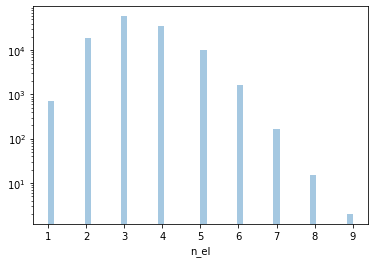

In [12]:
ax = sns.distplot(orig_data['n_el'], kde=False)
ax.set_yscale('log')

**1.4 Finding 10 most common and 10 least commonly occuring elements in compounds**

In [13]:
#instantiate the dictionary
element_occurrences = {}
# look through every entry in the composition column
for comp in orig_data['composition']:
    #look through every element in each composition
    for element in comp:
        #if we haven't seen this element before, add it to our dictionary
        #and set the count equal to 1 (first occurence!)
        if element not in element_occurrences:
            element_occurrences[element] = 1
        # if we've seen it before, add another occurence to the count
        elif element in element_occurrences:
            # add 1 to the count of the element
            element_occurrences[element] += 1
            # element_occurrences[element] = element_occurrences[element] + 1

In [222]:
#pprint(element_occurrences)

In [15]:
for i in element_occurrences:
    element_occurrences[i] = [element_occurrences[i]]
orig_data_elements = pd.DataFrame(element_occurrences)
df = orig_data_elements.T
df['count'] = df[0]
df = df.drop(0, axis=1)
df = df.sort_values(by=['count'])

**10 least commonly occuring elements, number of occurences in compounds**

In [16]:
df.head(10)

,count
Ne,1
Ar,2
He,8
Kr,15
Xe,147
Pa,253
Ac,297
Np,340
Pu,388
Pm,515


**10 most commonly occuring elements, number of occurences in compounds**

In [17]:
df.tail(10)

,count
Mg,8711
Si,8940
F,9606
N,9723
Fe,10109
S,10516
Mn,11233
P,13321
Li,18580
O,60428


## Question 2

Define functions for taking average elemental properties of compounds in the orig_data dataset

For a single, specified property from element_data:

In [224]:
# requires compound to be a pymatgen Composition object
# element_data is a table of elemental properties
# returns a float value of the averaged elemental property...
# ...for the input compound
def get_average_property(compound, prop, element_data):
    avg = 0
    total = 0
    c = compound.to_data_dict['reduced_cell_composition']
    for el in c:
        avg += element_data.loc[el, prop]*c[el]
        total += c[el]
    avg = avg/total
    
    return avg

For a series of all properties in element_data:

In [174]:
# requires compound to be a pymatgen Composition object
# element_data is a table of elemental properties
# returns a pandas series object of averaged elemental properties...
# ...for the input compound
def get_average_properties(compound, element_data):
    avg = 0
    total = 0
    c = compound.to_data_dict['reduced_cell_composition']
    for el in c:
        avg += element_data.loc[el, :]*c[el]
        total += c[el]
    avg = avg/total
    
    return avg

Return a series of all the maximum elemental property values for a given compound:

In [260]:
def get_maximum_properties(compound, element_data):
    elements = compound.to_data_dict['elements']
    return np.max(element_data.loc[elements, :])

Return a series of all the minimum elemental property values for a given compound:

In [265]:
def get_minimum_properties(compound, element_data):
    elements = compound.to_data_dict['elements']
    return np.min(element_data.loc[elements, :])

In [250]:
orig_data['contains_noble_gas'] = [i.contains_element_type('noble_gas') for i in orig_data['composition']]

**2.1 how many compounds have noble gases in them? take them out.**

In [20]:
data = orig_data[orig_data['contains_noble_gas']]

In [21]:
orig_data_ignoble = orig_data[orig_data['contains_noble_gas'] == False]

In [238]:
print('original:', len(orig_data), '| without noble gases:', len(orig_data_ignoble), 
      '\ndifference:',len(orig_data)-len(orig_data_ignoble))

original: 124515 | without noble gases: 124342 
difference: 173


In [24]:
orig_data.shape

(124515, 9)

*set unique identifier 'task_id' as the index of our df*

In [220]:
clean_df = orig_data_ignoble.set_index(orig_data_ignoble['task_id']).drop('task_id', axis=1)
clean_df

,formula,formation_energy_per_atom,e_above_hull,band_gap,has_bandstructure,composition,n_el,contains_noble_gas
task_id,,,,,,,,
mp-1007923,CrNi3,-0.016354,0.000802,0.0000,False,"(Cr, Ni)",2,False
mp-1008754,TbHg2,-0.069428,0.329909,0.0000,True,"(Tb, Hg)",2,False
mp-1016886,MgVO3,-2.241438,0.545977,0.0000,True,"(Mg, V, O)",3,False
mp-1018902,PrSbPt,-1.111238,0.000000,0.0000,True,"(Pr, Sb, Pt)",3,False
mp-1020595,Rb8PO3,-0.772860,0.491666,0.0000,True,"(Rb, P, O)",3,False
...,...,...,...,...,...,...,...,...
mvc-9995,Zn(MoO2)2,-1.774105,0.170001,0.6809,True,"(Zn, Mo, O)",3,False
mvc-9996,MgV2O4,-2.669536,0.053871,1.4898,True,"(Mg, V, O)",3,False
mvc-9997,Ca(CoO2)2,-1.777514,0.161485,0.0000,True,"(Ca, Co, O)",3,False


**2.2 Load element properties. How many NaN in each column?**

In [25]:
element_data = pd.read_csv("./class_repo/labs/lab2/element_properties.csv", index_col=0)

In [26]:
element_data.isna().sum()

AtomicRadius               7
AtomicVolume               2
AtomicWeight               0
BulkModulus               26
BoilingT                   2
Column                     0
CovalentRadius             0
Density                    2
ElectronAffinity           9
Electronegativity          4
FirstIonizationEnergy      1
HeatCapacityMass          10
Row                        0
phi                       22
SecondIonizationEnergy    12
ShearModulus              34
dtype: int64

## 2.3 
**Compute the means of each column.**

**Fill NaNs with the mean of the column they belong to.**

In [27]:
element_data.describe()

,AtomicRadius,AtomicVolume,AtomicWeight,BulkModulus,BoilingT,Column,CovalentRadius,Density,ElectronAffinity,Electronegativity,FirstIonizationEnergy,HeatCapacityMass,Row,phi,SecondIonizationEnergy,ShearModulus
count,88.000000,93.000000,95.000000,69.000000,93.000000,95.000000,95.000000,93.000000,86.000000,91.000000,94.000000,85.000000,95.000000,73.000000,83.000000,61.000000
mean,1.500682,3426.442121,116.153896,90.794203,2549.858065,8.315789,151.810526,7489.235725,76.162209,1.747033,8.094711,0.635447,4.831579,4.034247,18.947504,47.362295
std,0.403954,9869.341789,71.969479,95.957835,1591.157210,5.838725,44.510648,5921.990631,80.643656,0.645836,3.441865,1.651877,1.527427,1.061636,10.220245,53.450460
min,0.250000,7.297767,1.007940,1.100000,4.070000,1.000000,28.000000,0.089900,0.000000,0.700000,3.893905,0.094000,1.000000,1.950000,10.003830,1.300000
25%,1.350000,17.075648,53.467073,28.000000,1180.000000,3.000000,127.000000,2460.000000,21.075000,1.235000,5.989151,0.168000,4.000000,3.210000,12.133000,16.000000
50%,1.450000,28.214122,112.411000,45.000000,2792.000000,7.000000,146.000000,7010.000000,50.000000,1.650000,7.314710,0.244000,5.000000,4.050000,16.630000,27.000000
75%,1.800000,37.740406,176.728400,140.000000,3618.000000,14.000000,190.000000,10070.000000,105.375000,2.185000,8.987120,0.489000,6.000000,4.800000,20.471725,48.000000
max,2.600000,37887.799548,244.000000,380.000000,5869.000000,18.000000,260.000000,22590.000000,349.000000,3.980000,24.587387,14.304000,7.000000,6.860000,75.640000,222.000000


In [28]:
element_data = element_data.fillna(element_data.mean())

In [29]:
element_data.isna().any()

AtomicRadius              False
AtomicVolume              False
AtomicWeight              False
BulkModulus               False
BoilingT                  False
Column                    False
CovalentRadius            False
Density                   False
ElectronAffinity          False
Electronegativity         False
FirstIonizationEnergy     False
HeatCapacityMass          False
Row                       False
phi                       False
SecondIonizationEnergy    False
ShearModulus              False
dtype: bool

## 2.4

**Compute the composition-averaged AtomicRadius for all materials**

In [226]:
## SLOW VERSION ##

# avg_sizes = {}
# radius = element_data['AtomicRadius']
# comps = orig_data['composition']
# counter = 0

# for compound in comp:
#     if compound not in avg_sizes:
#         counter += 1
#         print(compound, " progress", counter/len(comp))
#         avg_sizes[compound] = 0
#         for el in compound:
#             frac = compound.get_atomic_fraction(el)
#             size = frac * radius[str(el)]
#             avg_sizes[compound] += size

In [227]:
fast_sizes = {}
#progress = lambda a: a/len(clean_df)
#counter = 0
for i in clean_df.index:
    avg = get_average_property(clean_df.loc[i, 'composition'], 'AtomicRadius', element_data)
    fast_sizes[i] = avg
    #counter += 1
    #print(progress(counter))

8.042334850653843e-06
1.6084669701307685e-05
2.4127004551961524e-05
3.216933940261537e-05
4.021167425326921e-05
4.825400910392305e-05
5.6296343954576895e-05
6.433867880523074e-05
7.238101365588458e-05
8.042334850653842e-05
8.846568335719226e-05
9.65080182078461e-05
0.00010455035305849995
0.00011259268790915379
0.00012063502275980763
0.00012867735761046148
0.00013671969246111532
0.00014476202731176916
0.000152804362162423
0.00016084669701307684
0.00016888903186373068
0.00017693136671438452
0.00018497370156503836
0.0001930160364156922
0.00020105837126634603
0.0002091007061169999
0.00021714304096765374
0.00022518537581830758
0.00023322771066896142
0.00024127004551961526
0.0002493123803702691
0.00025735471522092296
0.0002653970500715768
0.00027343938492223064
0.00028148171977288445
0.0002895240546235383
0.00029756638947419213
0.000305608724324846
0.0003136510591754998
0.0003216933940261537
0.0003297357288768075
0.00033777806372746135
0.0003458203985781152
0.00035386273342876903
0.000361905

0.005806565762172074
0.005814608097022727
0.005822650431873381
0.005830692766724035
0.005838735101574689
0.005846777436425343
0.005854819771275997
0.005862862106126651
0.005870904440977305
0.005878946775827959
0.0058869891106786126
0.0058950314455292665
0.0059030737803799195
0.0059111161152305735
0.005919158450081227
0.005927200784931881
0.005935243119782535
0.005943285454633189
0.005951327789483843
0.005959370124334497
0.005967412459185151
0.005975454794035805
0.005983497128886459
0.005991539463737112
0.005999581798587766
0.00600762413343842
0.0060156664682890736
0.0060237088031397275
0.006031751137990381
0.006039793472841035
0.006047835807691689
0.006055878142542343
0.006063920477392997
0.006071962812243651
0.006080005147094304
0.006088047481944958
0.006096089816795612
0.006104132151646266
0.00611217448649692
0.006120216821347574
0.006128259156198228
0.0061363014910488815
0.006144343825899535
0.006152386160750189
0.006160428495600843
0.006168470830451496
0.00617651316530215
0.0061845

0.011339692139421917
0.01134773447427257
0.011355776809123225
0.011363819143973879
0.011371861478824533
0.011379903813675186
0.01138794614852584
0.011395988483376494
0.011404030818227148
0.011412073153077802
0.011420115487928456
0.01142815782277911
0.011436200157629762
0.011444242492480416
0.01145228482733107
0.011460327162181724
0.011468369497032378
0.011476411831883032
0.011484454166733686
0.01149249650158434
0.011500538836434994
0.011508581171285647
0.011516623506136301
0.011524665840986955
0.01153270817583761
0.011540750510688263
0.011548792845538917
0.011556835180389571
0.011564877515240225
0.011572919850090879
0.011580962184941533
0.011589004519792187
0.01159704685464284
0.011605089189493495
0.011613131524344148
0.0116211738591948
0.011629216194045455
0.011637258528896108
0.011645300863746762
0.011653343198597416
0.01166138553344807
0.011669427868298724
0.011677470203149378
0.011685512538000032
0.011693554872850686
0.01170159720770134
0.011709639542551994
0.011717681877402648
0.0

0.017717263675990413
0.017725306010841067
0.01773334834569172
0.017741390680542375
0.01774943301539303
0.017757475350243683
0.017765517685094337
0.01777356001994499
0.017781602354795645
0.0177896446896463
0.017797687024496953
0.017805729359347607
0.01781377169419826
0.017821814029048914
0.01782985636389957
0.017837898698750222
0.017845941033600876
0.01785398336845153
0.017862025703302184
0.017870068038152838
0.017878110373003492
0.017886152707854146
0.0178941950427048
0.017902237377555454
0.017910279712406104
0.017918322047256758
0.017926364382107412
0.017934406716958066
0.01794244905180872
0.017950491386659374
0.017958533721510028
0.01796657605636068
0.017974618391211335
0.01798266072606199
0.017990703060912643
0.017998745395763297
0.01800678773061395
0.018014830065464605
0.01802287240031526
0.018030914735165913
0.018038957070016567
0.01804699940486722
0.018055041739717875
0.01806308407456853
0.018071126409419182
0.018079168744269836
0.01808721107912049
0.018095253413971144
0.01810329

0.02375705714883145
0.023765099483682103
0.023773141818532757
0.02378118415338341
0.023789226488234064
0.02379726882308472
0.023805311157935372
0.023813353492786026
0.02382139582763668
0.023829438162487334
0.023837480497337988
0.023845522832188642
0.023853565167039296
0.02386160750188995
0.023869649836740604
0.023877692171591258
0.02388573450644191
0.023893776841292565
0.02390181917614322
0.023909861510993873
0.023917903845844527
0.02392594618069518
0.023933988515545835
0.023942030850396485
0.02395007318524714
0.023958115520097793
0.023966157854948447
0.0239742001897991
0.023982242524649755
0.02399028485950041
0.023998327194351063
0.024006369529201717
0.02401441186405237
0.024022454198903025
0.02403049653375368
0.024038538868604332
0.024046581203454986
0.02405462353830564
0.024062665873156294
0.024070708208006948
0.024078750542857602
0.024086792877708256
0.02409483521255891
0.024102877547409564
0.024110919882260218
0.02411896221711087
0.024127004551961526
0.02413504688681218
0.02414308

0.0293062681957826
0.029314310530633252
0.029322352865483906
0.02933039520033456
0.029338437535185214
0.029346479870035868
0.029354522204886522
0.029362564539737176
0.02937060687458783
0.029378649209438484
0.029386691544289138
0.02939473387913979
0.029402776213990445
0.0294108185488411
0.029418860883691753
0.029426903218542407
0.02943494555339306
0.029442987888243715
0.02945103022309437
0.029459072557945023
0.029467114892795677
0.02947515722764633
0.029483199562496985
0.02949124189734764
0.029499284232198292
0.029507326567048946
0.0295153689018996
0.029523411236750254
0.029531453571600908
0.029539495906451562
0.029547538241302216
0.02955558057615287
0.029563622911003524
0.029571665245854178
0.02957970758070483
0.029587749915555486
0.02959579225040614
0.029603834585256793
0.029611876920107444
0.029619919254958098
0.02962796158980875
0.029636003924659406
0.02964404625951006
0.029652088594360713
0.029660130929211367
0.02966817326406202
0.029676215598912675
0.02968425793376333
0.0296923002

0.03483135223818179
0.034839394573032444
0.0348474369078831
0.03485547924273375
0.034863521577584405
0.03487156391243506
0.03487960624728571
0.03488764858213637
0.03489569091698702
0.034903733251837675
0.03491177558668833
0.03491981792153898
0.03492786025638964
0.03493590259124029
0.034943944926090945
0.0349519872609416
0.03496002959579225
0.034968071930642906
0.03497611426549356
0.034984156600344214
0.03499219893519487
0.03500024127004552
0.035008283604896176
0.03501632593974683
0.035024368274597484
0.03503241060944814
0.03504045294429879
0.035048495279149446
0.0350565376140001
0.03506457994885075
0.03507262228370141
0.03508066461855206
0.035088706953402715
0.03509674928825337
0.03510479162310402
0.03511283395795467
0.035120876292805324
0.03512891862765598
0.03513696096250663
0.035145003297357286
0.03515304563220794
0.035161087967058594
0.03516913030190925
0.0351771726367599
0.035185214971610555
0.03519325730646121
0.03520129964131186
0.03520934197616252
0.03521738431101317
0.03522542

0.040477071303340786
0.04048511363819144
0.040493155973042094
0.04050119830789275
0.0405092406427434
0.040517282977594056
0.04052532531244471
0.040533367647295364
0.04054140998214602
0.04054945231699667
0.040557494651847326
0.04056553698669798
0.04057357932154863
0.04058162165639929
0.04058966399124994
0.040597706326100595
0.04060574866095125
0.0406137909958019
0.04062183333065256
0.04062987566550321
0.040637918000353865
0.04064596033520452
0.04065400267005517
0.04066204500490583
0.04067008733975648
0.040678129674607134
0.04068617200945779
0.04069421434430844
0.040702256679159096
0.04071029901400975
0.040718341348860404
0.04072638368371106
0.04073442601856171
0.040742468353412366
0.04075051068826302
0.040758553023113674
0.04076659535796433
0.04077463769281498
0.04078268002766563
0.04079072236251628
0.040798764697366936
0.04080680703221759
0.040814849367068244
0.0408228917019189
0.04083093403676955
0.040838976371620206
0.04084701870647086
0.040855061041321514
0.04086310337617217
0.04087

0.04628363706551286
0.046291679400363515
0.04629972173521417
0.04630776407006482
0.04631580640491548
0.04632384873976613
0.046331891074616785
0.04633993340946744
0.04634797574431809
0.04635601807916875
0.0463640604140194
0.046372102748870055
0.04638014508372071
0.04638818741857136
0.046396229753422016
0.04640427208827267
0.046412314423123324
0.04642035675797398
0.04642839909282463
0.046436441427675286
0.04644448376252594
0.046452526097376594
0.04646056843222724
0.046468610767077895
0.04647665310192855
0.0464846954367792
0.046492737771629856
0.04650078010648051
0.046508822441331164
0.04651686477618182
0.04652490711103247
0.046532949445883126
0.04654099178073378
0.046549034115584434
0.04655707645043509
0.04656511878528574
0.046573161120136396
0.04658120345498705
0.046589245789837704
0.04659728812468836
0.04660533045953901
0.046613372794389665
0.04662141512924032
0.04662945746409097
0.04663749979894163
0.04664554213379228
0.046653584468642935
0.04666162680349359
0.04666966913834424
0.0466

0.052162583841340815
0.05217062617619147
0.05217866851104212
0.05218671084589278
0.05219475318074343
0.052202795515594085
0.05221083785044474
0.05221888018529539
0.052226922520146046
0.0522349648549967
0.052243007189847354
0.05225104952469801
0.05225909185954866
0.052267134194399316
0.05227517652924997
0.052283218864100624
0.05229126119895128
0.05229930353380193
0.052307345868652586
0.05231538820350324
0.05232343053835389
0.05233147287320455
0.0523395152080552
0.052347557542905855
0.05235559987775651
0.05236364221260716
0.05237168454745782
0.05237972688230847
0.052387769217159125
0.05239581155200978
0.05240385388686043
0.052411896221711086
0.05241993855656174
0.052427980891412394
0.05243602322626305
0.0524440655611137
0.052452107895964356
0.05246015023081501
0.052468192565665664
0.05247623490051632
0.05248427723536697
0.052492319570217626
0.05250036190506828
0.052508404239918934
0.05251644657476959
0.05252448890962024
0.052532531244470895
0.05254057357932155
0.0525486159141722
0.052556

0.05804957295201943
0.05805761528687008
0.05806565762172074
0.05807369995657139
0.058081742291422045
0.0580897846262727
0.05809782696112335
0.05810586929597401
0.05811391163082466
0.058121953965675315
0.05812999630052597
0.05813803863537662
0.058146080970227276
0.05815412330507793
0.058162165639928584
0.05817020797477924
0.05817825030962989
0.058186292644480546
0.0581943349793312
0.058202377314181854
0.05821041964903251
0.05821846198388316
0.058226504318733815
0.05823454665358447
0.05824258898843512
0.05825063132328578
0.05825867365813643
0.058266715992987085
0.05827475832783774
0.05828280066268839
0.05829084299753905
0.0582988853323897
0.058306927667240355
0.05831497000209101
0.05832301233694166
0.058331054671792316
0.05833909700664297
0.058347139341493624
0.05835518167634428
0.05836322401119493
0.058371266346045586
0.05837930868089624
0.058387351015746894
0.05839539335059755
0.0584034356854482
0.058411478020298856
0.05841952035514951
0.058427562690000164
0.05843560502485082
0.0584436

0.06379180003538627
0.06379984237023693
0.06380788470508758
0.06381592703993824
0.06382396937478889
0.06383201170963954
0.0638400540444902
0.06384809637934084
0.0638561387141915
0.06386418104904215
0.06387222338389281
0.06388026571874346
0.06388830805359412
0.06389635038844477
0.06390439272329543
0.06391243505814607
0.06392047739299674
0.06392851972784738
0.06393656206269804
0.06394460439754869
0.06395264673239935
0.06396068906725
0.06396873140210066
0.0639767737369513
0.06398481607180197
0.06399285840665261
0.06400090074150327
0.06400894307635392
0.06401698541120458
0.06402502774605523
0.06403307008090589
0.06404111241575654
0.0640491547506072
0.06405719708545785
0.0640652394203085
0.06407328175515915
0.06408132409000981
0.06408936642486046
0.06409740875971112
0.06410545109456177
0.06411349342941243
0.06412153576426308
0.06412957809911374
0.06413762043396438
0.06414566276881505
0.06415370510366569
0.06416174743851635
0.064169789773367
0.06417783210821766
0.06418587444306831
0.06419391

0.06907561403226585
0.0690836563671165
0.06909169870196716
0.0690997410368178
0.06910778337166847
0.06911582570651911
0.06912386804136977
0.06913191037622042
0.06913995271107108
0.06914799504592173
0.06915603738077239
0.06916407971562304
0.0691721220504737
0.06918016438532434
0.069188206720175
0.06919624905502565
0.06920429138987631
0.06921233372472696
0.06922037605957762
0.06922841839442827
0.06923646072927893
0.06924450306412958
0.06925254539898024
0.06926058773383088
0.06926863006868154
0.06927667240353219
0.06928471473838285
0.0692927570732335
0.06930079940808416
0.0693088417429348
0.06931688407778547
0.06932492641263611
0.06933296874748678
0.06934101108233742
0.06934905341718808
0.06935709575203873
0.06936513808688939
0.06937318042174004
0.0693812227565907
0.06938926509144135
0.06939730742629201
0.06940534976114265
0.06941339209599331
0.06942143443084396
0.06942947676569462
0.06943751910054527
0.06944556143539593
0.06945360377024658
0.06946164610509724
0.06946968843994789
0.069477

0.07497868781264577
0.07498673014749642
0.07499477248234708
0.07500281481719773
0.07501085715204839
0.07501889948689903
0.0750269418217497
0.07503498415660034
0.075043026491451
0.07505106882630165
0.07505911116115231
0.07506715349600296
0.07507519583085362
0.07508323816570427
0.07509128050055493
0.07509932283540557
0.07510736517025624
0.07511540750510688
0.07512344983995754
0.07513149217480819
0.07513953450965885
0.0751475768445095
0.07515561917936016
0.0751636615142108
0.07517170384906147
0.07517974618391211
0.07518778851876276
0.07519583085361342
0.07520387318846407
0.07521191552331473
0.07521995785816538
0.07522800019301604
0.07523604252786668
0.07524408486271734
0.07525212719756799
0.07526016953241865
0.0752682118672693
0.07527625420211996
0.07528429653697061
0.07529233887182127
0.07530038120667192
0.07530842354152258
0.07531646587637322
0.07532450821122388
0.07533255054607453
0.07534059288092519
0.07534863521577584
0.0753566775506265
0.07536471988547715
0.07537276222032781
0.07538

0.08067266088690869
0.08068070322175934
0.08068874555661
0.08069678789146065
0.08070483022631131
0.08071287256116196
0.08072091489601262
0.08072895723086326
0.08073699956571392
0.08074504190056457
0.08075308423541523
0.08076112657026588
0.08076916890511654
0.08077721123996719
0.08078525357481785
0.0807932959096685
0.08080133824451916
0.0808093805793698
0.08081742291422046
0.08082546524907111
0.08083350758392177
0.08084154991877242
0.08084959225362308
0.08085763458847373
0.08086567692332437
0.08087371925817503
0.08088176159302568
0.08088980392787634
0.08089784626272699
0.08090588859757765
0.0809139309324283
0.08092197326727896
0.0809300156021296
0.08093805793698026
0.08094610027183091
0.08095414260668157
0.08096218494153222
0.08097022727638288
0.08097826961123353
0.08098631194608419
0.08099435428093484
0.0810023966157855
0.08101043895063614
0.0810184812854868
0.08102652362033745
0.08103456595518811
0.08104260829003876
0.08105065062488942
0.08105869295974007
0.08106673529459073
0.0810747

0.08636663396117161
0.08637467629602226
0.08638271863087292
0.08639076096572357
0.08639880330057423
0.08640684563542488
0.08641488797027554
0.08642293030512618
0.08643097263997684
0.08643901497482749
0.08644705730967815
0.0864550996445288
0.08646314197937946
0.0864711843142301
0.08647922664908077
0.08648726898393141
0.08649531131878208
0.08650335365363272
0.08651139598848338
0.08651943832333403
0.08652748065818468
0.08653552299303534
0.08654356532788599
0.08655160766273665
0.08655964999758729
0.08656769233243795
0.0865757346672886
0.08658377700213926
0.08659181933698991
0.08659986167184057
0.08660790400669122
0.08661594634154188
0.08662398867639252
0.08663203101124319
0.08664007334609383
0.08664811568094449
0.08665615801579514
0.0866642003506458
0.08667224268549645
0.08668028502034711
0.08668832735519776
0.08669636969004842
0.08670441202489906
0.08671245435974972
0.08672049669460037
0.08672853902945103
0.08673658136430168
0.08674462369915234
0.08675266603400299
0.08676070836885365
0.08

0.09233404642035675
0.09234208875520741
0.09235013109005806
0.09235817342490872
0.09236621575975937
0.09237425809461003
0.09238230042946068
0.09239034276431134
0.09239838509916198
0.09240642743401264
0.09241446976886329
0.09242251210371395
0.0924305544385646
0.09243859677341526
0.09244663910826591
0.09245468144311657
0.09246272377796722
0.09247076611281788
0.09247880844766852
0.09248685078251918
0.09249489311736983
0.09250293545222049
0.09251097778707114
0.0925190201219218
0.09252706245677245
0.09253510479162311
0.09254314712647375
0.09255118946132442
0.09255923179617506
0.09256727413102572
0.09257531646587637
0.09258335880072703
0.09259140113557768
0.09259944347042834
0.09260748580527899
0.09261552814012965
0.0926235704749803
0.09263161280983095
0.0926396551446816
0.09264769747953226
0.09265573981438291
0.09266378214923357
0.09267182448408422
0.09267986681893488
0.09268790915378552
0.09269595148863619
0.09270399382348683
0.0927120361583375
0.09272007849318814
0.0927281208280388
0.0927

0.09806823116887295
0.0980762735037236
0.09808431583857426
0.0980923581734249
0.09810040050827556
0.09810844284312621
0.09811648517797687
0.09812452751282752
0.09813256984767818
0.09814061218252883
0.09814865451737949
0.09815669685223014
0.0981647391870808
0.09817278152193144
0.0981808238567821
0.09818886619163275
0.09819690852648341
0.09820495086133406
0.09821299319618472
0.09822103553103537
0.09822907786588603
0.09823712020073667
0.09824516253558734
0.09825320487043798
0.09826124720528864
0.09826928954013929
0.09827733187498995
0.0982853742098406
0.09829341654469126
0.0983014588795419
0.09830950121439257
0.09831754354924321
0.09832558588409387
0.09833362821894452
0.09834167055379518
0.09834971288864583
0.09835775522349649
0.09836579755834714
0.0983738398931978
0.09838188222804845
0.0983899245628991
0.09839796689774975
0.09840600923260041
0.09841405156745106
0.09842209390230172
0.09843013623715237
0.09843817857200303
0.09844622090685368
0.09845426324170434
0.09846230557655498
0.098470

0.10396326261440221
0.10397130494925287
0.10397934728410352
0.10398738961895418
0.10399543195380483
0.10400347428865549
0.10401151662350613
0.1040195589583568
0.10402760129320744
0.1040356436280581
0.10404368596290875
0.10405172829775941
0.10405977063261006
0.10406781296746072
0.10407585530231137
0.10408389763716203
0.10409193997201267
0.10409998230686333
0.10410802464171398
0.10411606697656464
0.10412410931141529
0.10413215164626595
0.1041401939811166
0.10414823631596726
0.1041562786508179
0.10416432098566857
0.10417236332051921
0.10418040565536987
0.10418844799022052
0.10419649032507118
0.10420453265992183
0.10421257499477249
0.10422061732962314
0.1042286596644738
0.10423670199932444
0.1042447443341751
0.10425278666902575
0.1042608290038764
0.10426887133872706
0.1042769136735777
0.10428495600842837
0.10429299834327901
0.10430104067812968
0.10430908301298032
0.10431712534783098
0.10432516768268163
0.10433321001753229
0.10434125235238294
0.1043492946872336
0.10435733702208425
0.1043653

0.10967332035836644
0.1096813626932171
0.10968940502806775
0.10969744736291841
0.10970548969776905
0.10971353203261971
0.10972157436747036
0.10972961670232102
0.10973765903717167
0.10974570137202233
0.10975374370687298
0.10976178604172364
0.10976982837657429
0.10977787071142495
0.1097859130462756
0.10979395538112625
0.1098019977159769
0.10981004005082756
0.10981808238567821
0.10982612472052887
0.10983416705537952
0.10984220939023018
0.10985025172508082
0.10985829405993149
0.10986633639478213
0.1098743787296328
0.10988242106448344
0.1098904633993341
0.10989850573418475
0.10990654806903541
0.10991459040388606
0.10992263273873672
0.10993067507358736
0.10993871740843801
0.10994675974328867
0.10995480207813932
0.10996284441298998
0.10997088674784063
0.10997892908269129
0.10998697141754193
0.1099950137523926
0.11000305608724324
0.1100110984220939
0.11001914075694455
0.11002718309179521
0.11003522542664586
0.11004326776149652
0.11005131009634717
0.11005935243119783
0.11006739476604847
0.11007

0.1154638014508372
0.11547184378568787
0.11547988612053851
0.11548792845538917
0.11549597079023982
0.11550401312509048
0.11551205545994113
0.11552009779479179
0.11552814012964244
0.1155361824644931
0.11554422479934374
0.1155522671341944
0.11556030946904505
0.11556835180389571
0.11557639413874636
0.11558443647359702
0.11559247880844767
0.11560052114329833
0.11560856347814898
0.11561660581299962
0.11562464814785028
0.11563269048270093
0.11564073281755159
0.11564877515240224
0.1156568174872529
0.11566485982210355
0.11567290215695421
0.11568094449180485
0.11568898682665552
0.11569702916150616
0.11570507149635682
0.11571311383120747
0.11572115616605813
0.11572919850090878
0.11573724083575944
0.11574528317061009
0.11575332550546075
0.1157613678403114
0.11576941017516205
0.1157774525100127
0.11578549484486336
0.11579353717971401
0.11580157951456467
0.11580962184941532
0.11581766418426598
0.11582570651911663
0.11583374885396729
0.11584179118881793
0.1158498335236686
0.11585787585851924
0.11586

0.12201026201926943
0.12201830435412009
0.12202634668897074
0.1220343890238214
0.12204243135867204
0.1220504736935227
0.12205851602837335
0.12206655836322401
0.12207460069807466
0.12208264303292532
0.12209068536777597
0.12209872770262663
0.12210677003747727
0.12211481237232794
0.12212285470717858
0.12213089704202924
0.12213893937687989
0.12214698171173055
0.1221550240465812
0.12216306638143186
0.1221711087162825
0.12217915105113317
0.12218719338598381
0.12219523572083447
0.12220327805568512
0.12221132039053578
0.12221936272538643
0.12222740506023709
0.12223544739508774
0.1222434897299384
0.12225153206478905
0.1222595743996397
0.12226761673449035
0.12227565906934101
0.12228370140419166
0.12229174373904232
0.12229978607389297
0.12230782840874363
0.12231587074359428
0.12232391307844494
0.12233195541329558
0.12233999774814625
0.12234804008299689
0.12235608241784755
0.1223641247526982
0.12237216708754886
0.12238020942239951
0.12238825175725017
0.12239629409210082
0.12240433642695148
0.12241

0.12780878544659086
0.12781682778144152
0.12782487011629215
0.1278329124511428
0.12784095478599347
0.12784899712084413
0.12785703945569477
0.12786508179054543
0.1278731241253961
0.12788116646024675
0.12788920879509738
0.12789725112994804
0.1279052934647987
0.12791333579964936
0.1279213781345
0.12792942046935066
0.12793746280420132
0.12794550513905198
0.1279535474739026
0.12796158980875327
0.12796963214360393
0.1279776744784546
0.12798571681330523
0.1279937591481559
0.12800180148300655
0.1280098438178572
0.12801788615270784
0.1280259284875585
0.12803397082240917
0.12804201315725983
0.12805005549211046
0.12805809782696112
0.12806614016181178
0.12807418249666244
0.12808222483151308
0.12809026716636374
0.1280983095012144
0.12810635183606506
0.1281143941709157
0.12812243650576635
0.128130478840617
0.12813852117546767
0.1281465635103183
0.12815460584516897
0.12816264818001963
0.1281706905148703
0.12817873284972092
0.12818677518457158
0.12819481751942224
0.1282028598542729
0.12821090218912354

0.1333258271541394
0.13333386948899004
0.1333419118238407
0.13334995415869136
0.133357996493542
0.13336603882839265
0.1333740811632433
0.13338212349809397
0.1333901658329446
0.13339820816779527
0.13340625050264593
0.1334142928374966
0.13342233517234722
0.13343037750719788
0.13343841984204854
0.1334464621768992
0.13345450451174984
0.1334625468466005
0.13347058918145116
0.13347863151630182
0.13348667385115245
0.13349471618600312
0.13350275852085378
0.13351080085570444
0.13351884319055507
0.13352688552540573
0.1335349278602564
0.13354297019510705
0.13355101252995769
0.13355905486480835
0.133567097199659
0.13357513953450967
0.1335831818693603
0.13359122420421096
0.13359926653906162
0.13360730887391228
0.13361535120876292
0.13362339354361358
0.13363143587846424
0.1336394782133149
0.13364752054816553
0.1336555628830162
0.13366360521786685
0.13367164755271752
0.13367968988756815
0.1336877322224188
0.13369577455726947
0.13370381689212013
0.13371185922697076
0.13371990156182142
0.13372794389667

0.13859355648131766
0.13860159881616832
0.13860964115101895
0.1386176834858696
0.13862572582072027
0.13863376815557094
0.13864181049042157
0.13864985282527223
0.1386578951601229
0.13866593749497355
0.13867397982982418
0.13868202216467485
0.1386900644995255
0.13869810683437617
0.1387061491692268
0.13871419150407746
0.13872223383892812
0.13873027617377878
0.13873831850862942
0.13874636084348008
0.13875440317833074
0.1387624455131814
0.13877048784803203
0.1387785301828827
0.13878657251773335
0.13879461485258401
0.13880265718743465
0.1388106995222853
0.13881874185713597
0.13882678419198663
0.13883482652683726
0.13884286886168792
0.13885091119653858
0.13885895353138925
0.13886699586623988
0.13887503820109054
0.1388830805359412
0.13889112287079186
0.1388991652056425
0.13890720754049315
0.13891524987534382
0.13892329221019448
0.1389313345450451
0.13893937687989577
0.13894741921474643
0.1389554615495971
0.13896350388444773
0.1389715462192984
0.13897958855414905
0.1389876308889997
0.13899567322

0.14462530761930803
0.1446333499541587
0.14464139228900935
0.14464943462386
0.14465747695871065
0.1446655192935613
0.14467356162841197
0.1446816039632626
0.14468964629811326
0.14469768863296392
0.14470573096781458
0.14471377330266522
0.14472181563751588
0.14472985797236654
0.1447379003072172
0.14474594264206783
0.1447539849769185
0.14476202731176915
0.14477006964661981
0.14477811198147045
0.1447861543163211
0.14479419665117177
0.14480223898602243
0.14481028132087306
0.14481832365572372
0.14482636599057438
0.14483440832542505
0.14484245066027568
0.14485049299512634
0.144858535329977
0.14486657766482766
0.1448746199996783
0.14488266233452896
0.14489070466937962
0.14489874700423028
0.1449067893390809
0.14491483167393157
0.14492287400878223
0.1449309163436329
0.14493895867848353
0.1449470010133342
0.14495504334818485
0.1449630856830355
0.14497112801788614
0.1449791703527368
0.14498721268758746
0.14499525502243812
0.14500329735728876
0.14501133969213942
0.14501938202699008
0.145027424361840

0.15027102668446704
0.1502790690193177
0.15028711135416833
0.150295153689019
0.15030319602386966
0.15031123835872032
0.15031928069357095
0.1503273230284216
0.15033536536327227
0.15034340769812293
0.15035145003297357
0.15035949236782423
0.1503675347026749
0.15037557703752552
0.15038361937237618
0.15039166170722684
0.1503997040420775
0.15040774637692814
0.1504157887117788
0.15042383104662946
0.15043187338148012
0.15043991571633075
0.1504479580511814
0.15045600038603207
0.15046404272088273
0.15047208505573337
0.15048012739058403
0.1504881697254347
0.15049621206028535
0.15050425439513598
0.15051229672998664
0.1505203390648373
0.15052838139968797
0.1505364237345386
0.15054446606938926
0.15055250840423992
0.15056055073909058
0.15056859307394121
0.15057663540879188
0.15058467774364254
0.1505927200784932
0.15060076241334383
0.1506088047481945
0.15061684708304515
0.1506248894178958
0.15063293175274645
0.1506409740875971
0.15064901642244777
0.15065705875729843
0.15066510109214906
0.1506731434269

0.15623039680880152
0.15623843914365218
0.15624648147850284
0.1562545238133535
0.15626256614820414
0.1562706084830548
0.15627865081790546
0.15628669315275612
0.15629473548760675
0.1563027778224574
0.15631082015730807
0.15631886249215873
0.15632690482700937
0.15633494716186003
0.1563429894967107
0.15635103183156135
0.15635907416641198
0.15636711650126264
0.1563751588361133
0.15638320117096396
0.1563912435058146
0.15639928584066526
0.15640732817551592
0.15641537051036658
0.1564234128452172
0.15643145518006787
0.15643949751491854
0.1564475398497692
0.15645558218461983
0.1564636245194705
0.15647166685432115
0.1564797091891718
0.15648775152402244
0.1564957938588731
0.15650383619372377
0.15651187852857443
0.15651992086342506
0.15652796319827572
0.15653600553312638
0.15654404786797704
0.15655209020282768
0.15656013253767834
0.156568174872529
0.15657621720737966
0.1565842595422303
0.15659230187708095
0.1566003442119316
0.15660838654678227
0.1566164288816329
0.15662447121648357
0.15663251355133

0.16213347058918146
0.16214151292403212
0.16214955525888275
0.1621575975937334
0.16216563992858407
0.16217368226343473
0.16218172459828537
0.16218976693313603
0.1621978092679867
0.16220585160283735
0.16221389393768798
0.16222193627253864
0.1622299786073893
0.16223802094223996
0.1622460632770906
0.16225410561194126
0.16226214794679192
0.16227019028164258
0.1622782326164932
0.16228627495134387
0.16229431728619453
0.1623023596210452
0.16231040195589583
0.1623184442907465
0.16232648662559715
0.1623345289604478
0.16234257129529844
0.1623506136301491
0.16235865596499977
0.16236669829985043
0.16237474063470106
0.16238278296955172
0.16239082530440238
0.16239886763925304
0.16240690997410367
0.16241495230895434
0.162422994643805
0.16243103697865563
0.1624390793135063
0.16244712164835695
0.1624551639832076
0.16246320631805825
0.1624712486529089
0.16247929098775957
0.16248733332261023
0.16249537565746086
0.16250341799231152
0.16251146032716218
0.16251950266201284
0.16252754499686348
0.162535587331

0.1682054334014251
0.16821347573627576
0.1682215180711264
0.16822956040597706
0.16823760274082772
0.16824564507567838
0.168253687410529
0.16826172974537967
0.16826977208023033
0.168277814415081
0.16828585674993163
0.1682938990847823
0.16830194141963295
0.1683099837544836
0.16831802608933424
0.1683260684241849
0.16833411075903557
0.16834215309388623
0.16835019542873686
0.16835823776358752
0.16836628009843818
0.16837432243328884
0.16838236476813948
0.16839040710299014
0.1683984494378408
0.16840649177269146
0.1684145341075421
0.16842257644239275
0.1684306187772434
0.16843866111209407
0.1684467034469447
0.16845474578179537
0.16846278811664603
0.1684708304514967
0.16847887278634732
0.16848691512119798
0.16849495745604864
0.1685029997908993
0.16851104212574994
0.1685190844606006
0.16852712679545126
0.16853516913030192
0.16854321146515255
0.16855125380000321
0.16855929613485388
0.16856733846970454
0.16857538080455517
0.16858342313940583
0.1685914654742565
0.16859950780910715
0.168607550143957

0.17403612616814915
0.17404416850299978
0.17405221083785044
0.1740602531727011
0.17406829550755176
0.1740763378424024
0.17408438017725306
0.17409242251210372
0.17410046484695438
0.174108507181805
0.17411654951665567
0.17412459185150633
0.174132634186357
0.17414067652120763
0.1741487188560583
0.17415676119090895
0.1741648035257596
0.17417284586061024
0.1741808881954609
0.17418893053031156
0.17419697286516223
0.17420501520001286
0.17421305753486352
0.17422109986971418
0.17422914220456484
0.17423718453941547
0.17424522687426613
0.1742532692091168
0.17426131154396746
0.1742693538788181
0.17427739621366875
0.1742854385485194
0.17429348088337007
0.1743015232182207
0.17430956555307137
0.17431760788792203
0.1743256502227727
0.17433369255762332
0.17434173489247398
0.17434977722732464
0.1743578195621753
0.17436586189702594
0.1743739042318766
0.17438194656672726
0.17438998890157792
0.17439803123642855
0.1744060735712792
0.17441411590612987
0.17442215824098053
0.17443020057583117
0.174438242910681

0.18016438532434736
0.18017242765919803
0.18018046999404866
0.18018851232889932
0.18019655466374998
0.18020459699860064
0.18021263933345127
0.18022068166830194
0.1802287240031526
0.18023676633800326
0.1802448086728539
0.18025285100770455
0.1802608933425552
0.18026893567740587
0.1802769780122565
0.18028502034710717
0.18029306268195783
0.1803011050168085
0.18030914735165912
0.18031718968650978
0.18032523202136044
0.1803332743562111
0.18034131669106174
0.1803493590259124
0.18035740136076306
0.18036544369561372
0.18037348603046435
0.180381528365315
0.18038957070016567
0.18039761303501634
0.18040565536986697
0.18041369770471763
0.1804217400395683
0.18042978237441895
0.18043782470926958
0.18044586704412025
0.1804539093789709
0.18046195171382157
0.1804699940486722
0.18047803638352286
0.18048607871837352
0.18049412105322418
0.18050216338807482
0.18051020572292548
0.18051824805777614
0.1805262903926268
0.18053433272747743
0.1805423750623281
0.18055041739717875
0.1805584597320294
0.1805665020668

0.18622026346688972
0.18622830580174035
0.186236348136591
0.18624439047144167
0.18625243280629233
0.18626047514114297
0.18626851747599363
0.1862765598108443
0.18628460214569495
0.18629264448054558
0.18630068681539624
0.1863087291502469
0.18631677148509757
0.1863248138199482
0.18633285615479886
0.18634089848964952
0.18634894082450018
0.18635698315935081
0.18636502549420148
0.18637306782905214
0.1863811101639028
0.18638915249875343
0.1863971948336041
0.18640523716845475
0.1864132795033054
0.18642132183815605
0.1864293641730067
0.18643740650785737
0.18644544884270803
0.18645349117755866
0.18646153351240932
0.18646957584725998
0.18647761818211064
0.18648566051696128
0.18649370285181194
0.1865017451866626
0.18650978752151326
0.1865178298563639
0.18652587219121455
0.18653391452606521
0.18654195686091585
0.1865499991957665
0.18655804153061717
0.18656608386546783
0.18657412620031846
0.18658216853516912
0.18659021087001978
0.18659825320487045
0.18660629553972108
0.18661433787457174
0.1866223802

0.19172122050473694
0.19172926283958758
0.19173730517443824
0.1917453475092889
0.19175338984413956
0.1917614321789902
0.19176947451384085
0.19177751684869151
0.19178555918354218
0.1917936015183928
0.19180164385324347
0.19180968618809413
0.1918177285229448
0.19182577085779542
0.19183381319264609
0.19184185552749675
0.1918498978623474
0.19185794019719804
0.1918659825320487
0.19187402486689936
0.19188206720175002
0.19189010953660066
0.19189815187145132
0.19190619420630198
0.19191423654115264
0.19192227887600327
0.19193032121085393
0.1919383635457046
0.19194640588055525
0.1919544482154059
0.19196249055025655
0.1919705328851072
0.19197857521995787
0.1919866175548085
0.19199465988965916
0.19200270222450982
0.19201074455936049
0.19201878689421112
0.19202682922906178
0.19203487156391244
0.1920429138987631
0.19205095623361373
0.1920589985684644
0.19206704090331506
0.19207508323816572
0.19208312557301635
0.192091167907867
0.19209921024271767
0.19210725257756833
0.19211529491241897
0.192123337247

0.19774492930787665
0.19775297164272732
0.19776101397757798
0.19776905631242864
0.19777709864727927
0.19778514098212993
0.1977931833169806
0.19780122565183125
0.19780926798668189
0.19781731032153255
0.1978253526563832
0.19783339499123387
0.1978414373260845
0.19784947966093516
0.19785752199578582
0.19786556433063648
0.19787360666548712
0.19788164900033778
0.19788969133518844
0.19789773367003907
0.19790577600488973
0.1979138183397404
0.19792186067459105
0.1979299030094417
0.19793794534429235
0.197945987679143
0.19795403001399367
0.1979620723488443
0.19797011468369496
0.19797815701854563
0.19798619935339629
0.19799424168824692
0.19800228402309758
0.19801032635794824
0.1980183686927989
0.19802641102764953
0.1980344533625002
0.19804249569735086
0.19805053803220152
0.19805858036705215
0.1980666227019028
0.19807466503675347
0.19808270737160413
0.19809074970645477
0.19809879204130543
0.1981068343761561
0.19811487671100675
0.19812291904585738
0.19813096138070804
0.1981390037155587
0.19814704605

0.2032780556851265
0.20328609801997716
0.20329414035482782
0.20330218268967848
0.2033102250245291
0.20331826735937977
0.20332630969423043
0.2033343520290811
0.20334239436393173
0.2033504366987824
0.20335847903363305
0.2033665213684837
0.20337456370333434
0.203382606038185
0.20339064837303567
0.20339869070788633
0.20340673304273696
0.20341477537758762
0.20342281771243828
0.20343086004728894
0.20343890238213957
0.20344694471699024
0.2034549870518409
0.20346302938669156
0.2034710717215422
0.20347911405639285
0.2034871563912435
0.20349519872609417
0.2035032410609448
0.20351128339579547
0.20351932573064613
0.2035273680654968
0.20353541040034742
0.20354345273519808
0.20355149507004874
0.20355953740489938
0.20356757973975004
0.2035756220746007
0.20358366440945136
0.203591706744302
0.20359974907915265
0.20360779141400331
0.20361583374885397
0.2036238760837046
0.20363191841855527
0.20363996075340593
0.2036480030882566
0.20365604542310722
0.20366408775795788
0.20367213009280855
0.203680172427659

0.20853774267745412
0.20854578501230478
0.2085538273471554
0.20856186968200607
0.20856991201685673
0.2085779543517074
0.20858599668655803
0.2085940390214087
0.20860208135625935
0.20861012369111
0.20861816602596064
0.2086262083608113
0.20863425069566197
0.20864229303051263
0.20865033536536326
0.20865837770021392
0.20866642003506458
0.20867446236991524
0.20868250470476588
0.20869054703961654
0.2086985893744672
0.20870663170931786
0.2087146740441685
0.20872271637901915
0.2087307587138698
0.20873880104872047
0.2087468433835711
0.20875488571842177
0.20876292805327243
0.2087709703881231
0.20877901272297372
0.20878705505782438
0.20879509739267504
0.2088031397275257
0.20881118206237634
0.208819224397227
0.20882726673207766
0.20883530906692832
0.20884335140177895
0.20885139373662961
0.20885943607148028
0.20886747840633094
0.20887552074118157
0.20888356307603223
0.2088916054108829
0.20889964774573355
0.20890769008058419
0.20891573241543485
0.2089237747502855
0.20893181708513617
0.208939859419986

0.2146257901593991
0.21463383249424972
0.21464187482910038
0.21464991716395104
0.2146579594988017
0.21466600183365234
0.214674044168503
0.21468208650335366
0.21469012883820432
0.21469817117305495
0.2147062135079056
0.21471425584275627
0.21472229817760694
0.21473034051245757
0.21473838284730823
0.2147464251821589
0.21475446751700955
0.21476250985186018
0.21477055218671084
0.2147785945215615
0.21478663685641217
0.2147946791912628
0.21480272152611346
0.21481076386096412
0.21481880619581478
0.21482684853066542
0.21483489086551608
0.21484293320036674
0.2148509755352174
0.21485901787006803
0.2148670602049187
0.21487510253976935
0.21488314487462
0.21489118720947065
0.2148992295443213
0.21490727187917197
0.2149153142140226
0.21492335654887326
0.21493139888372392
0.21493944121857458
0.21494748355342522
0.21495552588827588
0.21496356822312654
0.2149716105579772
0.21497965289282783
0.2149876952276785
0.21499573756252915
0.21500377989737982
0.21501182223223045
0.2150198645670811
0.2150279069019317

0.22077817632014926
0.22078621865499992
0.22079426098985058
0.22080230332470122
0.22081034565955188
0.22081838799440254
0.2208264303292532
0.22083447266410383
0.2208425149989545
0.22085055733380515
0.22085859966865581
0.22086664200350645
0.2208746843383571
0.22088272667320777
0.22089076900805843
0.22089881134290906
0.22090685367775972
0.22091489601261038
0.22092293834746105
0.22093098068231168
0.22093902301716234
0.220947065352013
0.22095510768686366
0.2209631500217143
0.22097119235656495
0.22097923469141562
0.22098727702626628
0.2209953193611169
0.22100336169596757
0.22101140403081823
0.2210194463656689
0.22102748870051953
0.2210355310353702
0.22104357337022085
0.2210516157050715
0.22105965803992214
0.2210677003747728
0.22107574270962346
0.22108378504447412
0.22109182737932476
0.22109986971417542
0.22110791204902608
0.22111595438387674
0.22112399671872737
0.22113203905357803
0.2211400813884287
0.22114812372327936
0.22115616605813
0.22116420839298065
0.2211722507278313
0.22118029306268

0.22697881649000337
0.22698685882485403
0.2269949011597047
0.22700294349455533
0.227010985829406
0.22701902816425665
0.2270270704991073
0.22703511283395794
0.2270431551688086
0.22705119750365926
0.22705923983850992
0.22706728217336056
0.22707532450821122
0.22708336684306188
0.22709140917791254
0.22709945151276317
0.22710749384761383
0.2271155361824645
0.22712357851731516
0.2271316208521658
0.22713966318701645
0.2271477055218671
0.22715574785671777
0.2271637901915684
0.22717183252641907
0.22717987486126973
0.2271879171961204
0.22719595953097102
0.22720400186582168
0.22721204420067234
0.227220086535523
0.22722812887037364
0.2272361712052243
0.22724421354007496
0.22725225587492562
0.22726029820977625
0.2272683405446269
0.22727638287947757
0.22728442521432823
0.22729246754917887
0.22730050988402953
0.2273085522188802
0.22731659455373085
0.22732463688858148
0.22733267922343214
0.2273407215582828
0.22734876389313347
0.2273568062279841
0.22736484856283476
0.22737289089768542
0.227380933232536

0.2328497209309807
0.23285776326583132
0.23286580560068199
0.23287384793553265
0.2328818902703833
0.23288993260523394
0.2328979749400846
0.23290601727493526
0.23291405960978592
0.23292210194463656
0.23293014427948722
0.23293818661433788
0.23294622894918854
0.23295427128403917
0.23296231361888983
0.2329703559537405
0.23297839828859115
0.2329864406234418
0.23299448295829245
0.2330025252931431
0.23301056762799377
0.2330186099628444
0.23302665229769506
0.23303469463254572
0.23304273696739639
0.23305077930224702
0.23305882163709768
0.23306686397194834
0.233074906306799
0.23308294864164963
0.2330909909765003
0.23309903331135096
0.23310707564620162
0.23311511798105225
0.2331231603159029
0.23313120265075357
0.23313924498560423
0.23314728732045487
0.23315532965530553
0.2331633719901562
0.23317141432500685
0.23317945665985748
0.23318749899470814
0.2331955413295588
0.23320358366440946
0.2332116259992601
0.23321966833411076
0.23322771066896142
0.23323575300381208
0.2332437953386627
0.2332518376735

0.23884126039471779
0.23884930272956845
0.2388573450644191
0.23886538739926977
0.2388734297341204
0.23888147206897106
0.23888951440382172
0.23889755673867238
0.23890559907352302
0.23891364140837368
0.23892168374322434
0.238929726078075
0.23893776841292563
0.2389458107477763
0.23895385308262695
0.23896189541747762
0.23896993775232825
0.2389779800871789
0.23898602242202957
0.23899406475688023
0.23900210709173086
0.23901014942658153
0.23901819176143219
0.23902623409628282
0.23903427643113348
0.23904231876598414
0.2390503611008348
0.23905840343568543
0.2390664457705361
0.23907448810538676
0.23908253044023742
0.23909057277508805
0.2390986151099387
0.23910665744478937
0.23911469977964003
0.23912274211449067
0.23913078444934133
0.239138826784192
0.23914686911904265
0.23915491145389328
0.23916295378874394
0.2391709961235946
0.23917903845844526
0.2391870807932959
0.23919512312814656
0.23920316546299722
0.23921120779784788
0.2392192501326985
0.23922729246754917
0.23923533480239983
0.239243377137

0.24515449325248106
0.24516253558733173
0.24517057792218236
0.24517862025703302
0.24518666259188368
0.24519470492673434
0.24520274726158497
0.24521078959643564
0.2452188319312863
0.24522687426613696
0.2452349166009876
0.24524295893583825
0.2452510012706889
0.24525904360553957
0.2452670859403902
0.24527512827524087
0.24528317061009153
0.2452912129449422
0.24529925527979282
0.24530729761464348
0.24531533994949414
0.2453233822843448
0.24533142461919544
0.2453394669540461
0.24534750928889676
0.24535555162374742
0.24536359395859805
0.2453716362934487
0.24537967862829937
0.24538772096315004
0.24539576329800067
0.24540380563285133
0.245411847967702
0.24541989030255262
0.24542793263740328
0.24543597497225395
0.2454440173071046
0.24545205964195524
0.2454601019768059
0.24546814431165656
0.24547618664650722
0.24548422898135785
0.24549227131620852
0.24550031365105918
0.24550835598590984
0.24551639832076047
0.24552444065561113
0.2455324829904618
0.24554052532531245
0.2455485676601631
0.245556609995

0.25100931302375706
0.2510173553586077
0.2510253976934584
0.251033440028309
0.25104148236315965
0.25104952469801034
0.251057567032861
0.2510656093677116
0.2510736517025623
0.25108169403741293
0.2510897363722636
0.25109777870711425
0.2511058210419649
0.25111386337681557
0.2511219057116662
0.25112994804651684
0.2511379903813675
0.25114603271621816
0.25115407505106885
0.2511621173859195
0.2511701597207701
0.2511782020556208
0.25118624439047144
0.25119428672532207
0.25120232906017276
0.2512103713950234
0.2512184137298741
0.2512264560647247
0.25123449839957535
0.25124254073442603
0.25125058306927667
0.2512586254041273
0.251266667738978
0.2512747100738286
0.2512827524086793
0.25129079474352994
0.2512988370783806
0.25130687941323127
0.2513149217480819
0.25132296408293253
0.2513310064177832
0.25133904875263385
0.25134709108748454
0.2513551334223352
0.2513631757571858
0.2513712180920365
0.25137926042688713
0.25138730276173776
0.25139534509658845
0.2514033874314391
0.2514114297662898
0.251419472

0.25696868314809157
0.2569767254829422
0.25698476781779284
0.2569928101526435
0.25700085248749416
0.25700889482234485
0.2570169371571955
0.2570249794920461
0.2570330218268968
0.25704106416174743
0.25704910649659807
0.25705714883144876
0.2570651911662994
0.2570732335011501
0.2570812758360007
0.25708931817085134
0.25709736050570203
0.25710540284055267
0.2571134451754033
0.257121487510254
0.2571295298451046
0.2571375721799553
0.25714561451480594
0.2571536568496566
0.25716169918450726
0.2571697415193579
0.25717778385420853
0.2571858261890592
0.25719386852390985
0.25720191085876054
0.2572099531936112
0.2572179955284618
0.2572260378633125
0.25723408019816313
0.25724212253301376
0.25725016486786445
0.2572582072027151
0.25726624953756577
0.2572742918724164
0.25728233420726704
0.2572903765421177
0.25729841887696836
0.257306461211819
0.2573145035466697
0.2573225458815203
0.257330588216371
0.25733863055122164
0.25734667288607227
0.25735471522092296
0.2573627575557736
0.2573707998906242
0.25737884

0.26305673063003654
0.2630647729648872
0.2630728152997378
0.2630808576345885
0.2630888999694391
0.26309694230428976
0.26310498463914045
0.2631130269739911
0.2631210693088417
0.2631291116436924
0.26313715397854304
0.2631451963133937
0.26315323864824436
0.263161280983095
0.2631693233179457
0.2631773656527963
0.26318540798764695
0.26319345032249764
0.26320149265734827
0.26320953499219896
0.2632175773270496
0.2632256196619002
0.2632336619967509
0.26324170433160154
0.2632497466664522
0.26325778900130287
0.2632658313361535
0.2632738736710042
0.2632819160058548
0.26328995834070545
0.26329800067555614
0.2633060430104068
0.2633140853452574
0.2633221276801081
0.26333017001495873
0.2633382123498094
0.26334625468466005
0.2633542970195107
0.2633623393543614
0.263370381689212
0.26337842402406264
0.26338646635891333
0.26339450869376396
0.26340255102861465
0.2634105933634653
0.2634186356983159
0.2634266780331666
0.26343472036801724
0.26344276270286787
0.26345080503771856
0.2634588473725692
0.263466889

0.2686381110163903
0.2686461533512409
0.2686541956860916
0.26866223802094225
0.2686702803557929
0.26867832269064357
0.2686863650254942
0.26869440736034483
0.2687024496951955
0.26871049203004616
0.26871853436489684
0.2687265766997475
0.2687346190345981
0.2687426613694488
0.26875070370429943
0.26875874603915006
0.26876678837400075
0.2687748307088514
0.2687828730437021
0.2687909153785527
0.26879895771340334
0.26880700004825403
0.26881504238310466
0.2688230847179553
0.268831127052806
0.2688391693876566
0.26884721172250725
0.26885525405735794
0.2688632963922086
0.26887133872705926
0.2688793810619099
0.2688874233967605
0.2688954657316112
0.26890350806646185
0.2689115504013125
0.26891959273616317
0.2689276350710138
0.2689356774058645
0.2689437197407151
0.26895176207556576
0.26895980441041645
0.2689678467452671
0.2689758890801177
0.2689839314149684
0.26899197374981904
0.2690000160846697
0.26900805841952036
0.269016100754371
0.2690241430892217
0.2690321854240723
0.26904022775892295
0.2690482700

0.2742275337375947
0.27423557607244536
0.274243618407296
0.2742516607421467
0.2742597030769973
0.27426774541184795
0.27427578774669864
0.2742838300815493
0.2742918724163999
0.2742999147512506
0.27430795708610123
0.2743159994209519
0.27432404175580255
0.2743320840906532
0.27434012642550387
0.2743481687603545
0.27435621109520514
0.2743642534300558
0.27437229576490646
0.27438033809975715
0.2743883804346078
0.2743964227694584
0.2744044651043091
0.27441250743915974
0.27442054977401037
0.27442859210886106
0.2744366344437117
0.2744446767785624
0.274452719113413
0.27446076144826365
0.27446880378311433
0.27447684611796497
0.2744848884528156
0.2744929307876663
0.2745009731225169
0.27450901545736756
0.27451705779221824
0.2745251001270689
0.27453314246191957
0.2745411847967702
0.27454922713162083
0.2745572694664715
0.27456531180132215
0.2745733541361728
0.2745813964710235
0.2745894388058741
0.2745974811407248
0.27460552347557543
0.27461356581042606
0.27462160814527675
0.2746296504801274
0.27463769

0.28007431117402004
0.2800823535088707
0.28009039584372136
0.280098438178572
0.2801064805134227
0.2801145228482733
0.28012256518312395
0.28013060751797464
0.28013864985282527
0.2801466921876759
0.2801547345225266
0.2801627768573772
0.28017081919222786
0.28017886152707855
0.2801869038619292
0.28019494619677987
0.2802029885316305
0.28021103086648114
0.2802190732013318
0.28022711553618246
0.2802351578710331
0.2802432002058838
0.2802512425407344
0.2802592848755851
0.28026732721043573
0.28027536954528637
0.28028341188013706
0.2802914542149877
0.2802994965498383
0.280307538884689
0.28031558121953964
0.28032362355439033
0.28033166588924097
0.2803397082240916
0.2803477505589423
0.2803557928937929
0.28036383522864355
0.28037187756349424
0.2803799198983449
0.28038796223319556
0.2803960045680462
0.28040404690289683
0.2804120892377475
0.28042013157259815
0.2804281739074488
0.2804362162422995
0.2804442585771501
0.2804523009120008
0.28046034324685143
0.28046838558170206
0.28047642791655275
0.2804844

0.28599346962410127
0.2860015119589519
0.2860095542938026
0.2860175966286532
0.28602563896350386
0.28603368129835455
0.2860417236332052
0.28604976596805587
0.2860578083029065
0.28606585063775714
0.2860738929726078
0.28608193530745846
0.2860899776423091
0.2860980199771598
0.2861060623120104
0.2861141046468611
0.28612214698171173
0.28613018931656237
0.28613823165141306
0.2861462739862637
0.2861543163211143
0.286162358655965
0.28617040099081564
0.28617844332566633
0.28618648566051696
0.2861945279953676
0.2862025703302183
0.2862106126650689
0.28621865499991955
0.28622669733477024
0.2862347396696209
0.28624278200447156
0.2862508243393222
0.28625886667417283
0.2862669090090235
0.28627495134387415
0.2862829936787248
0.2862910360135755
0.2862990783484261
0.2863071206832768
0.2863151630181274
0.28632320535297806
0.28633124768782875
0.2863392900226794
0.28634733235753
0.2863553746923807
0.28636341702723134
0.286371459362082
0.28637950169693266
0.2863875440317833
0.286395586366634
0.2864036287014

0.29265252288044263
0.2926605652152933
0.29266860755014396
0.2926766498849946
0.2926846922198453
0.2926927345546959
0.2927007768895466
0.29270881922439723
0.29271686155924787
0.29272490389409855
0.2927329462289492
0.2927409885637998
0.2927490308986505
0.29275707323350114
0.29276511556835183
0.29277315790320246
0.2927812002380531
0.2927892425729038
0.2927972849077544
0.29280532724260505
0.29281336957745574
0.2928214119123064
0.29282945424715706
0.2928374965820077
0.29284553891685833
0.292853581251709
0.29286162358655965
0.2928696659214103
0.29287770825626097
0.2928857505911116
0.2928937929259623
0.2929018352608129
0.29290987759566356
0.29291791993051425
0.2929259622653649
0.2929340046002155
0.2929420469350662
0.29295008926991684
0.29295813160476747
0.29296617393961816
0.2929742162744688
0.2929822586093195
0.2929903009441701
0.29299834327902075
0.29300638561387143
0.29301442794872207
0.2930224702835727
0.2930305126184234
0.293038554953274
0.2930465972881247
0.29305463962297534
0.29306268

0.2985555966608226
0.29856363899567323
0.29857168133052386
0.29857972366537455
0.2985877660002252
0.2985958083350758
0.2986038506699265
0.29861189300477714
0.2986199353396278
0.29862797767447846
0.2986360200093291
0.2986440623441798
0.2986521046790304
0.29866014701388105
0.29866818934873174
0.29867623168358237
0.298684274018433
0.2986923163532837
0.2987003586881343
0.298708401022985
0.29871644335783565
0.2987244856926863
0.29873252802753697
0.2987405703623876
0.29874861269723824
0.2987566550320889
0.29876469736693956
0.29877273970179025
0.2987807820366409
0.2987888243714915
0.2987968667063422
0.29880490904119283
0.29881295137604347
0.29882099371089416
0.2988290360457448
0.2988370783805955
0.2988451207154461
0.29885316305029674
0.29886120538514743
0.29886924771999807
0.2988772900548487
0.2988853323896994
0.29889337472455
0.2989014170594007
0.29890945939425134
0.298917501729102
0.29892554406395266
0.2989335863988033
0.29894162873365393
0.2989496710685046
0.29895771340335525
0.29896575573

0.30441845876694923
0.30442650110179986
0.30443454343665055
0.3044425857715012
0.3044506281063518
0.3044586704412025
0.30446671277605314
0.30447475511090377
0.30448279744575446
0.3044908397806051
0.3044988821154558
0.3045069244503064
0.30451496678515705
0.30452300912000774
0.30453105145485837
0.304539093789709
0.3045471361245597
0.3045551784594103
0.304563220794261
0.30457126312911165
0.3045793054639623
0.30458734779881297
0.3045953901336636
0.30460343246851423
0.3046114748033649
0.30461951713821556
0.30462755947306625
0.3046356018079169
0.3046436441427675
0.3046516864776182
0.30465972881246883
0.30466777114731947
0.30467581348217015
0.3046838558170208
0.3046918981518715
0.3046999404867221
0.30470798282157274
0.30471602515642343
0.30472406749127406
0.3047321098261247
0.3047401521609754
0.304748194495826
0.3047562368306767
0.30476427916552734
0.304772321500378
0.30478036383522866
0.3047884061700793
0.30479644850492993
0.3048044908397806
0.30481253317463125
0.30482057550948194
0.30482861

0.310603014267102
0.3106110566019527
0.31061909893680334
0.310627141271654
0.31063518360650466
0.3106432259413553
0.3106512682762059
0.3106593106110566
0.31066735294590725
0.3106753952807579
0.31068343761560857
0.3106914799504592
0.3106995222853099
0.3107075646201605
0.31071560695501116
0.31072364928986185
0.3107316916247125
0.3107397339595631
0.3107477762944138
0.31075581862926444
0.3107638609641151
0.31077190329896576
0.3107799456338164
0.3107879879686671
0.3107960303035177
0.31080407263836834
0.31081211497321903
0.31082015730806967
0.31082819964292036
0.310836241977771
0.3108442843126216
0.3108523266474723
0.31086036898232294
0.3108684113171736
0.31087645365202426
0.3108844959868749
0.3108925383217256
0.3109005806565762
0.31090862299142685
0.31091666532627754
0.3109247076611282
0.3109327499959788
0.3109407923308295
0.31094883466568013
0.3109568770005308
0.31096491933538145
0.3109729616702321
0.3109810040050828
0.3109890463399334
0.31099708867478404
0.3110051310096347
0.3110131733444

0.31642566469897543
0.31643370703382606
0.3164417493686767
0.3164497917035274
0.316457834038378
0.31646587637322865
0.31647391870807934
0.31648196104292997
0.31649000337778066
0.3164980457126313
0.3165060880474819
0.3165141303823326
0.31652217271718325
0.3165302150520339
0.31653825738688457
0.3165462997217352
0.3165543420565859
0.3165623843914365
0.31657042672628716
0.31657846906113785
0.3165865113959885
0.3165945537308391
0.3166025960656898
0.31661063840054043
0.3166186807353911
0.31662672307024176
0.3166347654050924
0.3166428077399431
0.3166508500747937
0.31665889240964434
0.31666693474449503
0.31667497707934567
0.31668301941419635
0.316691061749047
0.3166991040838976
0.3167071464187483
0.31671518875359894
0.3167232310884496
0.31673127342330026
0.3167393157581509
0.3167473580930016
0.3167554004278522
0.31676344276270285
0.31677148509755354
0.3167795274324042
0.3167875697672548
0.3167956121021055
0.31680365443695613
0.3168116967718068
0.31681973910665745
0.3168277814415081
0.316835823

0.3222563574656994
0.3222643998005501
0.32227244213540074
0.3222804844702514
0.32228852680510206
0.3222965691399527
0.3223046114748034
0.322312653809654
0.32232069614450465
0.32232873847935534
0.32233678081420597
0.32234482314905666
0.3223528654839073
0.3223609078187579
0.3223689501536086
0.32237699248845925
0.3223850348233099
0.32239307715816057
0.3224011194930112
0.3224091618278619
0.3224172041627125
0.32242524649756316
0.32243328883241384
0.3224413311672645
0.3224493735021151
0.3224574158369658
0.32246545817181643
0.3224735005066671
0.32248154284151775
0.3224895851763684
0.3224976275112191
0.3225056698460697
0.32251371218092034
0.32252175451577103
0.32252979685062166
0.32253783918547235
0.322545881520323
0.3225539238551736
0.3225619661900243
0.32257000852487494
0.3225780508597256
0.32258609319457626
0.3225941355294269
0.3226021778642776
0.3226102201991282
0.32261826253397885
0.32262630486882954
0.32263434720368017
0.3226423895385308
0.3226504318733815
0.3226584742082321
0.3226665165

0.32848112464010554
0.32848916697495617
0.3284972093098068
0.3285052516446575
0.3285132939795081
0.32852133631435876
0.32852937864920945
0.3285374209840601
0.32854546331891077
0.3285535056537614
0.32856154798861203
0.3285695903234627
0.32857763265831336
0.328585674993164
0.3285937173280147
0.3286017596628653
0.328609801997716
0.32861784433256663
0.32862588666741727
0.32863392900226795
0.3286419713371186
0.3286500136719692
0.3286580560068199
0.32866609834167054
0.32867414067652123
0.32868218301137186
0.3286902253462225
0.3286982676810732
0.3287063100159238
0.32871435235077445
0.32872239468562514
0.3287304370204758
0.32873847935532646
0.3287465216901771
0.32875456402502773
0.3287626063598784
0.32877064869472905
0.3287786910295797
0.3287867333644304
0.328794775699281
0.3288028180341317
0.3288108603689823
0.32881890270383296
0.32882694503868365
0.3288349873735343
0.3288430297083849
0.3288510720432356
0.32885911437808624
0.3288671567129369
0.32887519904778756
0.3288832413826382
0.3288912837

0.33448874877354395
0.3344967911083946
0.3345048334432452
0.3345128757780959
0.33452091811294654
0.33452896044779723
0.33453700278264786
0.3345450451174985
0.3345530874523492
0.3345611297871998
0.33456917212205045
0.33457721445690114
0.3345852567917518
0.33459329912660246
0.3346013414614531
0.3346093837963037
0.3346174261311544
0.33462546846600505
0.3346335108008557
0.33464155313570637
0.334649595470557
0.3346576378054077
0.3346656801402583
0.33467372247510896
0.33468176480995965
0.3346898071448103
0.3346978494796609
0.3347058918145116
0.33471393414936224
0.3347219764842129
0.33473001881906356
0.3347380611539142
0.3347461034887649
0.3347541458236155
0.33476218815846615
0.33477023049331683
0.33477827282816747
0.3347863151630181
0.3347943574978688
0.3348023998327194
0.3348104421675701
0.33481848450242074
0.3348265268372714
0.33483456917212207
0.3348426115069727
0.33485065384182333
0.334858696176674
0.33486673851152465
0.33487478084637534
0.334882823181226
0.3348908655160766
0.33489890785

0.340504415241833
0.34051245757668364
0.3405204999115343
0.34052854224638496
0.34053658458123565
0.3405446269160863
0.3405526692509369
0.3405607115857876
0.34056875392063823
0.34057679625548887
0.34058483859033956
0.3405928809251902
0.3406009232600409
0.3406089655948915
0.34061700792974214
0.34062505026459283
0.34063309259944347
0.3406411349342941
0.3406491772691448
0.3406572196039954
0.3406652619388461
0.34067330427369674
0.3406813466085474
0.34068938894339806
0.3406974312782487
0.34070547361309933
0.34071351594795
0.34072155828280065
0.34072960061765134
0.340737642952502
0.3407456852873526
0.3407537276222033
0.34076176995705393
0.34076981229190456
0.34077785462675525
0.3407858969616059
0.34079393929645657
0.3408019816313072
0.34081002396615784
0.3408180663010085
0.34082610863585916
0.3408341509707098
0.3408421933055605
0.3408502356404111
0.3408582779752618
0.34086632031011244
0.34087436264496307
0.34088240497981376
0.3408904473146644
0.340898489649515
0.3409065319843657
0.34091457431

0.34702674880571327
0.3470347911405639
0.3470428334754146
0.3470508758102652
0.3470589181451159
0.34706696047996655
0.3470750028148172
0.34708304514966787
0.3470910874845185
0.34709912981936913
0.3471071721542198
0.34711521448907046
0.34712325682392114
0.3471312991587718
0.3471393414936224
0.3471473838284731
0.34715542616332373
0.34716346849817437
0.34717151083302505
0.3471795531678757
0.3471875955027264
0.347195637837577
0.34720368017242764
0.34721172250727833
0.34721976484212896
0.3472278071769796
0.3472358495118303
0.3472438918466809
0.3472519341815316
0.34725997651638224
0.3472680188512329
0.34727606118608356
0.3472841035209342
0.34729214585578483
0.3473001881906355
0.34730823052548615
0.34731627286033684
0.34732431519518747
0.3473323575300381
0.3473403998648888
0.3473484421997394
0.34735648453459006
0.34736452686944075
0.3473725692042914
0.34738061153914207
0.3473886538739927
0.34739669620884334
0.347404738543694
0.34741278087854466
0.3474208232133953
0.347428865548246
0.347436907

0.3533319393286259
0.3533399816634765
0.3533480239983272
0.35335606633317784
0.3533641086680285
0.35337215100287916
0.3533801933377298
0.3533882356725805
0.3533962780074311
0.35340432034228175
0.35341236267713244
0.3534204050119831
0.3534284473468337
0.3534364896816844
0.35344453201653503
0.3534525743513857
0.35346061668623635
0.353468659021087
0.3534767013559377
0.3534847436907883
0.35349278602563894
0.3535008283604896
0.35350887069534026
0.35351691303019095
0.3535249553650416
0.3535329976998922
0.3535410400347429
0.35354908236959354
0.35355712470444417
0.35356516703929486
0.3535732093741455
0.3535812517089962
0.3535892940438468
0.35359733637869745
0.35360537871354814
0.35361342104839877
0.3536214633832494
0.3536295057181001
0.3536375480529507
0.3536455903878014
0.35365363272265204
0.3536616750575027
0.35366971739235337
0.353677759727204
0.35368580206205463
0.3536938443969053
0.35370188673175595
0.35370992906660664
0.3537179714014573
0.3537260137363079
0.3537340560711586
0.35374209840

0.3590822087468434
0.359090251081694
0.3590982934165447
0.35910633575139533
0.359114378086246
0.35912242042109666
0.3591304627559473
0.359138505090798
0.3591465474256486
0.35915458976049924
0.35916263209534993
0.35917067443020056
0.35917871676505125
0.3591867590999019
0.3591948014347525
0.3592028437696032
0.35921088610445384
0.3592189284393045
0.35922697077415516
0.3592350131090058
0.3592430554438565
0.3592510977787071
0.35925914011355775
0.35926718244840844
0.3592752247832591
0.3592832671181097
0.3592913094529604
0.359299351787811
0.3593073941226617
0.35931543645751235
0.359323478792363
0.35933152112721367
0.3593395634620643
0.35934760579691494
0.3593556481317656
0.35936369046661626
0.35937173280146695
0.3593797751363176
0.3593878174711682
0.3593958598060189
0.35940390214086954
0.35941194447572017
0.35941998681057086
0.3594280291454215
0.3594360714802722
0.3594441138151228
0.35945215614997345
0.35946019848482413
0.35946824081967477
0.3594762831545254
0.3594843254893761
0.3594923678242

0.3653713146000547
0.36537935693490536
0.365387399269756
0.36539544160460663
0.3654034839394573
0.36541152627430795
0.3654195686091586
0.3654276109440093
0.3654356532788599
0.3654436956137106
0.36545173794856123
0.36545978028341186
0.36546782261826255
0.3654758649531132
0.3654839072879638
0.3654919496228145
0.36549999195766514
0.3655080342925158
0.36551607662736646
0.3655241189622171
0.3655321612970678
0.3655402036319184
0.36554824596676905
0.36555628830161974
0.36556433063647037
0.36557237297132106
0.3655804153061717
0.3655884576410223
0.365596499975873
0.36560454231072365
0.3656125846455743
0.36562062698042497
0.3656286693152756
0.3656367116501263
0.3656447539849769
0.36565279631982756
0.36566083865467824
0.3656688809895289
0.3656769233243795
0.3656849656592302
0.36569300799408083
0.3657010503289315
0.36570909266378215
0.3657171349986328
0.3657251773334835
0.3657332196683341
0.36574126200318474
0.36574930433803543
0.36575734667288606
0.36576538900773675
0.3657734313425874
0.365781473

0.37161216644416206
0.37162020877901275
0.3716282511138634
0.371636293448714
0.3716443357835647
0.37165237811841534
0.37166042045326597
0.37166846278811666
0.3716765051229673
0.3716845474578179
0.3716925897926686
0.37170063212751925
0.37170867446236994
0.37171671679722057
0.3717247591320712
0.3717328014669219
0.3717408438017725
0.37174888613662316
0.37175692847147385
0.3717649708063245
0.37177301314117517
0.3717810554760258
0.37178909781087643
0.3717971401457271
0.37180518248057776
0.3718132248154284
0.3718212671502791
0.3718293094851297
0.3718373518199804
0.37184539415483103
0.37185343648968167
0.37186147882453235
0.371869521159383
0.3718775634942336
0.3718856058290843
0.37189364816393494
0.37190169049878563
0.37190973283363626
0.3719177751684869
0.3719258175033376
0.3719338598381882
0.37194190217303885
0.37194994450788954
0.3719579868427402
0.37196602917759086
0.3719740715124415
0.37198211384729213
0.3719901561821428
0.37199819851699345
0.3720062408518441
0.37201428318669477
0.372022

0.37731418185327564
0.3773222241881263
0.37733026652297696
0.3773383088578276
0.37734635119267823
0.3773543935275289
0.37736243586237955
0.37737047819723024
0.3773785205320809
0.3773865628669315
0.3773946052017822
0.37740264753663283
0.37741068987148346
0.37741873220633415
0.3774267745411848
0.3774348168760355
0.3774428592108861
0.37745090154573674
0.3774589438805874
0.37746698621543806
0.3774750285502887
0.3774830708851394
0.37749111321999
0.3774991555548407
0.37750719788969134
0.37751524022454197
0.37752328255939266
0.3775313248942433
0.3775393672290939
0.3775474095639446
0.37755545189879525
0.37756349423364594
0.37757153656849657
0.3775795789033472
0.3775876212381979
0.3775956635730485
0.37760370590789916
0.37761174824274985
0.3776197905776005
0.37762783291245117
0.3776358752473018
0.37764391758215243
0.3776519599170031
0.37766000225185375
0.3776680445867044
0.3776760869215551
0.3776841292564057
0.3776921715912564
0.37770021392610703
0.37770825626095766
0.37771629859580835
0.3777243

0.38341831400492193
0.38342635633977257
0.3834343986746232
0.3834424410094739
0.3834504833443245
0.38345852567917516
0.38346656801402584
0.3834746103488765
0.38348265268372717
0.3834906950185778
0.38349873735342843
0.3835067796882791
0.38351482202312975
0.3835228643579804
0.3835309066928311
0.3835389490276817
0.3835469913625324
0.38355503369738303
0.38356307603223366
0.38357111836708435
0.383579160701935
0.3835872030367856
0.3835952453716363
0.38360328770648694
0.38361133004133763
0.38361937237618826
0.3836274147110389
0.3836354570458896
0.3836434993807402
0.38365154171559085
0.38365958405044154
0.38366762638529217
0.38367566872014286
0.3836837110549935
0.3836917533898441
0.3836997957246948
0.38370783805954545
0.3837158803943961
0.38372392272924677
0.3837319650640974
0.38374000739894804
0.3837480497337987
0.38375609206864936
0.38376413440350005
0.3837721767383507
0.3837802190732013
0.383788261408052
0.38379630374290263
0.38380434607775327
0.38381238841260396
0.3838204307474546
0.383828

0.3894902768171656
0.3894983191520162
0.38950636148686685
0.38951440382171754
0.38952244615656817
0.3895304884914188
0.3895385308262695
0.3895465731611201
0.3895546154959708
0.38956265783082145
0.3895707001656721
0.38957874250052277
0.3895867848353734
0.38959482717022403
0.3896028695050747
0.38961091183992536
0.38961895417477604
0.3896269965096267
0.3896350388444773
0.389643081179328
0.38965112351417863
0.38965916584902927
0.38966720818387995
0.3896752505187306
0.3896832928535813
0.3896913351884319
0.38969937752328254
0.38970741985813323
0.38971546219298386
0.3897235045278345
0.3897315468626852
0.3897395891975358
0.3897476315323865
0.38975567386723714
0.3897637162020878
0.38977175853693846
0.3897798008717891
0.38978784320663973
0.3897958855414904
0.38980392787634105
0.38981197021119174
0.38982001254604237
0.389828054880893
0.3898360972157437
0.3898441395505943
0.38985218188544496
0.38986022422029565
0.3898682665551463
0.38987630888999697
0.3898843512248476
0.38989239355969824
0.3899004

0.39565874764761705
0.39566678998246774
0.39567483231731837
0.395682874652169
0.3956909169870197
0.3956989593218703
0.39570700165672096
0.39571504399157165
0.3957230863264223
0.39573112866127297
0.3957391709961236
0.39574721333097423
0.3957552556658249
0.39576329800067556
0.3957713403355262
0.3957793826703769
0.3957874250052275
0.39579546734007814
0.39580350967492883
0.39581155200977947
0.39581959434463015
0.3958276366794808
0.3958356790143314
0.3958437213491821
0.39585176368403274
0.3958598060188834
0.39586784835373406
0.3958758906885847
0.3958839330234354
0.395891975358286
0.39590001769313665
0.39590806002798734
0.395916102362838
0.3959241446976886
0.3959321870325393
0.39594022936738993
0.3959482717022406
0.39595631403709125
0.3959643563719419
0.39597239870679257
0.3959804410416432
0.39598848337649384
0.3959965257113445
0.39600456804619516
0.39601261038104585
0.3960206527158965
0.3960286950507471
0.3960367373855978
0.39604477972044844
0.39605282205529907
0.39606086439014976
0.3960689

0.4014331440703865
0.4014411864052372
0.4014492287400878
0.40145727107493845
0.40146531340978914
0.40147335574463977
0.40148139807949046
0.4014894404143411
0.4014974827491917
0.4015055250840424
0.40151356741889305
0.4015216097537437
0.40152965208859437
0.401537694423445
0.4015457367582957
0.4015537790931463
0.40156182142799696
0.40156986376284765
0.4015779060976983
0.4015859484325489
0.4015939907673996
0.40160203310225023
0.4016100754371009
0.40161811777195155
0.4016261601068022
0.4016342024416529
0.4016422447765035
0.40165028711135414
0.40165832944620483
0.40166637178105546
0.40167441411590615
0.4016824564507568
0.4016904987856074
0.4016985411204581
0.40170658345530874
0.4017146257901594
0.40172266812501006
0.4017307104598607
0.4017387527947114
0.401746795129562
0.40175483746441265
0.40176287979926334
0.401770922134114
0.4017789644689646
0.4017870068038153
0.4017950491386659
0.4018030914735166
0.40181113380836725
0.4018191761432179
0.40182721847806857
0.4018352608129192
0.401843303147

0.40772224992359785
0.4077302922584485
0.4077383345932991
0.4077463769281498
0.40775441926300043
0.40776246159785107
0.40777050393270176
0.4077785462675524
0.4077865886024031
0.4077946309372537
0.40780267327210434
0.40781071560695503
0.40781875794180567
0.4078268002766563
0.407834842611507
0.4078428849463576
0.40785092728120825
0.40785896961605894
0.4078670119509096
0.40787505428576026
0.4078830966206109
0.40789113895546153
0.4078991812903122
0.40790722362516285
0.4079152659600135
0.4079233082948642
0.4079313506297148
0.4079393929645655
0.40794743529941613
0.40795547763426676
0.40796351996911745
0.4079715623039681
0.4079796046388187
0.4079876469736694
0.40799568930852004
0.4080037316433707
0.40801177397822136
0.408019816313072
0.4080278586479227
0.4080359009827733
0.40804394331762395
0.40805198565247464
0.40806002798732527
0.40806807032217596
0.4080761126570266
0.4080841549918772
0.4080921973267279
0.40810023966157855
0.4081082819964292
0.40811632433127987
0.4081243666661305
0.40813240

0.41389876308889995
0.41390680542375063
0.41391484775860127
0.41392289009345196
0.4139309324283026
0.4139389747631532
0.4139470170980039
0.41395505943285454
0.4139631017677052
0.41397114410255587
0.4139791864374065
0.4139872287722572
0.4139952711071078
0.41400331344195845
0.41401135577680914
0.4140193981116598
0.4140274404465104
0.4140354827813611
0.41404352511621173
0.4140515674510624
0.41405960978591305
0.4140676521207637
0.4140756944556144
0.414083736790465
0.41409177912531564
0.41409982146016633
0.41410786379501696
0.41411590612986765
0.4141239484647183
0.4141319907995689
0.4141400331344196
0.41414807546927024
0.41415611780412087
0.41416416013897156
0.4141722024738222
0.4141802448086729
0.4141882871435235
0.41419632947837415
0.41420437181322484
0.41421241414807547
0.4142204564829261
0.4142284988177768
0.4142365411526274
0.41424458348747806
0.41425262582232875
0.4142606681571794
0.41426871049203007
0.4142767528268807
0.41428479516173133
0.414292837496582
0.41430087983143266
0.414308

0.41961686316771485
0.4196249055025655
0.41963294783741617
0.4196409901722668
0.4196490325071175
0.4196570748419681
0.41966511717681876
0.41967315951166945
0.4196812018465201
0.4196892441813707
0.4196972865162214
0.41970532885107203
0.4197133711859227
0.41972141352077336
0.419729455855624
0.4197374981904747
0.4197455405253253
0.41975358286017594
0.41976162519502663
0.41976966752987727
0.41977770986472795
0.4197857521995786
0.4197937945344292
0.4198018368692799
0.41980987920413054
0.4198179215389812
0.41982596387383186
0.4198340062086825
0.4198420485435332
0.4198500908783838
0.41985813321323445
0.41986617554808514
0.4198742178829358
0.4198822602177864
0.4198903025526371
0.41989834488748773
0.41990638722233836
0.41991442955718905
0.4199224718920397
0.4199305142268904
0.419938556561741
0.41994659889659164
0.4199546412314423
0.41996268356629296
0.4199707259011436
0.4199787682359943
0.4199868105708449
0.4199948529056956
0.42000289524054624
0.42001093757539687
0.42001897991024756
0.420027022

0.4254636406041402
0.42547168293899085
0.4254797252738415
0.42548776760869217
0.4254958099435428
0.4255038522783935
0.4255118946132441
0.42551993694809476
0.42552797928294545
0.4255360216177961
0.4255440639526467
0.4255521062874974
0.42556014862234803
0.42556819095719867
0.42557623329204936
0.4255842756269
0.4255923179617507
0.4256003602966013
0.42560840263145194
0.42561644496630263
0.42562448730115326
0.4256325296360039
0.4256405719708546
0.4256486143057052
0.4256566566405559
0.42566469897540654
0.4256727413102572
0.42568078364510786
0.4256888259799585
0.42569686831480913
0.4257049106496598
0.42571295298451045
0.42572099531936114
0.4257290376542118
0.4257370799890624
0.4257451223239131
0.4257531646587637
0.42576120699361436
0.42576924932846505
0.4257772916633157
0.42578533399816637
0.425793376333017
0.42580141866786764
0.4258094610027183
0.42581750333756896
0.4258255456724196
0.4258335880072703
0.4258416303421209
0.4258496726769716
0.42585771501182224
0.42586575734667287
0.42587379968

0.4316884077785463
0.4316964501133969
0.4317044924482476
0.43171253478309823
0.43172057711794887
0.43172861945279956
0.4317366617876502
0.4317447041225008
0.4317527464573515
0.43176078879220214
0.43176883112705283
0.43177687346190347
0.4317849157967541
0.4317929581316048
0.4318010004664554
0.43180904280130605
0.43181708513615674
0.4318251274710074
0.43183316980585806
0.4318412121407087
0.43184925447555933
0.43185729681041
0.43186533914526065
0.4318733814801113
0.431881423814962
0.4318894661498126
0.4318975084846633
0.43190555081951393
0.43191359315436456
0.43192163548921525
0.4319296778240659
0.4319377201589165
0.4319457624937672
0.43195380482861784
0.43196184716346847
0.43196988949831916
0.4319779318331698
0.4319859741680205
0.4319940165028711
0.43200205883772175
0.43201010117257244
0.43201814350742307
0.4320261858422737
0.4320342281771244
0.432042270511975
0.4320503128468257
0.43205835518167635
0.432066397516527
0.43207443985137767
0.4320824821862283
0.43209052452107893
0.43209856685

0.43738238085280917
0.43739042318765986
0.4373984655225105
0.4374065078573611
0.4374145501922118
0.43742259252706245
0.43743063486191314
0.43743867719676377
0.4374467195316144
0.4374547618664651
0.4374628042013157
0.43747084653616636
0.43747888887101705
0.4374869312058677
0.43749497354071837
0.437503015875569
0.43751105821041963
0.4375191005452703
0.43752714288012096
0.4375351852149716
0.4375432275498223
0.4375512698846729
0.4375593122195236
0.43756735455437423
0.43757539688922487
0.43758343922407555
0.4375914815589262
0.4375995238937768
0.4376075662286275
0.43761560856347814
0.4376236508983288
0.43763169323317946
0.4376397355680301
0.4376477779028808
0.4376558202377314
0.43766386257258205
0.43767190490743274
0.4376799472422834
0.437687989577134
0.4376960319119847
0.43770407424683533
0.437712116581686
0.43772015891653665
0.4377282012513873
0.43773624358623797
0.4377442859210886
0.43775232825593924
0.4377603705907899
0.43776841292564056
0.43777645526049125
0.4377844975953419
0.437792539

0.4438403757378842
0.4438484180727349
0.44385646040758553
0.44386450274243616
0.44387254507728685
0.4438805874121375
0.4438886297469882
0.4438966720818388
0.44390471441668944
0.4439127567515401
0.44392079908639076
0.4439288414212414
0.4439368837560921
0.4439449260909427
0.4439529684257934
0.44396101076064404
0.44396905309549467
0.44397709543034536
0.443985137765196
0.4439931801000466
0.4440012224348973
0.44400926476974795
0.4440173071045986
0.44402534943944927
0.4440333917742999
0.4440414341091506
0.4440494764440012
0.44405751877885186
0.44406556111370254
0.4440736034485532
0.4440816457834038
0.4440896881182545
0.44409773045310513
0.4441057727879558
0.44411381512280645
0.4441218574576571
0.4441298997925078
0.4441379421273584
0.44414598446220904
0.44415402679705973
0.44416206913191036
0.44417011146676105
0.4441781538016117
0.4441861961364623
0.444194238471313
0.44420228080616364
0.4442103231410143
0.44421836547586496
0.4442264078107156
0.4442344501455663
0.4442424924804169
0.44425053481

0.4499445078895305
0.44995255022438113
0.4499605925592318
0.44996863489408245
0.4499766772289331
0.4499847195637838
0.4499927618986344
0.45000080423348504
0.45000884656833573
0.45001688890318636
0.45002493123803705
0.4500329735728877
0.4500410159077383
0.450049058242589
0.45005710057743964
0.4500651429122903
0.45007318524714096
0.4500812275819916
0.4500892699168423
0.4500973122516929
0.45010535458654355
0.45011339692139424
0.45012143925624487
0.4501294815910955
0.4501375239259462
0.4501455662607968
0.4501536085956475
0.45016165093049815
0.4501696932653488
0.45017773560019947
0.4501857779350501
0.45019382026990074
0.4502018626047514
0.45020990493960206
0.45021794727445275
0.4502259896093034
0.450234031944154
0.4502420742790047
0.45025011661385533
0.45025815894870597
0.45026620128355666
0.4502742436184073
0.450282285953258
0.4502903282881086
0.45029837062295924
0.45030641295780993
0.45031445529266056
0.4503224976275112
0.4503305399623619
0.4503385822972125
0.4503466246320632
0.4503546669

0.45580736999565713
0.4558154123305078
0.45582345466535845
0.4558314970002091
0.4558395393350598
0.4558475816699104
0.45585562400476104
0.45586366633961173
0.45587170867446236
0.45587975100931305
0.4558877933441637
0.4558958356790143
0.455903878013865
0.45591192034871564
0.45591996268356627
0.45592800501841696
0.4559360473532676
0.4559440896881183
0.4559521320229689
0.45596017435781955
0.45596821669267024
0.45597625902752087
0.4559843013623715
0.4559923436972222
0.4560003860320728
0.4560084283669235
0.45601647070177415
0.4560245130366248
0.45603255537147547
0.4560405977063261
0.45604864004117673
0.4560566823760274
0.45606472471087806
0.4560727670457287
0.4560808093805794
0.45608885171543
0.4560968940502807
0.45610493638513133
0.45611297871998197
0.45612102105483265
0.4561290633896833
0.4561371057245339
0.4561451480593846
0.45615319039423524
0.45616123272908593
0.45616927506393656
0.4561773173987872
0.4561853597336379
0.4561934020684885
0.45620144440333915
0.45620948673818984
0.45621752

0.46163002042753054
0.4616380627623812
0.4616461050972318
0.4616541474320825
0.46166218976693313
0.4616702321017838
0.46167827443663445
0.4616863167714851
0.46169435910633577
0.4617024014411864
0.46171044377603704
0.4617184861108877
0.46172652844573836
0.461734570780589
0.4617426131154397
0.4617506554502903
0.461758697785141
0.46176674011999164
0.46177478245484227
0.46178282478969296
0.4617908671245436
0.4617989094593942
0.4618069517942449
0.46181499412909555
0.46182303646394623
0.46183107879879687
0.4618391211336475
0.4618471634684982
0.4618552058033488
0.46186324813819946
0.46187129047305014
0.4618793328079008
0.46188737514275147
0.4618954174776021
0.46190345981245273
0.4619115021473034
0.46191954448215405
0.4619275868170047
0.4619356291518554
0.461943671486706
0.4619517138215567
0.46195975615640733
0.46196779849125796
0.46197584082610865
0.4619838831609593
0.4619919254958099
0.4619999678306606
0.46200801016551124
0.46201605250036193
0.46202409483521256
0.4620321371700632
0.462040179

0.4680478036383523
0.46805584597320293
0.4680638883080536
0.46807193064290425
0.4680799729777549
0.4680880153126056
0.4680960576474562
0.46810409998230684
0.46811214231715753
0.46812018465200816
0.4681282269868588
0.4681362693217095
0.4681443116565601
0.4681523539914108
0.46816039632626144
0.4681684386611121
0.46817648099596276
0.4681845233308134
0.46819256566566403
0.4682006080005147
0.46820865033536535
0.46821669267021604
0.4682247350050667
0.4682327773399173
0.468240819674768
0.4682488620096186
0.46825690434446926
0.46826494667931995
0.4682729890141706
0.46828103134902127
0.4682890736838719
0.46829711601872254
0.4683051583535732
0.46831320068842386
0.4683212430232745
0.4683292853581252
0.4683373276929758
0.4683453700278265
0.46835341236267714
0.46836145469752777
0.46836949703237846
0.4683775393672291
0.4683855817020797
0.4683936240369304
0.46840166637178104
0.46840970870663173
0.46841775104148237
0.468425793376333
0.4684338357111837
0.4684418780460343
0.46844992038088495
0.468457962

0.4742404014733557
0.4742484438082064
0.47425648614305704
0.47426452847790773
0.47427257081275837
0.474280613147609
0.4742886554824597
0.4742966978173103
0.47430474015216095
0.47431278248701164
0.4743208248218623
0.47432886715671296
0.4743369094915636
0.47434495182641423
0.4743529941612649
0.47436103649611555
0.4743690788309662
0.4743771211658169
0.4743851635006675
0.4743932058355182
0.47440124817036883
0.47440929050521946
0.47441733284007015
0.4744253751749208
0.4744334175097714
0.4744414598446221
0.47444950217947274
0.4744575445143234
0.47446558684917406
0.4744736291840247
0.4744816715188754
0.474489713853726
0.47449775618857665
0.47450579852342734
0.47451384085827797
0.4745218831931286
0.4745299255279793
0.4745379678628299
0.4745460101976806
0.47455405253253125
0.4745620948673819
0.47457013720223257
0.4745781795370832
0.47458622187193383
0.4745942642067845
0.47460230654163515
0.47461034887648584
0.4746183912113365
0.4746264335461871
0.4746344758810378
0.47464251821588843
0.474650560

0.4807144810281321
0.48072252336298277
0.4807305656978334
0.48073860803268403
0.4807466503675347
0.48075469270238536
0.480762735037236
0.4807707773720867
0.4807788197069373
0.480786862041788
0.48079490437663863
0.48080294671148927
0.48081098904633995
0.4808190313811906
0.4808270737160412
0.4808351160508919
0.48084315838574254
0.4808512007205932
0.48085924305544386
0.4808672853902945
0.4808753277251452
0.4808833700599958
0.48089141239484645
0.48089945472969714
0.4809074970645478
0.4809155393993984
0.4809235817342491
0.48093162406909973
0.4809396664039504
0.48094770873880105
0.4809557510736517
0.48096379340850237
0.480971835743353
0.48097987807820364
0.4809879204130543
0.48099596274790496
0.48100400508275565
0.4810120474176063
0.4810200897524569
0.4810281320873076
0.48103617442215824
0.48104421675700887
0.48105225909185956
0.4810603014267102
0.4810683437615609
0.4810763860964115
0.48108442843126215
0.48109247076611283
0.48110051310096347
0.4811085554358141
0.4811165977706648
0.4811246401

0.48739766128902545
0.4874057036238761
0.4874137459587267
0.4874217882935774
0.48742983062842804
0.4874378729632787
0.48744591529812936
0.48745395763298
0.4874619999678307
0.4874700423026813
0.48747808463753195
0.48748612697238264
0.48749416930723327
0.4875022116420839
0.4875102539769346
0.4875182963117852
0.4875263386466359
0.48753438098148655
0.4875424233163372
0.48755046565118787
0.4875585079860385
0.48756655032088914
0.4875745926557398
0.48758263499059046
0.48759067732544115
0.4875987196602918
0.4876067619951424
0.4876148043299931
0.48762284666484373
0.48763088899969437
0.48763893133454506
0.4876469736693957
0.4876550160042464
0.487663058339097
0.48767110067394764
0.48767914300879833
0.48768718534364897
0.4876952276784996
0.4877032700133503
0.4877113123482009
0.4877193546830516
0.48772739701790224
0.4877354393527529
0.48774348168760356
0.4877515240224542
0.48775956635730483
0.4877676086921555
0.48777565102700615
0.48778369336185684
0.4877917356967075
0.4877997780315581
0.4878078203

0.4938476138392498
0.4938556561741005
0.4938636985089511
0.49387174084380175
0.49387978317865244
0.4938878255135031
0.4938958678483537
0.4939039101832044
0.49391195251805503
0.4939199948529057
0.49392803718775635
0.493936079522607
0.4939441218574577
0.4939521641923083
0.49396020652715894
0.49396824886200963
0.49397629119686026
0.49398433353171095
0.4939923758665616
0.4940004182014122
0.4940084605362629
0.49401650287111354
0.49402454520596417
0.49403258754081486
0.4940406298756655
0.4940486722105162
0.4940567145453668
0.49406475688021745
0.49407279921506814
0.49408084154991877
0.4940888838847694
0.4940969262196201
0.4941049685544707
0.4941130108893214
0.49412105322417205
0.4941290955590227
0.49413713789387337
0.494145180228724
0.49415322256357463
0.4941612648984253
0.49416930723327596
0.49417734956812664
0.4941853919029773
0.4941934342378279
0.4942014765726786
0.49420951890752923
0.49421756124237987
0.49422560357723055
0.4942336459120812
0.4942416882469319
0.4942497305817825
0.494257772

0.4991314278361294
0.49913947017098004
0.49914751250583067
0.49915555484068136
0.499163597175532
0.4991716395103827
0.4991796818452333
0.49918772418008395
0.49919576651493464
0.49920380884978527
0.4992118511846359
0.4992198935194866
0.4992279358543372
0.4992359781891879
0.49924402052403855
0.4992520628588892
0.49926010519373987
0.4992681475285905
0.49927618986344113
0.4992842321982918
0.49929227453314245
0.4993003168679931
0.4993083592028438
0.4993164015376944
0.4993244438725451
0.49933248620739573
0.49934052854224636
0.49934857087709705
0.4993566132119477
0.4993646555467983
0.499372697881649
0.49938074021649964
0.49938878255135033
0.49939682488620096
0.4994048672210516
0.4994129095559023
0.4994209518907529
0.49942899422560355
0.49943703656045424
0.4994450788953049
0.49945312123015556
0.4994611635650062
0.4994692058998568
0.4994772482347075
0.49948529056955815
0.4994933329044088
0.49950137523925947
0.4995094175741101
0.4995174599089608
0.4995255022438114
0.49953354457866206
0.499541586

0.5053159833362821
0.5053240256711329
0.5053320680059835
0.5053401103408341
0.5053481526756848
0.5053561950105354
0.5053642373453862
0.5053722796802368
0.5053803220150874
0.5053883643499381
0.5053964066847887
0.5054044490196394
0.5054124913544901
0.5054205336893407
0.5054285760241913
0.505436618359042
0.5054446606938926
0.5054527030287433
0.505460745363594
0.5054687876984446
0.5054768300332952
0.5054848723681459
0.5054929147029966
0.5055009570378473
0.5055089993726979
0.5055170417075485
0.5055250840423992
0.5055331263772499
0.5055411687121005
0.5055492110469512
0.5055572533818018
0.5055652957166524
0.5055733380515031
0.5055813803863538
0.5055894227212044
0.5055974650560551
0.5056055073909057
0.5056135497257563
0.5056215920606071
0.5056296343954577
0.5056376767303083
0.505645719065159
0.5056537614000096
0.5056618037348604
0.505669846069711
0.5056778884045616
0.5056859307394123
0.5056939730742629
0.5057020154091135
0.5057100577439643
0.5057181000788149
0.5057261424136655
0.50573418474851

0.5119026555789676
0.5119106979138184
0.511918740248669
0.5119267825835196
0.5119348249183703
0.5119428672532209
0.5119509095880717
0.5119589519229223
0.5119669942577729
0.5119750365926236
0.5119830789274742
0.5119911212623249
0.5119991635971756
0.5120072059320262
0.5120152482668768
0.5120232906017275
0.5120313329365781
0.5120393752714288
0.5120474176062795
0.5120554599411301
0.5120635022759807
0.5120715446108314
0.5120795869456821
0.5120876292805328
0.5120956716153834
0.512103713950234
0.5121117562850847
0.5121197986199353
0.512127840954786
0.5121358832896367
0.5121439256244873
0.5121519679593379
0.5121600102941886
0.5121680526290393
0.5121760949638899
0.5121841372987406
0.5121921796335912
0.5122002219684418
0.5122082643032926
0.5122163066381432
0.5122243489729938
0.5122323913078445
0.5122404336426951
0.5122484759775457
0.5122565183123965
0.5122645606472471
0.5122726029820978
0.5122806453169484
0.512288687651799
0.5122967299866498
0.5123047723215004
0.512312814656351
0.512320856991201

0.5176609673320358
0.5176690096668864
0.5176770520017372
0.5176850943365878
0.5176931366714385
0.5177011790062891
0.5177092213411397
0.5177172636759905
0.5177253060108411
0.5177333483456917
0.5177413906805424
0.517749433015393
0.5177574753502436
0.5177655176850944
0.517773560019945
0.5177816023547956
0.5177896446896463
0.5177976870244969
0.5178057293593477
0.5178137716941983
0.5178218140290489
0.5178298563638996
0.5178378986987502
0.5178459410336008
0.5178539833684516
0.5178620257033022
0.5178700680381528
0.5178781103730035
0.5178861527078541
0.5178941950427048
0.5179022373775555
0.5179102797124061
0.5179183220472567
0.5179263643821074
0.5179344067169581
0.5179424490518088
0.5179504913866594
0.51795853372151
0.5179665760563607
0.5179746183912113
0.517982660726062
0.5179907030609127
0.5179987453957633
0.5180067877306139
0.5180148300654646
0.5180228724003153
0.5180309147351659
0.5180389570700166
0.5180469994048672
0.5180550417397178
0.5180630840745686
0.5180711264094192
0.518079168744269

0.5236525067957729
0.5236605491306237
0.5236685914654743
0.5236766338003249
0.5236846761351756
0.5236927184700262
0.5237007608048768
0.5237088031397276
0.5237168454745782
0.5237248878094288
0.5237329301442795
0.5237409724791301
0.5237490148139808
0.5237570571488315
0.5237650994836821
0.5237731418185327
0.5237811841533834
0.5237892264882341
0.5237972688230847
0.5238053111579354
0.523813353492786
0.5238213958276366
0.5238294381624873
0.523837480497338
0.5238455228321887
0.5238535651670393
0.5238616075018899
0.5238696498367406
0.5238776921715913
0.5238857345064419
0.5238937768412926
0.5239018191761432
0.5239098615109938
0.5239179038458446
0.5239259461806952
0.5239339885155458
0.5239420308503965
0.5239500731852471
0.5239581155200977
0.5239661578549485
0.5239742001897991
0.5239822425246498
0.5239902848595004
0.523998327194351
0.5240063695292018
0.5240144118640524
0.524022454198903
0.5240304965337537
0.5240385388686043
0.524046581203455
0.5240546235383057
0.5240626658731563
0.524070708208006

0.5298290199610751
0.5298370622959258
0.5298451046307764
0.529853146965627
0.5298611893004778
0.5298692316353284
0.529877273970179
0.5298853163050297
0.5298933586398803
0.5299014009747309
0.5299094433095817
0.5299174856444323
0.5299255279792829
0.5299335703141336
0.5299416126489842
0.529949654983835
0.5299576973186856
0.5299657396535362
0.5299737819883868
0.5299818243232375
0.5299898666580882
0.5299979089929389
0.5300059513277895
0.5300139936626401
0.5300220359974908
0.5300300783323414
0.5300381206671921
0.5300461630020428
0.5300542053368934
0.530062247671744
0.5300702900065947
0.5300783323414454
0.530086374676296
0.5300944170111467
0.5301024593459973
0.530110501680848
0.5301185440156987
0.5301265863505493
0.5301346286854
0.5301426710202506
0.5301507133551012
0.5301587556899519
0.5301667980248026
0.5301748403596532
0.5301828826945039
0.5301909250293545
0.5301989673642051
0.5302070096990559
0.5302150520339065
0.5302230943687571
0.5302311367036078
0.5302391790384584
0.5302472213733092
0.

0.5357562207460069
0.5357642630808577
0.5357723054157083
0.5357803477505589
0.5357883900854096
0.5357964324202602
0.535804474755111
0.5358125170899616
0.5358205594248122
0.5358286017596628
0.5358366440945135
0.5358446864293642
0.5358527287642149
0.5358607710990655
0.5358688134339161
0.5358768557687668
0.5358848981036174
0.5358929404384681
0.5359009827733188
0.5359090251081694
0.53591706744302
0.5359251097778707
0.5359331521127214
0.535941194447572
0.5359492367824227
0.5359572791172733
0.5359653214521239
0.5359733637869747
0.5359814061218253
0.535989448456676
0.5359974907915266
0.5360055331263772
0.5360135754612279
0.5360216177960786
0.5360296601309292
0.5360377024657799
0.5360457448006305
0.5360537871354811
0.5360618294703319
0.5360698718051825
0.5360779141400331
0.5360859564748838
0.5360939988097344
0.5361020411445852
0.5361100834794358
0.5361181258142864
0.536126168149137
0.5361342104839877
0.5361422528188383
0.5361502951536891
0.5361583374885397
0.5361663798233903
0.536174422158241


0.5419005645719065
0.5419086069067571
0.5419166492416079
0.5419246915764585
0.5419327339113091
0.5419407762461598
0.5419488185810104
0.541956860915861
0.5419649032507118
0.5419729455855624
0.541980987920413
0.5419890302552637
0.5419970725901143
0.5420051149249651
0.5420131572598157
0.5420211995946663
0.542029241929517
0.5420372842643676
0.5420453265992183
0.542053368934069
0.5420614112689196
0.5420694536037702
0.5420774959386209
0.5420855382734715
0.5420935806083222
0.5421016229431729
0.5421096652780235
0.5421177076128741
0.5421257499477248
0.5421337922825755
0.5421418346174262
0.5421498769522768
0.5421579192871274
0.542165961621978
0.5421740039568288
0.5421820462916794
0.5421900886265301
0.5421981309613807
0.5422061732962313
0.542214215631082
0.5422222579659327
0.5422303003007833
0.542238342635634
0.5422463849704846
0.5422544273053352
0.542262469640186
0.5422705119750366
0.5422785543098873
0.5422865966447379
0.5422946389795885
0.5423026813144393
0.5423107236492899
0.5423187659841405
0

0.5469752778626691
0.5469833201975197
0.5469913625323704
0.5469994048672211
0.5470074472020717
0.5470154895369224
0.547023531871773
0.5470315742066236
0.5470396165414744
0.547047658876325
0.5470557012111756
0.5470637435460263
0.5470717858808769
0.5470798282157275
0.5470878705505783
0.5470959128854289
0.5471039552202795
0.5471119975551302
0.5471200398899808
0.5471280822248316
0.5471361245596822
0.5471441668945328
0.5471522092293835
0.5471602515642341
0.5471682938990848
0.5471763362339355
0.5471843785687861
0.5471924209036367
0.5472004632384874
0.547208505573338
0.5472165479081887
0.5472245902430394
0.54723263257789
0.5472406749127406
0.5472487172475913
0.547256759582442
0.5472648019172927
0.5472728442521433
0.5472808865869939
0.5472889289218446
0.5472969712566953
0.5473050135915459
0.5473130559263966
0.5473210982612472
0.5473291405960978
0.5473371829309485
0.5473452252657992
0.5473532676006498
0.5473613099355005
0.5473693522703511
0.5473773946052017
0.5473854369400525
0.5473934792749031

0.5523234305383539
0.5523314728732045
0.5523395152080552
0.5523475575429059
0.5523555998777565
0.5523636422126071
0.5523716845474578
0.5523797268823085
0.5523877692171592
0.5523958115520098
0.5524038538868604
0.552411896221711
0.5524199385565618
0.5524279808914124
0.5524360232262631
0.5524440655611137
0.5524521078959643
0.552460150230815
0.5524681925656657
0.5524762349005163
0.552484277235367
0.5524923195702176
0.5525003619050682
0.552508404239919
0.5525164465747696
0.5525244889096202
0.5525325312444709
0.5525405735793215
0.5525486159141721
0.5525566582490229
0.5525647005838735
0.5525727429187242
0.5525807852535748
0.5525888275884254
0.5525968699232762
0.5526049122581268
0.5526129545929774
0.5526209969278281
0.5526290392626787
0.5526370815975294
0.5526451239323801
0.5526531662672307
0.5526612086020813
0.552669250936932
0.5526772932717826
0.5526853356066334
0.552693377941484
0.5527014202763346
0.5527094626111853
0.5527175049460359
0.5527255472808866
0.5527335896157373
0.5527416319505879

0.5580978269611233
0.558105869295974
0.5581139116308247
0.5581219539656753
0.558129996300526
0.5581380386353766
0.5581460809702273
0.558154123305078
0.5581621656399286
0.5581702079747792
0.5581782503096299
0.5581862926444805
0.5581943349793312
0.5582023773141819
0.5582104196490325
0.5582184619838831
0.5582265043187338
0.5582345466535845
0.5582425889884352
0.5582506313232858
0.5582586736581364
0.558266715992987
0.5582747583278377
0.5582828006626884
0.5582908429975391
0.5582988853323897
0.5583069276672403
0.558314970002091
0.5583230123369417
0.5583310546717923
0.558339097006643
0.5583471393414936
0.5583551816763442
0.558363224011195
0.5583712663460456
0.5583793086808962
0.5583873510157469
0.5583953933505975
0.5584034356854481
0.5584114780202989
0.5584195203551495
0.5584275626900002
0.5584356050248508
0.5584436473597014
0.5584516896945522
0.5584597320294028
0.5584677743642534
0.5584758166991041
0.5584838590339547
0.5584919013688054
0.5584999437036561
0.5585079860385067
0.5585160283733573


0.5640571970854579
0.5640652394203085
0.5640732817551591
0.5640813240900098
0.5640893664248605
0.5640974087597111
0.5641054510945618
0.5641134934294124
0.564121535764263
0.5641295780991137
0.5641376204339644
0.5641456627688151
0.5641537051036657
0.5641617474385163
0.564169789773367
0.5641778321082177
0.5641858744430683
0.564193916777919
0.5642019591127696
0.5642100014476202
0.564218043782471
0.5642260861173216
0.5642341284521722
0.5642421707870229
0.5642502131218735
0.5642582554567241
0.5642662977915749
0.5642743401264255
0.5642823824612762
0.5642904247961268
0.5642984671309774
0.5643065094658282
0.5643145518006788
0.5643225941355294
0.5643306364703801
0.5643386788052307
0.5643467211400814
0.5643547634749321
0.5643628058097827
0.5643708481446333
0.564378890479484
0.5643869328143346
0.5643949751491854
0.564403017484036
0.5644110598188866
0.5644191021537373
0.5644271444885879
0.5644351868234386
0.5644432291582893
0.5644512714931399
0.5644593138279905
0.5644673561628412
0.5644753984976919

0.5700648212188962
0.570072863553747
0.5700809058885976
0.5700889482234482
0.5700969905582989
0.5701050328931495
0.5701130752280001
0.5701211175628509
0.5701291598977015
0.5701372022325522
0.5701452445674028
0.5701532869022534
0.5701613292371042
0.5701693715719548
0.5701774139068054
0.5701854562416561
0.5701934985765067
0.5702015409113574
0.5702095832462081
0.5702176255810587
0.5702256679159093
0.57023371025076
0.5702417525856106
0.5702497949204614
0.570257837255312
0.5702658795901626
0.5702739219250132
0.5702819642598639
0.5702900065947146
0.5702980489295653
0.5703060912644159
0.5703141335992665
0.5703221759341172
0.5703302182689678
0.5703382606038185
0.5703463029386692
0.5703543452735198
0.5703623876083704
0.5703704299432211
0.5703784722780718
0.5703865146129224
0.5703945569477731
0.5704025992826237
0.5704106416174743
0.5704186839523251
0.5704267262871757
0.5704347686220264
0.570442810956877
0.5704508532917276
0.5704588956265783
0.570466937961429
0.5704749802962796
0.5704830226311303

0.5761609110356919
0.5761689533705425
0.5761769957053932
0.5761850380402438
0.5761930803750945
0.5762011227099452
0.5762091650447958
0.5762172073796464
0.5762252497144971
0.5762332920493478
0.5762413343841984
0.5762493767190491
0.5762574190538997
0.5762654613887503
0.5762735037236011
0.5762815460584517
0.5762895883933024
0.576297630728153
0.5763056730630036
0.5763137153978543
0.576321757732705
0.5763298000675556
0.5763378424024063
0.5763458847372569
0.5763539270721075
0.5763619694069583
0.5763700117418089
0.5763780540766595
0.5763860964115102
0.5763941387463608
0.5764021810812116
0.5764102234160622
0.5764182657509128
0.5764263080857635
0.5764343504206141
0.5764423927554647
0.5764504350903155
0.5764584774251661
0.5764665197600167
0.5764745620948674
0.576482604429718
0.5764906467645687
0.5764986890994194
0.57650673143427
0.5765147737691206
0.5765228161039713
0.576530858438822
0.5765389007736726
0.5765469431085233
0.5765549854433739
0.5765630277782245
0.5765710701130752
0.5765791124479259

0.5816940374129417
0.5817020797477924
0.581710122082643
0.5817181644174937
0.5817262067523443
0.581734249087195
0.5817422914220457
0.5817503337568963
0.581758376091747
0.5817664184265976
0.5817744607614482
0.5817825030962989
0.5817905454311496
0.5817985877660002
0.5818066301008509
0.5818146724357015
0.5818227147705521
0.5818307571054029
0.5818387994402535
0.5818468417751042
0.5818548841099548
0.5818629264448054
0.5818709687796562
0.5818790111145068
0.5818870534493574
0.5818950957842081
0.5819031381190587
0.5819111804539093
0.5819192227887601
0.5819272651236107
0.5819353074584613
0.581943349793312
0.5819513921281626
0.5819594344630133
0.581967476797864
0.5819755191327146
0.5819835614675652
0.5819916038024159
0.5819996461372666
0.5820076884721173
0.5820157308069679
0.5820237731418185
0.5820318154766692
0.5820398578115198
0.5820479001463705
0.5820559424812212
0.5820639848160718
0.5820720271509224
0.5820800694857731
0.5820881118206238
0.5820961541554744
0.5821041964903251
0.582112238825175

0.5877901272297373
0.587798169564588
0.5878062118994386
0.5878142542342893
0.58782229656914
0.5878303389039906
0.5878383812388412
0.5878464235736919
0.5878544659085426
0.5878625082433933
0.5878705505782439
0.5878785929130945
0.5878866352479452
0.5878946775827958
0.5879027199176465
0.5879107622524972
0.5879188045873478
0.5879268469221984
0.5879348892570491
0.5879429315918998
0.5879509739267504
0.5879590162616011
0.5879670585964517
0.5879751009313023
0.587983143266153
0.5879911856010037
0.5879992279358544
0.588007270270705
0.5880153126055556
0.5880233549404063
0.588031397275257
0.5880394396101076
0.5880474819449583
0.5880555242798089
0.5880635666146595
0.5880716089495103
0.5880796512843609
0.5880876936192115
0.5880957359540622
0.5881037782889128
0.5881118206237634
0.5881198629586142
0.5881279052934648
0.5881359476283154
0.5881439899631661
0.5881520322980167
0.5881600746328675
0.5881681169677181
0.5881761593025687
0.5881842016374194
0.58819224397227
0.5882002863071207
0.5882083286419714
0

0.5934921426388509
0.5935001849737016
0.5935082273085522
0.5935162696434029
0.5935243119782535
0.5935323543131041
0.5935403966479549
0.5935484389828055
0.5935564813176561
0.5935645236525068
0.5935725659873574
0.5935806083222082
0.5935886506570588
0.5935966929919094
0.5936047353267601
0.5936127776616107
0.5936208199964613
0.5936288623313121
0.5936369046661627
0.5936449470010133
0.593652989335864
0.5936610316707146
0.5936690740055653
0.593677116340416
0.5936851586752666
0.5936932010101172
0.5937012433449679
0.5937092856798185
0.5937173280146693
0.5937253703495199
0.5937334126843705
0.5937414550192212
0.5937494973540718
0.5937575396889225
0.5937655820237732
0.5937736243586238
0.5937816666934744
0.5937897090283251
0.5937977513631758
0.5938057936980264
0.5938138360328771
0.5938218783677277
0.5938299207025783
0.593837963037429
0.5938460053722797
0.5938540477071304
0.593862090041981
0.5938701323768316
0.5938781747116822
0.593886217046533
0.5938942593813836
0.5939023017162343
0.593910344051084

0.5993791317495295
0.5993871740843801
0.5993952164192309
0.5994032587540815
0.5994113010889321
0.5994193434237828
0.5994273857586334
0.599435428093484
0.5994434704283348
0.5994515127631854
0.5994595550980361
0.5994675974328867
0.5994756397677373
0.5994836821025881
0.5994917244374387
0.5994997667722893
0.59950780910714
0.5995158514419906
0.5995238937768413
0.599531936111692
0.5995399784465426
0.5995480207813932
0.5995560631162439
0.5995641054510945
0.5995721477859453
0.5995801901207959
0.5995882324556465
0.5995962747904972
0.5996043171253478
0.5996123594601985
0.5996204017950492
0.5996284441298998
0.5996364864647504
0.5996445287996011
0.5996525711344518
0.5996606134693024
0.5996686558041531
0.5996766981390037
0.5996847404738543
0.599692782808705
0.5997008251435557
0.5997088674784063
0.599716909813257
0.5997249521481076
0.5997329944829582
0.599741036817809
0.5997490791526596
0.5997571214875103
0.5997651638223609
0.5997732061572115
0.5997812484920623
0.5997892908269129
0.5997973331617635


0.6053787135481173
0.605386755882968
0.6053947982178186
0.6054028405526692
0.6054108828875199
0.6054189252223705
0.6054269675572213
0.6054350098920719
0.6054430522269225
0.6054510945617732
0.6054591368966238
0.6054671792314745
0.6054752215663252
0.6054832639011758
0.6054913062360264
0.6054993485708771
0.6055073909057278
0.6055154332405784
0.6055234755754291
0.6055315179102797
0.6055395602451303
0.605547602579981
0.6055556449148317
0.6055636872496823
0.605571729584533
0.6055797719193836
0.6055878142542342
0.605595856589085
0.6056038989239356
0.6056119412587863
0.6056199835936369
0.6056280259284875
0.6056360682633383
0.6056441105981889
0.6056521529330395
0.6056601952678902
0.6056682376027408
0.6056762799375914
0.6056843222724422
0.6056923646072928
0.6057004069421434
0.6057084492769941
0.6057164916118447
0.6057245339466955
0.6057325762815461
0.6057406186163967
0.6057486609512474
0.605756703286098
0.6057647456209486
0.6057727879557994
0.60578083029065
0.6057888726255006
0.6057969149603513


0.6105177655176851
0.6105258078525357
0.6105338501873864
0.610541892522237
0.6105499348570878
0.6105579771919384
0.610566019526789
0.6105740618616396
0.6105821041964903
0.610590146531341
0.6105981888661917
0.6106062312010423
0.6106142735358929
0.6106223158707436
0.6106303582055943
0.6106384005404449
0.6106464428752956
0.6106544852101462
0.6106625275449968
0.6106705698798475
0.6106786122146982
0.6106866545495488
0.6106946968843995
0.6107027392192501
0.6107107815541007
0.6107188238889515
0.6107268662238021
0.6107349085586528
0.6107429508935034
0.610750993228354
0.6107590355632047
0.6107670778980554
0.610775120232906
0.6107831625677567
0.6107912049026073
0.6107992472374579
0.6108072895723087
0.6108153319071593
0.6108233742420099
0.6108314165768606
0.6108394589117112
0.610847501246562
0.6108555435814126
0.6108635859162632
0.6108716282511139
0.6108796705859645
0.6108877129208151
0.6108957552556659
0.6109037975905165
0.6109118399253671
0.6109198822602178
0.6109279245950684
0.6109359669299191

0.6164530086374677
0.6164610509723183
0.6164690933071689
0.6164771356420196
0.6164851779768702
0.6164932203117209
0.6165012626465716
0.6165093049814222
0.6165173473162728
0.6165253896511235
0.6165334319859742
0.6165414743208248
0.6165495166556755
0.6165575589905261
0.6165656013253767
0.6165736436602275
0.6165816859950781
0.6165897283299288
0.6165977706647794
0.61660581299963
0.6166138553344807
0.6166218976693314
0.616629940004182
0.6166379823390327
0.6166460246738833
0.6166540670087339
0.6166621093435847
0.6166701516784353
0.6166781940132859
0.6166862363481366
0.6166942786829872
0.616702321017838
0.6167103633526886
0.6167184056875392
0.6167264480223899
0.6167344903572405
0.6167425326920911
0.6167505750269419
0.6167586173617925
0.6167666596966431
0.6167747020314938
0.6167827443663444
0.6167907867011951
0.6167988290360458
0.6168068713708964
0.616814913705747
0.6168229560405977
0.6168309983754484
0.616839040710299
0.6168470830451497
0.6168551253800003
0.616863167714851
0.6168712100497016


0.6223399977481462
0.6223480400829969
0.6223560824178476
0.6223641247526982
0.6223721670875488
0.6223802094223995
0.6223882517572502
0.6223962940921008
0.6224043364269515
0.6224123787618021
0.6224204210966527
0.6224284634315035
0.6224365057663541
0.6224445481012048
0.6224525904360554
0.622460632770906
0.6224686751057567
0.6224767174406074
0.622484759775458
0.6224928021103087
0.6225008444451593
0.6225088867800099
0.6225169291148607
0.6225249714497113
0.6225330137845619
0.6225410561194126
0.6225490984542632
0.622557140789114
0.6225651831239646
0.6225732254588152
0.6225812677936658
0.6225893101285165
0.6225973524633671
0.6226053947982179
0.6226134371330685
0.6226214794679191
0.6226295218027698
0.6226375641376204
0.6226456064724711
0.6226536488073218
0.6226616911421724
0.622669733477023
0.6226777758118737
0.6226858181467244
0.622693860481575
0.6227019028164257
0.6227099451512763
0.622717987486127
0.6227260298209776
0.6227340721558283
0.622742114490679
0.6227501568255296
0.6227581991603802


0.6279615898087533
0.6279696321436039
0.6279776744784545
0.6279857168133053
0.6279937591481559
0.6280018014830065
0.6280098438178572
0.6280178861527078
0.6280259284875586
0.6280339708224092
0.6280420131572598
0.6280500554921105
0.6280580978269611
0.6280661401618117
0.6280741824966625
0.6280822248315131
0.6280902671663637
0.6280983095012144
0.628106351836065
0.6281143941709157
0.6281224365057664
0.628130478840617
0.6281385211754676
0.6281465635103183
0.628154605845169
0.6281626481800197
0.6281706905148703
0.6281787328497209
0.6281867751845716
0.6281948175194222
0.6282028598542729
0.6282109021891236
0.6282189445239742
0.6282269868588248
0.6282350291936755
0.6282430715285262
0.6282511138633768
0.6282591561982275
0.6282671985330781
0.6282752408679287
0.6282832832027795
0.6282913255376301
0.6282993678724808
0.6283074102073314
0.628315452542182
0.6283234948770327
0.6283315372118834
0.628339579546734
0.6283476218815847
0.6283556642164353
0.6283637065512859
0.6283717488861367
0.628379791220987

0.6334464621768991
0.6334545045117499
0.6334625468466005
0.6334705891814512
0.6334786315163018
0.6334866738511524
0.6334947161860032
0.6335027585208538
0.6335108008557044
0.6335188431905551
0.6335268855254057
0.6335349278602563
0.6335429701951071
0.6335510125299577
0.6335590548648083
0.633567097199659
0.6335751395345096
0.6335831818693604
0.633591224204211
0.6335992665390616
0.6336073088739123
0.6336153512087629
0.6336233935436136
0.6336314358784643
0.6336394782133149
0.6336475205481655
0.6336555628830162
0.6336636052178668
0.6336716475527175
0.6336796898875682
0.6336877322224188
0.6336957745572694
0.6337038168921201
0.6337118592269708
0.6337199015618215
0.6337279438966721
0.6337359862315227
0.6337440285663734
0.6337520709012241
0.6337601132360747
0.6337681555709254
0.633776197905776
0.6337842402406266
0.6337922825754773
0.633800324910328
0.6338083672451786
0.6338164095800293
0.6338244519148799
0.6338324942497305
0.6338405365845813
0.6338485789194319
0.6338566212542825
0.63386466358913

0.6388830805359412
0.6388911228707919
0.6388991652056425
0.6389072075404931
0.6389152498753438
0.6389232922101945
0.6389313345450451
0.6389393768798958
0.6389474192147464
0.638955461549597
0.6389635038844478
0.6389715462192984
0.638979588554149
0.6389876308889997
0.6389956732238503
0.6390037155587011
0.6390117578935517
0.6390198002284023
0.639027842563253
0.6390358848981036
0.6390439272329542
0.639051969567805
0.6390600119026556
0.6390680542375062
0.6390760965723569
0.6390841389072075
0.6390921812420582
0.6391002235769089
0.6391082659117595
0.6391163082466101
0.6391243505814608
0.6391323929163114
0.6391404352511622
0.6391484775860128
0.6391565199208634
0.639164562255714
0.6391726045905647
0.6391806469254154
0.6391886892602661
0.6391967315951167
0.6392047739299673
0.639212816264818
0.6392208585996687
0.6392289009345193
0.63923694326937
0.6392449856042206
0.6392530279390712
0.6392610702739219
0.6392691126087726
0.6392771549436232
0.6392851972784739
0.6392932396133245
0.6393012819481751
0

0.6442875295555806
0.6442955718904312
0.6443036142252819
0.6443116565601326
0.6443196988949832
0.6443277412298338
0.6443357835646845
0.6443438258995352
0.6443518682343858
0.6443599105692365
0.6443679529040871
0.6443759952389377
0.6443840375737884
0.6443920799086391
0.6444001222434897
0.6444081645783404
0.644416206913191
0.6444242492480416
0.6444322915828924
0.644440333917743
0.6444483762525937
0.6444564185874443
0.6444644609222949
0.6444725032571457
0.6444805455919963
0.6444885879268469
0.6444966302616976
0.6445046725965482
0.6445127149313988
0.6445207572662496
0.6445287996011002
0.6445368419359508
0.6445448842708015
0.6445529266056521
0.6445609689405029
0.6445690112753535
0.6445770536102041
0.6445850959450548
0.6445931382799054
0.6446011806147561
0.6446092229496068
0.6446172652844574
0.644625307619308
0.6446333499541587
0.6446413922890093
0.64464943462386
0.6446574769587107
0.6446655192935613
0.6446735616284119
0.6446816039632626
0.6446896462981133
0.644697688632964
0.6447057309678146

0.6494185391902977
0.6494265815251484
0.6494346238599991
0.6494426661948497
0.6494507085297003
0.649458750864551
0.6494667931994017
0.6494748355342523
0.649482877869103
0.6494909202039536
0.6494989625388042
0.6495070048736549
0.6495150472085056
0.6495230895433562
0.6495311318782069
0.6495391742130575
0.6495472165479081
0.6495552588827589
0.6495633012176095
0.6495713435524602
0.6495793858873108
0.6495874282221614
0.6495954705570122
0.6496035128918628
0.6496115552267134
0.6496195975615641
0.6496276398964147
0.6496356822312653
0.6496437245661161
0.6496517669009667
0.6496598092358173
0.649667851570668
0.6496758939055186
0.6496839362403694
0.64969197857522
0.6497000209100706
0.6497080632449213
0.6497161055797719
0.6497241479146225
0.6497321902494733
0.6497402325843239
0.6497482749191745
0.6497563172540252
0.6497643595888758
0.6497724019237265
0.6497804442585772
0.6497884865934278
0.6497965289282784
0.6498045712631291
0.6498126135979798
0.6498206559328304
0.6498286982676811
0.649836740602531

0.6544852101462096
0.6544932524810603
0.6545012948159109
0.6545093371507616
0.6545173794856123
0.6545254218204629
0.6545334641553135
0.6545415064901642
0.6545495488250149
0.6545575911598656
0.6545656334947162
0.6545736758295668
0.6545817181644175
0.6545897604992682
0.6545978028341188
0.6546058451689695
0.6546138875038201
0.6546219298386707
0.6546299721735214
0.6546380145083721
0.6546460568432227
0.6546540991780734
0.654662141512924
0.6546701838477746
0.6546782261826254
0.654686268517476
0.6546943108523267
0.6547023531871773
0.6547103955220279
0.6547184378568786
0.6547264801917293
0.6547345225265799
0.6547425648614306
0.6547506071962812
0.6547586495311318
0.6547666918659826
0.6547747342008332
0.6547827765356838
0.6547908188705345
0.6547988612053851
0.6548069035402359
0.6548149458750865
0.6548229882099371
0.6548310305447878
0.6548390728796384
0.654847115214489
0.6548551575493398
0.6548631998841904
0.654871242219041
0.6548792845538917
0.6548873268887423
0.654895369223593
0.654903411558443

0.659937913174953
0.6599459555098036
0.6599539978446542
0.6599620401795049
0.6599700825143555
0.6599781248492063
0.6599861671840569
0.6599942095189075
0.6600022518537582
0.6600102941886088
0.6600183365234595
0.6600263788583102
0.6600344211931608
0.6600424635280114
0.6600505058628621
0.6600585481977128
0.6600665905325634
0.6600746328674141
0.6600826752022647
0.6600907175371153
0.660098759871966
0.6601068022068167
0.6601148445416674
0.660122886876518
0.6601309292113686
0.6601389715462193
0.66014701388107
0.6601550562159206
0.6601630985507713
0.6601711408856219
0.6601791832204725
0.6601872255553233
0.6601952678901739
0.6602033102250245
0.6602113525598752
0.6602193948947258
0.6602274372295764
0.6602354795644272
0.6602435218992778
0.6602515642341285
0.6602596065689791
0.6602676489038297
0.6602756912386805
0.6602837335735311
0.6602917759083817
0.6602998182432324
0.660307860578083
0.6603159029129336
0.6603239452477844
0.660331987582635
0.6603400299174856
0.6603480722523363
0.6603561145871869


0.6655916745749626
0.6655997169098132
0.6656077592446639
0.6656158015795146
0.6656238439143652
0.6656318862492159
0.6656399285840665
0.6656479709189171
0.6656560132537679
0.6656640555886185
0.6656720979234692
0.6656801402583198
0.6656881825931704
0.665696224928021
0.6657042672628718
0.6657123095977224
0.6657203519325731
0.6657283942674237
0.6657364366022743
0.6657444789371251
0.6657525212719757
0.6657605636068263
0.665768605941677
0.6657766482765276
0.6657846906113783
0.665792732946229
0.6658007752810796
0.6658088176159302
0.6658168599507809
0.6658249022856315
0.6658329446204823
0.6658409869553329
0.6658490292901835
0.6658570716250342
0.6658651139598848
0.6658731562947355
0.6658811986295862
0.6658892409644368
0.6658972832992874
0.6659053256341381
0.6659133679689888
0.6659214103038394
0.6659294526386901
0.6659374949735407
0.6659455373083913
0.665953579643242
0.6659616219780927
0.6659696643129434
0.665977706647794
0.6659857489826446
0.6659937913174953
0.666001833652346
0.6660098759871966

0.6713178169886281
0.6713258593234788
0.6713339016583294
0.6713419439931801
0.6713499863280308
0.6713580286628814
0.671366070997732
0.6713741133325827
0.6713821556674334
0.671390198002284
0.6713982403371347
0.6714062826719853
0.671414325006836
0.6714223673416866
0.6714304096765373
0.671438452011388
0.6714464943462386
0.6714545366810892
0.6714625790159399
0.6714706213507906
0.6714786636856412
0.6714867060204919
0.6714947483553425
0.6715027906901931
0.6715108330250439
0.6715188753598945
0.6715269176947452
0.6715349600295958
0.6715430023644464
0.671551044699297
0.6715590870341478
0.6715671293689984
0.6715751717038491
0.6715832140386997
0.6715912563735503
0.6715992987084011
0.6716073410432517
0.6716153833781023
0.671623425712953
0.6716314680478036
0.6716395103826542
0.671647552717505
0.6716555950523556
0.6716636373872062
0.6716716797220569
0.6716797220569075
0.6716877643917583
0.6716958067266089
0.6717038490614595
0.6717118913963102
0.6717199337311608
0.6717279760660115
0.6717360184008622


0.6768107316916248
0.6768187740264754
0.676826816361326
0.6768348586961767
0.6768429010310273
0.676850943365878
0.6768589857007287
0.6768670280355793
0.6768750703704299
0.6768831127052806
0.6768911550401312
0.6768991973749819
0.6769072397098326
0.6769152820446832
0.6769233243795338
0.6769313667143845
0.6769394090492352
0.6769474513840859
0.6769554937189365
0.6769635360537871
0.6769715783886378
0.6769796207234885
0.6769876630583391
0.6769957053931898
0.6770037477280404
0.677011790062891
0.6770198323977417
0.6770278747325924
0.677035917067443
0.6770439594022937
0.6770520017371443
0.6770600440719949
0.6770680864068457
0.6770761287416963
0.677084171076547
0.6770922134113976
0.6771002557462482
0.677108298081099
0.6771163404159496
0.6771243827508002
0.6771324250856509
0.6771404674205015
0.6771485097553521
0.6771565520902029
0.6771645944250535
0.6771726367599041
0.6771806790947548
0.6771887214296054
0.6771967637644561
0.6772048060993068
0.6772128484341574
0.677220890769008
0.6772289331038587


0.6819256566566405
0.6819336989914913
0.6819417413263419
0.6819497836611925
0.6819578259960432
0.6819658683308938
0.6819739106657445
0.6819819530005952
0.6819899953354458
0.6819980376702964
0.6820060800051471
0.6820141223399977
0.6820221646748484
0.6820302070096991
0.6820382493445497
0.6820462916794003
0.682054334014251
0.6820623763491017
0.6820704186839524
0.682078461018803
0.6820865033536536
0.6820945456885043
0.682102588023355
0.6821106303582056
0.6821186726930563
0.6821267150279069
0.6821347573627575
0.6821427996976082
0.6821508420324589
0.6821588843673095
0.6821669267021602
0.6821749690370108
0.6821830113718614
0.6821910537067122
0.6821990960415628
0.6822071383764134
0.6822151807112641
0.6822232230461147
0.6822312653809655
0.6822393077158161
0.6822473500506667
0.6822553923855174
0.682263434720368
0.6822714770552186
0.6822795193900694
0.68228756172492
0.6822956040597706
0.6823036463946213
0.6823116887294719
0.6823197310643226
0.6823277733991733
0.6823358157340239
0.6823438580688745

0.6867832269064355
0.6867912692412861
0.6867993115761368
0.6868073539109875
0.6868153962458381
0.6868234385806887
0.6868314809155394
0.6868395232503901
0.6868475655852407
0.6868556079200914
0.686863650254942
0.6868716925897926
0.6868797349246433
0.686887777259494
0.6868958195943446
0.6869038619291953
0.6869119042640459
0.6869199465988965
0.6869279889337473
0.6869360312685979
0.6869440736034486
0.6869521159382992
0.6869601582731498
0.6869682006080006
0.6869762429428512
0.6869842852777018
0.6869923276125525
0.6870003699474031
0.6870084122822537
0.6870164546171045
0.6870244969519551
0.6870325392868057
0.6870405816216564
0.687048623956507
0.6870566662913578
0.6870647086262084
0.687072750961059
0.6870807932959097
0.6870888356307603
0.687096877965611
0.6871049203004617
0.6871129626353123
0.6871210049701629
0.6871290473050136
0.6871370896398642
0.6871451319747149
0.6871531743095656
0.6871612166444162
0.6871692589792668
0.6871773013141175
0.6871853436489682
0.6871933859838188
0.687201428318669

0.6918418555274968
0.6918498978623474
0.691857940197198
0.6918659825320487
0.6918740248668993
0.69188206720175
0.6918901095366007
0.6918981518714513
0.691906194206302
0.6919142365411526
0.6919222788760033
0.691930321210854
0.6919383635457046
0.6919464058805552
0.6919544482154059
0.6919624905502566
0.6919705328851072
0.6919785752199579
0.6919866175548085
0.6919946598896591
0.6920027022245098
0.6920107445593605
0.6920187868942111
0.6920268292290618
0.6920348715639124
0.692042913898763
0.6920509562336138
0.6920589985684644
0.6920670409033151
0.6920750832381657
0.6920831255730163
0.6920911679078671
0.6920992102427177
0.6921072525775683
0.692115294912419
0.6921233372472696
0.6921313795821202
0.692139421916971
0.6921474642518216
0.6921555065866722
0.6921635489215229
0.6921715912563735
0.6921796335912243
0.6921876759260749
0.6921957182609255
0.6922037605957762
0.6922118029306268
0.6922198452654774
0.6922278876003282
0.6922359299351788
0.6922439722700294
0.6922520146048801
0.6922600569397307
0

0.6977288446381753
0.697736886973026
0.6977449293078767
0.6977529716427273
0.697761013977578
0.6977690563124286
0.6977770986472793
0.69778514098213
0.6977931833169806
0.6978012256518312
0.6978092679866819
0.6978173103215326
0.6978253526563832
0.6978333949912339
0.6978414373260845
0.6978494796609351
0.6978575219957858
0.6978655643306365
0.6978736066654871
0.6978816490003378
0.6978896913351884
0.697897733670039
0.6979057760048898
0.6979138183397404
0.697921860674591
0.6979299030094417
0.6979379453442923
0.697945987679143
0.6979540300139937
0.6979620723488443
0.697970114683695
0.6979781570185456
0.6979861993533962
0.697994241688247
0.6980022840230976
0.6980103263579482
0.6980183686927989
0.6980264110276495
0.6980344533625003
0.6980424956973509
0.6980505380322015
0.6980585803670522
0.6980666227019028
0.6980746650367534
0.6980827073716042
0.6980907497064548
0.6980987920413054
0.6981068343761561
0.6981148767110067
0.6981229190458574
0.6981309613807081
0.6981390037155587
0.6981470460504093
0.

0.7035756220746007
0.7035836644094513
0.703591706744302
0.7035997490791527
0.7036077914140033
0.703615833748854
0.7036238760837046
0.7036319184185553
0.703639960753406
0.7036480030882566
0.7036560454231072
0.7036640877579579
0.7036721300928085
0.7036801724276592
0.7036882147625099
0.7036962570973605
0.7037042994322111
0.7037123417670618
0.7037203841019125
0.7037284264367631
0.7037364687716138
0.7037445111064644
0.703752553441315
0.7037605957761658
0.7037686381110164
0.703776680445867
0.7037847227807177
0.7037927651155683
0.703800807450419
0.7038088497852697
0.7038168921201203
0.703824934454971
0.7038329767898216
0.7038410191246722
0.703849061459523
0.7038571037943736
0.7038651461292242
0.7038731884640749
0.7038812307989255
0.7038892731337762
0.7038973154686269
0.7039053578034775
0.7039134001383281
0.7039214424731788
0.7039294848080294
0.7039375271428802
0.7039455694777308
0.7039536118125814
0.7039616541474321
0.7039696964822827
0.7039777388171334
0.7039857811519841
0.7039938234868347
0

0.7096475848868443
0.709655627221695
0.7096636695565457
0.7096717118913963
0.709679754226247
0.7096877965610976
0.7096958388959482
0.709703881230799
0.7097119235656496
0.7097199659005002
0.7097280082353509
0.7097360505702015
0.7097440929050522
0.7097521352399029
0.7097601775747535
0.7097682199096041
0.7097762622444548
0.7097843045793054
0.7097923469141562
0.7098003892490068
0.7098084315838574
0.7098164739187081
0.7098245162535587
0.7098325585884094
0.7098406009232601
0.7098486432581107
0.7098566855929613
0.709864727927812
0.7098727702626627
0.7098808125975133
0.709888854932364
0.7098968972672146
0.7099049396020652
0.7099129819369159
0.7099210242717666
0.7099290666066173
0.7099371089414679
0.7099451512763185
0.7099531936111692
0.7099612359460199
0.7099692782808705
0.7099773206157212
0.7099853629505718
0.7099934052854224
0.7100014476202731
0.7100094899551238
0.7100175322899744
0.7100255746248251
0.7100336169596757
0.7100416592945263
0.7100497016293771
0.7100577439642277
0.710065786299078

0.7153817696353605
0.7153898119702112
0.7153978543050619
0.7154058966399125
0.7154139389747631
0.7154219813096138
0.7154300236444645
0.7154380659793151
0.7154461083141658
0.7154541506490164
0.715462192983867
0.7154702353187178
0.7154782776535684
0.715486319988419
0.7154943623232697
0.7155024046581203
0.715510446992971
0.7155184893278217
0.7155265316626723
0.715534573997523
0.7155426163323736
0.7155506586672242
0.715558701002075
0.7155667433369256
0.7155747856717762
0.7155828280066269
0.7155908703414775
0.7155989126763282
0.7156069550111789
0.7156149973460295
0.7156230396808801
0.7156310820157308
0.7156391243505814
0.7156471666854322
0.7156552090202828
0.7156632513551334
0.7156712936899841
0.7156793360248347
0.7156873783596854
0.7156954206945361
0.7157034630293867
0.7157115053642373
0.715719547699088
0.7157275900339386
0.7157356323687893
0.71574367470364
0.7157517170384906
0.7157597593733412
0.7157678017081919
0.7157758440430426
0.7157838863778933
0.7157919287127439
0.7157999710475945
0

0.7217432565022277
0.7217512988370783
0.7217593411719291
0.7217673835067797
0.7217754258416303
0.721783468176481
0.7217915105113316
0.7217995528461824
0.721807595181033
0.7218156375158836
0.7218236798507343
0.7218317221855849
0.7218397645204355
0.7218478068552863
0.7218558491901369
0.7218638915249875
0.7218719338598382
0.7218799761946888
0.7218880185295395
0.7218960608643902
0.7219041031992408
0.7219121455340914
0.7219201878689421
0.7219282302037928
0.7219362725386435
0.7219443148734941
0.7219523572083447
0.7219603995431954
0.721968441878046
0.7219764842128967
0.7219845265477474
0.721992568882598
0.7220006112174486
0.7220086535522993
0.72201669588715
0.7220247382220006
0.7220327805568513
0.7220408228917019
0.7220488652265525
0.7220569075614032
0.7220649498962539
0.7220729922311045
0.7220810345659552
0.7220890769008058
0.7220971192356564
0.7221051615705072
0.7221132039053578
0.7221212462402085
0.7221292885750591
0.7221373309099097
0.7221453732447605
0.7221534155796111
0.7221614579144617

0.7273568062279842
0.7273648485628348
0.7273728908976854
0.727380933232536
0.7273889755673867
0.7273970179022374
0.7274050602370881
0.7274131025719387
0.7274211449067893
0.72742918724164
0.7274372295764906
0.7274452719113413
0.727453314246192
0.7274613565810426
0.7274693989158932
0.7274774412507439
0.7274854835855946
0.7274935259204452
0.7275015682552959
0.7275096105901465
0.7275176529249971
0.7275256952598479
0.7275337375946985
0.7275417799295492
0.7275498222643998
0.7275578645992504
0.7275659069341011
0.7275739492689518
0.7275819916038024
0.7275900339386531
0.7275980762735037
0.7276061186083543
0.7276141609432051
0.7276222032780557
0.7276302456129063
0.727638287947757
0.7276463302826076
0.7276543726174584
0.727662414952309
0.7276704572871596
0.7276784996220103
0.7276865419568609
0.7276945842917115
0.7277026266265623
0.7277106689614129
0.7277187112962635
0.7277267536311142
0.7277347959659648
0.7277428383008155
0.7277508806356662
0.7277589229705168
0.7277669653053674
0.7277750076402181

0.7330186099628444
0.733026652297695
0.7330346946325457
0.7330427369673964
0.733050779302247
0.7330588216370977
0.7330668639719483
0.733074906306799
0.7330829486416497
0.7330909909765003
0.733099033311351
0.7331070756462016
0.7331151179810522
0.733123160315903
0.7331312026507536
0.7331392449856042
0.7331472873204549
0.7331553296553055
0.7331633719901561
0.7331714143250069
0.7331794566598575
0.7331874989947081
0.7331955413295588
0.7332035836644094
0.7332116259992602
0.7332196683341108
0.7332277106689614
0.733235753003812
0.7332437953386627
0.7332518376735134
0.7332598800083641
0.7332679223432147
0.7332759646780653
0.733284007012916
0.7332920493477666
0.7333000916826173
0.733308134017468
0.7333161763523186
0.7333242186871692
0.7333322610220199
0.7333403033568706
0.7333483456917212
0.7333563880265719
0.7333644303614225
0.7333724726962731
0.7333805150311238
0.7333885573659745
0.7333965997008252
0.7334046420356758
0.7334126843705264
0.7334207267053771
0.7334287690402278
0.7334368113750784
0

0.7386080326840488
0.7386160750188995
0.7386241173537501
0.7386321596886007
0.7386402020234515
0.7386482443583021
0.7386562866931528
0.7386643290280034
0.738672371362854
0.7386804136977048
0.7386884560325554
0.738696498367406
0.7387045407022567
0.7387125830371073
0.738720625371958
0.7387286677068087
0.7387367100416593
0.7387447523765099
0.7387527947113606
0.7387608370462112
0.738768879381062
0.7387769217159126
0.7387849640507632
0.7387930063856138
0.7388010487204645
0.7388090910553152
0.7388171333901659
0.7388251757250165
0.7388332180598671
0.7388412603947178
0.7388493027295685
0.7388573450644191
0.7388653873992698
0.7388734297341204
0.738881472068971
0.7388895144038217
0.7388975567386724
0.738905599073523
0.7389136414083737
0.7389216837432243
0.7389297260780749
0.7389377684129257
0.7389458107477763
0.738953853082627
0.7389618954174776
0.7389699377523282
0.738977980087179
0.7389860224220296
0.7389940647568802
0.7390021070917309
0.7390101494265815
0.7390181917614321
0.7390262340962829
0

0.7449534348812147
0.7449614772160653
0.7449695195509161
0.7449775618857667
0.7449856042206173
0.744993646555468
0.7450016888903186
0.7450097312251693
0.74501777356002
0.7450258158948706
0.7450338582297212
0.7450419005645719
0.7450499428994226
0.7450579852342732
0.7450660275691239
0.7450740699039745
0.7450821122388251
0.7450901545736758
0.7450981969085265
0.7451062392433772
0.7451142815782278
0.7451223239130784
0.745130366247929
0.7451384085827798
0.7451464509176304
0.7451544932524811
0.7451625355873317
0.7451705779221823
0.7451786202570331
0.7451866625918837
0.7451947049267343
0.745202747261585
0.7452107895964356
0.7452188319312862
0.745226874266137
0.7452349166009876
0.7452429589358383
0.7452510012706889
0.7452590436055395
0.7452670859403903
0.7452751282752409
0.7452831706100915
0.7452912129449422
0.7452992552797928
0.7453072976146435
0.7453153399494942
0.7453233822843448
0.7453314246191954
0.7453394669540461
0.7453475092888967
0.7453555516237474
0.7453635939585981
0.7453716362934487

0.7507439159736855
0.7507519583085361
0.7507600006433868
0.7507680429782374
0.7507760853130881
0.7507841276479388
0.7507921699827894
0.75080021231764
0.7508082546524907
0.7508162969873413
0.7508243393221921
0.7508323816570427
0.7508404239918933
0.750848466326744
0.7508565086615946
0.7508645509964453
0.750872593331296
0.7508806356661466
0.7508886780009972
0.7508967203358479
0.7509047626706986
0.7509128050055492
0.7509208473403999
0.7509288896752505
0.7509369320101011
0.7509449743449518
0.7509530166798025
0.7509610590146532
0.7509691013495038
0.7509771436843544
0.750985186019205
0.7509932283540558
0.7510012706889064
0.7510093130237571
0.7510173553586077
0.7510253976934583
0.7510334400283091
0.7510414823631597
0.7510495246980103
0.751057567032861
0.7510656093677116
0.7510736517025622
0.751081694037413
0.7510897363722636
0.7510977787071142
0.7511058210419649
0.7511138633768155
0.7511219057116663
0.7511299480465169
0.7511379903813675
0.7511460327162182
0.7511540750510688
0.7511621173859194


0.7567997941162278
0.7568078364510785
0.7568158787859292
0.7568239211207798
0.7568319634556304
0.756840005790481
0.7568480481253318
0.7568560904601824
0.7568641327950331
0.7568721751298837
0.7568802174647343
0.756888259799585
0.7568963021344357
0.7569043444692863
0.756912386804137
0.7569204291389876
0.7569284714738382
0.756936513808689
0.7569445561435396
0.7569525984783902
0.7569606408132409
0.7569686831480915
0.7569767254829423
0.7569847678177929
0.7569928101526435
0.7570008524874942
0.7570088948223448
0.7570169371571954
0.7570249794920462
0.7570330218268968
0.7570410641617474
0.7570491064965981
0.7570571488314487
0.7570651911662994
0.7570732335011501
0.7570812758360007
0.7570893181708513
0.757097360505702
0.7571054028405527
0.7571134451754034
0.757121487510254
0.7571295298451046
0.7571375721799553
0.7571456145148059
0.7571536568496566
0.7571616991845073
0.7571697415193579
0.7571777838542085
0.7571858261890592
0.7571938685239099
0.7572019108587605
0.7572099531936112
0.7572179955284618

0.76297630728153
0.7629843496163806
0.7629923919512313
0.7630004342860819
0.7630084766209326
0.7630165189557833
0.7630245612906339
0.7630326036254845
0.7630406459603352
0.7630486882951859
0.7630567306300365
0.7630647729648872
0.7630728152997378
0.7630808576345884
0.7630888999694392
0.7630969423042898
0.7631049846391404
0.7631130269739911
0.7631210693088417
0.7631291116436923
0.7631371539785431
0.7631451963133937
0.7631532386482444
0.763161280983095
0.7631693233179456
0.7631773656527964
0.763185407987647
0.7631934503224976
0.7632014926573483
0.7632095349921989
0.7632175773270495
0.7632256196619003
0.7632336619967509
0.7632417043316015
0.7632497466664522
0.7632577890013028
0.7632658313361536
0.7632738736710042
0.7632819160058548
0.7632899583407055
0.7632980006755561
0.7633060430104068
0.7633140853452575
0.7633221276801081
0.7633301700149587
0.7633382123498094
0.76334625468466
0.7633542970195107
0.7633623393543614
0.763370381689212
0.7633784240240626
0.7633864663589133
0.763394508693764
0

0.7691769474513841
0.7691849897862347
0.7691930321210854
0.769201074455936
0.7692091167907867
0.7692171591256374
0.769225201460488
0.7692332437953386
0.7692412861301893
0.76924932846504
0.7692573707998906
0.7692654131347413
0.7692734554695919
0.7692814978044425
0.7692895401392933
0.7692975824741439
0.7693056248089946
0.7693136671438452
0.7693217094786958
0.7693297518135465
0.7693377941483972
0.7693458364832478
0.7693538788180985
0.7693619211529491
0.7693699634877997
0.7693780058226505
0.7693860481575011
0.7693940904923517
0.7694021328272024
0.769410175162053
0.7694182174969038
0.7694262598317544
0.769434302166605
0.7694423445014557
0.7694503868363063
0.7694584291711569
0.7694664715060077
0.7694745138408583
0.7694825561757089
0.7694905985105596
0.7694986408454102
0.7695066831802609
0.7695147255151116
0.7695227678499622
0.7695308101848128
0.7695388525196635
0.7695468948545141
0.7695549371893649
0.7695629795242155
0.7695710218590661
0.7695790641939168
0.7695871065287674
0.7695951488636181

0.7752247832590757
0.7752328255939265
0.7752408679287771
0.7752489102636277
0.7752569525984784
0.775264994933329
0.7752730372681796
0.7752810796030304
0.775289121937881
0.7752971642727317
0.7753052066075823
0.7753132489424329
0.7753212912772837
0.7753293336121343
0.7753373759469849
0.7753454182818356
0.7753534606166862
0.7753615029515369
0.7753695452863876
0.7753775876212382
0.7753856299560888
0.7753936722909395
0.7754017146257901
0.7754097569606409
0.7754177992954915
0.7754258416303421
0.7754338839651927
0.7754419263000434
0.7754499686348941
0.7754580109697448
0.7754660533045954
0.775474095639446
0.7754821379742967
0.7754901803091474
0.775498222643998
0.7755062649788487
0.7755143073136993
0.7755223496485499
0.7755303919834006
0.7755384343182513
0.775546476653102
0.7755545189879526
0.7755625613228032
0.7755706036576538
0.7755786459925046
0.7755866883273552
0.7755947306622059
0.7756027729970565
0.7756108153319071
0.7756188576667579
0.7756269000016085
0.7756349423364591
0.775642984671309

0.7812002380531116
0.7812082803879622
0.7812163227228129
0.7812243650576636
0.7812324073925142
0.7812404497273648
0.7812484920622155
0.7812565343970661
0.7812645767319168
0.7812726190667675
0.7812806614016181
0.7812887037364687
0.7812967460713194
0.7813047884061701
0.7813128307410208
0.7813208730758714
0.781328915410722
0.7813369577455727
0.7813450000804234
0.781353042415274
0.7813610847501247
0.7813691270849753
0.7813771694198259
0.7813852117546766
0.7813932540895273
0.781401296424378
0.7814093387592286
0.7814173810940792
0.7814254234289298
0.7814334657637806
0.7814415080986312
0.7814495504334819
0.7814575927683325
0.7814656351031831
0.7814736774380339
0.7814817197728845
0.7814897621077351
0.7814978044425858
0.7815058467774364
0.781513889112287
0.7815219314471378
0.7815299737819884
0.781538016116839
0.7815460584516897
0.7815541007865403
0.781562143121391
0.7815701854562417
0.7815782277910923
0.781586270125943
0.7815943124607936
0.7816023547956442
0.781610397130495
0.7816184394653456
0

0.7868298724485693
0.7868379147834199
0.7868459571182705
0.7868539994531212
0.7868620417879719
0.7868700841228226
0.7868781264576732
0.7868861687925238
0.7868942111273745
0.7869022534622252
0.7869102957970758
0.7869183381319265
0.7869263804667771
0.7869344228016277
0.7869424651364785
0.7869505074713291
0.7869585498061797
0.7869665921410304
0.786974634475881
0.7869826768107316
0.7869907191455824
0.786998761480433
0.7870068038152837
0.7870148461501343
0.7870228884849849
0.7870309308198357
0.7870389731546863
0.7870470154895369
0.7870550578243876
0.7870631001592382
0.7870711424940889
0.7870791848289396
0.7870872271637902
0.7870952694986408
0.7871033118334915
0.7871113541683421
0.7871193965031928
0.7871274388380435
0.7871354811728941
0.7871435235077447
0.7871515658425954
0.7871596081774461
0.7871676505122968
0.7871756928471474
0.787183735181998
0.7871917775168487
0.7871998198516994
0.78720786218655
0.7872159045214007
0.7872239468562513
0.7872319891911019
0.7872400315259526
0.787248073860803

0.7929983432790207
0.7930063856138714
0.7930144279487221
0.7930224702835728
0.7930305126184234
0.793038554953274
0.7930465972881247
0.7930546396229753
0.793062681957826
0.7930707242926767
0.7930787666275273
0.7930868089623779
0.7930948512972286
0.7931028936320793
0.7931109359669299
0.7931189783017806
0.7931270206366312
0.7931350629714818
0.7931431053063326
0.7931511476411832
0.7931591899760339
0.7931672323108845
0.7931752746457351
0.7931833169805858
0.7931913593154365
0.7931994016502871
0.7932074439851378
0.7932154863199884
0.793223528654839
0.7932315709896898
0.7932396133245404
0.793247655659391
0.7932556979942417
0.7932637403290923
0.793271782663943
0.7932798249987937
0.7932878673336443
0.793295909668495
0.7933039520033456
0.7933119943381962
0.793320036673047
0.7933280790078976
0.7933361213427482
0.7933441636775989
0.7933522060124495
0.7933602483473002
0.7933682906821509
0.7933763330170015
0.7933843753518521
0.7933924176867028
0.7934004600215535
0.7934085023564041
0.7934165446912548


0.7991105177655177
0.7991185601003683
0.799126602435219
0.7991346447700697
0.7991426871049203
0.799150729439771
0.7991587717746216
0.7991668141094722
0.799174856444323
0.7991828987791736
0.7991909411140242
0.7991989834488749
0.7992070257837255
0.7992150681185762
0.7992231104534269
0.7992311527882775
0.7992391951231281
0.7992472374579788
0.7992552797928295
0.7992633221276801
0.7992713644625308
0.7992794067973814
0.799287449132232
0.7992954914670827
0.7993035338019334
0.799311576136784
0.7993196184716347
0.7993276608064853
0.799335703141336
0.7993437454761867
0.7993517878110373
0.799359830145888
0.7993678724807386
0.7993759148155892
0.7993839571504399
0.7993919994852906
0.7994000418201412
0.7994080841549919
0.7994161264898425
0.7994241688246931
0.7994322111595439
0.7994402534943945
0.7994482958292451
0.7994563381640958
0.7994643804989464
0.7994724228337972
0.7994804651686478
0.7994885075034984
0.7994965498383491
0.7995045921731997
0.7995126345080503
0.7995206768429011
0.7995287191777517


0.8052629039262679
0.8052709462611185
0.8052789885959691
0.8052870309308199
0.8052950732656705
0.8053031156005211
0.8053111579353718
0.8053192002702224
0.8053272426050732
0.8053352849399238
0.8053433272747744
0.8053513696096251
0.8053594119444757
0.8053674542793263
0.8053754966141771
0.8053835389490277
0.8053915812838783
0.805399623618729
0.8054076659535796
0.8054157082884303
0.805423750623281
0.8054317929581316
0.8054398352929822
0.8054478776278329
0.8054559199626836
0.8054639622975343
0.8054720046323849
0.8054800469672355
0.8054880893020862
0.8054961316369368
0.8055041739717875
0.8055122163066382
0.8055202586414888
0.8055283009763394
0.8055363433111901
0.8055443856460408
0.8055524279808914
0.8055604703157421
0.8055685126505927
0.8055765549854433
0.8055845973202941
0.8055926396551447
0.8056006819899953
0.805608724324846
0.8056167666596966
0.8056248089945472
0.805632851329398
0.8056408936642486
0.8056489359990993
0.8056569783339499
0.8056650206688005
0.8056730630036513
0.80568110533850

0.8112464010551543
0.811254443390005
0.8112624857248556
0.8112705280597063
0.811278570394557
0.8112866127294076
0.8112946550642582
0.8113026973991089
0.8113107397339596
0.8113187820688103
0.8113268244036609
0.8113348667385115
0.8113429090733622
0.8113509514082128
0.8113589937430635
0.8113670360779142
0.8113750784127648
0.8113831207476154
0.8113911630824661
0.8113992054173168
0.8114072477521674
0.8114152900870181
0.8114233324218687
0.8114313747567193
0.81143941709157
0.8114474594264207
0.8114555017612713
0.811463544096122
0.8114715864309726
0.8114796287658232
0.811487671100674
0.8114957134355246
0.8115037557703753
0.8115117981052259
0.8115198404400765
0.8115278827749273
0.8115359251097779
0.8115439674446285
0.8115520097794792
0.8115600521143298
0.8115680944491804
0.8115761367840312
0.8115841791188818
0.8115922214537324
0.8116002637885831
0.8116083061234337
0.8116163484582845
0.8116243907931351
0.8116324331279857
0.8116404754628364
0.811648517797687
0.8116565601325377
0.8116646024673884


0.8159189976033843
0.8159270399382349
0.8159350822730855
0.8159431246079362
0.8159511669427868
0.8159592092776374
0.8159672516124882
0.8159752939473388
0.8159833362821894
0.8159913786170401
0.8159994209518907
0.8160074632867415
0.8160155056215921
0.8160235479564427
0.8160315902912934
0.816039632626144
0.8160476749609947
0.8160557172958454
0.816063759630696
0.8160718019655466
0.8160798443003973
0.8160878866352479
0.8160959289700986
0.8161039713049493
0.8161120136397999
0.8161200559746505
0.8161280983095012
0.8161361406443519
0.8161441829792025
0.8161522253140532
0.8161602676489038
0.8161683099837544
0.8161763523186052
0.8161843946534558
0.8161924369883065
0.8162004793231571
0.8162085216580077
0.8162165639928584
0.8162246063277091
0.8162326486625597
0.8162406909974104
0.816248733332261
0.8162567756671116
0.8162648180019624
0.816272860336813
0.8162809026716636
0.8162889450065143
0.8162969873413649
0.8163050296762157
0.8163130720110663
0.8163211143459169
0.8163291566807676
0.81633719901561

0.8216049283427965
0.8216129706776472
0.8216210130124978
0.8216290553473484
0.8216370976821991
0.8216451400170498
0.8216531823519004
0.8216612246867511
0.8216692670216017
0.8216773093564523
0.821685351691303
0.8216933940261537
0.8217014363610043
0.821709478695855
0.8217175210307056
0.8217255633655562
0.821733605700407
0.8217416480352576
0.8217496903701083
0.8217577327049589
0.8217657750398095
0.8217738173746603
0.8217818597095109
0.8217899020443615
0.8217979443792122
0.8218059867140628
0.8218140290489134
0.8218220713837642
0.8218301137186148
0.8218381560534654
0.8218461983883161
0.8218542407231667
0.8218622830580175
0.8218703253928681
0.8218783677277187
0.8218864100625694
0.82189445239742
0.8219024947322707
0.8219105370671214
0.821918579401972
0.8219266217368226
0.8219346640716733
0.8219427064065239
0.8219507487413746
0.8219587910762253
0.8219668334110759
0.8219748757459265
0.8219829180807772
0.8219909604156279
0.8219990027504785
0.8220070450853292
0.8220150874201798
0.8220231297550304

0.8275160444580271
0.8275240867928777
0.8275321291277283
0.827540171462579
0.8275482137974297
0.8275562561322803
0.827564298467131
0.8275723408019816
0.8275803831368322
0.827588425471683
0.8275964678065336
0.8276045101413843
0.8276125524762349
0.8276205948110855
0.8276286371459363
0.8276366794807869
0.8276447218156375
0.8276527641504882
0.8276608064853388
0.8276688488201894
0.8276768911550402
0.8276849334898908
0.8276929758247414
0.8277010181595921
0.8277090604944427
0.8277171028292934
0.8277251451641441
0.8277331874989947
0.8277412298338453
0.827749272168696
0.8277573145035466
0.8277653568383974
0.827773399173248
0.8277814415080986
0.8277894838429493
0.8277975261777999
0.8278055685126506
0.8278136108475013
0.8278216531823519
0.8278296955172025
0.8278377378520532
0.8278457801869039
0.8278538225217545
0.8278618648566052
0.8278699071914558
0.8278779495263064
0.8278859918611571
0.8278940341960078
0.8279020765308585
0.8279101188657091
0.8279181612005597
0.8279262035354104
0.827934245870261

0.8336764729536279
0.8336845152884785
0.8336925576233292
0.8337005999581799
0.8337086422930305
0.8337166846278812
0.8337247269627318
0.8337327692975824
0.8337408116324331
0.8337488539672838
0.8337568963021345
0.8337649386369851
0.8337729809718357
0.8337810233066864
0.8337890656415371
0.8337971079763877
0.8338051503112384
0.833813192646089
0.8338212349809396
0.8338292773157904
0.833837319650641
0.8338453619854916
0.8338534043203423
0.8338614466551929
0.8338694889900435
0.8338775313248943
0.8338855736597449
0.8338936159945955
0.8339016583294462
0.8339097006642968
0.8339177429991476
0.8339257853339982
0.8339338276688488
0.8339418700036995
0.8339499123385501
0.8339579546734008
0.8339659970082515
0.8339740393431021
0.8339820816779527
0.8339901240128034
0.833998166347654
0.8340062086825047
0.8340142510173554
0.834022293352206
0.8340303356870566
0.8340383780219073
0.834046420356758
0.8340544626916087
0.8340625050264593
0.8340705473613099
0.8340785896961606
0.8340866320310112
0.834094674365861

0.8394749963809494
0.8394830387158
0.8394910810506506
0.8394991233855013
0.8395071657203519
0.8395152080552026
0.8395232503900533
0.8395312927249039
0.8395393350597545
0.8395473773946052
0.8395554197294559
0.8395634620643065
0.8395715043991572
0.8395795467340078
0.8395875890688584
0.8395956314037091
0.8396036737385598
0.8396117160734105
0.8396197584082611
0.8396278007431117
0.8396358430779624
0.8396438854128131
0.8396519277476637
0.8396599700825144
0.839668012417365
0.8396760547522156
0.8396840970870664
0.839692139421917
0.8397001817567676
0.8397082240916183
0.8397162664264689
0.8397243087613195
0.8397323510961703
0.8397403934310209
0.8397484357658715
0.8397564781007222
0.8397645204355728
0.8397725627704236
0.8397806051052742
0.8397886474401248
0.8397966897749755
0.8398047321098261
0.8398127744446767
0.8398208167795275
0.8398288591143781
0.8398369014492287
0.8398449437840794
0.83985298611893
0.8398610284537807
0.8398690707886314
0.839877113123482
0.8398851554583326
0.8398931977931833
0

0.8456112978719982
0.8456193402068488
0.8456273825416996
0.8456354248765502
0.8456434672114008
0.8456515095462515
0.8456595518811021
0.8456675942159527
0.8456756365508035
0.8456836788856541
0.8456917212205047
0.8456997635553554
0.845707805890206
0.8457158482250567
0.8457238905599074
0.845731932894758
0.8457399752296086
0.8457480175644593
0.84575605989931
0.8457641022341607
0.8457721445690113
0.8457801869038619
0.8457882292387126
0.8457962715735632
0.8458043139084139
0.8458123562432646
0.8458203985781152
0.8458284409129658
0.8458364832478165
0.8458445255826672
0.8458525679175178
0.8458606102523685
0.8458686525872191
0.8458766949220697
0.8458847372569205
0.8458927795917711
0.8459008219266217
0.8459088642614724
0.845916906596323
0.8459249489311736
0.8459329912660244
0.845941033600875
0.8459490759357257
0.8459571182705763
0.8459651606054269
0.8459732029402777
0.8459812452751283
0.8459892876099789
0.8459973299448296
0.8460053722796802
0.846013414614531
0.8460214569493816
0.8460294992842322


0.8511283395795467
0.8511363819143973
0.8511444242492481
0.8511524665840987
0.8511605089189493
0.8511685512538
0.8511765935886506
0.8511846359235014
0.851192678258352
0.8512007205932026
0.8512087629280533
0.8512168052629039
0.8512248475977546
0.8512328899326053
0.8512409322674559
0.8512489746023065
0.8512570169371572
0.8512650592720078
0.8512731016068585
0.8512811439417092
0.8512891862765598
0.8512972286114104
0.8513052709462611
0.8513133132811118
0.8513213556159624
0.8513293979508131
0.8513374402856637
0.8513454826205143
0.8513535249553651
0.8513615672902157
0.8513696096250664
0.851377651959917
0.8513856942947676
0.8513937366296183
0.851401778964469
0.8514098212993196
0.8514178636341703
0.8514259059690209
0.8514339483038715
0.8514419906387223
0.8514500329735729
0.8514580753084235
0.8514661176432742
0.8514741599781248
0.8514822023129756
0.8514902446478262
0.8514982869826768
0.8515063293175275
0.8515143716523781
0.8515224139872287
0.8515304563220795
0.8515384986569301
0.8515465409917807

0.8572003023917903
0.8572083447266411
0.8572163870614917
0.8572244293963424
0.857232471731193
0.8572405140660436
0.8572485564008943
0.857256598735745
0.8572646410705956
0.8572726834054463
0.8572807257402969
0.8572887680751475
0.8572968104099983
0.8573048527448489
0.8573128950796995
0.8573209374145502
0.8573289797494008
0.8573370220842516
0.8573450644191022
0.8573531067539528
0.8573611490888035
0.8573691914236541
0.8573772337585047
0.8573852760933555
0.8573933184282061
0.8574013607630567
0.8574094030979074
0.857417445432758
0.8574254877676087
0.8574335301024594
0.85744157243731
0.8574496147721606
0.8574576571070113
0.8574656994418619
0.8574737417767127
0.8574817841115633
0.8574898264464139
0.8574978687812645
0.8575059111161152
0.8575139534509659
0.8575219957858166
0.8575300381206672
0.8575380804555178
0.8575461227903685
0.8575541651252192
0.8575622074600698
0.8575702497949205
0.8575782921297711
0.8575863344646217
0.8575943767994724
0.8576024191343231
0.8576104614691737
0.857618503804024

0.8631918418555274
0.8631998841903782
0.8632079265252288
0.8632159688600795
0.8632240111949301
0.8632320535297807
0.8632400958646315
0.8632481381994821
0.8632561805343327
0.8632642228691834
0.863272265204034
0.8632803075388847
0.8632883498737354
0.863296392208586
0.8633044345434366
0.8633124768782873
0.8633205192131379
0.8633285615479886
0.8633366038828393
0.8633446462176899
0.8633526885525405
0.8633607308873912
0.8633687732222419
0.8633768155570926
0.8633848578919432
0.8633929002267938
0.8634009425616445
0.8634089848964952
0.8634170272313458
0.8634250695661965
0.8634331119010471
0.8634411542358977
0.8634491965707484
0.8634572389055991
0.8634652812404497
0.8634733235753004
0.863481365910151
0.8634894082450016
0.8634974505798524
0.863505492914703
0.8635135352495537
0.8635215775844043
0.8635296199192549
0.8635376622541057
0.8635457045889563
0.8635537469238069
0.8635617892586576
0.8635698315935082
0.8635778739283588
0.8635859162632096
0.8635939585980602
0.8636020009329108
0.86361004326776

0.8697222177542584
0.869730260089109
0.8697383024239598
0.8697463447588104
0.869754387093661
0.8697624294285117
0.8697704717633623
0.8697785140982129
0.8697865564330637
0.8697945987679143
0.869802641102765
0.8698106834376156
0.8698187257724662
0.869826768107317
0.8698348104421676
0.8698428527770182
0.8698508951118689
0.8698589374467195
0.8698669797815702
0.8698750221164209
0.8698830644512715
0.8698911067861221
0.8698991491209728
0.8699071914558234
0.8699152337906741
0.8699232761255248
0.8699313184603754
0.869939360795226
0.8699474031300767
0.8699554454649274
0.8699634877997781
0.8699715301346287
0.8699795724694793
0.86998761480433
0.8699956571391807
0.8700036994740313
0.870011741808882
0.8700197841437326
0.8700278264785832
0.8700358688134339
0.8700439111482846
0.8700519534831352
0.8700599958179859
0.8700680381528365
0.8700760804876871
0.8700841228225379
0.8700921651573885
0.8701002074922392
0.8701082498270898
0.8701162921619404
0.8701243344967912
0.8701323768316418
0.8701404191664924
0

0.8751025397693458
0.8751105821041965
0.8751186244390472
0.8751266667738978
0.8751347091087485
0.8751427514435991
0.8751507937784497
0.8751588361133004
0.8751668784481511
0.8751749207830017
0.8751829631178524
0.875191005452703
0.8751990477875536
0.8752070901224044
0.875215132457255
0.8752231747921057
0.8752312171269563
0.8752392594618069
0.8752473017966576
0.8752553441315083
0.8752633864663589
0.8752714288012096
0.8752794711360602
0.8752875134709108
0.8752955558057616
0.8753035981406122
0.8753116404754628
0.8753196828103135
0.8753277251451641
0.8753357674800148
0.8753438098148655
0.8753518521497161
0.8753598944845667
0.8753679368194174
0.875375979154268
0.8753840214891188
0.8753920638239694
0.87540010615882
0.8754081484936707
0.8754161908285213
0.875424233163372
0.8754322754982227
0.8754403178330733
0.8754483601679239
0.8754564025027746
0.8754644448376253
0.8754724871724759
0.8754805295073266
0.8754885718421772
0.8754966141770278
0.8755046565118785
0.8755126988467292
0.8755207411815799

0.8811503755770376
0.8811584179118882
0.8811664602467388
0.8811745025815895
0.8811825449164401
0.8811905872512908
0.8811986295861415
0.8812066719209921
0.8812147142558427
0.8812227565906934
0.881230798925544
0.8812388412603948
0.8812468835952454
0.881254925930096
0.8812629682649467
0.8812710105997973
0.881279052934648
0.8812870952694987
0.8812951376043493
0.8813031799391999
0.8813112222740506
0.8813192646089013
0.8813273069437519
0.8813353492786026
0.8813433916134532
0.8813514339483038
0.8813594762831545
0.8813675186180052
0.8813755609528559
0.8813836032877065
0.8813916456225571
0.8813996879574078
0.8814077302922585
0.8814157726271091
0.8814238149619598
0.8814318572968104
0.881439899631661
0.8814479419665118
0.8814559843013624
0.881464026636213
0.8814720689710637
0.8814801113059143
0.8814881536407649
0.8814961959756157
0.8815042383104663
0.881512280645317
0.8815203229801676
0.8815283653150182
0.881536407649869
0.8815444499847196
0.8815524923195702
0.8815605346544209
0.8815685769892715


0.8875359894484567
0.8875440317833073
0.887552074118158
0.8875601164530086
0.8875681587878593
0.88757620112271
0.8875842434575606
0.8875922857924112
0.8876003281272619
0.8876083704621126
0.8876164127969632
0.8876244551318139
0.8876324974666645
0.8876405398015151
0.8876485821363659
0.8876566244712165
0.8876646668060671
0.8876727091409178
0.8876807514757684
0.887688793810619
0.8876968361454698
0.8877048784803204
0.8877129208151711
0.8877209631500217
0.8877290054848723
0.8877370478197231
0.8877450901545737
0.8877531324894243
0.887761174824275
0.8877692171591256
0.8877772594939763
0.887785301828827
0.8877933441636776
0.8878013864985282
0.8878094288333789
0.8878174711682295
0.8878255135030803
0.8878335558379309
0.8878415981727815
0.8878496405076322
0.8878576828424828
0.8878657251773335
0.8878737675121842
0.8878818098470348
0.8878898521818854
0.8878978945167361
0.8879059368515868
0.8879139791864374
0.8879220215212881
0.8879300638561387
0.8879381061909893
0.88794614852584
0.8879541908606907
0

0.8940261536729344
0.894034196007785
0.8940422383426356
0.8940502806774863
0.8940583230123369
0.8940663653471876
0.8940744076820383
0.8940824500168889
0.8940904923517395
0.8940985346865902
0.8941065770214409
0.8941146193562916
0.8941226616911422
0.8941307040259928
0.8941387463608435
0.8941467886956941
0.8941548310305448
0.8941628733653955
0.8941709157002461
0.8941789580350967
0.8941870003699474
0.8941950427047981
0.8942030850396487
0.8942111273744994
0.89421916970935
0.8942272120442006
0.8942352543790514
0.894243296713902
0.8942513390487526
0.8942593813836033
0.8942674237184539
0.8942754660533045
0.8942835083881553
0.8942915507230059
0.8942995930578566
0.8943076353927072
0.8943156777275578
0.8943237200624086
0.8943317623972592
0.8943398047321098
0.8943478470669605
0.8943558894018111
0.8943639317366617
0.8943719740715125
0.8943800164063631
0.8943880587412137
0.8943961010760644
0.894404143410915
0.8944121857457658
0.8944202280806164
0.894428270415467
0.8944363127503177
0.8944443550851683

0.8999533544578662
0.8999613967927169
0.8999694391275675
0.8999774814624182
0.8999855237972688
0.8999935661321194
0.9000016084669701
0.9000096508018208
0.9000176931366715
0.9000257354715221
0.9000337778063727
0.9000418201412234
0.9000498624760741
0.9000579048109247
0.9000659471457754
0.900073989480626
0.9000820318154766
0.9000900741503273
0.900098116485178
0.9001061588200286
0.9001142011548793
0.9001222434897299
0.9001302858245805
0.9001383281594313
0.9001463704942819
0.9001544128291326
0.9001624551639832
0.9001704974988338
0.9001785398336846
0.9001865821685352
0.9001946245033858
0.9002026668382365
0.9002107091730871
0.9002187515079377
0.9002267938427885
0.9002348361776391
0.9002428785124897
0.9002509208473404
0.900258963182191
0.9002670055170418
0.9002750478518924
0.900283090186743
0.9002911325215937
0.9002991748564443
0.900307217191295
0.9003152595261457
0.9003233018609963
0.9003313441958469
0.9003393865306976
0.9003474288655482
0.9003554712003989
0.9003635135352496
0.900371555870100

0.9056714545366811
0.9056794968715317
0.9056875392063823
0.9056955815412331
0.9057036238760837
0.9057116662109344
0.905719708545785
0.9057277508806356
0.9057357932154864
0.905743835550337
0.9057518778851876
0.9057599202200383
0.9057679625548889
0.9057760048897396
0.9057840472245903
0.9057920895594409
0.9058001318942915
0.9058081742291422
0.9058162165639928
0.9058242588988435
0.9058323012336942
0.9058403435685448
0.9058483859033954
0.9058564282382461
0.9058644705730968
0.9058725129079475
0.9058805552427981
0.9058885975776487
0.9058966399124994
0.9059046822473501
0.9059127245822007
0.9059207669170514
0.905928809251902
0.9059368515867526
0.9059448939216033
0.905952936256454
0.9059609785913046
0.9059690209261553
0.9059770632610059
0.9059851055958565
0.9059931479307073
0.9060011902655579
0.9060092326004086
0.9060172749352592
0.9060253172701098
0.9060333596049606
0.9060414019398112
0.9060494442746618
0.9060574866095125
0.9060655289443631
0.9060735712792137
0.9060816136140645
0.90608965594891

0.9117273326792235
0.9117353750140741
0.9117434173489247
0.9117514596837754
0.9117595020186261
0.9117675443534767
0.9117755866883274
0.911783629023178
0.9117916713580286
0.9117997136928793
0.91180775602773
0.9118157983625806
0.9118238406974313
0.9118318830322819
0.9118399253671325
0.9118479677019833
0.9118560100368339
0.9118640523716846
0.9118720947065352
0.9118801370413858
0.9118881793762366
0.9118962217110872
0.9119042640459378
0.9119123063807885
0.9119203487156391
0.9119283910504897
0.9119364333853405
0.9119444757201911
0.9119525180550417
0.9119605603898924
0.911968602724743
0.9119766450595937
0.9119846873944444
0.911992729729295
0.9120007720641456
0.9120088143989963
0.912016856733847
0.9120248990686977
0.9120329414035483
0.9120409837383989
0.9120490260732496
0.9120570684081002
0.9120651107429509
0.9120731530778016
0.9120811954126522
0.9120892377475028
0.9120972800823535
0.9121053224172042
0.9121133647520548
0.9121214070869055
0.9121294494217561
0.9121374917566067
0.9121455340914574

0.9178877611748243
0.9178958035096749
0.9179038458445256
0.9179118881793762
0.9179199305142269
0.9179279728490776
0.9179360151839282
0.9179440575187788
0.9179520998536295
0.9179601421884802
0.9179681845233308
0.9179762268581815
0.9179842691930321
0.9179923115278827
0.9180003538627334
0.9180083961975841
0.9180164385324348
0.9180244808672854
0.918032523202136
0.9180405655369867
0.9180486078718374
0.918056650206688
0.9180646925415387
0.9180727348763893
0.9180807772112399
0.9180888195460907
0.9180968618809413
0.9181049042157919
0.9181129465506426
0.9181209888854932
0.9181290312203438
0.9181370735551946
0.9181451158900452
0.9181531582248958
0.9181612005597465
0.9181692428945971
0.9181772852294479
0.9181853275642985
0.9181933698991491
0.9182014122339998
0.9182094545688504
0.9182174969037011
0.9182255392385518
0.9182335815734024
0.918241623908253
0.9182496662431037
0.9182577085779543
0.918265750912805
0.9182737932476557
0.9182818355825063
0.918289877917357
0.9182979202522076
0.918305962587058

0.9237586656158016
0.9237667079506522
0.9237747502855029
0.9237827926203536
0.9237908349552042
0.9237988772900548
0.9238069196249055
0.9238149619597562
0.9238230042946068
0.9238310466294575
0.9238390889643081
0.9238471312991587
0.9238551736340094
0.9238632159688601
0.9238712583037108
0.9238793006385614
0.923887342973412
0.9238953853082627
0.9239034276431134
0.923911469977964
0.9239195123128147
0.9239275546476653
0.9239355969825159
0.9239436393173667
0.9239516816522173
0.9239597239870679
0.9239677663219186
0.9239758086567692
0.9239838509916198
0.9239918933264706
0.9239999356613212
0.9240079779961718
0.9240160203310225
0.9240240626658731
0.9240321050007239
0.9240401473355745
0.9240481896704251
0.9240562320052758
0.9240642743401264
0.9240723166749771
0.9240803590098278
0.9240884013446784
0.924096443679529
0.9241044860143797
0.9241125283492303
0.924120570684081
0.9241286130189317
0.9241366553537823
0.9241446976886329
0.9241527400234836
0.9241607823583343
0.924168824693185
0.924176867028035

0.9295411043734217
0.9295491467082724
0.929557189043123
0.9295652313779736
0.9295732737128243
0.9295813160476749
0.9295893583825257
0.9295974007173763
0.9296054430522269
0.9296134853870776
0.9296215277219282
0.9296295700567789
0.9296376123916296
0.9296456547264802
0.9296536970613308
0.9296617393961815
0.9296697817310322
0.9296778240658828
0.9296858664007335
0.9296939087355841
0.9297019510704347
0.9297099934052854
0.9297180357401361
0.9297260780749868
0.9297341204098374
0.929742162744688
0.9297502050795386
0.9297582474143894
0.92976628974924
0.9297743320840907
0.9297823744189413
0.9297904167537919
0.9297984590886426
0.9298065014234933
0.9298145437583439
0.9298225860931946
0.9298306284280452
0.9298386707628958
0.9298467130977466
0.9298547554325972
0.9298627977674478
0.9298708401022985
0.9298788824371491
0.9298869247719999
0.9298949671068505
0.9299030094417011
0.9299110517765518
0.9299190941114024
0.929927136446253
0.9299351787811038
0.9299432211159544
0.929951263450805
0.9299593057856557

0.9356934905341718
0.9357015328690226
0.9357095752038732
0.9357176175387238
0.9357256598735745
0.9357337022084251
0.9357417445432759
0.9357497868781265
0.9357578292129771
0.9357658715478278
0.9357739138826784
0.935781956217529
0.9357899985523798
0.9357980408872304
0.935806083222081
0.9358141255569317
0.9358221678917823
0.935830210226633
0.9358382525614837
0.9358462948963343
0.9358543372311849
0.9358623795660356
0.9358704219008863
0.935878464235737
0.9358865065705876
0.9358945489054382
0.9359025912402889
0.9359106335751395
0.9359186759099902
0.9359267182448409
0.9359347605796915
0.9359428029145421
0.9359508452493928
0.9359588875842435
0.9359669299190941
0.9359749722539448
0.9359830145887954
0.935991056923646
0.9359990992584968
0.9360071415933474
0.936015183928198
0.9360232262630487
0.9360312685978993
0.93603931093275
0.9360473532676007
0.9360553956024513
0.936063437937302
0.9360714802721526
0.9360795226070032
0.936087564941854
0.9360956072767046
0.9361036496115552
0.9361116919464059
0.9

0.9414920139614933
0.9415000562963439
0.9415080986311946
0.9415161409660453
0.9415241833008959
0.9415322256357466
0.9415402679705972
0.9415483103054478
0.9415563526402986
0.9415643949751492
0.9415724373099998
0.9415804796448505
0.9415885219797011
0.9415965643145519
0.9416046066494025
0.9416126489842531
0.9416206913191038
0.9416287336539544
0.941636775988805
0.9416448183236558
0.9416528606585064
0.941660902993357
0.9416689453282077
0.9416769876630583
0.941685029997909
0.9416930723327597
0.9417011146676103
0.9417091570024609
0.9417171993373116
0.9417252416721623
0.941733284007013
0.9417413263418636
0.9417493686767142
0.9417574110115648
0.9417654533464155
0.9417734956812662
0.9417815380161169
0.9417895803509675
0.9417976226858181
0.9418056650206688
0.9418137073555195
0.9418217496903701
0.9418297920252208
0.9418378343600714
0.941845876694922
0.9418539190297727
0.9418619613646234
0.941870003699474
0.9418780460343247
0.9418860883691753
0.941894130704026
0.9419021730388767
0.9419102153737273


0.947330749063068
0.9473387913979187
0.9473468337327693
0.9473548760676199
0.9473629184024706
0.9473709607373213
0.9473790030721719
0.9473870454070226
0.9473950877418732
0.9474031300767238
0.9474111724115746
0.9474192147464252
0.9474272570812758
0.9474352994161265
0.9474433417509771
0.9474513840858279
0.9474594264206785
0.9474674687555291
0.9474755110903798
0.9474835534252304
0.947491595760081
0.9474996380949318
0.9475076804297824
0.947515722764633
0.9475237650994837
0.9475318074343343
0.947539849769185
0.9475478921040357
0.9475559344388863
0.9475639767737369
0.9475720191085876
0.9475800614434382
0.947588103778289
0.9475961461131396
0.9476041884479902
0.9476122307828408
0.9476202731176915
0.9476283154525422
0.9476363577873929
0.9476444001222435
0.9476524424570941
0.9476604847919448
0.9476685271267955
0.9476765694616461
0.9476846117964968
0.9476926541313474
0.947700696466198
0.9477087388010487
0.9477167811358994
0.94772482347075
0.9477328658056007
0.9477409081404513
0.9477489504753019
0

0.9541828183558251
0.9541908606906757
0.9541989030255263
0.954206945360377
0.9542149876952277
0.9542230300300784
0.954231072364929
0.9542391146997796
0.9542471570346303
0.954255199369481
0.9542632417043316
0.9542712840391823
0.9542793263740329
0.9542873687088835
0.9542954110437342
0.9543034533785849
0.9543114957134355
0.9543195380482862
0.9543275803831368
0.9543356227179874
0.9543436650528382
0.9543517073876888
0.9543597497225395
0.9543677920573901
0.9543758343922407
0.9543838767270915
0.9543919190619421
0.9543999613967927
0.9544080037316434
0.954416046066494
0.9544240884013446
0.9544321307361954
0.954440173071046
0.9544482154058966
0.9544562577407473
0.9544643000755979
0.9544723424104486
0.9544803847452993
0.9544884270801499
0.9544964694150005
0.9545045117498512
0.9545125540847019
0.9545205964195526
0.9545286387544032
0.9545366810892538
0.9545447234241045
0.9545527657589551
0.9545608080938058
0.9545688504286565
0.9545768927635071
0.9545849350983577
0.9545929774332084
0.954601019768059

0.9598365797558347
0.9598446220906853
0.9598526644255361
0.9598607067603867
0.9598687490952373
0.959876791430088
0.9598848337649386
0.9598928760997892
0.95990091843464
0.9599089607694906
0.9599170031043412
0.9599250454391919
0.9599330877740425
0.9599411301088933
0.9599491724437439
0.9599572147785945
0.9599652571134452
0.9599732994482958
0.9599813417831465
0.9599893841179972
0.9599974264528478
0.9600054687876984
0.9600135111225491
0.9600215534573997
0.9600295957922504
0.9600376381271011
0.9600456804619517
0.9600537227968023
0.960061765131653
0.9600698074665037
0.9600778498013544
0.960085892136205
0.9600939344710556
0.9601019768059063
0.960110019140757
0.9601180614756076
0.9601261038104583
0.9601341461453089
0.9601421884801595
0.9601502308150102
0.9601582731498609
0.9601663154847115
0.9601743578195622
0.9601824001544128
0.9601904424892634
0.9601984848241142
0.9602065271589648
0.9602145694938155
0.9602226118286661
0.9602306541635167
0.9602386964983675
0.9602467388332181
0.9602547811680687

0.9657074841968121
0.9657155265316627
0.9657235688665133
0.965731611201364
0.9657396535362146
0.9657476958710652
0.965755738205916
0.9657637805407666
0.9657718228756172
0.9657798652104679
0.9657879075453185
0.9657959498801693
0.9658039922150199
0.9658120345498705
0.9658200768847212
0.9658281192195718
0.9658361615544225
0.9658442038892732
0.9658522462241238
0.9658602885589744
0.9658683308938251
0.9658763732286757
0.9658844155635264
0.9658924578983771
0.9659005002332277
0.9659085425680783
0.965916584902929
0.9659246272377797
0.9659326695726304
0.965940711907481
0.9659487542423316
0.9659567965771823
0.9659648389120329
0.9659728812468836
0.9659809235817343
0.9659889659165849
0.9659970082514355
0.9660050505862862
0.9660130929211369
0.9660211352559875
0.9660291775908382
0.9660372199256888
0.9660452622605394
0.9660533045953902
0.9660613469302408
0.9660693892650914
0.9660774315999421
0.9660854739347927
0.9660935162696433
0.9661015586044941
0.9661096009393447
0.9661176432741954
0.96612568560904

0.9743208248218623
0.974328867156713
0.9743369094915636
0.9743449518264142
0.9743529941612649
0.9743610364961156
0.9743690788309662
0.9743771211658169
0.9743851635006675
0.9743932058355181
0.9744012481703688
0.9744092905052195
0.9744173328400701
0.9744253751749208
0.9744334175097714
0.974441459844622
0.9744495021794728
0.9744575445143234
0.9744655868491741
0.9744736291840247
0.9744816715188753
0.974489713853726
0.9744977561885767
0.9745057985234273
0.974513840858278
0.9745218831931286
0.9745299255279792
0.97453796786283
0.9745460101976806
0.9745540525325312
0.9745620948673819
0.9745701372022325
0.9745781795370833
0.9745862218719339
0.9745942642067845
0.9746023065416352
0.9746103488764858
0.9746183912113364
0.9746264335461872
0.9746344758810378
0.9746425182158884
0.9746505605507391
0.9746586028855897
0.9746666452204404
0.9746746875552911
0.9746827298901417
0.9746907722249923
0.974698814559843
0.9747068568946937
0.9747148992295444
0.974722941564395
0.9747309838992456
0.9747390262340963
0

0.9802078139325409
0.9802158562673915
0.9802238986022422
0.9802319409370929
0.9802399832719435
0.9802480256067941
0.9802560679416448
0.9802641102764955
0.9802721526113461
0.9802801949461968
0.9802882372810474
0.980296279615898
0.9803043219507488
0.9803123642855994
0.9803204066204501
0.9803284489553007
0.9803364912901513
0.980344533625002
0.9803525759598527
0.9803606182947033
0.980368660629554
0.9803767029644046
0.9803847452992552
0.980392787634106
0.9804008299689566
0.9804088723038072
0.9804169146386579
0.9804249569735085
0.9804329993083593
0.9804410416432099
0.9804490839780605
0.9804571263129112
0.9804651686477618
0.9804732109826124
0.9804812533174632
0.9804892956523138
0.9804973379871644
0.9805053803220151
0.9805134226568657
0.9805214649917164
0.9805295073265671
0.9805375496614177
0.9805455919962683
0.980553634331119
0.9805616766659697
0.9805697190008204
0.980577761335671
0.9805858036705216
0.9805938460053722
0.9806018883402229
0.9806099306750736
0.9806179730099243
0.9806260153447749

0.9857650673143427
0.9857731096491934
0.985781151984044
0.9857891943188947
0.9857972366537453
0.9858052789885959
0.9858133213234467
0.9858213636582973
0.985829405993148
0.9858374483279986
0.9858454906628492
0.9858535329976998
0.9858615753325506
0.9858696176674012
0.9858776600022519
0.9858857023371025
0.9858937446719531
0.9859017870068039
0.9859098293416545
0.9859178716765051
0.9859259140113558
0.9859339563462064
0.985941998681057
0.9859500410159078
0.9859580833507584
0.985966125685609
0.9859741680204597
0.9859822103553103
0.985990252690161
0.9859982950250117
0.9860063373598623
0.986014379694713
0.9860224220295636
0.9860304643644143
0.986038506699265
0.9860465490341156
0.9860545913689662
0.9860626337038169
0.9860706760386675
0.9860787183735182
0.9860867607083689
0.9860948030432195
0.9861028453780701
0.9861108877129208
0.9861189300477715
0.9861269723826221
0.9861350147174728
0.9861430570523234
0.986151099387174
0.9861591417220248
0.9861671840568754
0.9861752263917261
0.9861832687265767
0

0.9908156536005533
0.990823695935404
0.9908317382702546
0.9908397806051052
0.9908478229399559
0.9908558652748066
0.9908639076096573
0.9908719499445079
0.9908799922793585
0.9908880346142092
0.9908960769490599
0.9909041192839105
0.9909121616187612
0.9909202039536118
0.9909282462884624
0.9909362886233131
0.9909443309581638
0.9909523732930144
0.9909604156278651
0.9909684579627157
0.9909765002975663
0.9909845426324171
0.9909925849672677
0.9910006273021184
0.991008669636969
0.9910167119718196
0.9910247543066704
0.991032796641521
0.9910408389763716
0.9910488813112223
0.9910569236460729
0.9910649659809235
0.9910730083157743
0.9910810506506249
0.9910890929854755
0.9910971353203262
0.9911051776551768
0.9911132199900275
0.9911212623248782
0.9911293046597288
0.9911373469945794
0.9911453893294301
0.9911534316642808
0.9911614739991315
0.9911695163339821
0.9911775586688327
0.9911856010036834
0.991193643338534
0.9912016856733847
0.9912097280082354
0.991217770343086
0.9912258126779366
0.991233855012787

0.9963648646475045
0.9963729069823551
0.9963809493172058
0.9963889916520564
0.996397033986907
0.9964050763217578
0.9964131186566084
0.996421160991459
0.9964292033263097
0.9964372456611603
0.996445287996011
0.9964533303308617
0.9964613726657123
0.996469415000563
0.9964774573354136
0.9964854996702642
0.996493542005115
0.9965015843399656
0.9965096266748162
0.9965176690096669
0.9965257113445175
0.9965337536793681
0.9965417960142189
0.9965498383490695
0.9965578806839201
0.9965659230187708
0.9965739653536214
0.9965820076884722
0.9965900500233228
0.9965980923581734
0.9966061346930241
0.9966141770278747
0.9966222193627254
0.9966302616975761
0.9966383040324267
0.9966463463672773
0.996654388702128
0.9966624310369786
0.9966704733718293
0.99667851570668
0.9966865580415306
0.9966946003763812
0.9967026427112319
0.9967106850460826
0.9967187273809333
0.9967267697157839
0.9967348120506345
0.9967428543854852
0.9967508967203359
0.9967589390551865
0.9967669813900372
0.9967750237248878
0.9967830660597384
0

In [263]:
average_sizes = pd.DataFrame(fast_sizes, index=[0]).T
average_sizes['size'] = average_sizes[0]
atomic_radius = average_sizes.drop(0, axis=1)

In [264]:
atomic_radius

,size
mp-1007923,1.362500
mp-1008754,1.583333
mp-1016886,0.930000
mp-1018902,1.550000
mp-1020595,1.800000
...,...
mvc-9995,0.950000
mvc-9996,0.942857
mvc-9997,0.985714
mvc-9998,1.010000


In [80]:
atomic_radius.to_csv('average_sizes.csv')

## 2.5
**Compute the composition-averaged properties for all properties in element_data and for all materials**

===================================================================

**memorializing the drawn out process of writing this function, it was quite a grind**

need to generalize this, run it across all elemental properties


data structure: dictionary with compounds as keys. each compound has an array of properties that contains its averaged properties. should it be a dictionary of dictionaries?

In [ ]:
#avg_props = {}
#comps = orig_data['composition']
#props = element_data.columns
#progress_counter = 0

#for compound in comps:
#    progress_counter += 1
#    print(compound, 'progress: ', progress_counter/len(avg_sizes))
#    if compound not in avg_props:
#        avg_props[compound] = {}
#        #now we get the fraction (contribution weight) of each element to averaged properties
#        for el in compound:
#            frac = compound.get_atomic_fraction(el)
#            #then, for each element-weight, we add the contribution for every property to appropriate part of dict
#            for prop in props:
##                prop_string = str('average_', prop)
#                #for every property of the element, obtain weighted contribution to comp-averaged property
#                avg = frac * element_data[prop][str(el)]
#                #add the contribution to the corresponding... dictionary?
#                if prop in avg_props[compound]:
#                    avg_props[compound][prop] += avg
#                else:
#                    avg_props[compound][prop] = avg

In [314]:
fast_properties = {}
progress = lambda a: a/len(clean_df)
counter = 0
for i in clean_df.index:
    avg = get_average_properties(clean_df.loc[i, 'composition'], element_data)
    fast_properties[i] = avg
    counter += 1
    print(progress(counter))

8.042334850653843e-06
1.6084669701307685e-05
2.4127004551961524e-05
3.216933940261537e-05
4.021167425326921e-05
4.825400910392305e-05
5.6296343954576895e-05
6.433867880523074e-05
7.238101365588458e-05
8.042334850653842e-05
8.846568335719226e-05
9.65080182078461e-05
0.00010455035305849995
0.00011259268790915379
0.00012063502275980763
0.00012867735761046148
0.00013671969246111532
0.00014476202731176916
0.000152804362162423
0.00016084669701307684
0.00016888903186373068
0.00017693136671438452
0.00018497370156503836
0.0001930160364156922
0.00020105837126634603
0.0002091007061169999
0.00021714304096765374
0.00022518537581830758
0.00023322771066896142
0.00024127004551961526
0.0002493123803702691
0.00025735471522092296
0.0002653970500715768
0.00027343938492223064
0.00028148171977288445
0.0002895240546235383
0.00029756638947419213
0.000305608724324846
0.0003136510591754998
0.0003216933940261537
0.0003297357288768075
0.00033777806372746135
0.0003458203985781152
0.00035386273342876903
0.000361905

0.0033214842933200366
0.0033295266281706906
0.0033375689630213445
0.0033456112978719984
0.003353653632722652
0.003361695967573306
0.0033697383024239597
0.0033777806372746137
0.0033858229721252676
0.003393865306975921
0.003401907641826575
0.003409949976677229
0.003417992311527883
0.0034260346463785367
0.0034340769812291907
0.003442119316079844
0.003450161650930498
0.003458203985781152
0.003466246320631806
0.00347428865548246
0.0034823309903331133
0.0034903733251837672
0.003498415660034421
0.003506457994885075
0.003514500329735729
0.003522542664586383
0.0035305849994370364
0.0035386273342876903
0.0035466696691383442
0.003554712003988998
0.003562754338839652
0.0035707966736903056
0.0035788390085409595
0.0035868813433916134
0.0035949236782422673
0.0036029660130929213
0.003611008347943575
0.0036190506827942287
0.0036270930176448826
0.0036351353524955365
0.0036431776873461904
0.0036512200221968443
0.003659262357047498
0.0036673046918981518
0.0036753470267488057
0.0036833893615994596
0.003691

0.006474079554776343
0.006482121889626997
0.0064901642244776505
0.0064982065593283045
0.006506248894178958
0.006514291229029612
0.006522333563880265
0.006530375898730919
0.006538418233581573
0.006546460568432227
0.006554502903282881
0.006562545238133535
0.006570587572984189
0.006578629907834843
0.006586672242685497
0.006594714577536151
0.0066027569123868046
0.006610799247237458
0.0066188415820881115
0.0066268839169387654
0.006634926251789419
0.006642968586640073
0.006651010921490727
0.006659053256341381
0.006667095591192035
0.006675137926042689
0.006683180260893343
0.006691222595743997
0.00669926493059465
0.006707307265445304
0.006715349600295958
0.006723391935146612
0.0067314342699972655
0.0067394766048479195
0.006747518939698573
0.006755561274549227
0.006763603609399881
0.006771645944250535
0.006779688279101189
0.006787730613951842
0.006795772948802496
0.00680381528365315
0.006811857618503804
0.006819899953354458
0.006827942288205112
0.006835984623055766
0.0068440269579064196
0.00685

0.00992424120570684
0.009932283540557495
0.009940325875408149
0.009948368210258803
0.009956410545109456
0.00996445287996011
0.009972495214810764
0.009980537549661418
0.009988579884512072
0.009996622219362726
0.01000466455421338
0.010012706889064034
0.010020749223914686
0.01002879155876534
0.010036833893615994
0.010044876228466648
0.010052918563317302
0.010060960898167956
0.01006900323301861
0.010077045567869264
0.010085087902719917
0.010093130237570571
0.010101172572421225
0.01010921490727188
0.010117257242122533
0.010125299576973187
0.010133341911823841
0.010141384246674495
0.010149426581525149
0.010157468916375803
0.010165511251226457
0.01017355358607711
0.010181595920927764
0.010189638255778418
0.01019768059062907
0.010205722925479725
0.010213765260330378
0.010221807595181032
0.010229849930031686
0.01023789226488234
0.010245934599732994
0.010253976934583648
0.010262019269434302
0.010270061604284956
0.01027810393913561
0.010286146273986264
0.010294188608836918
0.010302230943687572
0.

0.013149217480819032
0.013157259815669686
0.01316530215052034
0.013173344485370993
0.013181386820221647
0.013189429155072301
0.013197471489922955
0.013205513824773609
0.013213556159624261
0.013221598494474915
0.013229640829325569
0.013237683164176223
0.013245725499026877
0.013253767833877531
0.013261810168728185
0.013269852503578839
0.013277894838429493
0.013285937173280147
0.0132939795081308
0.013302021842981454
0.013310064177832108
0.013318106512682762
0.013326148847533416
0.01333419118238407
0.013342233517234724
0.013350275852085378
0.013358318186936032
0.013366360521786686
0.01337440285663734
0.013382445191487994
0.013390487526338646
0.0133985298611893
0.013406572196039954
0.013414614530890608
0.013422656865741261
0.013430699200591915
0.01343874153544257
0.013446783870293223
0.013454826205143877
0.013462868539994531
0.013470910874845185
0.013478953209695839
0.013486995544546493
0.013495037879397147
0.0135030802142478
0.013511122549098455
0.013519164883949109
0.013527207218799762
0.

0.01687281851667176
0.016880860851522413
0.016888903186373067
0.01689694552122372
0.016904987856074374
0.01691303019092503
0.016921072525775682
0.016929114860626336
0.01693715719547699
0.016945199530327644
0.016953241865178298
0.016961284200028952
0.016969326534879606
0.01697736886973026
0.016985411204580914
0.016993453539431568
0.01700149587428222
0.017009538209132875
0.01701758054398353
0.017025622878834183
0.017033665213684837
0.01704170754853549
0.017049749883386145
0.0170577922182368
0.017065834553087453
0.017073876887938107
0.01708191922278876
0.017089961557639415
0.01709800389249007
0.017106046227340722
0.017114088562191376
0.01712213089704203
0.017130173231892684
0.017138215566743338
0.017146257901593992
0.017154300236444646
0.0171623425712953
0.017170384906145954
0.017178427240996608
0.01718646957584726
0.017194511910697916
0.017202554245548566
0.01721059658039922
0.017218638915249874
0.017226681250100528
0.01723472358495118
0.017242765919801836
0.01725080825465249
0.017258850

0.02041144585095945
0.020419488185810103
0.020427530520660757
0.02043557285551141
0.020443615190362065
0.02045165752521272
0.020459699860063373
0.020467742194914026
0.02047578452976468
0.020483826864615334
0.020491869199465988
0.020499911534316642
0.020507953869167296
0.02051599620401795
0.020524038538868604
0.020532080873719258
0.020540123208569912
0.020548165543420566
0.02055620787827122
0.020564250213121874
0.020572292547972527
0.02058033488282318
0.020588377217673835
0.02059641955252449
0.020604461887375143
0.020612504222225797
0.02062054655707645
0.020628588891927105
0.02063663122677776
0.020644673561628413
0.020652715896479067
0.02066075823132972
0.020668800566180374
0.02067684290103103
0.020684885235881682
0.020692927570732336
0.02070096990558299
0.020709012240433644
0.020717054575284298
0.020725096910134952
0.020733139244985606
0.02074118157983626
0.02074922391468691
0.020757266249537564
0.020765308584388218
0.020773350919238872
0.020781393254089526
0.02078943558894018
0.020797

0.023877692171591258
0.02388573450644191
0.023893776841292565
0.02390181917614322
0.023909861510993873
0.023917903845844527
0.02392594618069518
0.023933988515545835
0.023942030850396485
0.02395007318524714
0.023958115520097793
0.023966157854948447
0.0239742001897991
0.023982242524649755
0.02399028485950041
0.023998327194351063
0.024006369529201717
0.02401441186405237
0.024022454198903025
0.02403049653375368
0.024038538868604332
0.024046581203454986
0.02405462353830564
0.024062665873156294
0.024070708208006948
0.024078750542857602
0.024086792877708256
0.02409483521255891
0.024102877547409564
0.024110919882260218
0.02411896221711087
0.024127004551961526
0.02413504688681218
0.024143089221662833
0.024151131556513487
0.02415917389136414
0.024167216226214795
0.02417525856106545
0.024183300895916103
0.024191343230766757
0.02419938556561741
0.024207427900468065
0.02421547023531872
0.024223512570169373
0.024231554905020027
0.02423959723987068
0.024247639574721334
0.02425568190957199
0.024263724

0.027746055234755755
0.02775409756960641
0.027762139904457063
0.027770182239307717
0.02777822457415837
0.027786266909009025
0.02779430924385968
0.027802351578710333
0.027810393913560987
0.02781843624841164
0.027826478583262294
0.027834520918112948
0.0278425632529636
0.027850605587814253
0.027858647922664907
0.02786669025751556
0.027874732592366214
0.02788277492721687
0.027890817262067522
0.027898859596918176
0.02790690193176883
0.027914944266619484
0.027922986601470138
0.027931028936320792
0.027939071271171446
0.0279471136060221
0.027955155940872754
0.027963198275723408
0.02797124061057406
0.027979282945424715
0.02798732528027537
0.027995367615126023
0.028003409949976677
0.02801145228482733
0.028019494619677985
0.02802753695452864
0.028035579289379293
0.028043621624229947
0.0280516639590806
0.028059706293931255
0.02806774862878191
0.028075790963632562
0.028083833298483216
0.02809187563333387
0.028099917968184524
0.028107960303035178
0.028116002637885832
0.028124044972736486
0.028132087

0.031550079619115025
0.03155812195396568
0.031566164288816326
0.03157420662366698
0.031582248958517634
0.03159029129336829
0.03159833362821894
0.031606375963069595
0.03161441829792025
0.0316224606327709
0.03163050296762156
0.03163854530247221
0.031646587637322865
0.03165462997217352
0.03166267230702417
0.03167071464187483
0.03167875697672548
0.031686799311576135
0.03169484164642679
0.03170288398127744
0.031710926316128096
0.03171896865097875
0.031727010985829404
0.03173505332068006
0.03174309565553071
0.031751137990381366
0.03175918032523202
0.031767222660082674
0.03177526499493333
0.03178330732978398
0.031791349664634636
0.03179939199948529
0.03180743433433594
0.0318154766691866
0.03182351900403725
0.031831561338887905
0.03183960367373856
0.03184764600858921
0.03185568834343987
0.03186373067829052
0.031871773013141175
0.03187981534799183
0.03188785768284248
0.031895900017693136
0.03190394235254379
0.031911984687394444
0.0319200270222451
0.03192806935709575
0.031936111691946406
0.03194

0.03533801933377298
0.035346061668623634
0.03535410400347429
0.03536214633832494
0.035370188673175595
0.03537823100802625
0.0353862733428769
0.03539431567772756
0.03540235801257821
0.035410400347428865
0.03541844268227952
0.03542648501713017
0.03543452735198083
0.03544256968683148
0.035450612021682135
0.03545865435653279
0.03546669669138344
0.035474739026234096
0.03548278136108475
0.035490823695935404
0.03549886603078606
0.03550690836563671
0.035514950700487366
0.03552299303533802
0.035531035370188674
0.03553907770503933
0.03554712003988998
0.035555162374740636
0.03556320470959129
0.03557124704444194
0.0355792893792926
0.03558733171414325
0.035595374048993905
0.03560341638384456
0.03561145871869521
0.03561950105354587
0.03562754338839652
0.035635585723247175
0.03564362805809783
0.03565167039294848
0.03565971272779914
0.03566775506264979
0.035675797397500444
0.0356838397323511
0.03569188206720175
0.035699924402052406
0.03570796673690306
0.035716009071753714
0.03572405140660437
0.0357320

0.03952003345611298
0.03952807579096363
0.039536118125814285
0.03954416046066494
0.03955220279551559
0.039560245130366246
0.0395682874652169
0.039576329800067554
0.03958437213491821
0.03959241446976886
0.039600456804619516
0.03960849913947017
0.039616541474320824
0.03962458380917148
0.03963262614402213
0.039640668478872786
0.03964871081372344
0.03965675314857409
0.03966479548342475
0.0396728378182754
0.039680880153126055
0.03968892248797671
0.03969696482282736
0.03970500715767802
0.03971304949252867
0.039721091827379325
0.03972913416222998
0.03973717649708063
0.03974521883193129
0.03975326116678194
0.039761303501632594
0.03976934583648325
0.0397773881713339
0.039785430506184556
0.03979347284103521
0.039801515175885864
0.03980955751073652
0.03981759984558717
0.039825642180437826
0.03983368451528848
0.039841726850139134
0.03984976918498979
0.03985781151984044
0.039865853854691095
0.03987389618954175
0.0398819385243924
0.03988998085924306
0.03989802319409371
0.039906065528944365
0.0399141

0.04359749722539448
0.043605539560245134
0.04361358189509579
0.043621624229946435
0.04362966656479709
0.04363770889964774
0.043645751234498396
0.04365379356934905
0.043661835904199704
0.04366987823905036
0.04367792057390101
0.043685962908751666
0.04369400524360232
0.043702047578452974
0.04371008991330363
0.04371813224815428
0.043726174583004936
0.04373421691785559
0.04374225925270624
0.0437503015875569
0.04375834392240755
0.043766386257258205
0.04377442859210886
0.04378247092695951
0.04379051326181017
0.04379855559666082
0.043806597931511475
0.04381464026636213
0.04382268260121278
0.04383072493606344
0.04383876727091409
0.043846809605764744
0.0438548519406154
0.04386289427546605
0.043870936610316706
0.04387897894516736
0.043887021280018014
0.04389506361486867
0.04390310594971932
0.043911148284569976
0.04391919061942063
0.043927232954271284
0.04393527528912194
0.04394331762397259
0.043951359958823245
0.0439594022936739
0.04396744462852455
0.04397548696337521
0.04398352929822586
0.043991

0.04695115085811713
0.046959193192967784
0.04696723552781844
0.04697527786266909
0.046983320197519746
0.0469913625323704
0.046999404867221053
0.04700744720207171
0.04701548953692236
0.047023531871773015
0.04703157420662367
0.04703961654147432
0.04704765887632498
0.04705570121117563
0.047063743546026285
0.04707178588087694
0.04707982821572759
0.04708787055057825
0.0470959128854289
0.047103955220279554
0.04711199755513021
0.04712003988998086
0.047128082224831516
0.04713612455968217
0.047144166894532824
0.04715220922938348
0.04716025156423413
0.04716829389908478
0.04717633623393543
0.04718437856878609
0.04719242090363674
0.047200463238487395
0.04720850557333805
0.0472165479081887
0.047224590243039356
0.04723263257789001
0.047240674912740664
0.04724871724759132
0.04725675958244197
0.047264801917292626
0.04727284425214328
0.047280886586993934
0.04728892892184459
0.04729697125669524
0.047305013591545896
0.04731305592639655
0.0473210982612472
0.04732914059609786
0.04733718293094851
0.04734522

0.050642582554567245
0.0506506248894179
0.05065866722426855
0.05066670955911921
0.05067475189396986
0.050682794228820514
0.05069083656367117
0.05069887889852182
0.050706921233372476
0.05071496356822312
0.05072300590307378
0.05073104823792443
0.050739090572775085
0.05074713290762574
0.05075517524247639
0.05076321757732705
0.0507712599121777
0.050779302247028354
0.05078734458187901
0.05079538691672966
0.050803429251580316
0.05081147158643097
0.050819513921281624
0.05082755625613228
0.05083559859098293
0.050843640925833586
0.05085168326068424
0.050859725595534894
0.05086776793038555
0.0508758102652362
0.050883852600086855
0.05089189493493751
0.05089993726978816
0.05090797960463882
0.05091602193948947
0.050924064274340125
0.05093210660919078
0.05094014894404143
0.05094819127889209
0.05095623361374274
0.050964275948593395
0.05097231828344405
0.0509803606182947
0.050988402953145356
0.05099644528799601
0.051004487622846664
0.05101252995769732
0.05102057229254797
0.051028614627398626
0.0510366

0.053915812838783356
0.05392385517363401
0.053931897508484664
0.05393993984333532
0.05394798217818597
0.053956024513036625
0.05396406684788728
0.05397210918273793
0.05398015151758859
0.05398819385243924
0.053996236187289895
0.05400427852214055
0.0540123208569912
0.05402036319184186
0.05402840552669251
0.054036447861543165
0.05404449019639382
0.05405253253124447
0.054060574866095126
0.05406861720094578
0.054076659535796434
0.05408470187064709
0.05409274420549774
0.054100786540348396
0.05410882887519905
0.054116871210049704
0.05412491354490036
0.05413295587975101
0.054140998214601666
0.05414904054945232
0.05415708288430297
0.05416512521915363
0.05417316755400428
0.054181209888854935
0.05418925222370559
0.05419729455855624
0.0542053368934069
0.05421337922825755
0.054221421563108205
0.05422946389795886
0.05423750623280951
0.054245548567660166
0.05425359090251082
0.05426163323736147
0.05426967557221212
0.054277717907062775
0.05428576024191343
0.05429380257676408
0.05430184491161474
0.054309

0.05771179488829197
0.057719837223142625
0.05772787955799328
0.05773592189284393
0.05774396422769459
0.05775200656254524
0.057760048897395895
0.05776809123224655
0.0577761335670972
0.05778417590194786
0.05779221823679851
0.057800260571649165
0.05780830290649981
0.057816345241350466
0.05782438757620112
0.05783242991105177
0.05784047224590243
0.05784851458075308
0.057856556915603735
0.05786459925045439
0.05787264158530504
0.0578806839201557
0.05788872625500635
0.057896768589857005
0.05790481092470766
0.05791285325955831
0.057920895594408967
0.05792893792925962
0.057936980264110274
0.05794502259896093
0.05795306493381158
0.057961107268662236
0.05796914960351289
0.057977191938363544
0.0579852342732142
0.05799327660806485
0.058001318942915506
0.05800936127776616
0.058017403612616814
0.05802544594746747
0.05803348828231812
0.058041530617168775
0.05804957295201943
0.05805761528687008
0.05806565762172074
0.05807369995657139
0.058081742291422045
0.0580897846262727
0.05809782696112335
0.05810586

0.0613308455710862
0.061338887905936855
0.06134693024078751
0.061354972575638156
0.06136301491048881
0.061371057245339464
0.06137909958019012
0.06138714191504077
0.061395184249891425
0.06140322658474208
0.06141126891959273
0.06141931125444339
0.06142735358929404
0.061435395924144695
0.06144343825899535
0.061451480593846
0.06145952292869666
0.06146756526354731
0.061475607598397965
0.06148364993324862
0.06149169226809927
0.061499734602949926
0.06150777693780058
0.061515819272651234
0.06152386160750189
0.06153190394235254
0.061539946277203196
0.06154798861205385
0.061556030946904504
0.06156407328175516
0.06157211561660581
0.061580157951456466
0.06158820028630712
0.061596242621157773
0.06160428495600843
0.06161232729085908
0.061620369625709735
0.06162841196056039
0.06163645429541104
0.0616444966302617
0.06165253896511235
0.061660581299963005
0.06166862363481366
0.06167666596966431
0.06168470830451497
0.06169275063936562
0.061700792974216274
0.06170883530906693
0.06171687764391758
0.0617249

0.06495793858873108
0.06496598092358173
0.06497402325843239
0.06498206559328304
0.0649901079281337
0.06499815026298435
0.06500619259783501
0.06501423493268566
0.06502227726753632
0.06503031960238696
0.06503836193723762
0.06504640427208827
0.06505444660693893
0.06506248894178958
0.06507053127664024
0.06507857361149089
0.06508661594634155
0.0650946582811922
0.06510270061604286
0.0651107429508935
0.06511878528574416
0.06512682762059481
0.06513486995544547
0.06514291229029612
0.06515095462514678
0.06515899695999743
0.06516703929484809
0.06517508162969873
0.0651831239645494
0.06519116629940004
0.0651992086342507
0.06520725096910135
0.06521529330395201
0.06522333563880266
0.06523137797365332
0.06523942030850396
0.06524746264335463
0.06525550497820527
0.06526354731305592
0.06527158964790658
0.06527963198275723
0.06528767431760789
0.06529571665245854
0.0653037589873092
0.06531180132215984
0.0653198436570105
0.06532788599186115
0.06533592832671181
0.06534397066156246
0.06535201299641312
0.06536

0.06844831191391484
0.0684563542487655
0.06846439658361615
0.06847243891846681
0.06848048125331746
0.06848852358816812
0.06849656592301877
0.06850460825786943
0.06851265059272008
0.06852069292757074
0.06852873526242138
0.06853677759727204
0.06854481993212269
0.06855286226697335
0.068560904601824
0.06856894693667466
0.06857698927152531
0.06858503160637597
0.06859307394122661
0.06860111627607728
0.06860915861092792
0.06861720094577858
0.06862524328062923
0.06863328561547989
0.06864132795033054
0.0686493702851812
0.06865741262003185
0.06866545495488251
0.06867349728973315
0.06868153962458382
0.06868958195943446
0.06869762429428512
0.06870566662913577
0.06871370896398643
0.06872175129883708
0.06872979363368774
0.06873783596853839
0.06874587830338905
0.0687539206382397
0.06876196297309035
0.068770005307941
0.06877804764279166
0.06878608997764231
0.06879413231249297
0.06880217464734362
0.06881021698219426
0.06881825931704492
0.06882630165189557
0.06883434398674623
0.06884238632159688
0.06885

0.07178588087693619
0.07179392321178685
0.0718019655466375
0.07181000788148816
0.0718180502163388
0.07182609255118946
0.07183413488604011
0.07184217722089077
0.07185021955574142
0.07185826189059208
0.07186630422544273
0.07187434656029339
0.07188238889514403
0.0718904312299947
0.07189847356484534
0.071906515899696
0.07191455823454665
0.07192260056939731
0.07193064290424796
0.07193868523909862
0.07194672757394927
0.07195476990879993
0.07196281224365057
0.07197085457850123
0.07197889691335188
0.07198693924820254
0.07199498158305319
0.07200302391790385
0.0720110662527545
0.07201910858760516
0.0720271509224558
0.07203519325730647
0.07204323559215711
0.07205127792700777
0.07205932026185842
0.07206736259670908
0.07207540493155973
0.07208344726641039
0.07209148960126104
0.0720995319361117
0.07210757427096234
0.072115616605813
0.07212365894066365
0.07213170127551431
0.07213974361036496
0.07214778594521562
0.07215582828006627
0.07216387061491693
0.07217191294976757
0.07217995528461824
0.07218799

0.07553360891734089
0.07554165125219153
0.0755496935870422
0.07555773592189284
0.0755657782567435
0.07557382059159415
0.07558186292644481
0.07558990526129546
0.07559794759614612
0.07560598993099676
0.07561403226584743
0.07562207460069807
0.07563011693554873
0.07563815927039938
0.07564620160525004
0.07565424394010069
0.07566228627495135
0.075670328609802
0.07567837094465266
0.0756864132795033
0.07569445561435396
0.07570249794920461
0.07571054028405527
0.07571858261890592
0.07572662495375658
0.07573466728860723
0.07574270962345789
0.07575075195830853
0.0757587942931592
0.07576683662800984
0.0757748789628605
0.07578292129771115
0.07579096363256181
0.07579900596741246
0.07580704830226312
0.07581509063711377
0.07582313297196443
0.07583117530681507
0.07583921764166573
0.07584725997651638
0.07585530231136704
0.07586334464621769
0.07587138698106835
0.075879429315919
0.07588747165076964
0.0758955139856203
0.07590355632047095
0.07591159865532161
0.07591964099017226
0.07592768332502292
0.07593572

0.07943414131990799
0.07944218365475865
0.0794502259896093
0.07945826832445996
0.0794663106593106
0.07947435299416127
0.07948239532901191
0.07949043766386257
0.07949847999871322
0.07950652233356388
0.07951456466841453
0.07952260700326519
0.07953064933811584
0.0795386916729665
0.07954673400781714
0.0795547763426678
0.07956281867751845
0.07957086101236911
0.07957890334721976
0.07958694568207042
0.07959498801692107
0.07960303035177173
0.07961107268662238
0.07961911502147304
0.07962715735632368
0.07963519969117434
0.07964324202602499
0.07965128436087565
0.0796593266957263
0.07966736903057696
0.0796754113654276
0.07968345370027827
0.07969149603512891
0.07969953836997958
0.07970758070483022
0.07971562303968088
0.07972366537453153
0.07973170770938219
0.07973975004423284
0.0797477923790835
0.07975583471393415
0.0797638770487848
0.07977191938363545
0.07977996171848611
0.07978800405333676
0.07979604638818742
0.07980408872303807
0.07981213105788873
0.07982017339273938
0.07982821572759004
0.079836

0.08484663267439803
0.08485467500924869
0.08486271734409934
0.08487075967895
0.08487880201380064
0.0848868443486513
0.08489488668350195
0.08490292901835261
0.08491097135320326
0.08491901368805392
0.08492705602290457
0.08493509835775523
0.08494314069260588
0.08495118302745654
0.08495922536230718
0.08496726769715784
0.08497531003200849
0.08498335236685915
0.0849913947017098
0.08499943703656046
0.08500747937141111
0.08501552170626177
0.08502356404111241
0.08503160637596308
0.08503964871081372
0.08504769104566438
0.08505573338051503
0.08506377571536569
0.08507181805021634
0.085079860385067
0.08508790271991765
0.08509594505476831
0.08510398738961895
0.0851120297244696
0.08512007205932026
0.08512811439417091
0.08513615672902157
0.08514419906387222
0.08515224139872288
0.08516028373357352
0.08516832606842419
0.08517636840327483
0.0851844107381255
0.08519245307297614
0.0852004954078268
0.08520853774267745
0.08521658007752811
0.08522462241237876
0.08523266474722942
0.08524070708208006
0.08524874

0.08857827604510142
0.08858631837995207
0.08859436071480273
0.08860240304965337
0.08861044538450404
0.08861848771935468
0.08862653005420534
0.08863457238905599
0.08864261472390665
0.0886506570587573
0.08865869939360795
0.0886667417284586
0.08867478406330925
0.08868282639815991
0.08869086873301056
0.08869891106786122
0.08870695340271187
0.08871499573756253
0.08872303807241318
0.08873108040726384
0.08873912274211448
0.08874716507696515
0.08875520741181579
0.08876324974666645
0.0887712920815171
0.08877933441636776
0.08878737675121841
0.08879541908606907
0.08880346142091972
0.08881150375577038
0.08881954609062102
0.08882758842547168
0.08883563076032233
0.08884367309517299
0.08885171543002364
0.0888597577648743
0.08886780009972495
0.08887584243457561
0.08888388476942626
0.08889192710427692
0.08889996943912756
0.08890801177397822
0.08891605410882887
0.08892409644367953
0.08893213877853018
0.08894018111338084
0.08894822344823149
0.08895626578308215
0.0889643081179328
0.08897235045278346
0.088

0.09228579241125283
0.09229383474610349
0.09230187708095414
0.0923099194158048
0.09231796175065544
0.0923260040855061
0.09233404642035675
0.09234208875520741
0.09235013109005806
0.09235817342490872
0.09236621575975937
0.09237425809461003
0.09238230042946068
0.09239034276431134
0.09239838509916198
0.09240642743401264
0.09241446976886329
0.09242251210371395
0.0924305544385646
0.09243859677341526
0.09244663910826591
0.09245468144311657
0.09246272377796722
0.09247076611281788
0.09247880844766852
0.09248685078251918
0.09249489311736983
0.09250293545222049
0.09251097778707114
0.0925190201219218
0.09252706245677245
0.09253510479162311
0.09254314712647375
0.09255118946132442
0.09255923179617506
0.09256727413102572
0.09257531646587637
0.09258335880072703
0.09259140113557768
0.09259944347042834
0.09260748580527899
0.09261552814012965
0.0926235704749803
0.09263161280983095
0.0926396551446816
0.09264769747953226
0.09265573981438291
0.09266378214923357
0.09267182448408422
0.09267986681893488
0.0926

0.0959852664425536
0.09599330877740425
0.09600135111225491
0.09600939344710556
0.09601743578195622
0.09602547811680687
0.09603352045165753
0.09604156278650818
0.09604960512135884
0.09605764745620948
0.09606568979106014
0.09607373212591079
0.09608177446076145
0.0960898167956121
0.09609785913046276
0.0961059014653134
0.09611394380016407
0.09612198613501471
0.09613002846986538
0.09613807080471602
0.09614611313956668
0.09615415547441733
0.09616219780926799
0.09617024014411864
0.0961782824789693
0.09618632481381995
0.0961943671486706
0.09620240948352125
0.09621045181837191
0.09621849415322256
0.09622653648807322
0.09623457882292387
0.09624262115777453
0.09625066349262518
0.09625870582747584
0.09626674816232648
0.09627479049717715
0.09628283283202779
0.09629087516687845
0.0962989175017291
0.09630695983657976
0.09631500217143041
0.09632304450628107
0.09633108684113172
0.09633912917598238
0.09634717151083302
0.09635521384568368
0.09636325618053433
0.09637129851538499
0.09637934085023564
0.0963

0.09945955509803606
0.09946759743288672
0.09947563976773736
0.09948368210258803
0.09949172443743867
0.09949976677228933
0.09950780910713998
0.09951585144199064
0.09952389377684129
0.09953193611169195
0.0995399784465426
0.09954802078139326
0.0995560631162439
0.09956410545109456
0.09957214778594521
0.09958019012079587
0.09958823245564652
0.09959627479049718
0.09960431712534783
0.09961235946019849
0.09962040179504913
0.0996284441298998
0.09963648646475044
0.0996445287996011
0.09965257113445175
0.09966061346930241
0.09966865580415306
0.09967669813900372
0.09968474047385437
0.09969278280870503
0.09970082514355567
0.09970886747840634
0.09971690981325698
0.09972495214810764
0.09973299448295829
0.09974103681780895
0.0997490791526596
0.09975712148751026
0.0997651638223609
0.09977320615721157
0.09978124849206221
0.09978929082691287
0.09979733316176352
0.09980537549661418
0.09981341783146483
0.09982146016631549
0.09982950250116614
0.0998375448360168
0.09984558717086744
0.0998536295057181
0.099861

0.10303035177172637
0.10303839410657702
0.10304643644142768
0.10305447877627832
0.10306252111112899
0.10307056344597963
0.10307860578083029
0.10308664811568094
0.1030946904505316
0.10310273278538225
0.10311077512023291
0.10311881745508356
0.10312685978993422
0.10313490212478486
0.10314294445963552
0.10315098679448617
0.10315902912933683
0.10316707146418748
0.10317511379903814
0.10318315613388879
0.10319119846873945
0.1031992408035901
0.10320728313844076
0.1032153254732914
0.10322336780814206
0.10323141014299271
0.10323945247784337
0.10324749481269402
0.10325553714754468
0.10326357948239533
0.10327162181724599
0.10327966415209663
0.1032877064869473
0.10329574882179794
0.1033037911566486
0.10331183349149925
0.10331987582634991
0.10332791816120056
0.10333596049605122
0.10334400283090187
0.10335204516575253
0.10336008750060317
0.10336812983545383
0.10337617217030448
0.10338421450515514
0.10339225684000579
0.10340029917485645
0.1034083415097071
0.10341638384455776
0.1034244261794084
0.10343

0.10689871483489087
0.10690675716974152
0.10691479950459218
0.10692284183944283
0.10693088417429349
0.10693892650914413
0.1069469688439948
0.10695501117884544
0.1069630535136961
0.10697109584854675
0.10697913818339741
0.10698718051824806
0.10699522285309872
0.10700326518794936
0.10701130752280003
0.10701934985765067
0.10702739219250133
0.10703543452735198
0.10704347686220264
0.10705151919705329
0.10705956153190395
0.1070676038667546
0.10707564620160526
0.1070836885364559
0.10709173087130656
0.10709977320615721
0.10710781554100786
0.10711585787585852
0.10712390021070917
0.10713194254555983
0.10713998488041047
0.10714802721526114
0.10715606955011178
0.10716411188496244
0.10717215421981309
0.10718019655466375
0.1071882388895144
0.10719628122436506
0.1072043235592157
0.10721236589406637
0.10722040822891701
0.10722845056376767
0.10723649289861832
0.10724453523346898
0.10725257756831963
0.10726061990317029
0.10726866223802094
0.1072767045728716
0.10728474690772224
0.1072927892425729
0.107300

0.11042125749947725
0.11042929983432791
0.11043734216917855
0.11044538450402921
0.11045342683887986
0.11046146917373052
0.11046951150858117
0.11047755384343183
0.11048559617828248
0.11049363851313314
0.11050168084798379
0.11050972318283445
0.1105177655176851
0.11052580785253575
0.1105338501873864
0.11054189252223706
0.11054993485708771
0.11055797719193837
0.11056601952678902
0.11057406186163968
0.11058210419649032
0.11059014653134099
0.11059818886619163
0.1106062312010423
0.11061427353589294
0.1106223158707436
0.11063035820559425
0.1106384005404449
0.11064644287529556
0.1106544852101462
0.11066252754499686
0.11067056987984751
0.11067861221469817
0.11068665454954882
0.11069469688439948
0.11070273921925013
0.11071078155410079
0.11071882388895143
0.1107268662238021
0.11073490855865274
0.1107429508935034
0.11075099322835405
0.11075903556320471
0.11076707789805536
0.11077512023290602
0.11078316256775667
0.11079120490260733
0.11079924723745797
0.11080728957230863
0.11081533190715928
0.110823

0.11399205417316756
0.1140000965080182
0.11400813884286887
0.11401618117771951
0.11402422351257017
0.11403226584742082
0.11404030818227148
0.11404835051712213
0.11405639285197279
0.11406443518682344
0.1140724775216741
0.11408051985652475
0.1140885621913754
0.11409660452622605
0.11410464686107671
0.11411268919592736
0.11412073153077802
0.11412877386562867
0.11413681620047933
0.11414485853532998
0.11415290087018064
0.11416094320503128
0.11416898553988195
0.11417702787473259
0.11418507020958324
0.1141931125444339
0.11420115487928455
0.11420919721413521
0.11421723954898585
0.11422528188383652
0.11423332421868716
0.11424136655353782
0.11424940888838847
0.11425745122323913
0.11426549355808978
0.11427353589294044
0.11428157822779109
0.11428962056264175
0.1142976628974924
0.11430570523234306
0.1143137475671937
0.11432178990204436
0.11432983223689501
0.11433787457174567
0.11434591690659632
0.11435395924144698
0.11436200157629763
0.11437004391114829
0.11437808624599893
0.1143861285808496
0.11439

0.11811777195155297
0.11812581428640363
0.11813385662125428
0.11814189895610494
0.11814994129095559
0.11815798362580625
0.1181660259606569
0.11817406829550756
0.1181821106303582
0.11819015296520886
0.11819819530005951
0.11820623763491017
0.11821427996976082
0.11822232230461148
0.11823036463946213
0.11823840697431279
0.11824644930916343
0.1182544916440141
0.11826253397886474
0.1182705763137154
0.11827861864856605
0.11828666098341671
0.11829470331826736
0.11830274565311802
0.11831078798796867
0.11831883032281933
0.11832687265766997
0.11833491499252063
0.11834295732737128
0.11835099966222194
0.11835904199707259
0.11836708433192325
0.1183751266667739
0.11838316900162456
0.1183912113364752
0.11839925367132587
0.11840729600617651
0.11841533834102717
0.11842338067587782
0.11843142301072848
0.11843946534557913
0.11844750768042978
0.11845555001528044
0.11846359235013108
0.11847163468498174
0.11847967701983239
0.11848771935468305
0.1184957616895337
0.11850380402438436
0.118511846359235
0.1185198

0.1215277219282302
0.12153576426308085
0.12154380659793151
0.12155184893278216
0.12155989126763282
0.12156793360248347
0.12157597593733413
0.12158401827218478
0.12159206060703544
0.12160010294188608
0.12160814527673675
0.12161618761158739
0.12162422994643805
0.1216322722812887
0.12164031461613936
0.12164835695099001
0.12165639928584067
0.12166444162069132
0.12167248395554198
0.12168052629039262
0.12168856862524328
0.12169661096009393
0.12170465329494459
0.12171269562979524
0.1217207379646459
0.12172878029949655
0.12173682263434721
0.12174486496919786
0.12175290730404852
0.12176094963889916
0.12176899197374982
0.12177703430860047
0.12178507664345113
0.12179311897830178
0.12180116131315244
0.12180920364800309
0.12181724598285375
0.1218252883177044
0.12183333065255506
0.1218413729874057
0.12184941532225636
0.12185745765710701
0.12186549999195767
0.12187354232680832
0.12188158466165898
0.12188962699650963
0.12189766933136029
0.12190571166621093
0.1219137540010616
0.12192179633591224
0.1219

0.12515481494587508
0.12516285728072574
0.1251708996155764
0.12517894195042706
0.1251869842852777
0.12519502662012835
0.125203068954979
0.12521111128982967
0.1252191536246803
0.12522719595953097
0.12523523829438163
0.1252432806292323
0.12525132296408292
0.12525936529893358
0.12526740763378424
0.1252754499686349
0.12528349230348554
0.1252915346383362
0.12529957697318686
0.12530761930803752
0.12531566164288815
0.12532370397773882
0.12533174631258948
0.12533978864744014
0.12534783098229077
0.12535587331714143
0.1253639156519921
0.12537195798684275
0.12538000032169339
0.12538804265654405
0.1253960849913947
0.12540412732624537
0.125412169661096
0.12542021199594666
0.12542825433079732
0.12543629666564798
0.12544433900049862
0.12545238133534928
0.12546042367019994
0.1254684660050506
0.12547650833990123
0.1254845506747519
0.12549259300960255
0.12550063534445322
0.12550867767930385
0.1255167200141545
0.12552476234900517
0.1255328046838558
0.12554084701870646
0.12554888935355712
0.12555693168840

0.12915185536665005
0.1291598977015007
0.12916794003635135
0.129175982371202
0.12918402470605267
0.1291920670409033
0.12920010937575396
0.12920815171060462
0.12921619404545528
0.12922423638030592
0.12923227871515658
0.12924032105000724
0.1292483633848579
0.12925640571970853
0.1292644480545592
0.12927249038940986
0.12928053272426052
0.12928857505911115
0.1292966173939618
0.12930465972881247
0.12931270206366313
0.12932074439851377
0.12932878673336443
0.1293368290682151
0.12934487140306575
0.12935291373791638
0.12936095607276704
0.1293689984076177
0.12937704074246836
0.129385083077319
0.12939312541216966
0.12940116774702032
0.12940921008187098
0.1294172524167216
0.12942529475157227
0.12943333708642293
0.1294413794212736
0.12944942175612423
0.1294574640909749
0.12946550642582555
0.1294735487606762
0.12948159109552684
0.1294896334303775
0.12949767576522817
0.12950571810007883
0.12951376043492946
0.12952180276978012
0.12952984510463078
0.12953788743948144
0.12954592977433207
0.12955397210918

0.1329237104116067
0.13293175274645735
0.13293979508130802
0.13294783741615865
0.1329558797510093
0.13296392208585997
0.13297196442071063
0.13298000675556126
0.13298804909041193
0.13299609142526259
0.13300413376011325
0.13301217609496388
0.13302021842981454
0.1330282607646652
0.13303630309951586
0.1330443454343665
0.13305238776921716
0.13306043010406782
0.13306847243891848
0.1330765147737691
0.13308455710861977
0.13309259944347043
0.1331006417783211
0.13310868411317173
0.1331167264480224
0.13312476878287305
0.1331328111177237
0.13314085345257434
0.133148895787425
0.13315693812227566
0.13316498045712633
0.13317302279197696
0.13318106512682762
0.13318910746167828
0.13319714979652894
0.13320519213137957
0.13321323446623023
0.1332212768010809
0.13322931913593156
0.1332373614707822
0.13324540380563285
0.1332534461404835
0.13326148847533417
0.1332695308101848
0.13327757314503547
0.13328561547988613
0.1332936578147368
0.13330170014958742
0.13330974248443808
0.13331778481928874
0.1333258271541

0.1370494281899921
0.13705747052484277
0.13706551285969343
0.1370735551945441
0.13708159752939472
0.13708963986424538
0.13709768219909604
0.1371057245339467
0.13711376686879734
0.137121809203648
0.13712985153849866
0.13713789387334932
0.13714593620819995
0.13715397854305061
0.13716202087790128
0.13717006321275194
0.13717810554760257
0.13718614788245323
0.1371941902173039
0.13720223255215455
0.13721027488700518
0.13721831722185585
0.1372263595567065
0.13723440189155717
0.1372424442264078
0.13725048656125846
0.13725852889610912
0.13726657123095978
0.13727461356581042
0.13728265590066108
0.13729069823551174
0.1372987405703624
0.13730678290521303
0.1373148252400637
0.13732286757491435
0.13733090990976501
0.13733895224461565
0.1373469945794663
0.13735503691431697
0.13736307924916763
0.13737112158401826
0.13737916391886892
0.13738720625371958
0.13739524858857025
0.13740329092342088
0.13741133325827154
0.1374193755931222
0.13742741792797286
0.1374354602628235
0.13744350259767416
0.13745154493

0.1405156745106239
0.14052371684547457
0.14053175918032523
0.1405398015151759
0.14054784385002653
0.1405558861848772
0.14056392851972785
0.1405719708545785
0.14058001318942914
0.1405880555242798
0.14059609785913046
0.14060414019398113
0.14061218252883176
0.14062022486368242
0.14062826719853308
0.14063630953338374
0.14064435186823437
0.14065239420308503
0.1406604365379357
0.14066847887278636
0.140676521207637
0.14068456354248765
0.1406926058773383
0.14070064821218897
0.1407086905470396
0.14071673288189027
0.14072477521674093
0.1407328175515916
0.14074085988644222
0.14074890222129288
0.14075694455614354
0.1407649868909942
0.14077302922584484
0.1407810715606955
0.14078911389554616
0.14079715623039682
0.14080519856524745
0.1408132409000981
0.14082128323494877
0.14082932556979944
0.14083736790465007
0.14084541023950073
0.1408534525743514
0.14086149490920205
0.14086953724405268
0.14087757957890334
0.140885621913754
0.14089366424860467
0.1409017065834553
0.14090974891830596
0.1409177912531566

0.14427948722072992
0.14428752955558058
0.14429557189043124
0.14430361422528187
0.14431165656013253
0.1443196988949832
0.14432774122983386
0.1443357835646845
0.14434382589953515
0.1443518682343858
0.14435991056923647
0.1443679529040871
0.14437599523893777
0.14438403757378843
0.1443920799086391
0.14440012224348972
0.14440816457834038
0.14441620691319104
0.1444242492480417
0.14443229158289234
0.144440333917743
0.14444837625259366
0.14445641858744432
0.14446446092229495
0.1444725032571456
0.14448054559199627
0.14448858792684693
0.14449663026169757
0.14450467259654823
0.1445127149313989
0.14452075726624955
0.14452879960110018
0.14453684193595084
0.1445448842708015
0.14455292660565217
0.1445609689405028
0.14456901127535346
0.14457705361020412
0.14458509594505478
0.14459313827990541
0.14460118061475608
0.14460922294960674
0.1446172652844574
0.14462530761930803
0.1446333499541587
0.14464139228900935
0.14464943462386
0.14465747695871065
0.1446655192935613
0.14467356162841197
0.1446816039632626

0.14776181821106305
0.14776986054591368
0.14777790288076434
0.147785945215615
0.14779398755046566
0.1478020298853163
0.14781007222016695
0.14781811455501762
0.14782615688986828
0.1478341992247189
0.14784224155956957
0.14785028389442023
0.1478583262292709
0.14786636856412153
0.1478744108989722
0.14788245323382285
0.1478904955686735
0.14789853790352414
0.1479065802383748
0.14791462257322546
0.14792266490807612
0.14793070724292676
0.14793874957777742
0.14794679191262808
0.14795483424747874
0.14796287658232937
0.14797091891718003
0.1479789612520307
0.14798700358688135
0.147995045921732
0.14800308825658265
0.1480111305914333
0.14801917292628397
0.1480272152611346
0.14803525759598526
0.14804329993083593
0.1480513422656866
0.14805938460053722
0.14806742693538788
0.14807546927023854
0.1480835116050892
0.14809155393993984
0.1480995962747905
0.14810763860964116
0.14811568094449182
0.14812372327934245
0.1481317656141931
0.14813980794904377
0.14814785028389443
0.14815589261874507
0.148163934953595

0.1522494410577279
0.15225748339257852
0.15226552572742919
0.15227356806227985
0.1522816103971305
0.15228965273198114
0.1522976950668318
0.15230573740168246
0.15231377973653312
0.15232182207138376
0.15232986440623442
0.15233790674108508
0.15234594907593574
0.15235399141078637
0.15236203374563703
0.1523700760804877
0.15237811841533835
0.152386160750189
0.15239420308503965
0.1524022454198903
0.15241028775474097
0.1524183300895916
0.15242637242444226
0.15243441475929292
0.15244245709414359
0.15245049942899422
0.15245854176384488
0.15246658409869554
0.1524746264335462
0.15248266876839683
0.1524907111032475
0.15249875343809816
0.1525067957729488
0.15251483810779945
0.1525228804426501
0.15253092277750077
0.1525389651123514
0.15254700744720207
0.15255504978205273
0.1525630921169034
0.15257113445175402
0.15257917678660468
0.15258721912145534
0.152595261456306
0.15260330379115664
0.1526113461260073
0.15261938846085796
0.15262743079570862
0.15263547313055925
0.1526435154654099
0.1526515578002605

0.15660838654678227
0.1566164288816329
0.15662447121648357
0.15663251355133423
0.1566405558861849
0.15664859822103552
0.15665664055588618
0.15666468289073684
0.1566727252255875
0.15668076756043814
0.1566888098952888
0.15669685223013946
0.15670489456499012
0.15671293689984075
0.15672097923469142
0.15672902156954208
0.15673706390439274
0.15674510623924337
0.15675314857409403
0.1567611909089447
0.15676923324379533
0.15677727557864599
0.15678531791349665
0.1567933602483473
0.15680140258319794
0.1568094449180486
0.15681748725289926
0.15682552958774992
0.15683357192260056
0.15684161425745122
0.15684965659230188
0.15685769892715254
0.15686574126200317
0.15687378359685383
0.1568818259317045
0.15688986826655515
0.1568979106014058
0.15690595293625645
0.1569139952711071
0.15692203760595777
0.1569300799408084
0.15693812227565906
0.15694616461050973
0.15695420694536039
0.15696224928021102
0.15697029161506168
0.15697833394991234
0.156986376284763
0.15699441861961363
0.1570024609544643
0.157010503289

0.16105579771919384
0.16106384005404448
0.16107188238889514
0.1610799247237458
0.16108796705859646
0.1610960093934471
0.16110405172829775
0.16111209406314841
0.16112013639799908
0.1611281787328497
0.16113622106770037
0.16114426340255103
0.1611523057374017
0.16116034807225232
0.16116839040710298
0.16117643274195365
0.1611844750768043
0.16119251741165494
0.1612005597465056
0.16120860208135626
0.16121664441620692
0.16122468675105756
0.16123272908590822
0.16124077142075888
0.16124881375560954
0.16125685609046017
0.16126489842531083
0.1612729407601615
0.16128098309501215
0.1612890254298628
0.16129706776471345
0.1613051100995641
0.16131315243441477
0.1613211947692654
0.16132923710411606
0.16133727943896672
0.16134532177381739
0.16135336410866802
0.16136140644351868
0.16136944877836934
0.16137749111322
0.16138553344807063
0.1613935757829213
0.16140161811777196
0.16140966045262262
0.16141770278747325
0.1614257451223239
0.16143378745717457
0.16144182979202523
0.16144987212687587
0.1614579144617

0.1655032088916054
0.16551125122645607
0.1655192935613067
0.16552733589615737
0.16553537823100803
0.1655434205658587
0.16555146290070932
0.16555950523555998
0.16556754757041064
0.1655755899052613
0.16558363224011194
0.1655916745749626
0.16559971690981326
0.16560775924466392
0.16561580157951455
0.16562384391436522
0.16563188624921588
0.16563992858406654
0.16564797091891717
0.16565601325376783
0.1656640555886185
0.16567209792346915
0.16568014025831979
0.16568818259317045
0.1656962249280211
0.16570426726287177
0.1657123095977224
0.16572035193257306
0.16572839426742372
0.16573643660227438
0.16574447893712502
0.16575252127197568
0.16576056360682634
0.165768605941677
0.16577664827652763
0.1657846906113783
0.16579273294622895
0.16580077528107962
0.16580881761593025
0.1658168599507809
0.16582490228563157
0.16583294462048223
0.16584098695533286
0.16584902929018353
0.16585707162503419
0.16586511395988485
0.16587315629473548
0.16588119862958614
0.1658892409644368
0.16589728329928746
0.16590532563

0.16904987856074374
0.1690579208955944
0.16906596323044507
0.16907400556529573
0.16908204790014636
0.16909009023499702
0.16909813256984768
0.16910617490469834
0.16911421723954898
0.16912225957439964
0.1691303019092503
0.16913834424410096
0.1691463865789516
0.16915442891380225
0.1691624712486529
0.16917051358350357
0.1691785559183542
0.16918659825320487
0.16919464058805553
0.1692026829229062
0.16921072525775682
0.16921876759260748
0.16922680992745814
0.1692348522623088
0.16924289459715944
0.1692509369320101
0.16925897926686076
0.16926702160171142
0.16927506393656205
0.16928310627141271
0.16929114860626338
0.16929919094111404
0.16930723327596467
0.16931527561081533
0.169323317945666
0.16933136028051665
0.16933940261536728
0.16934744495021795
0.1693554872850686
0.16936352961991927
0.1693715719547699
0.16937961428962056
0.16938765662447122
0.16939569895932188
0.16940374129417252
0.16941178362902318
0.16941982596387384
0.1694278682987245
0.16943591063357513
0.1694439529684258
0.169451995303

0.17306300365122002
0.17307104598607068
0.17307908832092134
0.17308713065577197
0.17309517299062263
0.1731032153254733
0.17311125766032395
0.17311929999517459
0.17312734233002525
0.1731353846648759
0.17314342699972657
0.1731514693345772
0.17315951166942786
0.17316755400427852
0.17317559633912918
0.17318363867397982
0.17319168100883048
0.17319972334368114
0.1732077656785318
0.17321580801338243
0.1732238503482331
0.17323189268308375
0.17323993501793442
0.17324797735278505
0.1732560196876357
0.17326406202248637
0.17327210435733703
0.17328014669218766
0.17328818902703833
0.17329623136188899
0.17330427369673965
0.17331231603159028
0.17332035836644094
0.1733284007012916
0.17333644303614226
0.1733444853709929
0.17335252770584356
0.17336057004069422
0.17336861237554488
0.1733766547103955
0.17338469704524617
0.17339273938009683
0.1734007817149475
0.17340882404979813
0.1734168663846488
0.17342490871949945
0.1734329510543501
0.17344099338920074
0.1734490357240514
0.17345707805890206
0.17346512039

0.17722089076900807
0.1772289331038587
0.17723697543870937
0.17724501777356003
0.1772530601084107
0.17726110244326132
0.17726914477811198
0.17727718711296264
0.1772852294478133
0.17729327178266394
0.1773013141175146
0.17730935645236526
0.1773173987872159
0.17732544112206655
0.1773334834569172
0.17734152579176787
0.1773495681266185
0.17735761046146917
0.17736565279631983
0.1773736951311705
0.17738173746602112
0.17738977980087178
0.17739782213572244
0.1774058644705731
0.17741390680542374
0.1774219491402744
0.17742999147512506
0.17743803380997572
0.17744607614482635
0.17745411847967701
0.17746216081452768
0.17747020314937834
0.17747824548422897
0.17748628781907963
0.1774943301539303
0.17750237248878095
0.17751041482363158
0.17751845715848225
0.1775264994933329
0.17753454182818357
0.1775425841630342
0.17755062649788486
0.17755866883273552
0.17756671116758618
0.17757475350243682
0.17758279583728748
0.17759083817213814
0.1775988805069888
0.17760692284183943
0.1776149651766901
0.1776230075115

0.18063888308053594
0.1806469254153866
0.18065496775023726
0.1806630100850879
0.18067105241993855
0.18067909475478922
0.18068713708963988
0.1806951794244905
0.18070322175934117
0.18071126409419183
0.1807193064290425
0.18072734876389313
0.1807353910987438
0.18074343343359445
0.1807514757684451
0.18075951810329574
0.1807675604381464
0.18077560277299706
0.18078364510784772
0.18079168744269836
0.18079972977754902
0.18080777211239968
0.18081581444725034
0.18082385678210097
0.18083189911695163
0.1808399414518023
0.18084798378665295
0.1808560261215036
0.18086406845635425
0.1808721107912049
0.18088015312605554
0.1808881954609062
0.18089623779575686
0.18090428013060753
0.18091232246545816
0.18092036480030882
0.18092840713515948
0.18093644947001014
0.18094449180486077
0.18095253413971144
0.1809605764745621
0.18096861880941276
0.1809766611442634
0.18098470347911405
0.1809927458139647
0.18100078814881537
0.181008830483666
0.18101687281851667
0.18102491515336733
0.181032957488218
0.1810409998230686

0.18416946807997298
0.18417751041482364
0.1841855527496743
0.18419359508452493
0.1842016374193756
0.18420967975422625
0.1842177220890769
0.18422576442392755
0.1842338067587782
0.18424184909362887
0.18424989142847953
0.18425793376333016
0.18426597609818082
0.18427401843303148
0.18428206076788214
0.18429010310273278
0.18429814543758344
0.1843061877724341
0.18431423010728476
0.1843222724421354
0.18433031477698605
0.18433835711183671
0.18434639944668738
0.184354441781538
0.18436248411638867
0.18437052645123933
0.18437856878609
0.18438661112094062
0.18439465345579129
0.18440269579064195
0.18441073812549258
0.18441878046034324
0.1844268227951939
0.18443486513004456
0.1844429074648952
0.18445094979974586
0.18445899213459652
0.18446703446944718
0.1844750768042978
0.18448311913914847
0.18449116147399913
0.1844992038088498
0.18450724614370043
0.1845152884785511
0.18452333081340175
0.1845313731482524
0.18453941548310304
0.1845474578179537
0.18455550015280436
0.18456354248765502
0.1845715848225056

0.1876517990703061
0.18765984140515674
0.1876678837400074
0.18767592607485806
0.18768396840970872
0.18769201074455935
0.18770005307941
0.18770809541426067
0.18771613774911133
0.18772418008396197
0.18773222241881263
0.1877402647536633
0.18774830708851395
0.18775634942336458
0.18776439175821524
0.1877724340930659
0.18778047642791657
0.1877885187627672
0.18779656109761786
0.18780460343246852
0.18781264576731918
0.1878206881021698
0.18782873043702047
0.18783677277187114
0.1878448151067218
0.18785285744157243
0.1878608997764231
0.18786894211127375
0.1878769844461244
0.18788502678097505
0.1878930691158257
0.18790111145067637
0.18790915378552703
0.18791719612037766
0.18792523845522832
0.18793328079007898
0.18794132312492964
0.18794936545978028
0.18795740779463094
0.1879654501294816
0.18797349246433223
0.1879815347991829
0.18798957713403355
0.18799761946888421
0.18800566180373485
0.1880137041385855
0.18802174647343617
0.18802978880828683
0.18803783114313746
0.18804587347798812
0.18805391581283

0.19145582345466536
0.19146386578951602
0.19147190812436668
0.1914799504592173
0.19148799279406797
0.19149603512891863
0.19150407746376927
0.19151211979861993
0.1915201621334706
0.19152820446832125
0.19153624680317188
0.19154428913802254
0.1915523314728732
0.19156037380772387
0.1915684161425745
0.19157645847742516
0.19158450081227582
0.19159254314712648
0.19160058548197711
0.19160862781682778
0.19161667015167844
0.1916247124865291
0.19163275482137973
0.1916407971562304
0.19164883949108105
0.1916568818259317
0.19166492416078235
0.191672966495633
0.19168100883048367
0.19168905116533433
0.19169709350018496
0.19170513583503562
0.19171317816988628
0.19172122050473694
0.19172926283958758
0.19173730517443824
0.1917453475092889
0.19175338984413956
0.1917614321789902
0.19176947451384085
0.19177751684869151
0.19178555918354218
0.1917936015183928
0.19180164385324347
0.19180968618809413
0.1918177285229448
0.19182577085779542
0.19183381319264609
0.19184185552749675
0.1918498978623474
0.191857940197

0.19501053545865435
0.195018577793505
0.19502662012835567
0.19503466246320633
0.19504270479805697
0.19505074713290763
0.1950587894677583
0.19506683180260892
0.19507487413745958
0.19508291647231024
0.1950909588071609
0.19509900114201154
0.1951070434768622
0.19511508581171286
0.19512312814656352
0.19513117048141415
0.1951392128162648
0.19514725515111547
0.19515529748596613
0.19516333982081677
0.19517138215566743
0.1951794244905181
0.19518746682536875
0.19519550916021938
0.19520355149507004
0.1952115938299207
0.19521963616477137
0.195227678499622
0.19523572083447266
0.19524376316932332
0.19525180550417398
0.19525984783902461
0.19526789017387527
0.19527593250872594
0.1952839748435766
0.19529201717842723
0.1953000595132779
0.19530810184812855
0.1953161441829792
0.19532418651782985
0.1953322288526805
0.19534027118753117
0.19534831352238183
0.19535635585723246
0.19536439819208312
0.19537244052693378
0.19538048286178444
0.19538852519663508
0.19539656753148574
0.1954046098663364
0.1954126522011

0.19854916279294205
0.1985572051277927
0.19856524746264337
0.198573289797494
0.19858133213234466
0.19858937446719532
0.19859741680204596
0.19860545913689662
0.19861350147174728
0.19862154380659794
0.19862958614144857
0.19863762847629923
0.1986456708111499
0.19865371314600055
0.1986617554808512
0.19866979781570185
0.1986778401505525
0.19868588248540317
0.1986939248202538
0.19870196715510446
0.19871000948995513
0.19871805182480579
0.19872609415965642
0.19873413649450708
0.19874217882935774
0.1987502211642084
0.19875826349905903
0.1987663058339097
0.19877434816876036
0.19878239050361102
0.19879043283846165
0.1987984751733123
0.19880651750816297
0.19881455984301363
0.19882260217786427
0.19883064451271493
0.1988386868475656
0.19884672918241625
0.19885477151726688
0.19886281385211754
0.1988708561869682
0.19887889852181886
0.1988869408566695
0.19889498319152016
0.19890302552637082
0.19891106786122148
0.1989191101960721
0.19892715253092277
0.19893519486577343
0.1989432372006241
0.1989512795354

0.20222450981969084
0.2022325521545415
0.20224059448939216
0.20224863682424282
0.20225667915909346
0.20226472149394412
0.20227276382879478
0.20228080616364544
0.20228884849849607
0.20229689083334673
0.2023049331681974
0.20231297550304805
0.2023210178378987
0.20232906017274935
0.2023371025076
0.20234514484245067
0.2023531871773013
0.20236122951215196
0.20236927184700262
0.20237731418185329
0.20238535651670392
0.20239339885155458
0.20240144118640524
0.2024094835212559
0.20241752585610653
0.2024255681909572
0.20243361052580786
0.20244165286065852
0.20244969519550915
0.2024577375303598
0.20246577986521047
0.20247382220006113
0.20248186453491177
0.20248990686976243
0.2024979492046131
0.20250599153946375
0.20251403387431438
0.20252207620916504
0.2025301185440157
0.20253816087886636
0.202546203213717
0.20255424554856766
0.20256228788341832
0.20257033021826898
0.2025783725531196
0.20258641488797027
0.20259445722282093
0.2026024995576716
0.20261054189252223
0.2026185842273729
0.2026266265622235

0.205682713805472
0.20569075614032264
0.2056987984751733
0.20570684081002397
0.20571488314487463
0.20572292547972526
0.20573096781457592
0.20573901014942658
0.20574705248427724
0.20575509481912788
0.20576313715397854
0.2057711794888292
0.20577922182367986
0.2057872641585305
0.20579530649338115
0.2058033488282318
0.20581139116308247
0.2058194334979331
0.20582747583278377
0.20583551816763443
0.2058435605024851
0.20585160283733572
0.20585964517218638
0.20586768750703704
0.2058757298418877
0.20588377217673834
0.205891814511589
0.20589985684643966
0.20590789918129032
0.20591594151614095
0.20592398385099162
0.20593202618584228
0.20594006852069294
0.20594811085554357
0.20595615319039423
0.2059641955252449
0.20597223786009555
0.20598028019494619
0.20598832252979685
0.2059963648646475
0.20600440719949817
0.2060124495343488
0.20602049186919946
0.20602853420405012
0.20603657653890078
0.20604461887375142
0.20605266120860208
0.20606070354345274
0.2060687458783034
0.20607678821315403
0.2060848305480

0.21048398771131235
0.21049203004616301
0.21050007238101365
0.2105081147158643
0.21051615705071497
0.21052419938556563
0.21053224172041626
0.21054028405526692
0.21054832639011758
0.21055636872496825
0.21056441105981888
0.21057245339466954
0.2105804957295202
0.21058853806437086
0.2105965803992215
0.21060462273407216
0.21061266506892282
0.21062070740377348
0.2106287497386241
0.21063679207347477
0.21064483440832543
0.21065287674317607
0.21066091907802673
0.2106689614128774
0.21067700374772805
0.21068504608257868
0.21069308841742934
0.21070113075228
0.21070917308713066
0.2107172154219813
0.21072525775683196
0.21073330009168262
0.21074134242653328
0.2107493847613839
0.21075742709623457
0.21076546943108523
0.2107735117659359
0.21078155410078653
0.2107895964356372
0.21079763877048785
0.2108056811053385
0.21081372344018914
0.2108217657750398
0.21082980810989047
0.21083785044474113
0.21084589277959176
0.21085393511444242
0.21086197744929308
0.21087001978414374
0.21087806211899437
0.210886104453

0.21405478438500267
0.2140628267198533
0.21407086905470396
0.21407891138955462
0.21408695372440528
0.21409499605925592
0.21410303839410658
0.21411108072895724
0.2141191230638079
0.21412716539865853
0.2141352077335092
0.21414325006835985
0.2141512924032105
0.21415933473806115
0.2141673770729118
0.21417541940776247
0.21418346174261313
0.21419150407746376
0.21419954641231442
0.21420758874716508
0.21421563108201572
0.21422367341686638
0.21423171575171704
0.2142397580865677
0.21424780042141833
0.214255842756269
0.21426388509111965
0.21427192742597032
0.21427996976082095
0.2142880120956716
0.21429605443052227
0.21430409676537293
0.21431213910022356
0.21432018143507423
0.21432822376992489
0.21433626610477555
0.21434430843962618
0.21435235077447684
0.2143603931093275
0.21436843544417816
0.2143764777790288
0.21438452011387946
0.21439256244873012
0.21440060478358078
0.2144086471184314
0.21441668945328207
0.21442473178813273
0.2144327741229834
0.21444081645783403
0.2144488587926847
0.214456901127

0.21777838542085537
0.21778642775570603
0.2177944700905567
0.21780251242540735
0.21781055476025799
0.21781859709510865
0.2178266394299593
0.21783468176480997
0.2178427240996606
0.21785076643451126
0.21785880876936192
0.21786685110421258
0.21787489343906322
0.21788293577391388
0.21789097810876454
0.2178990204436152
0.21790706277846583
0.2179151051133165
0.21792314744816715
0.21793118978301781
0.21793923211786845
0.2179472744527191
0.21795531678756977
0.21796335912242043
0.21797140145727106
0.21797944379212172
0.21798748612697239
0.21799552846182305
0.21800357079667368
0.21801161313152434
0.218019655466375
0.21802769780122566
0.2180357401360763
0.21804378247092696
0.21805182480577762
0.21805986714062828
0.2180679094754789
0.21807595181032957
0.21808399414518023
0.2180920364800309
0.21810007881488153
0.2181081211497322
0.21811616348458285
0.2181242058194335
0.21813224815428414
0.2181402904891348
0.21814833282398546
0.21815637515883612
0.21816441749368676
0.21817245982853742
0.218180502163

0.22217754258416303
0.2221855849190137
0.22219362725386435
0.22220166958871498
0.22220971192356564
0.2222177542584163
0.22222579659326697
0.2222338389281176
0.22224188126296826
0.22224992359781892
0.22225796593266958
0.22226600826752022
0.22227405060237088
0.22228209293722154
0.2222901352720722
0.22229817760692283
0.2223062199417735
0.22231426227662415
0.2223223046114748
0.22233034694632545
0.2223383892811761
0.22234643161602677
0.22235447395087743
0.22236251628572806
0.22237055862057872
0.22237860095542938
0.22238664329028004
0.22239468562513068
0.22240272795998134
0.222410770294832
0.22241881262968266
0.2224268549645333
0.22243489729938395
0.22244293963423462
0.22245098196908528
0.2224590243039359
0.22246706663878657
0.22247510897363723
0.2224831513084879
0.22249119364333853
0.22249923597818919
0.22250727831303985
0.2225153206478905
0.22252336298274114
0.2225314053175918
0.22253944765244246
0.22254748998729312
0.22255553232214376
0.22256357465699442
0.22257161699184508
0.222579659326

0.22586093194576248
0.22586897428061314
0.2258770166154638
0.22588505895031447
0.2258931012851651
0.22590114362001576
0.22590918595486642
0.22591722828971708
0.22592527062456771
0.22593331295941838
0.22594135529426904
0.2259493976291197
0.22595743996397033
0.225965482298821
0.22597352463367165
0.2259815669685223
0.22598960930337295
0.2259976516382236
0.22600569397307427
0.22601373630792493
0.22602177864277556
0.22602982097762622
0.22603786331247688
0.22604590564732754
0.22605394798217818
0.22606199031702884
0.2260700326518795
0.22607807498673016
0.2260861173215808
0.22609415965643145
0.22610220199128211
0.22611024432613278
0.2261182866609834
0.22612632899583407
0.22613437133068473
0.2261424136655354
0.22615045600038602
0.22615849833523669
0.22616654067008735
0.226174583004938
0.22618262533978864
0.2261906676746393
0.22619871000948996
0.22620675234434062
0.22621479467919126
0.22622283701404192
0.22623087934889258
0.22623892168374324
0.22624696401859387
0.22625500635344453
0.226263048688

0.22980167602258286
0.22980971835743352
0.22981776069228418
0.22982580302713485
0.22983384536198548
0.22984188769683614
0.2298499300316868
0.22985797236653746
0.2298660147013881
0.22987405703623875
0.22988209937108942
0.22989014170594008
0.2298981840407907
0.22990622637564137
0.22991426871049203
0.2299223110453427
0.22993035338019333
0.22993839571504399
0.22994643804989465
0.2299544803847453
0.22996252271959594
0.2299705650544466
0.22997860738929726
0.22998664972414792
0.22999469205899856
0.23000273439384922
0.23001077672869988
0.23001881906355054
0.23002686139840117
0.23003490373325183
0.2300429460681025
0.23005098840295315
0.2300590307378038
0.23006707307265445
0.2300751154075051
0.23008315774235577
0.2300912000772064
0.23009924241205706
0.23010728474690773
0.2301153270817584
0.23012336941660902
0.23013141175145968
0.23013945408631034
0.230147496421161
0.23015553875601164
0.2301635810908623
0.23017162342571296
0.23017966576056362
0.23018770809541425
0.2301957504302649
0.2302037927651

0.2333885573659745
0.23339659970082513
0.2334046420356758
0.23341268437052645
0.2334207267053771
0.23342876904022775
0.2334368113750784
0.23344485370992907
0.23345289604477973
0.23346093837963036
0.23346898071448102
0.23347702304933168
0.23348506538418234
0.23349310771903298
0.23350115005388364
0.2335091923887343
0.23351723472358496
0.2335252770584356
0.23353331939328625
0.23354136172813691
0.23354940406298758
0.2335574463978382
0.23356548873268887
0.23357353106753953
0.2335815734023902
0.23358961573724082
0.23359765807209149
0.23360570040694215
0.2336137427417928
0.23362178507664344
0.2336298274114941
0.23363786974634476
0.23364591208119542
0.23365395441604606
0.23366199675089672
0.23367003908574738
0.23367808142059804
0.23368612375544867
0.23369416609029933
0.23370220842515
0.23371025076000065
0.2337182930948513
0.23372633542970195
0.2337343777645526
0.23374242009940327
0.2337504624342539
0.23375850476910456
0.23376654710395522
0.23377458943880589
0.23378263177365652
0.23379067410850

0.23708803139727525
0.2370960737321259
0.23710411606697657
0.23711215840182723
0.23712020073667786
0.23712824307152852
0.23713628540637918
0.23714432774122984
0.23715237007608048
0.23716041241093114
0.2371684547457818
0.23717649708063246
0.2371845394154831
0.23719258175033375
0.23720062408518441
0.23720866642003507
0.2372167087548857
0.23722475108973637
0.23723279342458703
0.2372408357594377
0.23724887809428832
0.23725692042913898
0.23726496276398965
0.2372730050988403
0.23728104743369094
0.2372890897685416
0.23729713210339226
0.23730517443824292
0.23731321677309355
0.23732125910794422
0.23732930144279488
0.23733734377764554
0.23734538611249617
0.23735342844734683
0.2373614707821975
0.23736951311704815
0.2373775554518988
0.23738559778674945
0.2373936401216001
0.23740168245645077
0.2374097247913014
0.23741776712615206
0.23742580946100272
0.23743385179585338
0.23744189413070402
0.23744993646555468
0.23745797880040534
0.237466021135256
0.23747406347010663
0.2374821058049573
0.237490148139

0.24061057406186165
0.24061861639671228
0.24062665873156294
0.2406347010664136
0.24064274340126426
0.2406507857361149
0.24065882807096556
0.24066687040581622
0.24067491274066688
0.2406829550755175
0.24069099741036817
0.24069903974521883
0.2407070820800695
0.24071512441492013
0.2407231667497708
0.24073120908462145
0.2407392514194721
0.24074729375432274
0.2407553360891734
0.24076337842402407
0.24077142075887473
0.24077946309372536
0.24078750542857602
0.24079554776342668
0.24080359009827734
0.24081163243312798
0.24081967476797864
0.2408277171028293
0.24083575943767996
0.2408438017725306
0.24085184410738125
0.2408598864422319
0.24086792877708257
0.2408759711119332
0.24088401344678387
0.24089205578163453
0.2409000981164852
0.24090814045133582
0.24091618278618648
0.24092422512103714
0.2409322674558878
0.24094030979073844
0.2409483521255891
0.24095639446043976
0.24096443679529042
0.24097247913014105
0.24098052146499171
0.24098856379984238
0.24099660613469304
0.24100464846954367
0.241012690804

0.2442939634234611
0.24430200575831176
0.2443100480931624
0.24431809042801306
0.24432613276286372
0.24433417509771438
0.244342217432565
0.24435025976741567
0.24435830210226633
0.244366344437117
0.24437438677196763
0.2443824291068183
0.24439047144166895
0.2443985137765196
0.24440655611137024
0.2444145984462209
0.24442264078107157
0.24443068311592223
0.24443872545077286
0.24444676778562352
0.24445481012047418
0.24446285245532484
0.24447089479017547
0.24447893712502614
0.2444869794598768
0.24449502179472746
0.2445030641295781
0.24451110646442875
0.2445191487992794
0.24452719113413007
0.2445352334689807
0.24454327580383137
0.24455131813868203
0.2445593604735327
0.24456740280838332
0.24457544514323398
0.24458348747808464
0.2445915298129353
0.24459957214778594
0.2446076144826366
0.24461565681748726
0.24462369915233792
0.24463174148718855
0.24463978382203921
0.24464782615688987
0.24465586849174054
0.24466391082659117
0.24467195316144183
0.2446799954962925
0.24468803783114312
0.244696080165993

0.24773608273954095
0.24774412507439159
0.24775216740924225
0.2477602097440929
0.24776825207894357
0.2477762944137942
0.24778433674864486
0.24779237908349552
0.24780042141834618
0.24780846375319682
0.24781650608804748
0.24782454842289814
0.2478325907577488
0.24784063309259943
0.2478486754274501
0.24785671776230075
0.24786476009715142
0.24787280243200205
0.2478808447668527
0.24788888710170337
0.24789692943655403
0.24790497177140466
0.24791301410625532
0.24792105644110599
0.24792909877595665
0.24793714111080728
0.24794518344565794
0.2479532257805086
0.24796126811535926
0.2479693104502099
0.24797735278506056
0.24798539511991122
0.24799343745476188
0.2480014797896125
0.24800952212446317
0.24801756445931383
0.2480256067941645
0.24803364912901513
0.2480416914638658
0.24804973379871645
0.2480577761335671
0.24806581846841774
0.2480738608032684
0.24808190313811906
0.24808994547296973
0.24809798780782036
0.24810603014267102
0.24811407247752168
0.24812211481237234
0.24813015714722297
0.2481381994

0.25163661514210806
0.2516446574769587
0.2516526998118094
0.25166074214666
0.2516687844815107
0.25167682681636133
0.25168486915121197
0.25169291148606265
0.2517009538209133
0.2517089961557639
0.2517170384906146
0.25172508082546524
0.25173312316031593
0.25174116549516656
0.2517492078300172
0.2517572501648679
0.2517652924997185
0.25177333483456915
0.25178137716941984
0.2517894195042705
0.2517974618391211
0.2518055041739718
0.25181354650882243
0.2518215888436731
0.25182963117852375
0.2518376735133744
0.25184571584822507
0.2518537581830757
0.25186180051792634
0.251869842852777
0.25187788518762766
0.25188592752247835
0.251893969857329
0.2519020121921796
0.2519100545270303
0.25191809686188094
0.25192613919673157
0.25193418153158226
0.2519422238664329
0.2519502662012836
0.2519583085361342
0.25196635087098485
0.25197439320583553
0.25198243554068617
0.2519904778755368
0.2519985202103875
0.2520065625452381
0.2520146048800888
0.25202264721493944
0.2520306895497901
0.25203873188464077
0.2520467742

0.2560196876357144
0.25602772997056505
0.2560357723054157
0.2560438146402664
0.256051856975117
0.25605989930996764
0.25606794164481833
0.25607598397966896
0.25608402631451965
0.2560920686493703
0.2561001109842209
0.2561081533190716
0.25611619565392224
0.2561242379887729
0.25613228032362356
0.2561403226584742
0.2561483649933249
0.2561564073281755
0.25616444966302615
0.25617249199787684
0.25618053433272747
0.2561885766675781
0.2561966190024288
0.2562046613372794
0.2562127036721301
0.25622074600698075
0.2562287883418314
0.25623683067668207
0.2562448730115327
0.25625291534638334
0.256260957681234
0.25626900001608466
0.25627704235093535
0.256285084685786
0.2562931270206366
0.2563011693554873
0.25630921169033793
0.25631725402518857
0.25632529636003926
0.2563333386948899
0.2563413810297406
0.2563494233645912
0.25635746569944184
0.25636550803429253
0.25637355036914317
0.2563815927039938
0.2563896350388445
0.2563976773736951
0.2564057197085458
0.25641376204339644
0.2564218043782471
0.2564298467

0.2594698492866449
0.25947789162149554
0.2594859339563462
0.25949397629119686
0.2595020186260475
0.2595100609608982
0.2595181032957488
0.2595261456305995
0.25953418796545014
0.25954223030030077
0.25955027263515146
0.2595583149700021
0.2595663573048527
0.2595743996397034
0.25958244197455405
0.2595904843094047
0.25959852664425537
0.259606568979106
0.2596146113139567
0.2596226536488073
0.25963069598365796
0.25963873831850864
0.2596467806533593
0.2596548229882099
0.2596628653230606
0.25967090765791123
0.2596789499927619
0.25968699232761255
0.2596950346624632
0.2597030769973139
0.2597111193321645
0.25971916166701514
0.25972720400186583
0.25973524633671646
0.25974328867156715
0.2597513310064178
0.2597593733412684
0.2597674156761191
0.25977545801096974
0.2597835003458204
0.25979154268067106
0.2597995850155217
0.2598076273503724
0.259815669685223
0.25982371202007365
0.25983175435492434
0.25983979668977497
0.2598478390246256
0.2598558813594763
0.2598639236943269
0.2598719660291776
0.25988000836

0.2640378954818163
0.2640459378166669
0.2640539801515176
0.26406202248636823
0.2640700648212189
0.26407810715606955
0.2640861494909202
0.2640941918257709
0.2641022341606215
0.26411027649547214
0.26411831883032283
0.26412636116517346
0.26413440350002415
0.2641424458348748
0.2641504881697254
0.2641585305045761
0.26416657283942674
0.26417461517427737
0.26418265750912806
0.2641906998439787
0.2641987421788294
0.26420678451368
0.26421482684853065
0.26422286918338134
0.26423091151823197
0.2642389538530826
0.2642469961879333
0.2642550385227839
0.2642630808576346
0.26427112319248525
0.2642791655273359
0.26428720786218657
0.2642952501970372
0.26430329253188783
0.2643113348667385
0.26431937720158916
0.26432741953643984
0.2643354618712905
0.2643435042061411
0.2643515465409918
0.26435958887584243
0.26436763121069307
0.26437567354554375
0.2643837158803944
0.2643917582152451
0.2643998005500957
0.26440784288494634
0.26441588521979703
0.26442392755464766
0.2644319698894983
0.264440012224349
0.264448054

0.2680027665631886
0.2680108088980393
0.26801885123288993
0.26802689356774057
0.26803493590259125
0.2680429782374419
0.2680510205722926
0.2680590629071432
0.26806710524199384
0.26807514757684453
0.26808318991169516
0.2680912322465458
0.2680992745813965
0.2681073169162471
0.26811535925109775
0.26812340158594844
0.2681314439207991
0.26813948625564976
0.2681475285905004
0.26815557092535103
0.2681636132602017
0.26817165559505235
0.268179697929903
0.26818774026475367
0.2681957825996043
0.268203824934455
0.2682118672693056
0.26821990960415626
0.26822795193900695
0.2682359942738576
0.2682440366087082
0.2682520789435589
0.26826012127840954
0.2682681636132602
0.26827620594811086
0.2682842482829615
0.2682922906178122
0.2683003329526628
0.26830837528751345
0.26831641762236413
0.26832445995721477
0.26833250229206546
0.2683405446269161
0.2683485869617667
0.2683566292966174
0.26836467163146804
0.2683727139663187
0.26838075630116937
0.26838879863602
0.2683968409708707
0.2684048833057213
0.26841292564

0.2720561033279182
0.2720641456627688
0.27207218799761945
0.27208023033247014
0.2720882726673208
0.2720963150021714
0.2721043573370221
0.27211239967187273
0.2721204420067234
0.27212848434157405
0.2721365266764247
0.2721445690112754
0.272152611346126
0.27216065368097664
0.2721686960158273
0.27217673835067796
0.27218478068552865
0.2721928230203793
0.2722008653552299
0.2722089076900806
0.27221695002493124
0.27222499235978187
0.27223303469463256
0.2722410770294832
0.2722491193643339
0.2722571616991845
0.27226520403403515
0.27227324636888584
0.27228128870373647
0.2722893310385871
0.2722973733734378
0.2723054157082884
0.2723134580431391
0.27232150037798974
0.2723295427128404
0.27233758504769107
0.2723456273825417
0.27235366971739233
0.272361712052243
0.27236975438709365
0.2723777967219443
0.272385839056795
0.2723938813916456
0.2724019237264963
0.27240996606134693
0.27241800839619756
0.27242605073104825
0.2724340930658989
0.2724421354007495
0.2724501777356002
0.27245822007045084
0.27246626240

0.2758681700471281
0.27587621238197874
0.27588425471682937
0.27589229705168006
0.2759003393865307
0.2759083817213813
0.275916424056232
0.27592446639108265
0.27593250872593333
0.27594055106078397
0.2759485933956346
0.2759566357304853
0.2759646780653359
0.27597272040018656
0.27598076273503724
0.2759888050698879
0.27599684740473857
0.2760048897395892
0.27601293207443983
0.2760209744092905
0.27602901674414115
0.2760370590789918
0.2760451014138425
0.2760531437486931
0.2760611860835438
0.27606922841839443
0.27607727075324506
0.27608531308809575
0.2760933554229464
0.276101397757797
0.2761094400926477
0.27611748242749834
0.27612552476234903
0.27613356709719966
0.2761416094320503
0.276149651766901
0.2761576941017516
0.27616573643660225
0.27617377877145294
0.27618182110630357
0.27618986344115426
0.2761979057760049
0.2762059481108555
0.2762139904457062
0.27622203278055685
0.2762300751154075
0.27623811745025817
0.2762461597851088
0.2762542021199595
0.2762622444548101
0.27627028678966076
0.27627832

0.2800823535088707
0.28009039584372136
0.280098438178572
0.2801064805134227
0.2801145228482733
0.28012256518312395
0.28013060751797464
0.28013864985282527
0.2801466921876759
0.2801547345225266
0.2801627768573772
0.28017081919222786
0.28017886152707855
0.2801869038619292
0.28019494619677987
0.2802029885316305
0.28021103086648114
0.2802190732013318
0.28022711553618246
0.2802351578710331
0.2802432002058838
0.2802512425407344
0.2802592848755851
0.28026732721043573
0.28027536954528637
0.28028341188013706
0.2802914542149877
0.2802994965498383
0.280307538884689
0.28031558121953964
0.28032362355439033
0.28033166588924097
0.2803397082240916
0.2803477505589423
0.2803557928937929
0.28036383522864355
0.28037187756349424
0.2803799198983449
0.28038796223319556
0.2803960045680462
0.28040404690289683
0.2804120892377475
0.28042013157259815
0.2804281739074488
0.2804362162422995
0.2804442585771501
0.2804523009120008
0.28046034324685143
0.28046838558170206
0.28047642791655275
0.2804844702514034
0.28049251

0.2840874362644963
0.284095478599347
0.2841035209341976
0.2841115632690483
0.28411960560389893
0.28412764793874956
0.28413569027360025
0.2841437326084509
0.2841517749433015
0.2841598172781522
0.28416785961300284
0.2841759019478535
0.28418394428270416
0.2841919866175548
0.2842000289524055
0.2842080712872561
0.28421611362210675
0.28422415595695744
0.28423219829180807
0.28424024062665876
0.2842482829615094
0.28425632529636
0.2842643676312107
0.28427240996606135
0.284280452300912
0.28428849463576267
0.2842965369706133
0.284304579305464
0.2843126216403146
0.28432066397516526
0.28432870631001594
0.2843367486448666
0.2843447909797172
0.2843528333145679
0.28436087564941853
0.2843689179842692
0.28437696031911985
0.2843850026539705
0.2843930449888212
0.2844010873236718
0.28440912965852244
0.28441717199337313
0.28442521432822376
0.2844332566630744
0.2844412989979251
0.2844493413327757
0.2844573836676264
0.28446542600247704
0.2844734683373277
0.28448151067217836
0.284489553007029
0.284497595341879

0.28789950298370626
0.2879075453185569
0.2879155876534075
0.2879236299882582
0.28793167232310884
0.2879397146579595
0.28794775699281017
0.2879557993276608
0.28796384166251143
0.2879718839973621
0.28797992633221275
0.28798796866706344
0.2879960110019141
0.2880040533367647
0.2880120956716154
0.28802013800646603
0.28802818034131666
0.28803622267616735
0.288044265011018
0.2880523073458687
0.2880603496807193
0.28806839201556994
0.28807643435042063
0.28808447668527126
0.2880925190201219
0.2881005613549726
0.2881086036898232
0.2881166460246739
0.28812468835952454
0.28813273069437517
0.28814077302922586
0.2881488153640765
0.2881568576989271
0.2881649000337778
0.28817294236862845
0.28818098470347914
0.28818902703832977
0.2881970693731804
0.2882051117080311
0.2882131540428817
0.28822119637773236
0.28822923871258305
0.2882372810474337
0.28824532338228437
0.288253365717135
0.28826140805198563
0.2882694503868363
0.28827749272168696
0.2882855350565376
0.2882935773913883
0.2883016197262389
0.28830966

0.29134162229978605
0.29134966463463674
0.2913577069694874
0.29136574930433806
0.2913737916391887
0.29138183397403933
0.29138987630889
0.29139791864374065
0.2914059609785913
0.29141400331344197
0.2914220456482926
0.2914300879831433
0.2914381303179939
0.29144617265284456
0.29145421498769525
0.2914622573225459
0.2914702996573965
0.2914783419922472
0.29148638432709784
0.29149442666194847
0.29150246899679916
0.2915105113316498
0.2915185536665005
0.2915265960013511
0.29153463833620175
0.29154268067105243
0.29155072300590307
0.2915587653407537
0.2915668076756044
0.291574850010455
0.2915828923453057
0.29159093468015634
0.291598977015007
0.29160701934985767
0.2916150616847083
0.29162310401955893
0.2916311463544096
0.29163918868926025
0.29164723102411094
0.2916552733589616
0.2916633156938122
0.2916713580286629
0.29167940036351353
0.29168744269836416
0.29169548503321485
0.2917035273680655
0.2917115697029162
0.2917196120377668
0.29172765437261744
0.29173569670746813
0.29174373904231876
0.29175178

0.29583728748130156
0.29584532981615225
0.2958533721510029
0.2958614144858535
0.2958694568207042
0.29587749915555484
0.29588554149040547
0.29589358382525616
0.2959016261601068
0.2959096684949575
0.2959177108298081
0.29592575316465874
0.29593379549950943
0.29594183783436007
0.2959498801692107
0.2959579225040614
0.295965964838912
0.2959740071737627
0.29598204950861334
0.295990091843464
0.29599813417831466
0.2960061765131653
0.29601421884801593
0.2960222611828666
0.29603030351771725
0.29603834585256794
0.2960463881874186
0.2960544305222692
0.2960624728571199
0.29607051519197053
0.29607855752682116
0.29608659986167185
0.2960946421965225
0.2961026845313732
0.2961107268662238
0.29611876920107444
0.2961268115359251
0.29613485387077576
0.2961428962056264
0.2961509385404771
0.2961589808753277
0.2961670232101784
0.29617506554502904
0.29618310787987967
0.29619115021473036
0.296199192549581
0.2962072348844316
0.2962152772192823
0.29622331955413295
0.29623136188898364
0.29623940422383427
0.29624744

0.30012385195670005
0.30013189429155074
0.30013993662640137
0.300147978961252
0.3001560212961027
0.3001640636309533
0.300172105965804
0.30018014830065465
0.3001881906355053
0.30019623297035597
0.3002042753052066
0.30021231764005724
0.3002203599749079
0.30022840230975856
0.30023644464460925
0.3002444869794599
0.3002525293143105
0.3002605716491612
0.30026861398401183
0.30027665631886247
0.30028469865371316
0.3002927409885638
0.3003007833234145
0.3003088256582651
0.30031686799311574
0.30032491032796643
0.30033295266281707
0.3003409949976677
0.3003490373325184
0.300357079667369
0.3003651220022197
0.30037316433707034
0.300381206671921
0.30038924900677166
0.3003972913416223
0.30040533367647293
0.3004133760113236
0.30042141834617425
0.30042946068102494
0.3004375030158756
0.3004455453507262
0.3004535876855769
0.30046163002042753
0.30046967235527816
0.30047771469012885
0.3004857570249795
0.30049379935983017
0.3005018416946808
0.30050988402953144
0.3005179263643821
0.30052596869923276
0.30053401

0.3035820559424812
0.30359009827733185
0.30359814061218254
0.3036061829470332
0.3036142252818838
0.3036222676167345
0.30363030995158513
0.3036383522864358
0.30364639462128645
0.3036544369561371
0.3036624792909878
0.3036705216258384
0.30367856396068904
0.30368660629553973
0.30369464863039036
0.30370269096524105
0.3037107333000917
0.3037187756349423
0.303726817969793
0.30373486030464364
0.30374290263949427
0.30375094497434496
0.3037589873091956
0.3037670296440463
0.3037750719788969
0.30378311431374755
0.30379115664859824
0.30379919898344887
0.3038072413182995
0.3038152836531502
0.3038233259880008
0.3038313683228515
0.30383941065770215
0.3038474529925528
0.30385549532740347
0.3038635376622541
0.30387157999710473
0.3038796223319554
0.30388766466680606
0.30389570700165675
0.3039037493365074
0.303911791671358
0.3039198340062087
0.30392787634105933
0.30393591867590997
0.30394396101076065
0.3039520033456113
0.303960045680462
0.3039680880153126
0.30397613035016324
0.30398417268501393
0.30399221

0.3073136993131846
0.3073217416480353
0.3073297839828859
0.30733782631773654
0.30734586865258723
0.30735391098743786
0.30736195332228855
0.3073699956571392
0.3073780379919898
0.3073860803268405
0.30739412266169114
0.30740216499654177
0.30741020733139246
0.3074182496662431
0.3074262920010938
0.3074343343359444
0.30744237667079505
0.30745041900564574
0.30745846134049637
0.307466503675347
0.3074745460101977
0.3074825883450483
0.307490630679899
0.30749867301474965
0.3075067153496003
0.30751475768445097
0.3075228000193016
0.30753084235415223
0.3075388846890029
0.30754692702385356
0.30755496935870424
0.3075630116935549
0.3075710540284055
0.3075790963632562
0.30758713869810683
0.30759518103295747
0.30760322336780815
0.3076112657026588
0.3076193080375095
0.3076273503723601
0.30763539270721074
0.30764343504206143
0.30765147737691206
0.3076595197117627
0.3076675620466134
0.307675604381464
0.3076836467163147
0.30769168905116534
0.307699731386016
0.30770777372086666
0.3077158160557173
0.3077238583

0.3118174068295508
0.3118254491644014
0.31183349149925205
0.31184153383410274
0.31184957616895337
0.311857618503804
0.3118656608386547
0.3118737031735053
0.311881745508356
0.31188978784320665
0.3118978301780573
0.31190587251290797
0.3119139148477586
0.31192195718260923
0.3119299995174599
0.31193804185231055
0.31194608418716124
0.3119541265220119
0.3119621688568625
0.3119702111917132
0.31197825352656383
0.31198629586141446
0.31199433819626515
0.3120023805311158
0.3120104228659665
0.3120184652008171
0.31202650753566774
0.31203454987051843
0.31204259220536906
0.3120506345402197
0.3120586768750704
0.312066719209921
0.31207476154477165
0.31208280387962234
0.312090846214473
0.31209888854932366
0.3121069308841743
0.3121149732190249
0.3121230155538756
0.31213105788872625
0.3121391002235769
0.31214714255842757
0.3121551848932782
0.3121632272281289
0.3121712695629795
0.31217931189783016
0.31218735423268085
0.3121953965675315
0.3122034389023821
0.3122114812372328
0.31221952357208343
0.31222756590

0.3163613260201702
0.31636936835502083
0.31637741068987146
0.31638545302472215
0.3163934953595728
0.3164015376944234
0.3164095800292741
0.31641762236412474
0.31642566469897543
0.31643370703382606
0.3164417493686767
0.3164497917035274
0.316457834038378
0.31646587637322865
0.31647391870807934
0.31648196104292997
0.31649000337778066
0.3164980457126313
0.3165060880474819
0.3165141303823326
0.31652217271718325
0.3165302150520339
0.31653825738688457
0.3165462997217352
0.3165543420565859
0.3165623843914365
0.31657042672628716
0.31657846906113785
0.3165865113959885
0.3165945537308391
0.3166025960656898
0.31661063840054043
0.3166186807353911
0.31662672307024176
0.3166347654050924
0.3166428077399431
0.3166508500747937
0.31665889240964434
0.31666693474449503
0.31667497707934567
0.31668301941419635
0.316691061749047
0.3166991040838976
0.3167071464187483
0.31671518875359894
0.3167232310884496
0.31673127342330026
0.3167393157581509
0.3167473580930016
0.3167554004278522
0.31676344276270285
0.31677148

0.32002863071206833
0.32003667304691896
0.32004471538176965
0.3200527577166203
0.3200608000514709
0.3200688423863216
0.32007688472117224
0.3200849270560229
0.32009296939087356
0.3201010117257242
0.3201090540605749
0.3201170963954255
0.32012513873027615
0.32013318106512684
0.32014122339997747
0.32014926573482816
0.3201573080696788
0.3201653504045294
0.3201733927393801
0.32018143507423075
0.3201894774090814
0.32019751974393207
0.3202055620787827
0.3202136044136334
0.320221646748484
0.32022968908333466
0.32023773141818535
0.320245773753036
0.3202538160878866
0.3202618584227373
0.32026990075758793
0.3202779430924386
0.32028598542728925
0.3202940277621399
0.3203020700969906
0.3203101124318412
0.32031815476669184
0.32032619710154253
0.32033423943639316
0.32034228177124385
0.3203503241060945
0.3203583664409451
0.3203664087757958
0.32037445111064644
0.3203824934454971
0.32039053578034776
0.3203985781151984
0.3204066204500491
0.3204146627848997
0.32042270511975035
0.32043074745460104
0.32043878

0.325682392112078
0.32569043444692863
0.32569847678177927
0.32570651911662996
0.3257145614514806
0.3257226037863312
0.3257306461211819
0.32573868845603254
0.32574673079088323
0.32575477312573387
0.3257628154605845
0.3257708577954352
0.3257789001302858
0.32578694246513645
0.32579498479998714
0.3258030271348378
0.32581106946968846
0.3258191118045391
0.32582715413938973
0.3258351964742404
0.32584323880909105
0.3258512811439417
0.3258593234787924
0.325867365813643
0.3258754081484937
0.32588345048334433
0.32589149281819496
0.32589953515304565
0.3259075774878963
0.3259156198227469
0.3259236621575976
0.32593170449244824
0.3259397468272989
0.32594778916214956
0.3259558314970002
0.3259638738318509
0.3259719161667015
0.32597995850155215
0.32598800083640284
0.32599604317125347
0.32600408550610416
0.3260121278409548
0.3260201701758054
0.3260282125106561
0.32603625484550675
0.3260442971803574
0.32605233951520807
0.3260603818500587
0.3260684241849094
0.32607646651976
0.32608450885461066
0.3260925511

0.32939795081308004
0.32940599314793073
0.32941403548278136
0.329422077817632
0.3294301201524827
0.3294381624873333
0.32944620482218395
0.32945424715703464
0.3294622894918853
0.32947033182673596
0.3294783741615866
0.32948641649643723
0.3294944588312879
0.32950250116613855
0.3295105435009892
0.3295185858358399
0.3295266281706905
0.3295346705055412
0.3295427128403918
0.32955075517524246
0.32955879751009315
0.3295668398449438
0.3295748821797944
0.3295829245146451
0.32959096684949574
0.3295990091843464
0.32960705151919706
0.3296150938540477
0.3296231361888984
0.329631178523749
0.32963922085859965
0.32964726319345034
0.32965530552830097
0.32966334786315166
0.3296713901980023
0.3296794325328529
0.3296874748677036
0.32969551720255424
0.3297035595374049
0.32971160187225557
0.3297196442071062
0.3297276865419569
0.3297357288768075
0.32974377121165815
0.32975181354650884
0.3297598558813595
0.3297678982162101
0.3297759405510608
0.32978398288591143
0.32979202522076206
0.32980006755561275
0.32980810

0.33361213427482267
0.3336201766096733
0.333628218944524
0.3336362612793746
0.33364430361422526
0.33365234594907595
0.3336603882839266
0.33366843061877727
0.3336764729536279
0.33368451528847853
0.3336925576233292
0.33370059995817986
0.3337086422930305
0.3337166846278812
0.3337247269627318
0.3337327692975825
0.33374081163243313
0.33374885396728377
0.33375689630213445
0.3337649386369851
0.3337729809718357
0.3337810233066864
0.33378906564153704
0.33379710797638773
0.33380515031123836
0.333813192646089
0.3338212349809397
0.3338292773157903
0.33383731965064095
0.33384536198549164
0.3338534043203423
0.33386144665519296
0.3338694889900436
0.33387753132489423
0.3338855736597449
0.33389361599459555
0.3339016583294462
0.33390970066429687
0.3339177429991475
0.3339257853339982
0.3339338276688488
0.33394187000369946
0.33394991233855015
0.3339579546734008
0.3339659970082514
0.3339740393431021
0.33398208167795274
0.3339901240128034
0.33399816634765406
0.3340062086825047
0.3340142510173554
0.334022293

0.33704621125605183
0.3370542535909025
0.33706229592575315
0.33707033826060384
0.3370783805954545
0.3370864229303051
0.3370944652651558
0.33710250760000643
0.33711054993485706
0.33711859226970775
0.3371266346045584
0.3371346769394091
0.3371427192742597
0.33715076160911034
0.337158803943961
0.33716684627881166
0.3371748886136623
0.337182930948513
0.3371909732833636
0.3371990156182143
0.33720705795306494
0.33721510028791557
0.33722314262276626
0.3372311849576169
0.3372392272924675
0.3372472696273182
0.33725531196216885
0.33726335429701954
0.33727139663187017
0.3372794389667208
0.3372874813015715
0.3372955236364221
0.33730356597127276
0.33731160830612344
0.3373196506409741
0.33732769297582477
0.3373357353106754
0.33734377764552603
0.3373518199803767
0.33735986231522735
0.337367904650078
0.3373759469849287
0.3373839893197793
0.33739203165463
0.33740007398948063
0.33740811632433126
0.33741615865918195
0.3374242009940326
0.3374322433288832
0.3374402856637339
0.33744832799858454
0.33745637033

0.3417670618133857
0.3417751041482363
0.341783146483087
0.34179118881793763
0.34179923115278826
0.34180727348763895
0.3418153158224896
0.3418233581573402
0.3418314004921909
0.34183944282704154
0.3418474851618922
0.34185552749674286
0.3418635698315935
0.3418716121664442
0.3418796545012948
0.34188769683614545
0.34189573917099614
0.34190378150584677
0.3419118238406974
0.3419198661755481
0.3419279085103987
0.3419359508452494
0.34194399318010005
0.3419520355149507
0.34196007784980137
0.341968120184652
0.34197616251950264
0.3419842048543533
0.34199224718920396
0.34200028952405465
0.3420083318589053
0.3420163741937559
0.3420244165286066
0.34203245886345723
0.34204050119830787
0.34204854353315856
0.3420565858680092
0.3420646282028599
0.3420726705377105
0.34208071287256114
0.34208875520741183
0.34209679754226247
0.3421048398771131
0.3421128822119638
0.3421209245468144
0.3421289668816651
0.34213700921651574
0.3421450515513664
0.34215309388621706
0.3421611362210677
0.34216917855591833
0.342177220

0.34563542487655013
0.3456434672114008
0.34565150954625146
0.34565955188110215
0.3456675942159528
0.3456756365508034
0.3456836788856541
0.34569172122050473
0.34569976355535537
0.34570780589020605
0.3457158482250567
0.3457238905599074
0.345731932894758
0.34573997522960864
0.34574801756445933
0.34575605989930996
0.3457641022341606
0.3457721445690113
0.3457801869038619
0.3457882292387126
0.34579627157356324
0.3458043139084139
0.34581235624326456
0.3458203985781152
0.34582844091296583
0.3458364832478165
0.34584452558266715
0.34585256791751784
0.34586061025236847
0.3458686525872191
0.3458766949220698
0.3458847372569204
0.34589277959177106
0.34590082192662175
0.3459088642614724
0.34591690659632307
0.3459249489311737
0.34593299126602434
0.345941033600875
0.34594907593572566
0.3459571182705763
0.345965160605427
0.3459732029402776
0.3459812452751283
0.34598928760997893
0.34599732994482957
0.34600537227968026
0.3460134146145309
0.3460214569493815
0.3460294992842322
0.34603754161908284
0.34604558

0.35013109005806564
0.35013913239291633
0.35014717472776696
0.3501552170626176
0.3501632593974683
0.3501713017323189
0.3501793440671696
0.35018738640202024
0.3501954287368709
0.35020347107172156
0.3502115134065722
0.3502195557414228
0.3502275980762735
0.35023564041112415
0.35024368274597484
0.35025172508082547
0.3502597674156761
0.3502678097505268
0.3502758520853774
0.35028389442022806
0.35029193675507875
0.3502999790899294
0.35030802142478007
0.3503160637596307
0.35032410609448134
0.350332148429332
0.35034019076418266
0.3503482330990333
0.350356275433884
0.3503643177687346
0.35037236010358525
0.35038040243843593
0.35038844477328657
0.35039648710813726
0.3504045294429879
0.3504125717778385
0.3504206141126892
0.35042865644753984
0.3504366987823905
0.35044474111724117
0.3504527834520918
0.3504608257869425
0.3504688681217931
0.35047691045664375
0.35048495279149444
0.3504929951263451
0.3505010374611957
0.3505090797960464
0.35051712213089703
0.3505251644657477
0.35053320680059835
0.35054124

0.35449003554712005
0.3544980778819707
0.3545061202168214
0.354514162551672
0.35452220488652264
0.35453024722137333
0.35453828955622396
0.3545463318910746
0.3545543742259253
0.3545624165607759
0.3545704588956266
0.35457850123047724
0.35458654356532787
0.35459458590017856
0.3546026282350292
0.3546106705698798
0.3546187129047305
0.35462675523958115
0.3546347975744318
0.35464283990928247
0.3546508822441331
0.3546589245789838
0.3546669669138344
0.35467500924868506
0.35468305158353575
0.3546910939183864
0.354699136253237
0.3547071785880877
0.35471522092293833
0.354723263257789
0.35473130559263966
0.3547393479274903
0.354747390262341
0.3547554325971916
0.35476347493204224
0.35477151726689293
0.35477955960174357
0.35478760193659425
0.3547956442714449
0.3548036866062955
0.3548117289411462
0.35481977127599684
0.3548278136108475
0.35483585594569816
0.3548438982805488
0.3548519406153995
0.3548599829502501
0.35486802528510075
0.35487606761995144
0.3548841099548021
0.3548921522896527
0.354900194624

0.3589937430634862
0.3590017853983368
0.3590098277331875
0.35901787006803815
0.3590259124028888
0.35903395473773947
0.3590419970725901
0.3590500394074408
0.3590580817422914
0.35906612407714206
0.35907416641199275
0.3590822087468434
0.359090251081694
0.3590982934165447
0.35910633575139533
0.359114378086246
0.35912242042109666
0.3591304627559473
0.359138505090798
0.3591465474256486
0.35915458976049924
0.35916263209534993
0.35917067443020056
0.35917871676505125
0.3591867590999019
0.3591948014347525
0.3592028437696032
0.35921088610445384
0.3592189284393045
0.35922697077415516
0.3592350131090058
0.3592430554438565
0.3592510977787071
0.35925914011355775
0.35926718244840844
0.3592752247832591
0.3592832671181097
0.3592913094529604
0.359299351787811
0.3593073941226617
0.35931543645751235
0.359323478792363
0.35933152112721367
0.3593395634620643
0.35934760579691494
0.3593556481317656
0.35936369046661626
0.35937173280146695
0.3593797751363176
0.3593878174711682
0.3593958598060189
0.359403902140869

0.3641167103633527
0.3641247526982033
0.364132795033054
0.36414083736790465
0.3641488797027553
0.36415692203760597
0.3641649643724566
0.3641730067073073
0.3641810490421579
0.36418909137700856
0.36419713371185924
0.3642051760467099
0.3642132183815605
0.3642212607164112
0.36422930305126183
0.3642373453861125
0.36424538772096315
0.3642534300558138
0.3642614723906645
0.3642695147255151
0.36427755706036574
0.36428559939521643
0.36429364173006706
0.36430168406491775
0.3643097263997684
0.364317768734619
0.3643258110694697
0.36433385340432034
0.364341895739171
0.36434993807402166
0.3643579804088723
0.364366022743723
0.3643740650785736
0.36438210741342425
0.36439014974827494
0.36439819208312557
0.3644062344179762
0.3644142767528269
0.3644223190876775
0.3644303614225282
0.36443840375737885
0.3644464460922295
0.36445448842708017
0.3644625307619308
0.36447057309678144
0.3644786154316321
0.36448665776648276
0.36449470010133345
0.3645027424361841
0.3645107847710347
0.3645188271058854
0.3645268694407

0.36794486175226393
0.36795290408711456
0.36796094642196525
0.3679689887568159
0.3679770310916665
0.3679850734265172
0.36799311576136784
0.3680011580962185
0.36800920043106916
0.3680172427659198
0.3680252851007705
0.3680333274356211
0.36804136977047175
0.36804941210532244
0.36805745444017307
0.3680654967750237
0.3680735391098744
0.368081581444725
0.36808962377957566
0.36809766611442635
0.368105708449277
0.36811375078412767
0.3681217931189783
0.36812983545382894
0.3681378777886796
0.36814592012353026
0.3681539624583809
0.3681620047932316
0.3681700471280822
0.3681780894629329
0.36818613179778353
0.36819417413263417
0.36820221646748486
0.3682102588023355
0.3682183011371861
0.3682263434720368
0.36823438580688744
0.36824242814173813
0.36825047047658876
0.3682585128114394
0.3682665551462901
0.3682745974811407
0.36828263981599135
0.36829068215084204
0.3682987244856927
0.36830676682054336
0.368314809155394
0.36832285149024463
0.3683308938250953
0.36833893615994595
0.3683469784947966
0.36835502

0.3715558701002075
0.37156391243505815
0.3715719547699088
0.3715799971047595
0.3715880394396101
0.37159608177446074
0.37160412410931143
0.37161216644416206
0.37162020877901275
0.3716282511138634
0.371636293448714
0.3716443357835647
0.37165237811841534
0.37166042045326597
0.37166846278811666
0.3716765051229673
0.3716845474578179
0.3716925897926686
0.37170063212751925
0.37170867446236994
0.37171671679722057
0.3717247591320712
0.3717328014669219
0.3717408438017725
0.37174888613662316
0.37175692847147385
0.3717649708063245
0.37177301314117517
0.3717810554760258
0.37178909781087643
0.3717971401457271
0.37180518248057776
0.3718132248154284
0.3718212671502791
0.3718293094851297
0.3718373518199804
0.37184539415483103
0.37185343648968167
0.37186147882453235
0.371869521159383
0.3718775634942336
0.3718856058290843
0.37189364816393494
0.37190169049878563
0.37190973283363626
0.3719177751684869
0.3719258175033376
0.3719338598381882
0.37194190217303885
0.37194994450788954
0.3719579868427402
0.3719660

0.37598719660291774
0.37599523893776843
0.37600328127261906
0.3760113236074697
0.3760193659423204
0.376027408277171
0.3760354506120217
0.37604349294687234
0.37605153528172297
0.37605957761657366
0.3760676199514243
0.3760756622862749
0.3760837046211256
0.37609174695597625
0.37609978929082694
0.37610783162567757
0.3761158739605282
0.3761239162953789
0.3761319586302295
0.37614000096508016
0.37614804329993085
0.3761560856347815
0.37616412796963217
0.3761721703044828
0.37618021263933343
0.3761882549741841
0.37619629730903476
0.3762043396438854
0.3762123819787361
0.3762204243135867
0.3762284666484374
0.37623650898328803
0.37624455131813866
0.37625259365298935
0.37626063598784
0.3762686783226906
0.3762767206575413
0.37628476299239194
0.37629280532724263
0.37630084766209326
0.3763088899969439
0.3763169323317946
0.3763249746666452
0.37633301700149585
0.37634105933634654
0.3763491016711972
0.37635714400604786
0.3763651863408985
0.3763732286757491
0.3763812710105998
0.37638931334545045
0.37639735

0.3811584179118882
0.38116646024673884
0.38117450258158947
0.38118254491644016
0.3811905872512908
0.3811986295861414
0.3812066719209921
0.38121471425584275
0.38122275659069343
0.38123079892554407
0.3812388412603947
0.3812468835952454
0.381254925930096
0.38126296826494666
0.38127101059979734
0.381279052934648
0.38128709526949867
0.3812951376043493
0.38130317993919993
0.3813112222740506
0.38131926460890125
0.3813273069437519
0.3813353492786026
0.3813433916134532
0.3813514339483039
0.38135947628315453
0.38136751861800516
0.38137556095285585
0.3813836032877065
0.3813916456225571
0.3813996879574078
0.38140773029225844
0.38141577262710913
0.38142381496195976
0.3814318572968104
0.3814398996316611
0.3814479419665117
0.38145598430136235
0.38146402663621304
0.38147206897106367
0.38148011130591436
0.381488153640765
0.3814961959756156
0.3815042383104663
0.38151228064531695
0.3815203229801676
0.38152836531501827
0.3815364076498689
0.3815444499847196
0.3815524923195702
0.38156053465442086
0.38156857

0.3848659342780396
0.38487397661289025
0.38488201894774093
0.38489006128259157
0.3848981036174422
0.3849061459522929
0.3849141882871435
0.38492223062199415
0.38493027295684484
0.3849383152916955
0.38494635762654617
0.3849543999613968
0.38496244229624743
0.3849704846310981
0.38497852696594875
0.3849865693007994
0.3849946116356501
0.3850026539705007
0.3850106963053514
0.38501873864020203
0.38502678097505266
0.38503482330990335
0.385042865644754
0.3850509079796046
0.3850589503144553
0.38506699264930594
0.38507503498415663
0.38508307731900726
0.3850911196538579
0.3850991619887086
0.3851072043235592
0.38511524665840985
0.38512328899326054
0.38513133132811117
0.3851393736629618
0.3851474159978125
0.3851554583326631
0.3851635006675138
0.38517154300236445
0.3851795853372151
0.38518762767206577
0.3851956700069164
0.38520371234176704
0.3852117546766177
0.38521979701146836
0.38522783934631905
0.3852358816811697
0.3852439240160203
0.385251966350871
0.38526000868572163
0.38526805102057227
0.3852760

0.3883804346077753
0.38838847694262596
0.38839651927747665
0.3884045616123273
0.38841260394717797
0.3884206462820286
0.38842868861687924
0.3884367309517299
0.38844477328658056
0.3884528156214312
0.3884608579562819
0.3884689002911325
0.3884769426259832
0.38848498496083383
0.38849302729568447
0.38850106963053516
0.3885091119653858
0.3885171543002364
0.3885251966350871
0.38853323896993774
0.38854128130478843
0.38854932363963907
0.3885573659744897
0.3885654083093404
0.388573450644191
0.38858149297904165
0.38858953531389234
0.388597577648743
0.38860561998359366
0.3886136623184443
0.38862170465329493
0.3886297469881456
0.38863778932299625
0.3886458316578469
0.3886538739926976
0.3886619163275482
0.38866995866239884
0.38867800099724953
0.38868604333210016
0.38869408566695085
0.3887021280018015
0.3887101703366521
0.3887182126715028
0.38872625500635344
0.38873429734120407
0.38874233967605476
0.3887503820109054
0.3887584243457561
0.3887664666806067
0.38877450901545735
0.38878255135030804
0.388790

0.39239355969825157
0.39240160203310226
0.3924096443679529
0.3924176867028036
0.3924257290376542
0.39243377137250485
0.39244181370735554
0.39244985604220617
0.3924578983770568
0.3924659407119075
0.3924739830467581
0.3924820253816088
0.39249006771645945
0.3924981100513101
0.39250615238616077
0.3925141947210114
0.39252223705586203
0.3925302793907127
0.39253832172556336
0.39254636406041404
0.3925544063952647
0.3925624487301153
0.392570491064966
0.39257853339981663
0.39258657573466726
0.39259461806951795
0.3926026604043686
0.3926107027392193
0.3926187450740699
0.39262678740892054
0.39263482974377123
0.39264287207862186
0.3926509144134725
0.3926589567483232
0.3926669990831738
0.3926750414180245
0.39268308375287514
0.3926911260877258
0.39269916842257646
0.3927072107574271
0.3927152530922777
0.3927232954271284
0.39273133776197905
0.39273938009682974
0.39274742243168037
0.392755464766531
0.3927635071013817
0.3927715494362323
0.39277959177108296
0.39278763410593365
0.3927956764407843
0.39280371

0.3975004423284168
0.39750848466326744
0.39751652699811807
0.39752456933296876
0.3975326116678194
0.3975406540026701
0.3975486963375207
0.39755673867237135
0.39756478100722203
0.39757282334207267
0.3975808656769233
0.397588908011774
0.3975969503466246
0.3976049926814753
0.39761303501632594
0.3976210773511766
0.39762911968602727
0.3976371620208779
0.39764520435572853
0.3976532466905792
0.39766128902542985
0.39766933136028054
0.3976773736951312
0.3976854160299818
0.3976934583648325
0.39770150069968313
0.39770954303453376
0.39771758536938445
0.3977256277042351
0.3977336700390858
0.3977417123739364
0.39774975470878704
0.39775779704363773
0.39776583937848836
0.397773881713339
0.3977819240481897
0.3977899663830403
0.397798008717891
0.39780605105274164
0.39781409338759227
0.39782213572244296
0.3978301780572936
0.3978382203921442
0.3978462627269949
0.39785430506184555
0.39786234739669624
0.39787038973154687
0.3978784320663975
0.3978864744012482
0.3978945167360988
0.39790255907094946
0.39791060

0.4023580125782117
0.4023660549130624
0.402374097247913
0.40238213958276364
0.40239018191761433
0.40239822425246496
0.40240626658731565
0.4024143089221663
0.4024223512570169
0.4024303935918676
0.40243843592671824
0.4024464782615689
0.40245452059641956
0.4024625629312702
0.4024706052661209
0.4024786476009715
0.40248668993582215
0.40249473227067284
0.4025027746055235
0.4025108169403741
0.4025188592752248
0.4025269016100754
0.4025349439449261
0.40254298627977675
0.4025510286146274
0.40255907094947807
0.4025671132843287
0.40257515561917934
0.40258319795403
0.40259124028888066
0.40259928262373135
0.402607324958582
0.4026153672934326
0.4026234096282833
0.40263145196313394
0.40263949429798457
0.40264753663283526
0.4026555789676859
0.4026636213025366
0.4026716636373872
0.40267970597223784
0.40268774830708853
0.40269579064193917
0.4027038329767898
0.4027118753116405
0.4027199176464911
0.4027279599813418
0.40273600231619244
0.4027440446510431
0.40275208698589376
0.4027601293207444
0.402768171655

0.4080359009827733
0.40804394331762395
0.40805198565247464
0.40806002798732527
0.40806807032217596
0.4080761126570266
0.4080841549918772
0.4080921973267279
0.40810023966157855
0.4081082819964292
0.40811632433127987
0.4081243666661305
0.4081324090009812
0.4081404513358318
0.40814849367068246
0.40815653600553314
0.4081645783403838
0.4081726206752344
0.4081806630100851
0.40818870534493573
0.4081967476797864
0.40820479001463705
0.4082128323494877
0.4082208746843384
0.408228917019189
0.40823695935403964
0.40824500168889033
0.40825304402374096
0.40826108635859165
0.4082691286934423
0.4082771710282929
0.4082852133631436
0.40829325569799424
0.4083012980328449
0.40830934036769556
0.4083173827025462
0.4083254250373969
0.4083334673722475
0.40834150970709815
0.40834955204194884
0.40835759437679947
0.4083656367116501
0.4083736790465008
0.4083817213813514
0.4083897637162021
0.40839780605105275
0.4084058483859034
0.40841389072075407
0.4084219330556047
0.40842997539045534
0.408438017725306
0.408446060

0.41311865660838654
0.4131266989432372
0.41313474127808786
0.4131427836129385
0.4131508259477892
0.4131588682826398
0.41316691061749045
0.41317495295234113
0.41318299528719177
0.41319103762204246
0.4131990799568931
0.4132071222917437
0.4132151646265944
0.41322320696144504
0.4132312492962957
0.41323929163114637
0.413247333965997
0.4132553763008477
0.4132634186356983
0.41327146097054895
0.41327950330539964
0.4132875456402503
0.4132955879751009
0.4133036303099516
0.41331167264480223
0.4133197149796529
0.41332775731450355
0.4133357996493542
0.4133438419842049
0.4133518843190555
0.41335992665390614
0.41336796898875683
0.41337601132360746
0.41338405365845815
0.4133920959933088
0.4134001383281594
0.4134081806630101
0.41341622299786074
0.41342426533271137
0.41343230766756206
0.4134403500024127
0.4134483923372634
0.413456434672114
0.41346447700696465
0.41347251934181534
0.41348056167666597
0.4134886040115166
0.4134966463463673
0.4135046886812179
0.41351273101606856
0.41352077335091925
0.4135288

0.41976162519502663
0.41976966752987727
0.41977770986472795
0.4197857521995786
0.4197937945344292
0.4198018368692799
0.41980987920413054
0.4198179215389812
0.41982596387383186
0.4198340062086825
0.4198420485435332
0.4198500908783838
0.41985813321323445
0.41986617554808514
0.4198742178829358
0.4198822602177864
0.4198903025526371
0.41989834488748773
0.41990638722233836
0.41991442955718905
0.4199224718920397
0.4199305142268904
0.419938556561741
0.41994659889659164
0.4199546412314423
0.41996268356629296
0.4199707259011436
0.4199787682359943
0.4199868105708449
0.4199948529056956
0.42000289524054624
0.42001093757539687
0.42001897991024756
0.4200270222450982
0.4200350645799488
0.4200431069147995
0.42005114924965015
0.42005919158450084
0.42006723391935147
0.4200752762542021
0.4200833185890528
0.4200913609239034
0.42009940325875406
0.42010744559360474
0.4201154879284554
0.42012353026330607
0.4201315725981567
0.42013961493300733
0.420147657267858
0.42015569960270865
0.4201637419375593
0.42017178

0.4263804667771147
0.4263885091119654
0.42639655144681604
0.4264045937816667
0.42641263611651736
0.426420678451368
0.42642872078621863
0.4264367631210693
0.42644480545591995
0.42645284779077064
0.4264608901256213
0.4264689324604719
0.4264769747953226
0.4264850171301732
0.42649305946502386
0.42650110179987455
0.4265091441347252
0.42651718646957587
0.4265252288044265
0.42653327113927714
0.4265413134741278
0.42654935580897846
0.4265573981438291
0.4265654404786798
0.4265734828135304
0.4265815251483811
0.42658956748323174
0.42659760981808237
0.42660565215293306
0.4266136944877837
0.4266217368226343
0.426629779157485
0.42663782149233564
0.42664586382718633
0.42665390616203697
0.4266619484968876
0.4266699908317383
0.4266780331665889
0.42668607550143955
0.42669411783629024
0.4267021601711409
0.42671020250599156
0.4267182448408422
0.42672628717569283
0.4267343295105435
0.42674237184539415
0.4267504141802448
0.4267584565150955
0.4267664988499461
0.4267745411847968
0.42678258351964743
0.426790625

0.4305142268903508
0.4305222692252015
0.4305303115600521
0.43053835389490275
0.43054639622975344
0.43055443856460407
0.4305624808994547
0.4305705232343054
0.430578565569156
0.4305866079040067
0.43059465023885735
0.430602692573708
0.43061073490855867
0.4306187772434093
0.43062681957825993
0.4306348619131106
0.43064290424796126
0.43065094658281194
0.4306589889176626
0.4306670312525132
0.4306750735873639
0.43068311592221453
0.43069115825706517
0.43069920059191585
0.4307072429267665
0.4307152852616172
0.4307233275964678
0.43073136993131844
0.43073941226616913
0.43074745460101976
0.4307554969358704
0.4307635392707211
0.4307715816055717
0.4307796239404224
0.43078766627527304
0.4307957086101237
0.43080375094497436
0.430811793279825
0.43081983561467563
0.4308278779495263
0.43083592028437695
0.43084396261922764
0.43085200495407827
0.4308600472889289
0.4308680896237796
0.4308761319586302
0.43088417429348086
0.43089221662833155
0.4309002589631822
0.43090830129803287
0.4309163436328835
0.430924385

0.43685158675266605
0.4368596290875167
0.4368676714223673
0.436875713757218
0.43688375609206864
0.4368917984269193
0.43689984076176996
0.4369078830966206
0.4369159254314713
0.4369239677663219
0.43693201010117255
0.43694005243602324
0.4369480947708739
0.4369561371057245
0.4369641794405752
0.43697222177542583
0.4369802641102765
0.43698830644512715
0.4369963487799778
0.43700439111482847
0.4370124334496791
0.43702047578452974
0.4370285181193804
0.43703656045423106
0.43704460278908175
0.4370526451239324
0.437060687458783
0.4370687297936337
0.43707677212848434
0.43708481446333497
0.43709285679818566
0.4371008991330363
0.437108941467887
0.4371169838027376
0.43712502613758825
0.43713306847243893
0.43714111080728957
0.4371491531421402
0.4371571954769909
0.4371652378118415
0.4371732801466922
0.43718132248154284
0.4371893648163935
0.43719740715124417
0.4372054494860948
0.43721349182094543
0.4372215341557961
0.43722957649064675
0.43723761882549744
0.4372456611603481
0.4372537034951987
0.4372617458

0.4431004809316241
0.4431085232664747
0.4431165656013254
0.44312460793617603
0.44313265027102666
0.44314069260587735
0.443148734940728
0.4431567772755787
0.4431648196104293
0.44317286194527994
0.4431809042801306
0.44318894661498126
0.4431969889498319
0.4432050312846826
0.4432130736195332
0.4432211159543839
0.44322915828923454
0.44323720062408517
0.44324524295893586
0.4432532852937865
0.4432613276286371
0.4432693699634878
0.44327741229833845
0.4432854546331891
0.44329349696803977
0.4433015393028904
0.4433095816377411
0.4433176239725917
0.44332566630744236
0.44333370864229305
0.4433417509771437
0.4433497933119943
0.443357835646845
0.44336587798169563
0.4433739203165463
0.44338196265139695
0.4433900049862476
0.4433980473210983
0.4434060896559489
0.44341413199079954
0.44342217432565023
0.44343021666050086
0.44343825899535155
0.4434463013302022
0.4434543436650528
0.4434623859999035
0.44347042833475414
0.4434784706696048
0.44348651300445546
0.4434945553393061
0.4435025976741568
0.44351064000

0.44859339563462064
0.4486014379694713
0.44860948030432196
0.4486175226391726
0.4486255649740233
0.4486336073088739
0.44864164964372455
0.44864969197857524
0.44865773431342587
0.4486657766482765
0.4486738189831272
0.4486818613179778
0.4486899036528285
0.44869794598767915
0.4487059883225298
0.44871403065738047
0.4487220729922311
0.44873011532708174
0.4487381576619324
0.44874619999678306
0.44875424233163375
0.4487622846664844
0.448770327001335
0.4487783693361857
0.44878641167103633
0.44879445400588697
0.44880249634073766
0.4488105386755883
0.448818581010439
0.4488266233452896
0.44883466568014024
0.44884270801499093
0.44885075034984157
0.4488587926846922
0.4488668350195429
0.4488748773543935
0.4488829196892442
0.44889096202409484
0.4488990043589455
0.44890704669379616
0.4489150890286468
0.44892313136349743
0.4489311736983481
0.44893921603319875
0.4489472583680494
0.4489553007029001
0.4489633430377507
0.4489713853726014
0.44897942770745203
0.44898747004230266
0.44899551237715335
0.44900355

0.4526065207250969
0.45261456305994757
0.4526226053947982
0.4526306477296489
0.4526386900644995
0.45264673239935016
0.45265477473420085
0.4526628170690515
0.4526708594039021
0.4526789017387528
0.45268694407360344
0.4526949864084541
0.45270302874330476
0.4527110710781554
0.4527191134130061
0.4527271557478567
0.45273519808270735
0.45274324041755803
0.45275128275240867
0.45275932508725936
0.45276736742211
0.4527754097569606
0.4527834520918113
0.45279149442666194
0.4527995367615126
0.45280757909636327
0.4528156214312139
0.4528236637660646
0.4528317061009152
0.45283974843576585
0.45284779077061654
0.4528558331054672
0.4528638754403178
0.4528719177751685
0.45287996011001913
0.4528880024448698
0.45289604477972045
0.4529040871145711
0.4529121294494218
0.4529201717842724
0.45292821411912304
0.45293625645397373
0.45294429878882436
0.45295234112367505
0.4529603834585257
0.4529684257933763
0.452976468128227
0.45298451046307764
0.45299255279792827
0.45300059513277896
0.4530086374676296
0.4530166798

0.4566196458155732
0.4566276881504238
0.4566357304852745
0.45664377282012514
0.45665181515497577
0.45665985748982646
0.4566678998246771
0.4566759421595278
0.4566839844943784
0.45669202682922905
0.45670006916407974
0.45670811149893037
0.456716153833781
0.4567241961686317
0.4567322385034823
0.45674028083833296
0.45674832317318365
0.4567563655080343
0.45676440784288497
0.4567724501777356
0.45678049251258623
0.4567885348474369
0.45679657718228756
0.4568046195171382
0.4568126618519889
0.4568207041868395
0.4568287465216902
0.45683678885654083
0.45684483119139147
0.45685287352624215
0.4568609158610928
0.4568689581959434
0.4568770005307941
0.45688504286564474
0.45689308520049543
0.45690112753534606
0.4569091698701967
0.4569172122050474
0.456925254539898
0.45693329687474865
0.45694133920959934
0.45694938154445
0.45695742387930066
0.4569654662141513
0.4569735085490019
0.4569815508838526
0.45698959321870325
0.4569976355535539
0.45700567788840457
0.4570137202232552
0.4570217625581059
0.45702980489

0.4610670569879847
0.4610750993228354
0.46108314165768605
0.46109118399253674
0.46109922632738737
0.461107268662238
0.4611153109970887
0.4611233533319393
0.46113139566678996
0.46113943800164064
0.4611474803364913
0.46115552267134197
0.4611635650061926
0.46117160734104323
0.4611796496758939
0.46118769201074455
0.4611957343455952
0.4612037766804459
0.4612118190152965
0.4612198613501472
0.46122790368499783
0.46123594601984846
0.46124398835469915
0.4612520306895498
0.4612600730244004
0.4612681153592511
0.46127615769410174
0.46128420002895243
0.46129224236380306
0.4613002846986537
0.4613083270335044
0.461316369368355
0.46132441170320565
0.46133245403805634
0.46134049637290697
0.46134853870775766
0.4613565810426083
0.4613646233774589
0.4613726657123096
0.46138070804716025
0.4613887503820109
0.46139679271686157
0.4614048350517122
0.4614128773865629
0.4614209197214135
0.46142896205626416
0.46143700439111485
0.4614450467259655
0.4614530890608161
0.4614611313956668
0.46146917373051743
0.46147721

0.46490325071174665
0.4649112930465973
0.4649193353814479
0.4649273777162986
0.46493542005114924
0.46494346238599993
0.46495150472085056
0.4649595470557012
0.4649675893905519
0.4649756317254025
0.46498367406025315
0.46499171639510384
0.46499975872995447
0.46500780106480516
0.4650158433996558
0.4650238857345064
0.4650319280693571
0.46503997040420775
0.4650480127390584
0.46505605507390907
0.4650640974087597
0.4650721397436104
0.465080182078461
0.46508822441331166
0.46509626674816235
0.465104309083013
0.4651123514178636
0.4651203937527143
0.46512843608756493
0.4651364784224156
0.46514452075726626
0.4651525630921169
0.4651606054269676
0.4651686477618182
0.46517669009666884
0.46518473243151953
0.46519277476637017
0.46520081710122085
0.4652088594360715
0.4652169017709221
0.4652249441057728
0.46523298644062344
0.4652410287754741
0.46524907111032476
0.4652571134451754
0.46526515578002603
0.4652731981148767
0.46528124044972735
0.46528928278457804
0.4652973251194287
0.4653053674542793
0.46531340

0.4685303437293915
0.4685383860642422
0.46854642839909283
0.46855447073394346
0.46856251306879415
0.4685705554036448
0.4685785977384954
0.4685866400733461
0.46859468240819674
0.4686027247430474
0.46861076707789806
0.4686188094127487
0.4686268517475994
0.46863489408245
0.46864293641730065
0.46865097875215134
0.46865902108700197
0.46866706342185266
0.4686751057567033
0.4686831480915539
0.4686911904264046
0.46869923276125525
0.4687072750961059
0.46871531743095657
0.4687233597658072
0.4687314021006579
0.4687394444355085
0.46874748677035916
0.46875552910520984
0.4687635714400605
0.4687716137749111
0.4687796561097618
0.46878769844461243
0.46879574077946307
0.46880378311431375
0.4688118254491644
0.4688198677840151
0.4688279101188657
0.46883595245371634
0.46884399478856703
0.46885203712341766
0.4688600794582683
0.468868121793119
0.4688761641279696
0.4688842064628203
0.46889224879767094
0.4689002911325216
0.46890833346737226
0.4689163758022229
0.46892441813707353
0.4689324604719242
0.4689405028

0.4723665374531534
0.47237457978800407
0.4723826221228547
0.47239066445770533
0.472398706792556
0.47240674912740666
0.47241479146225734
0.472422833797108
0.4724308761319586
0.4724389184668093
0.47244696080165993
0.47245500313651057
0.47246304547136125
0.4724710878062119
0.4724791301410626
0.4724871724759132
0.47249521481076384
0.47250325714561453
0.47251129948046516
0.4725193418153158
0.4725273841501665
0.4725354264850171
0.4725434688198678
0.47255151115471844
0.4725595534895691
0.47256759582441976
0.4725756381592704
0.47258368049412103
0.4725917228289717
0.47259976516382235
0.47260780749867304
0.47261584983352367
0.4726238921683743
0.472631934503225
0.4726399768380756
0.47264801917292626
0.47265606150777695
0.4726641038426276
0.47267214617747827
0.4726801885123289
0.47268823084717954
0.4726962731820302
0.47270431551688086
0.4727123578517315
0.4727204001865822
0.4727284425214328
0.4727364848562835
0.47274452719113413
0.47275256952598477
0.47276061186083546
0.4727686541956861
0.47277669

0.47791574850010454
0.47792379083495523
0.47793183316980586
0.4779398755046565
0.4779479178395072
0.4779559601743578
0.47796400250920845
0.47797204484405914
0.4779800871789098
0.47798812951376046
0.4779961718486111
0.47800421418346173
0.4780122565183124
0.47802029885316305
0.4780283411880137
0.47803638352286437
0.478044425857715
0.47805246819256564
0.4780605105274163
0.47806855286226696
0.47807659519711765
0.4780846375319683
0.4780926798668189
0.4781007222016696
0.47810876453652024
0.47811680687137087
0.47812484920622156
0.4781328915410722
0.4781409338759229
0.4781489762107735
0.47815701854562415
0.47816506088047483
0.47817310321532547
0.4781811455501761
0.4781891878850268
0.4781972302198774
0.4782052725547281
0.47821331488957874
0.4782213572244294
0.47822939955928007
0.4782374418941307
0.47824548422898133
0.478253526563832
0.47826156889868265
0.47826961123353334
0.478277653568384
0.4782856959032346
0.4782937382380853
0.47830178057293593
0.47830982290778656
0.47831786524263725
0.478325

0.48255617570893183
0.48256421804378247
0.4825722603786331
0.4825803027134838
0.4825883450483344
0.4825963873831851
0.48260442971803574
0.4826124720528864
0.48262051438773707
0.4826285567225877
0.48263659905743833
0.482644641392289
0.48265268372713965
0.48266072606199034
0.482668768396841
0.4826768107316916
0.4826848530665423
0.48269289540139293
0.48270093773624356
0.48270898007109425
0.4827170224059449
0.4827250647407956
0.4827331070756462
0.48274114941049684
0.48274919174534753
0.48275723408019816
0.4827652764150488
0.4827733187498995
0.4827813610847501
0.4827894034196008
0.48279744575445144
0.48280548808930207
0.48281353042415276
0.4828215727590034
0.482829615093854
0.4828376574287047
0.48284569976355535
0.48285374209840604
0.48286178443325667
0.4828698267681073
0.482877869102958
0.4828859114378086
0.48289395377265926
0.48290199610750995
0.4829100384423606
0.48291808077721127
0.4829261231120619
0.48293416544691253
0.4829422077817632
0.48295025011661386
0.4829582924514645
0.482966334

0.4877515240224542
0.48775956635730483
0.4877676086921555
0.48777565102700615
0.48778369336185684
0.4877917356967075
0.4877997780315581
0.4878078203664088
0.48781586270125943
0.48782390503611006
0.48783194737096075
0.4878399897058114
0.48784803204066207
0.4878560743755127
0.48786411671036334
0.487872159045214
0.48788020138006466
0.4878882437149153
0.487896286049766
0.4879043283846166
0.4879123707194673
0.48792041305431794
0.48792845538916857
0.48793649772401926
0.4879445400588699
0.4879525823937205
0.4879606247285712
0.48796866706342185
0.4879767093982725
0.48798475173312317
0.4879927940679738
0.4880008364028245
0.4880088787376751
0.48801692107252576
0.48802496340737644
0.4880330057422271
0.4880410480770777
0.4880490904119284
0.48805713274677903
0.4880651750816297
0.48807321741648035
0.488081259751331
0.4880893020861817
0.4880973444210323
0.48810538675588294
0.48811342909073363
0.48812147142558426
0.48812951376043495
0.4881375560952856
0.4881455984301362
0.4881536407649869
0.4881616830

0.4925849672676972
0.4925930096025478
0.49260105193739845
0.49260909427224914
0.49261713660709977
0.4926251789419504
0.4926332212768011
0.4926412636116517
0.4926493059465024
0.49265734828135305
0.4926653906162037
0.49267343295105437
0.492681475285905
0.49268951762075563
0.4926975599556063
0.49270560229045696
0.49271364462530765
0.4927216869601583
0.4927297292950089
0.4927377716298596
0.49274581396471023
0.49275385629956087
0.49276189863441155
0.4927699409692622
0.4927779833041129
0.4927860256389635
0.49279406797381414
0.49280211030866483
0.49281015264351546
0.4928181949783661
0.4928262373132168
0.4928342796480674
0.4928423219829181
0.49285036431776874
0.4928584066526194
0.49286644898747006
0.4928744913223207
0.49288253365717133
0.492890575992022
0.49289861832687265
0.49290666066172334
0.492914702996574
0.4929227453314246
0.4929307876662753
0.4929388300011259
0.49294687233597656
0.49295491467082725
0.4929629570056779
0.4929709993405285
0.4929790416753792
0.49298708401022984
0.4929951263

0.4965659230187708
0.49657396535362147
0.4965820076884721
0.4965900500233228
0.4965980923581734
0.49660613469302406
0.49661417702787475
0.4966222193627254
0.496630261697576
0.4966383040324267
0.49664634636727734
0.496654388702128
0.49666243103697866
0.4966704733718293
0.49667851570668
0.4966865580415306
0.49669460037638125
0.49670264271123193
0.49671068504608257
0.49671872738093326
0.4967267697157839
0.4967348120506345
0.4967428543854852
0.49675089672033584
0.4967589390551865
0.49676698139003717
0.4967750237248878
0.4967830660597385
0.4967911083945891
0.49679915072943975
0.49680719306429044
0.4968152353991411
0.4968232777339917
0.4968313200688424
0.49683936240369303
0.4968474047385437
0.49685544707339435
0.496863489408245
0.4968715317430957
0.4968795740779463
0.49688761641279694
0.49689565874764763
0.49690370108249826
0.49691174341734895
0.4969197857521996
0.4969278280870502
0.4969358704219009
0.49694391275675154
0.49695195509160217
0.49695999742645286
0.4969680397613035
0.496976082096

0.5003699474031301
0.5003779897379808
0.5003860320728314
0.500394074407682
0.5004021167425327
0.5004101590773834
0.500418201412234
0.5004262437470847
0.5004342860819353
0.5004423284167859
0.5004503707516366
0.5004584130864873
0.5004664554213379
0.5004744977561886
0.5004825400910392
0.5004905824258898
0.5004986247607406
0.5005066670955912
0.5005147094304419
0.5005227517652925
0.5005307941001431
0.5005388364349939
0.5005468787698445
0.5005549211046951
0.5005629634395458
0.5005710057743964
0.500579048109247
0.5005870904440978
0.5005951327789484
0.500603175113799
0.5006112174486497
0.5006192597835003
0.500627302118351
0.5006353444532017
0.5006433867880523
0.500651429122903
0.5006594714577536
0.5006675137926043
0.500675556127455
0.5006835984623056
0.5006916407971562
0.5006996831320069
0.5007077254668575
0.5007157678017082
0.5007238101365589
0.5007318524714095
0.5007398948062601
0.5007479371411108
0.5007559794759615
0.5007640218108121
0.5007720641456628
0.5007801064805134
0.500788148815364
0

0.5045519615254701
0.5045600038603207
0.5045680461951714
0.504576088530022
0.5045841308648726
0.5045921731997234
0.504600215534574
0.5046082578694246
0.5046163002042753
0.5046243425391259
0.5046323848739767
0.5046404272088273
0.5046484695436779
0.5046565118785286
0.5046645542133792
0.5046725965482299
0.5046806388830806
0.5046886812179312
0.5046967235527818
0.5047047658876325
0.5047128082224831
0.5047208505573338
0.5047288928921845
0.5047369352270351
0.5047449775618857
0.5047530198967364
0.5047610622315871
0.5047691045664378
0.5047771469012884
0.504785189236139
0.5047932315709897
0.5048012739058404
0.504809316240691
0.5048173585755417
0.5048254009103923
0.5048334432452429
0.5048414855800936
0.5048495279149443
0.5048575702497949
0.5048656125846456
0.5048736549194962
0.5048816972543468
0.5048897395891976
0.5048977819240482
0.5049058242588988
0.5049138665937495
0.5049219089286001
0.5049299512634509
0.5049379935983015
0.5049460359331521
0.5049540782680028
0.5049621206028534
0.50497016293770

0.5085811712856476
0.5085892136204982
0.508597255955349
0.5086052982901996
0.5086133406250503
0.5086213829599009
0.5086294252947515
0.5086374676296023
0.5086455099644529
0.5086535522993035
0.5086615946341542
0.5086696369690048
0.5086776793038555
0.5086857216387062
0.5086937639735568
0.5087018063084074
0.5087098486432581
0.5087178909781087
0.5087259333129595
0.5087339756478101
0.5087420179826607
0.5087500603175114
0.508758102652362
0.5087661449872127
0.5087741873220634
0.508782229656914
0.5087902719917646
0.5087983143266153
0.508806356661466
0.5088143989963166
0.5088224413311673
0.5088304836660179
0.5088385260008685
0.5088465683357192
0.5088546106705699
0.5088626530054206
0.5088706953402712
0.5088787376751218
0.5088867800099725
0.5088948223448232
0.5089028646796738
0.5089109070145245
0.5089189493493751
0.5089269916842257
0.5089350340190765
0.5089430763539271
0.5089511186887777
0.5089591610236284
0.508967203358479
0.5089752456933296
0.5089832880281804
0.508991330363031
0.5089993726978816

0.5126666773897798
0.5126747197246304
0.5126827620594812
0.5126908043943318
0.5126988467291824
0.5127068890640331
0.5127149313988837
0.5127229737337344
0.5127310160685851
0.5127390584034357
0.5127471007382863
0.512755143073137
0.5127631854079876
0.5127712277428383
0.512779270077689
0.5127873124125396
0.5127953547473902
0.5128033970822409
0.5128114394170916
0.5128194817519423
0.5128275240867929
0.5128355664216435
0.5128436087564942
0.5128516510913448
0.5128596934261955
0.5128677357610462
0.5128757780958968
0.5128838204307474
0.5128918627655981
0.5128999051004488
0.5129079474352994
0.5129159897701501
0.5129240321050007
0.5129320744398513
0.5129401167747021
0.5129481591095527
0.5129562014444033
0.512964243779254
0.5129722861141046
0.5129803284489552
0.512988370783806
0.5129964131186566
0.5130044554535073
0.5130124977883579
0.5130205401232085
0.5130285824580593
0.5130366247929099
0.5130446671277605
0.5130527094626112
0.5130607517974618
0.5130687941323125
0.5130768364671632
0.51308487880201

0.5166717601454054
0.516679802480256
0.5166878448151068
0.5166958871499574
0.516703929484808
0.5167119718196587
0.5167200141545093
0.51672805648936
0.5167360988242107
0.5167441411590613
0.5167521834939119
0.5167602258287626
0.5167682681636132
0.516776310498464
0.5167843528333146
0.5167923951681652
0.5168004375030159
0.5168084798378665
0.5168165221727172
0.5168245645075679
0.5168326068424185
0.5168406491772691
0.5168486915121198
0.5168567338469705
0.5168647761818211
0.5168728185166718
0.5168808608515224
0.516888903186373
0.5168969455212237
0.5169049878560744
0.516913030190925
0.5169210725257757
0.5169291148606263
0.516937157195477
0.5169451995303277
0.5169532418651783
0.516961284200029
0.5169693265348796
0.5169773688697302
0.516985411204581
0.5169934535394316
0.5170014958742822
0.5170095382091329
0.5170175805439835
0.5170256228788341
0.5170336652136849
0.5170417075485355
0.5170497498833861
0.5170577922182368
0.5170658345530874
0.5170738768879382
0.5170819192227888
0.5170899615576394
0.5

0.5207733509192388
0.5207813932540896
0.5207894355889402
0.5207974779237908
0.5208055202586415
0.5208135625934921
0.5208216049283428
0.5208296472631935
0.5208376895980441
0.5208457319328947
0.5208537742677454
0.5208618166025961
0.5208698589374468
0.5208779012722974
0.520885943607148
0.5208939859419986
0.5209020282768493
0.5209100706117
0.5209181129465507
0.5209261552814013
0.5209341976162519
0.5209422399511026
0.5209502822859533
0.5209583246208039
0.5209663669556546
0.5209744092905052
0.5209824516253558
0.5209904939602066
0.5209985362950572
0.5210065786299078
0.5210146209647585
0.5210226632996091
0.5210307056344597
0.5210387479693105
0.5210467903041611
0.5210548326390118
0.5210628749738624
0.521070917308713
0.5210789596435638
0.5210870019784144
0.521095044313265
0.5211030866481157
0.5211111289829663
0.521119171317817
0.5211272136526677
0.5211352559875183
0.5211432983223689
0.5211513406572196
0.5211593829920702
0.521167425326921
0.5211754676617716
0.5211835099966222
0.5211915523314729
0

0.5244245709414357
0.5244326132762863
0.5244406556111371
0.5244486979459877
0.5244567402808383
0.524464782615689
0.5244728249505396
0.5244808672853903
0.524488909620241
0.5244969519550916
0.5245049942899422
0.5245130366247929
0.5245210789596436
0.5245291212944942
0.5245371636293449
0.5245452059641955
0.5245532482990461
0.5245612906338968
0.5245693329687475
0.5245773753035982
0.5245854176384488
0.5245934599732994
0.5246015023081501
0.5246095446430008
0.5246175869778514
0.5246256293127021
0.5246336716475527
0.5246417139824033
0.5246497563172541
0.5246577986521047
0.5246658409869553
0.524673883321806
0.5246819256566566
0.5246899679915072
0.524698010326358
0.5247060526612086
0.5247140949960593
0.5247221373309099
0.5247301796657605
0.5247382220006113
0.5247462643354619
0.5247543066703125
0.5247623490051632
0.5247703913400138
0.5247784336748645
0.5247864760097152
0.5247945183445658
0.5248025606794164
0.5248106030142671
0.5248186453491177
0.5248266876839685
0.5248347300188191
0.52484277235366

0.5283411880137041
0.5283492303485547
0.5283572726834055
0.5283653150182561
0.5283733573531068
0.5283813996879574
0.528389442022808
0.5283974843576588
0.5284055266925094
0.52841356902736
0.5284216113622107
0.5284296536970613
0.5284376960319119
0.5284457383667627
0.5284537807016133
0.5284618230364639
0.5284698653713146
0.5284779077061652
0.528485950041016
0.5284939923758666
0.5285020347107172
0.5285100770455678
0.5285181193804185
0.5285261617152692
0.5285342040501199
0.5285422463849705
0.5285502887198211
0.5285583310546718
0.5285663733895224
0.5285744157243731
0.5285824580592238
0.5285905003940744
0.528598542728925
0.5286065850637757
0.5286146273986264
0.528622669733477
0.5286307120683277
0.5286387544031783
0.528646796738029
0.5286548390728797
0.5286628814077303
0.528670923742581
0.5286789660774316
0.5286870084122822
0.5286950507471329
0.5287030930819836
0.5287111354168342
0.5287191777516849
0.5287272200865355
0.5287352624213861
0.5287433047562369
0.5287513470910875
0.5287593894259381
0

0.5320004503707516
0.5320084927056022
0.532016535040453
0.5320245773753036
0.5320326197101543
0.5320406620450049
0.5320487043798555
0.5320567467147063
0.5320647890495569
0.5320728313844075
0.5320808737192582
0.5320889160541088
0.5320969583889594
0.5321050007238102
0.5321130430586608
0.5321210853935114
0.5321291277283621
0.5321371700632127
0.5321452123980634
0.5321532547329141
0.5321612970677647
0.5321693394026153
0.532177381737466
0.5321854240723167
0.5321934664071674
0.532201508742018
0.5322095510768686
0.5322175934117193
0.5322256357465699
0.5322336780814206
0.5322417204162713
0.5322497627511219
0.5322578050859725
0.5322658474208232
0.5322738897556739
0.5322819320905245
0.5322899744253752
0.5322980167602258
0.5323060590950764
0.5323141014299272
0.5323221437647778
0.5323301860996285
0.5323382284344791
0.5323462707693297
0.5323543131041804
0.5323623554390311
0.5323703977738817
0.5323784401087324
0.532386482443583
0.5323945247784336
0.5324025671132844
0.532410609448135
0.532418651782985

0.5356034163838446
0.5356114587186952
0.5356195010535458
0.5356275433883965
0.5356355857232472
0.5356436280580978
0.5356516703929485
0.5356597127277991
0.5356677550626497
0.5356757973975005
0.5356838397323511
0.5356918820672018
0.5356999244020524
0.535707966736903
0.5357160090717538
0.5357240514066044
0.535732093741455
0.5357401360763057
0.5357481784111563
0.5357562207460069
0.5357642630808577
0.5357723054157083
0.5357803477505589
0.5357883900854096
0.5357964324202602
0.535804474755111
0.5358125170899616
0.5358205594248122
0.5358286017596628
0.5358366440945135
0.5358446864293642
0.5358527287642149
0.5358607710990655
0.5358688134339161
0.5358768557687668
0.5358848981036174
0.5358929404384681
0.5359009827733188
0.5359090251081694
0.53591706744302
0.5359251097778707
0.5359331521127214
0.535941194447572
0.5359492367824227
0.5359572791172733
0.5359653214521239
0.5359733637869747
0.5359814061218253
0.535989448456676
0.5359974907915266
0.5360055331263772
0.5360135754612279
0.5360216177960786


0.5399462772031977
0.5399543195380483
0.5399623618728989
0.5399704042077496
0.5399784465426003
0.5399864888774509
0.5399945312123016
0.5400025735471522
0.5400106158820028
0.5400186582168535
0.5400267005517042
0.5400347428865548
0.5400427852214055
0.5400508275562561
0.5400588698911067
0.5400669122259575
0.5400749545608081
0.5400829968956588
0.5400910392305094
0.54009908156536
0.5401071239002108
0.5401151662350614
0.540123208569912
0.5401312509047627
0.5401392932396133
0.5401473355744639
0.5401553779093147
0.5401634202441653
0.5401714625790159
0.5401795049138666
0.5401875472487172
0.540195589583568
0.5402036319184186
0.5402116742532692
0.5402197165881198
0.5402277589229705
0.5402358012578212
0.5402438435926719
0.5402518859275225
0.5402599282623731
0.5402679705972238
0.5402760129320744
0.5402840552669251
0.5402920976017758
0.5403001399366264
0.540308182271477
0.5403162246063277
0.5403242669411784
0.540332309276029
0.5403403516108797
0.5403483939457303
0.5403564362805809
0.5403644786154317

0.544699297099934
0.5447073394347847
0.5447153817696354
0.544723424104486
0.5447314664393367
0.5447395087741873
0.5447475511090379
0.5447555934438886
0.5447636357787393
0.54477167811359
0.5447797204484406
0.5447877627832912
0.5447958051181419
0.5448038474529926
0.5448118897878432
0.5448199321226939
0.5448279744575445
0.5448360167923951
0.5448440591272459
0.5448521014620965
0.5448601437969471
0.5448681861317978
0.5448762284666484
0.544884270801499
0.5448923131363498
0.5449003554712004
0.544908397806051
0.5449164401409017
0.5449244824757523
0.5449325248106031
0.5449405671454537
0.5449486094803043
0.544956651815155
0.5449646941500056
0.5449727364848563
0.544980778819707
0.5449888211545576
0.5449968634894082
0.5450049058242589
0.5450129481591095
0.5450209904939602
0.5450290328288109
0.5450370751636615
0.5450451174985121
0.5450531598333628
0.5450612021682135
0.5450692445030642
0.5450772868379148
0.5450853291727654
0.545093371507616
0.5451014138424668
0.5451094561773174
0.5451174985121681
0.

0.5488250148783195
0.5488330572131701
0.5488410995480207
0.5488491418828715
0.5488571842177221
0.5488652265525727
0.5488732688874234
0.548881311222274
0.5488893535571248
0.5488973958919754
0.548905438226826
0.5489134805616767
0.5489215228965273
0.5489295652313779
0.5489376075662287
0.5489456499010793
0.5489536922359299
0.5489617345707806
0.5489697769056312
0.548977819240482
0.5489858615753326
0.5489939039101832
0.5490019462450338
0.5490099885798845
0.5490180309147351
0.5490260732495859
0.5490341155844365
0.5490421579192871
0.5490502002541378
0.5490582425889884
0.5490662849238391
0.5490743272586898
0.5490823695935404
0.549090411928391
0.5490984542632417
0.5491064965980924
0.549114538932943
0.5491225812677937
0.5491306236026443
0.5491386659374949
0.5491467082723456
0.5491547506071963
0.549162792942047
0.5491708352768976
0.5491788776117482
0.5491869199465989
0.5491949622814496
0.5492030046163002
0.5492110469511509
0.5492190892860015
0.5492271316208521
0.5492351739557029
0.5492432162905535

0.5528703093081984
0.552878351643049
0.5528863939778996
0.5528944363127504
0.552902478647601
0.5529105209824516
0.5529185633173023
0.5529266056521529
0.5529346479870035
0.5529426903218543
0.5529507326567049
0.5529587749915555
0.5529668173264062
0.5529748596612568
0.5529829019961076
0.5529909443309582
0.5529989866658088
0.5530070290006595
0.5530150713355101
0.5530231136703608
0.5530311560052115
0.5530391983400621
0.5530472406749127
0.5530552830097634
0.553063325344614
0.5530713676794647
0.5530794100143154
0.553087452349166
0.5530954946840166
0.5531035370188673
0.553111579353718
0.5531196216885687
0.5531276640234193
0.5531357063582699
0.5531437486931206
0.5531517910279713
0.5531598333628219
0.5531678756976726
0.5531759180325232
0.5531839603673738
0.5531920027022245
0.5532000450370752
0.5532080873719258
0.5532161297067765
0.5532241720416271
0.5532322143764777
0.5532402567113285
0.5532482990461791
0.5532563413810297
0.5532643837158804
0.553272426050731
0.5532804683855816
0.5532885107204324

0.5572533818018047
0.5572614241366554
0.557269466471506
0.5572775088063566
0.5572855511412074
0.557293593476058
0.5573016358109086
0.5573096781457593
0.5573177204806099
0.5573257628154605
0.5573338051503113
0.5573418474851619
0.5573498898200125
0.5573579321548632
0.5573659744897138
0.5573740168245646
0.5573820591594152
0.5573901014942658
0.5573981438291165
0.5574061861639671
0.5574142284988178
0.5574222708336685
0.5574303131685191
0.5574383555033697
0.5574463978382204
0.557454440173071
0.5574624825079217
0.5574705248427724
0.557478567177623
0.5574866095124736
0.5574946518473243
0.557502694182175
0.5575107365170257
0.5575187788518763
0.5575268211867269
0.5575348635215776
0.5575429058564282
0.5575509481912789
0.5575589905261296
0.5575670328609802
0.5575750751958308
0.5575831175306815
0.5575911598655322
0.5575992022003828
0.5576072445352335
0.5576152868700841
0.5576233292049347
0.5576313715397855
0.5576394138746361
0.5576474562094867
0.5576554985443374
0.557663540879188
0.5576715832140386

0.561242379887729
0.5612504222225797
0.5612584645574303
0.561266506892281
0.5612745492271316
0.5612825915619822
0.561290633896833
0.5612986762316836
0.5613067185665342
0.5613147609013849
0.5613228032362355
0.5613308455710861
0.5613388879059369
0.5613469302407875
0.5613549725756382
0.5613630149104888
0.5613710572453394
0.5613790995801902
0.5613871419150408
0.5613951842498914
0.5614032265847421
0.5614112689195927
0.5614193112544434
0.5614273535892941
0.5614353959241447
0.5614434382589953
0.561451480593846
0.5614595229286966
0.5614675652635474
0.561475607598398
0.5614836499332486
0.5614916922680993
0.5614997346029499
0.5615077769378006
0.5615158192726513
0.5615238616075019
0.5615319039423525
0.5615399462772032
0.5615479886120539
0.5615560309469045
0.5615640732817552
0.5615721156166058
0.5615801579514564
0.5615882002863071
0.5615962426211578
0.5616042849560084
0.5616123272908591
0.5616203696257097
0.5616284119605603
0.5616364542954111
0.5616444966302617
0.5616525389651124
0.561660581299963

0.5656897910601406
0.5656978333949912
0.5657058757298419
0.5657139180646925
0.5657219603995431
0.5657300027343939
0.5657380450692445
0.5657460874040952
0.5657541297389458
0.5657621720737964
0.5657702144086472
0.5657782567434978
0.5657862990783484
0.5657943414131991
0.5658023837480497
0.5658104260829004
0.5658184684177511
0.5658265107526017
0.5658345530874523
0.565842595422303
0.5658506377571536
0.5658586800920044
0.565866722426855
0.5658747647617056
0.5658828070965563
0.5658908494314069
0.5658988917662576
0.5659069341011083
0.5659149764359589
0.5659230187708095
0.5659310611056602
0.5659391034405109
0.5659471457753615
0.5659551881102122
0.5659632304450628
0.5659712727799134
0.5659793151147641
0.5659873574496148
0.5659953997844654
0.5660034421193161
0.5660114844541667
0.5660195267890173
0.5660275691238681
0.5660356114587187
0.5660436537935694
0.56605169612842
0.5660597384632706
0.5660677807981213
0.566075823132972
0.5660838654678226
0.5660919078026733
0.5660999501375239
0.566107992472374

0.5694857731096492
0.5694938154444998
0.5695018577793505
0.5695099001142011
0.5695179424490519
0.5695259847839025
0.5695340271187531
0.5695420694536037
0.5695501117884544
0.5695581541233051
0.5695661964581558
0.5695742387930064
0.569582281127857
0.5695903234627077
0.5695983657975583
0.569606408132409
0.5696144504672597
0.5696224928021103
0.5696305351369609
0.5696385774718116
0.5696466198066623
0.569654662141513
0.5696627044763636
0.5696707468112142
0.5696787891460648
0.5696868314809156
0.5696948738157662
0.5697029161506169
0.5697109584854675
0.5697190008203181
0.5697270431551688
0.5697350854900195
0.5697431278248701
0.5697511701597208
0.5697592124945714
0.569767254829422
0.5697752971642728
0.5697833394991234
0.569791381833974
0.5697994241688247
0.5698074665036753
0.569815508838526
0.5698235511733767
0.5698315935082273
0.569839635843078
0.5698476781779286
0.5698557205127792
0.56986376284763
0.5698718051824806
0.5698798475173312
0.5698878898521819
0.5698959321870325
0.5699039745218832
0.

0.5734426018561709
0.5734506441910215
0.5734586865258722
0.5734667288607228
0.5734747711955736
0.5734828135304242
0.5734908558652748
0.5734988982001255
0.5735069405349761
0.5735149828698267
0.5735230252046775
0.5735310675395281
0.5735391098743787
0.5735471522092294
0.57355519454408
0.5735632368789307
0.5735712792137814
0.573579321548632
0.5735873638834826
0.5735954062183333
0.573603448553184
0.5736114908880346
0.5736195332228853
0.5736275755577359
0.5736356178925865
0.5736436602274372
0.5736517025622879
0.5736597448971386
0.5736677872319892
0.5736758295668398
0.5736838719016905
0.5736919142365412
0.5736999565713918
0.5737079989062425
0.5737160412410931
0.5737240835759437
0.5737321259107945
0.5737401682456451
0.5737482105804957
0.5737562529153464
0.573764295250197
0.5737723375850476
0.5737803799198984
0.573788422254749
0.5737964645895997
0.5738045069244503
0.5738125492593009
0.5738205915941517
0.5738286339290023
0.5738366762638529
0.5738447185987036
0.5738527609335542
0.5738608032684048

0.5771742452268742
0.577182287561725
0.5771903298965756
0.5771983722314262
0.5772064145662769
0.5772144569011275
0.5772224992359782
0.5772305415708289
0.5772385839056795
0.5772466262405301
0.5772546685753808
0.5772627109102315
0.5772707532450821
0.5772787955799328
0.5772868379147834
0.577294880249634
0.5773029225844847
0.5773109649193354
0.5773190072541861
0.5773270495890367
0.5773350919238873
0.577343134258738
0.5773511765935887
0.5773592189284393
0.57736726126329
0.5773753035981406
0.5773833459329912
0.5773913882678419
0.5773994306026926
0.5774074729375432
0.5774155152723939
0.5774235576072445
0.5774315999420951
0.5774396422769459
0.5774476846117965
0.5774557269466472
0.5774637692814978
0.5774718116163484
0.5774798539511992
0.5774878962860498
0.5774959386209004
0.5775039809557511
0.5775120232906017
0.5775200656254523
0.5775281079603031
0.5775361502951537
0.5775441926300043
0.577552234964855
0.5775602772997056
0.5775683196345563
0.577576361969407
0.5775844043042576
0.5775924466391082


0.5807530842354153
0.5807611265702659
0.5807691689051165
0.5807772112399672
0.5807852535748178
0.5807932959096685
0.5808013382445192
0.5808093805793698
0.5808174229142204
0.5808254652490711
0.5808335075839217
0.5808415499187725
0.5808495922536231
0.5808576345884737
0.5808656769233244
0.580873719258175
0.5808817615930257
0.5808898039278764
0.580897846262727
0.5809058885975776
0.5809139309324283
0.5809219732672789
0.5809300156021296
0.5809380579369803
0.5809461002718309
0.5809541426066815
0.5809621849415322
0.5809702272763829
0.5809782696112336
0.5809863119460842
0.5809943542809348
0.5810023966157855
0.5810104389506362
0.5810184812854868
0.5810265236203375
0.5810345659551881
0.5810426082900387
0.5810506506248894
0.5810586929597401
0.5810667352945907
0.5810747776294414
0.581082819964292
0.5810908622991426
0.5810989046339934
0.581106946968844
0.5811149893036947
0.5811230316385453
0.5811310739733959
0.5811391163082467
0.5811471586430973
0.5811552009779479
0.5811632433127986
0.58117128564764

0.5842514998954497
0.5842595422303003
0.5842675845651509
0.5842756269000016
0.5842836692348523
0.5842917115697029
0.5842997539045536
0.5843077962394042
0.5843158385742548
0.5843238809091056
0.5843319232439562
0.5843399655788069
0.5843480079136575
0.5843560502485081
0.5843640925833588
0.5843721349182095
0.5843801772530601
0.5843882195879108
0.5843962619227614
0.584404304257612
0.5844123465924628
0.5844203889273134
0.584428431262164
0.5844364735970147
0.5844445159318653
0.5844525582667159
0.5844606006015667
0.5844686429364173
0.584476685271268
0.5844847276061186
0.5844927699409692
0.58450081227582
0.5845088546106706
0.5845168969455212
0.5845249392803719
0.5845329816152225
0.5845410239500732
0.5845490662849239
0.5845571086197745
0.5845651509546251
0.5845731932894758
0.5845812356243264
0.5845892779591771
0.5845973202940278
0.5846053626288784
0.584613404963729
0.5846214472985797
0.5846294896334304
0.584637531968281
0.5846455743031317
0.5846536166379823
0.584661658972833
0.5846697013076837
0

0.5880233549404063
0.588031397275257
0.5880394396101076
0.5880474819449583
0.5880555242798089
0.5880635666146595
0.5880716089495103
0.5880796512843609
0.5880876936192115
0.5880957359540622
0.5881037782889128
0.5881118206237634
0.5881198629586142
0.5881279052934648
0.5881359476283154
0.5881439899631661
0.5881520322980167
0.5881600746328675
0.5881681169677181
0.5881761593025687
0.5881842016374194
0.58819224397227
0.5882002863071207
0.5882083286419714
0.588216370976822
0.5882244133116726
0.5882324556465233
0.5882404979813739
0.5882485403162246
0.5882565826510753
0.5882646249859259
0.5882726673207765
0.5882807096556272
0.5882887519904779
0.5882967943253286
0.5883048366601792
0.5883128789950298
0.5883209213298805
0.5883289636647312
0.5883370059995818
0.5883450483344325
0.5883530906692831
0.5883611330041337
0.5883691753389844
0.5883772176738351
0.5883852600086857
0.5883933023435364
0.588401344678387
0.5884093870132376
0.5884174293480884
0.588425471682939
0.5884335140177896
0.5884415563526403

0.5928809251902012
0.5928889675250518
0.5928970098599026
0.5929050521947532
0.5929130945296038
0.5929211368644545
0.5929291791993051
0.5929372215341558
0.5929452638690065
0.5929533062038571
0.5929613485387077
0.5929693908735584
0.592977433208409
0.5929854755432598
0.5929935178781104
0.593001560212961
0.5930096025478117
0.5930176448826623
0.593025687217513
0.5930337295523637
0.5930417718872143
0.5930498142220649
0.5930578565569156
0.5930658988917663
0.5930739412266169
0.5930819835614676
0.5930900258963182
0.5930980682311688
0.5931061105660195
0.5931141529008702
0.5931221952357209
0.5931302375705715
0.5931382799054221
0.5931463222402727
0.5931543645751235
0.5931624069099741
0.5931704492448248
0.5931784915796754
0.593186533914526
0.5931945762493768
0.5932026185842274
0.593210660919078
0.5932187032539287
0.5932267455887793
0.5932347879236299
0.5932428302584807
0.5932508725933313
0.593258914928182
0.5932669572630326
0.5932749995978832
0.593283041932734
0.5932910842675846
0.5932991266024352


0.5964034678547876
0.5964115101896382
0.5964195525244889
0.5964275948593396
0.5964356371941902
0.5964436795290409
0.5964517218638915
0.5964597641987421
0.5964678065335929
0.5964758488684435
0.5964838912032941
0.5964919335381448
0.5964999758729954
0.596508018207846
0.5965160605426968
0.5965241028775474
0.5965321452123981
0.5965401875472487
0.5965482298820993
0.5965562722169501
0.5965643145518007
0.5965723568866513
0.596580399221502
0.5965884415563526
0.5965964838912033
0.596604526226054
0.5966125685609046
0.5966206108957552
0.5966286532306059
0.5966366955654565
0.5966447379003073
0.5966527802351579
0.5966608225700085
0.5966688649048592
0.5966769072397098
0.5966849495745605
0.5966929919094112
0.5967010342442618
0.5967090765791124
0.5967171189139631
0.5967251612488138
0.5967332035836644
0.5967412459185151
0.5967492882533657
0.5967573305882163
0.596765372923067
0.5967734152579177
0.5967814575927683
0.596789499927619
0.5967975422624696
0.5968055845973202
0.596813626932171
0.5968216692670216

0.6002235769088482
0.6002316192436988
0.6002396615785495
0.6002477039134001
0.6002557462482508
0.6002637885831015
0.6002718309179521
0.6002798732528027
0.6002879155876534
0.600295957922504
0.6003040002573548
0.6003120425922054
0.600320084927056
0.6003281272619067
0.6003361695967573
0.600344211931608
0.6003522542664587
0.6003602966013093
0.6003683389361599
0.6003763812710106
0.6003844236058613
0.6003924659407119
0.6004005082755626
0.6004085506104132
0.6004165929452638
0.6004246352801145
0.6004326776149652
0.6004407199498158
0.6004487622846665
0.6004568046195171
0.6004648469543677
0.6004728892892185
0.6004809316240691
0.6004889739589198
0.6004970162937704
0.600505058628621
0.6005131009634718
0.6005211432983224
0.600529185633173
0.6005372279680237
0.6005452703028743
0.6005533126377249
0.6005613549725757
0.6005693973074263
0.600577439642277
0.6005854819771276
0.6005935243119782
0.600601566646829
0.6006096089816796
0.6006176513165302
0.6006256936513809
0.6006337359862315
0.6006417783210822


0.6038667545961943
0.6038747969310451
0.6038828392658957
0.6038908816007463
0.603898923935597
0.6039069662704476
0.6039150086052983
0.603923050940149
0.6039310932749996
0.6039391356098502
0.6039471779447009
0.6039552202795515
0.6039632626144023
0.6039713049492529
0.6039793472841035
0.6039873896189542
0.6039954319538048
0.6040034742886555
0.6040115166235062
0.6040195589583568
0.6040276012932074
0.6040356436280581
0.6040436859629088
0.6040517282977594
0.6040597706326101
0.6040678129674607
0.6040758553023113
0.604083897637162
0.6040919399720127
0.6040999823068633
0.604108024641714
0.6041160669765646
0.6041241093114152
0.604132151646266
0.6041401939811166
0.6041482363159673
0.6041562786508179
0.6041643209856685
0.6041723633205193
0.6041804056553699
0.6041884479902205
0.6041964903250712
0.6042045326599218
0.6042125749947724
0.6042206173296232
0.6042286596644738
0.6042367019993244
0.6042447443341751
0.6042527866690257
0.6042608290038765
0.6042688713387271
0.6042769136735777
0.604284956008428

0.608290038764054
0.6082980810989046
0.6083061234337553
0.608314165768606
0.6083222081034566
0.6083302504383072
0.6083382927731579
0.6083463351080085
0.6083543774428593
0.6083624197777099
0.6083704621125605
0.6083785044474112
0.6083865467822618
0.6083945891171125
0.6084026314519632
0.6084106737868138
0.6084187161216644
0.6084267584565151
0.6084348007913658
0.6084428431262164
0.6084508854610671
0.6084589277959177
0.6084669701307683
0.608475012465619
0.6084830548004697
0.6084910971353203
0.608499139470171
0.6085071818050216
0.6085152241398722
0.608523266474723
0.6085313088095736
0.6085393511444243
0.6085473934792749
0.6085554358141255
0.6085634781489762
0.6085715204838269
0.6085795628186775
0.6085876051535282
0.6085956474883788
0.6086036898232294
0.6086117321580802
0.6086197744929308
0.6086278168277814
0.6086358591626321
0.6086439014974827
0.6086519438323335
0.6086599861671841
0.6086680285020347
0.6086760708368854
0.608684113171736
0.6086921555065866
0.6087001978414374
0.608708240176288


0.6117804120892377
0.6117884544240884
0.6117964967589391
0.6118045390937897
0.6118125814286404
0.611820623763491
0.6118286660983416
0.6118367084331924
0.611844750768043
0.6118527931028936
0.6118608354377443
0.6118688777725949
0.6118769201074455
0.6118849624422963
0.6118930047771469
0.6119010471119976
0.6119090894468482
0.6119171317816988
0.6119251741165496
0.6119332164514002
0.6119412587862508
0.6119493011211015
0.6119573434559521
0.6119653857908028
0.6119734281256535
0.6119814704605041
0.6119895127953547
0.6119975551302054
0.612005597465056
0.6120136397999068
0.6120216821347574
0.612029724469608
0.6120377668044586
0.6120458091393093
0.61205385147416
0.6120618938090107
0.6120699361438613
0.6120779784787119
0.6120860208135626
0.6120940631484132
0.6121021054832639
0.6121101478181146
0.6121181901529652
0.6121262324878158
0.6121342748226665
0.6121423171575172
0.6121503594923678
0.6121584018272185
0.6121664441620691
0.6121744864969197
0.6121825288317705
0.6121905711666211
0.6121986135014718

0.6153351240932268
0.6153431664280774
0.615351208762928
0.6153592510977787
0.6153672934326294
0.61537533576748
0.6153833781023307
0.6153914204371813
0.615399462772032
0.6154075051068826
0.6154155474417333
0.615423589776584
0.6154316321114346
0.6154396744462852
0.6154477167811359
0.6154557591159866
0.6154638014508372
0.6154718437856879
0.6154798861205385
0.6154879284553891
0.6154959707902399
0.6155040131250905
0.6155120554599411
0.6155200977947918
0.6155281401296424
0.615536182464493
0.6155442247993438
0.6155522671341944
0.615560309469045
0.6155683518038957
0.6155763941387463
0.6155844364735971
0.6155924788084477
0.6156005211432983
0.615608563478149
0.6156166058129996
0.6156246481478502
0.615632690482701
0.6156407328175516
0.6156487751524022
0.6156568174872529
0.6156648598221035
0.6156729021569542
0.6156809444918049
0.6156889868266555
0.6156970291615061
0.6157050714963568
0.6157131138312075
0.6157211561660582
0.6157291985009088
0.6157372408357594
0.6157452831706101
0.6157533255054607
0.

0.6190908944684821
0.6190989368033327
0.6191069791381834
0.6191150214730341
0.6191230638078847
0.6191311061427354
0.619139148477586
0.6191471908124366
0.6191552331472873
0.619163275482138
0.6191713178169886
0.6191793601518393
0.6191874024866899
0.6191954448215405
0.6192034871563913
0.6192115294912419
0.6192195718260926
0.6192276141609432
0.6192356564957938
0.6192436988306446
0.6192517411654952
0.6192597835003458
0.6192678258351965
0.6192758681700471
0.6192839105048977
0.6192919528397485
0.6192999951745991
0.6193080375094497
0.6193160798443004
0.619324122179151
0.6193321645140017
0.6193402068488524
0.619348249183703
0.6193562915185536
0.6193643338534043
0.619372376188255
0.6193804185231057
0.6193884608579563
0.6193965031928069
0.6194045455276576
0.6194125878625082
0.6194206301973589
0.6194286725322096
0.6194367148670602
0.6194447572019108
0.6194527995367615
0.6194608418716122
0.6194688842064628
0.6194769265413135
0.6194849688761641
0.6194930112110147
0.6195010535458655
0.619509095880716

0.6229190458573933
0.622927088192244
0.6229351305270946
0.6229431728619452
0.622951215196796
0.6229592575316466
0.6229672998664972
0.6229753422013479
0.6229833845361985
0.6229914268710492
0.6229994692058999
0.6230075115407505
0.6230155538756011
0.6230235962104518
0.6230316385453025
0.6230396808801532
0.6230477232150038
0.6230557655498544
0.6230638078847051
0.6230718502195557
0.6230798925544064
0.6230879348892571
0.6230959772241077
0.6231040195589583
0.623112061893809
0.6231201042286597
0.6231281465635103
0.623136188898361
0.6231442312332116
0.6231522735680622
0.623160315902913
0.6231683582377636
0.6231764005726143
0.6231844429074649
0.6231924852423155
0.6232005275771662
0.6232085699120169
0.6232166122468675
0.6232246545817182
0.6232326969165688
0.6232407392514194
0.6232487815862702
0.6232568239211208
0.6232648662559714
0.6232729085908221
0.6232809509256727
0.6232889932605234
0.6232970355953741
0.6233050779302247
0.6233131202650753
0.623321162599926
0.6233292049347766
0.6233372472696274

0.6274147110389088
0.6274227533737595
0.6274307957086102
0.6274388380434608
0.6274468803783114
0.627454922713162
0.6274629650480127
0.6274710073828634
0.6274790497177141
0.6274870920525647
0.6274951343874153
0.627503176722266
0.6275112190571167
0.6275192613919673
0.627527303726818
0.6275353460616686
0.6275433883965192
0.62755143073137
0.6275594730662206
0.6275675154010713
0.6275755577359219
0.6275836000707725
0.6275916424056232
0.6275996847404739
0.6276077270753245
0.6276157694101752
0.6276238117450258
0.6276318540798764
0.6276398964147272
0.6276479387495778
0.6276559810844284
0.6276640234192791
0.6276720657541297
0.6276801080889803
0.6276881504238311
0.6276961927586817
0.6277042350935323
0.627712277428383
0.6277203197632336
0.6277283620980844
0.627736404432935
0.6277444467677856
0.6277524891026363
0.6277605314374869
0.6277685737723376
0.6277766161071883
0.6277846584420389
0.6277927007768895
0.6278007431117402
0.6278087854465908
0.6278168277814415
0.6278248701162922
0.6278329124511428


0.6321194769265414
0.632127519261392
0.6321355615962426
0.6321436039310933
0.6321516462659439
0.6321596886007946
0.6321677309356453
0.6321757732704959
0.6321838156053465
0.6321918579401972
0.6321999002750478
0.6322079426098985
0.6322159849447492
0.6322240272795998
0.6322320696144504
0.6322401119493011
0.6322481542841518
0.6322561966190025
0.6322642389538531
0.6322722812887037
0.6322803236235544
0.6322883659584051
0.6322964082932557
0.6323044506281064
0.632312492962957
0.6323205352978076
0.6323285776326583
0.632336619967509
0.6323446623023596
0.6323527046372103
0.6323607469720609
0.6323687893069115
0.6323768316417623
0.6323848739766129
0.6323929163114635
0.6324009586463142
0.6324090009811648
0.6324170433160156
0.6324250856508662
0.6324331279857168
0.6324411703205675
0.6324492126554181
0.6324572549902687
0.6324652973251195
0.6324733396599701
0.6324813819948207
0.6324894243296714
0.632497466664522
0.6325055089993727
0.6325135513342234
0.632521593669074
0.6325296360039246
0.632537678338775

0.6365990574383555
0.6366070997732062
0.6366151421080568
0.6366231844429074
0.6366312267777581
0.6366392691126088
0.6366473114474595
0.6366553537823101
0.6366633961171607
0.6366714384520114
0.6366794807868621
0.6366875231217127
0.6366955654565634
0.636703607791414
0.6367116501262646
0.6367196924611153
0.636727734795966
0.6367357771308166
0.6367438194656673
0.6367518618005179
0.6367599041353685
0.6367679464702193
0.6367759888050699
0.6367840311399205
0.6367920734747712
0.6368001158096218
0.6368081581444726
0.6368162004793232
0.6368242428141738
0.6368322851490245
0.6368403274838751
0.6368483698187257
0.6368564121535765
0.6368644544884271
0.6368724968232777
0.6368805391581284
0.636888581492979
0.6368966238278297
0.6369046661626804
0.636912708497531
0.6369207508323816
0.6369287931672323
0.6369368355020829
0.6369448778369337
0.6369529201717843
0.6369609625066349
0.6369690048414856
0.6369770471763362
0.6369850895111869
0.6369931318460376
0.6370011741808882
0.6370092165157388
0.63701725885058

0.6409580029274099
0.6409660452622605
0.6409740875971112
0.6409821299319618
0.6409901722668125
0.6409982146016632
0.6410062569365138
0.6410142992713644
0.6410223416062151
0.6410303839410658
0.6410384262759165
0.6410464686107671
0.6410545109456177
0.6410625532804684
0.6410705956153191
0.6410786379501697
0.6410866802850204
0.641094722619871
0.6411027649547216
0.6411108072895723
0.641118849624423
0.6411268919592736
0.6411349342941243
0.6411429766289749
0.6411510189638255
0.6411590612986763
0.6411671036335269
0.6411751459683775
0.6411831883032282
0.6411912306380788
0.6411992729729294
0.6412073153077802
0.6412153576426308
0.6412233999774815
0.6412314423123321
0.6412394846471827
0.6412475269820335
0.6412555693168841
0.6412636116517347
0.6412716539865854
0.641279696321436
0.6412877386562867
0.6412957809911374
0.641303823325988
0.6413118656608386
0.6413199079956893
0.6413279503305399
0.6413359926653907
0.6413440350002413
0.6413520773350919
0.6413601196699426
0.6413681620047932
0.64137620433964

0.644810281320873
0.6448183236557238
0.6448263659905744
0.644834408325425
0.6448424506602757
0.6448504929951263
0.644858535329977
0.6448665776648277
0.6448746199996783
0.644882662334529
0.6448907046693796
0.6448987470042302
0.644906789339081
0.6449148316739316
0.6449228740087822
0.6449309163436329
0.6449389586784835
0.6449470010133342
0.6449550433481849
0.6449630856830355
0.6449711280178861
0.6449791703527368
0.6449872126875874
0.6449952550224382
0.6450032973572888
0.6450113396921394
0.64501938202699
0.6450274243618407
0.6450354666966914
0.6450435090315421
0.6450515513663927
0.6450595937012433
0.645067636036094
0.6450756783709447
0.6450837207057953
0.645091763040646
0.6450998053754966
0.6451078477103472
0.6451158900451979
0.6451239323800486
0.6451319747148992
0.6451400170497499
0.6451480593846005
0.6451561017194511
0.6451641440543019
0.6451721863891525
0.6451802287240032
0.6451882710588538
0.6451963133937044
0.6452043557285552
0.6452123980634058
0.6452204403982564
0.6452284827331071
0.

0.6489762107735118
0.6489842531083624
0.648992295443213
0.6490003377780638
0.6490083801129144
0.649016422447765
0.6490244647826157
0.6490325071174663
0.649040549452317
0.6490485917871677
0.6490566341220183
0.6490646764568689
0.6490727187917196
0.6490807611265703
0.649088803461421
0.6490968457962716
0.6491048881311222
0.6491129304659728
0.6491209728008235
0.6491290151356742
0.6491370574705249
0.6491450998053755
0.6491531421402261
0.6491611844750768
0.6491692268099275
0.6491772691447781
0.6491853114796288
0.6491933538144794
0.64920139614933
0.6492094384841808
0.6492174808190314
0.649225523153882
0.6492335654887327
0.6492416078235833
0.6492496501584339
0.6492576924932847
0.6492657348281353
0.649273777162986
0.6492818194978366
0.6492898618326872
0.649297904167538
0.6493059465023886
0.6493139888372392
0.6493220311720899
0.6493300735069405
0.6493381158417912
0.6493461581766419
0.6493542005114925
0.6493622428463431
0.6493702851811938
0.6493783275160444
0.6493863698508952
0.6493944121857458
0.

0.653616637982339
0.6536246803171897
0.6536327226520403
0.6536407649868909
0.6536488073217417
0.6536568496565923
0.653664891991443
0.6536729343262936
0.6536809766611442
0.653689018995995
0.6536970613308456
0.6537051036656962
0.6537131460005469
0.6537211883353975
0.6537292306702482
0.6537372730050989
0.6537453153399495
0.6537533576748001
0.6537614000096508
0.6537694423445014
0.6537774846793521
0.6537855270142028
0.6537935693490534
0.653801611683904
0.6538096540187547
0.6538176963536054
0.6538257386884561
0.6538337810233067
0.6538418233581573
0.653849865693008
0.6538579080278587
0.6538659503627093
0.65387399269756
0.6538820350324106
0.6538900773672612
0.6538981197021119
0.6539061620369626
0.6539142043718132
0.6539222467066639
0.6539302890415145
0.6539383313763651
0.6539463737112159
0.6539544160460665
0.6539624583809172
0.6539705007157678
0.6539785430506184
0.653986585385469
0.6539946277203198
0.6540026700551704
0.6540107123900211
0.6540187547248717
0.6540267970597223
0.6540348393945731
0

0.6579755834713934
0.657983625806244
0.6579916681410948
0.6579997104759454
0.658007752810796
0.6580157951456467
0.6580238374804973
0.6580318798153479
0.6580399221501987
0.6580479644850493
0.6580560068199
0.6580640491547506
0.6580720914896012
0.658080133824452
0.6580881761593026
0.6580962184941532
0.6581042608290039
0.6581123031638545
0.6581203454987052
0.6581283878335559
0.6581364301684065
0.6581444725032571
0.6581525148381078
0.6581605571729584
0.6581685995078091
0.6581766418426598
0.6581846841775104
0.658192726512361
0.6582007688472117
0.6582088111820624
0.6582168535169131
0.6582248958517637
0.6582329381866143
0.658240980521465
0.6582490228563156
0.6582570651911663
0.658265107526017
0.6582731498608676
0.6582811921957182
0.6582892345305689
0.6582972768654196
0.6583053192002702
0.6583133615351209
0.6583214038699715
0.6583294462048221
0.6583374885396729
0.6583455308745235
0.6583535732093742
0.6583616155442248
0.6583696578790754
0.658377700213926
0.6583857425487768
0.6583937848836274
0.6

0.6622460632770906
0.6622541056119413
0.662262147946792
0.6622701902816426
0.6622782326164932
0.6622862749513438
0.6622943172861945
0.6623023596210452
0.6623104019558959
0.6623184442907465
0.6623264866255971
0.6623345289604478
0.6623425712952985
0.6623506136301491
0.6623586559649998
0.6623666982998504
0.662374740634701
0.6623827829695518
0.6623908253044024
0.662398867639253
0.6624069099741037
0.6624149523089543
0.6624229946438049
0.6624310369786557
0.6624390793135063
0.662447121648357
0.6624551639832076
0.6624632063180582
0.662471248652909
0.6624792909877596
0.6624873333226102
0.6624953756574609
0.6625034179923115
0.6625114603271621
0.6625195026620129
0.6625275449968635
0.6625355873317141
0.6625436296665648
0.6625516720014154
0.6625597143362661
0.6625677566711168
0.6625757990059674
0.662583841340818
0.6625918836756687
0.6625999260105194
0.6626079683453701
0.6626160106802207
0.6626240530150713
0.662632095349922
0.6626401376847726
0.6626481800196233
0.662656222354474
0.6626642646893246
0

0.6660902993357032
0.6660983416705538
0.6661063840054045
0.6661144263402551
0.6661224686751057
0.6661305110099565
0.6661385533448071
0.6661465956796577
0.6661546380145084
0.666162680349359
0.6661707226842096
0.6661787650190604
0.666186807353911
0.6661948496887616
0.6662028920236123
0.6662109343584629
0.6662189766933136
0.6662270190281643
0.6662350613630149
0.6662431036978655
0.6662511460327162
0.6662591883675669
0.6662672307024176
0.6662752730372682
0.6662833153721188
0.6662913577069695
0.6662994000418201
0.6663074423766708
0.6663154847115215
0.6663235270463721
0.6663315693812227
0.6663396117160734
0.6663476540509241
0.6663556963857747
0.6663637387206254
0.666371781055476
0.6663798233903266
0.6663878657251774
0.666395908060028
0.6664039503948787
0.6664119927297293
0.6664200350645799
0.6664280773994306
0.6664361197342813
0.6664441620691319
0.6664522044039826
0.6664602467388332
0.6664682890736838
0.6664763314085346
0.6664843737433852
0.6664924160782358
0.6665004584130865
0.66650850074793

0.6698058580367052
0.6698139003715559
0.6698219427064065
0.6698299850412571
0.6698380273761079
0.6698460697109585
0.6698541120458091
0.6698621543806598
0.6698701967155104
0.6698782390503611
0.6698862813852118
0.6698943237200624
0.669902366054913
0.6699104083897637
0.6699184507246144
0.6699264930594651
0.6699345353943157
0.6699425777291663
0.669950620064017
0.6699586623988676
0.6699667047337183
0.669974747068569
0.6699827894034196
0.6699908317382702
0.6699988740731209
0.6700069164079716
0.6700149587428222
0.6700230010776729
0.6700310434125235
0.6700390857473741
0.6700471280822249
0.6700551704170755
0.6700632127519262
0.6700712550867768
0.6700792974216274
0.670087339756478
0.6700953820913288
0.6701034244261794
0.6701114667610301
0.6701195090958807
0.6701275514307313
0.6701355937655821
0.6701436361004327
0.6701516784352833
0.670159720770134
0.6701677631049846
0.6701758054398353
0.670183847774686
0.6701918901095366
0.6701999324443872
0.6702079747792379
0.6702160171140885
0.6702240594489393

0.6738431101317335
0.6738511524665841
0.6738591948014347
0.6738672371362854
0.673875279471136
0.6738833218059868
0.6738913641408374
0.673899406475688
0.6739074488105387
0.6739154911453893
0.67392353348024
0.6739315758150907
0.6739396181499413
0.6739476604847919
0.6739557028196426
0.6739637451544932
0.6739717874893439
0.6739798298241946
0.6739878721590452
0.6739959144938958
0.6740039568287465
0.6740119991635972
0.6740200414984479
0.6740280838332985
0.6740361261681491
0.6740441685029998
0.6740522108378505
0.6740602531727011
0.6740682955075518
0.6740763378424024
0.674084380177253
0.6740924225121037
0.6741004648469544
0.674108507181805
0.6741165495166557
0.6741245918515063
0.6741326341863569
0.6741406765212077
0.6741487188560583
0.674156761190909
0.6741648035257596
0.6741728458606102
0.674180888195461
0.6741889305303116
0.6741969728651622
0.6742050152000129
0.6742130575348635
0.6742210998697141
0.6742291422045649
0.6742371845394155
0.6742452268742661
0.6742532692091168
0.6742613115439674
0

0.6776551768509433
0.677663219185794
0.6776712615206447
0.6776793038554954
0.677687346190346
0.6776953885251966
0.6777034308600473
0.677711473194898
0.6777195155297486
0.6777275578645993
0.6777356001994499
0.6777436425343005
0.6777516848691512
0.6777597272040019
0.6777677695388525
0.6777758118737032
0.6777838542085538
0.6777918965434044
0.6777999388782552
0.6778079812131058
0.6778160235479564
0.6778240658828071
0.6778321082176577
0.6778401505525085
0.6778481928873591
0.6778562352222097
0.6778642775570604
0.677872319891911
0.6778803622267616
0.6778884045616124
0.677896446896463
0.6779044892313136
0.6779125315661643
0.6779205739010149
0.6779286162358656
0.6779366585707163
0.6779447009055669
0.6779527432404175
0.6779607855752682
0.6779688279101189
0.6779768702449696
0.6779849125798202
0.6779929549146708
0.6780009972495215
0.6780090395843721
0.6780170819192228
0.6780251242540735
0.6780331665889241
0.6780412089237747
0.6780492512586254
0.6780572935934761
0.6780653359283267
0.678073378263177

0.6818130639687314
0.6818211063035821
0.6818291486384327
0.6818371909732833
0.6818452333081341
0.6818532756429847
0.6818613179778353
0.681869360312686
0.6818774026475366
0.6818854449823872
0.681893487317238
0.6819015296520886
0.6819095719869392
0.6819176143217899
0.6819256566566405
0.6819336989914913
0.6819417413263419
0.6819497836611925
0.6819578259960432
0.6819658683308938
0.6819739106657445
0.6819819530005952
0.6819899953354458
0.6819980376702964
0.6820060800051471
0.6820141223399977
0.6820221646748484
0.6820302070096991
0.6820382493445497
0.6820462916794003
0.682054334014251
0.6820623763491017
0.6820704186839524
0.682078461018803
0.6820865033536536
0.6820945456885043
0.682102588023355
0.6821106303582056
0.6821186726930563
0.6821267150279069
0.6821347573627575
0.6821427996976082
0.6821508420324589
0.6821588843673095
0.6821669267021602
0.6821749690370108
0.6821830113718614
0.6821910537067122
0.6821990960415628
0.6822071383764134
0.6822151807112641
0.6822232230461147
0.682231265380965

0.6866706342185264
0.686678676553377
0.6866867188882276
0.6866947612230783
0.6867028035579289
0.6867108458927796
0.6867188882276303
0.6867269305624809
0.6867349728973315
0.6867430152321822
0.6867510575670328
0.6867590999018836
0.6867671422367342
0.6867751845715848
0.6867832269064355
0.6867912692412861
0.6867993115761368
0.6868073539109875
0.6868153962458381
0.6868234385806887
0.6868314809155394
0.6868395232503901
0.6868475655852407
0.6868556079200914
0.686863650254942
0.6868716925897926
0.6868797349246433
0.686887777259494
0.6868958195943446
0.6869038619291953
0.6869119042640459
0.6869199465988965
0.6869279889337473
0.6869360312685979
0.6869440736034486
0.6869521159382992
0.6869601582731498
0.6869682006080006
0.6869762429428512
0.6869842852777018
0.6869923276125525
0.6870003699474031
0.6870084122822537
0.6870164546171045
0.6870244969519551
0.6870325392868057
0.6870405816216564
0.687048623956507
0.6870566662913578
0.6870647086262084
0.687072750961059
0.6870807932959097
0.687088835630760

0.6913191037622043
0.6913271460970549
0.6913351884319056
0.6913432307667562
0.6913512731016068
0.6913593154364576
0.6913673577713082
0.6913754001061588
0.6913834424410095
0.6913914847758601
0.6913995271107107
0.6914075694455615
0.6914156117804121
0.6914236541152627
0.6914316964501134
0.691439738784964
0.6914477811198148
0.6914558234546654
0.691463865789516
0.6914719081243667
0.6914799504592173
0.691487992794068
0.6914960351289187
0.6915040774637693
0.6915121197986199
0.6915201621334706
0.6915282044683212
0.6915362468031719
0.6915442891380226
0.6915523314728732
0.6915603738077238
0.6915684161425745
0.6915764584774252
0.6915845008122758
0.6915925431471265
0.6916005854819771
0.6916086278168277
0.6916166701516784
0.6916247124865291
0.6916327548213798
0.6916407971562304
0.691648839491081
0.6916568818259317
0.6916649241607824
0.691672966495633
0.6916810088304837
0.6916890511653343
0.6916970935001849
0.6917051358350357
0.6917131781698863
0.6917212205047369
0.6917292628395876
0.691737305174438

0.6970854578501231
0.6970935001849737
0.6971015425198244
0.697109584854675
0.6971176271895256
0.6971256695243763
0.697133711859227
0.6971417541940776
0.6971497965289283
0.6971578388637789
0.6971658811986295
0.6971739235334803
0.6971819658683309
0.6971900082031816
0.6971980505380322
0.6972060928728828
0.6972141352077335
0.6972221775425842
0.6972302198774348
0.6972382622122855
0.6972463045471361
0.6972543468819867
0.6972623892168375
0.6972704315516881
0.6972784738865387
0.6972865162213894
0.69729455855624
0.6973026008910908
0.6973106432259414
0.697318685560792
0.6973267278956427
0.6973347702304933
0.6973428125653439
0.6973508549001947
0.6973588972350453
0.6973669395698959
0.6973749819047466
0.6973830242395972
0.6973910665744479
0.6973991089092986
0.6974071512441492
0.6974151935789998
0.6974232359138505
0.6974312782487012
0.6974393205835518
0.6974473629184025
0.6974554052532531
0.6974634475881037
0.6974714899229544
0.6974795322578051
0.6974875745926558
0.6974956169275064
0.697503659262357

0.7010985829405993
0.70110662527545
0.7011146676103006
0.7011227099451512
0.7011307522800019
0.7011387946148526
0.7011468369497033
0.7011548792845539
0.7011629216194045
0.7011709639542552
0.7011790062891059
0.7011870486239565
0.7011950909588072
0.7012031332936578
0.7012111756285084
0.7012192179633592
0.7012272602982098
0.7012353026330604
0.7012433449679111
0.7012513873027617
0.7012594296376123
0.7012674719724631
0.7012755143073137
0.7012835566421644
0.701291598977015
0.7012996413118656
0.7013076836467164
0.701315725981567
0.7013237683164176
0.7013318106512683
0.7013398529861189
0.7013478953209696
0.7013559376558203
0.7013639799906709
0.7013720223255215
0.7013800646603722
0.7013881069952228
0.7013961493300735
0.7014041916649242
0.7014122339997748
0.7014202763346254
0.7014283186694761
0.7014363610043268
0.7014444033391775
0.7014524456740281
0.7014604880088787
0.7014685303437294
0.70147657267858
0.7014846150134307
0.7014926573482814
0.701500699683132
0.7015087420179826
0.7015167843528333


0.7061652538965112
0.7061732962313619
0.7061813385662126
0.7061893809010632
0.7061974232359138
0.7062054655707645
0.7062135079056152
0.7062215502404658
0.7062295925753165
0.7062376349101671
0.7062456772450177
0.7062537195798684
0.7062617619147191
0.7062698042495698
0.7062778465844204
0.706285888919271
0.7062939312541217
0.7063019735889724
0.706310015923823
0.7063180582586737
0.7063261005935243
0.7063341429283749
0.7063421852632257
0.7063502275980763
0.7063582699329269
0.7063663122677776
0.7063743546026282
0.7063823969374788
0.7063904392723296
0.7063984816071802
0.7064065239420309
0.7064145662768815
0.7064226086117321
0.7064306509465829
0.7064386932814335
0.7064467356162841
0.7064547779511348
0.7064628202859854
0.706470862620836
0.7064789049556868
0.7064869472905374
0.706494989625388
0.7065030319602387
0.7065110742950893
0.70651911662994
0.7065271589647907
0.7065352012996413
0.706543243634492
0.7065512859693426
0.7065593283041933
0.706567370639044
0.7065754129738946
0.7065834553087452
0

0.7100577439642277
0.7100657862990783
0.710073828633929
0.7100818709687796
0.7100899133036304
0.710097955638481
0.7101059979733316
0.7101140403081823
0.7101220826430329
0.7101301249778835
0.7101381673127343
0.7101462096475849
0.7101542519824355
0.7101622943172862
0.7101703366521368
0.7101783789869875
0.7101864213218382
0.7101944636566888
0.7102025059915394
0.7102105483263901
0.7102185906612408
0.7102266329960915
0.7102346753309421
0.7102427176657927
0.7102507600006434
0.710258802335494
0.7102668446703447
0.7102748870051954
0.710282929340046
0.7102909716748966
0.7102990140097473
0.710307056344598
0.7103150986794486
0.7103231410142993
0.7103311833491499
0.7103392256840005
0.7103472680188513
0.7103553103537019
0.7103633526885526
0.7103713950234032
0.7103794373582538
0.7103874796931045
0.7103955220279552
0.7104035643628058
0.7104116066976565
0.7104196490325071
0.7104276913673577
0.7104357337022085
0.7104437760370591
0.7104518183719097
0.7104598607067604
0.710467903041611
0.7104759453764617

0.7155024046581203
0.715510446992971
0.7155184893278217
0.7155265316626723
0.715534573997523
0.7155426163323736
0.7155506586672242
0.715558701002075
0.7155667433369256
0.7155747856717762
0.7155828280066269
0.7155908703414775
0.7155989126763282
0.7156069550111789
0.7156149973460295
0.7156230396808801
0.7156310820157308
0.7156391243505814
0.7156471666854322
0.7156552090202828
0.7156632513551334
0.7156712936899841
0.7156793360248347
0.7156873783596854
0.7156954206945361
0.7157034630293867
0.7157115053642373
0.715719547699088
0.7157275900339386
0.7157356323687893
0.71574367470364
0.7157517170384906
0.7157597593733412
0.7157678017081919
0.7157758440430426
0.7157838863778933
0.7157919287127439
0.7157999710475945
0.7158080133824452
0.7158160557172959
0.7158240980521465
0.7158321403869972
0.7158401827218478
0.7158482250566984
0.7158562673915491
0.7158643097263998
0.7158723520612504
0.7158803943961011
0.7158884367309517
0.7158964790658023
0.7159045214006531
0.7159125637355037
0.7159206060703543

0.719853307812324
0.7198613501471747
0.7198693924820254
0.719877434816876
0.7198854771517267
0.7198935194865773
0.719901561821428
0.7199096041562787
0.7199176464911293
0.71992568882598
0.7199337311608306
0.7199417734956812
0.719949815830532
0.7199578581653826
0.7199659005002332
0.7199739428350839
0.7199819851699345
0.7199900275047851
0.7199980698396359
0.7200061121744865
0.7200141545093371
0.7200221968441878
0.7200302391790384
0.7200382815138892
0.7200463238487398
0.7200543661835904
0.720062408518441
0.7200704508532917
0.7200784931881424
0.7200865355229931
0.7200945778578437
0.7201026201926943
0.720110662527545
0.7201187048623956
0.7201267471972463
0.720134789532097
0.7201428318669476
0.7201508742017982
0.7201589165366489
0.7201669588714996
0.7201750012063503
0.7201830435412009
0.7201910858760515
0.7201991282109022
0.7202071705457529
0.7202152128806035
0.7202232552154542
0.7202312975503048
0.7202393398851554
0.7202473822200061
0.7202554245548568
0.7202634668897074
0.7202715092245581
0.

0.7241881262968265
0.7241961686316771
0.7242042109665278
0.7242122533013785
0.7242202956362291
0.7242283379710798
0.7242363803059304
0.724244422640781
0.7242524649756317
0.7242605073104824
0.724268549645333
0.7242765919801837
0.7242846343150343
0.724292676649885
0.7243007189847357
0.7243087613195863
0.724316803654437
0.7243248459892876
0.7243328883241382
0.724340930658989
0.7243489729938396
0.7243570153286902
0.7243650576635409
0.7243730999983915
0.7243811423332421
0.7243891846680929
0.7243972270029435
0.7244052693377941
0.7244133116726448
0.7244213540074954
0.7244293963423462
0.7244374386771968
0.7244454810120474
0.724453523346898
0.7244615656817487
0.7244696080165994
0.7244776503514501
0.7244856926863007
0.7244937350211513
0.724501777356002
0.7245098196908526
0.7245178620257033
0.724525904360554
0.7245339466954046
0.7245419890302552
0.7245500313651059
0.7245580736999566
0.7245661160348073
0.7245741583696579
0.7245822007045085
0.7245902430393591
0.7245982853742099
0.7246063277090605
0

0.7278876003281273
0.7278956426629779
0.7279036849978285
0.7279117273326792
0.7279197696675299
0.7279278120023805
0.7279358543372312
0.7279438966720818
0.7279519390069324
0.7279599813417832
0.7279680236766338
0.7279760660114845
0.7279841083463351
0.7279921506811857
0.7280001930160365
0.7280082353508871
0.7280162776857377
0.7280243200205884
0.728032362355439
0.7280404046902896
0.7280484470251404
0.728056489359991
0.7280645316948416
0.7280725740296923
0.7280806163645429
0.7280886586993937
0.7280967010342443
0.7281047433690949
0.7281127857039456
0.7281208280387962
0.7281288703736469
0.7281369127084976
0.7281449550433482
0.7281529973781988
0.7281610397130495
0.7281690820479001
0.7281771243827508
0.7281851667176015
0.7281932090524521
0.7282012513873027
0.7282092937221534
0.7282173360570041
0.7282253783918547
0.7282334207267054
0.728241463061556
0.7282495053964066
0.7282575477312574
0.728265590066108
0.7282736324009587
0.7282816747358093
0.7282897170706599
0.7282977594055106
0.72830580174036

0.7316272860336813
0.731635328368532
0.7316433707033826
0.7316514130382332
0.731659455373084
0.7316674977079346
0.7316755400427852
0.7316835823776359
0.7316916247124865
0.7316996670473371
0.7317077093821879
0.7317157517170385
0.7317237940518891
0.7317318363867398
0.7317398787215904
0.7317479210564412
0.7317559633912918
0.7317640057261424
0.731772048060993
0.7317800903958437
0.7317881327306944
0.7317961750655451
0.7318042174003957
0.7318122597352463
0.731820302070097
0.7318283444049476
0.7318363867397983
0.731844429074649
0.7318524714094996
0.7318605137443502
0.7318685560792009
0.7318765984140516
0.7318846407489022
0.7318926830837529
0.7319007254186035
0.7319087677534541
0.7319168100883048
0.7319248524231555
0.7319328947580062
0.7319409370928568
0.7319489794277074
0.7319570217625581
0.7319650640974088
0.7319731064322594
0.7319811487671101
0.7319891911019607
0.7319972334368113
0.7320052757716621
0.7320133181065127
0.7320213604413633
0.732029402776214
0.7320374451110646
0.7320454874459152

0.7351739557028196
0.7351819980376703
0.735190040372521
0.7351980827073716
0.7352061250422223
0.7352141673770729
0.7352222097119235
0.7352302520467742
0.7352382943816249
0.7352463367164755
0.7352543790513262
0.7352624213861768
0.7352704637210274
0.7352785060558782
0.7352865483907288
0.7352945907255795
0.7353026330604301
0.7353106753952807
0.7353187177301315
0.7353267600649821
0.7353348023998327
0.7353428447346834
0.735350887069534
0.7353589294043846
0.7353669717392354
0.735375014074086
0.7353830564089366
0.7353910987437873
0.7353991410786379
0.7354071834134887
0.7354152257483393
0.7354232680831899
0.7354313104180406
0.7354393527528912
0.7354473950877419
0.7354554374225926
0.7354634797574432
0.7354715220922938
0.7354795644271445
0.7354876067619951
0.7354956490968458
0.7355036914316965
0.7355117337665471
0.7355197761013977
0.7355278184362484
0.7355358607710991
0.7355439031059497
0.7355519454408004
0.735559987775651
0.7355680301105016
0.7355760724453523
0.735584114780203
0.735592157115053

0.7390986151099387
0.7391066574447893
0.7391146997796401
0.7391227421144907
0.7391307844493413
0.739138826784192
0.7391468691190426
0.7391549114538933
0.739162953788744
0.7391709961235946
0.7391790384584452
0.7391870807932959
0.7391951231281466
0.7392031654629972
0.7392112077978479
0.7392192501326985
0.7392272924675491
0.7392353348023998
0.7392433771372505
0.7392514194721012
0.7392594618069518
0.7392675041418024
0.7392755464766531
0.7392835888115038
0.7392916311463544
0.7392996734812051
0.7393077158160557
0.7393157581509063
0.7393238004857571
0.7393318428206077
0.7393398851554583
0.739347927490309
0.7393559698251596
0.7393640121600102
0.739372054494861
0.7393800968297116
0.7393881391645623
0.7393961814994129
0.7394042238342635
0.7394122661691143
0.7394203085039649
0.7394283508388155
0.7394363931736662
0.7394444355085168
0.7394524778433675
0.7394605201782182
0.7394685625130688
0.7394766048479194
0.7394846471827701
0.7394926895176207
0.7395007318524714
0.7395087741873221
0.73951681652217

0.7436747036399608
0.7436827459748114
0.7436907883096621
0.7436988306445127
0.7437068729793633
0.7437149153142141
0.7437229576490647
0.7437309999839153
0.743739042318766
0.7437470846536166
0.7437551269884672
0.743763169323318
0.7437712116581686
0.7437792539930193
0.7437872963278699
0.7437953386627205
0.7438033809975713
0.7438114233324219
0.7438194656672725
0.7438275080021232
0.7438355503369738
0.7438435926718245
0.7438516350066752
0.7438596773415258
0.7438677196763764
0.7438757620112271
0.7438838043460777
0.7438918466809284
0.7438998890157791
0.7439079313506297
0.7439159736854803
0.743924016020331
0.7439320583551817
0.7439401006900324
0.743948143024883
0.7439561853597336
0.7439642276945843
0.7439722700294349
0.7439803123642856
0.7439883546991363
0.7439963970339869
0.7440044393688375
0.7440124817036882
0.7440205240385389
0.7440285663733895
0.7440366087082402
0.7440446510430908
0.7440526933779414
0.7440607357127922
0.7440687780476428
0.7440768203824935
0.7440848627173441
0.74409290505219

0.7480819031381191
0.7480899454729697
0.7480979878078203
0.7481060301426711
0.7481140724775217
0.7481221148123723
0.748130157147223
0.7481381994820736
0.7481462418169242
0.748154284151775
0.7481623264866256
0.7481703688214763
0.7481784111563269
0.7481864534911775
0.7481944958260283
0.7482025381608789
0.7482105804957295
0.7482186228305802
0.7482266651654308
0.7482347075002814
0.7482427498351322
0.7482507921699828
0.7482588345048334
0.7482668768396841
0.7482749191745347
0.7482829615093854
0.7482910038442361
0.7482990461790867
0.7483070885139373
0.748315130848788
0.7483231731836387
0.7483312155184894
0.74833925785334
0.7483473001881906
0.7483553425230413
0.7483633848578919
0.7483714271927426
0.7483794695275933
0.7483875118624439
0.7483955541972945
0.7484035965321452
0.7484116388669959
0.7484196812018465
0.7484277235366972
0.7484357658715478
0.7484438082063984
0.7484518505412492
0.7484598928760998
0.7484679352109505
0.7484759775458011
0.7484840198806517
0.7484920622155024
0.748500104550353

0.7519824355406862
0.7519904778755369
0.7519985202103875
0.7520065625452381
0.7520146048800888
0.7520226472149394
0.7520306895497901
0.7520387318846408
0.7520467742194914
0.752054816554342
0.7520628588891927
0.7520709012240434
0.752078943558894
0.7520869858937447
0.7520950282285953
0.7521030705634459
0.7521111128982967
0.7521191552331473
0.752127197567998
0.7521352399028486
0.7521432822376992
0.7521513245725499
0.7521593669074006
0.7521674092422512
0.7521754515771019
0.7521834939119525
0.7521915362468031
0.7521995785816539
0.7522076209165045
0.7522156632513551
0.7522237055862058
0.7522317479210564
0.7522397902559071
0.7522478325907578
0.7522558749256084
0.752263917260459
0.7522719595953097
0.7522800019301603
0.7522880442650111
0.7522960865998617
0.7523041289347123
0.752312171269563
0.7523202136044136
0.7523282559392643
0.752336298274115
0.7523443406089656
0.7523523829438162
0.7523604252786669
0.7523684676135176
0.7523765099483682
0.7523845522832189
0.7523925946180695
0.7524006369529201

0.7569686831480915
0.7569767254829423
0.7569847678177929
0.7569928101526435
0.7570008524874942
0.7570088948223448
0.7570169371571954
0.7570249794920462
0.7570330218268968
0.7570410641617474
0.7570491064965981
0.7570571488314487
0.7570651911662994
0.7570732335011501
0.7570812758360007
0.7570893181708513
0.757097360505702
0.7571054028405527
0.7571134451754034
0.757121487510254
0.7571295298451046
0.7571375721799553
0.7571456145148059
0.7571536568496566
0.7571616991845073
0.7571697415193579
0.7571777838542085
0.7571858261890592
0.7571938685239099
0.7572019108587605
0.7572099531936112
0.7572179955284618
0.7572260378633124
0.7572340801981632
0.7572421225330138
0.7572501648678645
0.7572582072027151
0.7572662495375657
0.7572742918724163
0.7572823342072671
0.7572903765421177
0.7572984188769684
0.757306461211819
0.7573145035466696
0.7573225458815204
0.757330588216371
0.7573386305512216
0.7573466728860723
0.7573547152209229
0.7573627575557736
0.7573707998906243
0.7573788422254749
0.75738688456032

0.7611346126007302
0.7611426549355809
0.7611506972704315
0.7611587396052822
0.7611667819401329
0.7611748242749835
0.7611828666098341
0.7611909089446848
0.7611989512795355
0.7612069936143862
0.7612150359492368
0.7612230782840874
0.761231120618938
0.7612391629537888
0.7612472052886394
0.7612552476234901
0.7612632899583407
0.7612713322931913
0.761279374628042
0.7612874169628927
0.7612954592977433
0.761303501632594
0.7613115439674446
0.7613195863022952
0.761327628637146
0.7613356709719966
0.7613437133068472
0.7613517556416979
0.7613597979765485
0.7613678403113993
0.7613758826462499
0.7613839249811005
0.7613919673159512
0.7614000096508018
0.7614080519856524
0.7614160943205032
0.7614241366553538
0.7614321789902044
0.7614402213250551
0.7614482636599057
0.7614563059947564
0.7614643483296071
0.7614723906644577
0.7614804329993083
0.761488475334159
0.7614965176690097
0.7615045600038604
0.761512602338711
0.7615206446735616
0.7615286870084123
0.7615367293432629
0.7615447716781136
0.7615528140129643

0.7648903829759855
0.7648984253108363
0.7649064676456869
0.7649145099805376
0.7649225523153882
0.7649305946502388
0.7649386369850895
0.7649466793199402
0.7649547216547908
0.7649627639896415
0.7649708063244921
0.7649788486593427
0.7649868909941935
0.7649949333290441
0.7650029756638947
0.7650110179987454
0.765019060333596
0.7650271026684468
0.7650351450032974
0.765043187338148
0.7650512296729987
0.7650592720078493
0.7650673143426999
0.7650753566775507
0.7650833990124013
0.7650914413472519
0.7650994836821026
0.7651075260169532
0.7651155683518039
0.7651236106866546
0.7651316530215052
0.7651396953563558
0.7651477376912065
0.7651557800260572
0.7651638223609079
0.7651718646957585
0.7651799070306091
0.7651879493654598
0.7651959917003104
0.7652040340351611
0.7652120763700118
0.7652201187048624
0.765228161039713
0.7652362033745637
0.7652442457094144
0.765252288044265
0.7652603303791157
0.7652683727139663
0.7652764150488169
0.7652844573836676
0.7652924997185183
0.765300542053369
0.765308584388219

0.7724662624053015
0.7724743047401521
0.7724823470750029
0.7724903894098535
0.7724984317447041
0.7725064740795548
0.7725145164144054
0.7725225587492561
0.7725306010841068
0.7725386434189574
0.772546685753808
0.7725547280886587
0.7725627704235094
0.77257081275836
0.7725788550932107
0.7725868974280613
0.7725949397629119
0.7726029820977626
0.7726110244326133
0.772619066767464
0.7726271091023146
0.7726351514371652
0.7726431937720158
0.7726512361068666
0.7726592784417172
0.7726673207765679
0.7726753631114185
0.7726834054462691
0.7726914477811199
0.7726994901159705
0.7727075324508211
0.7727155747856718
0.7727236171205224
0.772731659455373
0.7727397017902238
0.7727477441250744
0.772755786459925
0.7727638287947757
0.7727718711296263
0.772779913464477
0.7727879557993277
0.7727959981341783
0.772804040469029
0.7728120828038796
0.7728201251387303
0.772828167473581
0.7728362098084316
0.7728442521432822
0.7728522944781329
0.7728603368129835
0.7728683791478342
0.7728764214826849
0.7728844638175355
0.

0.7773157903202458
0.7773238326550964
0.777331874989947
0.7773399173247977
0.7773479596596484
0.7773560019944991
0.7773640443293497
0.7773720866642003
0.777380128999051
0.7773881713339017
0.7773962136687523
0.777404256003603
0.7774122983384536
0.7774203406733042
0.777428383008155
0.7774364253430056
0.7774444676778562
0.7774525100127069
0.7774605523475575
0.7774685946824081
0.7774766370172589
0.7774846793521095
0.7774927216869602
0.7775007640218108
0.7775088063566614
0.7775168486915122
0.7775248910263628
0.7775329333612134
0.7775409756960641
0.7775490180309147
0.7775570603657654
0.7775651027006161
0.7775731450354667
0.7775811873703173
0.777589229705168
0.7775972720400186
0.7776053143748693
0.77761335670972
0.7776213990445706
0.7776294413794212
0.7776374837142719
0.7776455260491226
0.7776535683839733
0.7776616107188239
0.7776696530536745
0.7776776953885252
0.7776857377233759
0.7776937800582265
0.7777018223930772
0.7777098647279278
0.7777179070627784
0.7777259493976291
0.7777339917324798


0.781328915410722
0.7813369577455727
0.7813450000804234
0.781353042415274
0.7813610847501247
0.7813691270849753
0.7813771694198259
0.7813852117546766
0.7813932540895273
0.781401296424378
0.7814093387592286
0.7814173810940792
0.7814254234289298
0.7814334657637806
0.7814415080986312
0.7814495504334819
0.7814575927683325
0.7814656351031831
0.7814736774380339
0.7814817197728845
0.7814897621077351
0.7814978044425858
0.7815058467774364
0.781513889112287
0.7815219314471378
0.7815299737819884
0.781538016116839
0.7815460584516897
0.7815541007865403
0.781562143121391
0.7815701854562417
0.7815782277910923
0.781586270125943
0.7815943124607936
0.7816023547956442
0.781610397130495
0.7816184394653456
0.7816264818001962
0.7816345241350469
0.7816425664698975
0.7816506088047482
0.7816586511395989
0.7816666934744495
0.7816747358093001
0.7816827781441508
0.7816908204790015
0.7816988628138521
0.7817069051487028
0.7817149474835534
0.781722989818404
0.7817310321532547
0.7817390744881054
0.7817471168229561
0.

0.7851329397950813
0.785140982129932
0.7851490244647826
0.7851570667996333
0.7851651091344839
0.7851731514693345
0.7851811938041853
0.7851892361390359
0.7851972784738865
0.7852053208087372
0.7852133631435878
0.7852214054784385
0.7852294478132892
0.7852374901481398
0.7852455324829904
0.7852535748178411
0.7852616171526917
0.7852696594875425
0.7852777018223931
0.7852857441572437
0.7852937864920944
0.785301828826945
0.7853098711617957
0.7853179134966464
0.785325955831497
0.7853339981663476
0.7853420405011983
0.785350082836049
0.7853581251708996
0.7853661675057503
0.7853742098406009
0.7853822521754515
0.7853902945103022
0.7853983368451529
0.7854063791800036
0.7854144215148542
0.7854224638497048
0.7854305061845555
0.7854385485194062
0.7854465908542568
0.7854546331891075
0.7854626755239581
0.7854707178588087
0.7854787601936595
0.7854868025285101
0.7854948448633607
0.7855028871982114
0.785510929533062
0.7855189718679126
0.7855270142027634
0.785535056537614
0.7855430988724647
0.7855511412073153

0.7889450065142912
0.7889530488491419
0.7889610911839925
0.7889691335188432
0.7889771758536939
0.7889852181885445
0.7889932605233951
0.7890013028582458
0.7890093451930965
0.7890173875279471
0.7890254298627978
0.7890334721976484
0.789041514532499
0.7890495568673497
0.7890575992022004
0.789065641537051
0.7890736838719017
0.7890817262067523
0.789089768541603
0.7890978108764537
0.7891058532113043
0.789113895546155
0.7891219378810056
0.7891299802158562
0.789138022550707
0.7891460648855576
0.7891541072204082
0.7891621495552589
0.7891701918901095
0.7891782342249601
0.7891862765598109
0.7891943188946615
0.7892023612295122
0.7892104035643628
0.7892184458992134
0.7892264882340642
0.7892345305689148
0.7892425729037654
0.7892506152386161
0.7892586575734667
0.7892666999083174
0.7892747422431681
0.7892827845780187
0.7892908269128693
0.78929886924772
0.7893069115825706
0.7893149539174213
0.789322996252272
0.7893310385871226
0.7893390809219732
0.7893471232568239
0.7893551655916746
0.7893632079265253
0

0.7951376043492947
0.7951456466841453
0.795153689018996
0.7951617313538466
0.7951697736886973
0.795177816023548
0.7951858583583986
0.7951939006932492
0.7952019430280999
0.7952099853629506
0.7952180276978013
0.7952260700326519
0.7952341123675025
0.7952421547023532
0.7952501970372038
0.7952582393720545
0.7952662817069052
0.7952743240417558
0.7952823663766064
0.7952904087114571
0.7952984510463078
0.7953064933811584
0.7953145357160091
0.7953225780508597
0.7953306203857103
0.7953386627205611
0.7953467050554117
0.7953547473902624
0.795362789725113
0.7953708320599636
0.7953788743948143
0.795386916729665
0.7953949590645156
0.7954030013993663
0.7954110437342169
0.7954190860690675
0.7954271284039183
0.7954351707387689
0.7954432130736195
0.7954512554084702
0.7954592977433208
0.7954673400781715
0.7954753824130222
0.7954834247478728
0.7954914670827234
0.7954995094175741
0.7955075517524247
0.7955155940872755
0.7955236364221261
0.7955316787569767
0.7955397210918274
0.795547763426678
0.795555805761528

0.7994724228337972
0.7994804651686478
0.7994885075034984
0.7994965498383491
0.7995045921731997
0.7995126345080503
0.7995206768429011
0.7995287191777517
0.7995367615126023
0.799544803847453
0.7995528461823036
0.7995608885171543
0.799568930852005
0.7995769731868556
0.7995850155217062
0.7995930578565569
0.7996011001914076
0.7996091425262583
0.7996171848611089
0.7996252271959595
0.7996332695308102
0.7996413118656608
0.7996493542005115
0.7996573965353622
0.7996654388702128
0.7996734812050634
0.7996815235399141
0.7996895658747648
0.7996976082096154
0.7997056505444661
0.7997136928793167
0.7997217352141673
0.7997297775490181
0.7997378198838687
0.7997458622187193
0.79975390455357
0.7997619468884206
0.7997699892232712
0.799778031558122
0.7997860738929726
0.7997941162278233
0.7998021585626739
0.7998102008975245
0.7998182432323753
0.7998262855672259
0.7998343279020765
0.7998423702369272
0.7998504125717778
0.7998584549066285
0.7998664972414792
0.7998745395763298
0.7998825819111804
0.799890624246031

0.8030512618423381
0.8030593041771887
0.8030673465120394
0.80307538884689
0.8030834311817406
0.8030914735165914
0.803099515851442
0.8031075581862926
0.8031156005211433
0.8031236428559939
0.8031316851908447
0.8031397275256953
0.8031477698605459
0.8031558121953966
0.8031638545302472
0.8031718968650978
0.8031799391999486
0.8031879815347992
0.8031960238696498
0.8032040662045005
0.8032121085393511
0.8032201508742018
0.8032281932090525
0.8032362355439031
0.8032442778787537
0.8032523202136044
0.8032603625484551
0.8032684048833058
0.8032764472181564
0.803284489553007
0.8032925318878577
0.8033005742227083
0.803308616557559
0.8033166588924097
0.8033247012272603
0.8033327435621109
0.8033407858969616
0.8033488282318123
0.8033568705666629
0.8033649129015136
0.8033729552363642
0.8033809975712148
0.8033890399060656
0.8033970822409162
0.8034051245757668
0.8034131669106175
0.8034212092454681
0.8034292515803187
0.8034372939151695
0.8034453362500201
0.8034533785848708
0.8034614209197214
0.803469463254572

0.808721107912049
0.8087291502468997
0.8087371925817504
0.808745234916601
0.8087532772514516
0.8087613195863023
0.8087693619211529
0.8087774042560036
0.8087854465908543
0.8087934889257049
0.8088015312605555
0.8088095735954062
0.8088176159302569
0.8088256582651075
0.8088337005999582
0.8088417429348088
0.8088497852696594
0.8088578276045102
0.8088658699393608
0.8088739122742115
0.8088819546090621
0.8088899969439127
0.8088980392787634
0.8089060816136141
0.8089141239484647
0.8089221662833154
0.808930208618166
0.8089382509530166
0.8089462932878674
0.808954335622718
0.8089623779575686
0.8089704202924193
0.8089784626272699
0.8089865049621207
0.8089945472969713
0.8090025896318219
0.8090106319666726
0.8090186743015232
0.8090267166363738
0.8090347589712246
0.8090428013060752
0.8090508436409258
0.8090588859757765
0.8090669283106271
0.8090749706454778
0.8090830129803285
0.8090910553151791
0.8090990976500297
0.8091071399848804
0.8091151823197311
0.8091232246545818
0.8091312669894324
0.80913930932428

0.8128226986858825
0.8128307410207332
0.8128387833555838
0.8128468256904344
0.8128548680252851
0.8128629103601358
0.8128709526949864
0.8128789950298371
0.8128870373646877
0.8128950796995383
0.812903122034389
0.8129111643692397
0.8129192067040903
0.812927249038941
0.8129352913737916
0.8129433337086422
0.812951376043493
0.8129594183783436
0.8129674607131943
0.8129755030480449
0.8129835453828955
0.8129915877177463
0.8129996300525969
0.8130076723874475
0.8130157147222982
0.8130237570571488
0.8130317993919994
0.8130398417268502
0.8130478840617008
0.8130559263965514
0.8130639687314021
0.8130720110662527
0.8130800534011035
0.8130880957359541
0.8130961380708047
0.8131041804056554
0.813112222740506
0.8131202650753567
0.8131283074102074
0.813136349745058
0.8131443920799086
0.8131524344147593
0.8131604767496099
0.8131685190844606
0.8131765614193113
0.8131846037541619
0.8131926460890125
0.8132006884238632
0.8132087307587139
0.8132167730935645
0.8132248154284152
0.8132328577632658
0.813240900098116

0.8163211143459169
0.8163291566807676
0.8163371990156182
0.8163452413504688
0.8163532836853196
0.8163613260201702
0.8163693683550208
0.8163774106898715
0.8163854530247221
0.8163934953595728
0.8164015376944235
0.8164095800292741
0.8164176223641247
0.8164256646989754
0.816433707033826
0.8164417493686768
0.8164497917035274
0.816457834038378
0.8164658763732286
0.8164739187080793
0.81648196104293
0.8164900033777807
0.8164980457126313
0.8165060880474819
0.8165141303823326
0.8165221727171833
0.8165302150520339
0.8165382573868846
0.8165462997217352
0.8165543420565858
0.8165623843914365
0.8165704267262872
0.8165784690611378
0.8165865113959885
0.8165945537308391
0.8166025960656897
0.8166106384005405
0.8166186807353911
0.8166267230702418
0.8166347654050924
0.816642807739943
0.8166508500747938
0.8166588924096444
0.816666934744495
0.8166749770793457
0.8166830194141963
0.8166910617490469
0.8166991040838977
0.8167071464187483
0.8167151887535989
0.8167232310884496
0.8167312734233002
0.816739315758151


0.820269900757588
0.8202779430924386
0.8202859854272893
0.8202940277621399
0.8203020700969905
0.8203101124318413
0.8203181547666919
0.8203261971015425
0.8203342394363932
0.8203422817712438
0.8203503241060944
0.8203583664409452
0.8203664087757958
0.8203744511106464
0.8203824934454971
0.8203905357803477
0.8203985781151985
0.8204066204500491
0.8204146627848997
0.8204227051197504
0.820430747454601
0.8204387897894517
0.8204468321243024
0.820454874459153
0.8204629167940036
0.8204709591288543
0.8204790014637049
0.8204870437985556
0.8204950861334063
0.8205031284682569
0.8205111708031075
0.8205192131379582
0.8205272554728089
0.8205352978076595
0.8205433401425102
0.8205513824773608
0.8205594248122114
0.8205674671470621
0.8205755094819128
0.8205835518167635
0.8205915941516141
0.8205996364864647
0.8206076788213154
0.8206157211561661
0.8206237634910167
0.8206318058258674
0.820639848160718
0.8206478904955686
0.8206559328304194
0.82066397516527
0.8206720175001206
0.8206800598349713
0.8206881021698219

0.8239935017934407
0.8240015441282913
0.8240095864631419
0.8240176287979927
0.8240256711328433
0.8240337134676939
0.8240417558025446
0.8240497981373952
0.824057840472246
0.8240658828070966
0.8240739251419472
0.8240819674767978
0.8240900098116485
0.8240980521464992
0.8241060944813499
0.8241141368162005
0.8241221791510511
0.8241302214859018
0.8241382638207524
0.8241463061556031
0.8241543484904538
0.8241623908253044
0.824170433160155
0.8241784754950057
0.8241865178298564
0.824194560164707
0.8242026024995577
0.8242106448344083
0.824218687169259
0.8242267295041096
0.8242347718389603
0.824242814173811
0.8242508565086616
0.8242588988435122
0.8242669411783629
0.8242749835132136
0.8242830258480642
0.8242910681829149
0.8242991105177655
0.8243071528526161
0.8243151951874669
0.8243232375223175
0.8243312798571681
0.8243393221920188
0.8243473645268694
0.82435540686172
0.8243634491965708
0.8243714915314214
0.824379533866272
0.8243875762011227
0.8243956185359733
0.8244036608708241
0.8244117032056747
0

0.8277975261777999
0.8278055685126506
0.8278136108475013
0.8278216531823519
0.8278296955172025
0.8278377378520532
0.8278457801869039
0.8278538225217545
0.8278618648566052
0.8278699071914558
0.8278779495263064
0.8278859918611571
0.8278940341960078
0.8279020765308585
0.8279101188657091
0.8279181612005597
0.8279262035354104
0.8279342458702611
0.8279422882051117
0.8279503305399624
0.827958372874813
0.8279664152096636
0.8279744575445144
0.827982499879365
0.8279905422142156
0.8279985845490663
0.8280066268839169
0.8280146692187675
0.8280227115536183
0.8280307538884689
0.8280387962233196
0.8280468385581702
0.8280548808930208
0.8280629232278716
0.8280709655627222
0.8280790078975728
0.8280870502324235
0.8280950925672741
0.8281031349021248
0.8281111772369755
0.8281192195718261
0.8281272619066767
0.8281353042415274
0.828143346576378
0.8281513889112287
0.8281594312460794
0.82816747358093
0.8281755159157806
0.8281835582506313
0.828191600585482
0.8281996429203327
0.8282076852551833
0.8282157275900339

0.8323173183638674
0.8323253606987181
0.8323334030335687
0.8323414453684194
0.83234948770327
0.8323575300381206
0.8323655723729714
0.832373614707822
0.8323816570426726
0.8323896993775233
0.8323977417123739
0.8324057840472245
0.8324138263820753
0.8324218687169259
0.8324299110517765
0.8324379533866272
0.8324459957214778
0.8324540380563286
0.8324620803911792
0.8324701227260298
0.8324781650608805
0.8324862073957311
0.8324942497305818
0.8325022920654325
0.8325103344002831
0.8325183767351337
0.8325264190699844
0.832534461404835
0.8325425037396857
0.8325505460745364
0.832558588409387
0.8325666307442376
0.8325746730790883
0.832582715413939
0.8325907577487897
0.8325988000836403
0.8326068424184909
0.8326148847533416
0.8326229270881923
0.8326309694230429
0.8326390117578936
0.8326470540927442
0.8326550964275948
0.8326631387624455
0.8326711810972962
0.8326792234321468
0.8326872657669975
0.8326953081018481
0.8327033504366987
0.8327113927715495
0.8327194351064001
0.8327274774412508
0.8327355197761014

0.8362419777709865
0.8362500201058372
0.8362580624406878
0.8362661047755384
0.836274147110389
0.8362821894452397
0.8362902317800904
0.8362982741149411
0.8363063164497917
0.8363143587846423
0.836322401119493
0.8363304434543437
0.8363384857891943
0.836346528124045
0.8363545704588956
0.8363626127937462
0.836370655128597
0.8363786974634476
0.8363867397982983
0.8363947821331489
0.8364028244679995
0.8364108668028502
0.8364189091377009
0.8364269514725515
0.8364349938074022
0.8364430361422528
0.8364510784771034
0.8364591208119542
0.8364671631468048
0.8364752054816554
0.8364832478165061
0.8364912901513567
0.8364993324862074
0.8365073748210581
0.8365154171559087
0.8365234594907593
0.83653150182561
0.8365395441604606
0.8365475864953114
0.836555628830162
0.8365636711650126
0.8365717134998633
0.8365797558347139
0.8365877981695646
0.8365958405044153
0.8366038828392659
0.8366119251741165
0.8366199675089672
0.8366280098438179
0.8366360521786685
0.8366440945135192
0.8366521368483698
0.8366601791832204


0.8400540444901964
0.840062086825047
0.8400701291598976
0.8400781714947484
0.840086213829599
0.8400942561644497
0.8401022984993003
0.8401103408341509
0.8401183831690017
0.8401264255038523
0.8401344678387029
0.8401425101735536
0.8401505525084042
0.840158594843255
0.8401666371781056
0.8401746795129562
0.8401827218478068
0.8401907641826575
0.8401988065175081
0.8402068488523589
0.8402148911872095
0.8402229335220601
0.8402309758569108
0.8402390181917614
0.8402470605266121
0.8402551028614628
0.8402631451963134
0.840271187531164
0.8402792298660147
0.8402872722008654
0.840295314535716
0.8403033568705667
0.8403113992054173
0.8403194415402679
0.8403274838751186
0.8403355262099693
0.84034356854482
0.8403516108796706
0.8403596532145212
0.8403676955493719
0.8403757378842226
0.8403837802190732
0.8403918225539239
0.8403998648887745
0.8404079072236251
0.8404159495584759
0.8404239918933265
0.8404320342281771
0.8404400765630278
0.8404481188978784
0.840456161232729
0.8404642035675798
0.8404722459024304
0

0.8443808206398482
0.8443888629746988
0.8443969053095495
0.8444049476444001
0.8444129899792507
0.8444210323141015
0.8444290746489521
0.8444371169838027
0.8444451593186534
0.844453201653504
0.8444612439883546
0.8444692863232054
0.844477328658056
0.8444853709929067
0.8444934133277573
0.8445014556626079
0.8445094979974587
0.8445175403323093
0.8445255826671599
0.8445336250020106
0.8445416673368612
0.844549709671712
0.8445577520065626
0.8445657943414132
0.8445738366762638
0.8445818790111145
0.8445899213459651
0.8445979636808159
0.8446060060156665
0.8446140483505171
0.8446220906853678
0.8446301330202184
0.8446381753550691
0.8446462176899198
0.8446542600247704
0.844662302359621
0.8446703446944717
0.8446783870293224
0.844686429364173
0.8446944716990237
0.8447025140338743
0.8447105563687249
0.8447185987035756
0.8447266410384263
0.844734683373277
0.8447427257081276
0.8447507680429782
0.8447588103778289
0.8447668527126796
0.8447748950475302
0.8447829373823809
0.8447909797172315
0.8447990220520821

0.8494314069260588
0.8494394492609094
0.84944749159576
0.8494555339306107
0.8494635762654614
0.8494716186003121
0.8494796609351627
0.8494877032700133
0.849495745604864
0.8495037879397147
0.8495118302745653
0.849519872609416
0.8495279149442666
0.8495359572791172
0.849543999613968
0.8495520419488186
0.8495600842836692
0.8495681266185199
0.8495761689533705
0.8495842112882211
0.8495922536230719
0.8496002959579225
0.8496083382927732
0.8496163806276238
0.8496244229624744
0.8496324652973252
0.8496405076321758
0.8496485499670264
0.8496565923018771
0.8496646346367277
0.8496726769715783
0.8496807193064291
0.8496887616412797
0.8496968039761303
0.849704846310981
0.8497128886458316
0.8497209309806824
0.849728973315533
0.8497370156503836
0.8497450579852343
0.8497531003200849
0.8497611426549356
0.8497691849897863
0.8497772273246369
0.8497852696594875
0.8497933119943382
0.8498013543291888
0.8498093966640395
0.8498174389988902
0.8498254813337408
0.8498335236685914
0.8498415660034421
0.8498496083382928


0.8537662254105612
0.8537742677454119
0.8537823100802625
0.8537903524151131
0.8537983947499638
0.8538064370848145
0.8538144794196652
0.8538225217545158
0.8538305640893664
0.853838606424217
0.8538466487590677
0.8538546910939184
0.8538627334287691
0.8538707757636197
0.8538788180984703
0.853886860433321
0.8538949027681717
0.8539029451030223
0.853910987437873
0.8539190297727236
0.8539270721075742
0.8539351144424249
0.8539431567772756
0.8539511991121262
0.8539592414469769
0.8539672837818275
0.8539753261166781
0.8539833684515289
0.8539914107863795
0.8539994531212302
0.8540074954560808
0.8540155377909314
0.8540235801257822
0.8540316224606328
0.8540396647954834
0.8540477071303341
0.8540557494651847
0.8540637918000353
0.8540718341348861
0.8540798764697367
0.8540879188045873
0.854095961139438
0.8541040034742886
0.8541120458091394
0.85412008814399
0.8541281304788406
0.8541361728136913
0.8541442151485419
0.8541522574833926
0.8541602998182433
0.8541683421530939
0.8541763844879445
0.8541844268227952

0.8579723665374531
0.8579804088723038
0.8579884512071545
0.8579964935420051
0.8580045358768558
0.8580125782117064
0.858020620546557
0.8580286628814078
0.8580367052162584
0.858044747551109
0.8580527898859597
0.8580608322208103
0.858068874555661
0.8580769168905117
0.8580849592253623
0.858093001560213
0.8581010438950636
0.8581090862299142
0.858117128564765
0.8581251708996156
0.8581332132344662
0.8581412555693169
0.8581492979041675
0.8581573402390182
0.8581653825738689
0.8581734249087195
0.8581814672435701
0.8581895095784208
0.8581975519132714
0.8582055942481221
0.8582136365829728
0.8582216789178234
0.858229721252674
0.8582377635875247
0.8582458059223754
0.8582538482572261
0.8582618905920767
0.8582699329269273
0.858277975261778
0.8582860175966287
0.8582940599314793
0.85830210226633
0.8583101446011806
0.8583181869360312
0.8583262292708819
0.8583342716057326
0.8583423139405832
0.8583503562754339
0.8583583986102845
0.8583664409451351
0.8583744832799859
0.8583825256148365
0.8583905679496872
0.

0.8625806244068778
0.8625886667417284
0.8625967090765791
0.8626047514114298
0.8626127937462804
0.862620836081131
0.8626288784159817
0.8626369207508324
0.8626449630856831
0.8626530054205337
0.8626610477553843
0.862669090090235
0.8626771324250857
0.8626851747599363
0.862693217094787
0.8627012594296376
0.8627093017644882
0.8627173440993389
0.8627253864341896
0.8627334287690402
0.8627414711038909
0.8627495134387415
0.8627575557735921
0.8627655981084429
0.8627736404432935
0.8627816827781442
0.8627897251129948
0.8627977674478454
0.8628058097826962
0.8628138521175468
0.8628218944523974
0.8628299367872481
0.8628379791220987
0.8628460214569493
0.8628540637918001
0.8628621061266507
0.8628701484615013
0.862878190796352
0.8628862331312026
0.8628942754660534
0.862902317800904
0.8629103601357546
0.8629184024706053
0.8629264448054559
0.8629344871403066
0.8629425294751573
0.8629505718100079
0.8629586141448585
0.8629666564797092
0.8629746988145598
0.8629827411494105
0.8629907834842612
0.862998825819111

0.8661835904199707
0.8661916327548214
0.866199675089672
0.8662077174245227
0.8662157597593734
0.866223802094224
0.8662318444290746
0.8662398867639253
0.8662479290987759
0.8662559714336266
0.8662640137684773
0.8662720561033279
0.8662800984381785
0.8662881407730292
0.8662961831078799
0.8663042254427306
0.8663122677775812
0.8663203101124318
0.8663283524472825
0.8663363947821332
0.8663444371169838
0.8663524794518345
0.8663605217866851
0.8663685641215357
0.8663766064563864
0.8663846487912371
0.8663926911260877
0.8664007334609384
0.866408775795789
0.8664168181306396
0.8664248604654904
0.866432902800341
0.8664409451351917
0.8664489874700423
0.8664570298048929
0.8664650721397437
0.8664731144745943
0.8664811568094449
0.8664891991442956
0.8664972414791462
0.8665052838139968
0.8665133261488476
0.8665213684836982
0.8665294108185488
0.8665374531533995
0.8665454954882501
0.8665535378231009
0.8665615801579515
0.8665696224928021
0.8665776648276527
0.8665857071625034
0.8665937494973541
0.86660179183220

0.8702128001801483
0.870220842514999
0.8702288848498496
0.8702369271847002
0.8702449695195509
0.8702530118544015
0.8702610541892523
0.8702690965241029
0.8702771388589535
0.8702851811938042
0.8702932235286548
0.8703012658635055
0.8703093081983562
0.8703173505332068
0.8703253928680574
0.8703334352029081
0.8703414775377588
0.8703495198726094
0.8703575622074601
0.8703656045423107
0.8703736468771613
0.870381689212012
0.8703897315468627
0.8703977738817134
0.870405816216564
0.8704138585514146
0.8704219008862653
0.870429943221116
0.8704379855559666
0.8704460278908173
0.8704540702256679
0.8704621125605185
0.8704701548953693
0.8704781972302199
0.8704862395650705
0.8704942818999212
0.8705023242347718
0.8705103665696224
0.8705184089044732
0.8705264512393238
0.8705344935741745
0.8705425359090251
0.8705505782438757
0.8705586205787265
0.8705666629135771
0.8705747052484277
0.8705827475832784
0.870590789918129
0.8705988322529797
0.8706068745878304
0.870614916922681
0.8706229592575316
0.8706310015923823

0.8743706872979363
0.874378729632787
0.8743867719676377
0.8743948143024883
0.874402856637339
0.8744108989721896
0.8744189413070402
0.8744269836418909
0.8744350259767416
0.8744430683115922
0.8744511106464429
0.8744591529812935
0.8744671953161441
0.8744752376509949
0.8744832799858455
0.8744913223206962
0.8744993646555468
0.8745074069903974
0.874515449325248
0.8745234916600988
0.8745315339949494
0.8745395763298001
0.8745476186646507
0.8745556609995013
0.8745637033343521
0.8745717456692027
0.8745797880040533
0.874587830338904
0.8745958726737546
0.8746039150086053
0.874611957343456
0.8746199996783066
0.8746280420131572
0.8746360843480079
0.8746441266828585
0.8746521690177093
0.8746602113525599
0.8746682536874105
0.8746762960222612
0.8746843383571118
0.8746923806919625
0.8747004230268132
0.8747084653616638
0.8747165076965144
0.8747245500313651
0.8747325923662158
0.8747406347010664
0.8747486770359171
0.8747567193707677
0.8747647617056183
0.874772804040469
0.8747808463753197
0.8747888887101704

0.879791220987277
0.8797992633221277
0.8798073056569783
0.879815347991829
0.8798233903266797
0.8798314326615303
0.8798394749963809
0.8798475173312316
0.8798555596660823
0.8798636020009329
0.8798716443357836
0.8798796866706342
0.8798877290054848
0.8798957713403355
0.8799038136751862
0.8799118560100369
0.8799198983448875
0.8799279406797381
0.8799359830145888
0.8799440253494395
0.8799520676842901
0.8799601100191408
0.8799681523539914
0.879976194688842
0.8799842370236928
0.8799922793585434
0.880000321693394
0.8800083640282447
0.8800164063630953
0.8800244486979459
0.8800324910327967
0.8800405333676473
0.880048575702498
0.8800566180373486
0.8800646603721992
0.88007270270705
0.8800807450419006
0.8800887873767512
0.8800968297116019
0.8801048720464525
0.8801129143813032
0.8801209567161539
0.8801289990510045
0.8801370413858551
0.8801450837207058
0.8801531260555564
0.8801611683904071
0.8801692107252578
0.8801772530601084
0.880185295394959
0.8801933377298097
0.8802013800646604
0.880209422399511
0.

0.8845603255537148
0.8845683678885654
0.884576410223416
0.8845844525582667
0.8845924948931174
0.884600537227968
0.8846085795628187
0.8846166218976693
0.88462466423252
0.8846327065673706
0.8846407489022213
0.884648791237072
0.8846568335719226
0.8846648759067732
0.8846729182416239
0.8846809605764746
0.8846890029113252
0.8846970452461759
0.8847050875810265
0.8847131299158771
0.8847211722507279
0.8847292145855785
0.8847372569204291
0.8847452992552798
0.8847533415901304
0.884761383924981
0.8847694262598318
0.8847774685946824
0.8847855109295331
0.8847935532643837
0.8848015955992343
0.8848096379340851
0.8848176802689357
0.8848257226037863
0.884833764938637
0.8848418072734876
0.8848498496083383
0.884857891943189
0.8848659342780396
0.8848739766128902
0.8848820189477409
0.8848900612825915
0.8848981036174423
0.8849061459522929
0.8849141882871435
0.8849222306219942
0.8849302729568448
0.8849383152916955
0.8849463576265462
0.8849543999613968
0.8849624422962474
0.8849704846310981
0.8849785269659488
0

0.8890962024094835
0.8891042447443341
0.8891122870791849
0.8891203294140355
0.8891283717488861
0.8891364140837368
0.8891444564185874
0.889152498753438
0.8891605410882888
0.8891685834231394
0.8891766257579901
0.8891846680928407
0.8891927104276913
0.8892007527625421
0.8892087950973927
0.8892168374322433
0.889224879767094
0.8892329221019446
0.8892409644367953
0.889249006771646
0.8892570491064966
0.8892650914413472
0.8892731337761979
0.8892811761110485
0.8892892184458993
0.8892972607807499
0.8893053031156005
0.8893133454504512
0.8893213877853018
0.8893294301201525
0.8893374724550032
0.8893455147898538
0.8893535571247044
0.8893615994595551
0.8893696417944057
0.8893776841292564
0.8893857264641071
0.8893937687989577
0.8894018111338083
0.889409853468659
0.8894178958035097
0.8894259381383604
0.889433980473211
0.8894420228080616
0.8894500651429122
0.889458107477763
0.8894661498126136
0.8894741921474643
0.8894822344823149
0.8894902768171655
0.8894983191520162
0.8895063614868669
0.8895144038217175

0.8928680574544402
0.8928760997892908
0.8928841421241415
0.8928921844589921
0.8929002267938428
0.8929082691286935
0.8929163114635441
0.8929243537983947
0.8929323961332454
0.892940438468096
0.8929484808029468
0.8929565231377974
0.892964565472648
0.8929726078074987
0.8929806501423493
0.8929886924772
0.8929967348120507
0.8930047771469013
0.8930128194817519
0.8930208618166026
0.8930289041514532
0.8930369464863039
0.8930449888211546
0.8930530311560052
0.8930610734908558
0.8930691158257065
0.8930771581605572
0.8930852004954078
0.8930932428302585
0.8931012851651091
0.8931093274999597
0.8931173698348105
0.8931254121696611
0.8931334545045118
0.8931414968393624
0.893149539174213
0.8931575815090637
0.8931656238439144
0.893173666178765
0.8931817085136157
0.8931897508484663
0.8931977931833169
0.8932058355181677
0.8932138778530183
0.893221920187869
0.8932299625227196
0.8932380048575702
0.893246047192421
0.8932540895272716
0.8932621318621222
0.8932701741969729
0.8932782165318235
0.8932862588666741
0.

0.8965836161554422
0.8965916584902929
0.8965997008251435
0.8966077431599943
0.8966157854948449
0.8966238278296955
0.8966318701645462
0.8966399124993968
0.8966479548342475
0.8966559971690982
0.8966640395039488
0.8966720818387994
0.8966801241736501
0.8966881665085007
0.8966962088433514
0.8967042511782021
0.8967122935130527
0.8967203358479033
0.896728378182754
0.8967364205176047
0.8967444628524553
0.896752505187306
0.8967605475221566
0.8967685898570072
0.896776632191858
0.8967846745267086
0.8967927168615593
0.8968007591964099
0.8968088015312605
0.8968168438661112
0.8968248862009619
0.8968329285358125
0.8968409708706632
0.8968490132055138
0.8968570555403644
0.8968650978752152
0.8968731402100658
0.8968811825449164
0.8968892248797671
0.8968972672146177
0.8969053095494685
0.8969133518843191
0.8969213942191697
0.8969294365540204
0.896937478888871
0.8969455212237216
0.8969535635585724
0.896961605893423
0.8969696482282736
0.8969776905631243
0.8969857328979749
0.8969937752328256
0.897001817567676

0.9010873236718084
0.9010953660066591
0.9011034083415097
0.9011114506763603
0.901119493011211
0.9011275353460617
0.9011355776809123
0.901143620015763
0.9011516623506136
0.9011597046854642
0.901167747020315
0.9011757893551656
0.9011838316900163
0.9011918740248669
0.9011999163597175
0.9012079586945682
0.9012160010294189
0.9012240433642695
0.9012320856991202
0.9012401280339708
0.9012481703688214
0.9012562127036722
0.9012642550385228
0.9012722973733734
0.9012803397082241
0.9012883820430747
0.9012964243779255
0.9013044667127761
0.9013125090476267
0.9013205513824774
0.901328593717328
0.9013366360521786
0.9013446783870294
0.90135272072188
0.9013607630567306
0.9013688053915813
0.9013768477264319
0.9013848900612826
0.9013929323961333
0.9014009747309839
0.9014090170658345
0.9014170594006852
0.9014251017355358
0.9014331440703865
0.9014411864052372
0.9014492287400878
0.9014572710749384
0.9014653134097891
0.9014733557446398
0.9014813980794905
0.9014894404143411
0.9014974827491917
0.9015055250840424

0.905140660436538
0.9051487027713886
0.9051567451062392
0.9051647874410899
0.9051728297759406
0.9051808721107912
0.9051889144456419
0.9051969567804925
0.9052049991153431
0.9052130414501938
0.9052210837850445
0.9052291261198951
0.9052371684547458
0.9052452107895964
0.905253253124447
0.9052612954592978
0.9052693377941484
0.905277380128999
0.9052854224638497
0.9052934647987003
0.9053015071335511
0.9053095494684017
0.9053175918032523
0.905325634138103
0.9053336764729536
0.9053417188078042
0.905349761142655
0.9053578034775056
0.9053658458123562
0.9053738881472069
0.9053819304820575
0.9053899728169083
0.9053980151517589
0.9054060574866095
0.9054140998214601
0.9054221421563108
0.9054301844911615
0.9054382268260122
0.9054462691608628
0.9054543114957134
0.9054623538305641
0.9054703961654147
0.9054784385002654
0.9054864808351161
0.9054945231699667
0.9055025655048173
0.905510607839668
0.9055186501745187
0.9055266925093693
0.90553473484422
0.9055427771790706
0.9055508195139212
0.905558861848772
0.

0.9095719869392482
0.9095800292740989
0.9095880716089495
0.9095961139438001
0.9096041562786508
0.9096121986135015
0.9096202409483521
0.9096282832832028
0.9096363256180534
0.909644367952904
0.9096524102877548
0.9096604526226054
0.909668494957456
0.9096765372923067
0.9096845796271573
0.9096926219620081
0.9097006642968587
0.9097087066317093
0.90971674896656
0.9097247913014106
0.9097328336362612
0.909740875971112
0.9097489183059626
0.9097569606408132
0.9097650029756639
0.9097730453105145
0.9097810876453652
0.9097891299802159
0.9097971723150665
0.9098052146499171
0.9098132569847678
0.9098212993196185
0.9098293416544692
0.9098373839893198
0.9098454263241704
0.9098534686590211
0.9098615109938717
0.9098695533287224
0.9098775956635731
0.9098856379984237
0.9098936803332743
0.909901722668125
0.9099097650029757
0.9099178073378263
0.909925849672677
0.9099338920075276
0.9099419343423782
0.9099499766772289
0.9099580190120796
0.9099660613469303
0.9099741036817809
0.9099821460166315
0.9099901883514822


0.9135127310160686
0.9135207733509192
0.9135288156857699
0.9135368580206206
0.9135449003554712
0.9135529426903218
0.9135609850251725
0.9135690273600232
0.9135770696948738
0.9135851120297245
0.9135931543645751
0.9136011966994257
0.9136092390342764
0.9136172813691271
0.9136253237039778
0.9136333660388284
0.913641408373679
0.9136494507085297
0.9136574930433804
0.913665535378231
0.9136735777130817
0.9136816200479323
0.9136896623827829
0.9136977047176337
0.9137057470524843
0.9137137893873349
0.9137218317221856
0.9137298740570362
0.9137379163918868
0.9137459587267376
0.9137540010615882
0.9137620433964388
0.9137700857312895
0.9137781280661401
0.9137861704009909
0.9137942127358415
0.9138022550706921
0.9138102974055428
0.9138183397403934
0.9138263820752441
0.9138344244100948
0.9138424667449454
0.913850509079796
0.9138585514146467
0.9138665937494973
0.913874636084348
0.9138826784191987
0.9138907207540493
0.9138987630889
0.9139068054237506
0.9139148477586013
0.913922890093452
0.9139309324283026
0

0.9175901947853501
0.9175982371202007
0.9176062794550514
0.9176143217899021
0.9176223641247527
0.9176304064596034
0.917638448794454
0.9176464911293046
0.9176545334641553
0.917662575799006
0.9176706181338566
0.9176786604687073
0.9176867028035579
0.9176947451384085
0.9177027874732593
0.9177108298081099
0.9177188721429606
0.9177269144778112
0.9177349568126618
0.9177429991475125
0.9177510414823632
0.9177590838172138
0.9177671261520645
0.9177751684869151
0.9177832108217657
0.9177912531566165
0.9177992954914671
0.9178073378263177
0.9178153801611684
0.917823422496019
0.9178314648308697
0.9178395071657204
0.917847549500571
0.9178555918354216
0.9178636341702723
0.9178716765051229
0.9178797188399737
0.9178877611748243
0.9178958035096749
0.9179038458445256
0.9179118881793762
0.9179199305142269
0.9179279728490776
0.9179360151839282
0.9179440575187788
0.9179520998536295
0.9179601421884802
0.9179681845233308
0.9179762268581815
0.9179842691930321
0.9179923115278827
0.9180003538627334
0.91800839619758

0.9216033198758263
0.921611362210677
0.9216194045455277
0.9216274468803783
0.921635489215229
0.9216435315500796
0.9216515738849302
0.9216596162197809
0.9216676585546316
0.9216757008894823
0.9216837432243329
0.9216917855591835
0.9216998278940342
0.9217078702288849
0.9217159125637355
0.9217239548985862
0.9217319972334368
0.9217400395682874
0.9217480819031382
0.9217561242379888
0.9217641665728394
0.9217722089076901
0.9217802512425407
0.9217882935773913
0.9217963359122421
0.9218043782470927
0.9218124205819433
0.921820462916794
0.9218285052516446
0.9218365475864954
0.921844589921346
0.9218526322561966
0.9218606745910473
0.9218687169258979
0.9218767592607486
0.9218848015955993
0.9218928439304499
0.9219008862653005
0.9219089286001512
0.9219169709350018
0.9219250132698525
0.9219330556047032
0.9219410979395538
0.9219491402744044
0.9219571826092551
0.9219652249441058
0.9219732672789565
0.9219813096138071
0.9219893519486577
0.9219973942835084
0.922005436618359
0.9220134789532097
0.922021521288060

0.9256164449663026
0.9256244873011533
0.925632529636004
0.9256405719708546
0.9256486143057052
0.9256566566405559
0.9256646989754065
0.9256727413102572
0.9256807836451079
0.9256888259799585
0.9256968683148091
0.9257049106496598
0.9257129529845105
0.9257209953193611
0.9257290376542118
0.9257370799890624
0.925745122323913
0.9257531646587638
0.9257612069936144
0.925769249328465
0.9257772916633157
0.9257853339981663
0.925793376333017
0.9258014186678677
0.9258094610027183
0.925817503337569
0.9258255456724196
0.9258335880072702
0.925841630342121
0.9258496726769716
0.9258577150118222
0.9258657573466729
0.9258737996815235
0.9258818420163742
0.9258898843512249
0.9258979266860755
0.9259059690209261
0.9259140113557768
0.9259220536906274
0.9259300960254782
0.9259381383603288
0.9259461806951794
0.92595422303003
0.9259622653648807
0.9259703076997314
0.9259783500345821
0.9259863923694327
0.9259944347042833
0.926002477039134
0.9260105193739847
0.9260185617088353
0.926026604043686
0.9260346463785366
0.9

0.9296295700567789
0.9296376123916296
0.9296456547264802
0.9296536970613308
0.9296617393961815
0.9296697817310322
0.9296778240658828
0.9296858664007335
0.9296939087355841
0.9297019510704347
0.9297099934052854
0.9297180357401361
0.9297260780749868
0.9297341204098374
0.929742162744688
0.9297502050795386
0.9297582474143894
0.92976628974924
0.9297743320840907
0.9297823744189413
0.9297904167537919
0.9297984590886426
0.9298065014234933
0.9298145437583439
0.9298225860931946
0.9298306284280452
0.9298386707628958
0.9298467130977466
0.9298547554325972
0.9298627977674478
0.9298708401022985
0.9298788824371491
0.9298869247719999
0.9298949671068505
0.9299030094417011
0.9299110517765518
0.9299190941114024
0.929927136446253
0.9299351787811038
0.9299432211159544
0.929951263450805
0.9299593057856557
0.9299673481205063
0.929975390455357
0.9299834327902077
0.9299914751250583
0.9299995174599089
0.9300075597947596
0.9300156021296103
0.930023644464461
0.9300316867993116
0.9300397291341622
0.9300477714690129


0.9335461871290474
0.933554229463898
0.9335622717987486
0.9335703141335993
0.9335783564684499
0.9335863988033005
0.9335944411381513
0.9336024834730019
0.9336105258078525
0.9336185681427032
0.9336266104775538
0.9336346528124045
0.9336426951472552
0.9336507374821058
0.9336587798169564
0.9336668221518071
0.9336748644866578
0.9336829068215085
0.9336909491563591
0.9336989914912097
0.9337070338260604
0.933715076160911
0.9337231184957617
0.9337311608306124
0.933739203165463
0.9337472455003136
0.9337552878351643
0.933763330170015
0.9337713725048656
0.9337794148397163
0.9337874571745669
0.9337954995094175
0.9338035418442683
0.9338115841791189
0.9338196265139695
0.9338276688488202
0.9338357111836708
0.9338437535185214
0.9338517958533722
0.9338598381882228
0.9338678805230735
0.9338759228579241
0.9338839651927747
0.9338920075276255
0.9339000498624761
0.9339080921973267
0.9339161345321774
0.933924176867028
0.9339322192018787
0.9339402615367294
0.93394830387158
0.9339563462064306
0.9339643885412813


0.9400846053626288
0.9400926476974796
0.9401006900323302
0.9401087323671808
0.9401167747020315
0.9401248170368821
0.9401328593717329
0.9401409017065835
0.9401489440414341
0.9401569863762848
0.9401650287111354
0.940173071045986
0.9401811133808368
0.9401891557156874
0.940197198050538
0.9402052403853887
0.9402132827202393
0.94022132505509
0.9402293673899407
0.9402374097247913
0.9402454520596419
0.9402534943944926
0.9402615367293433
0.940269579064194
0.9402776213990446
0.9402856637338952
0.9402937060687458
0.9403017484035965
0.9403097907384472
0.9403178330732979
0.9403258754081485
0.9403339177429991
0.9403419600778498
0.9403500024127005
0.9403580447475511
0.9403660870824018
0.9403741294172524
0.940382171752103
0.9403902140869538
0.9403982564218044
0.940406298756655
0.9404143410915057
0.9404223834263563
0.940430425761207
0.9404384680960577
0.9404465104309083
0.940454552765759
0.9404625951006096
0.9404706374354602
0.940478679770311
0.9404867221051616
0.9404947644400122
0.9405028067748629
0.9

0.9453523346898072
0.9453603770246578
0.9453684193595084
0.9453764616943591
0.9453845040292098
0.9453925463640604
0.9454005886989111
0.9454086310337617
0.9454166733686123
0.945424715703463
0.9454327580383137
0.9454408003731644
0.945448842708015
0.9454568850428656
0.9454649273777163
0.945472969712567
0.9454810120474176
0.9454890543822683
0.9454970967171189
0.9455051390519695
0.9455131813868202
0.9455212237216709
0.9455292660565215
0.9455373083913722
0.9455453507262228
0.9455533930610734
0.9455614353959242
0.9455694777307748
0.9455775200656255
0.9455855624004761
0.9455936047353267
0.9456016470701775
0.9456096894050281
0.9456177317398787
0.9456257740747294
0.94563381640958
0.9456418587444306
0.9456499010792814
0.945657943414132
0.9456659857489826
0.9456740280838333
0.9456820704186839
0.9456901127535347
0.9456981550883853
0.9457061974232359
0.9457142397580866
0.9457222820929372
0.9457303244277879
0.9457383667626386
0.9457464090974892
0.9457544514323398
0.9457624937671905
0.9457705361020411

0.9491161473999131
0.9491241897347638
0.9491322320696145
0.9491402744044651
0.9491483167393158
0.9491563590741664
0.949164401409017
0.9491724437438677
0.9491804860787184
0.949188528413569
0.9491965707484197
0.9492046130832703
0.9492126554181209
0.9492206977529717
0.9492287400878223
0.949236782422673
0.9492448247575236
0.9492528670923742
0.949260909427225
0.9492689517620756
0.9492769940969262
0.9492850364317769
0.9492930787666275
0.9493011211014781
0.9493091634363289
0.9493172057711795
0.9493252481060301
0.9493332904408808
0.9493413327757314
0.9493493751105821
0.9493574174454328
0.9493654597802834
0.949373502115134
0.9493815444499847
0.9493895867848354
0.9493976291196861
0.9494056714545367
0.9494137137893873
0.949421756124238
0.9494297984590886
0.9494378407939393
0.94944588312879
0.9494539254636406
0.9494619677984912
0.9494700101333419
0.9494780524681926
0.9494860948030432
0.9494941371378939
0.9495021794727445
0.9495102218075951
0.9495182641424459
0.9495263064772965
0.9495343488121472
0

0.9537002782647859
0.9537083205996365
0.9537163629344871
0.9537244052693378
0.9537324476041884
0.9537404899390391
0.9537485322738898
0.9537565746087404
0.953764616943591
0.9537726592784417
0.9537807016132924
0.9537887439481431
0.9537967862829937
0.9538048286178443
0.953812870952695
0.9538209132875456
0.9538289556223963
0.953836997957247
0.9538450402920976
0.9538530826269482
0.9538611249617989
0.9538691672966496
0.9538772096315002
0.9538852519663509
0.9538932943012015
0.9539013366360521
0.9539093789709028
0.9539174213057535
0.9539254636406042
0.9539335059754548
0.9539415483103054
0.953949590645156
0.9539576329800068
0.9539656753148574
0.9539737176497081
0.9539817599845587
0.9539898023194093
0.9539978446542601
0.9540058869891107
0.9540139293239613
0.954021971658812
0.9540300139936626
0.9540380563285132
0.954046098663364
0.9540541409982146
0.9540621833330653
0.9540702256679159
0.9540782680027665
0.9540863103376173
0.9540943526724679
0.9541023950073185
0.9541104373421692
0.9541184796770198

0.959876791430088
0.9598848337649386
0.9598928760997892
0.95990091843464
0.9599089607694906
0.9599170031043412
0.9599250454391919
0.9599330877740425
0.9599411301088933
0.9599491724437439
0.9599572147785945
0.9599652571134452
0.9599732994482958
0.9599813417831465
0.9599893841179972
0.9599974264528478
0.9600054687876984
0.9600135111225491
0.9600215534573997
0.9600295957922504
0.9600376381271011
0.9600456804619517
0.9600537227968023
0.960061765131653
0.9600698074665037
0.9600778498013544
0.960085892136205
0.9600939344710556
0.9601019768059063
0.960110019140757
0.9601180614756076
0.9601261038104583
0.9601341461453089
0.9601421884801595
0.9601502308150102
0.9601582731498609
0.9601663154847115
0.9601743578195622
0.9601824001544128
0.9601904424892634
0.9601984848241142
0.9602065271589648
0.9602145694938155
0.9602226118286661
0.9602306541635167
0.9602386964983675
0.9602467388332181
0.9602547811680687
0.9602628235029194
0.96027086583777
0.9602789081726206
0.9602869505074714
0.960294992842322
0.

0.9638657895160123
0.963873831850863
0.9638818741857136
0.9638899165205642
0.9638979588554148
0.9639060011902656
0.9639140435251162
0.9639220858599669
0.9639301281948175
0.9639381705296681
0.9639462128645189
0.9639542551993695
0.9639622975342201
0.9639703398690708
0.9639783822039214
0.9639864245387721
0.9639944668736228
0.9640025092084734
0.964010551543324
0.9640185938781747
0.9640266362130253
0.9640346785478761
0.9640427208827267
0.9640507632175773
0.964058805552428
0.9640668478872786
0.9640748902221293
0.96408293255698
0.9640909748918306
0.9640990172266812
0.9641070595615319
0.9641151018963826
0.9641231442312332
0.9641311865660839
0.9641392289009345
0.9641472712357851
0.9641553135706358
0.9641633559054865
0.9641713982403372
0.9641794405751878
0.9641874829100384
0.964195525244889
0.9642035675797398
0.9642116099145904
0.9642196522494411
0.9642276945842917
0.9642357369191423
0.9642437792539931
0.9642518215888437
0.9642598639236943
0.964267906258545
0.9642759485933956
0.9642839909282462


0.9678387029322353
0.9678467452670859
0.9678547876019366
0.9678628299367873
0.9678708722716379
0.9678789146064886
0.9678869569413392
0.9678949992761898
0.9679030416110406
0.9679110839458912
0.9679191262807418
0.9679271686155925
0.9679352109504431
0.9679432532852937
0.9679512956201445
0.9679593379549951
0.9679673802898457
0.9679754226246964
0.967983464959547
0.9679915072943978
0.9679995496292484
0.968007591964099
0.9680156342989497
0.9680236766338003
0.968031718968651
0.9680397613035017
0.9680478036383523
0.9680558459732029
0.9680638883080536
0.9680719306429042
0.9680799729777549
0.9680880153126056
0.9680960576474562
0.9681040999823068
0.9681121423171575
0.9681201846520082
0.9681282269868589
0.9681362693217095
0.9681443116565601
0.9681523539914108
0.9681603963262614
0.9681684386611121
0.9681764809959628
0.9681845233308134
0.968192565665664
0.9682006080005147
0.9682086503353654
0.968216692670216
0.9682247350050667
0.9682327773399173
0.9682408196747679
0.9682488620096187
0.968256904344469

0.9718035740136076
0.9718116163484583
0.9718196586833089
0.9718277010181596
0.9718357433530103
0.9718437856878609
0.9718518280227115
0.9718598703575622
0.9718679126924129
0.9718759550272635
0.9718839973621142
0.9718920396969648
0.9719000820318154
0.9719081243666662
0.9719161667015168
0.9719242090363674
0.9719322513712181
0.9719402937060687
0.9719483360409193
0.9719563783757701
0.9719644207106207
0.9719724630454714
0.971980505380322
0.9719885477151726
0.9719965900500234
0.972004632384874
0.9720126747197246
0.9720207170545753
0.9720287593894259
0.9720368017242766
0.9720448440591273
0.9720528863939779
0.9720609287288285
0.9720689710636792
0.9720770133985298
0.9720850557333806
0.9720930980682312
0.9721011404030818
0.9721091827379325
0.9721172250727831
0.9721252674076338
0.9721333097424845
0.9721413520773351
0.9721493944121857
0.9721574367470364
0.9721654790818871
0.9721735214167377
0.9721815637515884
0.972189606086439
0.9721976484212896
0.9722056907561403
0.972213733090991
0.97222177542584

0.9759855881359476
0.9759936304707982
0.976001672805649
0.9760097151404996
0.9760177574753502
0.9760257998102009
0.9760338421450515
0.9760418844799023
0.9760499268147529
0.9760579691496035
0.9760660114844542
0.9760740538193048
0.9760820961541554
0.9760901384890062
0.9760981808238568
0.9761062231587074
0.9761142654935581
0.9761223078284087
0.9761303501632594
0.9761383924981101
0.9761464348329607
0.9761544771678113
0.976162519502662
0.9761705618375127
0.9761786041723634
0.976186646507214
0.9761946888420646
0.9762027311769153
0.9762107735117659
0.9762188158466166
0.9762268581814673
0.9762349005163179
0.9762429428511685
0.9762509851860192
0.9762590275208699
0.9762670698557205
0.9762751121905712
0.9762831545254218
0.9762911968602724
0.9762992391951232
0.9763072815299738
0.9763153238648244
0.9763233661996751
0.9763314085345257
0.9763394508693763
0.9763474932042271
0.9763555355390777
0.9763635778739284
0.976371620208779
0.9763796625436296
0.9763877048784804
0.976395747213331
0.976403789548181

0.9802560679416448
0.9802641102764955
0.9802721526113461
0.9802801949461968
0.9802882372810474
0.980296279615898
0.9803043219507488
0.9803123642855994
0.9803204066204501
0.9803284489553007
0.9803364912901513
0.980344533625002
0.9803525759598527
0.9803606182947033
0.980368660629554
0.9803767029644046
0.9803847452992552
0.980392787634106
0.9804008299689566
0.9804088723038072
0.9804169146386579
0.9804249569735085
0.9804329993083593
0.9804410416432099
0.9804490839780605
0.9804571263129112
0.9804651686477618
0.9804732109826124
0.9804812533174632
0.9804892956523138
0.9804973379871644
0.9805053803220151
0.9805134226568657
0.9805214649917164
0.9805295073265671
0.9805375496614177
0.9805455919962683
0.980553634331119
0.9805616766659697
0.9805697190008204
0.980577761335671
0.9805858036705216
0.9805938460053722
0.9806018883402229
0.9806099306750736
0.9806179730099243
0.9806260153447749
0.9806340576796255
0.9806421000144762
0.9806501423493269
0.9806581846841775
0.9806662270190282
0.9806742693538788

0.9843496163806277
0.9843576587154783
0.984365701050329
0.9843737433851796
0.9843817857200302
0.9843898280548808
0.9843978703897316
0.9844059127245822
0.9844139550594329
0.9844219973942835
0.9844300397291341
0.9844380820639849
0.9844461243988355
0.9844541667336861
0.9844622090685368
0.9844702514033874
0.984478293738238
0.9844863360730888
0.9844943784079394
0.98450242074279
0.9845104630776407
0.9845185054124913
0.984526547747342
0.9845345900821927
0.9845426324170433
0.984550674751894
0.9845587170867446
0.9845667594215953
0.984574801756446
0.9845828440912966
0.9845908864261472
0.9845989287609979
0.9846069710958485
0.9846150134306992
0.9846230557655499
0.9846310981004005
0.9846391404352511
0.9846471827701018
0.9846552251049525
0.9846632674398031
0.9846713097746538
0.9846793521095044
0.984687394444355
0.9846954367792058
0.9847034791140564
0.9847115214489071
0.9847195637837577
0.9847276061186083
0.984735648453459
0.9847436907883097
0.9847517331231603
0.984759775458011
0.9847678177928616
0.9

0.9896977690563125
0.9897058113911631
0.9897138537260137
0.9897218960608644
0.989729938395715
0.9897379807305657
0.9897460230654164
0.989754065400267
0.9897621077351176
0.9897701500699683
0.989778192404819
0.9897862347396696
0.9897942770745203
0.9898023194093709
0.9898103617442215
0.9898184040790723
0.9898264464139229
0.9898344887487736
0.9898425310836242
0.9898505734184748
0.9898586157533255
0.9898666580881762
0.9898747004230268
0.9898827427578775
0.9898907850927281
0.9898988274275787
0.9899068697624295
0.9899149120972801
0.9899229544321307
0.9899309967669814
0.989939039101832
0.9899470814366828
0.9899551237715334
0.989963166106384
0.9899712084412347
0.9899792507760853
0.9899872931109359
0.9899953354457867
0.9900033777806373
0.9900114201154879
0.9900194624503386
0.9900275047851892
0.9900355471200399
0.9900435894548906
0.9900516317897412
0.9900596741245918
0.9900677164594425
0.9900757587942931
0.9900838011291438
0.9900918434639945
0.9900998857988451
0.9901079281336957
0.990115970468546

0.9936143861285809
0.9936224284634315
0.9936304707982822
0.9936385131331328
0.9936465554679834
0.9936545978028342
0.9936626401376848
0.9936706824725354
0.9936787248073861
0.9936867671422367
0.9936948094770874
0.9937028518119381
0.9937108941467887
0.9937189364816393
0.99372697881649
0.9937350211513406
0.9937430634861913
0.993751105821042
0.9937591481558926
0.9937671904907432
0.9937752328255939
0.9937832751604446
0.9937913174952953
0.9937993598301459
0.9938074021649965
0.9938154444998472
0.9938234868346979
0.9938315291695485
0.9938395715043992
0.9938476138392498
0.9938556561741004
0.9938636985089511
0.9938717408438018
0.9938797831786524
0.9938878255135031
0.9938958678483537
0.9939039101832043
0.9939119525180551
0.9939199948529057
0.9939280371877564
0.993936079522607
0.9939441218574576
0.9939521641923084
0.993960206527159
0.9939682488620096
0.9939762911968603
0.9939843335317109
0.9939923758665615
0.9940004182014123
0.9940084605362629
0.9940165028711135
0.9940245452059642
0.994032587540814

0.9971610557977192
0.9971690981325698
0.9971771404674205
0.9971851828022712
0.9971932251371218
0.9972012674719725
0.9972093098068231
0.9972173521416737
0.9972253944765245
0.9972334368113751
0.9972414791462257
0.9972495214810764
0.997257563815927
0.9972656061507776
0.9972736484856284
0.997281690820479
0.9972897331553296
0.9972977754901803
0.9973058178250309
0.9973138601598817
0.9973219024947323
0.9973299448295829
0.9973379871644336
0.9973460294992842
0.9973540718341349
0.9973621141689856
0.9973701565038362
0.9973781988386868
0.9973862411735375
0.9973942835083881
0.9974023258432388
0.9974103681780895
0.9974184105129401
0.9974264528477907
0.9974344951826414
0.9974425375174921
0.9974505798523428
0.9974586221871934
0.997466664522044
0.9974747068568947
0.9974827491917454
0.997490791526596
0.9974988338614467
0.9975068761962973
0.9975149185311479
0.9975229608659986
0.9975310032008493
0.9975390455356999
0.9975470878705506
0.9975551302054012
0.9975631725402518
0.9975712148751026
0.99757925720995

In [320]:
average_properties = pd.DataFrame(fast_properties).T
for i in average_properties.columns:
    average_properties.rename(columns={i: i+'Avg'}, inplace=True)

In [321]:
average_properties

,AtomicRadiusAvg,AtomicVolumeAvg,AtomicWeightAvg,BulkModulusAvg,BoilingTAvg,ColumnAvg,CovalentRadiusAvg,DensityAvg,ElectronAffinityAvg,ElectronegativityAvg,FirstIonizationEnergyAvg,HeatCapacityMassAvg,RowAvg,phiAvg,SecondIonizationEnergyAvg,ShearModulusAvg
mp-1007923,1.362500,11.229198,57.019075,175.000000,3125.500000,9.000000,127.750000,8466.000000,100.075000,1.847500,7.421477,0.445250,4.000000,5.062500,17.748055,85.750000
mp-1008754,1.583333,27.110992,186.701783,29.566667,1587.486667,9.000000,152.666667,11762.333333,16.666667,1.736667,8.912933,0.154000,6.000000,3.870000,16.344533,38.908197
mp-1016886,0.930000,11162.731738,24.648940,95.476522,1062.660000,11.000000,98.400000,1570.457400,94.720000,2.652000,11.049315,0.853200,2.600000,3.960548,27.003314,41.217377
mp-1018902,1.550000,26.930354,152.583883,100.333333,3173.666667,9.333333,159.333333,11475.666667,119.500000,1.820000,7.680063,0.177667,5.666667,4.413333,15.247667,32.000000
mp-1020595,1.800000,4712.161103,63.559530,25.281884,709.316667,5.916667,172.083333,1173.607250,72.516667,1.589167,7.063155,0.535583,4.083333,2.871062,28.620733,47.362295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mvc-9995,0.950000,10630.713730,45.899657,127.596687,1623.485714,12.571429,99.142857,3957.959429,101.114286,2.818571,11.150180,0.651714,3.142857,4.219569,27.252684,38.921311
mvc-9996,0.942857,10631.385822,27.169371,104.025259,1297.628571,10.857143,101.571429,1994.816571,95.028571,2.618571,10.801545,0.810429,2.714286,4.012427,26.393667,42.921311
mvc-9997,0.985714,10633.388225,31.705999,105.739545,1216.771429,12.000000,98.857143,2765.102286,99.110000,2.645714,10.906769,0.737286,2.857143,4.126712,26.646303,49.549883
mvc-9998,1.010000,11166.160250,51.081597,105.976522,1480.660000,11.300000,108.000000,3409.457400,103.927000,2.676000,10.802890,0.693100,3.200000,3.937548,26.624302,58.157377


## 2.6
**compute the maximum properties and minimum properties for all properties and all materials**

In [316]:
max_properties_dict = {}
progress = lambda a: a/len(clean_df)
counter = 0
for i in clean_df.index:
    maximum = get_maximum_properties(clean_df.loc[i, 'composition'], element_data)
    max_properties[i] = maximum
    counter += 1
    print(progress(counter))

8.042334850653843e-06
1.6084669701307685e-05
2.4127004551961524e-05
3.216933940261537e-05
4.021167425326921e-05
4.825400910392305e-05
5.6296343954576895e-05
6.433867880523074e-05
7.238101365588458e-05
8.042334850653842e-05
8.846568335719226e-05
9.65080182078461e-05
0.00010455035305849995
0.00011259268790915379
0.00012063502275980763
0.00012867735761046148
0.00013671969246111532
0.00014476202731176916
0.000152804362162423
0.00016084669701307684
0.00016888903186373068
0.00017693136671438452
0.00018497370156503836
0.0001930160364156922
0.00020105837126634603
0.0002091007061169999
0.00021714304096765374
0.00022518537581830758
0.00023322771066896142
0.00024127004551961526
0.0002493123803702691
0.00025735471522092296
0.0002653970500715768
0.00027343938492223064
0.00028148171977288445
0.0002895240546235383
0.00029756638947419213
0.000305608724324846
0.0003136510591754998
0.0003216933940261537
0.0003297357288768075
0.00033777806372746135
0.0003458203985781152
0.00035386273342876903
0.000361905

0.003104341252352383
0.003112383587203037
0.003120425922053691
0.0031284682569043443
0.003136510591754998
0.003144552926605652
0.003152595261456306
0.00316063759630696
0.003168679931157614
0.0031767222660082674
0.0031847646008589213
0.003192806935709575
0.003200849270560229
0.003208891605410883
0.0032169339402615365
0.0032249762751121905
0.0032330186099628444
0.0032410609448134983
0.0032491032796641522
0.003257145614514806
0.0032651879493654596
0.0032732302842161136
0.0032812726190667675
0.0032893149539174214
0.0032973572887680753
0.003305399623618729
0.0033134419584693827
0.0033214842933200366
0.0033295266281706906
0.0033375689630213445
0.0033456112978719984
0.003353653632722652
0.003361695967573306
0.0033697383024239597
0.0033777806372746137
0.0033858229721252676
0.003393865306975921
0.003401907641826575
0.003409949976677229
0.003417992311527883
0.0034260346463785367
0.0034340769812291907
0.003442119316079844
0.003450161650930498
0.003458203985781152
0.003466246320631806
0.0034742886

0.006466037219925689
0.006474079554776343
0.006482121889626997
0.0064901642244776505
0.0064982065593283045
0.006506248894178958
0.006514291229029612
0.006522333563880265
0.006530375898730919
0.006538418233581573
0.006546460568432227
0.006554502903282881
0.006562545238133535
0.006570587572984189
0.006578629907834843
0.006586672242685497
0.006594714577536151
0.0066027569123868046
0.006610799247237458
0.0066188415820881115
0.0066268839169387654
0.006634926251789419
0.006642968586640073
0.006651010921490727
0.006659053256341381
0.006667095591192035
0.006675137926042689
0.006683180260893343
0.006691222595743997
0.00669926493059465
0.006707307265445304
0.006715349600295958
0.006723391935146612
0.0067314342699972655
0.0067394766048479195
0.006747518939698573
0.006755561274549227
0.006763603609399881
0.006771645944250535
0.006779688279101189
0.006787730613951842
0.006795772948802496
0.00680381528365315
0.006811857618503804
0.006819899953354458
0.006827942288205112
0.006835984623055766
0.006844

0.01006900323301861
0.010077045567869264
0.010085087902719917
0.010093130237570571
0.010101172572421225
0.01010921490727188
0.010117257242122533
0.010125299576973187
0.010133341911823841
0.010141384246674495
0.010149426581525149
0.010157468916375803
0.010165511251226457
0.01017355358607711
0.010181595920927764
0.010189638255778418
0.01019768059062907
0.010205722925479725
0.010213765260330378
0.010221807595181032
0.010229849930031686
0.01023789226488234
0.010245934599732994
0.010253976934583648
0.010262019269434302
0.010270061604284956
0.01027810393913561
0.010286146273986264
0.010294188608836918
0.010302230943687572
0.010310273278538225
0.01031831561338888
0.010326357948239533
0.010334400283090187
0.010342442617940841
0.010350484952791495
0.010358527287642149
0.010366569622492803
0.010374611957343455
0.010382654292194109
0.010390696627044763
0.010398738961895417
0.01040678129674607
0.010414823631596725
0.010422865966447379
0.010430908301298033
0.010438950636148686
0.01044699297099934
0

0.013760434929468723
0.013768477264319377
0.01377651959917003
0.013784561934020684
0.013792604268871338
0.013800646603721992
0.013808688938572646
0.0138167312734233
0.013824773608273954
0.013832815943124608
0.013840858277975262
0.013848900612825916
0.01385694294767657
0.013864985282527224
0.013873027617377878
0.013881069952228531
0.013889112287079185
0.01389715462192984
0.013905196956780493
0.013913239291631147
0.0139212816264818
0.013929323961332453
0.013937366296183107
0.013945408631033761
0.013953450965884415
0.013961493300735069
0.013969535635585723
0.013977577970436377
0.01398562030528703
0.013993662640137685
0.014001704974988339
0.014009747309838992
0.014017789644689646
0.0140258319795403
0.014033874314390954
0.014041916649241608
0.014049958984092262
0.014058001318942916
0.01406604365379357
0.014074085988644224
0.014082128323494878
0.014090170658345532
0.014098212993196184
0.014106255328046838
0.014114297662897492
0.014122339997748146
0.0141303823325988
0.014138424667449453
0.014

0.017741390680542375
0.01774943301539303
0.017757475350243683
0.017765517685094337
0.01777356001994499
0.017781602354795645
0.0177896446896463
0.017797687024496953
0.017805729359347607
0.01781377169419826
0.017821814029048914
0.01782985636389957
0.017837898698750222
0.017845941033600876
0.01785398336845153
0.017862025703302184
0.017870068038152838
0.017878110373003492
0.017886152707854146
0.0178941950427048
0.017902237377555454
0.017910279712406104
0.017918322047256758
0.017926364382107412
0.017934406716958066
0.01794244905180872
0.017950491386659374
0.017958533721510028
0.01796657605636068
0.017974618391211335
0.01798266072606199
0.017990703060912643
0.017998745395763297
0.01800678773061395
0.018014830065464605
0.01802287240031526
0.018030914735165913
0.018038957070016567
0.01804699940486722
0.018055041739717875
0.01806308407456853
0.018071126409419182
0.018079168744269836
0.01808721107912049
0.018095253413971144
0.018103295748821798
0.018111338083672452
0.018119380418523106
0.0181274

0.02329864406234418
0.023306686397194833
0.023314728732045487
0.02332277106689614
0.023330813401746794
0.02333885573659745
0.023346898071448102
0.023354940406298756
0.02336298274114941
0.023371025076000064
0.023379067410850718
0.023387109745701372
0.023395152080552026
0.02340319441540268
0.023411236750253334
0.023419279085103988
0.02342732141995464
0.023435363754805295
0.02344340608965595
0.023451448424506603
0.023459490759357257
0.02346753309420791
0.023475575429058565
0.02348361776390922
0.023491660098759873
0.023499702433610527
0.02350774476846118
0.023515787103311835
0.02352382943816249
0.023531871773013142
0.023539914107863796
0.02354795644271445
0.023555998777565104
0.023564041112415758
0.023572083447266412
0.023580125782117066
0.023588168116967716
0.02359621045181837
0.023604252786669024
0.023612295121519678
0.023620337456370332
0.023628379791220986
0.02363642212607164
0.023644464460922294
0.023652506795772948
0.0236605491306236
0.023668591465474256
0.02367663380032491
0.0236846

0.026973991089092986
0.02698203342394364
0.026990075758794294
0.026998118093644947
0.0270061604284956
0.027014202763346255
0.02702224509819691
0.027030287433047563
0.027038329767898217
0.02704637210274887
0.027054414437599525
0.02706245677245018
0.027070499107300833
0.027078541442151487
0.02708658377700214
0.027094626111852795
0.02710266844670345
0.027110710781554102
0.027118753116404756
0.02712679545125541
0.02713483778610606
0.027142880120956715
0.02715092245580737
0.027158964790658022
0.027167007125508676
0.02717504946035933
0.027183091795209984
0.027191134130060638
0.027199176464911292
0.027207218799761946
0.0272152611346126
0.027223303469463254
0.027231345804313908
0.02723938813916456
0.027247430474015216
0.02725547280886587
0.027263515143716523
0.027271557478567177
0.02727959981341783
0.027287642148268485
0.02729568448311914
0.027303726817969793
0.027311769152820447
0.0273198114876711
0.027327853822521755
0.02733589615737241
0.027343938492223063
0.027351980827073717
0.02736002316

0.03110775120232906
0.031115793537179713
0.031123835872030367
0.03113187820688102
0.031139920541731675
0.03114796287658233
0.031156005211432983
0.031164047546283637
0.03117208988113429
0.031180132215984944
0.0311881745508356
0.031196216885686252
0.031204259220536906
0.03121230155538756
0.031220343890238214
0.031228386225088868
0.031236428559939522
0.031244470894790176
0.03125251322964083
0.031260555564491484
0.03126859789934214
0.03127664023419279
0.031284682569043445
0.0312927249038941
0.03130076723874475
0.03130880957359541
0.03131685190844606
0.031324894243296715
0.03133293657814737
0.03134097891299802
0.03134902124784868
0.03135706358269933
0.031365105917549985
0.03137314825240064
0.03138119058725129
0.031389232922101946
0.0313972752569526
0.031405317591803254
0.03141335992665391
0.03142140226150456
0.031429444596355216
0.03143748693120587
0.031445529266056524
0.03145357160090718
0.03146161393575783
0.031469656270608486
0.03147769860545914
0.031485740940309793
0.03149378327516045
0

0.035555162374740636
0.03556320470959129
0.03557124704444194
0.0355792893792926
0.03558733171414325
0.035595374048993905
0.03560341638384456
0.03561145871869521
0.03561950105354587
0.03562754338839652
0.035635585723247175
0.03564362805809783
0.03565167039294848
0.03565971272779914
0.03566775506264979
0.035675797397500444
0.0356838397323511
0.03569188206720175
0.035699924402052406
0.03570796673690306
0.035716009071753714
0.03572405140660437
0.03573209374145502
0.035740136076305676
0.03574817841115633
0.035756220746006984
0.03576426308085764
0.03577230541570829
0.035780347750558945
0.0357883900854096
0.03579643242026025
0.03580447475511091
0.03581251708996156
0.03582055942481221
0.03582860175966286
0.035836644094513516
0.03584468642936417
0.035852728764214824
0.03586077109906548
0.03586881343391613
0.035876855768766786
0.03588489810361744
0.03589294043846809
0.03590098277331875
0.0359090251081694
0.035917067443020055
0.03592510977787071
0.03593315211272136
0.03594119444757202
0.035949236

0.03952003345611298
0.03952807579096363
0.039536118125814285
0.03954416046066494
0.03955220279551559
0.039560245130366246
0.0395682874652169
0.039576329800067554
0.03958437213491821
0.03959241446976886
0.039600456804619516
0.03960849913947017
0.039616541474320824
0.03962458380917148
0.03963262614402213
0.039640668478872786
0.03964871081372344
0.03965675314857409
0.03966479548342475
0.0396728378182754
0.039680880153126055
0.03968892248797671
0.03969696482282736
0.03970500715767802
0.03971304949252867
0.039721091827379325
0.03972913416222998
0.03973717649708063
0.03974521883193129
0.03975326116678194
0.039761303501632594
0.03976934583648325
0.0397773881713339
0.039785430506184556
0.03979347284103521
0.039801515175885864
0.03980955751073652
0.03981759984558717
0.039825642180437826
0.03983368451528848
0.039841726850139134
0.03984976918498979
0.03985781151984044
0.039865853854691095
0.03987389618954175
0.0398819385243924
0.03988998085924306
0.03989802319409371
0.039906065528944365
0.0399141

0.042970195107043474
0.04297823744189413
0.04298627977674478
0.042994322111595436
0.04300236444644609
0.043010406781296744
0.0430184491161474
0.04302649145099805
0.043034533785848705
0.04304257612069936
0.04305061845555001
0.04305866079040067
0.04306670312525132
0.043074745460101975
0.04308278779495263
0.04309083012980328
0.04309887246465394
0.04310691479950459
0.043114957134355245
0.0431229994692059
0.04313104180405655
0.043139084138907206
0.04314712647375786
0.043155168808608514
0.04316321114345917
0.04317125347830982
0.043179295813160476
0.04318733814801113
0.043195380482861784
0.04320342281771244
0.04321146515256309
0.043219507487413746
0.0432275498222644
0.04323559215711505
0.04324363449196571
0.04325167682681636
0.043259719161667015
0.04326776149651767
0.04327580383136832
0.04328384616621898
0.04329188850106963
0.043299930835920285
0.04330797317077094
0.04331601550562159
0.043324057840472247
0.0433321001753229
0.043340142510173554
0.04334818484502421
0.04335622717987486
0.0433642

0.04659728812468836
0.04660533045953901
0.046613372794389665
0.04662141512924032
0.04662945746409097
0.04663749979894163
0.04664554213379228
0.046653584468642935
0.04666162680349359
0.04666966913834424
0.0466777114731949
0.04668575380804555
0.046693796142896205
0.04670183847774686
0.04670988081259751
0.046717923147448166
0.04672596548229882
0.046734007817149474
0.04674205015200013
0.04675009248685078
0.046758134821701436
0.04676617715655209
0.046774219491402744
0.0467822618262534
0.04679030416110405
0.046798346495954705
0.04680638883080536
0.04681443116565601
0.04682247350050667
0.04683051583535732
0.046838558170207975
0.04684660050505863
0.04685464283990928
0.04686268517475994
0.04687072750961059
0.046878769844461245
0.0468868121793119
0.04689485451416255
0.046902896849013206
0.04691093918386386
0.046918981518714514
0.04692702385356517
0.04693506618841582
0.046943108523266476
0.04695115085811713
0.046959193192967784
0.04696723552781844
0.04697527786266909
0.046983320197519746
0.046991

0.05040935484389828
0.050417397178748935
0.05042543951359959
0.05043348184845024
0.0504415241833009
0.05044956651815155
0.050457608853002205
0.05046565118785286
0.05047369352270351
0.050481735857554166
0.05048977819240482
0.050497820527255474
0.05050586286210613
0.05051390519695678
0.050521947531807436
0.05052998986665809
0.050538032201508744
0.0505460745363594
0.05055411687121005
0.050562159206060706
0.05057020154091136
0.05057824387576201
0.05058628621061267
0.05059432854546332
0.050602370880313975
0.05061041321516463
0.05061845555001528
0.05062649788486594
0.05063454021971659
0.050642582554567245
0.0506506248894179
0.05065866722426855
0.05066670955911921
0.05067475189396986
0.050682794228820514
0.05069083656367117
0.05069887889852182
0.050706921233372476
0.05071496356822312
0.05072300590307378
0.05073104823792443
0.050739090572775085
0.05074713290762574
0.05075517524247639
0.05076321757732705
0.0507712599121777
0.050779302247028354
0.05078734458187901
0.05079538691672966
0.050803429

0.05471200398899809
0.05472004632384874
0.054728088658699395
0.05473613099355005
0.0547441733284007
0.054752215663251357
0.05476025799810201
0.054768300332952664
0.05477634266780332
0.05478438500265397
0.054792427337504626
0.05480046967235528
0.054808512007205934
0.05481655434205659
0.05482459667690724
0.054832639011757896
0.05484068134660855
0.054848723681459204
0.05485676601630986
0.05486480835116051
0.054872850686011165
0.05488089302086182
0.05488893535571247
0.05489697769056313
0.05490502002541378
0.054913062360264435
0.05492110469511509
0.05492914702996574
0.0549371893648164
0.05494523169966705
0.054953274034517705
0.05496131636936836
0.054969358704219005
0.05497740103906966
0.05498544337392031
0.05499348570877097
0.05500152804362162
0.055009570378472275
0.05501761271332293
0.05502565504817358
0.05503369738302424
0.05504173971787489
0.055049782052725545
0.0550578243875762
0.05506586672242685
0.055073909057277506
0.05508195139212816
0.055089993726978814
0.05509803606182947
0.055106

0.05940872754177993
0.05941676987663058
0.059424812211481236
0.05943285454633189
0.059440896881182544
0.0594489392160332
0.05945698155088385
0.059465023885734505
0.05947306622058516
0.05948110855543581
0.05948915089028647
0.05949719322513712
0.059505235559987775
0.05951327789483843
0.05952132022968908
0.05952936256453974
0.05953740489939039
0.059545447234241045
0.0595534895690917
0.05956153190394235
0.059569574238793006
0.05957761657364366
0.059585658908494314
0.05959370124334497
0.05960174357819562
0.059609785913046276
0.05961782824789693
0.059625870582747584
0.05963391291759824
0.05964195525244889
0.059649997587299546
0.0596580399221502
0.05966608225700085
0.05967412459185151
0.05968216692670216
0.059690209261552815
0.05969825159640347
0.05970629393125412
0.05971433626610478
0.05972237860095543
0.059730420935806085
0.05973846327065674
0.05974650560550739
0.059754547940358047
0.0597625902752087
0.059770632610059354
0.05977867494491001
0.05978671727976066
0.059794759614611316
0.0598028

0.06280259284875585
0.06281063518360651
0.06281867751845716
0.06282671985330782
0.06283476218815846
0.06284280452300912
0.06285084685785977
0.06285888919271043
0.06286693152756108
0.06287497386241174
0.06288301619726239
0.06289105853211305
0.0628991008669637
0.06290714320181436
0.062915185536665
0.06292322787151566
0.06293127020636631
0.06293931254121697
0.06294735487606762
0.06295539721091828
0.06296343954576893
0.06297148188061959
0.06297952421547023
0.0629875665503209
0.06299560888517154
0.0630036512200222
0.06301169355487285
0.06301973588972351
0.06302777822457416
0.06303582055942482
0.06304386289427547
0.06305190522912613
0.06305994756397677
0.06306798989882743
0.06307603223367808
0.06308407456852874
0.06309211690337939
0.06310015923823005
0.0631082015730807
0.06311624390793136
0.063124286242782
0.06313232857763265
0.06314037091248331
0.06314841324733396
0.06315645558218462
0.06316449791703527
0.06317254025188593
0.06318058258673658
0.06318862492158724
0.06319666725643788
0.063204

0.06778884045616124
0.06779688279101188
0.06780492512586254
0.06781296746071319
0.06782100979556385
0.0678290521304145
0.06783709446526516
0.06784513680011581
0.06785317913496647
0.06786122146981712
0.06786926380466778
0.06787730613951842
0.06788534847436908
0.06789339080921973
0.06790143314407039
0.06790947547892104
0.0679175178137717
0.06792556014862235
0.06793360248347301
0.06794164481832365
0.06794968715317432
0.06795772948802496
0.06796577182287562
0.06797381415772627
0.06798185649257693
0.06798989882742758
0.06799794116227824
0.06800598349712889
0.06801402583197955
0.0680220681668302
0.06803011050168085
0.0680381528365315
0.06804619517138216
0.06805423750623281
0.06806227984108347
0.06807032217593412
0.06807836451078478
0.06808640684563542
0.06809444918048607
0.06810249151533673
0.06811053385018738
0.06811857618503804
0.06812661851988869
0.06813466085473935
0.06814270318959
0.06815074552444066
0.0681587878592913
0.06816683019414196
0.06817487252899261
0.06818291486384327
0.068190

0.07162503417992312
0.07163307651477377
0.07164111884962442
0.07164916118447508
0.07165720351932572
0.07166524585417638
0.07167328818902703
0.07168133052387769
0.07168937285872834
0.071697415193579
0.07170545752842965
0.07171349986328031
0.07172154219813096
0.07172958453298162
0.07173762686783226
0.07174566920268292
0.07175371153753357
0.07176175387238423
0.07176979620723488
0.07177783854208554
0.07178588087693619
0.07179392321178685
0.0718019655466375
0.07181000788148816
0.0718180502163388
0.07182609255118946
0.07183413488604011
0.07184217722089077
0.07185021955574142
0.07185826189059208
0.07186630422544273
0.07187434656029339
0.07188238889514403
0.0718904312299947
0.07189847356484534
0.071906515899696
0.07191455823454665
0.07192260056939731
0.07193064290424796
0.07193868523909862
0.07194672757394927
0.07195476990879993
0.07196281224365057
0.07197085457850123
0.07197889691335188
0.07198693924820254
0.07199498158305319
0.07200302391790385
0.0720110662527545
0.07201910858760516
0.072027

0.0749545608080938
0.07496260314294446
0.07497064547779511
0.07497868781264577
0.07498673014749642
0.07499477248234708
0.07500281481719773
0.07501085715204839
0.07501889948689903
0.0750269418217497
0.07503498415660034
0.075043026491451
0.07505106882630165
0.07505911116115231
0.07506715349600296
0.07507519583085362
0.07508323816570427
0.07509128050055493
0.07509932283540557
0.07510736517025624
0.07511540750510688
0.07512344983995754
0.07513149217480819
0.07513953450965885
0.0751475768445095
0.07515561917936016
0.0751636615142108
0.07517170384906147
0.07517974618391211
0.07518778851876276
0.07519583085361342
0.07520387318846407
0.07521191552331473
0.07521995785816538
0.07522800019301604
0.07523604252786668
0.07524408486271734
0.07525212719756799
0.07526016953241865
0.0752682118672693
0.07527625420211996
0.07528429653697061
0.07529233887182127
0.07530038120667192
0.07530842354152258
0.07531646587637322
0.07532450821122388
0.07533255054607453
0.07534059288092519
0.07534863521577584
0.07535

0.07919287127438839
0.07920091360923903
0.07920895594408969
0.07921699827894034
0.079225040613791
0.07923308294864165
0.07924112528349231
0.07924916761834296
0.07925720995319362
0.07926525228804426
0.07927329462289492
0.07928133695774557
0.07928937929259623
0.07929742162744688
0.07930546396229754
0.07931350629714819
0.07932154863199885
0.0793295909668495
0.07933763330170016
0.0793456756365508
0.07935371797140146
0.07936176030625211
0.07936980264110277
0.07937784497595342
0.07938588731080408
0.07939392964565473
0.07940197198050539
0.07941001431535603
0.0794180566502067
0.07942609898505734
0.07943414131990799
0.07944218365475865
0.0794502259896093
0.07945826832445996
0.0794663106593106
0.07947435299416127
0.07948239532901191
0.07949043766386257
0.07949847999871322
0.07950652233356388
0.07951456466841453
0.07952260700326519
0.07953064933811584
0.0795386916729665
0.07954673400781714
0.0795547763426678
0.07956281867751845
0.07957086101236911
0.07957890334721976
0.07958694568207042
0.0795949

0.08376895980441042
0.08377700213926106
0.08378504447411173
0.08379308680896237
0.08380112914381303
0.08380917147866368
0.08381721381351434
0.08382525614836499
0.08383329848321565
0.0838413408180663
0.08384938315291696
0.0838574254877676
0.08386546782261826
0.08387351015746891
0.08388155249231957
0.08388959482717022
0.08389763716202088
0.08390567949687153
0.08391372183172219
0.08392176416657283
0.0839298065014235
0.08393784883627414
0.0839458911711248
0.08395393350597545
0.08396197584082611
0.08397001817567676
0.08397806051052742
0.08398610284537807
0.08399414518022873
0.08400218751507937
0.08401022984993003
0.08401827218478068
0.08402631451963134
0.08403435685448199
0.08404239918933265
0.0840504415241833
0.08405848385903396
0.0840665261938846
0.08407456852873527
0.08408261086358591
0.08409065319843657
0.08409869553328722
0.08410673786813788
0.08411478020298853
0.08412282253783919
0.08413086487268984
0.0841389072075405
0.08414694954239114
0.0841549918772418
0.08416303421209245
0.084171

0.08755689951906838
0.08756494185391903
0.08757298418876969
0.08758102652362033
0.087589068858471
0.08759711119332164
0.0876051535281723
0.08761319586302295
0.08762123819787361
0.08762928053272426
0.08763732286757492
0.08764536520242557
0.08765340753727623
0.08766144987212687
0.08766949220697753
0.08767753454182818
0.08768557687667884
0.08769361921152949
0.08770166154638015
0.0877097038812308
0.08771774621608146
0.0877257885509321
0.08773383088578277
0.08774187322063341
0.08774991555548407
0.08775795789033472
0.08776600022518538
0.08777404256003603
0.08778208489488669
0.08779012722973734
0.087798169564588
0.08780621189943864
0.0878142542342893
0.08782229656913995
0.08783033890399061
0.08783838123884126
0.08784642357369192
0.08785446590854257
0.08786250824339323
0.08787055057824388
0.08787859291309454
0.08788663524794518
0.08789467758279584
0.08790271991764649
0.08791076225249715
0.0879188045873478
0.08792684692219846
0.0879348892570491
0.08794293159189977
0.08795097392675041
0.08795901

0.09174695597625902
0.09175499831110968
0.09176304064596033
0.09177108298081099
0.09177912531566164
0.0917871676505123
0.09179520998536295
0.09180325232021361
0.09181129465506425
0.09181933698991492
0.09182737932476556
0.09183542165961622
0.09184346399446687
0.09185150632931753
0.09185954866416818
0.09186759099901884
0.09187563333386949
0.09188367566872015
0.0918917180035708
0.09189976033842145
0.0919078026732721
0.09191584500812276
0.09192388734297341
0.09193192967782407
0.09193997201267472
0.09194801434752538
0.09195605668237603
0.09196409901722669
0.09197214135207733
0.091980183686928
0.09198822602177864
0.0919962683566293
0.09200431069147995
0.09201235302633061
0.09202039536118126
0.09202843769603192
0.09203648003088256
0.09204452236573323
0.09205256470058387
0.09206060703543453
0.09206864937028518
0.09207669170513584
0.09208473403998649
0.09209277637483715
0.0921008187096878
0.09210886104453846
0.0921169033793891
0.09212494571423976
0.09213298804909041
0.09214103038394107
0.092149

0.09608177446076145
0.0960898167956121
0.09609785913046276
0.0961059014653134
0.09611394380016407
0.09612198613501471
0.09613002846986538
0.09613807080471602
0.09614611313956668
0.09615415547441733
0.09616219780926799
0.09617024014411864
0.0961782824789693
0.09618632481381995
0.0961943671486706
0.09620240948352125
0.09621045181837191
0.09621849415322256
0.09622653648807322
0.09623457882292387
0.09624262115777453
0.09625066349262518
0.09625870582747584
0.09626674816232648
0.09627479049717715
0.09628283283202779
0.09629087516687845
0.0962989175017291
0.09630695983657976
0.09631500217143041
0.09632304450628107
0.09633108684113172
0.09633912917598238
0.09634717151083302
0.09635521384568368
0.09636325618053433
0.09637129851538499
0.09637934085023564
0.0963873831850863
0.09639542551993695
0.09640346785478761
0.09641151018963826
0.09641955252448892
0.09642759485933956
0.09643563719419022
0.09644367952904087
0.09645172186389153
0.09645976419874218
0.09646780653359283
0.09647584886844349
0.0964

0.10017532289974425
0.10018336523459491
0.10019140756944556
0.10019944990429622
0.10020749223914686
0.10021553457399753
0.10022357690884817
0.10023161924369883
0.10023966157854948
0.10024770391340014
0.10025574624825079
0.10026378858310145
0.1002718309179521
0.10027987325280276
0.1002879155876534
0.10029595792250406
0.10030400025735471
0.10031204259220537
0.10032008492705602
0.10032812726190668
0.10033616959675733
0.10034421193160799
0.10035225426645863
0.1003602966013093
0.10036833893615994
0.1003763812710106
0.10038442360586125
0.10039246594071191
0.10040050827556256
0.10040855061041322
0.10041659294526387
0.10042463528011453
0.10043267761496517
0.10044071994981583
0.10044876228466648
0.10045680461951714
0.10046484695436779
0.10047288928921845
0.1004809316240691
0.10048897395891976
0.1004970162937704
0.10050505862862107
0.10051310096347171
0.10052114329832237
0.10052918563317302
0.10053722796802368
0.10054527030287433
0.10055331263772499
0.10056135497257564
0.1005693973074263
0.10057

0.10453426838879863
0.10454231072364929
0.10455035305849994
0.1045583953933506
0.10456643772820125
0.10457448006305191
0.10458252239790256
0.10459056473275322
0.10459860706760386
0.10460664940245452
0.10461469173730517
0.10462273407215583
0.10463077640700648
0.10463881874185714
0.10464686107670779
0.10465490341155845
0.1046629457464091
0.10467098808125976
0.1046790304161104
0.10468707275096106
0.10469511508581171
0.10470315742066237
0.10471119975551302
0.10471924209036368
0.10472728442521433
0.10473532676006499
0.10474336909491563
0.1047514114297663
0.10475945376461694
0.1047674960994676
0.10477553843431825
0.10478358076916891
0.10479162310401956
0.10479966543887022
0.10480770777372087
0.10481575010857153
0.10482379244342217
0.10483183477827283
0.10483987711312348
0.10484791944797414
0.10485596178282479
0.10486400411767545
0.1048720464525261
0.10488008878737676
0.1048881311222274
0.10489617345707807
0.10490421579192871
0.10491225812677937
0.10492030046163002
0.10492834279648068
0.10493

0.10809702272763828
0.10810506506248894
0.10811310739733959
0.10812114973219025
0.1081291920670409
0.10813723440189156
0.10814527673674221
0.10815331907159287
0.10816136140644352
0.10816940374129418
0.10817744607614482
0.10818548841099548
0.10819353074584613
0.10820157308069679
0.10820961541554744
0.1082176577503981
0.10822570008524875
0.10823374242009941
0.10824178475495005
0.10824982708980072
0.10825786942465136
0.10826591175950202
0.10827395409435267
0.10828199642920333
0.10829003876405398
0.10829808109890464
0.10830612343375529
0.10831416576860595
0.1083222081034566
0.10833025043830725
0.1083382927731579
0.10834633510800856
0.10835437744285921
0.10836241977770987
0.10837046211256052
0.10837850444741118
0.10838654678226183
0.10839458911711249
0.10840263145196313
0.1084106737868138
0.10841871612166444
0.1084267584565151
0.10843480079136575
0.10844284312621641
0.10845088546106706
0.10845892779591772
0.10846697013076836
0.10847501246561903
0.10848305480046967
0.10849109713532033
0.1084

0.11186887777259494
0.1118769201074456
0.11188496244229625
0.1118930047771469
0.11190104711199755
0.11190908944684821
0.11191713178169886
0.11192517411654952
0.11193321645140017
0.11194125878625083
0.11194930112110148
0.11195734345595214
0.11196538579080278
0.11197342812565345
0.11198147046050409
0.11198951279535475
0.1119975551302054
0.11200559746505606
0.11201363979990671
0.11202168213475737
0.11202972446960802
0.11203776680445868
0.11204580913930932
0.11205385147415999
0.11206189380901063
0.11206993614386128
0.11207797847871194
0.11208602081356259
0.11209406314841325
0.1121021054832639
0.11211014781811456
0.1121181901529652
0.11212623248781586
0.11213427482266651
0.11214231715751717
0.11215035949236782
0.11215840182721848
0.11216644416206913
0.11217448649691979
0.11218252883177043
0.1121905711666211
0.11219861350147174
0.1122066558363224
0.11221469817117305
0.11222274050602371
0.11223078284087436
0.11223882517572502
0.11224686751057567
0.11225490984542633
0.11226295218027697
0.11227

0.11556030946904505
0.11556835180389571
0.11557639413874636
0.11558443647359702
0.11559247880844767
0.11560052114329833
0.11560856347814898
0.11561660581299962
0.11562464814785028
0.11563269048270093
0.11564073281755159
0.11564877515240224
0.1156568174872529
0.11566485982210355
0.11567290215695421
0.11568094449180485
0.11568898682665552
0.11569702916150616
0.11570507149635682
0.11571311383120747
0.11572115616605813
0.11572919850090878
0.11573724083575944
0.11574528317061009
0.11575332550546075
0.1157613678403114
0.11576941017516205
0.1157774525100127
0.11578549484486336
0.11579353717971401
0.11580157951456467
0.11580962184941532
0.11581766418426598
0.11582570651911663
0.11583374885396729
0.11584179118881793
0.1158498335236686
0.11585787585851924
0.1158659181933699
0.11587396052822055
0.11588200286307121
0.11589004519792186
0.11589808753277252
0.11590612986762316
0.11591417220247383
0.11592221453732447
0.11593025687217513
0.11593829920702578
0.11594634154187644
0.11595438387672709
0.115

0.11981470460504094
0.11982274693989159
0.11983078927474225
0.1198388316095929
0.11984687394444356
0.1198549162792942
0.11986295861414485
0.11987100094899551
0.11987904328384616
0.11988708561869682
0.11989512795354747
0.11990317028839813
0.11991121262324878
0.11991925495809944
0.11992729729295008
0.11993533962780074
0.11994338196265139
0.11995142429750205
0.1199594666323527
0.11996750896720336
0.119975551302054
0.11998359363690467
0.11999163597175531
0.11999967830660598
0.12000772064145662
0.12001576297630728
0.12002380531115793
0.12003184764600859
0.12003988998085924
0.1200479323157099
0.12005597465056055
0.1200640169854112
0.12007205932026185
0.12008010165511251
0.12008814398996316
0.12009618632481382
0.12010422865966447
0.12011227099451513
0.12012031332936578
0.12012835566421644
0.12013639799906708
0.12014444033391775
0.12015248266876839
0.12016052500361905
0.1201685673384697
0.12017660967332036
0.12018465200817101
0.12019269434302167
0.12020073667787232
0.12020877901272298
0.120216

0.12398063405767963
0.12398867639253028
0.12399671872738094
0.12400476106223159
0.12401280339708225
0.1240208457319329
0.12402888806678355
0.1240369304016342
0.12404497273648486
0.12405301507133551
0.12406105740618617
0.12406909974103682
0.12407714207588748
0.12408518441073813
0.12409322674558879
0.12410126908043943
0.1241093114152901
0.12411735375014074
0.12412539608499139
0.12413343841984205
0.1241414807546927
0.12414952308954336
0.124157565424394
0.12416560775924466
0.12417365009409531
0.12418169242894597
0.12418973476379662
0.12419777709864728
0.12420581943349793
0.12421386176834859
0.12422190410319923
0.1242299464380499
0.12423798877290054
0.1242460311077512
0.12425407344260185
0.12426211577745251
0.12427015811230316
0.12427820044715382
0.12428624278200447
0.12429428511685513
0.12430232745170577
0.12431036978655643
0.12431841212140708
0.12432645445625774
0.12433449679110839
0.12434253912595905
0.1243505814608097
0.12435862379566036
0.124366666130511
0.12437470846536167
0.124382750

0.12850042624374708
0.12850846857859774
0.1285165109134484
0.12852455324829903
0.1285325955831497
0.12854063791800036
0.12854868025285102
0.12855672258770165
0.1285647649225523
0.12857280725740297
0.12858084959225363
0.12858889192710427
0.12859693426195493
0.1286049765968056
0.12861301893165625
0.12862106126650688
0.12862910360135754
0.1286371459362082
0.12864518827105886
0.1286532306059095
0.12866127294076016
0.12866931527561082
0.12867735761046148
0.1286853999453121
0.12869344228016277
0.12870148461501343
0.1287095269498641
0.12871756928471473
0.1287256116195654
0.12873365395441605
0.1287416962892667
0.12874973862411734
0.128757780958968
0.12876582329381867
0.12877386562866933
0.12878190796351996
0.12878995029837062
0.12879799263322128
0.12880603496807194
0.12881407730292257
0.12882211963777324
0.1288301619726239
0.12883820430747456
0.1288462466423252
0.12885428897717585
0.1288623313120265
0.12887037364687717
0.1288784159817278
0.12888645831657847
0.12889450065142913
0.12890254298627

0.13347058918145116
0.13347863151630182
0.13348667385115245
0.13349471618600312
0.13350275852085378
0.13351080085570444
0.13351884319055507
0.13352688552540573
0.1335349278602564
0.13354297019510705
0.13355101252995769
0.13355905486480835
0.133567097199659
0.13357513953450967
0.1335831818693603
0.13359122420421096
0.13359926653906162
0.13360730887391228
0.13361535120876292
0.13362339354361358
0.13363143587846424
0.1336394782133149
0.13364752054816553
0.1336555628830162
0.13366360521786685
0.13367164755271752
0.13367968988756815
0.1336877322224188
0.13369577455726947
0.13370381689212013
0.13371185922697076
0.13371990156182142
0.13372794389667209
0.13373598623152275
0.13374402856637338
0.13375207090122404
0.1337601132360747
0.13376815557092536
0.133776197905776
0.13378424024062666
0.13379228257547732
0.13380032491032798
0.1338083672451786
0.13381640958002927
0.13382445191487993
0.1338324942497306
0.13384053658458123
0.1338485789194319
0.13385662125428255
0.1338646635891332
0.133872705923

0.1393495359572791
0.13935757829212977
0.13936562062698044
0.13937366296183107
0.13938170529668173
0.1393897476315324
0.13939778996638305
0.13940583230123368
0.13941387463608435
0.139421916970935
0.13942995930578567
0.1394380016406363
0.13944604397548696
0.13945408631033762
0.13946212864518828
0.13947017098003892
0.13947821331488958
0.13948625564974024
0.1394942979845909
0.13950234031944153
0.1395103826542922
0.13951842498914285
0.1395264673239935
0.13953450965884415
0.1395425519936948
0.13955059432854547
0.13955863666339613
0.13956667899824676
0.13957472133309742
0.13958276366794808
0.13959080600279875
0.13959884833764938
0.13960689067250004
0.1396149330073507
0.13962297534220136
0.139631017677052
0.13963906001190265
0.13964710234675332
0.13965514468160398
0.1396631870164546
0.13967122935130527
0.13967927168615593
0.1396873140210066
0.13969535635585723
0.1397033986907079
0.13971144102555855
0.13971948336040918
0.13972752569525984
0.1397355680301105
0.13974361036496116
0.13975165269981

0.14397387849640508
0.14398192083125572
0.14398996316610638
0.14399800550095704
0.1440060478358077
0.14401409017065833
0.144022132505509
0.14403017484035965
0.14403821717521031
0.14404625951006095
0.1440543018449116
0.14406234417976227
0.14407038651461293
0.14407842884946356
0.14408647118431422
0.14409451351916489
0.14410255585401555
0.14411059818886618
0.14411864052371684
0.1441266828585675
0.14413472519341816
0.1441427675282688
0.14415080986311946
0.14415885219797012
0.14416689453282078
0.1441749368676714
0.14418297920252207
0.14419102153737273
0.1441990638722234
0.14420710620707403
0.1442151485419247
0.14422319087677535
0.144231233211626
0.14423927554647664
0.1442473178813273
0.14425536021617796
0.14426340255102862
0.14427144488587926
0.14427948722072992
0.14428752955558058
0.14429557189043124
0.14430361422528187
0.14431165656013253
0.1443196988949832
0.14432774122983386
0.1443357835646845
0.14434382589953515
0.1443518682343858
0.14435991056923647
0.1443679529040871
0.14437599523893

0.1481719772884464
0.14818001962329705
0.14818806195814768
0.14819610429299834
0.148204146627849
0.14821218896269966
0.1482202312975503
0.14822827363240096
0.14823631596725162
0.14824435830210225
0.1482524006369529
0.14826044297180357
0.14826848530665424
0.14827652764150487
0.14828456997635553
0.1482926123112062
0.14830065464605685
0.14830869698090748
0.14831673931575814
0.1483247816506088
0.14833282398545947
0.1483408663203101
0.14834890865516076
0.14835695099001142
0.14836499332486208
0.14837303565971272
0.14838107799456338
0.14838912032941404
0.1483971626642647
0.14840520499911533
0.148413247333966
0.14842128966881665
0.1484293320036673
0.14843737433851795
0.1484454166733686
0.14845345900821927
0.14846150134306993
0.14846954367792056
0.14847758601277122
0.14848562834762188
0.14849367068247254
0.14850171301732318
0.14850975535217384
0.1485177976870245
0.14852584002187516
0.1485338823567258
0.14854192469157645
0.14854996702642712
0.14855800936127778
0.1485660516961284
0.14857409403097

0.15409113573852762
0.15409917807337825
0.1541072204082289
0.15411526274307957
0.15412330507793023
0.15413134741278087
0.15413938974763153
0.1541474320824822
0.15415547441733285
0.15416351675218348
0.15417155908703414
0.1541796014218848
0.15418764375673547
0.1541956860915861
0.15420372842643676
0.15421177076128742
0.15421981309613808
0.15422785543098871
0.15423589776583937
0.15424394010069004
0.1542519824355407
0.15426002477039133
0.154268067105242
0.15427610944009265
0.1542841517749433
0.15429219410979395
0.1543002364446446
0.15430827877949527
0.15431632111434593
0.15432436344919656
0.15433240578404722
0.15434044811889788
0.15434849045374854
0.15435653278859918
0.15436457512344984
0.1543726174583005
0.15438065979315116
0.1543887021280018
0.15439674446285245
0.15440478679770311
0.15441282913255377
0.1544208714674044
0.15442891380225507
0.15443695613710573
0.1544449984719564
0.15445304080680702
0.15446108314165768
0.15446912547650835
0.154477167811359
0.15448521014620964
0.1544932524810

0.1581042608290039
0.15811230316385452
0.15812034549870518
0.15812838783355584
0.1581364301684065
0.15814447250325714
0.1581525148381078
0.15816055717295846
0.1581685995078091
0.15817664184265975
0.15818468417751042
0.15819272651236108
0.1582007688472117
0.15820881118206237
0.15821685351691303
0.1582248958517637
0.15823293818661432
0.15824098052146499
0.15824902285631565
0.1582570651911663
0.15826510752601694
0.1582731498608676
0.15828119219571826
0.15828923453056892
0.15829727686541956
0.15830531920027022
0.15831336153512088
0.15832140386997154
0.15832944620482217
0.15833748853967283
0.1583455308745235
0.15835357320937415
0.1583616155442248
0.15836965787907545
0.1583777002139261
0.15838574254877677
0.1583937848836274
0.15840182721847806
0.15840986955332872
0.15841791188817939
0.15842595422303002
0.15843399655788068
0.15844203889273134
0.158450081227582
0.15845812356243263
0.1584661658972833
0.15847420823213396
0.15848225056698462
0.15849029290183525
0.1584983352366859
0.15850637757153

0.16211738591948013
0.1621254282543308
0.16213347058918146
0.16214151292403212
0.16214955525888275
0.1621575975937334
0.16216563992858407
0.16217368226343473
0.16218172459828537
0.16218976693313603
0.1621978092679867
0.16220585160283735
0.16221389393768798
0.16222193627253864
0.1622299786073893
0.16223802094223996
0.1622460632770906
0.16225410561194126
0.16226214794679192
0.16227019028164258
0.1622782326164932
0.16228627495134387
0.16229431728619453
0.1623023596210452
0.16231040195589583
0.1623184442907465
0.16232648662559715
0.1623345289604478
0.16234257129529844
0.1623506136301491
0.16235865596499977
0.16236669829985043
0.16237474063470106
0.16238278296955172
0.16239082530440238
0.16239886763925304
0.16240690997410367
0.16241495230895434
0.162422994643805
0.16243103697865563
0.1624390793135063
0.16244712164835695
0.1624551639832076
0.16246320631805825
0.1624712486529089
0.16247929098775957
0.16248733332261023
0.16249537565746086
0.16250341799231152
0.16251146032716218
0.1625195026620

0.16572035193257306
0.16572839426742372
0.16573643660227438
0.16574447893712502
0.16575252127197568
0.16576056360682634
0.165768605941677
0.16577664827652763
0.1657846906113783
0.16579273294622895
0.16580077528107962
0.16580881761593025
0.1658168599507809
0.16582490228563157
0.16583294462048223
0.16584098695533286
0.16584902929018353
0.16585707162503419
0.16586511395988485
0.16587315629473548
0.16588119862958614
0.1658892409644368
0.16589728329928746
0.1659053256341381
0.16591336796898876
0.16592141030383942
0.16592945263869008
0.1659374949735407
0.16594553730839137
0.16595357964324203
0.16596162197809267
0.16596966431294333
0.165977706647794
0.16598574898264465
0.16599379131749528
0.16600183365234594
0.1660098759871966
0.16601791832204726
0.1660259606568979
0.16603400299174856
0.16604204532659922
0.16605008766144988
0.1660581299963005
0.16606617233115117
0.16607421466600183
0.1660822570008525
0.16609029933570313
0.1660983416705538
0.16610638400540445
0.1661144263402551
0.1661224686751

0.16982194270640652
0.16982998504125718
0.16983802737610784
0.16984606971095847
0.16985411204580914
0.1698621543806598
0.16987019671551046
0.1698782390503611
0.16988628138521175
0.1698943237200624
0.16990236605491307
0.1699104083897637
0.16991845072461437
0.16992649305946503
0.1699345353943157
0.16994257772916632
0.16995062006401698
0.16995866239886764
0.1699667047337183
0.16997474706856894
0.1699827894034196
0.16999083173827026
0.16999887407312092
0.17000691640797155
0.17001495874282221
0.17002300107767288
0.17003104341252354
0.17003908574737417
0.17004712808222483
0.1700551704170755
0.17006321275192615
0.17007125508677678
0.17007929742162745
0.1700873397564781
0.17009538209132877
0.1701034244261794
0.17011146676103006
0.17011950909588072
0.17012755143073138
0.17013559376558202
0.17014363610043268
0.17015167843528334
0.170159720770134
0.17016776310498463
0.1701758054398353
0.17018384777468595
0.17019189010953661
0.17019993244438725
0.1702079747792379
0.17021601711408857
0.170224059448

0.17415676119090895
0.1741648035257596
0.17417284586061024
0.1741808881954609
0.17418893053031156
0.17419697286516223
0.17420501520001286
0.17421305753486352
0.17422109986971418
0.17422914220456484
0.17423718453941547
0.17424522687426613
0.1742532692091168
0.17426131154396746
0.1742693538788181
0.17427739621366875
0.1742854385485194
0.17429348088337007
0.1743015232182207
0.17430956555307137
0.17431760788792203
0.1743256502227727
0.17433369255762332
0.17434173489247398
0.17434977722732464
0.1743578195621753
0.17436586189702594
0.1743739042318766
0.17438194656672726
0.17438998890157792
0.17439803123642855
0.1744060735712792
0.17441411590612987
0.17442215824098053
0.17443020057583117
0.17443824291068183
0.1744462852455325
0.17445432758038315
0.17446236991523378
0.17447041225008444
0.1744784545849351
0.17448649691978574
0.1744945392546364
0.17450258158948706
0.17451062392433772
0.17451866625918835
0.17452670859403902
0.17453475092888968
0.17454279326374034
0.17455083559859097
0.17455887793

0.17816988628138522
0.17817792861623585
0.17818597095108651
0.17819401328593718
0.17820205562078784
0.17821009795563847
0.17821814029048913
0.1782261826253398
0.17823422496019045
0.17824226729504108
0.17825030962989175
0.1782583519647424
0.17826639429959307
0.1782744366344437
0.17828247896929436
0.17829052130414502
0.17829856363899568
0.17830660597384632
0.17831464830869698
0.17832269064354764
0.1783307329783983
0.17833877531324893
0.1783468176480996
0.17835485998295025
0.17836290231780091
0.17837094465265155
0.1783789869875022
0.17838702932235287
0.17839507165720353
0.17840311399205416
0.17841115632690482
0.17841919866175548
0.17842724099660615
0.17843528333145678
0.17844332566630744
0.1784513680011581
0.17845941033600876
0.1784674526708594
0.17847549500571006
0.17848353734056072
0.17849157967541138
0.178499622010262
0.17850766434511267
0.17851570667996333
0.178523749014814
0.17853179134966463
0.1785398336845153
0.17854787601936595
0.1785559183542166
0.17856396068906724
0.178572003023

0.18217496903701083
0.1821830113718615
0.18219105370671212
0.18219909604156279
0.18220713837641345
0.1822151807112641
0.18222322304611474
0.1822312653809654
0.18223930771581606
0.18224735005066672
0.18225539238551736
0.18226343472036802
0.18227147705521868
0.1822795193900693
0.18228756172491997
0.18229560405977063
0.1823036463946213
0.18231168872947193
0.1823197310643226
0.18232777339917325
0.1823358157340239
0.18234385806887454
0.1823519004037252
0.18235994273857586
0.18236798507342653
0.18237602740827716
0.18238406974312782
0.18239211207797848
0.18240015441282914
0.18240819674767977
0.18241623908253043
0.1824242814173811
0.18243232375223176
0.1824403660870824
0.18244840842193305
0.1824564507567837
0.18246449309163437
0.182472535426485
0.18248057776133567
0.18248862009618633
0.182496662431037
0.18250470476588762
0.18251274710073828
0.18252078943558894
0.1825288317704396
0.18253687410529024
0.1825449164401409
0.18255295877499156
0.18256100110984222
0.18256904344469285
0.182577085779543

0.18646957584725998
0.18647761818211064
0.18648566051696128
0.18649370285181194
0.1865017451866626
0.18650978752151326
0.1865178298563639
0.18652587219121455
0.18653391452606521
0.18654195686091585
0.1865499991957665
0.18655804153061717
0.18656608386546783
0.18657412620031846
0.18658216853516912
0.18659021087001978
0.18659825320487045
0.18660629553972108
0.18661433787457174
0.1866223802094224
0.18663042254427306
0.1866384648791237
0.18664650721397436
0.18665454954882502
0.18666259188367568
0.1866706342185263
0.18667867655337697
0.18668671888822763
0.1866947612230783
0.18670280355792893
0.1867108458927796
0.18671888822763025
0.1867269305624809
0.18673497289733154
0.1867430152321822
0.18675105756703286
0.18675909990188352
0.18676714223673416
0.18677518457158482
0.18678322690643548
0.18679126924128614
0.18679931157613677
0.18680735391098743
0.1868153962458381
0.18682343858068876
0.1868314809155394
0.18683952325039005
0.1868475655852407
0.18685560792009137
0.186863650254942
0.1868716925897

0.19020121921796335
0.190209261552814
0.19021730388766467
0.19022534622251533
0.19023338855736596
0.19024143089221662
0.19024947322706728
0.19025751556191794
0.19026555789676858
0.19027360023161924
0.1902816425664699
0.19028968490132056
0.1902977272361712
0.19030576957102185
0.19031381190587252
0.19032185424072318
0.1903298965755738
0.19033793891042447
0.19034598124527513
0.1903540235801258
0.19036206591497642
0.19037010824982709
0.19037815058467775
0.1903861929195284
0.19039423525437904
0.1904022775892297
0.19041031992408036
0.19041836225893102
0.19042640459378166
0.19043444692863232
0.19044248926348298
0.19045053159833364
0.19045857393318427
0.19046661626803493
0.1904746586028856
0.19048270093773625
0.1904907432725869
0.19049878560743755
0.1905068279422882
0.19051487027713887
0.1905229126119895
0.19053095494684016
0.19053899728169083
0.19054703961654149
0.19055508195139212
0.19056312428624278
0.19057116662109344
0.1905792089559441
0.19058725129079473
0.1905952936256454
0.190603335960

0.19421434430843962
0.19422238664329028
0.19423042897814094
0.1942384713129916
0.19424651364784223
0.1942545559826929
0.19426259831754356
0.19427064065239422
0.19427868298724485
0.1942867253220955
0.19429476765694617
0.19430280999179683
0.19431085232664747
0.19431889466149813
0.1943269369963488
0.19433497933119942
0.19434302166605008
0.19435106400090074
0.1943591063357514
0.19436714867060204
0.1943751910054527
0.19438323334030336
0.19439127567515402
0.19439931801000465
0.1944073603448553
0.19441540267970597
0.19442344501455663
0.19443148734940727
0.19443952968425793
0.1944475720191086
0.19445561435395925
0.19446365668880988
0.19447169902366054
0.1944797413585112
0.19448778369336187
0.1944958260282125
0.19450386836306316
0.19451191069791382
0.19451995303276448
0.19452799536761511
0.19453603770246577
0.19454408003731644
0.1945521223721671
0.19456016470701773
0.1945682070418684
0.19457624937671905
0.1945842917115697
0.19459233404642035
0.194600376381271
0.19460841871612167
0.1946164610509

0.19858133213234466
0.19858937446719532
0.19859741680204596
0.19860545913689662
0.19861350147174728
0.19862154380659794
0.19862958614144857
0.19863762847629923
0.1986456708111499
0.19865371314600055
0.1986617554808512
0.19866979781570185
0.1986778401505525
0.19868588248540317
0.1986939248202538
0.19870196715510446
0.19871000948995513
0.19871805182480579
0.19872609415965642
0.19873413649450708
0.19874217882935774
0.1987502211642084
0.19875826349905903
0.1987663058339097
0.19877434816876036
0.19878239050361102
0.19879043283846165
0.1987984751733123
0.19880651750816297
0.19881455984301363
0.19882260217786427
0.19883064451271493
0.1988386868475656
0.19884672918241625
0.19885477151726688
0.19886281385211754
0.1988708561869682
0.19887889852181886
0.1988869408566695
0.19889498319152016
0.19890302552637082
0.19891106786122148
0.1989191101960721
0.19892715253092277
0.19893519486577343
0.1989432372006241
0.19895127953547473
0.1989593218703254
0.19896736420517605
0.1989754065400267
0.198983448874

0.20229689083334673
0.2023049331681974
0.20231297550304805
0.2023210178378987
0.20232906017274935
0.2023371025076
0.20234514484245067
0.2023531871773013
0.20236122951215196
0.20236927184700262
0.20237731418185329
0.20238535651670392
0.20239339885155458
0.20240144118640524
0.2024094835212559
0.20241752585610653
0.2024255681909572
0.20243361052580786
0.20244165286065852
0.20244969519550915
0.2024577375303598
0.20246577986521047
0.20247382220006113
0.20248186453491177
0.20248990686976243
0.2024979492046131
0.20250599153946375
0.20251403387431438
0.20252207620916504
0.2025301185440157
0.20253816087886636
0.202546203213717
0.20255424554856766
0.20256228788341832
0.20257033021826898
0.2025783725531196
0.20258641488797027
0.20259445722282093
0.2026024995576716
0.20261054189252223
0.2026185842273729
0.20262662656222355
0.2026346688970742
0.20264271123192484
0.2026507535667755
0.20265879590162617
0.20266683823647683
0.20267488057132746
0.20268292290617812
0.20269096524102878
0.20269900757587944

0.20689710636792075
0.20690514870277138
0.20691319103762204
0.2069212333724727
0.20692927570732336
0.206937318042174
0.20694536037702466
0.20695340271187532
0.20696144504672598
0.2069694873815766
0.20697752971642727
0.20698557205127793
0.2069936143861286
0.20700165672097923
0.2070096990558299
0.20701774139068055
0.2070257837255312
0.20703382606038184
0.2070418683952325
0.20704991073008316
0.20705795306493383
0.20706599539978446
0.20707403773463512
0.20708208006948578
0.20709012240433644
0.20709816473918707
0.20710620707403773
0.2071142494088884
0.20712229174373903
0.2071303340785897
0.20713837641344035
0.207146418748291
0.20715446108314164
0.2071625034179923
0.20717054575284297
0.20717858808769363
0.20718663042254426
0.20719467275739492
0.20720271509224558
0.20721075742709624
0.20721879976194688
0.20722684209679754
0.2072348844316482
0.20724292676649886
0.2072509691013495
0.20725901143620015
0.2072670537710508
0.20727509610590147
0.2072831384407521
0.20729118077560277
0.207299223110453

0.21081372344018914
0.2108217657750398
0.21082980810989047
0.21083785044474113
0.21084589277959176
0.21085393511444242
0.21086197744929308
0.21087001978414374
0.21087806211899437
0.21088610445384504
0.2108941467886957
0.21090218912354636
0.210910231458397
0.21091827379324765
0.2109263161280983
0.21093435846294897
0.2109424007977996
0.21095044313265027
0.21095848546750093
0.2109665278023516
0.21097457013720222
0.21098261247205288
0.21099065480690354
0.2109986971417542
0.21100673947660484
0.2110147818114555
0.21102282414630616
0.21103086648115682
0.21103890881600745
0.21104695115085811
0.21105499348570878
0.21106303582055944
0.21107107815541007
0.21107912049026073
0.2110871628251114
0.21109520515996205
0.21110324749481268
0.21111128982966335
0.211119332164514
0.21112737449936467
0.2111354168342153
0.21114345916906596
0.21115150150391662
0.21115954383876728
0.21116758617361792
0.21117562850846858
0.21118367084331924
0.2111917131781699
0.21119975551302053
0.2112077978478712
0.2112158401827

0.21426388509111965
0.21427192742597032
0.21427996976082095
0.2142880120956716
0.21429605443052227
0.21430409676537293
0.21431213910022356
0.21432018143507423
0.21432822376992489
0.21433626610477555
0.21434430843962618
0.21435235077447684
0.2143603931093275
0.21436843544417816
0.2143764777790288
0.21438452011387946
0.21439256244873012
0.21440060478358078
0.2144086471184314
0.21441668945328207
0.21442473178813273
0.2144327741229834
0.21444081645783403
0.2144488587926847
0.21445690112753535
0.214464943462386
0.21447298579723664
0.2144810281320873
0.21448907046693796
0.21449711280178863
0.21450515513663926
0.21451319747148992
0.21452123980634058
0.21452928214119124
0.21453732447604187
0.21454536681089253
0.2145534091457432
0.21456145148059386
0.2145694938154445
0.21457753615029515
0.2145855784851458
0.21459362081999647
0.2146016631548471
0.21460970548969777
0.21461774782454843
0.2146257901593991
0.21463383249424972
0.21464187482910038
0.21464991716395104
0.2146579594988017
0.2146660018336

0.21827701018159593
0.2182850525164466
0.21829309485129722
0.21830113718614788
0.21830917952099854
0.2183172218558492
0.21832526419069984
0.2183333065255505
0.21834134886040116
0.21834939119525182
0.21835743353010245
0.2183654758649531
0.21837351819980377
0.21838156053465443
0.21838960286950507
0.21839764520435573
0.2184056875392064
0.21841372987405705
0.21842177220890768
0.21842981454375834
0.218437856878609
0.21844589921345964
0.2184539415483103
0.21846198388316096
0.21847002621801162
0.21847806855286225
0.21848611088771291
0.21849415322256358
0.21850219555741424
0.21851023789226487
0.21851828022711553
0.2185263225619662
0.21853436489681685
0.21854240723166748
0.21855044956651815
0.2185584919013688
0.21856653423621947
0.2185745765710701
0.21858261890592076
0.21859066124077142
0.21859870357562208
0.21860674591047272
0.21861478824532338
0.21862283058017404
0.2186308729150247
0.21863891524987533
0.218646957584726
0.21865499991957665
0.21866304225442731
0.21867108458927795
0.218679126924

0.2222901352720722
0.22229817760692283
0.2223062199417735
0.22231426227662415
0.2223223046114748
0.22233034694632545
0.2223383892811761
0.22234643161602677
0.22235447395087743
0.22236251628572806
0.22237055862057872
0.22237860095542938
0.22238664329028004
0.22239468562513068
0.22240272795998134
0.222410770294832
0.22241881262968266
0.2224268549645333
0.22243489729938395
0.22244293963423462
0.22245098196908528
0.2224590243039359
0.22246706663878657
0.22247510897363723
0.2224831513084879
0.22249119364333853
0.22249923597818919
0.22250727831303985
0.2225153206478905
0.22252336298274114
0.2225314053175918
0.22253944765244246
0.22254748998729312
0.22255553232214376
0.22256357465699442
0.22257161699184508
0.22257965932669574
0.22258770166154637
0.22259574399639703
0.2226037863312477
0.22261182866609835
0.222619871000949
0.22262791333579965
0.2226359556706503
0.22264399800550097
0.2226520403403516
0.22266008267520226
0.22266812501005293
0.22267616734490359
0.22268420967975422
0.22269225201460

0.22665712309597721
0.22666516543082788
0.22667320776567854
0.2266812501005292
0.22668929243537983
0.2266973347702305
0.22670537710508115
0.2267134194399318
0.22672146177478245
0.2267295041096331
0.22673754644448377
0.22674558877933443
0.22675363111418506
0.22676167344903572
0.22676971578388638
0.22677775811873704
0.22678580045358768
0.22679384278843834
0.226801885123289
0.22680992745813966
0.2268179697929903
0.22682601212784095
0.22683405446269161
0.22684209679754228
0.2268501391323929
0.22685818146724357
0.22686622380209423
0.2268742661369449
0.22688230847179552
0.22689035080664618
0.22689839314149685
0.2269064354763475
0.22691447781119814
0.2269225201460488
0.22693056248089946
0.22693860481575012
0.22694664715060076
0.22695468948545142
0.22696273182030208
0.2269707741551527
0.22697881649000337
0.22698685882485403
0.2269949011597047
0.22700294349455533
0.227010985829406
0.22701902816425665
0.2270270704991073
0.22703511283395794
0.2270431551688086
0.22705119750365926
0.227059239838509

0.2303163854530247
0.23032442778787537
0.23033247012272604
0.2303405124575767
0.23034855479242733
0.230356597127278
0.23036463946212865
0.2303726817969793
0.23038072413182994
0.2303887664666806
0.23039680880153127
0.23040485113638193
0.23041289347123256
0.23042093580608322
0.23042897814093388
0.23043702047578454
0.23044506281063518
0.23045310514548584
0.2304611474803365
0.23046918981518716
0.2304772321500378
0.23048527448488845
0.2304933168197391
0.23050135915458975
0.2305094014894404
0.23051744382429107
0.23052548615914173
0.23053352849399236
0.23054157082884302
0.23054961316369368
0.23055765549854434
0.23056569783339498
0.23057374016824564
0.2305817825030963
0.23058982483794696
0.2305978671727976
0.23060590950764825
0.23061395184249892
0.23062199417734958
0.2306300365122002
0.23063807884705087
0.23064612118190153
0.2306541635167522
0.23066220585160283
0.23067024818645349
0.23067829052130415
0.2306863328561548
0.23069437519100544
0.2307024175258561
0.23071045986070676
0.23071850219555

0.236002316192437
0.23601035852728763
0.2360184008621383
0.23602644319698896
0.23603448553183962
0.23604252786669025
0.2360505702015409
0.23605861253639157
0.23606665487124223
0.23607469720609287
0.23608273954094353
0.2360907818757942
0.23609882421064485
0.23610686654549548
0.23611490888034614
0.2361229512151968
0.23613099355004746
0.2361390358848981
0.23614707821974876
0.23615512055459942
0.23616316288945008
0.2361712052243007
0.23617924755915137
0.23618728989400203
0.23619533222885267
0.23620337456370333
0.236211416898554
0.23621945923340465
0.23622750156825528
0.23623554390310594
0.2362435862379566
0.23625162857280727
0.2362596709076579
0.23626771324250856
0.23627575557735922
0.23628379791220988
0.23629184024706051
0.23629988258191117
0.23630792491676184
0.2363159672516125
0.23632400958646313
0.2363320519213138
0.23634009425616445
0.2363481365910151
0.23635617892586575
0.2363642212607164
0.23637226359556707
0.23638030593041773
0.23638834826526836
0.23639639060011902
0.23640443293496

0.2397822135722443
0.23979025590709493
0.2397982982419456
0.23980634057679626
0.23981438291164692
0.23982242524649755
0.2398304675813482
0.23983850991619887
0.23984655225104953
0.23985459458590017
0.23986263692075083
0.2398706792556015
0.23987872159045215
0.23988676392530278
0.23989480626015344
0.2399028485950041
0.23991089092985476
0.2399189332647054
0.23992697559955606
0.23993501793440672
0.23994306026925738
0.239951102604108
0.23995914493895867
0.23996718727380933
0.23997522960866
0.23998327194351063
0.2399913142783613
0.23999935661321195
0.2400073989480626
0.24001544128291324
0.2400234836177639
0.24003152595261457
0.24003956828746523
0.24004761062231586
0.24005565295716652
0.24006369529201718
0.24007173762686784
0.24007977996171848
0.24008782229656914
0.2400958646314198
0.24010390696627046
0.2401119493011211
0.24011999163597175
0.2401280339708224
0.24013607630567307
0.2401441186405237
0.24015216097537437
0.24016020331022503
0.2401682456450757
0.24017628797992632
0.24018433031477698

0.24398835469913624
0.2439963970339869
0.24400443936883756
0.24401248170368822
0.24402052403853886
0.24402856637338952
0.24403660870824018
0.24404465104309084
0.24405269337794147
0.24406073571279213
0.2440687780476428
0.24407682038249345
0.2440848627173441
0.24409290505219475
0.2441009473870454
0.24410898972189607
0.2441170320567467
0.24412507439159736
0.24413311672644802
0.24414115906129868
0.24414920139614932
0.24415724373099998
0.24416528606585064
0.2441733284007013
0.24418137073555193
0.2441894130704026
0.24419745540525326
0.24420549774010392
0.24421354007495455
0.2442215824098052
0.24422962474465587
0.24423766707950653
0.24424570941435716
0.24425375174920783
0.2442617940840585
0.24426983641890915
0.24427787875375978
0.24428592108861044
0.2442939634234611
0.24430200575831176
0.2443100480931624
0.24431809042801306
0.24432613276286372
0.24433417509771438
0.244342217432565
0.24435025976741567
0.24435830210226633
0.244366344437117
0.24437438677196763
0.2443824291068183
0.24439047144166

0.24796126811535926
0.2479693104502099
0.24797735278506056
0.24798539511991122
0.24799343745476188
0.2480014797896125
0.24800952212446317
0.24801756445931383
0.2480256067941645
0.24803364912901513
0.2480416914638658
0.24804973379871645
0.2480577761335671
0.24806581846841774
0.2480738608032684
0.24808190313811906
0.24808994547296973
0.24809798780782036
0.24810603014267102
0.24811407247752168
0.24812211481237234
0.24813015714722297
0.24813819948207363
0.2481462418169243
0.24815428415177496
0.2481623264866256
0.24817036882147625
0.2481784111563269
0.24818645349117757
0.2481944958260282
0.24820253816087887
0.24821058049572953
0.2482186228305802
0.24822666516543082
0.24823470750028148
0.24824274983513214
0.24825079216998278
0.24825883450483344
0.2482668768396841
0.24827491917453476
0.2482829615093854
0.24829100384423605
0.2482990461790867
0.24830708851393737
0.248315130848788
0.24832317318363867
0.24833121551848933
0.24833925785334
0.24834730018819062
0.24835534252304128
0.24836338485789194

0.25387238423058983
0.25388042656544046
0.25388846890029115
0.2538965112351418
0.2539045535699924
0.2539125959048431
0.25392063823969374
0.2539286805745444
0.25393672290939506
0.2539447652442457
0.2539528075790964
0.253960849913947
0.25396889224879765
0.25397693458364834
0.253984976918499
0.2539930192533496
0.2540010615882003
0.2540091039230509
0.2540171462579016
0.25402518859275225
0.2540332309276029
0.25404127326245357
0.2540493155973042
0.25405735793215484
0.2540654002670055
0.25407344260185616
0.25408148493670685
0.2540895272715575
0.2540975696064081
0.2541056119412588
0.25411365427610944
0.25412169661096007
0.25412973894581076
0.2541377812806614
0.2541458236155121
0.2541538659503627
0.25416190828521334
0.25416995062006403
0.25417799295491467
0.2541860352897653
0.254194077624616
0.2542021199594666
0.2542101622943173
0.25421820462916794
0.2542262469640186
0.25423428929886926
0.2542423316337199
0.25425037396857053
0.2542584163034212
0.25426645863827185
0.25427450097312254
0.254282543

0.25841630342120925
0.2584243457560599
0.25843238809091057
0.2584404304257612
0.25844847276061184
0.2584565150954625
0.25846455743031316
0.25847259976516385
0.2584806421000145
0.2584886844348651
0.2584967267697158
0.25850476910456643
0.25851281143941707
0.25852085377426776
0.2585288961091184
0.2585369384439691
0.2585449807788197
0.25855302311367034
0.25856106544852103
0.25856910778337167
0.2585771501182223
0.258585192453073
0.2585932347879236
0.2586012771227743
0.25860931945762494
0.2586173617924756
0.25862540412732626
0.2586334464621769
0.25864148879702753
0.2586495311318782
0.25865757346672885
0.25866561580157954
0.2586736581364302
0.2586817004712808
0.2586897428061315
0.25869778514098213
0.25870582747583276
0.25871386981068345
0.2587219121455341
0.25872995448038477
0.2587379968152354
0.25874603915008604
0.2587540814849367
0.25876212381978736
0.258770166154638
0.2587782084894887
0.2587862508243393
0.25879429315919
0.25880233549404064
0.25881037782889127
0.25881842016374196
0.25882646

0.2624294285116855
0.2624374708465362
0.2624455131813868
0.26245355551623745
0.26246159785108814
0.26246964018593877
0.26247768252078946
0.2624857248556401
0.2624937671904907
0.2625018095253414
0.26250985186019204
0.2625178941950427
0.26252593652989337
0.262533978864744
0.2625420211995947
0.2625500635344453
0.26255810586929595
0.26256614820414664
0.2625741905389973
0.2625822328738479
0.2625902752086986
0.26259831754354923
0.2626063598783999
0.26261440221325055
0.2626224445481012
0.2626304868829519
0.2626385292178025
0.26264657155265314
0.26265461388750383
0.26266265622235446
0.26267069855720515
0.2626787408920558
0.2626867832269064
0.2626948255617571
0.26270286789660774
0.26271091023145837
0.26271895256630906
0.2627269949011597
0.2627350372360104
0.262743079570861
0.26275112190571165
0.26275916424056234
0.26276720657541297
0.2627752489102636
0.2627832912451143
0.2627913335799649
0.2627993759148156
0.26280741824966625
0.2628154605845169
0.26282350291936757
0.2628315452542182
0.262839587

0.268597899342137
0.26860594167698765
0.26861398401183834
0.26862202634668897
0.2686300686815396
0.2686381110163903
0.2686461533512409
0.2686541956860916
0.26866223802094225
0.2686702803557929
0.26867832269064357
0.2686863650254942
0.26869440736034483
0.2687024496951955
0.26871049203004616
0.26871853436489684
0.2687265766997475
0.2687346190345981
0.2687426613694488
0.26875070370429943
0.26875874603915006
0.26876678837400075
0.2687748307088514
0.2687828730437021
0.2687909153785527
0.26879895771340334
0.26880700004825403
0.26881504238310466
0.2688230847179553
0.268831127052806
0.2688391693876566
0.26884721172250725
0.26885525405735794
0.2688632963922086
0.26887133872705926
0.2688793810619099
0.2688874233967605
0.2688954657316112
0.26890350806646185
0.2689115504013125
0.26891959273616317
0.2689276350710138
0.2689356774058645
0.2689437197407151
0.26895176207556576
0.26895980441041645
0.2689678467452671
0.2689758890801177
0.2689839314149684
0.26899197374981904
0.2690000160846697
0.269008058

0.2721928230203793
0.2722008653552299
0.2722089076900806
0.27221695002493124
0.27222499235978187
0.27223303469463256
0.2722410770294832
0.2722491193643339
0.2722571616991845
0.27226520403403515
0.27227324636888584
0.27228128870373647
0.2722893310385871
0.2722973733734378
0.2723054157082884
0.2723134580431391
0.27232150037798974
0.2723295427128404
0.27233758504769107
0.2723456273825417
0.27235366971739233
0.272361712052243
0.27236975438709365
0.2723777967219443
0.272385839056795
0.2723938813916456
0.2724019237264963
0.27240996606134693
0.27241800839619756
0.27242605073104825
0.2724340930658989
0.2724421354007495
0.2724501777356002
0.27245822007045084
0.27246626240530153
0.27247430474015216
0.2724823470750028
0.2724903894098535
0.2724984317447041
0.27250647407955475
0.27251451641440544
0.27252255874925607
0.27253060108410676
0.2725386434189574
0.272546685753808
0.2725547280886587
0.27256277042350935
0.27257081275836
0.27257885509321067
0.2725868974280613
0.272594939762912
0.2726029820977

0.2762300751154075
0.27623811745025817
0.2762461597851088
0.2762542021199595
0.2762622444548101
0.27627028678966076
0.27627832912451145
0.2762863714593621
0.2762944137942127
0.2763024561290634
0.27631049846391403
0.2763185407987647
0.27632658313361536
0.276334625468466
0.2763426678033167
0.2763507101381673
0.27635875247301794
0.27636679480786863
0.27637483714271927
0.27638287947756995
0.2763909218124206
0.2763989641472712
0.2764070064821219
0.27641504881697254
0.2764230911518232
0.27643113348667386
0.2764391758215245
0.2764472181563752
0.2764552604912258
0.27646330282607645
0.27647134516092714
0.2764793874957778
0.2764874298306284
0.2764954721654791
0.27650351450032973
0.2765115568351804
0.27651959917003105
0.2765276415048817
0.27653568383973237
0.276543726174583
0.27655176850943364
0.2765598108442843
0.27656785317913496
0.27657589551398565
0.2765839378488363
0.2765919801836869
0.2766000225185376
0.27660806485338824
0.27661610718823887
0.27662414952308956
0.2766321918579402
0.276640234

0.2818114555017613
0.2818194978366119
0.28182754017146255
0.28183558250631324
0.2818436248411639
0.28185166717601456
0.2818597095108652
0.28186775184571583
0.2818757941805665
0.28188383651541715
0.2818918788502678
0.2818999211851185
0.2819079635199691
0.2819160058548198
0.28192404818967043
0.28193209052452106
0.28194013285937175
0.2819481751942224
0.281956217529073
0.2819642598639237
0.28197230219877434
0.281980344533625
0.28198838686847566
0.2819964292033263
0.282004471538177
0.2820125138730276
0.28202055620787825
0.28202859854272894
0.28203664087757957
0.28204468321243026
0.2820527255472809
0.2820607678821315
0.2820688102169822
0.28207685255183285
0.2820848948866835
0.28209293722153417
0.2821009795563848
0.2821090218912355
0.2821170642260861
0.28212510656093676
0.28213314889578744
0.2821411912306381
0.2821492335654887
0.2821572759003394
0.28216531823519003
0.2821733605700407
0.28218140290489135
0.282189445239742
0.2821974875745927
0.2822055299094433
0.28221357224429394
0.282221614579

0.28578436891798426
0.28579241125283494
0.2858004535876856
0.2858084959225362
0.2858165382573869
0.28582458059223753
0.28583262292708816
0.28584066526193885
0.2858487075967895
0.2858567499316402
0.2858647922664908
0.28587283460134144
0.28588087693619213
0.28588891927104276
0.2858969616058934
0.2859050039407441
0.2859130462755947
0.2859210886104454
0.28592913094529604
0.2859371732801467
0.28594521561499736
0.285953257949848
0.2859613002846986
0.2859693426195493
0.28597738495439995
0.28598542728925064
0.28599346962410127
0.2860015119589519
0.2860095542938026
0.2860175966286532
0.28602563896350386
0.28603368129835455
0.2860417236332052
0.28604976596805587
0.2860578083029065
0.28606585063775714
0.2860738929726078
0.28608193530745846
0.2860899776423091
0.2860980199771598
0.2861060623120104
0.2861141046468611
0.28612214698171173
0.28613018931656237
0.28613823165141306
0.2861462739862637
0.2861543163211143
0.286162358655965
0.28617040099081564
0.28617844332566633
0.28618648566051696
0.2861945

0.29052130414501937
0.29052934647987005
0.2905373888147207
0.2905454311495713
0.290553473484422
0.29056151581927264
0.29056955815412333
0.29057760048897396
0.2905856428238246
0.2905936851586753
0.2906017274935259
0.29060976982837655
0.29061781216322724
0.2906258544980779
0.29063389683292856
0.2906419391677792
0.29064998150262983
0.2906580238374805
0.29066606617233115
0.2906741085071818
0.29068215084203247
0.2906901931768831
0.2906982355117338
0.2907062778465844
0.29071432018143506
0.29072236251628575
0.2907304048511364
0.290738447185987
0.2907464895208377
0.29075453185568834
0.290762574190539
0.29077061652538966
0.2907786588602403
0.290786701195091
0.2907947435299416
0.29080278586479225
0.29081082819964293
0.29081887053449357
0.2908269128693442
0.2908349552041949
0.2908429975390455
0.2908510398738962
0.29085908220874684
0.2908671245435975
0.29087516687844817
0.2908832092132988
0.29089125154814943
0.2908992938830001
0.29090733621785075
0.29091537855270144
0.2909234208875521
0.2909314632

0.29728490775441924
0.2972929500892699
0.29730099242412056
0.29730903475897125
0.2973170770938219
0.2973251194286725
0.2973331617635232
0.29734120409837383
0.29734924643322447
0.29735728876807516
0.2973653311029258
0.2973733734377765
0.2973814157726271
0.29738945810747774
0.29739750044232843
0.29740554277717907
0.2974135851120297
0.2974216274468804
0.297429669781731
0.2974377121165817
0.29744575445143234
0.297453796786283
0.29746183912113366
0.2974698814559843
0.29747792379083493
0.2974859661256856
0.29749400846053625
0.29750205079538694
0.2975100931302376
0.2975181354650882
0.2975261777999389
0.29753422013478953
0.29754226246964016
0.29755030480449085
0.2975583471393415
0.29756638947419217
0.2975744318090428
0.29758247414389344
0.2975905164787441
0.29759855881359476
0.2976066011484454
0.2976146434832961
0.2976226858181467
0.2976307281529974
0.29763877048784804
0.29764681282269867
0.29765485515754936
0.2976628974924
0.2976709398272506
0.2976789821621013
0.29768702449695195
0.2976950668

0.3014427948722073
0.30145083720705795
0.3014588795419086
0.3014669218767593
0.3014749642116099
0.30148300654646054
0.30149104888131123
0.30149909121616186
0.30150713355101255
0.3015151758858632
0.3015232182207138
0.3015312605555645
0.30153930289041514
0.3015473452252658
0.30155538756011646
0.3015634298949671
0.3015714722298178
0.3015795145646684
0.30158755689951905
0.30159559923436974
0.30160364156922037
0.301611683904071
0.3016197262389217
0.3016277685737723
0.301635810908623
0.30164385324347365
0.3016518955783243
0.30165993791317497
0.3016679802480256
0.30167602258287624
0.3016840649177269
0.30169210725257756
0.30170014958742825
0.3017081919222789
0.3017162342571295
0.3017242765919802
0.30173231892683083
0.30174036126168147
0.30174840359653216
0.3017564459313828
0.3017644882662335
0.3017725306010841
0.30178057293593474
0.30178861527078543
0.30179665760563607
0.3018046999404867
0.3018127422753374
0.301820784610188
0.3018288269450387
0.30183686927988934
0.30184491161474
0.301852953949

0.3048527448488845
0.30486078718373516
0.30486882951858585
0.3048768718534365
0.30488491418828717
0.3048929565231378
0.30490099885798844
0.3049090411928391
0.30491708352768976
0.3049251258625404
0.3049331681973911
0.3049412105322417
0.3049492528670924
0.30495729520194303
0.30496533753679367
0.30497337987164436
0.304981422206495
0.3049894645413456
0.3049975068761963
0.30500554921104694
0.3050135915458976
0.30502163388074827
0.3050296762155989
0.3050377185504496
0.3050457608853002
0.30505380322015085
0.30506184555500154
0.3050698878898522
0.3050779302247028
0.3050859725595535
0.30509401489440413
0.3051020572292548
0.30511009956410545
0.3051181418989561
0.3051261842338068
0.3051342265686574
0.30514226890350804
0.30515031123835873
0.30515835357320936
0.30516639590806005
0.3051744382429107
0.3051824805777613
0.305190522912612
0.30519856524746264
0.30520660758231327
0.30521464991716396
0.3052226922520146
0.3052307345868653
0.3052387769217159
0.30524681925656655
0.30525486159141724
0.30526290

0.3105869295974007
0.3105949719322514
0.310603014267102
0.3106110566019527
0.31061909893680334
0.310627141271654
0.31063518360650466
0.3106432259413553
0.3106512682762059
0.3106593106110566
0.31066735294590725
0.3106753952807579
0.31068343761560857
0.3106914799504592
0.3106995222853099
0.3107075646201605
0.31071560695501116
0.31072364928986185
0.3107316916247125
0.3107397339595631
0.3107477762944138
0.31075581862926444
0.3107638609641151
0.31077190329896576
0.3107799456338164
0.3107879879686671
0.3107960303035177
0.31080407263836834
0.31081211497321903
0.31082015730806967
0.31082819964292036
0.310836241977771
0.3108442843126216
0.3108523266474723
0.31086036898232294
0.3108684113171736
0.31087645365202426
0.3108844959868749
0.3108925383217256
0.3109005806565762
0.31090862299142685
0.31091666532627754
0.3109247076611282
0.3109327499959788
0.3109407923308295
0.31094883466568013
0.3109568770005308
0.31096491933538145
0.3109729616702321
0.3109810040050828
0.3109890463399334
0.31099708867478

0.314600054687877
0.31460809702272763
0.3146161393575783
0.31462418169242895
0.3146322240272796
0.31464026636213027
0.3146483086969809
0.31465635103183154
0.3146643933666822
0.31467243570153286
0.31468047803638355
0.3146885203712342
0.3146965627060848
0.3147046050409355
0.31471264737578614
0.31472068971063677
0.31472873204548746
0.3147367743803381
0.3147448167151888
0.3147528590500394
0.31476090138489005
0.31476894371974073
0.31477698605459137
0.314785028389442
0.3147930707242927
0.3148011130591433
0.314809155393994
0.31481719772884464
0.3148252400636953
0.31483328239854597
0.3148413247333966
0.31484936706824723
0.3148574094030979
0.31486545173794855
0.31487349407279924
0.3148815364076499
0.3148895787425005
0.3148976210773512
0.31490566341220183
0.31491370574705246
0.31492174808190315
0.3149297904167538
0.3149378327516044
0.3149458750864551
0.31495391742130574
0.31496195975615643
0.31497000209100706
0.3149780444258577
0.3149860867607084
0.314994129095559
0.31500217143040965
0.315010213

0.31861317977835324
0.31862122211320393
0.31862926444805456
0.3186373067829052
0.3186453491177559
0.3186533914526065
0.31866143378745715
0.31866947612230784
0.31867751845715847
0.31868556079200916
0.3186936031268598
0.3187016454617104
0.3187096877965611
0.31871773013141175
0.3187257724662624
0.31873381480111307
0.3187418571359637
0.3187498994708144
0.318757941805665
0.31876598414051566
0.31877402647536635
0.318782068810217
0.3187901111450676
0.3187981534799183
0.31880619581476893
0.3188142381496196
0.31882228048447026
0.3188303228193209
0.3188383651541716
0.3188464074890222
0.31885444982387284
0.31886249215872353
0.31887053449357416
0.31887857682842485
0.3188866191632755
0.3188946614981261
0.3189027038329768
0.31891074616782744
0.3189187885026781
0.31892683083752876
0.3189348731723794
0.3189429155072301
0.3189509578420807
0.31895900017693135
0.31896704251178204
0.3189750848466327
0.3189831271814833
0.318991169516334
0.3189992118511846
0.3190072541860353
0.31901529652088595
0.3190233388

0.32335011500538835
0.32335815734023904
0.32336619967508967
0.3233742420099403
0.323382284344791
0.3233903266796416
0.3233983690144923
0.32340641134934295
0.3234144536841936
0.32342249601904427
0.3234305383538949
0.32343858068874554
0.3234466230235962
0.32345466535844686
0.3234627076932975
0.3234707500281482
0.3234787923629988
0.3234868346978495
0.32349487703270013
0.32350291936755077
0.32351096170240146
0.3235190040372521
0.3235270463721027
0.3235350887069534
0.32354313104180404
0.32355117337665473
0.32355921571150537
0.323567258046356
0.3235753003812067
0.3235833427160573
0.32359138505090795
0.32359942738575864
0.3236074697206093
0.32361551205545996
0.3236235543903106
0.32363159672516123
0.3236396390600119
0.32364768139486255
0.3236557237297132
0.3236637660645639
0.3236718083994145
0.3236798507342652
0.32368789306911583
0.32369593540396646
0.32370397773881715
0.3237120200736678
0.3237200624085184
0.3237281047433691
0.32373614707821974
0.3237441894130704
0.32375223174792106
0.32376027

0.3268083189911695
0.32681636132602015
0.32682440366087084
0.3268324459957215
0.3268404883305721
0.3268485306654228
0.32685657300027343
0.3268646153351241
0.32687265766997475
0.3268807000048254
0.3268887423396761
0.3268967846745267
0.32690482700937734
0.32691286934422803
0.32692091167907866
0.32692895401392935
0.32693699634878
0.3269450386836306
0.3269530810184813
0.32696112335333194
0.3269691656881826
0.32697720802303326
0.3269852503578839
0.3269932926927345
0.3270013350275852
0.32700937736243585
0.32701741969728654
0.32702546203213717
0.3270335043669878
0.3270415467018385
0.3270495890366891
0.32705763137153976
0.32706567370639045
0.3270737160412411
0.32708175837609177
0.3270898007109424
0.32709784304579304
0.3271058853806437
0.32711392771549436
0.327121970050345
0.3271300123851957
0.3271380547200463
0.327146097054897
0.32715413938974763
0.32716218172459827
0.32717022405944896
0.3271782663942996
0.3271863087291502
0.3271943510640009
0.32720239339885154
0.32721043573370223
0.3272184780

0.330652555049782
0.3306605973846327
0.33066863971948335
0.33067668205433404
0.33068472438918467
0.3306927667240353
0.330700809058886
0.3307088513937366
0.33071689372858726
0.33072493606343795
0.3307329783982886
0.33074102073313927
0.3307490630679899
0.33075710540284053
0.3307651477376912
0.33077319007254186
0.3307812324073925
0.3307892747422432
0.3307973170770938
0.3308053594119445
0.33081340174679513
0.33082144408164577
0.33082948641649645
0.3308375287513471
0.3308455710861977
0.3308536134210484
0.33086165575589904
0.33086969809074973
0.33087774042560036
0.330885782760451
0.3308938250953017
0.3309018674301523
0.33090990976500295
0.33091795209985364
0.3309259944347043
0.33093403676955496
0.3309420791044056
0.33095012143925623
0.3309581637741069
0.33096620610895755
0.3309742484438082
0.33098229077865887
0.3309903331135095
0.3309983754483602
0.3310064177832108
0.33101446011806146
0.33102250245291215
0.3310305447877628
0.3310385871226134
0.3310466294574641
0.33105467179231474
0.331062714

0.3346656801402583
0.33467372247510896
0.33468176480995965
0.3346898071448103
0.3346978494796609
0.3347058918145116
0.33471393414936224
0.3347219764842129
0.33473001881906356
0.3347380611539142
0.3347461034887649
0.3347541458236155
0.33476218815846615
0.33477023049331683
0.33477827282816747
0.3347863151630181
0.3347943574978688
0.3348023998327194
0.3348104421675701
0.33481848450242074
0.3348265268372714
0.33483456917212207
0.3348426115069727
0.33485065384182333
0.334858696176674
0.33486673851152465
0.33487478084637534
0.334882823181226
0.3348908655160766
0.3348989078509273
0.33490695018577793
0.33491499252062856
0.33492303485547925
0.3349310771903299
0.3349391195251806
0.3349471618600312
0.33495520419488184
0.33496324652973253
0.33497128886458316
0.3349793311994338
0.3349873735342845
0.3349954158691351
0.3350034582039858
0.33501150053883644
0.33501954287368707
0.33502758520853776
0.3350356275433884
0.335043669878239
0.3350517122130897
0.33505975454794035
0.33506779688279104
0.335075839

0.33813192646089013
0.33813996879574076
0.33814801113059145
0.3381560534654421
0.3381640958002927
0.3381721381351434
0.33818018046999404
0.33818822280484473
0.33819626513969536
0.338204307474546
0.3382123498093967
0.3382203921442473
0.33822843447909795
0.33823647681394864
0.33824451914879927
0.33825256148364996
0.3382606038185006
0.3382686461533512
0.3382766884882019
0.33828473082305255
0.3382927731579032
0.33830081549275387
0.3383088578276045
0.33831690016245514
0.3383249424973058
0.33833298483215646
0.33834102716700715
0.3383490695018578
0.3383571118367084
0.3383651541715591
0.33837319650640973
0.33838123884126037
0.33838928117611106
0.3383973235109617
0.3384053658458124
0.338413408180663
0.33842145051551364
0.33842949285036433
0.33843753518521497
0.3384455775200656
0.3384536198549163
0.3384616621897669
0.3384697045246176
0.33847774685946824
0.3384857891943189
0.33849383152916956
0.3385018738640202
0.33850991619887083
0.3385179585337215
0.33852600086857215
0.33853404320342284
0.33854

0.3426999726560615
0.34270801499091214
0.3427160573257628
0.34272409966061346
0.34273214199546415
0.3427401843303148
0.3427482266651654
0.3427562690000161
0.34276431133486673
0.34277235366971737
0.34278039600456806
0.3427884383394187
0.3427964806742694
0.34280452300912
0.34281256534397064
0.34282060767882133
0.34282865001367197
0.3428366923485226
0.3428447346833733
0.3428527770182239
0.3428608193530746
0.34286886168792524
0.3428769040227759
0.34288494635762656
0.3428929886924772
0.34290103102732783
0.3429090733621785
0.34291711569702915
0.34292515803187984
0.3429332003667305
0.3429412427015811
0.3429492850364318
0.3429573273712824
0.34296536970613306
0.34297341204098375
0.3429814543758344
0.34298949671068507
0.3429975390455357
0.34300558138038634
0.343013623715237
0.34302166605008766
0.3430297083849383
0.343037750719789
0.3430457930546396
0.3430538353894903
0.34306187772434094
0.34306992005919157
0.34307796239404226
0.3430860047288929
0.3430940470637435
0.3431020893985942
0.34311013173

0.3467130977465378
0.34672114008138843
0.34672918241623907
0.34673722475108976
0.3467452670859404
0.346753309420791
0.3467613517556417
0.34676939409049234
0.34677743642534303
0.34678547876019367
0.3467935210950443
0.346801563429895
0.3468096057647456
0.34681764809959625
0.34682569043444694
0.3468337327692976
0.3468417751041482
0.3468498174389989
0.34685785977384953
0.3468659021087002
0.34687394444355085
0.3468819867784015
0.3468900291132522
0.3468980714481028
0.34690611378295344
0.34691415611780413
0.34692219845265476
0.34693024078750545
0.3469382831223561
0.3469463254572067
0.3469543677920574
0.34696241012690804
0.34697045246175867
0.34697849479660936
0.34698653713146
0.3469945794663107
0.3470026218011613
0.34701066413601195
0.34701870647086264
0.34702674880571327
0.3470347911405639
0.3470428334754146
0.3470508758102652
0.3470589181451159
0.34706696047996655
0.3470750028148172
0.34708304514966787
0.3470910874845185
0.34709912981936913
0.3471071721542198
0.34711521448907046
0.347123256

0.3536455903878014
0.35365363272265204
0.3536616750575027
0.35366971739235337
0.353677759727204
0.35368580206205463
0.3536938443969053
0.35370188673175595
0.35370992906660664
0.3537179714014573
0.3537260137363079
0.3537340560711586
0.35374209840600923
0.35375014074085986
0.35375818307571055
0.3537662254105612
0.3537742677454119
0.3537823100802625
0.35379035241511314
0.35379839474996383
0.35380643708481446
0.3538144794196651
0.3538225217545158
0.3538305640893664
0.3538386064242171
0.35384664875906774
0.35385469109391837
0.35386273342876906
0.3538707757636197
0.3538788180984703
0.353886860433321
0.35389490276817165
0.3539029451030223
0.35391098743787297
0.3539190297727236
0.3539270721075743
0.3539351144424249
0.35394315677727556
0.35395119911212625
0.3539592414469769
0.3539672837818275
0.3539753261166782
0.35398336845152883
0.3539914107863795
0.35399945312123016
0.3540074954560808
0.3540155377909315
0.3540235801257821
0.35403162246063274
0.35403966479548343
0.35404770713033407
0.35405574

0.35814125556931686
0.35814929790416755
0.3581573402390182
0.3581653825738688
0.3581734249087195
0.35818146724357014
0.35818950957842083
0.35819755191327146
0.3582055942481221
0.3582136365829728
0.3582216789178234
0.35822972125267405
0.35823776358752474
0.35824580592237537
0.35825384825722606
0.3582618905920767
0.3582699329269273
0.358277975261778
0.35828601759662865
0.3582940599314793
0.35830210226632997
0.3583101446011806
0.3583181869360313
0.3583262292708819
0.35833427160573256
0.35834231394058325
0.3583503562754339
0.3583583986102845
0.3583664409451352
0.35837448327998583
0.3583825256148365
0.35839056794968716
0.3583986102845378
0.3584066526193885
0.3584146949542391
0.35842273728908974
0.35843077962394043
0.35843882195879107
0.35844686429364175
0.3584549066284924
0.358462948963343
0.3584709912981937
0.35847903363304434
0.358487075967895
0.35849511830274566
0.3585031606375963
0.358511202972447
0.3585192453072976
0.35852728764214825
0.35853532997699894
0.3585433723118496
0.3585514146

0.36276559810844283
0.3627736404432935
0.36278168277814415
0.3627897251129948
0.3627977674478455
0.3628058097826961
0.36281385211754674
0.36282189445239743
0.36282993678724806
0.36283797912209875
0.3628460214569494
0.3628540637918
0.3628621061266507
0.36287014846150134
0.362878190796352
0.36288623313120266
0.3628942754660533
0.362902317800904
0.3629103601357546
0.36291840247060525
0.36292644480545594
0.36293448714030657
0.3629425294751572
0.3629505718100079
0.3629586141448585
0.3629666564797092
0.36297469881455985
0.3629827411494105
0.36299078348426117
0.3629988258191118
0.36300686815396244
0.3630149104888131
0.36302295282366376
0.36303099515851445
0.3630390374933651
0.3630470798282157
0.3630551221630664
0.36306316449791703
0.36307120683276767
0.36307924916761836
0.363087291502469
0.3630953338373197
0.3631033761721703
0.36311141850702094
0.36311946084187163
0.36312750317672227
0.3631355455115729
0.3631435878464236
0.3631516301812742
0.36315967251612485
0.36316771485097554
0.36317575718

0.3670762895883933
0.36708433192324397
0.3670923742580946
0.3671004165929453
0.3671084589277959
0.36711650126264656
0.36712454359749724
0.3671325859323479
0.3671406282671985
0.3671486706020492
0.36715671293689983
0.3671647552717505
0.36717279760660115
0.3671808399414518
0.3671888822763025
0.3671969246111531
0.36720496694600374
0.36721300928085443
0.36722105161570506
0.36722909395055575
0.3672371362854064
0.367245178620257
0.3672532209551077
0.36726126328995834
0.367269305624809
0.36727734795965966
0.3672853902945103
0.367293432629361
0.3673014749642116
0.36730951729906225
0.36731755963391294
0.36732560196876357
0.3673336443036142
0.3673416866384649
0.3673497289733155
0.3673577713081662
0.36736581364301685
0.3673738559778675
0.36738189831271817
0.3673899406475688
0.36739798298241944
0.3674060253172701
0.36741406765212076
0.3674221099869714
0.3674301523218221
0.3674381946566727
0.3674462369915234
0.36745427932637403
0.36746232166122467
0.36747036399607536
0.367478406330926
0.367486448665

0.3723198919110196
0.37232793424587024
0.37233597658072093
0.37234401891557156
0.3723520612504222
0.3723601035852729
0.3723681459201235
0.3723761882549742
0.37238423058982484
0.37239227292467547
0.37240031525952616
0.3724083575943768
0.3724163999292274
0.3724244422640781
0.37243248459892875
0.37244052693377944
0.37244856926863007
0.3724566116034807
0.3724646539383314
0.372472696273182
0.37248073860803266
0.37248878094288335
0.372496823277734
0.37250486561258467
0.3725129079474353
0.37252095028228593
0.3725289926171366
0.37253703495198726
0.3725450772868379
0.3725531196216886
0.3725611619565392
0.3725692042913899
0.37257724662624053
0.37258528896109117
0.37259333129594185
0.3726013736307925
0.3726094159656431
0.3726174583004938
0.37262550063534444
0.37263354297019513
0.37264158530504576
0.3726496276398964
0.3726576699747471
0.3726657123095977
0.37267375464444835
0.37268179697929904
0.3726898393141497
0.37269788164900036
0.372705923983851
0.37271396631870163
0.3727220086535523
0.37273005

0.37733026652297696
0.3773383088578276
0.37734635119267823
0.3773543935275289
0.37736243586237955
0.37737047819723024
0.3773785205320809
0.3773865628669315
0.3773946052017822
0.37740264753663283
0.37741068987148346
0.37741873220633415
0.3774267745411848
0.3774348168760355
0.3774428592108861
0.37745090154573674
0.3774589438805874
0.37746698621543806
0.3774750285502887
0.3774830708851394
0.37749111321999
0.3774991555548407
0.37750719788969134
0.37751524022454197
0.37752328255939266
0.3775313248942433
0.3775393672290939
0.3775474095639446
0.37755545189879525
0.37756349423364594
0.37757153656849657
0.3775795789033472
0.3775876212381979
0.3775956635730485
0.37760370590789916
0.37761174824274985
0.3776197905776005
0.37762783291245117
0.3776358752473018
0.37764391758215243
0.3776519599170031
0.37766000225185375
0.3776680445867044
0.3776760869215551
0.3776841292564057
0.3776921715912564
0.37770021392610703
0.37770825626095766
0.37771629859580835
0.377724340930659
0.3777323832655096
0.377740425

0.3816811696771807
0.3816892120120313
0.381697254346882
0.38170529668173264
0.3817133390165833
0.38172138135143396
0.3817294236862846
0.38173746602113523
0.3817455083559859
0.38175355069083655
0.38176159302568724
0.3817696353605379
0.3817776776953885
0.3817857200302392
0.38179376236508983
0.38180180469994046
0.38180984703479115
0.3818178893696418
0.38182593170449247
0.3818339740393431
0.38184201637419374
0.3818500587090444
0.38185810104389506
0.3818661433787457
0.3818741857135964
0.381882228048447
0.3818902703832977
0.38189831271814834
0.38190635505299897
0.38191439738784966
0.3819224397227003
0.3819304820575509
0.3819385243924016
0.38194656672725225
0.38195460906210293
0.38196265139695357
0.3819706937318042
0.3819787360666549
0.3819867784015055
0.38199482073635616
0.38200286307120684
0.3820109054060575
0.38201894774090817
0.3820269900757588
0.38203503241060943
0.3820430747454601
0.38205111708031075
0.3820591594151614
0.3820672017500121
0.3820752440848627
0.3820832864197134
0.382091328

0.3868523909861511
0.38686043332100173
0.3868684756558524
0.38687651799070305
0.38688456032555374
0.38689260266040437
0.386900644995255
0.3869086873301057
0.3869167296649563
0.38692477199980696
0.38693281433465765
0.3869408566695083
0.38694889900435897
0.3869569413392096
0.38696498367406024
0.3869730260089109
0.38698106834376156
0.3869891106786122
0.3869971530134629
0.3870051953483135
0.3870132376831642
0.38702128001801483
0.38702932235286547
0.38703736468771616
0.3870454070225668
0.3870534493574174
0.3870614916922681
0.38706953402711874
0.38707757636196943
0.38708561869682007
0.3870936610316707
0.3871017033665214
0.387109745701372
0.38711778803622265
0.38712583037107334
0.387133872705924
0.38714191504077466
0.3871499573756253
0.38715799971047593
0.3871660420453266
0.38717408438017725
0.3871821267150279
0.3871901690498786
0.3871982113847292
0.3872062537195799
0.38721429605443053
0.38722233838928116
0.38723038072413185
0.3872384230589825
0.3872464653938331
0.3872545077286838
0.387262550

0.39086551607662734
0.39087355841147803
0.39088160074632866
0.39088964308117935
0.39089768541603
0.3909057277508806
0.3909137700857313
0.39092181242058194
0.39092985475543257
0.39093789709028326
0.3909459394251339
0.3909539817599846
0.3909620240948352
0.39097006642968585
0.39097810876453654
0.39098615109938717
0.3909941934342378
0.3910022357690885
0.3910102781039391
0.3910183204387898
0.39102636277364045
0.3910344051084911
0.39104244744334177
0.3910504897781924
0.39105853211304303
0.3910665744478937
0.39107461678274436
0.39108265911759504
0.3910907014524457
0.3910987437872963
0.391106786122147
0.39111482845699763
0.39112287079184826
0.39113091312669895
0.3911389554615496
0.3911469977964003
0.3911550401312509
0.39116308246610154
0.39117112480095223
0.39117916713580286
0.3911872094706535
0.3911952518055042
0.3912032941403548
0.3912113364752055
0.39121937881005614
0.3912274211449068
0.39123546347975746
0.3912435058146081
0.3912515481494587
0.3912595904843094
0.39126763281916005
0.39127567

0.3957874250052275
0.39579546734007814
0.39580350967492883
0.39581155200977947
0.39581959434463015
0.3958276366794808
0.3958356790143314
0.3958437213491821
0.39585176368403274
0.3958598060188834
0.39586784835373406
0.3958758906885847
0.3958839330234354
0.395891975358286
0.39590001769313665
0.39590806002798734
0.395916102362838
0.3959241446976886
0.3959321870325393
0.39594022936738993
0.3959482717022406
0.39595631403709125
0.3959643563719419
0.39597239870679257
0.3959804410416432
0.39598848337649384
0.3959965257113445
0.39600456804619516
0.39601261038104585
0.3960206527158965
0.3960286950507471
0.3960367373855978
0.39604477972044844
0.39605282205529907
0.39606086439014976
0.3960689067250004
0.3960769490598511
0.3960849913947017
0.39609303372955235
0.39610107606440303
0.39610911839925367
0.3961171607341043
0.396125203068955
0.3961332454038056
0.3961412877386563
0.39614933007350694
0.3961573724083576
0.39616541474320827
0.3961734570780589
0.39618149941290953
0.3961895417477602
0.396197584

0.40196393817052967
0.4019719805053803
0.401980022840231
0.4019880651750816
0.4019961075099323
0.40200414984478294
0.4020121921796336
0.40202023451448426
0.4020282768493349
0.40203631918418553
0.4020443615190362
0.40205240385388685
0.40206044618873754
0.4020684885235882
0.4020765308584388
0.4020845731932895
0.40209261552814013
0.40210065786299076
0.40210870019784145
0.4021167425326921
0.4021247848675428
0.4021328272023934
0.40214086953724404
0.4021489118720947
0.40215695420694536
0.402164996541796
0.4021730388766467
0.4021810812114973
0.40218912354634795
0.40219716588119864
0.40220520821604927
0.40221325055089996
0.4022212928857506
0.4022293352206012
0.4022373775554519
0.40224541989030255
0.4022534622251532
0.40226150456000387
0.4022695468948545
0.4022775892297052
0.4022856315645558
0.40229367389940646
0.40230171623425715
0.4023097585691078
0.4023178009039584
0.4023258432388091
0.40233388557365973
0.4023419279085104
0.40234997024336105
0.4023580125782117
0.4023660549130624
0.4023740972

0.4064033070080906
0.40641134934294126
0.4064193916777919
0.40642743401264253
0.4064354763474932
0.40644351868234385
0.4064515610171945
0.4064596033520452
0.4064676456868958
0.4064756880217465
0.40648373035659713
0.40649177269144776
0.40649981502629845
0.4065078573611491
0.4065158996959997
0.4065239420308504
0.40653198436570104
0.4065400267005517
0.40654806903540236
0.406556111370253
0.4065641537051037
0.4065721960399543
0.40658023837480495
0.40658828070965564
0.40659632304450627
0.40660436537935696
0.4066124077142076
0.4066204500490582
0.4066284923839089
0.40663653471875955
0.4066445770536102
0.40665261938846087
0.4066606617233115
0.4066687040581622
0.4066767463930128
0.40668478872786346
0.40669283106271414
0.4067008733975648
0.4067089157324154
0.4067169580672661
0.40672500040211673
0.4067330427369674
0.40674108507181805
0.4067491274066687
0.4067571697415194
0.40676521207637
0.40677325441122064
0.40678129674607133
0.40678933908092196
0.40679738141577265
0.4068054237506233
0.4068134660

0.4124833121551849
0.41249135449003554
0.4124993968248862
0.41250743915973687
0.4125154814945875
0.4125235238294382
0.4125315661642888
0.41253960849913945
0.41254765083399014
0.4125556931688408
0.4125637355036914
0.4125717778385421
0.41257982017339273
0.4125878625082434
0.41259590484309405
0.4126039471779447
0.4126119895127954
0.412620031847646
0.41262807418249664
0.41263611651734733
0.41264415885219796
0.41265220118704865
0.4126602435218993
0.4126682858567499
0.4126763281916006
0.41268437052645124
0.41269241286130187
0.41270045519615256
0.4127084975310032
0.4127165398658539
0.4127245822007045
0.41273262453555515
0.41274066687040584
0.41274870920525647
0.4127567515401071
0.4127647938749578
0.4127728362098084
0.41278087854465906
0.41278892087950975
0.4127969632143604
0.41280500554921107
0.4128130478840617
0.41282109021891233
0.412829132553763
0.41283717488861366
0.4128452172234643
0.412853259558315
0.4128613018931656
0.4128693442280163
0.41287738656286693
0.41288542889771757
0.412893471

0.41655273358961575
0.4165607759244664
0.416568818259317
0.4165768605941677
0.41658490292901834
0.41659294526386903
0.41660098759871966
0.4166090299335703
0.416617072268421
0.4166251146032716
0.41663315693812225
0.41664119927297294
0.4166492416078236
0.41665728394267426
0.4166653262775249
0.4166733686123755
0.4166814109472262
0.41668945328207685
0.4166974956169275
0.41670553795177817
0.4167135802866288
0.4167216226214795
0.4167296649563301
0.41673770729118076
0.41674574962603145
0.4167537919608821
0.4167618342957327
0.4167698766305834
0.41677791896543404
0.4167859613002847
0.41679400363513536
0.416802045969986
0.4168100883048367
0.4168181306396873
0.41682617297453795
0.41683421530938863
0.41684225764423927
0.41685029997908996
0.4168583423139406
0.4168663846487912
0.4168744269836419
0.41688246931849254
0.4168905116533432
0.41689855398819387
0.4169065963230445
0.4169146386578952
0.4169226809927458
0.41693072332759645
0.41693876566244714
0.4169468079972978
0.4169548503321484
0.41696289266

0.4217400395682875
0.4217480819031381
0.42175612423798875
0.42176416657283944
0.42177220890769007
0.42178025124254076
0.4217882935773914
0.421796335912242
0.4218043782470927
0.42181242058194335
0.421820462916794
0.42182850525164467
0.4218365475864953
0.421844589921346
0.4218526322561966
0.42186067459104726
0.42186871692589795
0.4218767592607486
0.4218848015955992
0.4218928439304499
0.42190088626530053
0.4219089286001512
0.42191697093500186
0.4219250132698525
0.4219330556047032
0.4219410979395538
0.42194914027440444
0.42195718260925513
0.42196522494410577
0.42197326727895645
0.4219813096138071
0.4219893519486577
0.4219973942835084
0.42200543661835904
0.4220134789532097
0.42202152128806036
0.422029563622911
0.42203760595776163
0.4220456482926123
0.42205369062746295
0.42206173296231364
0.4220697752971643
0.4220778176320149
0.4220858599668656
0.42209390230171623
0.42210194463656686
0.42210998697141755
0.4221180293062682
0.42212607164111887
0.4221341139759695
0.42214215631082014
0.422150198

0.42699168422576445
0.4269997265606151
0.4270077688954657
0.4270158112303164
0.42702385356516703
0.42703189590001767
0.42703993823486835
0.427047980569719
0.4270560229045697
0.4270640652394203
0.42707210757427094
0.42708014990912163
0.42708819224397226
0.4270962345788229
0.4271042769136736
0.4271123192485242
0.4271203615833749
0.42712840391822554
0.4271364462530762
0.42714448858792686
0.4271525309227775
0.42716057325762813
0.4271686155924788
0.42717665792732945
0.42718470026218014
0.4271927425970308
0.4272007849318814
0.4272088272667321
0.4272168696015827
0.42722491193643336
0.42723295427128405
0.4272409966061347
0.42724903894098537
0.427257081275836
0.42726512361068664
0.4272731659455373
0.42728120828038796
0.4272892506152386
0.4272972929500893
0.4273053352849399
0.4273133776197906
0.42732141995464124
0.42732946228949187
0.42733750462434256
0.4273455469591932
0.4273535892940438
0.4273616316288945
0.42736967396374514
0.42737771629859583
0.42738575863344647
0.4273938009682971
0.42740184

0.43104502099049397
0.4310530633253446
0.4310611056601953
0.4310691479950459
0.43107719032989655
0.43108523266474724
0.4310932749995979
0.43110131733444856
0.4311093596692992
0.43111740200414983
0.4311254443390005
0.43113348667385115
0.4311415290087018
0.4311495713435525
0.4311576136784031
0.4311656560132538
0.43117369834810443
0.43118174068295506
0.43118978301780575
0.4311978253526564
0.431205867687507
0.4312139100223577
0.43122195235720834
0.43122999469205897
0.43123803702690966
0.4312460793617603
0.431254121696611
0.4312621640314616
0.43127020636631225
0.43127824870116294
0.43128629103601357
0.4312943333708642
0.4313023757057149
0.4313104180405655
0.4313184603754162
0.43132650271026685
0.4313345450451175
0.43134258737996817
0.4313506297148188
0.43135867204966943
0.4313667143845201
0.43137475671937076
0.43138279905422144
0.4313908413890721
0.4313988837239227
0.4314069260587734
0.43141496839362403
0.43142301072847467
0.43143105306332535
0.431439095398176
0.4314471377330267
0.431455180

0.43501793440671693
0.4350259767415676
0.43503401907641825
0.43504206141126894
0.4350501037461196
0.4350581460809702
0.4350661884158209
0.43507423075067153
0.43508227308552216
0.43509031542037285
0.4350983577552235
0.4351064000900742
0.4351144424249248
0.43512248475977544
0.43513052709462613
0.43513856942947676
0.4351466117643274
0.4351546540991781
0.4351626964340287
0.4351707387688794
0.43517878110373004
0.43518682343858067
0.43519486577343136
0.435202908108282
0.4352109504431326
0.4352189927779833
0.43522703511283395
0.43523507744768464
0.43524311978253527
0.4352511621173859
0.4352592044522366
0.4352672467870872
0.43527528912193786
0.43528333145678855
0.4352913737916392
0.43529941612648987
0.4353074584613405
0.43531550079619113
0.4353235431310418
0.43533158546589246
0.4353396278007431
0.4353476701355938
0.4353557124704444
0.4353637548052951
0.43537179714014573
0.43537983947499637
0.43538788180984705
0.4353959241446977
0.4354039664795483
0.435412008814399
0.43542005114924964
0.4354280

0.4421756124237989
0.4421836547586495
0.4421916970935002
0.44219973942835084
0.44220778176320147
0.44221582409805216
0.4422238664329028
0.4422319087677535
0.4422399511026041
0.44224799343745475
0.44225603577230543
0.44226407810715607
0.4422721204420067
0.4422801627768574
0.442288205111708
0.4422962474465587
0.44230428978140934
0.44231233211626
0.44232037445111066
0.4423284167859613
0.44233645912081193
0.4423445014556626
0.44235254379051325
0.44236058612536394
0.4423686284602146
0.4423766707950652
0.4423847131299159
0.44239275546476653
0.44240079779961716
0.44240884013446785
0.4424168824693185
0.4424249248041692
0.4424329671390198
0.44244100947387044
0.4424490518087211
0.44245709414357176
0.4424651364784224
0.4424731788132731
0.4424812211481237
0.4424892634829744
0.44249730581782504
0.44250534815267567
0.44251339048752636
0.442521432822377
0.4425294751572276
0.4425375174920783
0.44254555982692895
0.4425536021617796
0.44256164449663027
0.4425696868314809
0.4425777291663316
0.442585771501

0.4459394251339049
0.4459474674687555
0.4459555098036062
0.44596355213845684
0.4459715944733075
0.44597963680815816
0.4459876791430088
0.44599572147785943
0.4460037638127101
0.44601180614756075
0.44601984848241144
0.4460278908172621
0.4460359331521127
0.4460439754869634
0.44605201782181403
0.44606006015666466
0.44606810249151535
0.446076144826366
0.44608418716121667
0.4460922294960673
0.44610027183091794
0.4461083141657686
0.44611635650061926
0.4461243988354699
0.4461324411703206
0.4461404835051712
0.44614852584002185
0.44615656817487254
0.44616461050972317
0.44617265284457386
0.4461806951794245
0.4461887375142751
0.4461967798491258
0.44620482218397645
0.4462128645188271
0.44622090685367777
0.4462289491885284
0.4462369915233791
0.4462450338582297
0.44625307619308036
0.44626111852793104
0.4462691608627817
0.4462772031976323
0.446285245532483
0.44629328786733363
0.4463013302021843
0.44630937253703495
0.4463174148718856
0.4463254572067363
0.4463334995415869
0.44634154187643754
0.446349584

0.45020990493960206
0.45021794727445275
0.4502259896093034
0.450234031944154
0.4502420742790047
0.45025011661385533
0.45025815894870597
0.45026620128355666
0.4502742436184073
0.450282285953258
0.4502903282881086
0.45029837062295924
0.45030641295780993
0.45031445529266056
0.4503224976275112
0.4503305399623619
0.4503385822972125
0.4503466246320632
0.45035466696691384
0.4503627093017645
0.45037075163661516
0.4503787939714658
0.45038683630631643
0.4503948786411671
0.45040292097601775
0.4504109633108684
0.4504190056457191
0.4504270479805697
0.4504350903154204
0.450443132650271
0.45045117498512166
0.45045921731997235
0.450467259654823
0.4504753019896736
0.4504833443245243
0.45049138665937494
0.4504994289942256
0.45050747132907626
0.4505155136639269
0.4505235559987776
0.4505315983336282
0.45053964066847885
0.45054768300332954
0.45055572533818017
0.45056376767303086
0.4505718100078815
0.4505798523427321
0.4505878946775828
0.45059593701243345
0.4506039793472841
0.45061202168213477
0.45062006401

0.45439191906194204
0.45439996139679273
0.45440800373164336
0.45441604606649405
0.4544240884013447
0.4544321307361953
0.454440173071046
0.45444821540589664
0.45445625774074727
0.45446430007559796
0.4544723424104486
0.4544803847452993
0.4544884270801499
0.45449646941500055
0.45450451174985124
0.45451255408470187
0.4545205964195525
0.4545286387544032
0.4545366810892538
0.4545447234241045
0.45455276575895515
0.4545608080938058
0.45456885042865647
0.4545768927635071
0.45458493509835773
0.4545929774332084
0.45460101976805906
0.45460906210290974
0.4546171044377604
0.454625146772611
0.4546331891074617
0.45464123144231233
0.45464927377716297
0.45465731611201365
0.4546653584468643
0.4546734007817149
0.4546814431165656
0.45468948545141624
0.45469752778626693
0.45470557012111756
0.4547136124559682
0.4547216547908189
0.4547296971256695
0.45473773946052015
0.45474578179537084
0.4547538241302215
0.45476186646507216
0.4547699087999228
0.45477795113477343
0.4547859934696241
0.45479403580447475
0.45480

0.45972398706792555
0.4597320294027762
0.4597400717376269
0.4597481140724775
0.4597561564073282
0.45976419874217883
0.45977224107702946
0.45978028341188015
0.4597883257467308
0.4597963680815814
0.4598044104164321
0.45981245275128274
0.45982049508613343
0.45982853742098406
0.4598365797558347
0.4598446220906854
0.459852664425536
0.45986070676038665
0.45986874909523734
0.45987679143008797
0.45988483376493866
0.4598928760997893
0.4599009184346399
0.4599089607694906
0.45991700310434125
0.4599250454391919
0.45993308777404257
0.4599411301088932
0.4599491724437439
0.4599572147785945
0.45996525711344516
0.45997329944829585
0.4599813417831465
0.4599893841179971
0.4599974264528478
0.46000546878769843
0.4600135111225491
0.46002155345739976
0.4600295957922504
0.4600376381271011
0.4600456804619517
0.46005372279680234
0.46006176513165303
0.46006980746650367
0.46007784980135435
0.460085892136205
0.4600939344710556
0.4601019768059063
0.46011001914075694
0.4601180614756076
0.46012610381045826
0.46013414

0.46631065931061105
0.4663187016454617
0.4663267439803124
0.466334786315163
0.4663428286500137
0.46635087098486433
0.46635891331971496
0.46636695565456565
0.4663749979894163
0.4663830403242669
0.4663910826591176
0.46639912499396824
0.46640716732881893
0.46641520966366956
0.4664232519985202
0.4664312943333709
0.4664393366682215
0.46644737900307215
0.46645542133792284
0.46646346367277347
0.46647150600762416
0.4664795483424748
0.4664875906773254
0.4664956330121761
0.46650367534702675
0.4665117176818774
0.46651976001672807
0.4665278023515787
0.4665358446864294
0.46654388702128
0.46655192935613066
0.46655997169098135
0.466568014025832
0.4665760563606826
0.4665840986955333
0.46659214103038393
0.4666001833652346
0.46660822570008526
0.4666162680349359
0.4666243103697866
0.4666323527046372
0.46664039503948784
0.46664843737433853
0.46665647970918916
0.46666452204403985
0.4666725643788905
0.4666806067137411
0.4666886490485918
0.46669669138344244
0.4667047337182931
0.46671277605314376
0.4667208183

0.47099934052854225
0.4710073828633929
0.4710154251982436
0.4710234675330942
0.47103150986794484
0.47103955220279553
0.47104759453764616
0.4710556368724968
0.4710636792073475
0.4710717215421981
0.4710797638770488
0.47108780621189944
0.4710958485467501
0.47110389088160076
0.4711119332164514
0.47111997555130203
0.4711280178861527
0.47113606022100335
0.47114410255585404
0.47115214489070467
0.4711601872255553
0.471168229560406
0.4711762718952566
0.47118431423010726
0.47119235656495795
0.4712003988998086
0.47120844123465927
0.4712164835695099
0.47122452590436054
0.4712325682392112
0.47124061057406186
0.4712486529089125
0.4712566952437632
0.4712647375786138
0.4712727799134645
0.47128082224831513
0.47128886458316577
0.47129690691801646
0.4713049492528671
0.4713129915877177
0.4713210339225684
0.47132907625741904
0.47133711859226973
0.47134516092712037
0.471353203261971
0.4713612455968217
0.4713692879316723
0.47137733026652295
0.47138537260137364
0.4713934149362243
0.47140145727107496
0.4714094

0.4751652699811809
0.4751733123160316
0.47518135465088224
0.47518939698573287
0.47519743932058356
0.4752054816554342
0.4752135239902849
0.4752215663251355
0.47522960865998615
0.47523765099483684
0.47524569332968747
0.4752537356645381
0.4752617779993888
0.4752698203342394
0.4752778626690901
0.47528590500394075
0.4752939473387914
0.47530198967364207
0.4753100320084927
0.47531807434334333
0.475326116678194
0.47533415901304465
0.47534220134789534
0.475350243682746
0.4753582860175966
0.4753663283524473
0.47537437068729793
0.47538241302214856
0.47539045535699925
0.4753984976918499
0.4754065400267006
0.4754145823615512
0.47542262469640184
0.47543066703125253
0.47543870936610316
0.4754467517009538
0.4754547940358045
0.4754628363706551
0.4754708787055058
0.47547892104035644
0.4754869633752071
0.47549500571005776
0.4755030480449084
0.475511090379759
0.4755191327146097
0.47552717504946035
0.47553521738431104
0.47554325971916167
0.4755513020540123
0.475559344388863
0.4755673867237136
0.47557542905

0.4791783950716572
0.47918643740650785
0.47919447974135854
0.47920252207620917
0.4792105644110598
0.4792186067459105
0.4792266490807611
0.47923469141561176
0.47924273375046245
0.4792507760853131
0.47925881842016377
0.4792668607550144
0.47927490308986503
0.4792829454247157
0.47929098775956636
0.479299030094417
0.4793070724292677
0.4793151147641183
0.479323157098969
0.47933119943381963
0.47933924176867027
0.47934728410352095
0.4793553264383716
0.4793633687732222
0.4793714111080729
0.47937945344292354
0.47938749577777423
0.47939553811262486
0.4794035804474755
0.4794116227823262
0.4794196651171768
0.47942770745202745
0.47943574978687814
0.4794437921217288
0.4794518344565794
0.4794598767914301
0.47946791912628073
0.4794759614611314
0.47948400379598205
0.4794920461308327
0.47950008846568337
0.479508130800534
0.47951617313538464
0.4795242154702353
0.47953225780508596
0.47954030013993665
0.4795483424747873
0.4795563848096379
0.4795644271444886
0.47957246947933924
0.47958051181418987
0.47958855

0.48539511991121265
0.4854031622460633
0.4854112045809139
0.4854192469157646
0.48542728925061523
0.48543533158546587
0.48544337392031656
0.4854514162551672
0.4854594585900179
0.4854675009248685
0.48547554325971914
0.48548358559456983
0.48549162792942047
0.4854996702642711
0.4855077125991218
0.4855157549339724
0.4855237972688231
0.48553183960367374
0.4855398819385244
0.48554792427337506
0.4855559666082257
0.48556400894307633
0.485572051277927
0.48558009361277765
0.48558813594762834
0.485596178282479
0.4856042206173296
0.4856122629521803
0.48562030528703093
0.48562834762188156
0.48563638995673225
0.4856444322915829
0.4856524746264336
0.4856605169612842
0.48566855929613484
0.4856766016309855
0.48568464396583616
0.4856926863006868
0.4857007286355375
0.4857087709703881
0.4857168133052388
0.48572485564008944
0.48573289797494007
0.48574094030979076
0.4857489826446414
0.485757024979492
0.4857650673143427
0.48577310964919335
0.48578115198404404
0.48578919431889467
0.4857972366537453
0.485805278

0.4911614739991314
0.4911695163339821
0.4911775586688327
0.4911856010036834
0.49119364333853405
0.4912016856733847
0.49120972800823537
0.491217770343086
0.49122581267793664
0.4912338550127873
0.49124189734763796
0.49124993968248865
0.4912579820173393
0.4912660243521899
0.4912740666870406
0.49128210902189123
0.49129015135674187
0.49129819369159256
0.4913062360264432
0.4913142783612939
0.4913223206961445
0.49133036303099514
0.49133840536584583
0.49134644770069646
0.4913544900355471
0.4913625323703978
0.4913705747052484
0.4913786170400991
0.49138665937494974
0.4913947017098004
0.49140274404465106
0.4914107863795017
0.49141882871435233
0.491426871049203
0.49143491338405365
0.49144295571890434
0.491450998053755
0.4914590403886056
0.4914670827234563
0.4914751250583069
0.49148316739315756
0.49149120972800825
0.4914992520628589
0.4915072943977095
0.4915153367325602
0.49152337906741084
0.4915314214022615
0.49153946373711216
0.4915475060719628
0.4915555484068135
0.4915635907416641
0.491571633076

0.4971208441234659
0.4971288864583166
0.49713692879316723
0.49714497112801787
0.49715301346286855
0.4971610557977192
0.4971690981325698
0.4971771404674205
0.49718518280227114
0.49719322513712183
0.49720126747197246
0.4972093098068231
0.4972173521416738
0.4972253944765244
0.49723343681137505
0.49724147914622574
0.4972495214810764
0.49725756381592706
0.4972656061507777
0.49727364848562833
0.497281690820479
0.49728973315532965
0.4972977754901803
0.49730581782503097
0.4973138601598816
0.4973219024947323
0.4973299448295829
0.49733798716443356
0.49734602949928425
0.4973540718341349
0.4973621141689855
0.4973701565038362
0.49737819883868684
0.4973862411735375
0.49739428350838816
0.4974023258432388
0.4974103681780895
0.4974184105129401
0.49742645284779075
0.49743449518264143
0.49744253751749207
0.49745057985234276
0.4974586221871934
0.497466664522044
0.4974747068568947
0.49748274919174534
0.497490791526596
0.49749883386144667
0.4975068761962973
0.497514918531148
0.4975229608659986
0.49753100320

0.5007961911502147
0.5008042334850654
0.500812275819916
0.5008203181547667
0.5008283604896173
0.500836402824468
0.5008444451593187
0.5008524874941693
0.50086052982902
0.5008685721638706
0.5008766144987212
0.500884656833572
0.5008926991684226
0.5009007415032732
0.5009087838381239
0.5009168261729745
0.5009248685078251
0.5009329108426759
0.5009409531775265
0.5009489955123771
0.5009570378472278
0.5009650801820784
0.5009731225169292
0.5009811648517798
0.5009892071866304
0.5009972495214811
0.5010052918563317
0.5010133341911824
0.5010213765260331
0.5010294188608837
0.5010374611957343
0.501045503530585
0.5010535458654356
0.5010615882002863
0.501069630535137
0.5010776728699876
0.5010857152048382
0.5010937575396889
0.5011017998745396
0.5011098422093903
0.5011178845442409
0.5011259268790915
0.5011339692139422
0.5011420115487929
0.5011500538836435
0.5011580962184942
0.5011661385533448
0.5011741808881954
0.5011822232230461
0.5011902655578968
0.5011983078927474
0.5012063502275981
0.5012143925624487


0.5067636036093999
0.5067716459442505
0.5067796882791011
0.5067877306139519
0.5067957729488025
0.5068038152836531
0.5068118576185038
0.5068198999533544
0.5068279422882052
0.5068359846230558
0.5068440269579064
0.5068520692927571
0.5068601116276077
0.5068681539624584
0.5068761962973091
0.5068842386321597
0.5068922809670103
0.506900323301861
0.5069083656367116
0.5069164079715623
0.506924450306413
0.5069324926412636
0.5069405349761142
0.5069485773109649
0.5069566196458156
0.5069646619806663
0.5069727043155169
0.5069807466503675
0.5069887889852182
0.5069968313200689
0.5070048736549195
0.5070129159897702
0.5070209583246208
0.5070290006594714
0.5070370429943221
0.5070450853291728
0.5070531276640234
0.5070611699988741
0.5070692123337247
0.5070772546685753
0.5070852970034261
0.5070933393382767
0.5071013816731273
0.507109424007978
0.5071174663428286
0.5071255086776792
0.50713355101253
0.5071415933473806
0.5071496356822313
0.5071576780170819
0.5071657203519325
0.5071737626867833
0.507181805021633

0.5112994804651686
0.5113075228000193
0.51131556513487
0.5113236074697206
0.5113316498045712
0.5113396921394219
0.5113477344742726
0.5113557768091233
0.5113638191439739
0.5113718614788245
0.5113799038136752
0.5113879461485258
0.5113959884833765
0.5114040308182272
0.5114120731530778
0.5114201154879284
0.5114281578227791
0.5114362001576298
0.5114442424924804
0.5114522848273311
0.5114603271621817
0.5114683694970323
0.5114764118318831
0.5114844541667337
0.5114924965015843
0.511500538836435
0.5115085811712856
0.5115166235061362
0.511524665840987
0.5115327081758376
0.5115407505106883
0.5115487928455389
0.5115568351803895
0.5115648775152403
0.5115729198500909
0.5115809621849415
0.5115890045197922
0.5115970468546428
0.5116050891894935
0.5116131315243442
0.5116211738591948
0.5116292161940454
0.5116372585288961
0.5116453008637467
0.5116533431985975
0.5116613855334481
0.5116694278682987
0.5116774702031494
0.511685512538
0.5116935548728507
0.5117015972077014
0.511709639542552
0.5117176818774026
0.

0.515312605555645
0.5153206478904956
0.5153286902253462
0.5153367325601969
0.5153447748950475
0.5153528172298982
0.5153608595647489
0.5153689018995995
0.5153769442344501
0.5153849865693008
0.5153930289041515
0.5154010712390021
0.5154091135738528
0.5154171559087034
0.515425198243554
0.5154332405784047
0.5154412829132554
0.515449325248106
0.5154573675829567
0.5154654099178073
0.515473452252658
0.5154814945875087
0.5154895369223593
0.51549757925721
0.5155056215920606
0.5155136639269112
0.515521706261762
0.5155297485966126
0.5155377909314632
0.5155458332663139
0.5155538756011645
0.5155619179360151
0.5155699602708659
0.5155780026057165
0.5155860449405671
0.5155940872754178
0.5156021296102684
0.5156101719451192
0.5156182142799698
0.5156262566148204
0.515634298949671
0.5156423412845217
0.5156503836193723
0.5156584259542231
0.5156664682890737
0.5156745106239243
0.515682552958775
0.5156905952936256
0.5156986376284763
0.515706679963327
0.5157147222981776
0.5157227646330282
0.5157308069678789
0.5

0.520306895497901
0.5203149378327516
0.5203229801676023
0.5203310225024529
0.5203390648373035
0.5203471071721543
0.5203551495070049
0.5203631918418555
0.5203712341767062
0.5203792765115568
0.5203873188464075
0.5203953611812582
0.5204034035161088
0.5204114458509594
0.5204194881858101
0.5204275305206607
0.5204355728555115
0.5204436151903621
0.5204516575252127
0.5204596998600634
0.520467742194914
0.5204757845297647
0.5204838268646154
0.520491869199466
0.5204999115343166
0.5205079538691673
0.520515996204018
0.5205240385388686
0.5205320808737193
0.5205401232085699
0.5205481655434205
0.5205562078782712
0.5205642502131219
0.5205722925479725
0.5205803348828232
0.5205883772176738
0.5205964195525244
0.5206044618873752
0.5206125042222258
0.5206205465570765
0.5206285888919271
0.5206366312267777
0.5206446735616284
0.5206527158964791
0.5206607582313297
0.5206688005661804
0.520676842901031
0.5206848852358816
0.5206929275707324
0.520700969905583
0.5207090122404336
0.5207170545752843
0.5207250969101349

0.5268051020572293
0.5268131443920799
0.5268211867269306
0.5268292290617812
0.5268372713966318
0.5268453137314826
0.5268533560663332
0.5268613984011838
0.5268694407360345
0.5268774830708851
0.5268855254057357
0.5268935677405865
0.5269016100754371
0.5269096524102878
0.5269176947451384
0.526925737079989
0.5269337794148398
0.5269418217496904
0.526949864084541
0.5269579064193917
0.5269659487542423
0.5269739910890929
0.5269820334239437
0.5269900757587943
0.5269981180936449
0.5270061604284956
0.5270142027633462
0.527022245098197
0.5270302874330476
0.5270383297678982
0.5270463721027489
0.5270544144375995
0.5270624567724502
0.5270704991073009
0.5270785414421515
0.5270865837770021
0.5270946261118528
0.5271026684467034
0.5271107107815541
0.5271187531164048
0.5271267954512554
0.527134837786106
0.5271428801209567
0.5271509224558074
0.527158964790658
0.5271670071255087
0.5271750494603593
0.52718309179521
0.5271911341300607
0.5271991764649113
0.527207218799762
0.5272152611346126
0.5272233034694632
0

0.5313731482524007
0.5313811905872513
0.5313892329221019
0.5313972752569526
0.5314053175918032
0.531413359926654
0.5314214022615046
0.5314294445963552
0.5314374869312058
0.5314455292660565
0.5314535716009072
0.5314616139357579
0.5314696562706085
0.5314776986054591
0.5314857409403098
0.5314937832751604
0.5315018256100111
0.5315098679448618
0.5315179102797124
0.531525952614563
0.5315339949494137
0.5315420372842644
0.531550079619115
0.5315581219539657
0.5315661642888163
0.531574206623667
0.5315822489585177
0.5315902912933683
0.531598333628219
0.5316063759630696
0.5316144182979202
0.5316224606327709
0.5316305029676216
0.5316385453024722
0.5316465876373229
0.5316546299721735
0.5316626723070241
0.5316707146418749
0.5316787569767255
0.5316867993115761
0.5316948416464268
0.5317028839812774
0.5317109263161282
0.5317189686509788
0.5317270109858294
0.53173505332068
0.5317430956555307
0.5317511379903813
0.5317591803252321
0.5317672226600827
0.5317752649949333
0.531783307329784
0.5317913496646346
0

0.5353943156777276
0.5354023580125782
0.5354104003474288
0.5354184426822796
0.5354264850171302
0.5354345273519808
0.5354425696868315
0.5354506120216821
0.5354586543565328
0.5354666966913835
0.5354747390262341
0.5354827813610847
0.5354908236959354
0.535498866030786
0.5355069083656367
0.5355149507004874
0.535522993035338
0.5355310353701886
0.5355390777050393
0.53554712003989
0.5355551623747407
0.5355632047095913
0.5355712470444419
0.5355792893792926
0.5355873317141433
0.5355953740489939
0.5356034163838446
0.5356114587186952
0.5356195010535458
0.5356275433883965
0.5356355857232472
0.5356436280580978
0.5356516703929485
0.5356597127277991
0.5356677550626497
0.5356757973975005
0.5356838397323511
0.5356918820672018
0.5356999244020524
0.535707966736903
0.5357160090717538
0.5357240514066044
0.535732093741455
0.5357401360763057
0.5357481784111563
0.5357562207460069
0.5357642630808577
0.5357723054157083
0.5357803477505589
0.5357883900854096
0.5357964324202602
0.535804474755111
0.5358125170899616


0.5405092406427434
0.540517282977594
0.5405253253124447
0.5405333676472953
0.5405414099821461
0.5405494523169967
0.5405574946518473
0.540565536986698
0.5405735793215486
0.5405816216563993
0.54058966399125
0.5405977063261006
0.5406057486609512
0.5406137909958019
0.5406218333306525
0.5406298756655032
0.5406379180003539
0.5406459603352045
0.5406540026700551
0.5406620450049058
0.5406700873397565
0.5406781296746072
0.5406861720094578
0.5406942143443084
0.540702256679159
0.5407102990140098
0.5407183413488604
0.5407263836837111
0.5407344260185617
0.5407424683534123
0.540750510688263
0.5407585530231137
0.5407665953579643
0.540774637692815
0.5407826800276656
0.5407907223625162
0.540798764697367
0.5408068070322176
0.5408148493670683
0.5408228917019189
0.5408309340367695
0.5408389763716203
0.5408470187064709
0.5408550610413215
0.5408631033761722
0.5408711457110228
0.5408791880458734
0.5408872303807242
0.5408952727155748
0.5409033150504254
0.5409113573852761
0.5409193997201267
0.5409274420549774
0

0.546838558170208
0.5468466005050586
0.5468546428399093
0.5468626851747599
0.5468707275096106
0.5468787698444613
0.5468868121793119
0.5468948545141625
0.5469028968490132
0.5469109391838639
0.5469189815187145
0.5469270238535652
0.5469350661884158
0.5469431085232664
0.5469511508581171
0.5469591931929678
0.5469672355278185
0.5469752778626691
0.5469833201975197
0.5469913625323704
0.5469994048672211
0.5470074472020717
0.5470154895369224
0.547023531871773
0.5470315742066236
0.5470396165414744
0.547047658876325
0.5470557012111756
0.5470637435460263
0.5470717858808769
0.5470798282157275
0.5470878705505783
0.5470959128854289
0.5471039552202795
0.5471119975551302
0.5471200398899808
0.5471280822248316
0.5471361245596822
0.5471441668945328
0.5471522092293835
0.5471602515642341
0.5471682938990848
0.5471763362339355
0.5471843785687861
0.5471924209036367
0.5472004632384874
0.547208505573338
0.5472165479081887
0.5472245902430394
0.54723263257789
0.5472406749127406
0.5472487172475913
0.547256759582442


0.5527416319505879
0.5527496742854385
0.5527577166202892
0.5527657589551399
0.5527738012899905
0.5527818436248412
0.5527898859596918
0.5527979282945424
0.5528059706293931
0.5528140129642438
0.5528220552990945
0.5528300976339451
0.5528381399687957
0.5528461823036463
0.5528542246384971
0.5528622669733477
0.5528703093081984
0.552878351643049
0.5528863939778996
0.5528944363127504
0.552902478647601
0.5529105209824516
0.5529185633173023
0.5529266056521529
0.5529346479870035
0.5529426903218543
0.5529507326567049
0.5529587749915555
0.5529668173264062
0.5529748596612568
0.5529829019961076
0.5529909443309582
0.5529989866658088
0.5530070290006595
0.5530150713355101
0.5530231136703608
0.5530311560052115
0.5530391983400621
0.5530472406749127
0.5530552830097634
0.553063325344614
0.5530713676794647
0.5530794100143154
0.553087452349166
0.5530954946840166
0.5531035370188673
0.553111579353718
0.5531196216885687
0.5531276640234193
0.5531357063582699
0.5531437486931206
0.5531517910279713
0.553159833362821

0.5574061861639671
0.5574142284988178
0.5574222708336685
0.5574303131685191
0.5574383555033697
0.5574463978382204
0.557454440173071
0.5574624825079217
0.5574705248427724
0.557478567177623
0.5574866095124736
0.5574946518473243
0.557502694182175
0.5575107365170257
0.5575187788518763
0.5575268211867269
0.5575348635215776
0.5575429058564282
0.5575509481912789
0.5575589905261296
0.5575670328609802
0.5575750751958308
0.5575831175306815
0.5575911598655322
0.5575992022003828
0.5576072445352335
0.5576152868700841
0.5576233292049347
0.5576313715397855
0.5576394138746361
0.5576474562094867
0.5576554985443374
0.557663540879188
0.5576715832140386
0.5576796255488894
0.55768766788374
0.5576957102185907
0.5577037525534413
0.5577117948882919
0.5577198372231427
0.5577278795579933
0.5577359218928439
0.5577439642276946
0.5577520065625452
0.5577600488973959
0.5577680912322466
0.5577761335670972
0.5577841759019478
0.5577922182367985
0.5578002605716491
0.5578083029064999
0.5578163452413505
0.5578243875762011

0.5635022759807627
0.5635103183156134
0.563518360650464
0.5635264029853146
0.5635344453201654
0.563542487655016
0.5635505299898667
0.5635585723247173
0.5635666146595679
0.5635746569944187
0.5635826993292693
0.5635907416641199
0.5635987839989706
0.5636068263338212
0.5636148686686719
0.5636229110035226
0.5636309533383732
0.5636389956732238
0.5636470380080745
0.5636550803429251
0.5636631226777759
0.5636711650126265
0.5636792073474771
0.5636872496823278
0.5636952920171784
0.5637033343520291
0.5637113766868798
0.5637194190217304
0.563727461356581
0.5637355036914317
0.5637435460262824
0.563751588361133
0.5637596306959837
0.5637676730308343
0.5637757153656849
0.5637837577005356
0.5637918000353863
0.563799842370237
0.5638078847050876
0.5638159270399382
0.5638239693747888
0.5638320117096396
0.5638400540444902
0.5638480963793409
0.5638561387141915
0.5638641810490421
0.5638722233838928
0.5638802657187435
0.5638883080535941
0.5638963503884448
0.5639043927232954
0.563912435058146
0.5639204773929968

0.5678451368001158
0.5678531791349665
0.5678612214698171
0.5678692638046677
0.5678773061395185
0.5678853484743691
0.5678933908092197
0.5679014331440704
0.567909475478921
0.5679175178137716
0.5679255601486224
0.567933602483473
0.5679416448183237
0.5679496871531743
0.5679577294880249
0.5679657718228757
0.5679738141577263
0.5679818564925769
0.5679898988274276
0.5679979411622782
0.5680059834971289
0.5680140258319796
0.5680220681668302
0.5680301105016808
0.5680381528365315
0.5680461951713821
0.5680542375062329
0.5680622798410835
0.5680703221759341
0.5680783645107848
0.5680864068456354
0.5680944491804861
0.5681024915153368
0.5681105338501874
0.568118576185038
0.5681266185198887
0.5681346608547393
0.56814270318959
0.5681507455244407
0.5681587878592913
0.5681668301941419
0.5681748725289926
0.5681829148638433
0.568190957198694
0.5681989995335446
0.5682070418683952
0.5682150842032458
0.5682231265380966
0.5682311688729472
0.5682392112077979
0.5682472535426485
0.5682552958774991
0.5682633382123498

0.5726464107059561
0.5726544530408068
0.5726624953756575
0.5726705377105081
0.5726785800453588
0.5726866223802094
0.57269466471506
0.5727027070499108
0.5727107493847614
0.572718791719612
0.5727268340544627
0.5727348763893133
0.572742918724164
0.5727509610590147
0.5727590033938653
0.572767045728716
0.5727750880635666
0.5727831303984172
0.572791172733268
0.5727992150681186
0.5728072574029692
0.5728152997378199
0.5728233420726705
0.5728313844075212
0.5728394267423719
0.5728474690772225
0.5728555114120731
0.5728635537469238
0.5728715960817745
0.5728796384166251
0.5728876807514758
0.5728957230863264
0.572903765421177
0.5729118077560277
0.5729198500908784
0.5729278924257291
0.5729359347605797
0.5729439770954303
0.572952019430281
0.5729600617651317
0.5729681040999823
0.572976146434833
0.5729841887696836
0.5729922311045342
0.573000273439385
0.5730083157742356
0.5730163581090862
0.5730244004439369
0.5730324427787875
0.5730404851136381
0.5730485274484889
0.5730565697833395
0.5730646121181902
0.5

0.5787183735181998
0.5787264158530504
0.5787344581879011
0.5787425005227518
0.5787505428576024
0.578758585192453
0.5787666275273037
0.5787746698621544
0.5787827121970051
0.5787907545318557
0.5787987968667063
0.578806839201557
0.5788148815364077
0.5788229238712583
0.578830966206109
0.5788390085409596
0.5788470508758102
0.5788550932106609
0.5788631355455116
0.5788711778803622
0.5788792202152129
0.5788872625500635
0.5788953048849141
0.5789033472197649
0.5789113895546155
0.5789194318894662
0.5789274742243168
0.5789355165591674
0.5789435588940182
0.5789516012288688
0.5789596435637194
0.5789676858985701
0.5789757282334207
0.5789837705682713
0.5789918129031221
0.5789998552379727
0.5790078975728233
0.579015939907674
0.5790239822425246
0.5790320245773753
0.579040066912226
0.5790481092470766
0.5790561515819272
0.5790641939167779
0.5790722362516286
0.5790802785864793
0.5790883209213299
0.5790963632561805
0.5791044055910312
0.5791124479258818
0.5791204902607325
0.5791285325955832
0.579136574930433

0.5836724517862025
0.5836804941210533
0.5836885364559039
0.5836965787907545
0.5837046211256052
0.5837126634604558
0.5837207057953064
0.5837287481301572
0.5837367904650078
0.5837448327998584
0.5837528751347091
0.5837609174695597
0.5837689598044105
0.5837770021392611
0.5837850444741117
0.5837930868089624
0.583801129143813
0.5838091714786637
0.5838172138135144
0.583825256148365
0.5838332984832156
0.5838413408180663
0.5838493831529169
0.5838574254877676
0.5838654678226183
0.5838735101574689
0.5838815524923195
0.5838895948271702
0.5838976371620209
0.5839056794968716
0.5839137218317222
0.5839217641665728
0.5839298065014235
0.5839378488362742
0.5839458911711248
0.5839539335059755
0.5839619758408261
0.5839700181756767
0.5839780605105274
0.5839861028453781
0.5839941451802287
0.5840021875150794
0.58401022984993
0.5840182721847806
0.5840263145196314
0.584034356854482
0.5840423991893327
0.5840504415241833
0.5840584838590339
0.5840665261938847
0.5840745685287353
0.5840826108635859
0.584090653198436

0.587589068858471
0.5875971111933217
0.5876051535281723
0.587613195863023
0.5876212381978736
0.5876292805327242
0.5876373228675749
0.5876453652024256
0.5876534075372762
0.5876614498721269
0.5876694922069775
0.5876775345418281
0.5876855768766789
0.5876936192115295
0.5877016615463801
0.5877097038812308
0.5877177462160814
0.5877257885509322
0.5877338308857828
0.5877418732206334
0.5877499155554841
0.5877579578903347
0.5877660002251853
0.5877740425600361
0.5877820848948867
0.5877901272297373
0.587798169564588
0.5878062118994386
0.5878142542342893
0.58782229656914
0.5878303389039906
0.5878383812388412
0.5878464235736919
0.5878544659085426
0.5878625082433933
0.5878705505782439
0.5878785929130945
0.5878866352479452
0.5878946775827958
0.5879027199176465
0.5879107622524972
0.5879188045873478
0.5879268469221984
0.5879348892570491
0.5879429315918998
0.5879509739267504
0.5879590162616011
0.5879670585964517
0.5879751009313023
0.587983143266153
0.5879911856010037
0.5879992279358544
0.588007270270705


0.595510768686365
0.5955188110212157
0.5955268533560664
0.595534895690917
0.5955429380257676
0.5955509803606183
0.5955590226954689
0.5955670650303196
0.5955751073651703
0.5955831497000209
0.5955911920348715
0.5955992343697222
0.5956072767045729
0.5956153190394236
0.5956233613742742
0.5956314037091248
0.5956394460439755
0.5956474883788262
0.5956555307136768
0.5956635730485275
0.5956716153833781
0.5956796577182287
0.5956877000530794
0.5956957423879301
0.5957037847227807
0.5957118270576314
0.595719869392482
0.5957279117273326
0.5957359540621834
0.595743996397034
0.5957520387318846
0.5957600810667353
0.5957681234015859
0.5957761657364365
0.5957842080712873
0.5957922504061379
0.5958002927409886
0.5958083350758392
0.5958163774106898
0.5958244197455406
0.5958324620803912
0.5958405044152418
0.5958485467500925
0.5958565890849431
0.5958646314197938
0.5958726737546445
0.5958807160894951
0.5958887584243457
0.5958968007591964
0.595904843094047
0.5959128854288978
0.5959209277637484
0.595928970098599

0.5996364864647504
0.5996445287996011
0.5996525711344518
0.5996606134693024
0.5996686558041531
0.5996766981390037
0.5996847404738543
0.599692782808705
0.5997008251435557
0.5997088674784063
0.599716909813257
0.5997249521481076
0.5997329944829582
0.599741036817809
0.5997490791526596
0.5997571214875103
0.5997651638223609
0.5997732061572115
0.5997812484920623
0.5997892908269129
0.5997973331617635
0.5998053754966142
0.5998134178314648
0.5998214601663154
0.5998295025011662
0.5998375448360168
0.5998455871708674
0.5998536295057181
0.5998616718405687
0.5998697141754195
0.5998777565102701
0.5998857988451207
0.5998938411799714
0.599901883514822
0.5999099258496727
0.5999179681845234
0.599926010519374
0.5999340528542246
0.5999420951890753
0.5999501375239259
0.5999581798587766
0.5999662221936273
0.5999742645284779
0.5999823068633285
0.5999903491981792
0.5999983915330299
0.6000064338678806
0.6000144762027312
0.6000225185375818
0.6000305608724325
0.6000386032072831
0.6000466455421338
0.600054687876984

0.6058129996300526
0.6058210419649033
0.6058290842997539
0.6058371266346045
0.6058451689694552
0.6058532113043059
0.6058612536391565
0.6058692959740072
0.6058773383088578
0.6058853806437084
0.6058934229785591
0.6059014653134098
0.6059095076482605
0.6059175499831111
0.6059255923179617
0.6059336346528124
0.6059416769876631
0.6059497193225137
0.6059577616573644
0.605965803992215
0.6059738463270656
0.6059818886619164
0.605989930996767
0.6059979733316176
0.6060060156664683
0.6060140580013189
0.6060221003361695
0.6060301426710203
0.6060381850058709
0.6060462273407216
0.6060542696755722
0.6060623120104228
0.6060703543452736
0.6060783966801242
0.6060864390149748
0.6060944813498255
0.6061025236846761
0.6061105660195268
0.6061186083543775
0.6061266506892281
0.6061346930240787
0.6061427353589294
0.60615077769378
0.6061588200286308
0.6061668623634814
0.606174904698332
0.6061829470331827
0.6061909893680333
0.606199031702884
0.6062070740377347
0.6062151163725853
0.6062231587074359
0.6062312010422866

0.6114828456997635
0.6114908880346142
0.6114989303694649
0.6115069727043155
0.6115150150391662
0.6115230573740168
0.6115310997088674
0.6115391420437182
0.6115471843785688
0.6115552267134194
0.6115632690482701
0.6115713113831207
0.6115793537179715
0.6115873960528221
0.6115954383876727
0.6116034807225234
0.611611523057374
0.6116195653922246
0.6116276077270754
0.611635650061926
0.6116436923967766
0.6116517347316273
0.6116597770664779
0.6116678194013286
0.6116758617361793
0.6116839040710299
0.6116919464058805
0.6116999887407312
0.6117080310755819
0.6117160734104325
0.6117241157452832
0.6117321580801338
0.6117402004149844
0.6117482427498351
0.6117562850846858
0.6117643274195365
0.6117723697543871
0.6117804120892377
0.6117884544240884
0.6117964967589391
0.6118045390937897
0.6118125814286404
0.611820623763491
0.6118286660983416
0.6118367084331924
0.611844750768043
0.6118527931028936
0.6118608354377443
0.6118688777725949
0.6118769201074455
0.6118849624422963
0.6118930047771469
0.61190104711199

0.6151742773962137
0.6151823197310643
0.6151903620659149
0.6151984044007657
0.6152064467356163
0.6152144890704669
0.6152225314053176
0.6152305737401682
0.615238616075019
0.6152466584098696
0.6152547007447202
0.6152627430795709
0.6152707854144215
0.6152788277492721
0.6152868700841229
0.6152949124189735
0.6153029547538241
0.6153109970886748
0.6153190394235254
0.6153270817583761
0.6153351240932268
0.6153431664280774
0.615351208762928
0.6153592510977787
0.6153672934326294
0.61537533576748
0.6153833781023307
0.6153914204371813
0.615399462772032
0.6154075051068826
0.6154155474417333
0.615423589776584
0.6154316321114346
0.6154396744462852
0.6154477167811359
0.6154557591159866
0.6154638014508372
0.6154718437856879
0.6154798861205385
0.6154879284553891
0.6154959707902399
0.6155040131250905
0.6155120554599411
0.6155200977947918
0.6155281401296424
0.615536182464493
0.6155442247993438
0.6155522671341944
0.615560309469045
0.6155683518038957
0.6155763941387463
0.6155844364735971
0.6155924788084477
0

0.6210130124977884
0.621021054832639
0.6210290971674897
0.6210371395023403
0.6210451818371909
0.6210532241720417
0.6210612665068923
0.6210693088417429
0.6210773511765936
0.6210853935114442
0.621093435846295
0.6211014781811456
0.6211095205159962
0.6211175628508468
0.6211256051856975
0.6211336475205481
0.6211416898553989
0.6211497321902495
0.6211577745251001
0.6211658168599508
0.6211738591948014
0.6211819015296521
0.6211899438645028
0.6211979861993534
0.621206028534204
0.6212140708690547
0.6212221132039054
0.621230155538756
0.6212381978736067
0.6212462402084573
0.621254282543308
0.6212623248781586
0.6212703672130093
0.62127840954786
0.6212864518827106
0.6212944942175612
0.6213025365524119
0.6213105788872626
0.6213186212221132
0.6213266635569639
0.6213347058918145
0.6213427482266651
0.6213507905615158
0.6213588328963665
0.6213668752312171
0.6213749175660678
0.6213829599009184
0.621391002235769
0.6213990445706198
0.6214070869054704
0.621415129240321
0.6214231715751717
0.6214312139100223
0.

0.6264737578613823
0.626481800196233
0.6264898425310836
0.6264978848659343
0.6265059272007849
0.6265139695356355
0.6265220118704863
0.6265300542053369
0.6265380965401876
0.6265461388750382
0.6265541812098888
0.6265622235447396
0.6265702658795902
0.6265783082144408
0.6265863505492915
0.6265943928841421
0.6266024352189927
0.6266104775538435
0.6266185198886941
0.6266265622235447
0.6266346045583954
0.626642646893246
0.6266506892280967
0.6266587315629474
0.626666773897798
0.6266748162326486
0.6266828585674993
0.62669090090235
0.6266989432372007
0.6267069855720513
0.6267150279069019
0.6267230702417526
0.6267311125766032
0.6267391549114539
0.6267471972463046
0.6267552395811552
0.6267632819160058
0.6267713242508565
0.6267793665857072
0.6267874089205578
0.6267954512554085
0.6268034935902591
0.6268115359251097
0.6268195782599605
0.6268276205948111
0.6268356629296618
0.6268437052645124
0.626851747599363
0.6268597899342137
0.6268678322690644
0.626875874603915
0.6268839169387657
0.6268919592736163


0.6346849817438999
0.6346930240787505
0.6347010664136012
0.6347091087484519
0.6347171510833025
0.6347251934181531
0.6347332357530038
0.6347412780878545
0.6347493204227052
0.6347573627575558
0.6347654050924064
0.634773447427257
0.6347814897621077
0.6347895320969584
0.6347975744318091
0.6348056167666597
0.6348136591015103
0.634821701436361
0.6348297437712117
0.6348377861060623
0.634845828440913
0.6348538707757636
0.6348619131106142
0.6348699554454649
0.6348779977803156
0.6348860401151663
0.6348940824500169
0.6349021247848675
0.6349101671197181
0.6349182094545689
0.6349262517894195
0.6349342941242702
0.6349423364591208
0.6349503787939714
0.6349584211288222
0.6349664634636728
0.6349745057985234
0.6349825481333741
0.6349905904682247
0.6349986328030753
0.6350066751379261
0.6350147174727767
0.6350227598076273
0.635030802142478
0.6350388444773286
0.6350468868121794
0.63505492914703
0.6350629714818806
0.6350710138167313
0.6350790561515819
0.6350870984864326
0.6350951408212833
0.6351031831561339

0.6397999067089157
0.6398079490437664
0.639815991378617
0.6398240337134677
0.6398320760483184
0.639840118383169
0.6398481607180196
0.6398562030528703
0.6398642453877209
0.6398722877225717
0.6398803300574223
0.6398883723922729
0.6398964147271236
0.6399044570619742
0.6399124993968249
0.6399205417316756
0.6399285840665262
0.6399366264013768
0.6399446687362275
0.6399527110710782
0.6399607534059288
0.6399687957407795
0.6399768380756301
0.6399848804104807
0.6399929227453314
0.6400009650801821
0.6400090074150327
0.6400170497498834
0.640025092084734
0.6400331344195846
0.6400411767544354
0.640049219089286
0.6400572614241367
0.6400653037589873
0.6400733460938379
0.6400813884286887
0.6400894307635393
0.6400974730983899
0.6401055154332406
0.6401135577680912
0.6401216001029418
0.6401296424377926
0.6401376847726432
0.6401457271074938
0.6401537694423445
0.6401618117771951
0.6401698541120459
0.6401778964468965
0.6401859387817471
0.6401939811165978
0.6402020234514484
0.6402100657862991
0.64021810812114

0.6437165237811842
0.6437245661160348
0.6437326084508854
0.6437406507857362
0.6437486931205868
0.6437567354554374
0.6437647777902881
0.6437728201251387
0.6437808624599893
0.6437889047948401
0.6437969471296907
0.6438049894645413
0.643813031799392
0.6438210741342426
0.6438291164690934
0.643837158803944
0.6438452011387946
0.6438532434736453
0.6438612858084959
0.6438693281433466
0.6438773704781973
0.6438854128130479
0.6438934551478985
0.6439014974827492
0.6439095398175998
0.6439175821524505
0.6439256244873012
0.6439336668221518
0.6439417091570024
0.6439497514918531
0.6439577938267038
0.6439658361615545
0.6439738784964051
0.6439819208312557
0.6439899631661063
0.643998005500957
0.6440060478358077
0.6440140901706584
0.644022132505509
0.6440301748403596
0.6440382171752103
0.644046259510061
0.6440543018449116
0.6440623441797623
0.6440703865146129
0.6440784288494635
0.6440864711843143
0.6440945135191649
0.6441025558540155
0.6441105981888662
0.6441186405237168
0.6441266828585674
0.644134725193418

0.6478261568898682
0.647834199224719
0.6478422415595696
0.6478502838944202
0.6478583262292709
0.6478663685641215
0.6478744108989722
0.6478824532338229
0.6478904955686735
0.6478985379035241
0.6479065802383748
0.6479146225732254
0.6479226649080762
0.6479307072429268
0.6479387495777774
0.647946791912628
0.6479548342474787
0.6479628765823294
0.6479709189171801
0.6479789612520307
0.6479870035868813
0.647995045921732
0.6480030882565827
0.6480111305914333
0.648019172926284
0.6480272152611346
0.6480352575959852
0.6480432999308359
0.6480513422656866
0.6480593846005372
0.6480674269353879
0.6480754692702385
0.6480835116050891
0.6480915539399399
0.6480995962747905
0.6481076386096412
0.6481156809444918
0.6481237232793424
0.6481317656141932
0.6481398079490438
0.6481478502838944
0.6481558926187451
0.6481639349535957
0.6481719772884463
0.6481800196232971
0.6481880619581477
0.6481961042929983
0.648204146627849
0.6482121889626996
0.6482202312975504
0.648228273632401
0.6482363159672516
0.6482443583021023

0.6518392819803446
0.6518473243151952
0.6518553666500458
0.6518634089848965
0.6518714513197471
0.6518794936545979
0.6518875359894485
0.6518955783242991
0.6519036206591498
0.6519116629940004
0.651919705328851
0.6519277476637018
0.6519357899985524
0.651943832333403
0.6519518746682537
0.6519599170031043
0.651967959337955
0.6519760016728057
0.6519840440076563
0.6519920863425069
0.6520001286773576
0.6520081710122083
0.652016213347059
0.6520242556819096
0.6520322980167602
0.6520403403516108
0.6520483826864615
0.6520564250213122
0.6520644673561629
0.6520725096910135
0.6520805520258641
0.6520885943607148
0.6520966366955655
0.6521046790304161
0.6521127213652668
0.6521207637001174
0.652128806034968
0.6521368483698188
0.6521448907046694
0.65215293303952
0.6521609753743707
0.6521690177092213
0.6521770600440719
0.6521851023789227
0.6521931447137733
0.652201187048624
0.6522092293834746
0.6522172717183252
0.652225314053176
0.6522333563880266
0.6522413987228772
0.6522494410577279
0.6522574833925785
0.

0.6598735744961477
0.6598816168309983
0.6598896591658491
0.6598977015006997
0.6599057438355503
0.659913786170401
0.6599218285052516
0.6599298708401024
0.659937913174953
0.6599459555098036
0.6599539978446542
0.6599620401795049
0.6599700825143555
0.6599781248492063
0.6599861671840569
0.6599942095189075
0.6600022518537582
0.6600102941886088
0.6600183365234595
0.6600263788583102
0.6600344211931608
0.6600424635280114
0.6600505058628621
0.6600585481977128
0.6600665905325634
0.6600746328674141
0.6600826752022647
0.6600907175371153
0.660098759871966
0.6601068022068167
0.6601148445416674
0.660122886876518
0.6601309292113686
0.6601389715462193
0.66014701388107
0.6601550562159206
0.6601630985507713
0.6601711408856219
0.6601791832204725
0.6601872255553233
0.6601952678901739
0.6602033102250245
0.6602113525598752
0.6602193948947258
0.6602274372295764
0.6602354795644272
0.6602435218992778
0.6602515642341285
0.6602596065689791
0.6602676489038297
0.6602756912386805
0.6602837335735311
0.6602917759083817

0.6642807739943061
0.6642888163291567
0.6642968586640073
0.664304900998858
0.6643129433337086
0.6643209856685593
0.66432902800341
0.6643370703382606
0.6643451126731112
0.6643531550079619
0.6643611973428125
0.6643692396776633
0.6643772820125139
0.6643853243473645
0.6643933666822152
0.6644014090170658
0.6644094513519165
0.6644174936867672
0.6644255360216178
0.6644335783564684
0.6644416206913191
0.6644496630261698
0.6644577053610204
0.6644657476958711
0.6644737900307217
0.6644818323655723
0.664489874700423
0.6644979170352737
0.6645059593701244
0.664514001704975
0.6645220440398256
0.6645300863746763
0.664538128709527
0.6645461710443776
0.6645542133792283
0.6645622557140789
0.6645702980489295
0.6645783403837802
0.6645863827186309
0.6645944250534815
0.6646024673883322
0.6646105097231828
0.6646185520580334
0.6646265943928842
0.6646346367277348
0.6646426790625855
0.6646507213974361
0.6646587637322867
0.6646668060671375
0.6646748484019881
0.6646828907368387
0.6646909330716894
0.66469897540654
0

0.6696289266699909
0.6696369690048415
0.6696450113396921
0.6696530536745428
0.6696610960093935
0.6696691383442441
0.6696771806790948
0.6696852230139454
0.669693265348796
0.6697013076836467
0.6697093500184974
0.669717392353348
0.6697254346881987
0.6697334770230493
0.6697415193578999
0.6697495616927507
0.6697576040276013
0.669765646362452
0.6697736886973026
0.6697817310321532
0.669789773367004
0.6697978157018546
0.6698058580367052
0.6698139003715559
0.6698219427064065
0.6698299850412571
0.6698380273761079
0.6698460697109585
0.6698541120458091
0.6698621543806598
0.6698701967155104
0.6698782390503611
0.6698862813852118
0.6698943237200624
0.669902366054913
0.6699104083897637
0.6699184507246144
0.6699264930594651
0.6699345353943157
0.6699425777291663
0.669950620064017
0.6699586623988676
0.6699667047337183
0.669974747068569
0.6699827894034196
0.6699908317382702
0.6699988740731209
0.6700069164079716
0.6700149587428222
0.6700230010776729
0.6700310434125235
0.6700390857473741
0.6700471280822249


0.6733846970452462
0.6733927393800968
0.6734007817149474
0.6734088240497982
0.6734168663846488
0.6734249087194994
0.6734329510543501
0.6734409933892007
0.6734490357240515
0.6734570780589021
0.6734651203937527
0.6734731627286034
0.673481205063454
0.6734892473983046
0.6734972897331554
0.673505332068006
0.6735133744028566
0.6735214167377073
0.6735294590725579
0.6735375014074086
0.6735455437422593
0.6735535860771099
0.6735616284119605
0.6735696707468112
0.6735777130816619
0.6735857554165126
0.6735937977513632
0.6736018400862138
0.6736098824210645
0.6736179247559151
0.6736259670907658
0.6736340094256165
0.6736420517604671
0.6736500940953177
0.6736581364301684
0.6736661787650191
0.6736742210998697
0.6736822634347204
0.673690305769571
0.6736983481044216
0.6737063904392724
0.673714432774123
0.6737224751089737
0.6737305174438243
0.6737385597786749
0.6737466021135256
0.6737546444483763
0.6737626867832269
0.6737707291180776
0.6737787714529282
0.6737868137877788
0.6737948561226296
0.67380289845748

0.6773254411220666
0.6773334834569172
0.6773415257917679
0.6773495681266185
0.6773576104614691
0.6773656527963198
0.6773736951311705
0.6773817374660211
0.6773897798008718
0.6773978221357224
0.677405864470573
0.6774139068054238
0.6774219491402744
0.6774299914751251
0.6774380338099757
0.6774460761448263
0.6774541184796771
0.6774621608145277
0.6774702031493783
0.677478245484229
0.6774862878190796
0.6774943301539302
0.677502372488781
0.6775104148236316
0.6775184571584822
0.6775264994933329
0.6775345418281835
0.6775425841630343
0.6775506264978849
0.6775586688327355
0.6775667111675862
0.6775747535024368
0.6775827958372875
0.6775908381721382
0.6775988805069888
0.6776069228418394
0.6776149651766901
0.6776230075115407
0.6776310498463914
0.6776390921812421
0.6776471345160927
0.6776551768509433
0.677663219185794
0.6776712615206447
0.6776793038554954
0.677687346190346
0.6776953885251966
0.6777034308600473
0.677711473194898
0.6777195155297486
0.6777275578645993
0.6777356001994499
0.6777436425343005

0.6819176143217899
0.6819256566566405
0.6819336989914913
0.6819417413263419
0.6819497836611925
0.6819578259960432
0.6819658683308938
0.6819739106657445
0.6819819530005952
0.6819899953354458
0.6819980376702964
0.6820060800051471
0.6820141223399977
0.6820221646748484
0.6820302070096991
0.6820382493445497
0.6820462916794003
0.682054334014251
0.6820623763491017
0.6820704186839524
0.682078461018803
0.6820865033536536
0.6820945456885043
0.682102588023355
0.6821106303582056
0.6821186726930563
0.6821267150279069
0.6821347573627575
0.6821427996976082
0.6821508420324589
0.6821588843673095
0.6821669267021602
0.6821749690370108
0.6821830113718614
0.6821910537067122
0.6821990960415628
0.6822071383764134
0.6822151807112641
0.6822232230461147
0.6822312653809655
0.6822393077158161
0.6822473500506667
0.6822553923855174
0.682263434720368
0.6822714770552186
0.6822795193900694
0.68228756172492
0.6822956040597706
0.6823036463946213
0.6823116887294719
0.6823197310643226
0.6823277733991733
0.6823358157340239

0.6866465072139744
0.686654549548825
0.6866625918836756
0.6866706342185264
0.686678676553377
0.6866867188882276
0.6866947612230783
0.6867028035579289
0.6867108458927796
0.6867188882276303
0.6867269305624809
0.6867349728973315
0.6867430152321822
0.6867510575670328
0.6867590999018836
0.6867671422367342
0.6867751845715848
0.6867832269064355
0.6867912692412861
0.6867993115761368
0.6868073539109875
0.6868153962458381
0.6868234385806887
0.6868314809155394
0.6868395232503901
0.6868475655852407
0.6868556079200914
0.686863650254942
0.6868716925897926
0.6868797349246433
0.686887777259494
0.6868958195943446
0.6869038619291953
0.6869119042640459
0.6869199465988965
0.6869279889337473
0.6869360312685979
0.6869440736034486
0.6869521159382992
0.6869601582731498
0.6869682006080006
0.6869762429428512
0.6869842852777018
0.6869923276125525
0.6870003699474031
0.6870084122822537
0.6870164546171045
0.6870244969519551
0.6870325392868057
0.6870405816216564
0.687048623956507
0.6870566662913578
0.687064708626208

0.6907320133181065
0.6907400556529572
0.6907480979878078
0.6907561403226585
0.6907641826575092
0.6907722249923598
0.6907802673272104
0.6907883096620611
0.6907963519969117
0.6908043943317624
0.6908124366666131
0.6908204790014637
0.6908285213363143
0.690836563671165
0.6908446060060157
0.6908526483408663
0.690860690675717
0.6908687330105676
0.6908767753454182
0.6908848176802689
0.6908928600151196
0.6909009023499703
0.6909089446848209
0.6909169870196715
0.6909250293545222
0.6909330716893729
0.6909411140242235
0.6909491563590742
0.6909571986939248
0.6909652410287754
0.6909732833636262
0.6909813256984768
0.6909893680333274
0.6909974103681781
0.6910054527030287
0.6910134950378793
0.6910215373727301
0.6910295797075807
0.6910376220424314
0.691045664377282
0.6910537067121326
0.6910617490469834
0.691069791381834
0.6910778337166846
0.6910858760515353
0.6910939183863859
0.6911019607212366
0.6911100030560873
0.6911180453909379
0.6911260877257885
0.6911341300606392
0.6911421723954898
0.69115021473034

0.695042704798057
0.6950507471329076
0.6950587894677582
0.695066831802609
0.6950748741374596
0.6950829164723102
0.6950909588071609
0.6950990011420115
0.6951070434768623
0.6951150858117129
0.6951231281465635
0.6951311704814142
0.6951392128162648
0.6951472551511154
0.6951552974859662
0.6951633398208168
0.6951713821556674
0.6951794244905181
0.6951874668253687
0.6951955091602194
0.6952035514950701
0.6952115938299207
0.6952196361647713
0.695227678499622
0.6952357208344727
0.6952437631693233
0.695251805504174
0.6952598478390246
0.6952678901738752
0.6952759325087259
0.6952839748435766
0.6952920171784273
0.6953000595132779
0.6953081018481285
0.6953161441829792
0.6953241865178299
0.6953322288526805
0.6953402711875312
0.6953483135223818
0.6953563558572324
0.6953643981920832
0.6953724405269338
0.6953804828617844
0.6953885251966351
0.6953965675314857
0.6954046098663363
0.6954126522011871
0.6954206945360377
0.6954287368708884
0.695436779205739
0.6954448215405896
0.6954528638754404
0.695460906210291

0.6999887407312091
0.6999967830660597
0.7000048254009104
0.700012867735761
0.7000209100706117
0.7000289524054624
0.700036994740313
0.7000450370751636
0.7000530794100143
0.700061121744865
0.7000691640797156
0.7000772064145663
0.7000852487494169
0.7000932910842675
0.7001013334191183
0.7001093757539689
0.7001174180888196
0.7001254604236702
0.7001335027585208
0.7001415450933715
0.7001495874282222
0.7001576297630728
0.7001656720979235
0.7001737144327741
0.7001817567676247
0.7001897991024755
0.7001978414373261
0.7002058837721767
0.7002139261070274
0.700221968441878
0.7002300107767288
0.7002380531115794
0.70024609544643
0.7002541377812807
0.7002621801161313
0.7002702224509819
0.7002782647858327
0.7002863071206833
0.7002943494555339
0.7003023917903846
0.7003104341252352
0.7003184764600859
0.7003265187949366
0.7003345611297872
0.7003426034646378
0.7003506457994885
0.7003586881343392
0.7003667304691898
0.7003747728040405
0.7003828151388911
0.7003908574737417
0.7003988998085924
0.7004069421434431

0.7039938234868347
0.7040018658216853
0.704009908156536
0.7040179504913867
0.7040259928262373
0.704034035161088
0.7040420774959386
0.7040501198307892
0.7040581621656399
0.7040662045004906
0.7040742468353413
0.7040822891701919
0.7040903315050425
0.7040983738398932
0.7041064161747439
0.7041144585095945
0.7041225008444452
0.7041305431792958
0.7041385855141464
0.7041466278489972
0.7041546701838478
0.7041627125186984
0.7041707548535491
0.7041787971883997
0.7041868395232503
0.7041948818581011
0.7042029241929517
0.7042109665278024
0.704219008862653
0.7042270511975036
0.7042350935323544
0.704243135867205
0.7042511782020556
0.7042592205369063
0.7042672628717569
0.7042753052066075
0.7042833475414583
0.7042913898763089
0.7042994322111595
0.7043074745460102
0.7043155168808608
0.7043235592157115
0.7043316015505622
0.7043396438854128
0.7043476862202634
0.7043557285551141
0.7043637708899648
0.7043718132248155
0.7043798555596661
0.7043878978945167
0.7043959402293674
0.704403982564218
0.704412024899068

0.708006948577311
0.7080149909121616
0.7080230332470123
0.708031075581863
0.7080391179167136
0.7080471602515642
0.7080552025864149
0.7080632449212655
0.7080712872561162
0.7080793295909669
0.7080873719258175
0.7080954142606681
0.7081034565955188
0.7081114989303695
0.7081195412652201
0.7081275836000708
0.7081356259349214
0.708143668269772
0.7081517106046228
0.7081597529394734
0.708167795274324
0.7081758376091747
0.7081838799440253
0.708191922278876
0.7081999646137267
0.7082080069485773
0.708216049283428
0.7082240916182786
0.7082321339531292
0.70824017628798
0.7082482186228306
0.7082562609576812
0.7082643032925319
0.7082723456273825
0.7082803879622332
0.7082884302970839
0.7082964726319345
0.7083045149667851
0.7083125573016358
0.7083205996364864
0.7083286419713372
0.7083366843061878
0.7083447266410384
0.7083527689758891
0.7083608113107397
0.7083688536455904
0.7083768959804411
0.7083849383152917
0.7083929806501423
0.708401022984993
0.7084090653198437
0.7084171076546943
0.708425149989545
0.7

0.7115697029161506
0.7115777452510013
0.7115857875858519
0.7115938299207025
0.7116018722555533
0.7116099145904039
0.7116179569252545
0.7116259992601052
0.7116340415949558
0.7116420839298065
0.7116501262646572
0.7116581685995078
0.7116662109343584
0.7116742532692091
0.7116822956040598
0.7116903379389105
0.7116983802737611
0.7117064226086117
0.7117144649434624
0.711722507278313
0.7117305496131637
0.7117385919480144
0.711746634282865
0.7117546766177156
0.7117627189525663
0.711770761287417
0.7117788036222676
0.7117868459571183
0.7117948882919689
0.7118029306268195
0.7118109729616703
0.7118190152965209
0.7118270576313716
0.7118350999662222
0.7118431423010728
0.7118511846359235
0.7118592269707742
0.7118672693056248
0.7118753116404755
0.7118833539753261
0.7118913963101767
0.7118994386450275
0.7119074809798781
0.7119155233147287
0.7119235656495794
0.71193160798443
0.7119396503192807
0.7119476926541314
0.711955734988982
0.7119637773238326
0.7119718196586833
0.7119798619935339
0.7119879043283847

0.7160251564234128
0.7160331987582635
0.7160412410931142
0.7160492834279648
0.7160573257628154
0.7160653680976661
0.7160734104325168
0.7160814527673675
0.7160894951022181
0.7160975374370687
0.7161055797719194
0.71611362210677
0.7161216644416207
0.7161297067764714
0.716137749111322
0.7161457914461726
0.7161538337810233
0.716161876115874
0.7161699184507246
0.7161779607855753
0.7161860031204259
0.7161940454552765
0.7162020877901273
0.7162101301249779
0.7162181724598286
0.7162262147946792
0.7162342571295298
0.7162422994643804
0.7162503417992312
0.7162583841340818
0.7162664264689325
0.7162744688037831
0.7162825111386337
0.7162905534734845
0.7162985958083351
0.7163066381431857
0.7163146804780364
0.716322722812887
0.7163307651477376
0.7163388074825884
0.716346849817439
0.7163548921522896
0.7163629344871403
0.7163709768219909
0.7163790191568417
0.7163870614916923
0.7163951038265429
0.7164031461613936
0.7164111884962442
0.7164192308310949
0.7164272731659456
0.7164353155007962
0.7164433578356468

0.7211159543838768
0.7211239967187274
0.721132039053578
0.7211400813884287
0.7211481237232793
0.72115616605813
0.7211642083929807
0.7211722507278313
0.7211802930626819
0.7211883353975326
0.7211963777323833
0.721204420067234
0.7212124624020846
0.7212205047369352
0.7212285470717859
0.7212365894066365
0.7212446317414872
0.7212526740763379
0.7212607164111885
0.7212687587460391
0.7212768010808898
0.7212848434157405
0.7212928857505911
0.7213009280854418
0.7213089704202924
0.721317012755143
0.7213250550899937
0.7213330974248444
0.721341139759695
0.7213491820945457
0.7213572244293963
0.721365266764247
0.7213733090990977
0.7213813514339483
0.721389393768799
0.7213974361036496
0.7214054784385002
0.721413520773351
0.7214215631082016
0.7214296054430522
0.7214376477779029
0.7214456901127535
0.7214537324476041
0.7214617747824549
0.7214698171173055
0.7214778594521561
0.7214859017870068
0.7214939441218574
0.7215019864567082
0.7215100287915588
0.7215180711264094
0.72152611346126
0.7215341557961107
0.72

0.7256357465699442
0.7256437889047949
0.7256518312396455
0.7256598735744961
0.7256679159093468
0.7256759582441975
0.7256840005790481
0.7256920429138988
0.7257000852487494
0.7257081275836
0.7257161699184507
0.7257242122533014
0.725732254588152
0.7257402969230027
0.7257483392578533
0.725756381592704
0.7257644239275547
0.7257724662624053
0.725780508597256
0.7257885509321066
0.7257965932669572
0.725804635601808
0.7258126779366586
0.7258207202715092
0.7258287626063599
0.7258368049412105
0.7258448472760611
0.7258528896109119
0.7258609319457625
0.7258689742806131
0.7258770166154638
0.7258850589503144
0.7258931012851652
0.7259011436200158
0.7259091859548664
0.725917228289717
0.7259252706245677
0.7259333129594184
0.7259413552942691
0.7259493976291197
0.7259574399639703
0.725965482298821
0.7259735246336716
0.7259815669685223
0.725989609303373
0.7259976516382236
0.7260056939730742
0.7260137363079249
0.7260217786427756
0.7260298209776263
0.7260378633124769
0.7260459056473275
0.7260539479821781
0.7

0.7301796657605636
0.7301877080954142
0.730195750430265
0.7302037927651156
0.7302118350999662
0.7302198774348169
0.7302279197696675
0.7302359621045181
0.7302440044393689
0.7302520467742195
0.7302600891090701
0.7302681314439208
0.7302761737787714
0.7302842161136222
0.7302922584484728
0.7303003007833234
0.730308343118174
0.7303163854530247
0.7303244277878754
0.7303324701227261
0.7303405124575767
0.7303485547924273
0.730356597127278
0.7303646394621286
0.7303726817969793
0.73038072413183
0.7303887664666806
0.7303968088015312
0.7304048511363819
0.7304128934712326
0.7304209358060832
0.7304289781409339
0.7304370204757845
0.7304450628106351
0.7304531051454859
0.7304611474803365
0.7304691898151872
0.7304772321500378
0.7304852744848884
0.7304933168197391
0.7305013591545898
0.7305094014894404
0.7305174438242911
0.7305254861591417
0.7305335284939923
0.7305415708288431
0.7305496131636937
0.7305576554985443
0.730565697833395
0.7305737401682456
0.7305817825030962
0.730589824837947
0.7305978671727976


0.7360827395409435
0.7360907818757941
0.7360988242106449
0.7361068665454955
0.7361149088803461
0.7361229512151968
0.7361309935500474
0.7361390358848982
0.7361470782197488
0.7361551205545994
0.73616316288945
0.7361712052243007
0.7361792475591513
0.7361872898940021
0.7361953322288527
0.7362033745637033
0.736211416898554
0.7362194592334046
0.7362275015682553
0.736235543903106
0.7362435862379566
0.7362516285728072
0.7362596709076579
0.7362677132425086
0.7362757555773592
0.7362837979122099
0.7362918402470605
0.7362998825819111
0.7363079249167618
0.7363159672516125
0.7363240095864632
0.7363320519213138
0.7363400942561644
0.7363481365910151
0.7363561789258658
0.7363642212607164
0.7363722635955671
0.7363803059304177
0.7363883482652683
0.7363963906001191
0.7364044329349697
0.7364124752698203
0.736420517604671
0.7364285599395216
0.7364366022743722
0.736444644609223
0.7364526869440736
0.7364607292789243
0.7364687716137749
0.7364768139486255
0.7364848562834763
0.7364928986183269
0.7365009409531775

0.7397741712373936
0.7397822135722443
0.7397902559070949
0.7397982982419457
0.7398063405767963
0.7398143829116469
0.7398224252464976
0.7398304675813482
0.7398385099161988
0.7398465522510496
0.7398545945859002
0.7398626369207508
0.7398706792556015
0.7398787215904521
0.7398867639253028
0.7398948062601535
0.7399028485950041
0.7399108909298547
0.7399189332647054
0.7399269755995561
0.7399350179344067
0.7399430602692574
0.739951102604108
0.7399591449389586
0.7399671872738093
0.73997522960866
0.7399832719435107
0.7399913142783613
0.7399993566132119
0.7400073989480626
0.7400154412829133
0.7400234836177639
0.7400315259526146
0.7400395682874652
0.7400476106223158
0.7400556529571666
0.7400636952920172
0.7400717376268678
0.7400797799617185
0.7400878222965691
0.7400958646314197
0.7401039069662705
0.7401119493011211
0.7401199916359718
0.7401280339708224
0.740136076305673
0.7401441186405238
0.7401521609753744
0.740160203310225
0.7401682456450757
0.7401762879799263
0.740184330314777
0.7401923726496277

0.7441009473870454
0.7441089897218961
0.7441170320567467
0.7441250743915974
0.744133116726448
0.7441411590612986
0.7441492013961494
0.744157243731
0.7441652860658506
0.7441733284007013
0.7441813707355519
0.7441894130704026
0.7441974554052533
0.7442054977401039
0.7442135400749545
0.7442215824098052
0.7442296247446558
0.7442376670795066
0.7442457094143572
0.7442537517492078
0.7442617940840585
0.7442698364189091
0.7442778787537598
0.7442859210886105
0.7442939634234611
0.7443020057583117
0.7443100480931624
0.7443180904280131
0.7443261327628637
0.7443341750977144
0.744342217432565
0.7443502597674156
0.7443583021022663
0.744366344437117
0.7443743867719677
0.7443824291068183
0.7443904714416689
0.7443985137765196
0.7444065561113703
0.7444145984462209
0.7444226407810716
0.7444306831159222
0.7444387254507728
0.7444467677856236
0.7444548101204742
0.7444628524553248
0.7444708947901755
0.7444789371250261
0.7444869794598767
0.7444950217947275
0.7445030641295781
0.7445111064644288
0.7445191487992794


0.7477682520789436
0.7477762944137942
0.7477843367486449
0.7477923790834955
0.7478004214183461
0.7478084637531969
0.7478165060880475
0.7478245484228981
0.7478325907577488
0.7478406330925994
0.7478486754274501
0.7478567177623008
0.7478647600971514
0.747872802432002
0.7478808447668527
0.7478888871017033
0.7478969294365541
0.7479049717714047
0.7479130141062553
0.747921056441106
0.7479290987759566
0.7479371411108073
0.747945183445658
0.7479532257805086
0.7479612681153592
0.7479693104502099
0.7479773527850606
0.7479853951199112
0.7479934374547619
0.7480014797896125
0.7480095221244631
0.7480175644593138
0.7480256067941645
0.7480336491290152
0.7480416914638658
0.7480497337987164
0.748057776133567
0.7480658184684178
0.7480738608032684
0.7480819031381191
0.7480899454729697
0.7480979878078203
0.7481060301426711
0.7481140724775217
0.7481221148123723
0.748130157147223
0.7481381994820736
0.7481462418169242
0.748154284151775
0.7481623264866256
0.7481703688214763
0.7481784111563269
0.7481864534911775

0.7525373566453812
0.752545398980232
0.7525534413150826
0.7525614836499332
0.7525695259847839
0.7525775683196345
0.7525856106544853
0.7525936529893359
0.7526016953241865
0.7526097376590372
0.7526177799938878
0.7526258223287384
0.7526338646635892
0.7526419069984398
0.7526499493332904
0.7526579916681411
0.7526660340029917
0.7526740763378424
0.7526821186726931
0.7526901610075437
0.7526982033423943
0.752706245677245
0.7527142880120957
0.7527223303469464
0.752730372681797
0.7527384150166476
0.7527464573514983
0.7527544996863489
0.7527625420211996
0.7527705843560503
0.7527786266909009
0.7527866690257515
0.7527947113606022
0.7528027536954529
0.7528107960303035
0.7528188383651542
0.7528268807000048
0.7528349230348554
0.7528429653697062
0.7528510077045568
0.7528590500394075
0.7528670923742581
0.7528751347091087
0.7528831770439594
0.7528912193788101
0.7528992617136607
0.7529073040485114
0.752915346383362
0.7529233887182126
0.7529314310530634
0.752939473387914
0.7529475157227646
0.752955558057615

0.7574994772482347
0.7575075195830854
0.757515561917936
0.7575236042527866
0.7575316465876373
0.757539688922488
0.7575477312573387
0.7575557735921893
0.7575638159270399
0.7575718582618906
0.7575799005967413
0.7575879429315919
0.7575959852664426
0.7576040276012932
0.7576120699361438
0.7576201122709945
0.7576281546058452
0.7576361969406958
0.7576442392755465
0.7576522816103971
0.7576603239452477
0.7576683662800985
0.7576764086149491
0.7576844509497997
0.7576924932846504
0.757700535619501
0.7577085779543518
0.7577166202892024
0.757724662624053
0.7577327049589037
0.7577407472937543
0.7577487896286049
0.7577568319634557
0.7577648742983063
0.7577729166331569
0.7577809589680076
0.7577890013028582
0.757797043637709
0.7578050859725596
0.7578131283074102
0.7578211706422608
0.7578292129771115
0.7578372553119622
0.7578452976468129
0.7578533399816635
0.7578613823165141
0.7578694246513648
0.7578774669862154
0.7578855093210661
0.7578935516559168
0.7579015939907674
0.757909636325618
0.7579176786604687

0.7621801161313152
0.7621881584661659
0.7621962008010166
0.7622042431358672
0.7622122854707178
0.7622203278055685
0.7622283701404192
0.7622364124752699
0.7622444548101205
0.7622524971449711
0.7622605394798218
0.7622685818146724
0.7622766241495231
0.7622846664843738
0.7622927088192244
0.762300751154075
0.7623087934889257
0.7623168358237764
0.762324878158627
0.7623329204934777
0.7623409628283283
0.7623490051631789
0.7623570474980297
0.7623650898328803
0.762373132167731
0.7623811745025816
0.7623892168374322
0.7623972591722828
0.7624053015071336
0.7624133438419842
0.7624213861768349
0.7624294285116855
0.7624374708465361
0.7624455131813869
0.7624535555162375
0.7624615978510881
0.7624696401859388
0.7624776825207894
0.76248572485564
0.7624937671904908
0.7625018095253414
0.762509851860192
0.7625178941950427
0.7625259365298933
0.762533978864744
0.7625420211995947
0.7625500635344453
0.762558105869296
0.7625661482041466
0.7625741905389973
0.762582232873848
0.7625902752086986
0.7625983175435492
0.

0.7660565215293303
0.7660645638641811
0.7660726061990317
0.7660806485338824
0.766088690868733
0.7660967332035836
0.7661047755384344
0.766112817873285
0.7661208602081356
0.7661289025429863
0.7661369448778369
0.7661449872126875
0.7661530295475383
0.7661610718823889
0.7661691142172395
0.7661771565520902
0.7661851988869408
0.7661932412217916
0.7662012835566422
0.7662093258914928
0.7662173682263435
0.7662254105611941
0.7662334528960448
0.7662414952308955
0.7662495375657461
0.7662575799005967
0.7662656222354474
0.766273664570298
0.7662817069051487
0.7662897492399994
0.76629779157485
0.7663058339097006
0.7663138762445513
0.766321918579402
0.7663299609142527
0.7663380032491033
0.7663460455839539
0.7663540879188045
0.7663621302536553
0.7663701725885059
0.7663782149233566
0.7663862572582072
0.7663942995930578
0.7664023419279085
0.7664103842627592
0.7664184265976098
0.7664264689324605
0.7664345112673111
0.7664425536021617
0.7664505959370125
0.7664586382718631
0.7664666806067137
0.7664747229415644

0.7701661546380145
0.7701741969728652
0.7701822393077158
0.7701902816425664
0.7701983239774172
0.7702063663122678
0.7702144086471184
0.7702224509819691
0.7702304933168197
0.7702385356516704
0.7702465779865211
0.7702546203213717
0.7702626626562223
0.770270704991073
0.7702787473259236
0.7702867896607744
0.770294831995625
0.7703028743304756
0.7703109166653263
0.7703189590001769
0.7703270013350276
0.7703350436698783
0.7703430860047289
0.7703511283395795
0.7703591706744302
0.7703672130092809
0.7703752553441315
0.7703832976789822
0.7703913400138328
0.7703993823486834
0.7704074246835341
0.7704154670183848
0.7704235093532354
0.7704315516880861
0.7704395940229367
0.7704476363577873
0.7704556786926381
0.7704637210274887
0.7704717633623394
0.77047980569719
0.7704878480320406
0.7704958903668914
0.770503932701742
0.7705119750365926
0.7705200173714433
0.7705280597062939
0.7705361020411445
0.7705441443759953
0.7705521867108459
0.7705602290456965
0.7705682713805472
0.7705763137153978
0.770584356050248

0.775731450354667
0.7757394926895176
0.7757475350243683
0.775755577359219
0.7757636196940696
0.7757716620289202
0.7757797043637709
0.7757877466986215
0.7757957890334722
0.7758038313683229
0.7758118737031735
0.7758199160380241
0.7758279583728748
0.7758360007077255
0.7758440430425761
0.7758520853774268
0.7758601277122774
0.775868170047128
0.7758762123819788
0.7758842547168294
0.7758922970516801
0.7759003393865307
0.7759083817213813
0.775916424056232
0.7759244663910827
0.7759325087259333
0.775940551060784
0.7759485933956346
0.7759566357304852
0.775964678065336
0.7759727204001866
0.7759807627350372
0.7759888050698879
0.7759968474047385
0.7760048897395891
0.7760129320744399
0.7760209744092905
0.7760290167441412
0.7760370590789918
0.7760451014138424
0.7760531437486932
0.7760611860835438
0.7760692284183944
0.7760772707532451
0.7760853130880957
0.7760933554229464
0.7761013977577971
0.7761094400926477
0.7761174824274983
0.776125524762349
0.7761335670971996
0.7761416094320504
0.776149651766901
0

0.7802029885316305
0.7802110308664811
0.7802190732013318
0.7802271155361825
0.7802351578710331
0.7802432002058838
0.7802512425407344
0.780259284875585
0.7802673272104357
0.7802753695452864
0.7802834118801371
0.7802914542149877
0.7802994965498383
0.780307538884689
0.7803155812195397
0.7803236235543903
0.780331665889241
0.7803397082240916
0.7803477505589422
0.780355792893793
0.7803638352286436
0.7803718775634942
0.7803799198983449
0.7803879622331955
0.7803960045680461
0.7804040469028969
0.7804120892377475
0.7804201315725982
0.7804281739074488
0.7804362162422994
0.7804442585771502
0.7804523009120008
0.7804603432468514
0.7804683855817021
0.7804764279165527
0.7804844702514034
0.7804925125862541
0.7805005549211047
0.7805085972559553
0.780516639590806
0.7805246819256566
0.7805327242605073
0.780540766595358
0.7805488089302086
0.7805568512650592
0.7805648935999099
0.7805729359347606
0.7805809782696113
0.7805890206044619
0.7805970629393125
0.7806051052741632
0.7806131476090139
0.7806211899438645

0.7842080712872561
0.7842161136221067
0.7842241559569574
0.7842321982918081
0.7842402406266588
0.7842482829615094
0.78425632529636
0.7842643676312107
0.7842724099660614
0.784280452300912
0.7842884946357627
0.7842965369706133
0.7843045793054639
0.7843126216403146
0.7843206639751653
0.7843287063100159
0.7843367486448666
0.7843447909797172
0.7843528333145678
0.7843608756494186
0.7843689179842692
0.7843769603191199
0.7843850026539705
0.7843930449888211
0.7844010873236718
0.7844091296585225
0.7844171719933731
0.7844252143282238
0.7844332566630744
0.784441298997925
0.7844493413327758
0.7844573836676264
0.784465426002477
0.7844734683373277
0.7844815106721783
0.784489553007029
0.7844975953418797
0.7845056376767303
0.784513680011581
0.7845217223464316
0.7845297646812822
0.784537807016133
0.7845458493509836
0.7845538916858342
0.7845619340206849
0.7845699763555355
0.7845780186903862
0.7845860610252369
0.7845941033600875
0.7846021456949381
0.7846101880297888
0.7846182303646395
0.7846262726994901
0

0.7885348474369079
0.7885428897717586
0.7885509321066092
0.7885589744414598
0.7885670167763105
0.7885750591111611
0.7885831014460118
0.7885911437808625
0.7885991861157131
0.7886072284505637
0.7886152707854144
0.7886233131202651
0.7886313554551158
0.7886393977899664
0.788647440124817
0.7886554824596677
0.7886635247945183
0.788671567129369
0.7886796094642197
0.7886876517990703
0.7886956941339209
0.7887037364687716
0.7887117788036223
0.7887198211384729
0.7887278634733236
0.7887359058081742
0.7887439481430248
0.7887519904778756
0.7887600328127262
0.7887680751475769
0.7887761174824275
0.7887841598172781
0.7887922021521288
0.7888002444869795
0.7888082868218301
0.7888163291566808
0.7888243714915314
0.788832413826382
0.7888404561612328
0.7888484984960834
0.788856540830934
0.7888645831657847
0.7888726255006353
0.788880667835486
0.7888887101703367
0.7888967525051873
0.788904794840038
0.7889128371748886
0.7889208795097392
0.78892892184459
0.7889369641794406
0.7889450065142912
0.7889530488491419
0

0.7922343214682086
0.7922423638030593
0.79225040613791
0.7922584484727606
0.7922664908076112
0.7922745331424619
0.7922825754773126
0.7922906178121633
0.7922986601470139
0.7923067024818645
0.7923147448167152
0.7923227871515658
0.7923308294864165
0.7923388718212672
0.7923469141561178
0.7923549564909684
0.7923629988258191
0.7923710411606698
0.7923790834955204
0.7923871258303711
0.7923951681652217
0.7924032105000723
0.7924112528349231
0.7924192951697737
0.7924273375046244
0.792435379839475
0.7924434221743256
0.7924514645091763
0.792459506844027
0.7924675491788776
0.7924755915137283
0.7924836338485789
0.7924916761834295
0.7924997185182803
0.7925077608531309
0.7925158031879815
0.7925238455228322
0.7925318878576828
0.7925399301925335
0.7925479725273842
0.7925560148622348
0.7925640571970854
0.7925720995319361
0.7925801418667867
0.7925881842016375
0.7925962265364881
0.7926042688713387
0.7926123112061894
0.79262035354104
0.7926283958758907
0.7926364382107414
0.792644480545592
0.7926525228804426


0.7957890334721976
0.7957970758070483
0.7958051181418989
0.7958131604767497
0.7958212028116003
0.7958292451464509
0.7958372874813016
0.7958453298161522
0.7958533721510028
0.7958614144858536
0.7958694568207042
0.7958774991555548
0.7958855414904055
0.7958935838252561
0.7959016261601068
0.7959096684949575
0.7959177108298081
0.7959257531646587
0.7959337954995094
0.7959418378343601
0.7959498801692108
0.7959579225040614
0.795965964838912
0.7959740071737627
0.7959820495086133
0.795990091843464
0.7959981341783147
0.7960061765131653
0.7960142188480159
0.7960222611828666
0.7960303035177173
0.7960383458525679
0.7960463881874186
0.7960544305222692
0.7960624728571198
0.7960705151919706
0.7960785575268212
0.7960865998616719
0.7960946421965225
0.7961026845313731
0.7961107268662238
0.7961187692010745
0.7961268115359251
0.7961348538707758
0.7961428962056264
0.796150938540477
0.7961589808753278
0.7961670232101784
0.796175065545029
0.7961831078798797
0.7961911502147303
0.796199192549581
0.796207234884431

0.8002605716491612
0.8002686139840118
0.8002766563188625
0.8002846986537131
0.8002927409885638
0.8003007833234145
0.8003088256582651
0.8003168679931157
0.8003249103279664
0.8003329526628171
0.8003409949976678
0.8003490373325184
0.800357079667369
0.8003651220022197
0.8003731643370703
0.800381206671921
0.8003892490067717
0.8003972913416223
0.8004053336764729
0.8004133760113236
0.8004214183461743
0.8004294606810249
0.8004375030158756
0.8004455453507262
0.8004535876855768
0.8004616300204276
0.8004696723552782
0.8004777146901288
0.8004857570249795
0.8004937993598301
0.8005018416946807
0.8005098840295315
0.8005179263643821
0.8005259686992328
0.8005340110340834
0.800542053368934
0.8005500957037848
0.8005581380386354
0.800566180373486
0.8005742227083367
0.8005822650431873
0.800590307378038
0.8005983497128887
0.8006063920477393
0.80061443438259
0.8006224767174406
0.8006305190522912
0.800638561387142
0.8006466037219926
0.8006546460568432
0.8006626883916939
0.8006707307265445
0.8006787730613952
0

0.8047562368306767
0.8047642791655273
0.804772321500378
0.8047803638352287
0.8047884061700793
0.8047964485049299
0.8048044908397806
0.8048125331746313
0.8048205755094819
0.8048286178443326
0.8048366601791832
0.8048447025140338
0.8048527448488846
0.8048607871837352
0.8048688295185858
0.8048768718534365
0.8048849141882871
0.8048929565231377
0.8049009988579885
0.8049090411928391
0.8049170835276898
0.8049251258625404
0.804933168197391
0.8049412105322418
0.8049492528670924
0.804957295201943
0.8049653375367937
0.8049733798716443
0.8049814222064949
0.8049894645413457
0.8049975068761963
0.805005549211047
0.8050135915458976
0.8050216338807482
0.805029676215599
0.8050377185504496
0.8050457608853002
0.8050538032201509
0.8050618455550015
0.8050698878898522
0.8050779302247029
0.8050859725595535
0.8050940148944041
0.8051020572292548
0.8051100995641054
0.8051181418989561
0.8051261842338068
0.8051342265686574
0.805142268903508
0.8051503112383587
0.8051583535732094
0.80516639590806
0.8051744382429107
0

0.8083029064998151
0.8083109488346657
0.8083189911695163
0.808327033504367
0.8083350758392176
0.8083431181740683
0.808351160508919
0.8083592028437696
0.8083672451786202
0.8083752875134709
0.8083833298483216
0.8083913721831723
0.8083994145180229
0.8084074568528735
0.8084154991877242
0.8084235415225748
0.8084315838574255
0.8084396261922762
0.8084476685271268
0.8084557108619774
0.8084637531968281
0.8084717955316788
0.8084798378665294
0.8084878802013801
0.8084959225362307
0.8085039648710813
0.808512007205932
0.8085200495407827
0.8085280918756333
0.808536134210484
0.8085441765453346
0.8085522188801852
0.808560261215036
0.8085683035498866
0.8085763458847373
0.8085843882195879
0.8085924305544385
0.8086004728892893
0.8086085152241399
0.8086165575589905
0.8086245998938412
0.8086326422286918
0.8086406845635424
0.8086487268983932
0.8086567692332438
0.8086648115680944
0.8086728539029451
0.8086808962377957
0.8086889385726465
0.8086969809074971
0.8087050232423477
0.8087130655771984
0.808721107912049

0.8119219571826093
0.8119299995174599
0.8119380418523106
0.8119460841871612
0.8119541265220118
0.8119621688568626
0.8119702111917132
0.8119782535265638
0.8119862958614145
0.8119943381962651
0.8120023805311158
0.8120104228659665
0.8120184652008171
0.8120265075356677
0.8120345498705184
0.8120425922053691
0.8120506345402198
0.8120586768750704
0.812066719209921
0.8120747615447717
0.8120828038796223
0.812090846214473
0.8120988885493237
0.8121069308841743
0.8121149732190249
0.8121230155538756
0.8121310578887263
0.8121391002235769
0.8121471425584276
0.8121551848932782
0.8121632272281288
0.8121712695629795
0.8121793118978302
0.8121873542326808
0.8121953965675315
0.8122034389023821
0.8122114812372327
0.8122195235720835
0.8122275659069341
0.8122356082417848
0.8122436505766354
0.812251692911486
0.8122597352463368
0.8122677775811874
0.812275819916038
0.8122838622508887
0.8122919045857393
0.8122999469205899
0.8123079892554407
0.8123160315902913
0.8123240739251419
0.8123321162599926
0.81234015859484

0.8159672516124882
0.8159752939473388
0.8159833362821894
0.8159913786170401
0.8159994209518907
0.8160074632867415
0.8160155056215921
0.8160235479564427
0.8160315902912934
0.816039632626144
0.8160476749609947
0.8160557172958454
0.816063759630696
0.8160718019655466
0.8160798443003973
0.8160878866352479
0.8160959289700986
0.8161039713049493
0.8161120136397999
0.8161200559746505
0.8161280983095012
0.8161361406443519
0.8161441829792025
0.8161522253140532
0.8161602676489038
0.8161683099837544
0.8161763523186052
0.8161843946534558
0.8161924369883065
0.8162004793231571
0.8162085216580077
0.8162165639928584
0.8162246063277091
0.8162326486625597
0.8162406909974104
0.816248733332261
0.8162567756671116
0.8162648180019624
0.816272860336813
0.8162809026716636
0.8162889450065143
0.8162969873413649
0.8163050296762157
0.8163130720110663
0.8163211143459169
0.8163291566807676
0.8163371990156182
0.8163452413504688
0.8163532836853196
0.8163613260201702
0.8163693683550208
0.8163774106898715
0.81638545302472

0.8203744511106464
0.8203824934454971
0.8203905357803477
0.8203985781151985
0.8204066204500491
0.8204146627848997
0.8204227051197504
0.820430747454601
0.8204387897894517
0.8204468321243024
0.820454874459153
0.8204629167940036
0.8204709591288543
0.8204790014637049
0.8204870437985556
0.8204950861334063
0.8205031284682569
0.8205111708031075
0.8205192131379582
0.8205272554728089
0.8205352978076595
0.8205433401425102
0.8205513824773608
0.8205594248122114
0.8205674671470621
0.8205755094819128
0.8205835518167635
0.8205915941516141
0.8205996364864647
0.8206076788213154
0.8206157211561661
0.8206237634910167
0.8206318058258674
0.820639848160718
0.8206478904955686
0.8206559328304194
0.82066397516527
0.8206720175001206
0.8206800598349713
0.8206881021698219
0.8206961445046725
0.8207041868395233
0.8207122291743739
0.8207202715092246
0.8207283138440752
0.8207363561789258
0.8207443985137766
0.8207524408486272
0.8207604831834778
0.8207685255183285
0.8207765678531791
0.8207846101880298
0.820792652522880

0.8242347718389603
0.824242814173811
0.8242508565086616
0.8242588988435122
0.8242669411783629
0.8242749835132136
0.8242830258480642
0.8242910681829149
0.8242991105177655
0.8243071528526161
0.8243151951874669
0.8243232375223175
0.8243312798571681
0.8243393221920188
0.8243473645268694
0.82435540686172
0.8243634491965708
0.8243714915314214
0.824379533866272
0.8243875762011227
0.8243956185359733
0.8244036608708241
0.8244117032056747
0.8244197455405253
0.824427787875376
0.8244358302102266
0.8244438725450773
0.824451914879928
0.8244599572147786
0.8244679995496292
0.8244760418844799
0.8244840842193305
0.8244921265541812
0.8245001688890319
0.8245082112238825
0.8245162535587331
0.8245242958935838
0.8245323382284345
0.8245403805632852
0.8245484228981358
0.8245564652329864
0.8245645075678371
0.8245725499026878
0.8245805922375384
0.8245886345723891
0.8245966769072397
0.8246047192420903
0.824612761576941
0.8246208039117917
0.8246288462466423
0.824636888581493
0.8246449309163436
0.8246529732511942
0

0.8280950925672741
0.8281031349021248
0.8281111772369755
0.8281192195718261
0.8281272619066767
0.8281353042415274
0.828143346576378
0.8281513889112287
0.8281594312460794
0.82816747358093
0.8281755159157806
0.8281835582506313
0.828191600585482
0.8281996429203327
0.8282076852551833
0.8282157275900339
0.8282237699248846
0.8282318122597353
0.8282398545945859
0.8282478969294366
0.8282559392642872
0.8282639815991378
0.8282720239339885
0.8282800662688392
0.8282881086036898
0.8282961509385405
0.8283041932733911
0.8283122356082417
0.8283202779430925
0.8283283202779431
0.8283363626127938
0.8283444049476444
0.828352447282495
0.8283604896173458
0.8283685319521964
0.828376574287047
0.8283846166218977
0.8283926589567483
0.8284007012915989
0.8284087436264497
0.8284167859613003
0.8284248282961509
0.8284328706310016
0.8284409129658522
0.828448955300703
0.8284569976355536
0.8284650399704042
0.8284730823052548
0.8284811246401055
0.8284891669749561
0.8284972093098069
0.8285052516446575
0.8285132939795081


0.8320438789789452
0.8320519213137958
0.8320599636486464
0.8320680059834972
0.8320760483183478
0.8320840906531984
0.8320921329880491
0.8321001753228997
0.8321082176577504
0.8321162599926011
0.8321243023274517
0.8321323446623023
0.832140386997153
0.8321484293320036
0.8321564716668544
0.832164514001705
0.8321725563365556
0.8321805986714063
0.8321886410062569
0.8321966833411076
0.8322047256759583
0.8322127680108089
0.8322208103456595
0.8322288526805102
0.8322368950153609
0.8322449373502115
0.8322529796850622
0.8322610220199128
0.8322690643547634
0.8322771066896141
0.8322851490244648
0.8322931913593155
0.8323012336941661
0.8323092760290167
0.8323173183638674
0.8323253606987181
0.8323334030335687
0.8323414453684194
0.83234948770327
0.8323575300381206
0.8323655723729714
0.832373614707822
0.8323816570426726
0.8323896993775233
0.8323977417123739
0.8324057840472245
0.8324138263820753
0.8324218687169259
0.8324299110517765
0.8324379533866272
0.8324459957214778
0.8324540380563286
0.832462080391179

0.8359846230557656
0.8359926653906162
0.8360007077254669
0.8360087500603175
0.8360167923951681
0.8360248347300189
0.8360328770648695
0.8360409193997201
0.8360489617345708
0.8360570040694214
0.836065046404272
0.8360730887391228
0.8360811310739734
0.836089173408824
0.8360972157436747
0.8361052580785253
0.8361133004133761
0.8361213427482267
0.8361293850830773
0.836137427417928
0.8361454697527786
0.8361535120876293
0.83616155442248
0.8361695967573306
0.8361776390921812
0.8361856814270319
0.8361937237618825
0.8362017660967332
0.8362098084315839
0.8362178507664345
0.8362258931012851
0.8362339354361358
0.8362419777709865
0.8362500201058372
0.8362580624406878
0.8362661047755384
0.836274147110389
0.8362821894452397
0.8362902317800904
0.8362982741149411
0.8363063164497917
0.8363143587846423
0.836322401119493
0.8363304434543437
0.8363384857891943
0.836346528124045
0.8363545704588956
0.8363626127937462
0.836370655128597
0.8363786974634476
0.8363867397982983
0.8363947821331489
0.8364028244679995
0.

0.8403355262099693
0.84034356854482
0.8403516108796706
0.8403596532145212
0.8403676955493719
0.8403757378842226
0.8403837802190732
0.8403918225539239
0.8403998648887745
0.8404079072236251
0.8404159495584759
0.8404239918933265
0.8404320342281771
0.8404400765630278
0.8404481188978784
0.840456161232729
0.8404642035675798
0.8404722459024304
0.840480288237281
0.8404883305721317
0.8404963729069823
0.8405044152418331
0.8405124575766837
0.8405204999115343
0.840528542246385
0.8405365845812356
0.8405446269160862
0.840552669250937
0.8405607115857876
0.8405687539206382
0.8405767962554889
0.8405848385903395
0.8405928809251902
0.8406009232600409
0.8406089655948915
0.8406170079297421
0.8406250502645928
0.8406330925994435
0.8406411349342942
0.8406491772691448
0.8406572196039954
0.840665261938846
0.8406733042736967
0.8406813466085474
0.8406893889433981
0.8406974312782487
0.8407054736130993
0.84071351594795
0.8407215582828007
0.8407296006176513
0.840737642952502
0.8407456852873526
0.8407537276222032
0.8

0.8447829373823809
0.8447909797172315
0.8447990220520821
0.8448070643869328
0.8448151067217835
0.8448231490566341
0.8448311913914848
0.8448392337263354
0.844847276061186
0.8448553183960368
0.8448633607308874
0.844871403065738
0.8448794454005887
0.8448874877354393
0.8448955300702901
0.8449035724051407
0.8449116147399913
0.844919657074842
0.8449276994096926
0.8449357417445432
0.844943784079394
0.8449518264142446
0.8449598687490952
0.8449679110839459
0.8449759534187965
0.8449839957536472
0.8449920380884979
0.8450000804233485
0.8450081227581991
0.8450161650930498
0.8450242074279005
0.8450322497627512
0.8450402920976018
0.8450483344324524
0.845056376767303
0.8450644191021537
0.8450724614370044
0.8450805037718551
0.8450885461067057
0.8450965884415563
0.845104630776407
0.8451126731112577
0.8451207154461083
0.845128757780959
0.8451368001158096
0.8451448424506602
0.845152884785511
0.8451609271203616
0.8451689694552122
0.8451770117900629
0.8451850541249135
0.8451930964597641
0.8452011387946149
0

0.848683469784948
0.8486915121197987
0.8486995544546493
0.8487075967894999
0.8487156391243506
0.8487236814592012
0.8487317237940519
0.8487397661289026
0.8487478084637532
0.8487558507986038
0.8487638931334545
0.8487719354683052
0.8487799778031558
0.8487880201380065
0.8487960624728571
0.8488041048077077
0.8488121471425585
0.8488201894774091
0.8488282318122597
0.8488362741471104
0.848844316481961
0.8488523588168116
0.8488604011516624
0.848868443486513
0.8488764858213637
0.8488845281562143
0.8488925704910649
0.8489006128259157
0.8489086551607663
0.8489166974956169
0.8489247398304676
0.8489327821653182
0.8489408245001688
0.8489488668350196
0.8489569091698702
0.8489649515047208
0.8489729938395715
0.8489810361744221
0.8489890785092729
0.8489971208441235
0.8490051631789741
0.8490132055138248
0.8490212478486754
0.8490292901835261
0.8490373325183768
0.8490453748532274
0.849053417188078
0.8490614595229287
0.8490695018577793
0.84907754419263
0.8490855865274807
0.8490936288623313
0.8491016711971819

0.8536134210483988
0.8536214633832494
0.8536295057181
0.8536375480529508
0.8536455903878014
0.853653632722652
0.8536616750575027
0.8536697173923533
0.853677759727204
0.8536858020620547
0.8536938443969053
0.853701886731756
0.8537099290666066
0.8537179714014572
0.853726013736308
0.8537340560711586
0.8537420984060092
0.8537501407408599
0.8537581830757105
0.8537662254105612
0.8537742677454119
0.8537823100802625
0.8537903524151131
0.8537983947499638
0.8538064370848145
0.8538144794196652
0.8538225217545158
0.8538305640893664
0.853838606424217
0.8538466487590677
0.8538546910939184
0.8538627334287691
0.8538707757636197
0.8538788180984703
0.853886860433321
0.8538949027681717
0.8539029451030223
0.853910987437873
0.8539190297727236
0.8539270721075742
0.8539351144424249
0.8539431567772756
0.8539511991121262
0.8539592414469769
0.8539672837818275
0.8539753261166781
0.8539833684515289
0.8539914107863795
0.8539994531212302
0.8540074954560808
0.8540155377909314
0.8540235801257822
0.8540316224606328
0.8

0.8572244293963424
0.857232471731193
0.8572405140660436
0.8572485564008943
0.857256598735745
0.8572646410705956
0.8572726834054463
0.8572807257402969
0.8572887680751475
0.8572968104099983
0.8573048527448489
0.8573128950796995
0.8573209374145502
0.8573289797494008
0.8573370220842516
0.8573450644191022
0.8573531067539528
0.8573611490888035
0.8573691914236541
0.8573772337585047
0.8573852760933555
0.8573933184282061
0.8574013607630567
0.8574094030979074
0.857417445432758
0.8574254877676087
0.8574335301024594
0.85744157243731
0.8574496147721606
0.8574576571070113
0.8574656994418619
0.8574737417767127
0.8574817841115633
0.8574898264464139
0.8574978687812645
0.8575059111161152
0.8575139534509659
0.8575219957858166
0.8575300381206672
0.8575380804555178
0.8575461227903685
0.8575541651252192
0.8575622074600698
0.8575702497949205
0.8575782921297711
0.8575863344646217
0.8575943767994724
0.8576024191343231
0.8576104614691737
0.8576185038040244
0.857626546138875
0.8576345884737256
0.8576426308085764

0.8620819996461373
0.8620900419809879
0.8620980843158386
0.8621061266506892
0.8621141689855398
0.8621222113203906
0.8621302536552412
0.8621382959900918
0.8621463383249425
0.8621543806597931
0.8621624229946439
0.8621704653294945
0.8621785076643451
0.8621865499991958
0.8621945923340464
0.8622026346688971
0.8622106770037478
0.8622187193385984
0.862226761673449
0.8622348040082997
0.8622428463431503
0.862250888678001
0.8622589310128517
0.8622669733477023
0.8622750156825529
0.8622830580174036
0.8622911003522543
0.862299142687105
0.8623071850219556
0.8623152273568062
0.8623232696916568
0.8623313120265076
0.8623393543613582
0.8623473966962089
0.8623554390310595
0.8623634813659101
0.8623715237007608
0.8623795660356115
0.8623876083704621
0.8623956507053128
0.8624036930401634
0.862411735375014
0.8624197777098648
0.8624278200447154
0.862435862379566
0.8624439047144167
0.8624519470492673
0.8624599893841179
0.8624680317189687
0.8624760740538193
0.86248411638867
0.8624921587235206
0.8625002010583712


0.8664168181306396
0.8664248604654904
0.866432902800341
0.8664409451351917
0.8664489874700423
0.8664570298048929
0.8664650721397437
0.8664731144745943
0.8664811568094449
0.8664891991442956
0.8664972414791462
0.8665052838139968
0.8665133261488476
0.8665213684836982
0.8665294108185488
0.8665374531533995
0.8665454954882501
0.8665535378231009
0.8665615801579515
0.8665696224928021
0.8665776648276527
0.8665857071625034
0.8665937494973541
0.8666017918322048
0.8666098341670554
0.866617876501906
0.8666259188367567
0.8666339611716073
0.866642003506458
0.8666500458413087
0.8666580881761593
0.8666661305110099
0.8666741728458606
0.8666822151807113
0.866690257515562
0.8666982998504126
0.8667063421852632
0.8667143845201138
0.8667224268549645
0.8667304691898152
0.8667385115246659
0.8667465538595165
0.8667545961943671
0.8667626385292178
0.8667706808640685
0.8667787231989191
0.8667867655337698
0.8667948078686204
0.866802850203471
0.8668108925383218
0.8668189348731724
0.866826977208023
0.8668350195428737

0.8710894146788696
0.8710974570137202
0.8711054993485708
0.8711135416834215
0.8711215840182722
0.8711296263531229
0.8711376686879735
0.8711457110228241
0.8711537533576748
0.8711617956925255
0.8711698380273761
0.8711778803622268
0.8711859226970774
0.871193965031928
0.8712020073667788
0.8712100497016294
0.87121809203648
0.8712261343713307
0.8712341767061813
0.8712422190410319
0.8712502613758827
0.8712583037107333
0.871266346045584
0.8712743883804346
0.8712824307152852
0.871290473050136
0.8712985153849866
0.8713065577198372
0.8713146000546879
0.8713226423895385
0.8713306847243892
0.8713387270592399
0.8713467693940905
0.8713548117289411
0.8713628540637918
0.8713708963986424
0.8713789387334931
0.8713869810683438
0.8713950234031944
0.871403065738045
0.8714111080728957
0.8714191504077464
0.8714271927425971
0.8714352350774477
0.8714432774122983
0.871451319747149
0.8714593620819997
0.8714674044168503
0.871475446751701
0.8714834890865516
0.8714915314214022
0.8714995737562529
0.8715076160911036
0

0.8754161908285213
0.875424233163372
0.8754322754982227
0.8754403178330733
0.8754483601679239
0.8754564025027746
0.8754644448376253
0.8754724871724759
0.8754805295073266
0.8754885718421772
0.8754966141770278
0.8755046565118785
0.8755126988467292
0.8755207411815799
0.8755287835164305
0.8755368258512811
0.8755448681861318
0.8755529105209825
0.8755609528558331
0.8755689951906838
0.8755770375255344
0.875585079860385
0.8755931221952358
0.8756011645300864
0.875609206864937
0.8756172491997877
0.8756252915346383
0.8756333338694889
0.8756413762043397
0.8756494185391903
0.875657460874041
0.8756655032088916
0.8756735455437422
0.875681587878593
0.8756896302134436
0.8756976725482942
0.8757057148831449
0.8757137572179955
0.8757217995528462
0.8757298418876969
0.8757378842225475
0.8757459265573981
0.8757539688922488
0.8757620112270994
0.8757700535619501
0.8757780958968008
0.8757861382316514
0.875794180566502
0.8758022229013527
0.8758102652362034
0.875818307571054
0.8758263499059047
0.8758343922407553


0.8796947129690692
0.8797027553039198
0.8797107976387705
0.8797188399736211
0.8797268823084718
0.8797349246433225
0.8797429669781731
0.8797510093130237
0.8797590516478744
0.879767093982725
0.8797751363175758
0.8797831786524264
0.879791220987277
0.8797992633221277
0.8798073056569783
0.879815347991829
0.8798233903266797
0.8798314326615303
0.8798394749963809
0.8798475173312316
0.8798555596660823
0.8798636020009329
0.8798716443357836
0.8798796866706342
0.8798877290054848
0.8798957713403355
0.8799038136751862
0.8799118560100369
0.8799198983448875
0.8799279406797381
0.8799359830145888
0.8799440253494395
0.8799520676842901
0.8799601100191408
0.8799681523539914
0.879976194688842
0.8799842370236928
0.8799922793585434
0.880000321693394
0.8800083640282447
0.8800164063630953
0.8800244486979459
0.8800324910327967
0.8800405333676473
0.880048575702498
0.8800566180373486
0.8800646603721992
0.88007270270705
0.8800807450419006
0.8800887873767512
0.8800968297116019
0.8801048720464525
0.8801129143813032
0

0.8836354570458895
0.8836434993807403
0.8836515417155909
0.8836595840504415
0.8836676263852922
0.8836756687201428
0.8836837110549934
0.8836917533898442
0.8836997957246948
0.8837078380595454
0.8837158803943961
0.8837239227292467
0.8837319650640975
0.8837400073989481
0.8837480497337987
0.8837560920686494
0.8837641344035
0.8837721767383506
0.8837802190732014
0.883788261408052
0.8837963037429026
0.8838043460777533
0.8838123884126039
0.8838204307474546
0.8838284730823053
0.8838365154171559
0.8838445577520065
0.8838526000868572
0.8838606424217079
0.8838686847565586
0.8838767270914092
0.8838847694262598
0.8838928117611105
0.8839008540959611
0.8839088964308118
0.8839169387656625
0.8839249811005131
0.8839330234353637
0.8839410657702144
0.8839491081050651
0.8839571504399157
0.8839651927747664
0.883973235109617
0.8839812774444676
0.8839893197793184
0.883997362114169
0.8840054044490196
0.8840134467838703
0.8840214891187209
0.8840295314535715
0.8840375737884223
0.8840456161232729
0.8840536584581236

0.8884528156214312
0.8884608579562818
0.8884689002911326
0.8884769426259832
0.8884849849608338
0.8884930272956845
0.8885010696305351
0.8885091119653858
0.8885171543002365
0.8885251966350871
0.8885332389699377
0.8885412813047884
0.888549323639639
0.8885573659744898
0.8885654083093404
0.888573450644191
0.8885814929790417
0.8885895353138923
0.888597577648743
0.8886056199835937
0.8886136623184443
0.8886217046532949
0.8886297469881456
0.8886377893229963
0.8886458316578469
0.8886538739926976
0.8886619163275482
0.8886699586623988
0.8886780009972495
0.8886860433321002
0.8886940856669509
0.8887021280018015
0.8887101703366521
0.8887182126715027
0.8887262550063535
0.8887342973412041
0.8887423396760548
0.8887503820109054
0.888758424345756
0.8887664666806067
0.8887745090154574
0.888782551350308
0.8887905936851587
0.8887986360200093
0.8888066783548599
0.8888147206897107
0.8888227630245613
0.888830805359412
0.8888388476942626
0.8888468900291132
0.888854932363964
0.8888629746988146
0.8888710170336652


0.8922407553360892
0.8922487976709398
0.8922568400057905
0.8922648823406412
0.8922729246754918
0.8922809670103424
0.8922890093451931
0.8922970516800437
0.8923050940148944
0.8923131363497451
0.8923211786845957
0.8923292210194463
0.892337263354297
0.8923453056891477
0.8923533480239983
0.892361390358849
0.8923694326936996
0.8923774750285502
0.892385517363401
0.8923935596982516
0.8924016020331023
0.8924096443679529
0.8924176867028035
0.8924257290376542
0.8924337713725049
0.8924418137073555
0.8924498560422062
0.8924578983770568
0.8924659407119074
0.8924739830467582
0.8924820253816088
0.8924900677164594
0.8924981100513101
0.8925061523861607
0.8925141947210115
0.8925222370558621
0.8925302793907127
0.8925383217255634
0.892546364060414
0.8925544063952646
0.8925624487301154
0.892570491064966
0.8925785333998166
0.8925865757346673
0.8925946180695179
0.8926026604043686
0.8926107027392193
0.8926187450740699
0.8926267874089205
0.8926348297437712
0.8926428720786219
0.8926509144134726
0.892658956748323

0.8970581139116308
0.8970661562464814
0.8970741985813321
0.8970822409161828
0.8970902832510335
0.8970983255858841
0.8971063679207347
0.8971144102555854
0.8971224525904361
0.8971304949252867
0.8971385372601374
0.897146579594988
0.8971546219298386
0.8971626642646894
0.89717070659954
0.8971787489343906
0.8971867912692413
0.8971948336040919
0.8972028759389425
0.8972109182737933
0.8972189606086439
0.8972270029434946
0.8972350452783452
0.8972430876131958
0.8972511299480466
0.8972591722828972
0.8972672146177478
0.8972752569525985
0.8972832992874491
0.8972913416222997
0.8972993839571505
0.8973074262920011
0.8973154686268517
0.8973235109617024
0.897331553296553
0.8973395956314038
0.8973476379662544
0.897355680301105
0.8973637226359557
0.8973717649708063
0.897379807305657
0.8973878496405077
0.8973958919753583
0.8974039343102089
0.8974119766450596
0.8974200189799102
0.8974280613147609
0.8974361036496116
0.8974441459844622
0.8974521883193128
0.8974602306541635
0.8974682729890142
0.8974763153238648

0.9016583294462048
0.9016663717810555
0.9016744141159061
0.9016824564507567
0.9016904987856075
0.9016985411204581
0.9017065834553087
0.9017146257901594
0.90172266812501
0.9017307104598608
0.9017387527947114
0.901746795129562
0.9017548374644127
0.9017628797992633
0.901770922134114
0.9017789644689647
0.9017870068038153
0.9017950491386659
0.9018030914735166
0.9018111338083672
0.9018191761432179
0.9018272184780686
0.9018352608129192
0.9018433031477698
0.9018513454826205
0.9018593878174712
0.9018674301523218
0.9018754724871725
0.9018835148220231
0.9018915571568737
0.9018995994917245
0.9019076418265751
0.9019156841614258
0.9019237264962764
0.901931768831127
0.9019398111659777
0.9019478535008284
0.901955895835679
0.9019639381705297
0.9019719805053803
0.9019800228402309
0.9019880651750817
0.9019961075099323
0.9020041498447829
0.9020121921796336
0.9020202345144842
0.902028276849335
0.9020363191841856
0.9020443615190362
0.9020524038538869
0.9020604461887375
0.9020684885235881
0.9020765308584389


0.9051808721107912
0.9051889144456419
0.9051969567804925
0.9052049991153431
0.9052130414501938
0.9052210837850445
0.9052291261198951
0.9052371684547458
0.9052452107895964
0.905253253124447
0.9052612954592978
0.9052693377941484
0.905277380128999
0.9052854224638497
0.9052934647987003
0.9053015071335511
0.9053095494684017
0.9053175918032523
0.905325634138103
0.9053336764729536
0.9053417188078042
0.905349761142655
0.9053578034775056
0.9053658458123562
0.9053738881472069
0.9053819304820575
0.9053899728169083
0.9053980151517589
0.9054060574866095
0.9054140998214601
0.9054221421563108
0.9054301844911615
0.9054382268260122
0.9054462691608628
0.9054543114957134
0.9054623538305641
0.9054703961654147
0.9054784385002654
0.9054864808351161
0.9054945231699667
0.9055025655048173
0.905510607839668
0.9055186501745187
0.9055266925093693
0.90553473484422
0.9055427771790706
0.9055508195139212
0.905558861848772
0.9055669041836226
0.9055749465184733
0.9055829888533239
0.9055910311881745
0.9055990735230252
0

0.9094513519164884
0.909459394251339
0.9094674365861897
0.9094754789210403
0.909483521255891
0.9094915635907417
0.9094996059255923
0.909507648260443
0.9095156905952936
0.9095237329301443
0.909531775264995
0.9095398175998456
0.9095478599346962
0.9095559022695469
0.9095639446043976
0.9095719869392482
0.9095800292740989
0.9095880716089495
0.9095961139438001
0.9096041562786508
0.9096121986135015
0.9096202409483521
0.9096282832832028
0.9096363256180534
0.909644367952904
0.9096524102877548
0.9096604526226054
0.909668494957456
0.9096765372923067
0.9096845796271573
0.9096926219620081
0.9097006642968587
0.9097087066317093
0.90971674896656
0.9097247913014106
0.9097328336362612
0.909740875971112
0.9097489183059626
0.9097569606408132
0.9097650029756639
0.9097730453105145
0.9097810876453652
0.9097891299802159
0.9097971723150665
0.9098052146499171
0.9098132569847678
0.9098212993196185
0.9098293416544692
0.9098373839893198
0.9098454263241704
0.9098534686590211
0.9098615109938717
0.9098695533287224
0.

0.9133438419842048
0.9133518843190556
0.9133599266539062
0.9133679689887568
0.9133760113236075
0.9133840536584581
0.9133920959933087
0.9134001383281595
0.9134081806630101
0.9134162229978607
0.9134242653327114
0.913432307667562
0.9134403500024127
0.9134483923372634
0.913456434672114
0.9134644770069646
0.9134725193418153
0.9134805616766659
0.9134886040115167
0.9134966463463673
0.9135046886812179
0.9135127310160686
0.9135207733509192
0.9135288156857699
0.9135368580206206
0.9135449003554712
0.9135529426903218
0.9135609850251725
0.9135690273600232
0.9135770696948738
0.9135851120297245
0.9135931543645751
0.9136011966994257
0.9136092390342764
0.9136172813691271
0.9136253237039778
0.9136333660388284
0.913641408373679
0.9136494507085297
0.9136574930433804
0.913665535378231
0.9136735777130817
0.9136816200479323
0.9136896623827829
0.9136977047176337
0.9137057470524843
0.9137137893873349
0.9137218317221856
0.9137298740570362
0.9137379163918868
0.9137459587267376
0.9137540010615882
0.91376204339643

0.916962892666999
0.9169709350018498
0.9169789773367004
0.916987019671551
0.9169950620064017
0.9170031043412523
0.9170111466761031
0.9170191890109537
0.9170272313458043
0.917035273680655
0.9170433160155056
0.9170513583503562
0.917059400685207
0.9170674430200576
0.9170754853549082
0.9170835276897589
0.9170915700246095
0.9170996123594602
0.9171076546943109
0.9171156970291615
0.9171237393640121
0.9171317816988628
0.9171398240337134
0.9171478663685642
0.9171559087034148
0.9171639510382654
0.9171719933731161
0.9171800357079667
0.9171880780428174
0.9171961203776681
0.9172041627125187
0.9172122050473693
0.91722024738222
0.9172282897170707
0.9172363320519213
0.917244374386772
0.9172524167216226
0.9172604590564732
0.9172685013913239
0.9172765437261746
0.9172845860610253
0.9172926283958759
0.9173006707307265
0.9173087130655772
0.9173167554004279
0.9173247977352785
0.9173328400701292
0.9173408824049798
0.9173489247398304
0.9173569670746812
0.9173650094095318
0.9173730517443824
0.9173810940792331


0.9213057534863521
0.9213137958212028
0.9213218381560535
0.9213298804909041
0.9213379228257548
0.9213459651606054
0.921354007495456
0.9213620498303068
0.9213700921651574
0.921378134500008
0.9213861768348587
0.9213942191697093
0.92140226150456
0.9214103038394107
0.9214183461742613
0.921426388509112
0.9214344308439626
0.9214424731788132
0.921450515513664
0.9214585578485146
0.9214666001833652
0.9214746425182159
0.9214826848530665
0.9214907271879172
0.9214987695227679
0.9215068118576185
0.9215148541924691
0.9215228965273198
0.9215309388621704
0.9215389811970212
0.9215470235318718
0.9215550658667224
0.9215631082015731
0.9215711505364237
0.9215791928712744
0.9215872352061251
0.9215952775409757
0.9216033198758263
0.921611362210677
0.9216194045455277
0.9216274468803783
0.921635489215229
0.9216435315500796
0.9216515738849302
0.9216596162197809
0.9216676585546316
0.9216757008894823
0.9216837432243329
0.9216917855591835
0.9216998278940342
0.9217078702288849
0.9217159125637355
0.9217239548985862
0

0.9254314712647376
0.9254395135995882
0.9254475559344388
0.9254555982692896
0.9254636406041402
0.9254716829389908
0.9254797252738415
0.9254877676086921
0.9254958099435429
0.9255038522783935
0.9255118946132441
0.9255199369480948
0.9255279792829454
0.925536021617796
0.9255440639526468
0.9255521062874974
0.925560148622348
0.9255681909571987
0.9255762332920493
0.9255842756269
0.9255923179617507
0.9256003602966013
0.9256084026314519
0.9256164449663026
0.9256244873011533
0.925632529636004
0.9256405719708546
0.9256486143057052
0.9256566566405559
0.9256646989754065
0.9256727413102572
0.9256807836451079
0.9256888259799585
0.9256968683148091
0.9257049106496598
0.9257129529845105
0.9257209953193611
0.9257290376542118
0.9257370799890624
0.925745122323913
0.9257531646587638
0.9257612069936144
0.925769249328465
0.9257772916633157
0.9257853339981663
0.925793376333017
0.9258014186678677
0.9258094610027183
0.925817503337569
0.9258255456724196
0.9258335880072702
0.925841630342121
0.9258496726769716
0.92

0.9290263949429799
0.9290344372778305
0.9290424796126812
0.9290505219475318
0.9290585642823824
0.9290666066172332
0.9290746489520838
0.9290826912869344
0.9290907336217851
0.9290987759566357
0.9291068182914863
0.9291148606263371
0.9291229029611877
0.9291309452960383
0.929138987630889
0.9291470299657396
0.9291550723005904
0.929163114635441
0.9291711569702916
0.9291791993051423
0.9291872416399929
0.9291952839748435
0.9292033263096943
0.9292113686445449
0.9292194109793955
0.9292274533142462
0.9292354956490968
0.9292435379839475
0.9292515803187982
0.9292596226536488
0.9292676649884994
0.9292757073233501
0.9292837496582008
0.9292917919930515
0.9292998343279021
0.9293078766627527
0.9293159189976034
0.929323961332454
0.9293320036673047
0.9293400460021554
0.929348088337006
0.9293561306718566
0.9293641730067073
0.929372215341558
0.9293802576764086
0.9293883000112593
0.9293963423461099
0.9294043846809605
0.9294124270158113
0.9294204693506619
0.9294285116855125
0.9294365540203632
0.929444596355213

0.9330716893728588
0.9330797317077094
0.93308777404256
0.9330958163774107
0.9331038587122613
0.933111901047112
0.9331199433819627
0.9331279857168133
0.933136028051664
0.9331440703865146
0.9331521127213652
0.933160155056216
0.9331681973910666
0.9331762397259172
0.9331842820607679
0.9331923243956185
0.9332003667304692
0.9332084090653199
0.9332164514001705
0.9332244937350211
0.9332325360698718
0.9332405784047224
0.9332486207395732
0.9332566630744238
0.9332647054092744
0.933272747744125
0.9332807900789757
0.9332888324138264
0.9332968747486771
0.9333049170835277
0.9333129594183783
0.933321001753229
0.9333290440880797
0.9333370864229303
0.933345128757781
0.9333531710926316
0.9333612134274822
0.9333692557623329
0.9333772980971836
0.9333853404320342
0.9333933827668849
0.9334014251017355
0.9334094674365861
0.9334175097714369
0.9334255521062875
0.9334335944411382
0.9334416367759888
0.9334496791108394
0.9334577214456901
0.9334657637805408
0.9334738061153914
0.9334818484502421
0.9334898907850927
0

0.9371169838027376
0.9371250261375883
0.9371330684724389
0.9371411108072896
0.9371491531421402
0.9371571954769908
0.9371652378118416
0.9371732801466922
0.9371813224815428
0.9371893648163935
0.9371974071512441
0.9372054494860949
0.9372134918209455
0.9372215341557961
0.9372295764906468
0.9372376188254974
0.937245661160348
0.9372537034951988
0.9372617458300494
0.9372697881649
0.9372778304997507
0.9372858728346013
0.937293915169452
0.9373019575043027
0.9373099998391533
0.9373180421740039
0.9373260845088546
0.9373341268437053
0.937342169178556
0.9373502115134066
0.9373582538482572
0.9373662961831078
0.9373743385179585
0.9373823808528092
0.9373904231876599
0.9373984655225105
0.9374065078573611
0.9374145501922118
0.9374225925270625
0.9374306348619131
0.9374386771967638
0.9374467195316144
0.937454761866465
0.9374628042013158
0.9374708465361664
0.937478888871017
0.9374869312058677
0.9374949735407183
0.937503015875569
0.9375110582104197
0.9375191005452703
0.937527142880121
0.9375351852149716
0.9

0.9411783629023178
0.9411864052371685
0.9411944475720191
0.9412024899068697
0.9412105322417205
0.9412185745765711
0.9412266169114217
0.9412346592462724
0.941242701581123
0.9412507439159736
0.9412587862508244
0.941266828585675
0.9412748709205256
0.9412829132553763
0.9412909555902269
0.9412989979250777
0.9413070402599283
0.9413150825947789
0.9413231249296296
0.9413311672644802
0.9413392095993309
0.9413472519341816
0.9413552942690322
0.9413633366038828
0.9413713789387335
0.9413794212735841
0.9413874636084348
0.9413955059432855
0.9414035482781361
0.9414115906129867
0.9414196329478374
0.9414276752826881
0.9414357176175387
0.9414437599523894
0.94145180228724
0.9414598446220906
0.9414678869569414
0.941475929291792
0.9414839716266427
0.9414920139614933
0.9415000562963439
0.9415080986311946
0.9415161409660453
0.9415241833008959
0.9415322256357466
0.9415402679705972
0.9415483103054478
0.9415563526402986
0.9415643949751492
0.9415724373099998
0.9415804796448505
0.9415885219797011
0.941596564314551

0.9449180486078719
0.9449260909427225
0.9449341332775731
0.9449421756124238
0.9449502179472744
0.9449582602821252
0.9449663026169758
0.9449743449518264
0.944982387286677
0.9449904296215277
0.9449984719563784
0.9450065142912291
0.9450145566260797
0.9450225989609303
0.945030641295781
0.9450386836306316
0.9450467259654823
0.945054768300333
0.9450628106351836
0.9450708529700342
0.9450788953048849
0.9450869376397356
0.9450949799745862
0.9451030223094369
0.9451110646442875
0.9451191069791381
0.9451271493139889
0.9451351916488395
0.9451432339836902
0.9451512763185408
0.9451593186533914
0.9451673609882421
0.9451754033230928
0.9451834456579434
0.9451914879927941
0.9451995303276447
0.9452075726624953
0.9452156149973461
0.9452236573321967
0.9452316996670473
0.945239742001898
0.9452477843367486
0.9452558266715994
0.94526386900645
0.9452719113413006
0.9452799536761513
0.9452879960110019
0.9452960383458525
0.9453040806807033
0.9453121230155539
0.9453201653504045
0.9453282076852552
0.9453362500201058

0.949164401409017
0.9491724437438677
0.9491804860787184
0.949188528413569
0.9491965707484197
0.9492046130832703
0.9492126554181209
0.9492206977529717
0.9492287400878223
0.949236782422673
0.9492448247575236
0.9492528670923742
0.949260909427225
0.9492689517620756
0.9492769940969262
0.9492850364317769
0.9492930787666275
0.9493011211014781
0.9493091634363289
0.9493172057711795
0.9493252481060301
0.9493332904408808
0.9493413327757314
0.9493493751105821
0.9493574174454328
0.9493654597802834
0.949373502115134
0.9493815444499847
0.9493895867848354
0.9493976291196861
0.9494056714545367
0.9494137137893873
0.949421756124238
0.9494297984590886
0.9494378407939393
0.94944588312879
0.9494539254636406
0.9494619677984912
0.9494700101333419
0.9494780524681926
0.9494860948030432
0.9494941371378939
0.9495021794727445
0.9495102218075951
0.9495182641424459
0.9495263064772965
0.9495343488121472
0.9495423911469978
0.9495504334818484
0.949558475816699
0.9495665181515498
0.9495745604864004
0.9495826028212511
0.

0.9527512827524087
0.9527593250872594
0.95276736742211
0.9527754097569606
0.9527834520918113
0.952791494426662
0.9527995367615126
0.9528075790963633
0.9528156214312139
0.9528236637660645
0.9528317061009152
0.9528397484357659
0.9528477907706165
0.9528558331054672
0.9528638754403178
0.9528719177751684
0.9528799601100192
0.9528880024448698
0.9528960447797205
0.9529040871145711
0.9529121294494217
0.9529201717842725
0.9529282141191231
0.9529362564539737
0.9529442987888244
0.952952341123675
0.9529603834585256
0.9529684257933764
0.952976468128227
0.9529845104630776
0.9529925527979283
0.9530005951327789
0.9530086374676296
0.9530166798024803
0.9530247221373309
0.9530327644721815
0.9530408068070322
0.9530488491418829
0.9530568914767336
0.9530649338115842
0.9530729761464348
0.9530810184812855
0.9530890608161361
0.9530971031509868
0.9531051454858375
0.9531131878206881
0.9531212301555387
0.9531292724903894
0.9531373148252401
0.9531453571600907
0.9531533994949414
0.953161441829792
0.9531694841646426

0.9568689581959434
0.956877000530794
0.9568850428656448
0.9568930852004954
0.9569011275353461
0.9569091698701967
0.9569172122050473
0.9569252545398981
0.9569332968747487
0.9569413392095993
0.95694938154445
0.9569574238793006
0.9569654662141512
0.956973508549002
0.9569815508838526
0.9569895932187032
0.9569976355535539
0.9570056778884045
0.9570137202232553
0.9570217625581059
0.9570298048929565
0.9570378472278072
0.9570458895626578
0.9570539318975085
0.9570619742323592
0.9570700165672098
0.9570780589020604
0.9570861012369111
0.9570941435717617
0.9571021859066124
0.9571102282414631
0.9571182705763137
0.9571263129111643
0.957134355246015
0.9571423975808657
0.9571504399157164
0.957158482250567
0.9571665245854176
0.9571745669202683
0.957182609255119
0.9571906515899696
0.9571986939248203
0.9572067362596709
0.9572147785945215
0.9572228209293722
0.9572308632642229
0.9572389055990735
0.9572469479339242
0.9572549902687748
0.9572630326036254
0.9572710749384762
0.9572791172733268
0.9572871596081775


0.96113139566679
0.9611394380016406
0.9611474803364913
0.961155522671342
0.9611635650061926
0.9611716073410432
0.9611796496758939
0.9611876920107446
0.9611957343455952
0.9612037766804459
0.9612118190152965
0.9612198613501471
0.9612279036849978
0.9612359460198485
0.9612439883546992
0.9612520306895498
0.9612600730244004
0.961268115359251
0.9612761576941018
0.9612842000289524
0.9612922423638031
0.9613002846986537
0.9613083270335043
0.9613163693683551
0.9613244117032057
0.9613324540380563
0.961340496372907
0.9613485387077576
0.9613565810426082
0.961364623377459
0.9613726657123096
0.9613807080471602
0.9613887503820109
0.9613967927168615
0.9614048350517123
0.9614128773865629
0.9614209197214135
0.9614289620562642
0.9614370043911148
0.9614450467259655
0.9614530890608162
0.9614611313956668
0.9614691737305174
0.9614772160653681
0.9614852584002187
0.9614933007350694
0.9615013430699201
0.9615093854047707
0.9615174277396213
0.961525470074472
0.9615335124093227
0.9615415547441734
0.961549597079024
0

0.9659889659165849
0.9659970082514355
0.9660050505862862
0.9660130929211369
0.9660211352559875
0.9660291775908382
0.9660372199256888
0.9660452622605394
0.9660533045953902
0.9660613469302408
0.9660693892650914
0.9660774315999421
0.9660854739347927
0.9660935162696433
0.9661015586044941
0.9661096009393447
0.9661176432741954
0.966125685609046
0.9661337279438966
0.9661417702787474
0.966149812613598
0.9661578549484486
0.9661658972832993
0.9661739396181499
0.9661819819530006
0.9661900242878513
0.9661980666227019
0.9662061089575525
0.9662141512924032
0.9662221936272538
0.9662302359621046
0.9662382782969552
0.9662463206318058
0.9662543629666565
0.9662624053015071
0.9662704476363578
0.9662784899712085
0.9662865323060591
0.9662945746409097
0.9663026169757604
0.9663106593106111
0.9663187016454617
0.9663267439803124
0.966334786315163
0.9663428286500136
0.9663508709848643
0.966358913319715
0.9663669556545657
0.9663749979894163
0.9663830403242669
0.9663910826591176
0.9663991249939683
0.96640716732881

0.9698251596403468
0.9698332019751974
0.9698412443100481
0.9698492866448988
0.9698573289797494
0.9698653713146
0.9698734136494507
0.9698814559843013
0.969889498319152
0.9698975406540027
0.9699055829888533
0.969913625323704
0.9699216676585546
0.9699297099934053
0.969937752328256
0.9699457946631066
0.9699538369979572
0.9699618793328079
0.9699699216676586
0.9699779640025092
0.9699860063373599
0.9699940486722105
0.9700020910070611
0.9700101333419118
0.9700181756767625
0.9700262180116132
0.9700342603464638
0.9700423026813144
0.970050345016165
0.9700583873510158
0.9700664296858664
0.9700744720207171
0.9700825143555677
0.9700905566904183
0.9700985990252691
0.9701066413601197
0.9701146836949703
0.970122726029821
0.9701307683646716
0.9701388106995222
0.970146853034373
0.9701548953692236
0.9701629377040742
0.9701709800389249
0.9701790223737755
0.9701870647086263
0.9701951070434769
0.9702031493783275
0.9702111917131782
0.9702192340480288
0.9702272763828794
0.9702353187177302
0.9702433610525808
0.

0.9735648453459008
0.9735728876807515
0.9735809300156021
0.9735889723504528
0.9735970146853035
0.9736050570201541
0.9736130993550047
0.9736211416898554
0.9736291840247061
0.9736372263595567
0.9736452686944074
0.973653311029258
0.9736613533641086
0.9736693956989593
0.97367743803381
0.9736854803686606
0.9736935227035113
0.9737015650383619
0.9737096073732125
0.9737176497080633
0.9737256920429139
0.9737337343777646
0.9737417767126152
0.9737498190474658
0.9737578613823166
0.9737659037171672
0.9737739460520178
0.9737819883868685
0.9737900307217191
0.9737980730565697
0.9738061153914205
0.9738141577262711
0.9738222000611217
0.9738302423959724
0.973838284730823
0.9738463270656738
0.9738543694005244
0.973862411735375
0.9738704540702257
0.9738784964050763
0.9738865387399269
0.9738945810747777
0.9739026234096283
0.9739106657444789
0.9739187080793296
0.9739267504141802
0.9739347927490309
0.9739428350838816
0.9739508774187322
0.9739589197535828
0.9739669620884335
0.9739750044232842
0.973983046758134

0.9779961718486111
0.9780042141834617
0.9780122565183124
0.978020298853163
0.9780283411880137
0.9780363835228644
0.978044425857715
0.9780524681925656
0.9780605105274163
0.978068552862267
0.9780765951971176
0.9780846375319683
0.9780926798668189
0.9781007222016695
0.9781087645365203
0.9781168068713709
0.9781248492062216
0.9781328915410722
0.9781409338759228
0.9781489762107735
0.9781570185456242
0.9781650608804748
0.9781731032153255
0.9781811455501761
0.9781891878850267
0.9781972302198775
0.9782052725547281
0.9782133148895787
0.9782213572244294
0.97822939955928
0.9782374418941308
0.9782454842289814
0.978253526563832
0.9782615688986827
0.9782696112335333
0.9782776535683839
0.9782856959032347
0.9782937382380853
0.9783017805729359
0.9783098229077866
0.9783178652426372
0.9783259075774879
0.9783339499123386
0.9783419922471892
0.9783500345820398
0.9783580769168905
0.9783661192517412
0.9783741615865919
0.9783822039214425
0.9783902462562931
0.9783982885911437
0.9784063309259944
0.9784143732608451

0.9816634765405092
0.9816715188753599
0.9816795612102105
0.9816876035450612
0.9816956458799119
0.9817036882147625
0.9817117305496131
0.9817197728844638
0.9817278152193145
0.9817358575541651
0.9817438998890158
0.9817519422238664
0.981759984558717
0.9817680268935678
0.9817760692284184
0.9817841115632691
0.9817921538981197
0.9818001962329703
0.981808238567821
0.9818162809026717
0.9818243232375223
0.981832365572373
0.9818404079072236
0.9818484502420742
0.981856492576925
0.9818645349117756
0.9818725772466262
0.9818806195814769
0.9818886619163275
0.9818967042511783
0.9819047465860289
0.9819127889208795
0.9819208312557302
0.9819288735905808
0.9819369159254314
0.9819449582602822
0.9819530005951328
0.9819610429299834
0.9819690852648341
0.9819771275996847
0.9819851699345354
0.9819932122693861
0.9820012546042367
0.9820092969390873
0.982017339273938
0.9820253816087887
0.9820334239436393
0.98204146627849
0.9820495086133406
0.9820575509481912
0.9820655932830419
0.9820736356178926
0.9820816779527433


0.985572051277927
0.9855800936127777
0.9855881359476283
0.9855961782824789
0.9856042206173297
0.9856122629521803
0.9856203052870309
0.9856283476218816
0.9856363899567322
0.9856444322915829
0.9856524746264336
0.9856605169612842
0.9856685592961348
0.9856766016309855
0.9856846439658362
0.9856926863006868
0.9857007286355375
0.9857087709703881
0.9857168133052387
0.9857248556400894
0.9857328979749401
0.9857409403097908
0.9857489826446414
0.985757024979492
0.9857650673143427
0.9857731096491934
0.985781151984044
0.9857891943188947
0.9857972366537453
0.9858052789885959
0.9858133213234467
0.9858213636582973
0.985829405993148
0.9858374483279986
0.9858454906628492
0.9858535329976998
0.9858615753325506
0.9858696176674012
0.9858776600022519
0.9858857023371025
0.9858937446719531
0.9859017870068039
0.9859098293416545
0.9859178716765051
0.9859259140113558
0.9859339563462064
0.985941998681057
0.9859500410159078
0.9859580833507584
0.985966125685609
0.9859741680204597
0.9859822103553103
0.985990252690161


0.989078509272812
0.9890865516076628
0.9890945939425134
0.9891026362773641
0.9891106786122147
0.9891187209470653
0.989126763281916
0.9891348056167667
0.9891428479516173
0.989150890286468
0.9891589326213186
0.9891669749561692
0.98917501729102
0.9891830596258706
0.9891911019607212
0.9891991442955719
0.9892071866304225
0.9892152289652733
0.9892232713001239
0.9892313136349745
0.9892393559698252
0.9892473983046758
0.9892554406395264
0.9892634829743772
0.9892715253092278
0.9892795676440784
0.9892876099789291
0.9892956523137797
0.9893036946486304
0.9893117369834811
0.9893197793183317
0.9893278216531823
0.989335863988033
0.9893439063228837
0.9893519486577343
0.989359990992585
0.9893680333274356
0.9893760756622862
0.9893841179971369
0.9893921603319876
0.9894002026668383
0.9894082450016889
0.9894162873365395
0.9894243296713902
0.9894323720062409
0.9894404143410915
0.9894484566759422
0.9894564990107928
0.9894645413456434
0.9894725836804941
0.9894806260153448
0.9894886683501954
0.9894967106850461


0.993469624101269
0.9934776664361198
0.9934857087709704
0.993493751105821
0.9935017934406717
0.9935098357755223
0.993517878110373
0.9935259204452237
0.9935339627800743
0.993542005114925
0.9935500474497756
0.9935580897846262
0.993566132119477
0.9935741744543276
0.9935822167891782
0.9935902591240289
0.9935983014588795
0.9936063437937303
0.9936143861285809
0.9936224284634315
0.9936304707982822
0.9936385131331328
0.9936465554679834
0.9936545978028342
0.9936626401376848
0.9936706824725354
0.9936787248073861
0.9936867671422367
0.9936948094770874
0.9937028518119381
0.9937108941467887
0.9937189364816393
0.99372697881649
0.9937350211513406
0.9937430634861913
0.993751105821042
0.9937591481558926
0.9937671904907432
0.9937752328255939
0.9937832751604446
0.9937913174952953
0.9937993598301459
0.9938074021649965
0.9938154444998472
0.9938234868346979
0.9938315291695485
0.9938395715043992
0.9938476138392498
0.9938556561741004
0.9938636985089511
0.9938717408438018
0.9938797831786524
0.9938878255135031
0

0.9973781988386868
0.9973862411735375
0.9973942835083881
0.9974023258432388
0.9974103681780895
0.9974184105129401
0.9974264528477907
0.9974344951826414
0.9974425375174921
0.9974505798523428
0.9974586221871934
0.997466664522044
0.9974747068568947
0.9974827491917454
0.997490791526596
0.9974988338614467
0.9975068761962973
0.9975149185311479
0.9975229608659986
0.9975310032008493
0.9975390455356999
0.9975470878705506
0.9975551302054012
0.9975631725402518
0.9975712148751026
0.9975792572099532
0.9975872995448039
0.9975953418796545
0.9976033842145051
0.9976114265493559
0.9976194688842065
0.9976275112190571
0.9976355535539078
0.9976435958887584
0.997651638223609
0.9976596805584598
0.9976677228933104
0.997675765228161
0.9976838075630117
0.9976918498978623
0.997699892232713
0.9977079345675637
0.9977159769024143
0.997724019237265
0.9977320615721156
0.9977401039069663
0.997748146241817
0.9977561885766676
0.9977642309115182
0.9977722732463689
0.9977803155812195
0.9977883579160702
0.9977964002509209


In [323]:
max_properties = pd.DataFrame(max_properties_dict).T
max_properties

In [334]:
for i in max_properties.columns:
    max_properties.rename(columns={i: i + 'Max'}, inplace=True)
    print(i)

mp-1007923
mp-1008754
mp-1016886
mp-1018902
mp-1020595
mp-1025356
mp-1025629
mp-1026909
mp-1027145
mp-1028362
mp-1028422
mp-1028589
mp-1029750
mp-1031256
mp-1033034
mp-1030165
mp-1033680
mp-1034577
mp-1056699
mp-1068320
mp-10694
mp-1068217
mp-1069697
mp-1073035
mp-1074714
mp-1074475
mp-1075302
mp-1076342
mp-1076391
mp-1076510
mp-1075664
mp-1077950
mp-1079742
mp-1079392
mp-1079773
mp-1080045
mp-1080153
mp-1080712
mp-1080742
mp-1080522
mp-1080818
mp-1080785
mp-1084770
mp-1093819
mp-1094484
mp-1094546
mp-1095035
mp-1095804
mp-1095810
mp-1096218
mp-1096986
mp-1096688
mp-1098484
mp-1097085
mp-1101174
mp-1099270
mp-1102988
mp-1101460
mp-1103543
mp-1106110
mp-1105542
mp-1111158
mp-1111507
mp-1111308
mp-1112030
mp-1112663
mp-1113560
mp-1147570
mp-1147755
mp-1143109
mp-1173772
mp-1173984
mp-1174343
mp-1174238
mp-1175049
mp-1174869
mp-1175430
mp-1175514
mp-1176193
mp-1176224
mp-1180644
mp-1180702
mp-1181100
mp-1183051
mp-1182637
mp-1183787
mp-1184091
mp-1184477
mp-1184619
mp-1184487
mp-1184985
m

mp-674993Max
mp-676448Max
mp-680086Max
mp-680286Max
mp-685157Max
mp-685607Max
mp-695967Max
mp-696590Max
mp-696630Max
mp-645425Max
mp-697807Max
mp-698158Max
mp-698410Max
mp-7204Max
mp-707490Max
mp-720519Max
mp-734377Max
mp-744690Max
mp-744767Max
mp-752662Max
mp-752841Max
mp-752868Max
mp-753568Max
mp-753647Max
mp-753895Max
mp-754714Max
mp-755188Max
mp-754437Max
mp-755475Max
mp-756172Max
mp-755198Max
mp-756649Max
mp-756693Max
mp-756494Max
mp-757444Max
mp-756882Max
mp-757458Max
mp-757464Max
mp-758065Max
mp-758069Max
mp-757643Max
mp-758641Max
mp-758961Max
mp-759250Max
mp-760972Max
mp-759782Max
mp-763740Max
mp-764497Max
mp-765091Max
mp-766575Max
mp-767401Max
mp-761040Max
mp-767633Max
mp-768459Max
mp-768814Max
mp-768908Max
mp-769405Max
mp-770997Max
mp-771120Max
mp-771343Max
mp-771882Max
mp-772664Max
mp-774807Max
mp-775997Max
mp-776044Max
mp-774813Max
mp-776089Max
mp-777461Max
mp-776411Max
mp-778200Max
mp-777497Max
mp-779330Max
mp-780494Max
mp-836Max
mp-849779Max
mp-781623Max
mp-862867Max
mp-8

mp-558435Max
mp-558558Max
mp-558713Max
mp-558834Max
mp-560115Max
mp-560724Max
mp-567246Max
mp-567621Max
mp-567768Max
mp-567852Max
mp-567950Max
mp-568333Max
mp-569814Max
mp-570632Max
mp-570836Max
mp-570965Max
mp-571102Max
mp-571616Max
mp-5765Max
mp-581324Max
mp-605302Max
mp-619510Max
mp-620058Max
mp-631362Max
mp-643896Max
mp-6610Max
mp-662583Max
mp-662609Max
mp-667343Max
mp-667803Max
mp-676725Max
mp-677474Max
mp-6783Max
mp-680226Max
mp-680326Max
mp-680343Max
mp-684997Max
mp-685369Max
mp-685386Max
mp-685809Max
mp-686354Max
mp-690979Max
mp-697108Max
mp-704462Max
mp-705430Max
mp-705887Max
mp-706528Max
mp-707973Max
mp-708969Max
mp-720825Max
mp-7424Max
mp-7496Max
mp-752679Max
mp-752726Max
mp-752970Max
mp-755260Max
mp-755466Max
mp-755654Max
mp-755696Max
mp-756112Max
mp-756363Max
mp-756427Max
mp-756896Max
mp-757167Max
mp-758865Max
mp-758875Max
mp-758916Max
mp-759009Max
mp-759018Max
mp-759236Max
mp-759676Max
mp-760072Max
mp-760122Max
mp-760303Max
mp-760784Max
mp-761075Max
mp-761229Max
mp-766133

mp-1103891
mp-1104194
mp-1104531
mp-1105435
mp-1112021
mp-1112069
mp-1112118
mp-1112146
mp-1112184
mp-1113494
mp-11338
mp-1147706
mp-11488
mp-11503
mp-1154534
mp-1173011
mp-1174047
mp-1174276
mp-1174741
mp-1175283
mp-1175721
mp-1176462
mp-1176805
mp-1176923
mp-1177625
mp-1178668
mp-1180875
mp-1181094
mp-1181099
mp-1184250
mp-1185170
mp-1185241
mp-1186516
mp-1186722
mp-1186778
mp-1186917
mp-1187446
mp-1187900
mp-1190395
mp-1190671
mp-1191820
mp-1192484
mp-1193563
mp-1193673
mp-1193688
mp-1195106
mp-1195675
mp-1195688
mp-1195740
mp-1196239
mp-1196275
mp-1196526
mp-1196790
mp-1197144
mp-1197417
mp-1198248
mp-1198267
mp-1198534
mp-1198681
mp-1199123
mp-1199278
mp-1199489
mp-1199579
mp-1200475
mp-1200500
mp-1201682
mp-1201723
mp-1202859
mp-1203436
mp-1203691
mp-1204197
mp-1204228
mp-1204623
mp-1205337
mp-1205649
mp-1205806
mp-1206517
mp-1206640
mp-1208913
mp-1209366
mp-1210996
mp-1211954
mp-1212549
mp-1213197
mp-1213349
mp-1213467
mp-1213939
mp-1213950
mp-1214003
mp-1214101
mp-1214448
mp-12

KeyboardInterrupt: 

In [318]:
min_properties_dict = {}
progress = lambda a: a/len(clean_df)
counter = 0
for i in clean_df.index:
    minimum = get_minimum_properties(clean_df.loc[i, 'composition'], element_data)
    min_properties[i] = minimum
    counter += 1
    print(progress(counter))

8.042334850653843e-06
1.6084669701307685e-05
2.4127004551961524e-05
3.216933940261537e-05
4.021167425326921e-05
4.825400910392305e-05
5.6296343954576895e-05
6.433867880523074e-05
7.238101365588458e-05
8.042334850653842e-05
8.846568335719226e-05
9.65080182078461e-05
0.00010455035305849995
0.00011259268790915379
0.00012063502275980763
0.00012867735761046148
0.00013671969246111532
0.00014476202731176916
0.000152804362162423
0.00016084669701307684
0.00016888903186373068
0.00017693136671438452
0.00018497370156503836
0.0001930160364156922
0.00020105837126634603
0.0002091007061169999
0.00021714304096765374
0.00022518537581830758
0.00023322771066896142
0.00024127004551961526
0.0002493123803702691
0.00025735471522092296
0.0002653970500715768
0.00027343938492223064
0.00028148171977288445
0.0002895240546235383
0.00029756638947419213
0.000305608724324846
0.0003136510591754998
0.0003216933940261537
0.0003297357288768075
0.00033777806372746135
0.0003458203985781152
0.00035386273342876903
0.000361905

0.003812066719209921
0.003820109054060575
0.003828151388911229
0.0038361937237618824
0.0038442360586125363
0.00385227839346319
0.003860320728313844
0.003868363063164498
0.003876405398015152
0.0038844477328658054
0.0038924900677164594
0.0039005324025671133
0.003908574737417767
0.003916617072268421
0.003924659407119075
0.003932701741969729
0.003940744076820383
0.003948786411671036
0.00395682874652169
0.003964871081372344
0.003972913416222998
0.003980955751073652
0.0039889980859243055
0.0039970404207749595
0.004005082755625613
0.004013125090476267
0.004021167425326921
0.004029209760177575
0.004037252095028228
0.004045294429878882
0.004053336764729536
0.00406137909958019
0.004069421434430844
0.004077463769281498
0.004085506104132152
0.004093548438982806
0.0041015907738334596
0.0041096331086841135
0.004117675443534767
0.0041257177783854205
0.004133760113236074
0.004141802448086728
0.004149844782937382
0.004157887117788036
0.00416592945263869
0.004173971787489344
0.004182014122339998
0.00419

0.007109424007977996
0.00711746634282865
0.007125508677679304
0.007133551012529958
0.007141593347380611
0.007149635682231265
0.007157678017081919
0.007165720351932573
0.007173762686783227
0.007181805021633881
0.007189847356484535
0.007197889691335189
0.0072059320261858425
0.0072139743610364964
0.00722201669588715
0.007230059030737803
0.007238101365588457
0.007246143700439111
0.007254186035289765
0.007262228370140419
0.007270270704991073
0.007278313039841727
0.007286355374692381
0.007294397709543035
0.007302440044393689
0.007310482379244343
0.007318524714094996
0.00732656704894565
0.0073346093837963035
0.007342651718646957
0.007350694053497611
0.007358736388348265
0.007366778723198919
0.007374821058049573
0.007382863392900227
0.007390905727750881
0.007398948062601535
0.007406990397452188
0.007415032732302842
0.007423075067153496
0.00743111740200415
0.007439159736854804
0.0074472020717054575
0.0074552444065561115
0.007463286741406765
0.007471329076257419
0.007479371411108073
0.0074874137

0.011259268790915378
0.011267311125766032
0.011275353460616686
0.01128339579546734
0.011291438130317993
0.011299480465168647
0.011307522800019301
0.011315565134869955
0.011323607469720609
0.011331649804571263
0.011339692139421917
0.01134773447427257
0.011355776809123225
0.011363819143973879
0.011371861478824533
0.011379903813675186
0.01138794614852584
0.011395988483376494
0.011404030818227148
0.011412073153077802
0.011420115487928456
0.01142815782277911
0.011436200157629762
0.011444242492480416
0.01145228482733107
0.011460327162181724
0.011468369497032378
0.011476411831883032
0.011484454166733686
0.01149249650158434
0.011500538836434994
0.011508581171285647
0.011516623506136301
0.011524665840986955
0.01153270817583761
0.011540750510688263
0.011548792845538917
0.011556835180389571
0.011564877515240225
0.011572919850090879
0.011580962184941533
0.011589004519792187
0.01159704685464284
0.011605089189493495
0.011613131524344148
0.0116211738591948
0.011629216194045455
0.011637258528896108
0.

0.01511154718437857
0.015119589519229223
0.015127631854079877
0.015135674188930531
0.015143716523781185
0.015151758858631839
0.015159801193482491
0.015167843528333145
0.015175885863183799
0.015183928198034453
0.015191970532885107
0.01520001286773576
0.015208055202586414
0.015216097537437068
0.015224139872287722
0.015232182207138376
0.01524022454198903
0.015248266876839684
0.015256309211690338
0.015264351546540992
0.015272393881391646
0.0152804362162423
0.015288478551092954
0.015296520885943608
0.015304563220794262
0.015312605555644915
0.01532064789049557
0.015328690225346223
0.015336732560196877
0.01534477489504753
0.015352817229898183
0.015360859564748837
0.015368901899599491
0.015376944234450145
0.015384986569300799
0.015393028904151453
0.015401071239002107
0.01540911357385276
0.015417155908703415
0.015425198243554069
0.015433240578404723
0.015441282913255376
0.01544932524810603
0.015457367582956684
0.015465409917807338
0.015473452252657992
0.015481494587508646
0.0154895369223593
0.0

0.018376735133744028
0.018384777468594682
0.018392819803445336
0.01840086213829599
0.018408904473146644
0.018416946807997298
0.01842498914284795
0.018433031477698605
0.01844107381254926
0.018449116147399913
0.018457158482250567
0.01846520081710122
0.018473243151951875
0.01848128548680253
0.018489327821653183
0.018497370156503837
0.01850541249135449
0.018513454826205145
0.0185214971610558
0.018529539495906452
0.018537581830757106
0.01854562416560776
0.018553666500458414
0.018561708835309068
0.018569751170159722
0.018577793505010376
0.01858583583986103
0.018593878174711684
0.018601920509562338
0.01860996284441299
0.018618005179263642
0.018626047514114296
0.01863408984896495
0.018642132183815604
0.018650174518666258
0.01865821685351691
0.018666259188367566
0.01867430152321822
0.018682343858068873
0.018690386192919527
0.01869842852777018
0.018706470862620835
0.01871451319747149
0.018722555532322143
0.018730597867172797
0.01873864020202345
0.018746682536874105
0.01875472487172476
0.01876276

0.02243811423332422
0.022446156568174874
0.022454198903025527
0.02246224123787618
0.022470283572726835
0.02247832590757749
0.022486368242428143
0.022494410577278797
0.02250245291212945
0.022510495246980105
0.022518537581830755
0.02252657991668141
0.022534622251532063
0.022542664586382717
0.02255070692123337
0.022558749256084025
0.02256679159093468
0.022574833925785333
0.022582876260635987
0.02259091859548664
0.022598960930337295
0.02260700326518795
0.022615045600038602
0.022623087934889256
0.02263113026973991
0.022639172604590564
0.022647214939441218
0.022655257274291872
0.022663299609142526
0.02267134194399318
0.022679384278843834
0.022687426613694488
0.02269546894854514
0.022703511283395796
0.02271155361824645
0.022719595953097103
0.022727638287947757
0.02273568062279841
0.022743722957649065
0.02275176529249972
0.022759807627350373
0.022767849962201027
0.02277589229705168
0.022783934631902335
0.02279197696675299
0.022800019301603643
0.022808061636454297
0.02281610397130495
0.02282414

0.0261697576040276
0.026177799938878255
0.02618584227372891
0.026193884608579562
0.026201926943430216
0.02620996927828087
0.026218011613131524
0.026226053947982178
0.026234096282832832
0.026242138617683486
0.02625018095253414
0.026258223287384794
0.026266265622235448
0.0262743079570861
0.026282350291936755
0.02629039262678741
0.026298434961638063
0.026306477296488717
0.02631451963133937
0.026322561966190025
0.02633060430104068
0.026338646635891333
0.026346688970741987
0.02635473130559264
0.026362773640443295
0.02637081597529395
0.026378858310144603
0.026386900644995256
0.02639494297984591
0.026402985314696564
0.026411027649547218
0.02641906998439787
0.026427112319248523
0.026435154654099177
0.02644319698894983
0.026451239323800484
0.026459281658651138
0.026467323993501792
0.026475366328352446
0.0264834086632031
0.026491450998053754
0.026499493332904408
0.026507535667755062
0.026515578002605716
0.02652362033745637
0.026531662672307024
0.026539705007157677
0.02654774734200833
0.026555789

0.030094417011146676
0.03010245934599733
0.030110501680847983
0.030118544015698637
0.03012658635054929
0.030134628685399945
0.0301426710202506
0.030150713355101253
0.030158755689951907
0.03016679802480256
0.030174840359653215
0.03018288269450387
0.030190925029354523
0.030198967364205177
0.03020700969905583
0.030215052033906484
0.03022309436875714
0.030231136703607792
0.030239179038458446
0.0302472213733091
0.030255263708159754
0.030263306043010408
0.030271348377861062
0.030279390712711716
0.03028743304756237
0.030295475382413024
0.030303517717263678
0.03031156005211433
0.030319602386964982
0.030327644721815636
0.03033568705666629
0.030343729391516944
0.030351771726367598
0.03035981406121825
0.030367856396068905
0.03037589873091956
0.030383941065770213
0.030391983400620867
0.03040002573547152
0.030408068070322175
0.03041611040517283
0.030424152740023483
0.030432195074874137
0.03044023740972479
0.030448279744575445
0.0304563220794261
0.030464364414276753
0.030472406749127406
0.0304804490

0.033440028309018675
0.03344807064386933
0.03345611297871998
0.03346415531357064
0.03347219764842129
0.033480239983271945
0.0334882823181226
0.03349632465297325
0.03350436698782391
0.03351240932267456
0.033520451657525215
0.03352849399237587
0.03353653632722652
0.033544578662077176
0.03355262099692783
0.033560663331778484
0.03356870566662914
0.03357674800147979
0.033584790336330446
0.0335928326711811
0.033600875006031754
0.03360891734088241
0.03361695967573306
0.033625002010583716
0.03363304434543437
0.03364108668028502
0.03364912901513568
0.03365717134998633
0.033665213684836985
0.03367325601968764
0.03368129835453829
0.03368934068938894
0.033697383024239594
0.03370542535909025
0.0337134676939409
0.033721510028791556
0.03372955236364221
0.03373759469849286
0.03374563703334352
0.03375367936819417
0.033761721703044825
0.03376976403789548
0.03377780637274613
0.03378584870759679
0.03379389104244744
0.033801933377298095
0.03380997571214875
0.0338180180469994
0.03382606038185006
0.033834102

0.0372681796979299
0.037276222032780554
0.03728426436763121
0.03729230670248186
0.037300349037332516
0.03730839137218317
0.03731643370703382
0.03732447604188448
0.03733251837673513
0.037340560711585785
0.03734860304643644
0.03735664538128709
0.03736468771613775
0.0373727300509884
0.037380772385839055
0.03738881472068971
0.03739685705554036
0.037404899390391017
0.03741294172524167
0.037420984060092324
0.03742902639494298
0.03743706872979363
0.037445111064644286
0.03745315339949494
0.037461195734345594
0.03746923806919625
0.0374772804040469
0.037485322738897556
0.03749336507374821
0.037501407408598864
0.03750944974344952
0.03751749207830017
0.037525534413150825
0.03753357674800148
0.03754161908285213
0.03754966141770279
0.03755770375255344
0.037565746087404095
0.03757378842225475
0.0375818307571054
0.03758987309195606
0.03759791542680671
0.037605957761657365
0.03761400009650802
0.03762204243135867
0.037630084766209326
0.03763812710105998
0.037646169435910634
0.03765421177076129
0.0376622

0.04116066976564636
0.04116871210049702
0.04117675443534767
0.041184796770198324
0.04119283910504898
0.04120088143989963
0.041208923774750286
0.04121696610960094
0.041225008444451594
0.04123305077930225
0.0412410931141529
0.041249135449003556
0.04125717778385421
0.041265220118704864
0.04127326245355552
0.04128130478840617
0.041289347123256825
0.04129738945810748
0.04130543179295813
0.04131347412780879
0.04132151646265944
0.041329558797510095
0.04133760113236075
0.0413456434672114
0.04135368580206206
0.04136172813691271
0.041369770471763365
0.04137781280661402
0.04138585514146467
0.041393897476315326
0.04140193981116598
0.041409982146016634
0.04141802448086729
0.04142606681571794
0.041434109150568596
0.04144215148541925
0.041450193820269904
0.04145823615512056
0.04146627848997121
0.041474320824821866
0.04148236315967252
0.041490405494523167
0.04149844782937382
0.041506490164224474
0.04151453249907513
0.04152257483392578
0.041530617168776436
0.04153865950362709
0.041546701838477744
0.041

0.045012948159109556
0.04502099049396021
0.045029032828810864
0.04503707516366151
0.045045117498512165
0.04505315983336282
0.04506120216821347
0.045069244503064126
0.04507728683791478
0.045085329172765434
0.04509337150761609
0.04510141384246674
0.045109456177317396
0.04511749851216805
0.045125540847018704
0.04513358318186936
0.04514162551672001
0.045149667851570666
0.04515771018642132
0.045165752521271973
0.04517379485612263
0.04518183719097328
0.045189879525823935
0.04519792186067459
0.04520596419552524
0.0452140065303759
0.04522204886522655
0.045230091200077205
0.04523813353492786
0.04524617586977851
0.04525421820462917
0.04526226053947982
0.045270302874330474
0.04527834520918113
0.04528638754403178
0.045294429878882436
0.04530247221373309
0.045310514548583744
0.0453185568834344
0.04532659921828505
0.045334641553135706
0.04534268388798636
0.045350726222837014
0.04535876855768767
0.04536681089253832
0.045374853227388975
0.04538289556223963
0.04539093789709028
0.04539898023194094
0.045

0.04873654919496228
0.04874459152981293
0.04875263386466359
0.04876067619951424
0.048768718534364895
0.04877676086921555
0.0487848032040662
0.04879284553891686
0.04880088787376751
0.048808930208618165
0.04881697254346882
0.04882501487831947
0.04883305721317013
0.04884109954802078
0.048849141882871434
0.04885718421772209
0.04886522655257274
0.048873268887423396
0.04888131122227405
0.048889353557124704
0.04889739589197536
0.04890543822682601
0.048913480561676666
0.04892152289652732
0.048929565231377974
0.04893760756622863
0.04894564990107928
0.048953692235929935
0.04896173457078059
0.04896977690563124
0.0489778192404819
0.04898586157533255
0.048993903910183205
0.04900194624503386
0.04900998857988451
0.04901803091473517
0.04902607324958582
0.049034115584436475
0.04904215791928713
0.04905020025413778
0.049058242588988436
0.04906628492383909
0.049074327258689744
0.0490823695935404
0.04909041192839105
0.049098454263241706
0.04910649659809236
0.049114538932943014
0.04912258126779367
0.0491306

0.052468192565665664
0.05247623490051632
0.05248427723536697
0.052492319570217626
0.05250036190506828
0.052508404239918934
0.05251644657476959
0.05252448890962024
0.052532531244470895
0.05254057357932155
0.0525486159141722
0.05255665824902286
0.05256470058387351
0.052572742918724165
0.05258078525357482
0.05258882758842547
0.05259686992327613
0.05260491225812678
0.052612954592977434
0.05262099692782809
0.05262903926267874
0.052637081597529396
0.05264512393238005
0.052653166267230704
0.05266120860208136
0.05266925093693201
0.052677293271782666
0.05268533560663332
0.052693377941483974
0.05270142027633463
0.05270946261118528
0.052717504946035935
0.05272554728088659
0.05273358961573724
0.0527416319505879
0.05274967428543855
0.052757716620289205
0.05276575895513986
0.05277380128999051
0.05278184362484117
0.05278988595969182
0.052797928294542475
0.05280597062939313
0.05281401296424378
0.052822055299094436
0.05283009763394509
0.05283813996879574
0.05284618230364639
0.052854224638497045
0.05286

0.0559987775651027
0.056006819899953354
0.05601486223480401
0.05602290456965466
0.056030946904505316
0.05603898923935597
0.056047031574206624
0.05605507390905728
0.05606311624390793
0.056071158578758586
0.05607920091360924
0.05608724324845989
0.05609528558331055
0.0561033279181612
0.056111370253011855
0.05611941258786251
0.05612745492271316
0.05613549725756382
0.05614353959241447
0.056151581927265125
0.05615962426211578
0.05616766659696643
0.05617570893181709
0.05618375126666774
0.056191793601518394
0.05619983593636905
0.0562078782712197
0.056215920606070356
0.05622396294092101
0.056232005275771664
0.05624004761062232
0.05624808994547297
0.056256132280323626
0.05626417461517428
0.056272216950024934
0.05628025928487559
0.05628830161972624
0.056296343954576895
0.05630438628942755
0.0563124286242782
0.05632047095912886
0.05632851329397951
0.056336555628830165
0.05634459796368082
0.05635264029853147
0.05636068263338213
0.05636872496823278
0.056376767303083435
0.05638480963793408
0.05639285

0.05980280194946197
0.059810844284312624
0.05981888661916328
0.05982692895401393
0.059834971288864586
0.05984301362371524
0.059851055958565894
0.05985909829341655
0.0598671406282672
0.059875182963117855
0.05988322529796851
0.05989126763281916
0.05989930996766982
0.05990735230252047
0.059915394637371125
0.05992343697222178
0.059931479307072426
0.05993952164192308
0.059947563976773734
0.05995560631162439
0.05996364864647504
0.059971690981325695
0.05997973331617635
0.059987775651027
0.05999581798587766
0.06000386032072831
0.060011902655578965
0.06001994499042962
0.06002798732528027
0.06003602966013093
0.06004407199498158
0.060052114329832235
0.06006015666468289
0.06006819899953354
0.060076241334384196
0.06008428366923485
0.060092326004085504
0.06010036833893616
0.06010841067378681
0.060116453008637466
0.06012449534348812
0.060132537678338774
0.06014058001318943
0.06014862234804008
0.060156664682890736
0.06016470701774139
0.06017274935259204
0.0601807916874427
0.06018883402229335
0.0601968

0.0633173022791977
0.06332534461404835
0.063333386948899
0.06334142928374965
0.06334947161860031
0.06335751395345096
0.06336555628830162
0.06337359862315227
0.06338164095800293
0.06338968329285358
0.06339772562770424
0.06340576796255488
0.06341381029740555
0.06342185263225619
0.06342989496710685
0.0634379373019575
0.06344597963680816
0.06345402197165881
0.06346206430650947
0.06347010664136012
0.06347814897621078
0.06348619131106142
0.06349423364591208
0.06350227598076273
0.06351031831561339
0.06351836065046404
0.0635264029853147
0.06353444532016535
0.06354248765501601
0.06355052998986666
0.06355857232471732
0.06356661465956796
0.06357465699441862
0.06358269932926927
0.06359074166411993
0.06359878399897058
0.06360682633382124
0.06361486866867189
0.06362291100352255
0.0636309533383732
0.06363899567322386
0.0636470380080745
0.06365508034292516
0.06366312267777581
0.06367116501262647
0.06367920734747712
0.06368724968232778
0.06369529201717843
0.06370333435202909
0.06371137668687973
0.06371

0.06671116758617361
0.06671920992102427
0.06672725225587492
0.06673529459072558
0.06674333692557623
0.06675137926042689
0.06675942159527753
0.0667674639301282
0.06677550626497884
0.0667835485998295
0.06679159093468015
0.06679963326953081
0.06680767560438146
0.06681571793923212
0.06682376027408277
0.06683180260893343
0.06683984494378407
0.06684788727863474
0.06685592961348538
0.06686397194833604
0.06687201428318669
0.06688005661803735
0.066888098952888
0.06689614128773866
0.0669041836225893
0.06691222595743997
0.06692026829229061
0.06692831062714127
0.06693635296199192
0.06694439529684258
0.06695243763169323
0.06696047996654389
0.06696852230139454
0.0669765646362452
0.06698460697109584
0.0669926493059465
0.06700069164079715
0.06700873397564781
0.06701677631049846
0.06702481864534912
0.06703286098019977
0.06704090331505043
0.06704894564990108
0.06705698798475174
0.06706503031960238
0.06707307265445304
0.06708111498930369
0.06708915732415435
0.067097199659005
0.06710524199385566
0.0671132

0.07102185906612407
0.07102990140097473
0.07103794373582538
0.07104598607067604
0.07105402840552669
0.07106207074037735
0.071070113075228
0.07107815541007866
0.0710861977449293
0.07109424007977996
0.07110228241463061
0.07111032474948127
0.07111836708433192
0.07112640941918258
0.07113445175403323
0.07114249408888389
0.07115053642373453
0.0711585787585852
0.07116662109343584
0.0711746634282865
0.07118270576313715
0.07119074809798781
0.07119879043283846
0.07120683276768912
0.07121487510253977
0.07122291743739043
0.07123095977224107
0.07123900210709173
0.07124704444194238
0.07125508677679304
0.07126312911164369
0.07127117144649435
0.071279213781345
0.07128725611619566
0.0712952984510463
0.07130334078589697
0.07131138312074761
0.07131942545559827
0.07132746779044892
0.07133551012529958
0.07134355246015023
0.07135159479500089
0.07135963712985154
0.0713676794647022
0.07137572179955284
0.0713837641344035
0.07139180646925415
0.07139984880410481
0.07140789113895546
0.07141593347380612
0.07142397

0.07552556658249023
0.07553360891734089
0.07554165125219153
0.0755496935870422
0.07555773592189284
0.0755657782567435
0.07557382059159415
0.07558186292644481
0.07558990526129546
0.07559794759614612
0.07560598993099676
0.07561403226584743
0.07562207460069807
0.07563011693554873
0.07563815927039938
0.07564620160525004
0.07565424394010069
0.07566228627495135
0.075670328609802
0.07567837094465266
0.0756864132795033
0.07569445561435396
0.07570249794920461
0.07571054028405527
0.07571858261890592
0.07572662495375658
0.07573466728860723
0.07574270962345789
0.07575075195830853
0.0757587942931592
0.07576683662800984
0.0757748789628605
0.07578292129771115
0.07579096363256181
0.07579900596741246
0.07580704830226312
0.07581509063711377
0.07582313297196443
0.07583117530681507
0.07583921764166573
0.07584725997651638
0.07585530231136704
0.07586334464621769
0.07587138698106835
0.075879429315919
0.07588747165076964
0.0758955139856203
0.07590355632047095
0.07591159865532161
0.07591964099017226
0.07592768

0.07973975004423284
0.0797477923790835
0.07975583471393415
0.0797638770487848
0.07977191938363545
0.07977996171848611
0.07978800405333676
0.07979604638818742
0.07980408872303807
0.07981213105788873
0.07982017339273938
0.07982821572759004
0.07983625806244068
0.07984430039729135
0.07985234273214199
0.07986038506699265
0.0798684274018433
0.07987646973669396
0.07988451207154461
0.07989255440639527
0.07990059674124592
0.07990863907609658
0.07991668141094722
0.07992472374579788
0.07993276608064853
0.07994080841549919
0.07994885075034984
0.0799568930852005
0.07996493542005115
0.07997297775490181
0.07998102008975246
0.07998906242460312
0.07999710475945376
0.08000514709430442
0.08001318942915507
0.08002123176400573
0.08002927409885638
0.08003731643370704
0.08004535876855769
0.08005340110340835
0.080061443438259
0.08006948577310966
0.0800775281079603
0.08008557044281096
0.08009361277766161
0.08010165511251227
0.08010969744736292
0.08011773978221358
0.08012578211706423
0.08013382445191489
0.08014

0.08345530874523492
0.08346335108008557
0.08347139341493623
0.08347943574978688
0.08348747808463754
0.08349552041948818
0.08350356275433884
0.08351160508918949
0.08351964742404015
0.0835276897588908
0.08353573209374146
0.08354377442859211
0.08355181676344277
0.08355985909829342
0.08356790143314408
0.08357594376799472
0.08358398610284538
0.08359202843769603
0.08360007077254669
0.08360811310739734
0.083616155442248
0.08362419777709865
0.08363224011194931
0.08364028244679995
0.08364832478165062
0.08365636711650126
0.08366440945135192
0.08367245178620257
0.08368049412105323
0.08368853645590388
0.08369657879075453
0.08370462112560519
0.08371266346045583
0.0837207057953065
0.08372874813015714
0.0837367904650078
0.08374483279985845
0.08375287513470911
0.08376091746955976
0.08376895980441042
0.08377700213926106
0.08378504447411173
0.08379308680896237
0.08380112914381303
0.08380917147866368
0.08381721381351434
0.08382525614836499
0.08383329848321565
0.0838413408180663
0.08384938315291696
0.0838

0.08696176674011999
0.08696980907497065
0.0869778514098213
0.08698589374467196
0.0869939360795226
0.08700197841437327
0.08701002074922391
0.08701806308407457
0.08702610541892522
0.08703414775377588
0.08704219008862653
0.08705023242347719
0.08705827475832784
0.0870663170931785
0.08707435942802914
0.0870824017628798
0.08709044409773045
0.08709848643258111
0.08710652876743176
0.08711457110228242
0.08712261343713307
0.08713065577198373
0.08713869810683438
0.08714674044168504
0.08715478277653568
0.08716282511138634
0.08717086744623699
0.08717890978108765
0.0871869521159383
0.08719499445078896
0.0872030367856396
0.08721107912049027
0.08721912145534091
0.08722716379019158
0.08723520612504222
0.08724324845989287
0.08725129079474353
0.08725933312959418
0.08726737546444484
0.08727541779929548
0.08728346013414615
0.08729150246899679
0.08729954480384745
0.0873075871386981
0.08731562947354876
0.08732367180839941
0.08733171414325007
0.08733975647810072
0.08734779881295138
0.08735584114780202
0.08736

0.09099097650029757
0.09099901883514822
0.09100706116999888
0.09101510350484952
0.09102314583970018
0.09103118817455083
0.09103923050940149
0.09104727284425214
0.0910553151791028
0.09106335751395345
0.09107139984880411
0.09107944218365475
0.09108748451850542
0.09109552685335606
0.09110356918820672
0.09111161152305737
0.09111965385790803
0.09112769619275868
0.09113573852760934
0.09114378086245999
0.09115182319731065
0.0911598655321613
0.09116790786701195
0.0911759502018626
0.09118399253671326
0.09119203487156391
0.09120007720641457
0.09120811954126522
0.09121616187611588
0.09122420421096653
0.09123224654581719
0.09124028888066783
0.0912483312155185
0.09125637355036914
0.0912644158852198
0.09127245822007045
0.09128050055492111
0.09128854288977176
0.09129658522462242
0.09130462755947306
0.09131266989432373
0.09132071222917437
0.09132875456402503
0.09133679689887568
0.09134483923372634
0.09135288156857699
0.09136092390342765
0.0913689662382783
0.09137700857312896
0.0913850509079796
0.09139

0.09558314970002091
0.09559119203487157
0.09559923436972222
0.09560727670457288
0.09561531903942352
0.09562336137427419
0.09563140370912483
0.09563944604397549
0.09564748837882614
0.0956555307136768
0.09566357304852745
0.09567161538337811
0.09567965771822876
0.09568770005307942
0.09569574238793006
0.09570378472278072
0.09571182705763137
0.09571986939248203
0.09572791172733268
0.09573595406218334
0.09574399639703399
0.09575203873188463
0.0957600810667353
0.09576812340158594
0.0957761657364366
0.09578420807128725
0.09579225040613791
0.09580029274098856
0.09580833507583922
0.09581637741068987
0.09582441974554053
0.09583246208039117
0.09584050441524183
0.09584854675009248
0.09585658908494314
0.09586463141979379
0.09587267375464445
0.0958807160894951
0.09588875842434576
0.0958968007591964
0.09590484309404707
0.09591288542889771
0.09592092776374837
0.09592897009859902
0.09593701243344968
0.09594505476830033
0.09595309710315099
0.09596113943800164
0.0959691817728523
0.09597722410770294
0.0959

0.09984558717086744
0.0998536295057181
0.09986167184056875
0.09986971417541941
0.09987775651027006
0.09988579884512072
0.09989384117997137
0.09990188351482203
0.09990992584967268
0.09991796818452334
0.09992601051937398
0.09993405285422464
0.09994209518907529
0.09995013752392595
0.0999581798587766
0.09996622219362726
0.09997426452847791
0.09998230686332857
0.09999034919817922
0.09999839153302988
0.10000643386788052
0.10001447620273117
0.10002251853758183
0.10003056087243248
0.10003860320728314
0.10004664554213379
0.10005468787698445
0.1000627302118351
0.10007077254668575
0.1000788148815364
0.10008685721638706
0.10009489955123771
0.10010294188608837
0.10011098422093902
0.10011902655578968
0.10012706889064033
0.10013511122549099
0.10014315356034163
0.1001511958951923
0.10015923823004294
0.1001672805648936
0.10017532289974425
0.10018336523459491
0.10019140756944556
0.10019944990429622
0.10020749223914686
0.10021553457399753
0.10022357690884817
0.10023161924369883
0.10023966157854948
0.1002

0.1034244261794084
0.10343246851425907
0.10344051084910971
0.10344855318396037
0.10345659551881102
0.10346463785366168
0.10347268018851233
0.10348072252336299
0.10348876485821364
0.1034968071930643
0.10350484952791494
0.1035128918627656
0.10352093419761625
0.10352897653246691
0.10353701886731756
0.10354506120216822
0.10355310353701887
0.10356114587186951
0.10356918820672018
0.10357723054157082
0.10358527287642148
0.10359331521127213
0.10360135754612279
0.10360939988097344
0.1036174422158241
0.10362548455067475
0.1036335268855254
0.10364156922037605
0.10364961155522671
0.10365765389007736
0.10366569622492802
0.10367373855977867
0.10368178089462933
0.10368982322947998
0.10369786556433064
0.10370590789918128
0.10371395023403195
0.10372199256888259
0.10373003490373325
0.1037380772385839
0.10374611957343456
0.10375416190828521
0.10376220424313587
0.10377024657798652
0.10377828891283718
0.10378633124768782
0.10379437358253849
0.10380241591738913
0.10381045825223979
0.10381850058709044
0.1038

0.10758231329719645
0.1075903556320471
0.10759839796689775
0.1076064403017484
0.10761448263659906
0.10762252497144971
0.10763056730630037
0.10763860964115102
0.10764665197600168
0.10765469431085233
0.10766273664570299
0.10767077898055363
0.1076788213154043
0.10768686365025494
0.1076949059851056
0.10770294831995625
0.10771099065480691
0.10771903298965756
0.10772707532450822
0.10773511765935886
0.10774315999420953
0.10775120232906017
0.10775924466391083
0.10776728699876148
0.10777532933361214
0.10778337166846279
0.10779141400331345
0.1077994563381641
0.10780749867301474
0.1078155410078654
0.10782358334271605
0.10783162567756671
0.10783966801241736
0.10784771034726802
0.10785575268211867
0.10786379501696933
0.10787183735181997
0.10787987968667063
0.10788792202152128
0.10789596435637194
0.10790400669122259
0.10791204902607325
0.1079200913609239
0.10792813369577456
0.1079361760306252
0.10794421836547587
0.10795226070032651
0.10796030303517717
0.10796834537002782
0.10797638770487848
0.107984

0.11158739605282206
0.1115954383876727
0.11160348072252337
0.11161152305737401
0.11161956539222467
0.11162760772707532
0.11163565006192598
0.11164369239677663
0.11165173473162729
0.11165977706647794
0.1116678194013286
0.11167586173617924
0.1116839040710299
0.11169194640588055
0.11169998874073121
0.11170803107558186
0.11171607341043252
0.11172411574528317
0.11173215808013383
0.11174020041498448
0.11174824274983514
0.11175628508468578
0.11176432741953644
0.11177236975438709
0.11178041208923775
0.1117884544240884
0.11179649675893906
0.1118045390937897
0.11181258142864037
0.11182062376349101
0.11182866609834168
0.11183670843319232
0.11184475076804298
0.11185279310289363
0.11186083543774429
0.11186887777259494
0.1118769201074456
0.11188496244229625
0.1118930047771469
0.11190104711199755
0.11190908944684821
0.11191713178169886
0.11192517411654952
0.11193321645140017
0.11194125878625083
0.11194930112110148
0.11195734345595214
0.11196538579080278
0.11197342812565345
0.11198147046050409
0.11198

0.11599459555098036
0.11600263788583101
0.11601068022068167
0.11601872255553232
0.11602676489038298
0.11603480722523363
0.11604284956008429
0.11605089189493493
0.1160589342297856
0.11606697656463624
0.1160750188994869
0.11608306123433755
0.11609110356918821
0.11609914590403886
0.11610718823888952
0.11611523057374017
0.11612327290859083
0.11613131524344147
0.11613935757829214
0.11614739991314278
0.11615544224799344
0.11616348458284409
0.11617152691769475
0.1161795692525454
0.11618761158739606
0.1161956539222467
0.11620369625709737
0.11621173859194801
0.11621978092679867
0.11622782326164932
0.11623586559649998
0.11624390793135063
0.11625195026620129
0.11625999260105194
0.1162680349359026
0.11627607727075324
0.1162841196056039
0.11629216194045455
0.11630020427530521
0.11630824661015586
0.11631628894500651
0.11632433127985717
0.11633237361470782
0.11634041594955848
0.11634845828440912
0.11635650061925978
0.11636454295411043
0.11637258528896109
0.11638062762381174
0.1163886699586624
0.11639

0.11950105354586543
0.11950909588071609
0.11951713821556674
0.1195251805504174
0.11953322288526805
0.11954126522011871
0.11954930755496936
0.11955734988982002
0.11956539222467066
0.11957343455952132
0.11958147689437197
0.11958951922922263
0.11959756156407328
0.11960560389892394
0.11961364623377459
0.11962168856862525
0.1196297309034759
0.11963777323832656
0.1196458155731772
0.11965385790802786
0.11966190024287851
0.11966994257772917
0.11967798491257982
0.11968602724743048
0.11969406958228113
0.11970211191713179
0.11971015425198243
0.1197181965868331
0.11972623892168374
0.1197342812565344
0.11974232359138505
0.11975036592623571
0.11975840826108636
0.11976645059593702
0.11977449293078767
0.11978253526563833
0.11979057760048897
0.11979861993533963
0.11980666227019028
0.11981470460504094
0.11982274693989159
0.11983078927474225
0.1198388316095929
0.11984687394444356
0.1198549162792942
0.11986295861414485
0.11987100094899551
0.11987904328384616
0.11988708561869682
0.11989512795354747
0.11990

0.12353026330604301
0.12353830564089366
0.12354634797574432
0.12355439031059497
0.12356243264544563
0.12357047498029627
0.12357851731514694
0.12358655964999758
0.12359460198484824
0.12360264431969889
0.12361068665454955
0.1236187289894002
0.12362677132425086
0.1236348136591015
0.12364285599395217
0.12365089832880281
0.12365894066365347
0.12366698299850412
0.12367502533335478
0.12368306766820543
0.12369111000305609
0.12369915233790674
0.1237071946727574
0.12371523700760804
0.1237232793424587
0.12373132167730935
0.12373936401216001
0.12374740634701066
0.12375544868186132
0.12376349101671197
0.12377153335156263
0.12377957568641328
0.12378761802126394
0.12379566035611458
0.12380370269096524
0.12381174502581589
0.12381978736066655
0.1238278296955172
0.12383587203036786
0.12384391436521851
0.12385195670006917
0.12385999903491982
0.12386804136977048
0.12387608370462112
0.12388412603947178
0.12389216837432243
0.12390021070917309
0.12390825304402374
0.1239162953788744
0.12392433771372505
0.1239

0.12688391693876566
0.12689195927361632
0.12690000160846698
0.12690804394331762
0.12691608627816828
0.12692412861301894
0.1269321709478696
0.12694021328272023
0.1269482556175709
0.12695629795242155
0.1269643402872722
0.12697238262212285
0.1269804249569735
0.12698846729182417
0.1269965096266748
0.12700455196152546
0.12701259429637612
0.12702063663122679
0.12702867896607742
0.12703672130092808
0.12704476363577874
0.1270528059706294
0.12706084830548003
0.1270688906403307
0.12707693297518136
0.12708497531003202
0.12709301764488265
0.1271010599797333
0.12710910231458397
0.12711714464943463
0.12712518698428527
0.12713322931913593
0.1271412716539866
0.12714931398883725
0.12715735632368788
0.12716539865853854
0.1271734409933892
0.12718148332823986
0.1271895256630905
0.12719756799794116
0.12720561033279182
0.12721365266764248
0.1272216950024931
0.12722973733734377
0.12723777967219443
0.1272458220070451
0.12725386434189573
0.1272619066767464
0.12726994901159705
0.1272779913464477
0.1272860336812

0.13047884061700793
0.1304868829518586
0.13049492528670925
0.13050296762155988
0.13051100995641055
0.1305190522912612
0.13052709462611184
0.1305351369609625
0.13054317929581316
0.13055122163066382
0.13055926396551445
0.13056730630036512
0.13057534863521578
0.13058339097006644
0.13059143330491707
0.13059947563976773
0.1306075179746184
0.13061556030946905
0.1306236026443197
0.13063164497917035
0.130639687314021
0.13064772964887167
0.1306557719837223
0.13066381431857296
0.13067185665342362
0.13067989898827428
0.13068794132312492
0.13069598365797558
0.13070402599282624
0.1307120683276769
0.13072011066252753
0.1307281529973782
0.13073619533222886
0.13074423766707952
0.13075228000193015
0.1307603223367808
0.13076836467163147
0.13077640700648213
0.13078444934133276
0.13079249167618343
0.1308005340110341
0.13080857634588475
0.13081661868073538
0.13082466101558604
0.1308327033504367
0.13084074568528736
0.130848788020138
0.13085683035498866
0.13086487268983932
0.13087291502468998
0.1308809573595

0.13466889707419857
0.13467693940904923
0.1346849817438999
0.13469302407875056
0.1347010664136012
0.13470910874845185
0.1347171510833025
0.13472519341815317
0.1347332357530038
0.13474127808785447
0.13474932042270513
0.13475736275755576
0.13476540509240642
0.13477344742725708
0.13478148976210774
0.13478953209695838
0.13479757443180904
0.1348056167666597
0.13481365910151036
0.134821701436361
0.13482974377121165
0.1348377861060623
0.13484582844091297
0.1348538707757636
0.13486191311061427
0.13486995544546493
0.1348779977803156
0.13488604011516622
0.13489408245001688
0.13490212478486754
0.1349101671197182
0.13491820945456884
0.1349262517894195
0.13493429412427016
0.13494233645912082
0.13495037879397145
0.13495842112882211
0.13496646346367278
0.13497450579852344
0.13498254813337407
0.13499059046822473
0.1349986328030754
0.13500667513792605
0.13501471747277669
0.13502275980762735
0.135030802142478
0.13503884447732867
0.1350468868121793
0.13505492914702996
0.13506297148188062
0.13507101381673

0.13855334480706438
0.13856138714191504
0.1385694294767657
0.13857747181161634
0.138585514146467
0.13859355648131766
0.13860159881616832
0.13860964115101895
0.1386176834858696
0.13862572582072027
0.13863376815557094
0.13864181049042157
0.13864985282527223
0.1386578951601229
0.13866593749497355
0.13867397982982418
0.13868202216467485
0.1386900644995255
0.13869810683437617
0.1387061491692268
0.13871419150407746
0.13872223383892812
0.13873027617377878
0.13873831850862942
0.13874636084348008
0.13875440317833074
0.1387624455131814
0.13877048784803203
0.1387785301828827
0.13878657251773335
0.13879461485258401
0.13880265718743465
0.1388106995222853
0.13881874185713597
0.13882678419198663
0.13883482652683726
0.13884286886168792
0.13885091119653858
0.13885895353138925
0.13886699586623988
0.13887503820109054
0.1388830805359412
0.13889112287079186
0.1388991652056425
0.13890720754049315
0.13891524987534382
0.13892329221019448
0.1389313345450451
0.13893937687989577
0.13894741921474643
0.13895546154

0.14252625822328738
0.14253430055813804
0.1425423428929887
0.14255038522783936
0.14255842756269
0.14256646989754065
0.14257451223239131
0.14258255456724195
0.1425905969020926
0.14259863923694327
0.14260668157179393
0.14261472390664456
0.14262276624149522
0.14263080857634589
0.14263885091119655
0.14264689324604718
0.14265493558089784
0.1426629779157485
0.14267102025059916
0.1426790625854498
0.14268710492030046
0.14269514725515112
0.14270318959000178
0.1427112319248524
0.14271927425970307
0.14272731659455373
0.1427353589294044
0.14274340126425503
0.1427514435991057
0.14275948593395635
0.142767528268807
0.14277557060365764
0.1427836129385083
0.14279165527335896
0.14279969760820962
0.14280773994306026
0.14281578227791092
0.14282382461276158
0.14283186694761224
0.14283990928246287
0.14284795161731353
0.1428559939521642
0.14286403628701486
0.1428720786218655
0.14288012095671615
0.1428881632915668
0.14289620562641747
0.1429042479612681
0.14291229029611877
0.14292033263096943
0.142928374965820

0.14635440961219862
0.14636245194704928
0.1463704942818999
0.14637853661675057
0.14638657895160123
0.1463946212864519
0.14640266362130253
0.1464107059561532
0.14641874829100385
0.1464267906258545
0.14643483296070514
0.1464428752955558
0.14645091763040646
0.14645895996525712
0.14646700230010776
0.14647504463495842
0.14648308696980908
0.14649112930465974
0.14649917163951037
0.14650721397436103
0.1465152563092117
0.14652329864406236
0.146531340978913
0.14653938331376365
0.1465474256486143
0.14655546798346497
0.1465635103183156
0.14657155265316626
0.14657959498801693
0.1465876373228676
0.14659567965771822
0.14660372199256888
0.14661176432741954
0.1466198066622702
0.14662784899712084
0.1466358913319715
0.14664393366682216
0.14665197600167282
0.14666001833652345
0.1466680606713741
0.14667610300622477
0.14668414534107543
0.14669218767592607
0.14670023001077673
0.1467082723456274
0.14671631468047805
0.14672435701532868
0.14673239935017934
0.14674044168503
0.14674848401988067
0.1467565263547313

0.1504479580511814
0.15045600038603207
0.15046404272088273
0.15047208505573337
0.15048012739058403
0.1504881697254347
0.15049621206028535
0.15050425439513598
0.15051229672998664
0.1505203390648373
0.15052838139968797
0.1505364237345386
0.15054446606938926
0.15055250840423992
0.15056055073909058
0.15056859307394121
0.15057663540879188
0.15058467774364254
0.1505927200784932
0.15060076241334383
0.1506088047481945
0.15061684708304515
0.1506248894178958
0.15063293175274645
0.1506409740875971
0.15064901642244777
0.15065705875729843
0.15066510109214906
0.15067314342699972
0.15068118576185038
0.15068922809670104
0.15069727043155168
0.15070531276640234
0.150713355101253
0.15072139743610366
0.1507294397709543
0.15073748210580495
0.15074552444065561
0.15075356677550628
0.1507616091103569
0.15076965144520757
0.15077769378005823
0.1507857361149089
0.15079377844975952
0.15080182078461019
0.15080986311946085
0.1508179054543115
0.15082594778916214
0.1508339901240128
0.15084203245886346
0.1508500747937

0.15443695613710573
0.1544449984719564
0.15445304080680702
0.15446108314165768
0.15446912547650835
0.154477167811359
0.15448521014620964
0.1544932524810603
0.15450129481591096
0.15450933715076162
0.15451737948561226
0.15452542182046292
0.15453346415531358
0.15454150649016424
0.15454954882501487
0.15455759115986553
0.1545656334947162
0.15457367582956685
0.1545817181644175
0.15458976049926815
0.1545978028341188
0.15460584516896947
0.1546138875038201
0.15462192983867076
0.15462997217352142
0.15463801450837206
0.15464605684322272
0.15465409917807338
0.15466214151292404
0.15467018384777467
0.15467822618262533
0.154686268517476
0.15469431085232666
0.1547023531871773
0.15471039552202795
0.1547184378568786
0.15472648019172927
0.1547345225265799
0.15474256486143056
0.15475060719628123
0.1547586495311319
0.15476669186598252
0.15477473420083318
0.15478277653568384
0.1547908188705345
0.15479886120538514
0.1548069035402358
0.15481494587508646
0.15482298820993712
0.15483103054478775
0.15483907287963

0.1585707162503418
0.15857875858519246
0.1585868009200431
0.15859484325489376
0.15860288558974442
0.15861092792459508
0.1586189702594457
0.15862701259429637
0.15863505492914703
0.1586430972639977
0.15865113959884833
0.158659181933699
0.15866722426854965
0.1586752666034003
0.15868330893825094
0.1586913512731016
0.15869939360795227
0.15870743594280293
0.15871547827765356
0.15872352061250422
0.15873156294735488
0.15873960528220554
0.15874764761705618
0.15875568995190684
0.1587637322867575
0.15877177462160816
0.1587798169564588
0.15878785929130945
0.1587959016261601
0.15880394396101077
0.1588119862958614
0.15882002863071207
0.15882807096556273
0.1588361133004134
0.15884415563526402
0.15885219797011468
0.15886024030496534
0.15886828263981598
0.15887632497466664
0.1588843673095173
0.15889240964436796
0.1589004519792186
0.15890849431406925
0.15891653664891991
0.15892457898377058
0.1589326213186212
0.15894066365347187
0.15894870598832253
0.1589567483231732
0.15896479065802382
0.158972832992874

0.16263209534992198
0.16264013768477265
0.1626481800196233
0.16265622235447394
0.1626642646893246
0.16267230702417526
0.16268034935902592
0.16268839169387656
0.16269643402872722
0.16270447636357788
0.16271251869842854
0.16272056103327917
0.16272860336812983
0.1627366457029805
0.16274468803783115
0.1627527303726818
0.16276077270753245
0.1627688150423831
0.16277685737723377
0.1627848997120844
0.16279294204693506
0.16280098438178572
0.16280902671663638
0.16281706905148702
0.16282511138633768
0.16283315372118834
0.162841196056039
0.16284923839088963
0.1628572807257403
0.16286532306059096
0.16287336539544162
0.16288140773029225
0.1628894500651429
0.16289749239999357
0.16290553473484423
0.16291357706969486
0.16292161940454553
0.1629296617393962
0.16293770407424685
0.16294574640909748
0.16295378874394814
0.1629618310787988
0.16296987341364946
0.1629779157485001
0.16298595808335076
0.16299400041820142
0.16300204275305208
0.1630100850879027
0.16301812742275337
0.16302616975760403
0.163034212092

0.16665326277524892
0.16666130511009958
0.1666693474449502
0.16667738977980087
0.16668543211465153
0.16669347444950217
0.16670151678435283
0.1667095591192035
0.16671760145405415
0.16672564378890478
0.16673368612375544
0.1667417284586061
0.16674977079345676
0.1667578131283074
0.16676585546315806
0.16677389779800872
0.16678194013285938
0.16678998246771
0.16679802480256067
0.16680606713741133
0.166814109472262
0.16682215180711263
0.1668301941419633
0.16683823647681395
0.1668462788116646
0.16685432114651524
0.1668623634813659
0.16687040581621657
0.16687844815106723
0.16688649048591786
0.16689453282076852
0.16690257515561918
0.16691061749046984
0.16691865982532048
0.16692670216017114
0.1669347444950218
0.16694278682987246
0.1669508291647231
0.16695887149957375
0.1669669138344244
0.16697495616927507
0.1669829985041257
0.16699104083897637
0.16699908317382703
0.1670071255086777
0.16701516784352832
0.16702321017837898
0.16703125251322964
0.1670392948480803
0.16704733718293094
0.1670553795177816

0.1702240594489392
0.17023210178378986
0.17024014411864052
0.17024818645349118
0.17025622878834182
0.17026427112319248
0.17027231345804314
0.1702803557928938
0.17028839812774443
0.1702964404625951
0.17030448279744576
0.17031252513229642
0.17032056746714705
0.1703286098019977
0.17033665213684837
0.17034469447169903
0.17035273680654966
0.17036077914140033
0.170368821476251
0.17037686381110165
0.17038490614595228
0.17039294848080294
0.1704009908156536
0.17040903315050426
0.1704170754853549
0.17042511782020556
0.17043316015505622
0.17044120248990688
0.1704492448247575
0.17045728715960817
0.17046532949445883
0.1704733718293095
0.17048141416416013
0.1704894564990108
0.17049749883386145
0.1705055411687121
0.17051358350356274
0.1705216258384134
0.17052966817326407
0.17053771050811473
0.17054575284296536
0.17055379517781602
0.17056183751266668
0.17056987984751734
0.17057792218236797
0.17058596451721864
0.1705940068520693
0.17060204918691996
0.1706100915217706
0.17061813385662125
0.1706261761914

0.17372247510897365
0.17373051744382428
0.17373855977867494
0.1737466021135256
0.17375464444837627
0.1737626867832269
0.17377072911807756
0.17377877145292822
0.17378681378777885
0.17379485612262952
0.17380289845748018
0.17381094079233084
0.17381898312718147
0.17382702546203213
0.1738350677968828
0.17384311013173345
0.17385115246658409
0.17385919480143475
0.1738672371362854
0.17387527947113607
0.1738833218059867
0.17389136414083736
0.17389940647568802
0.17390744881053868
0.17391549114538932
0.17392353348023998
0.17393157581509064
0.1739396181499413
0.17394766048479193
0.1739557028196426
0.17396374515449325
0.17397178748934392
0.17397982982419455
0.1739878721590452
0.17399591449389587
0.17400395682874653
0.17401199916359716
0.17402004149844782
0.17402808383329849
0.17403612616814915
0.17404416850299978
0.17405221083785044
0.1740602531727011
0.17406829550755176
0.1740763378424024
0.17408438017725306
0.17409242251210372
0.17410046484695438
0.174108507181805
0.17411654951665567
0.1741245918

0.1775264994933329
0.17753454182818357
0.1775425841630342
0.17755062649788486
0.17755866883273552
0.17756671116758618
0.17757475350243682
0.17758279583728748
0.17759083817213814
0.1775988805069888
0.17760692284183943
0.1776149651766901
0.17762300751154075
0.17763104984639141
0.17763909218124205
0.1776471345160927
0.17765517685094337
0.17766321918579403
0.17767126152064466
0.17767930385549532
0.17768734619034598
0.17769538852519665
0.17770343086004728
0.17771147319489794
0.1777195155297486
0.17772755786459926
0.1777356001994499
0.17774364253430056
0.17775168486915122
0.17775972720400188
0.1777677695388525
0.17777581187370317
0.17778385420855383
0.1777918965434045
0.17779993887825513
0.1778079812131058
0.17781602354795645
0.1778240658828071
0.17783210821765774
0.1778401505525084
0.17784819288735906
0.17785623522220972
0.17786427755706036
0.17787231989191102
0.17788036222676168
0.17788840456161234
0.17789644689646297
0.17790448923131363
0.1779125315661643
0.17792057390101496
0.17792861623

0.18150745524440656
0.18151549757925722
0.18152353991410786
0.18153158224895852
0.18153962458380918
0.18154766691865984
0.18155570925351047
0.18156375158836113
0.1815717939232118
0.18157983625806243
0.1815878785929131
0.18159592092776375
0.1816039632626144
0.18161200559746504
0.1816200479323157
0.18162809026716636
0.18163613260201703
0.18164417493686766
0.18165221727171832
0.18166025960656898
0.18166830194141964
0.18167634427627027
0.18168438661112093
0.1816924289459716
0.18170047128082226
0.1817085136156729
0.18171655595052355
0.1817245982853742
0.18173264062022487
0.1817406829550755
0.18174872528992617
0.18175676762477683
0.1817648099596275
0.18177285229447812
0.18178089462932878
0.18178893696417944
0.1817969792990301
0.18180502163388074
0.1818130639687314
0.18182110630358206
0.18182914863843272
0.18183719097328335
0.181845233308134
0.18185327564298467
0.18186131797783534
0.18186936031268597
0.18187740264753663
0.1818854449823873
0.18189348731723795
0.18190152965208858
0.181909571986

0.1851747599363047
0.18518280227115536
0.18519084460600602
0.18519888694085668
0.1852069292757073
0.18521497161055797
0.18522301394540863
0.1852310562802593
0.18523909861510993
0.1852471409499606
0.18525518328481125
0.1852632256196619
0.18527126795451254
0.1852793102893632
0.18528735262421386
0.18529539495906452
0.18530343729391516
0.18531147962876582
0.18531952196361648
0.18532756429846714
0.18533560663331777
0.18534364896816843
0.1853516913030191
0.18535973363786976
0.1853677759727204
0.18537581830757105
0.1853838606424217
0.18539190297727237
0.185399945312123
0.18540798764697367
0.18541602998182433
0.185424072316675
0.18543211465152562
0.18544015698637628
0.18544819932122694
0.1854562416560776
0.18546428399092824
0.1854723263257789
0.18548036866062956
0.18548841099548022
0.18549645333033085
0.1855044956651815
0.18551253800003217
0.18552058033488283
0.18552862266973347
0.18553666500458413
0.1855447073394348
0.18555274967428545
0.18556079200913608
0.18556883434398674
0.185576876678837

0.18912354634797574
0.1891315886828264
0.18913963101767706
0.18914767335252772
0.18915571568737835
0.189163758022229
0.18917180035707967
0.18917984269193033
0.18918788502678097
0.18919592736163163
0.1892039696964823
0.18921201203133295
0.18922005436618358
0.18922809670103424
0.1892361390358849
0.18924418137073556
0.1892522237055862
0.18926026604043686
0.18926830837528752
0.18927635071013818
0.1892843930449888
0.18929243537983947
0.18930047771469014
0.1893085200495408
0.18931656238439143
0.1893246047192421
0.18933264705409275
0.1893406893889434
0.18934873172379404
0.1893567740586447
0.18936481639349537
0.189372858728346
0.18938090106319666
0.18938894339804732
0.18939698573289798
0.18940502806774862
0.18941307040259928
0.18942111273744994
0.1894291550723006
0.18943719740715123
0.1894452397420019
0.18945328207685255
0.1894613244117032
0.18946936674655385
0.1894774090814045
0.18948545141625517
0.18949349375110583
0.18950153608595646
0.18950957842080712
0.18951762075565778
0.189525663090508

0.19273455469591932
0.19274259703076999
0.19275063936562062
0.19275868170047128
0.19276672403532194
0.1927747663701726
0.19278280870502323
0.1927908510398739
0.19279889337472456
0.19280693570957522
0.19281497804442585
0.1928230203792765
0.19283106271412717
0.19283910504897783
0.19284714738382847
0.19285518971867913
0.1928632320535298
0.19287127438838045
0.19287931672323108
0.19288735905808174
0.1928954013929324
0.19290344372778306
0.1929114860626337
0.19291952839748436
0.19292757073233502
0.19293561306718565
0.1929436554020363
0.19295169773688697
0.19295974007173763
0.19296778240658827
0.19297582474143893
0.1929838670762896
0.19299190941114025
0.19299995174599088
0.19300799408084154
0.1930160364156922
0.19302407875054287
0.1930321210853935
0.19304016342024416
0.19304820575509482
0.19305624808994548
0.19306429042479611
0.19307233275964678
0.19308037509449744
0.1930884174293481
0.19309645976419873
0.1931045020990494
0.19311254443390005
0.1931205867687507
0.19312862910360135
0.19313667143

0.19622492802110308
0.19623297035595375
0.1962410126908044
0.19624905502565504
0.1962570973605057
0.19626513969535636
0.19627318203020702
0.19628122436505765
0.19628926669990832
0.19629730903475898
0.19630535136960964
0.19631339370446027
0.19632143603931093
0.1963294783741616
0.19633752070901225
0.1963455630438629
0.19635360537871355
0.1963616477135642
0.19636969004841487
0.1963777323832655
0.19638577471811616
0.19639381705296682
0.19640185938781748
0.19640990172266812
0.19641794405751878
0.19642598639236944
0.1964340287272201
0.19644207106207073
0.1964501133969214
0.19645815573177206
0.1964661980666227
0.19647424040147335
0.196482282736324
0.19649032507117467
0.1964983674060253
0.19650640974087596
0.19651445207572663
0.1965224944105773
0.19653053674542792
0.19653857908027858
0.19654662141512924
0.1965546637499799
0.19656270608483054
0.1965707484196812
0.19657879075453186
0.19658683308938252
0.19659487542423315
0.1966029177590838
0.19661096009393447
0.19661900242878513
0.19662704476363

0.20006916407971562
0.20007720641456628
0.20008524874941694
0.20009329108426757
0.20010133341911823
0.2001093757539689
0.20011741808881955
0.2001254604236702
0.20013350275852085
0.2001415450933715
0.20014958742822217
0.2001576297630728
0.20016567209792346
0.20017371443277412
0.20018175676762479
0.20018979910247542
0.20019784143732608
0.20020588377217674
0.2002139261070274
0.20022196844187803
0.2002300107767287
0.20023805311157936
0.20024609544643002
0.20025413778128065
0.2002621801161313
0.20027022245098197
0.20027826478583263
0.20028630712068327
0.20029434945553393
0.2003023917903846
0.20031043412523525
0.20031847646008588
0.20032651879493654
0.2003345611297872
0.20034260346463786
0.2003506457994885
0.20035868813433916
0.20036673046918982
0.20037477280404048
0.2003828151388911
0.20039085747374177
0.20039889980859243
0.2004069421434431
0.20041498447829373
0.2004230268131444
0.20043106914799505
0.2004391114828457
0.20044715381769634
0.200455196152547
0.20046323848739767
0.20047128082224

0.20434768622026347
0.2043557285551141
0.20436377088996477
0.20437181322481543
0.2043798555596661
0.20438789789451672
0.20439594022936738
0.20440398256421805
0.2044120248990687
0.20442006723391934
0.20442810956877
0.20443615190362066
0.20444419423847132
0.20445223657332195
0.20446027890817262
0.20446832124302328
0.20447636357787394
0.20448440591272457
0.20449244824757523
0.2045004905824259
0.20450853291727655
0.2045165752521272
0.20452461758697785
0.2045326599218285
0.20454070225667917
0.2045487445915298
0.20455678692638046
0.20456482926123112
0.20457287159608178
0.20458091393093242
0.20458895626578308
0.20459699860063374
0.2046050409354844
0.20461308327033503
0.2046211256051857
0.20462916794003636
0.20463721027488702
0.20464525260973765
0.2046532949445883
0.20466133727943897
0.20466937961428963
0.20467742194914026
0.20468546428399093
0.2046935066188416
0.20470154895369225
0.20470959128854288
0.20471763362339354
0.2047256759582442
0.20473371829309486
0.2047417606279455
0.20474980296279

0.2084573193289476
0.20846536166379823
0.2084734039986489
0.20848144633349955
0.2084894886683502
0.20849753100320084
0.2085055733380515
0.20851361567290216
0.2085216580077528
0.20852970034260346
0.20853774267745412
0.20854578501230478
0.2085538273471554
0.20856186968200607
0.20856991201685673
0.2085779543517074
0.20858599668655803
0.2085940390214087
0.20860208135625935
0.20861012369111
0.20861816602596064
0.2086262083608113
0.20863425069566197
0.20864229303051263
0.20865033536536326
0.20865837770021392
0.20866642003506458
0.20867446236991524
0.20868250470476588
0.20869054703961654
0.2086985893744672
0.20870663170931786
0.2087146740441685
0.20872271637901915
0.2087307587138698
0.20873880104872047
0.2087468433835711
0.20875488571842177
0.20876292805327243
0.2087709703881231
0.20877901272297372
0.20878705505782438
0.20879509739267504
0.2088031397275257
0.20881118206237634
0.208819224397227
0.20882726673207766
0.20883530906692832
0.20884335140177895
0.20885139373662961
0.20885943607148028


0.21257499477248235
0.212583037107333
0.21259107944218367
0.2125991217770343
0.21260716411188496
0.21261520644673562
0.21262324878158628
0.21263129111643692
0.21263933345128758
0.21264737578613824
0.2126554181209889
0.21266346045583953
0.2126715027906902
0.21267954512554085
0.21268758746039151
0.21269562979524215
0.2127036721300928
0.21271171446494347
0.21271975679979413
0.21272779913464476
0.21273584146949542
0.21274388380434608
0.21275192613919675
0.21275996847404738
0.21276801080889804
0.2127760531437487
0.21278409547859933
0.21279213781345
0.21280018014830065
0.21280822248315132
0.21281626481800195
0.2128243071528526
0.21283234948770327
0.21284039182255393
0.21284843415740456
0.21285647649225523
0.2128645188271059
0.21287256116195655
0.21288060349680718
0.21288864583165784
0.2128966881665085
0.21290473050135916
0.2129127728362098
0.21292081517106046
0.21292885750591112
0.21293689984076178
0.2129449421756124
0.21295298451046307
0.21296102684531373
0.2129690691801644
0.21297711151501

0.21686155924788084
0.2168696015827315
0.21687764391758216
0.21688568625243282
0.21689372858728345
0.2169017709221341
0.21690981325698477
0.21691785559183543
0.21692589792668607
0.21693394026153673
0.2169419825963874
0.21695002493123805
0.21695806726608868
0.21696610960093934
0.21697415193579
0.21698219427064067
0.2169902366054913
0.21699827894034196
0.21700632127519262
0.21701436361004328
0.21702240594489391
0.21703044827974458
0.21703849061459524
0.21704653294944587
0.21705457528429653
0.2170626176191472
0.21707065995399785
0.21707870228884849
0.21708674462369915
0.2170947869585498
0.21710282929340047
0.2171108716282511
0.21711891396310176
0.21712695629795242
0.21713499863280308
0.21714304096765372
0.21715108330250438
0.21715912563735504
0.2171671679722057
0.21717521030705633
0.217183252641907
0.21719129497675765
0.21719933731160831
0.21720737964645895
0.2172154219813096
0.21722346431616027
0.21723150665101093
0.21723954898586156
0.21724759132071222
0.21725563365556289
0.217263675990

0.22044844059127247
0.2204564829261231
0.22046452526097376
0.22047256759582443
0.2204806099306751
0.22048865226552572
0.22049669460037638
0.22050473693522704
0.2205127792700777
0.22052082160492834
0.220528863939779
0.22053690627462966
0.22054494860948032
0.22055299094433095
0.2205610332791816
0.22056907561403227
0.2205771179488829
0.22058516028373357
0.22059320261858423
0.2206012449534349
0.22060928728828552
0.22061732962313618
0.22062537195798684
0.2206334142928375
0.22064145662768814
0.2206494989625388
0.22065754129738946
0.22066558363224012
0.22067362596709075
0.2206816683019414
0.22068971063679207
0.22069775297164274
0.22070579530649337
0.22071383764134403
0.2207218799761947
0.22072992231104535
0.22073796464589598
0.22074600698074665
0.2207540493155973
0.22076209165044797
0.2207701339852986
0.22077817632014926
0.22078621865499992
0.22079426098985058
0.22080230332470122
0.22081034565955188
0.22081838799440254
0.2208264303292532
0.22083447266410383
0.2208425149989545
0.22085055733380

0.22390664457705362
0.22391468691190428
0.2239227292467549
0.22393077158160557
0.22393881391645623
0.2239468562513069
0.22395489858615752
0.22396294092100819
0.22397098325585885
0.2239790255907095
0.22398706792556014
0.2239951102604108
0.22400315259526146
0.22401119493011212
0.22401923726496276
0.22402727959981342
0.22403532193466408
0.22404336426951474
0.22405140660436537
0.22405944893921603
0.2240674912740667
0.22407553360891735
0.224083575943768
0.22409161827861865
0.2240996606134693
0.22410770294831997
0.2241157452831706
0.22412378761802126
0.22413182995287192
0.22413987228772256
0.22414791462257322
0.22415595695742388
0.22416399929227454
0.22417204162712517
0.22418008396197583
0.2241881262968265
0.22419616863167716
0.2242042109665278
0.22421225330137845
0.2242202956362291
0.22422833797107977
0.2242363803059304
0.22424442264078107
0.22425246497563173
0.2242605073104824
0.22426854964533302
0.22427659198018368
0.22428463431503434
0.224292676649885
0.22430071898473564
0.22430876131958

0.22747744125074393
0.22748548358559456
0.22749352592044522
0.22750156825529588
0.22750961059014654
0.22751765292499718
0.22752569525984784
0.2275337375946985
0.22754177992954916
0.2275498222643998
0.22755786459925045
0.22756590693410111
0.22757394926895178
0.2275819916038024
0.22759003393865307
0.22759807627350373
0.2276061186083544
0.22761416094320502
0.22762220327805568
0.22763024561290635
0.227638287947757
0.22764633028260764
0.2276543726174583
0.22766241495230896
0.2276704572871596
0.22767849962201026
0.22768654195686092
0.22769458429171158
0.2277026266265622
0.22771066896141287
0.22771871129626353
0.2277267536311142
0.22773479596596483
0.2277428383008155
0.22775088063566615
0.2277589229705168
0.22776696530536744
0.2277750076402181
0.22778304997506876
0.22779109230991942
0.22779913464477006
0.22780717697962072
0.22781521931447138
0.22782326164932204
0.22783130398417267
0.22783934631902333
0.227847388653874
0.22785543098872466
0.2278634733235753
0.22787151565842595
0.22787955799327

0.23136993131846037
0.23137797365331103
0.2313860159881617
0.23139405832301232
0.23140210065786299
0.23141014299271365
0.2314181853275643
0.23142622766241494
0.2314342699972656
0.23144231233211626
0.23145035466696692
0.23145839700181756
0.23146643933666822
0.23147448167151888
0.23148252400636954
0.23149056634122017
0.23149860867607083
0.2315066510109215
0.23151469334577215
0.2315227356806228
0.23153077801547345
0.2315388203503241
0.23154686268517477
0.2315549050200254
0.23156294735487606
0.23157098968972673
0.23157903202457739
0.23158707435942802
0.23159511669427868
0.23160315902912934
0.23161120136398
0.23161924369883063
0.2316272860336813
0.23163532836853196
0.23164337070338262
0.23165141303823325
0.2316594553730839
0.23166749770793457
0.23167554004278523
0.23168358237763587
0.23169162471248653
0.2316996670473372
0.23170770938218785
0.23171575171703848
0.23172379405188914
0.2317318363867398
0.23173987872159046
0.2317479210564411
0.23175596339129176
0.23176400572614242
0.2317720480609

0.23481205063454022
0.23482009296939088
0.23482813530424151
0.23483617763909218
0.23484421997394284
0.2348522623087935
0.23486030464364413
0.2348683469784948
0.23487638931334545
0.2348844316481961
0.23489247398304675
0.2349005163178974
0.23490855865274807
0.23491660098759873
0.23492464332244936
0.23493268565730002
0.23494072799215068
0.23494877032700134
0.23495681266185198
0.23496485499670264
0.2349728973315533
0.23498093966640396
0.2349889820012546
0.23499702433610525
0.23500506667095591
0.23501310900580658
0.2350211513406572
0.23502919367550787
0.23503723601035853
0.2350452783452092
0.23505332068005982
0.23506136301491048
0.23506940534976115
0.2350774476846118
0.23508549001946244
0.2350935323543131
0.23510157468916376
0.23510961702401442
0.23511765935886506
0.23512570169371572
0.23513374402856638
0.23514178636341704
0.23514982869826767
0.23515787103311833
0.235165913367969
0.23517395570281965
0.2351819980376703
0.23519004037252095
0.2351980827073716
0.23520612504222227
0.235214167377

0.2388734297341204
0.23888147206897106
0.23888951440382172
0.23889755673867238
0.23890559907352302
0.23891364140837368
0.23892168374322434
0.238929726078075
0.23893776841292563
0.2389458107477763
0.23895385308262695
0.23896189541747762
0.23896993775232825
0.2389779800871789
0.23898602242202957
0.23899406475688023
0.23900210709173086
0.23901014942658153
0.23901819176143219
0.23902623409628282
0.23903427643113348
0.23904231876598414
0.2390503611008348
0.23905840343568543
0.2390664457705361
0.23907448810538676
0.23908253044023742
0.23909057277508805
0.2390986151099387
0.23910665744478937
0.23911469977964003
0.23912274211449067
0.23913078444934133
0.239138826784192
0.23914686911904265
0.23915491145389328
0.23916295378874394
0.2391709961235946
0.23917903845844526
0.2391870807932959
0.23919512312814656
0.23920316546299722
0.23921120779784788
0.2392192501326985
0.23922729246754917
0.23923533480239983
0.2392433771372505
0.23925141947210113
0.2392594618069518
0.23926750414180245
0.2392755464766

0.24240401473355744
0.2424120570684081
0.24242009940325876
0.24242814173810942
0.24243618407296005
0.24244422640781071
0.24245226874266138
0.24246031107751204
0.24246835341236267
0.24247639574721333
0.242484438082064
0.24249248041691465
0.24250052275176529
0.24250856508661595
0.2425166074214666
0.24252464975631727
0.2425326920911679
0.24254073442601856
0.24254877676086922
0.24255681909571986
0.24256486143057052
0.24257290376542118
0.24258094610027184
0.24258898843512247
0.24259703076997313
0.2426050731048238
0.24261311543967445
0.2426211577745251
0.24262920010937575
0.2426372424442264
0.24264528477907707
0.2426533271139277
0.24266136944877836
0.24266941178362902
0.24267745411847969
0.24268549645333032
0.24269353878818098
0.24270158112303164
0.2427096234578823
0.24271766579273293
0.2427257081275836
0.24273375046243426
0.24274179279728492
0.24274983513213555
0.2427578774669862
0.24276591980183687
0.24277396213668753
0.24278200447153817
0.24279004680638883
0.2427980891412395
0.24280613147

0.24621608145276735
0.24622412378761802
0.24623216612246868
0.24624020845731934
0.24624825079216997
0.24625629312702063
0.2462643354618713
0.24627237779672195
0.24628042013157259
0.24628846246642325
0.2462965048012739
0.24630454713612457
0.2463125894709752
0.24632063180582586
0.24632867414067652
0.24633671647552718
0.24634475881037782
0.24635280114522848
0.24636084348007914
0.2463688858149298
0.24637692814978043
0.2463849704846311
0.24639301281948175
0.24640105515433242
0.24640909748918305
0.2464171398240337
0.24642518215888437
0.24643322449373503
0.24644126682858566
0.24644930916343633
0.246457351498287
0.24646539383313765
0.24647343616798828
0.24648147850283894
0.2464895208376896
0.24649756317254026
0.2465056055073909
0.24651364784224156
0.24652169017709222
0.24652973251194288
0.2465377748467935
0.24654581718164417
0.24655385951649483
0.2465619018513455
0.24656994418619613
0.2465779865210468
0.24658602885589745
0.2465940711907481
0.24660211352559874
0.2466101558604494
0.2466181981953

0.25011661385533446
0.25012465619018515
0.2501326985250358
0.25014074085988647
0.2501487831947371
0.25015682552958773
0.2501648678644384
0.25017291019928906
0.2501809525341397
0.2501889948689904
0.250197037203841
0.2502050795386917
0.25021312187354233
0.25022116420839297
0.25022920654324365
0.2502372488780943
0.2502452912129449
0.2502533335477956
0.25026137588264624
0.25026941821749693
0.25027746055234756
0.2502855028871982
0.2502935452220489
0.2503015875568995
0.25030962989175015
0.25031767222660084
0.2503257145614515
0.25033375689630216
0.2503417992311528
0.25034984156600343
0.2503578839008541
0.25036592623570475
0.2503739685705554
0.25038201090540607
0.2503900532402567
0.25039809557510734
0.250406137909958
0.25041418024480866
0.25042222257965935
0.25043026491451
0.2504383072493606
0.2504463495842113
0.25045439191906194
0.25046243425391257
0.25047047658876326
0.2504785189236139
0.2504865612584646
0.2504946035933152
0.25050264592816585
0.25051068826301653
0.25051873059786717
0.2505267

0.2543307973170771
0.2543388396519278
0.2543468819867784
0.25435492432162904
0.2543629666564797
0.25437100899133036
0.254379051326181
0.2543870936610317
0.2543951359958823
0.254403178330733
0.25441122066558364
0.25441926300043427
0.25442730533528496
0.2544353476701356
0.2544433900049862
0.2544514323398369
0.25445947467468755
0.25446751700953824
0.25447555934438887
0.2544836016792395
0.2544916440140902
0.2544996863489408
0.25450772868379146
0.25451577101864215
0.2545238133534928
0.25453185568834347
0.2545398980231941
0.25454794035804473
0.2545559826928954
0.25456402502774605
0.2545720673625967
0.2545801096974474
0.254588152032298
0.2545961943671487
0.25460423670199933
0.25461227903684996
0.25462032137170065
0.2546283637065513
0.2546364060414019
0.2546444483762526
0.25465249071110324
0.2546605330459539
0.25466857538080456
0.2546766177156552
0.2546846600505059
0.2546927023853565
0.25470074472020715
0.25470878705505784
0.2547168293899085
0.2547248717247591
0.2547329140596098
0.254740956394

0.25816699104083896
0.25817503337568964
0.2581830757105403
0.2581911180453909
0.2581991603802416
0.25820720271509223
0.2582152450499429
0.25822328738479355
0.2582313297196442
0.2582393720544949
0.2582474143893455
0.25825545672419614
0.25826349905904683
0.25827154139389746
0.25827958372874815
0.2582876260635988
0.2582956683984494
0.2583037107333001
0.25831175306815074
0.2583197954030014
0.25832783773785206
0.2583358800727027
0.2583439224075534
0.258351964742404
0.25836000707725465
0.25836804941210534
0.25837609174695597
0.2583841340818066
0.2583921764166573
0.2584002187515079
0.2584082610863586
0.25841630342120925
0.2584243457560599
0.25843238809091057
0.2584404304257612
0.25844847276061184
0.2584565150954625
0.25846455743031316
0.25847259976516385
0.2584806421000145
0.2584886844348651
0.2584967267697158
0.25850476910456643
0.25851281143941707
0.25852085377426776
0.2585288961091184
0.2585369384439691
0.2585449807788197
0.25855302311367034
0.25856106544852103
0.25856910778337167
0.258577

0.2632256196619002
0.2632336619967509
0.26324170433160154
0.2632497466664522
0.26325778900130287
0.2632658313361535
0.2632738736710042
0.2632819160058548
0.26328995834070545
0.26329800067555614
0.2633060430104068
0.2633140853452574
0.2633221276801081
0.26333017001495873
0.2633382123498094
0.26334625468466005
0.2633542970195107
0.2633623393543614
0.263370381689212
0.26337842402406264
0.26338646635891333
0.26339450869376396
0.26340255102861465
0.2634105933634653
0.2634186356983159
0.2634266780331666
0.26343472036801724
0.26344276270286787
0.26345080503771856
0.2634588473725692
0.2634668897074199
0.2634749320422705
0.26348297437712115
0.26349101671197184
0.26349905904682247
0.2635071013816731
0.2635151437165238
0.2635231860513744
0.2635312283862251
0.26353927072107575
0.2635473130559264
0.26355535539077707
0.2635633977256277
0.26357144006047833
0.263579482395329
0.26358752473017966
0.26359556706503035
0.263603609399881
0.2636116517347316
0.2636196940695823
0.26362773640443293
0.2636357787

0.26779366585707165
0.2678017081919223
0.2678097505267729
0.2678177928616236
0.26782583519647424
0.26783387753132487
0.26784191986617556
0.2678499622010262
0.2678580045358769
0.2678660468707275
0.26787408920557815
0.26788213154042884
0.26789017387527947
0.2678982162101301
0.2679062585449808
0.2679143008798314
0.2679223432146821
0.26793038554953275
0.2679384278843834
0.26794647021923407
0.2679545125540847
0.26796255488893533
0.267970597223786
0.26797863955863666
0.26798668189348734
0.267994724228338
0.2680027665631886
0.2680108088980393
0.26801885123288993
0.26802689356774057
0.26803493590259125
0.2680429782374419
0.2680510205722926
0.2680590629071432
0.26806710524199384
0.26807514757684453
0.26808318991169516
0.2680912322465458
0.2680992745813965
0.2681073169162471
0.26811535925109775
0.26812340158594844
0.2681314439207991
0.26813948625564976
0.2681475285905004
0.26815557092535103
0.2681636132602017
0.26817165559505235
0.268179697929903
0.26818774026475367
0.2681957825996043
0.26820382

0.2713644625307619
0.2713725048656126
0.27138054720046323
0.2713885895353139
0.27139663187016455
0.2714046742050152
0.2714127165398659
0.2714207588747165
0.27142880120956714
0.2714368435444178
0.27144488587926846
0.27145292821411915
0.2714609705489698
0.2714690128838204
0.2714770552186711
0.27148509755352174
0.27149313988837237
0.27150118222322306
0.2715092245580737
0.2715172668929244
0.271525309227775
0.27153335156262565
0.27154139389747634
0.27154943623232697
0.2715574785671776
0.2715655209020283
0.2715735632368789
0.2715816055717296
0.27158964790658024
0.2715976902414309
0.27160573257628157
0.2716137749111322
0.27162181724598283
0.2716298595808335
0.27163790191568415
0.2716459442505348
0.2716539865853855
0.2716620289202361
0.2716700712550868
0.27167811358993743
0.27168615592478806
0.27169419825963875
0.2717022405944894
0.27171028292934
0.2717183252641907
0.27172636759904134
0.27173440993389203
0.27174245226874266
0.2717504946035933
0.271758536938444
0.2717665792732946
0.271774621608

0.27544996863489407
0.27545801096974476
0.2754660533045954
0.275474095639446
0.2754821379742967
0.27549018030914735
0.275498222643998
0.27550626497884867
0.2755143073136993
0.27552234964855
0.2755303919834006
0.27553843431825126
0.27554647665310195
0.2755545189879526
0.2755625613228032
0.2755706036576539
0.27557864599250453
0.2755866883273552
0.27559473066220586
0.2756027729970565
0.2756108153319072
0.2756188576667578
0.27562690000160844
0.27563494233645913
0.27564298467130977
0.27565102700616045
0.2756590693410111
0.2756671116758617
0.2756751540107124
0.27568319634556304
0.2756912386804137
0.27569928101526436
0.275707323350115
0.2757153656849657
0.2757234080198163
0.27573145035466695
0.27573949268951764
0.2757475350243683
0.2757555773592189
0.2757636196940696
0.27577166202892023
0.2757797043637709
0.27578774669862155
0.2757957890334722
0.27580383136832287
0.2758118737031735
0.27581991603802414
0.2758279583728748
0.27583600070772546
0.27584404304257615
0.2758520853774268
0.275860127712

0.2792137813450001
0.2792218236798507
0.2792298660147014
0.27923790834955203
0.2792459506844027
0.27925399301925335
0.279262035354104
0.2792700776889547
0.2792781200238053
0.27928616235865594
0.27929420469350663
0.27930224702835726
0.27931028936320795
0.2793183316980586
0.2793263740329092
0.2793344163677599
0.27934245870261054
0.2793505010374612
0.27935854337231186
0.2793665857071625
0.2793746280420132
0.2793826703768638
0.27939071271171445
0.27939875504656514
0.2794067973814158
0.2794148397162664
0.2794228820511171
0.2794309243859677
0.27943896672081836
0.27944700905566905
0.2794550513905197
0.27946309372537037
0.279471136060221
0.27947917839507164
0.2794872207299223
0.27949526306477296
0.2795033053996236
0.2795113477344743
0.2795193900693249
0.2795274324041756
0.27953547473902624
0.27954351707387687
0.27955155940872756
0.2795596017435782
0.2795676440784288
0.2795756864132795
0.27958372874813014
0.27959177108298083
0.27959981341783147
0.2796078557526821
0.2796158980875328
0.2796239404

0.2830419327339113
0.28304997506876195
0.28305801740361264
0.28306605973846327
0.2830741020733139
0.2830821444081646
0.2830901867430152
0.28309822907786586
0.28310627141271655
0.2831143137475672
0.28312235608241787
0.2831303984172685
0.28313844075211914
0.2831464830869698
0.28315452542182046
0.2831625677566711
0.2831706100915218
0.2831786524263724
0.2831866947612231
0.28319473709607373
0.28320277943092437
0.28321082176577506
0.2832188641006257
0.2832269064354763
0.283234948770327
0.28324299110517764
0.28325103344002833
0.28325907577487897
0.2832671181097296
0.2832751604445803
0.2832832027794309
0.28329124511428155
0.28329928744913224
0.2833073297839829
0.28331537211883356
0.2833234144536842
0.28333145678853483
0.2833394991233855
0.28334754145823615
0.2833555837930868
0.2833636261279375
0.2833716684627881
0.2833797107976388
0.28338775313248943
0.28339579546734006
0.28340383780219075
0.2834118801370414
0.283419922471892
0.2834279648067427
0.28343600714159334
0.283444049476444
0.283452091

0.2874250052275176
0.2874330475623683
0.28744108989721895
0.28744913223206964
0.28745717456692027
0.2874652169017709
0.2874732592366216
0.2874813015714722
0.28748934390632286
0.28749738624117355
0.2875054285760242
0.28751347091087487
0.2875215132457255
0.28752955558057613
0.2875375979154268
0.28754564025027746
0.2875536825851281
0.2875617249199788
0.2875697672548294
0.2875778095896801
0.28758585192453073
0.28759389425938137
0.28760193659423205
0.2876099789290827
0.2876180212639333
0.287626063598784
0.28763410593363464
0.28764214826848533
0.28765019060333596
0.2876582329381866
0.2876662752730373
0.2876743176078879
0.28768235994273855
0.28769040227758924
0.2876984446124399
0.28770648694729056
0.2877145292821412
0.28772257161699183
0.2877306139518425
0.28773865628669315
0.2877466986215438
0.2877547409563945
0.2877627832912451
0.2877708256260958
0.2877788679609464
0.28778691029579706
0.28779495263064775
0.2878029949654984
0.287811037300349
0.2878190796351997
0.28782712197005034
0.287835164

0.2909395055572534
0.29094754789210403
0.29095559022695466
0.29096363256180535
0.290971674896656
0.2909797172315067
0.2909877595663573
0.29099580190120794
0.29100384423605863
0.29101188657090926
0.2910199289057599
0.2910279712406106
0.2910360135754612
0.2910440559103119
0.29105209824516254
0.29106014058001317
0.29106818291486386
0.2910762252497145
0.2910842675845651
0.2910923099194158
0.29110035225426645
0.29110839458911714
0.29111643692396777
0.2911244792588184
0.2911325215936691
0.2911405639285197
0.29114860626337036
0.29115664859822105
0.2911646909330717
0.29117273326792237
0.291180775602773
0.29118881793762363
0.2911968602724743
0.29120490260732496
0.2912129449421756
0.2912209872770263
0.2912290296118769
0.2912370719467276
0.29124511428157823
0.29125315661642887
0.29126119895127955
0.2912692412861302
0.2912772836209808
0.2912853259558315
0.29129336829068214
0.29130141062553283
0.29130945296038346
0.2913174952952341
0.2913255376300848
0.2913335799649354
0.29134162229978605
0.2913496

0.2948722072992231
0.2948802496340738
0.2948882919689244
0.2948963343037751
0.29490437663862573
0.29491241897347636
0.29492046130832705
0.2949285036431777
0.2949365459780283
0.294944588312879
0.29495263064772964
0.29496067298258033
0.29496871531743096
0.2949767576522816
0.2949847999871323
0.2949928423219829
0.29500088465683355
0.29500892699168424
0.2950169693265349
0.29502501166138556
0.2950330539962362
0.2950410963310868
0.2950491386659375
0.29505718100078815
0.2950652233356388
0.29507326567048947
0.2950813080053401
0.29508935034019074
0.2950973926750414
0.29510543500989206
0.29511347734474275
0.2951215196795934
0.295129562014444
0.2951376043492947
0.29514564668414534
0.29515368901899597
0.29516173135384666
0.2951697736886973
0.295177816023548
0.2951858583583986
0.29519390069324924
0.29520194302809993
0.29520998536295057
0.2952180276978012
0.2952260700326519
0.2952341123675025
0.2952421547023532
0.29525019703720384
0.2952582393720545
0.29526628170690516
0.2952743240417558
0.2952823663

0.2991346447700696
0.2991426871049203
0.29915072943977095
0.29915877177462163
0.29916681410947227
0.2991748564443229
0.2991828987791736
0.2991909411140242
0.29919898344887486
0.29920702578372554
0.2992150681185762
0.29922311045342687
0.2992311527882775
0.29923919512312813
0.2992472374579788
0.29925527979282945
0.2992633221276801
0.2992713644625308
0.2992794067973814
0.2992874491322321
0.29929549146708273
0.29930353380193336
0.29931157613678405
0.2993196184716347
0.2993276608064853
0.299335703141336
0.29934374547618664
0.2993517878110373
0.29935983014588796
0.2993678724807386
0.2993759148155893
0.2993839571504399
0.29939199948529055
0.29940004182014124
0.29940808415499187
0.2994161264898425
0.2994241688246932
0.2994322111595438
0.2994402534943945
0.29944829582924515
0.2994563381640958
0.29946438049894647
0.2994724228337971
0.29948046516864774
0.2994885075034984
0.29949654983834906
0.29950459217319975
0.2995126345080504
0.299520676842901
0.2995287191777517
0.29953676151260233
0.299544803

0.30305126184233805
0.30305930417718874
0.30306734651203937
0.30307538884689
0.3030834311817407
0.3030914735165913
0.303099515851442
0.30310755818629265
0.3031156005211433
0.30312364285599397
0.3031316851908446
0.30313972752569524
0.3031477698605459
0.30315581219539656
0.30316385453024725
0.3031718968650979
0.3031799391999485
0.3031879815347992
0.30319602386964983
0.30320406620450047
0.30321210853935116
0.3032201508742018
0.3032281932090525
0.3032362355439031
0.30324427787875374
0.30325232021360443
0.30326036254845506
0.3032684048833057
0.3032764472181564
0.303284489553007
0.3032925318878577
0.30330057422270834
0.303308616557559
0.30331665889240966
0.3033247012272603
0.30333274356211093
0.3033407858969616
0.30334882823181225
0.30335687056666294
0.3033649129015136
0.3033729552363642
0.3033809975712149
0.3033890399060655
0.30339708224091616
0.30340512457576685
0.3034131669106175
0.30342120924546817
0.3034292515803188
0.30343729391516944
0.3034453362500201
0.30345337858487076
0.3034614209

0.30681507455244406
0.30682311688729474
0.3068311592221454
0.306839201556996
0.3068472438918467
0.30685528622669733
0.30686332856154797
0.30687137089639865
0.3068794132312493
0.3068874555661
0.3068954979009506
0.30690354023580124
0.30691158257065193
0.30691962490550256
0.3069276672403532
0.3069357095752039
0.3069437519100545
0.3069517942449052
0.30695983657975584
0.3069678789146065
0.30697592124945716
0.3069839635843078
0.30699200591915843
0.3070000482540091
0.30700809058885975
0.30701613292371044
0.30702417525856107
0.3070322175934117
0.3070402599282624
0.307048302263113
0.30705634459796366
0.30706438693281435
0.307072429267665
0.30708047160251567
0.3070885139373663
0.30709655627221694
0.3071045986070676
0.30711264094191826
0.3071206832767689
0.3071287256116196
0.3071367679464702
0.30714481028132085
0.30715285261617153
0.30716089495102217
0.30716893728587286
0.3071769796207235
0.3071850219555741
0.3071930642904248
0.30720110662527544
0.3072091489601261
0.30721719129497677
0.3072252336

0.31036978655643305
0.31037782889128374
0.31038587122613437
0.310393913560985
0.3104019558958357
0.3104099982306863
0.310418040565537
0.31042608290038765
0.3104341252352383
0.31044216757008897
0.3104502099049396
0.31045825223979023
0.3104662945746409
0.31047433690949156
0.31048237924434224
0.3104904215791929
0.3104984639140435
0.3105065062488942
0.31051454858374483
0.31052259091859546
0.31053063325344615
0.3105386755882968
0.3105467179231475
0.3105547602579981
0.31056280259284874
0.31057084492769943
0.31057888726255006
0.3105869295974007
0.3105949719322514
0.310603014267102
0.3106110566019527
0.31061909893680334
0.310627141271654
0.31063518360650466
0.3106432259413553
0.3106512682762059
0.3106593106110566
0.31066735294590725
0.3106753952807579
0.31068343761560857
0.3106914799504592
0.3106995222853099
0.3107075646201605
0.31071560695501116
0.31072364928986185
0.3107316916247125
0.3107397339595631
0.3107477762944138
0.31075581862926444
0.3107638609641151
0.31077190329896576
0.31077994563

0.3140612182528832
0.3140692605877338
0.3140773029225845
0.31408534525743514
0.3140933875922858
0.31410142992713647
0.3141094722619871
0.31411751459683773
0.3141255569316884
0.31413359926653905
0.31414164160138974
0.3141496839362404
0.314157726271091
0.3141657686059417
0.31417381094079233
0.31418185327564296
0.31418989561049365
0.3141979379453443
0.3142059802801949
0.3142140226150456
0.31422206494989624
0.31423010728474693
0.31423814961959756
0.3142461919544482
0.3142542342892989
0.3142622766241495
0.31427031895900015
0.31427836129385084
0.31428640362870147
0.31429444596355216
0.3143024882984028
0.3143105306332534
0.3143185729681041
0.31432661530295475
0.3143346576378054
0.31434269997265607
0.3143507423075067
0.3143587846423574
0.314366826977208
0.31437486931205866
0.31438291164690935
0.31439095398176
0.3143989963166106
0.3144070386514613
0.31441508098631193
0.3144231233211626
0.31443116565601326
0.3144392079908639
0.3144472503257146
0.3144552926605652
0.31446333499541584
0.31447137733

0.3182512747100738
0.3182593170449245
0.3182673593797751
0.3182754017146258
0.31828344404947645
0.3182914863843271
0.31829952871917777
0.3183075710540284
0.31831561338887904
0.3183236557237297
0.31833169805858036
0.31833974039343105
0.3183477827282817
0.3183558250631323
0.318363867397983
0.31837190973283364
0.31837995206768427
0.31838799440253496
0.3183960367373856
0.3184040790722363
0.3184121214070869
0.31842016374193755
0.31842820607678823
0.31843624841163887
0.3184442907464895
0.3184523330813402
0.3184603754161908
0.31846841775104145
0.31847646008589214
0.3184845024207428
0.31849254475559347
0.3185005870904441
0.31850862942529473
0.3185166717601454
0.31852471409499605
0.3185327564298467
0.3185407987646974
0.318548841099548
0.3185568834343987
0.31856492576924933
0.31857296810409996
0.31858101043895065
0.3185890527738013
0.3185970951086519
0.3186051374435026
0.31861317977835324
0.31862122211320393
0.31862926444805456
0.3186373067829052
0.3186453491177559
0.3186533914526065
0.318661433

0.3220150874201798
0.3220231297550305
0.32203117208988113
0.32203921442473177
0.32204725675958246
0.3220552990944331
0.3220633414292837
0.3220713837641344
0.32207942609898504
0.32208746843383573
0.32209551076868637
0.322103553103537
0.3221115954383877
0.3221196377732383
0.32212768010808895
0.32213572244293964
0.3221437647777903
0.32215180711264096
0.3221598494474916
0.32216789178234223
0.3221759341171929
0.32218397645204355
0.3221920187868942
0.3222000611217449
0.3222081034565955
0.3222161457914462
0.32222418812629683
0.32223223046114746
0.32224027279599815
0.3222483151308488
0.3222563574656994
0.3222643998005501
0.32227244213540074
0.3222804844702514
0.32228852680510206
0.3222965691399527
0.3223046114748034
0.322312653809654
0.32232069614450465
0.32232873847935534
0.32233678081420597
0.32234482314905666
0.3223528654839073
0.3223609078187579
0.3223689501536086
0.32237699248845925
0.3223850348233099
0.32239307715816057
0.3224011194930112
0.3224091618278619
0.3224172041627125
0.322425246

0.32652683727139664
0.3265348796062473
0.32654292194109796
0.3265509642759486
0.32655900661079923
0.3265670489456499
0.32657509128050055
0.3265831336153512
0.3265911759502019
0.3265992182850525
0.3266072606199032
0.32661530295475383
0.32662334528960446
0.32663138762445515
0.3266394299593058
0.3266474722941564
0.3266555146290071
0.32666355696385774
0.3266715992987084
0.32667964163355906
0.3266876839684097
0.3266957263032604
0.326703768638111
0.32671181097296165
0.32671985330781234
0.32672789564266297
0.32673593797751366
0.3267439803123643
0.3267520226472149
0.3267600649820656
0.32676810731691625
0.3267761496517669
0.32678419198661757
0.3267922343214682
0.3268002766563189
0.3268083189911695
0.32681636132602015
0.32682440366087084
0.3268324459957215
0.3268404883305721
0.3268485306654228
0.32685657300027343
0.3268646153351241
0.32687265766997475
0.3268807000048254
0.3268887423396761
0.3268967846745267
0.32690482700937734
0.32691286934422803
0.32692091167907866
0.32692895401392935
0.3269369

0.3302665229769507
0.3302745653118013
0.33028260764665196
0.33029064998150265
0.3302986923163533
0.3303067346512039
0.3303147769860546
0.33032281932090524
0.3303308616557559
0.33033890399060656
0.3303469463254572
0.3303549886603079
0.3303630309951585
0.33037107333000915
0.33037911566485983
0.33038715799971047
0.33039520033456116
0.3304032426694118
0.3304112850042624
0.3304193273391131
0.33042736967396374
0.3304354120088144
0.33044345434366507
0.3304514966785157
0.3304595390133664
0.330467581348217
0.33047562368306765
0.33048366601791834
0.330491708352769
0.3304997506876196
0.3305077930224703
0.33051583535732093
0.33052387769217156
0.33053192002702225
0.3305399623618729
0.3305480046967236
0.3305560470315742
0.33056408936642484
0.33057213170127553
0.33058017403612616
0.3305882163709768
0.3305962587058275
0.3306043010406781
0.3306123433755288
0.33062038571037944
0.33062842804523007
0.33063647038008076
0.3306445127149314
0.330652555049782
0.3306605973846327
0.33066863971948335
0.3306766820

0.33413488604011515
0.33414292837496584
0.3341509707098165
0.3341590130446671
0.3341670553795178
0.33417509771436843
0.33418314004921906
0.33419118238406975
0.3341992247189204
0.3342072670537711
0.3342153093886217
0.33422335172347234
0.33423139405832303
0.33423943639317366
0.3342474787280243
0.334255521062875
0.3342635633977256
0.3342716057325763
0.33427964806742694
0.33428769040227757
0.33429573273712826
0.3343037750719789
0.3343118174068295
0.3343198597416802
0.33432790207653085
0.33433594441138154
0.33434398674623217
0.3343520290810828
0.3343600714159335
0.3343681137507841
0.33437615608563476
0.33438419842048545
0.3343922407553361
0.33440028309018677
0.3344083254250374
0.33441636775988803
0.3344244100947387
0.33443245242958936
0.33444049476444
0.3344485370992907
0.3344565794341413
0.334464621768992
0.33447266410384263
0.33448070643869326
0.33448874877354395
0.3344967911083946
0.3345048334432452
0.3345128757780959
0.33452091811294654
0.33452896044779723
0.33453700278264786
0.33454504

0.3377298097183574
0.3377378520532081
0.33774589438805874
0.3377539367229094
0.33776197905776006
0.3377700213926107
0.33777806372746133
0.337786106062312
0.33779414839716265
0.33780219073201334
0.337810233066864
0.3378182754017146
0.3378263177365653
0.33783436007141593
0.33784240240626656
0.33785044474111725
0.3378584870759679
0.3378665294108186
0.3378745717456692
0.33788261408051984
0.3378906564153705
0.33789869875022116
0.3379067410850718
0.3379147834199225
0.3379228257547731
0.3379308680896238
0.33793891042447444
0.33794695275932507
0.33795499509417576
0.3379630374290264
0.337971079763877
0.3379791220987277
0.33798716443357835
0.33799520676842904
0.33800324910327967
0.3380112914381303
0.338019333772981
0.3380273761078316
0.33803541844268226
0.33804346077753294
0.3380515031123836
0.33805954544723427
0.3380675877820849
0.33807563011693553
0.3380836724517862
0.33809171478663685
0.3380997571214875
0.3381077994563382
0.3381158417911888
0.3381238841260395
0.33813192646089013
0.33813996879

0.34170272313458044
0.3417107654694311
0.34171880780428177
0.3417268501391324
0.34173489247398303
0.3417429348088337
0.34175097714368435
0.341759019478535
0.3417670618133857
0.3417751041482363
0.341783146483087
0.34179118881793763
0.34179923115278826
0.34180727348763895
0.3418153158224896
0.3418233581573402
0.3418314004921909
0.34183944282704154
0.3418474851618922
0.34185552749674286
0.3418635698315935
0.3418716121664442
0.3418796545012948
0.34188769683614545
0.34189573917099614
0.34190378150584677
0.3419118238406974
0.3419198661755481
0.3419279085103987
0.3419359508452494
0.34194399318010005
0.3419520355149507
0.34196007784980137
0.341968120184652
0.34197616251950264
0.3419842048543533
0.34199224718920396
0.34200028952405465
0.3420083318589053
0.3420163741937559
0.3420244165286066
0.34203245886345723
0.34204050119830787
0.34204854353315856
0.3420565858680092
0.3420646282028599
0.3420726705377105
0.34208071287256114
0.34208875520741183
0.34209679754226247
0.3421048398771131
0.342112882

0.3456112978719982
0.34561934020684887
0.3456273825416995
0.34563542487655013
0.3456434672114008
0.34565150954625146
0.34565955188110215
0.3456675942159528
0.3456756365508034
0.3456836788856541
0.34569172122050473
0.34569976355535537
0.34570780589020605
0.3457158482250567
0.3457238905599074
0.345731932894758
0.34573997522960864
0.34574801756445933
0.34575605989930996
0.3457641022341606
0.3457721445690113
0.3457801869038619
0.3457882292387126
0.34579627157356324
0.3458043139084139
0.34581235624326456
0.3458203985781152
0.34582844091296583
0.3458364832478165
0.34584452558266715
0.34585256791751784
0.34586061025236847
0.3458686525872191
0.3458766949220698
0.3458847372569204
0.34589277959177106
0.34590082192662175
0.3459088642614724
0.34591690659632307
0.3459249489311737
0.34593299126602434
0.345941033600875
0.34594907593572566
0.3459571182705763
0.345965160605427
0.3459732029402776
0.3459812452751283
0.34598928760997893
0.34599732994482957
0.34600537227968026
0.3460134146145309
0.34602145

0.3495439996139679
0.34955204194881856
0.34956008428366925
0.3495681266185199
0.34957616895337057
0.3495842112882212
0.34959225362307184
0.3496002959579225
0.34960833829277316
0.3496163806276238
0.3496244229624745
0.3496324652973251
0.3496405076321758
0.34964854996702643
0.34965659230187707
0.34966463463672776
0.3496726769715784
0.349680719306429
0.3496887616412797
0.34969680397613034
0.349704846310981
0.34971288864583167
0.3497209309806823
0.349728973315533
0.3497370156503836
0.34974505798523425
0.34975310032008494
0.3497611426549356
0.3497691849897862
0.3497772273246369
0.34978526965948753
0.3497933119943382
0.34980135432918885
0.3498093966640395
0.3498174389988902
0.3498254813337408
0.34983352366859144
0.34984156600344213
0.34984960833829276
0.34985765067314345
0.3498656930079941
0.3498737353428447
0.3498817776776954
0.34988982001254604
0.34989786234739667
0.34990590468224736
0.349913947017098
0.3499219893519487
0.3499300316867993
0.34993807402164995
0.34994611635650064
0.3499541586

0.3531067539528076
0.35311479628765824
0.35312283862250887
0.35313088095735956
0.3531389232922102
0.3531469656270608
0.3531550079619115
0.35316305029676215
0.35317109263161284
0.35317913496646347
0.3531871773013141
0.3531952196361648
0.3532032619710154
0.35321130430586606
0.35321934664071675
0.3532273889755674
0.353235431310418
0.3532434736452687
0.35325151598011933
0.35325955831497
0.35326760064982066
0.3532756429846713
0.353283685319522
0.3532917276543726
0.35329976998922324
0.35330781232407393
0.35331585465892457
0.35332389699377525
0.3533319393286259
0.3533399816634765
0.3533480239983272
0.35335606633317784
0.3533641086680285
0.35337215100287916
0.3533801933377298
0.3533882356725805
0.3533962780074311
0.35340432034228175
0.35341236267713244
0.3534204050119831
0.3534284473468337
0.3534364896816844
0.35344453201653503
0.3534525743513857
0.35346061668623635
0.353468659021087
0.3534767013559377
0.3534847436907883
0.35349278602563894
0.3535008283604896
0.35350887069534026
0.353516913030

0.3571118367084332
0.35711987904328385
0.3571279213781345
0.35713596371298517
0.3571440060478358
0.35715204838268644
0.3571600907175371
0.35716813305238776
0.35717617538723845
0.3571842177220891
0.3571922600569397
0.3572003023917904
0.35720834472664104
0.35721638706149167
0.35722442939634236
0.357232471731193
0.3572405140660437
0.3572485564008943
0.35725659873574495
0.35726464107059563
0.35727268340544627
0.3572807257402969
0.3572887680751476
0.3572968104099982
0.3573048527448489
0.35731289507969954
0.3573209374145502
0.35732897974940087
0.3573370220842515
0.35734506441910213
0.3573531067539528
0.35736114908880345
0.35736919142365414
0.3573772337585048
0.3573852760933554
0.3573933184282061
0.35740136076305673
0.35740940309790736
0.35741744543275805
0.3574254877676087
0.3574335301024594
0.35744157243731
0.35744961477216064
0.35745765710701133
0.35746569944186196
0.3574737417767126
0.3574817841115633
0.3574898264464139
0.35749786878126455
0.35750591111611524
0.35751395345096587
0.3575219

0.3615914172202474
0.36159945955509804
0.36160750188994867
0.36161554422479936
0.36162358655965
0.3616316288945007
0.3616396712293513
0.36164771356420194
0.36165575589905263
0.36166379823390327
0.3616718405687539
0.3616798829036046
0.3616879252384552
0.3616959675733059
0.36170400990815654
0.3617120522430072
0.36172009457785786
0.3617281369127085
0.36173617924755913
0.3617442215824098
0.36175226391726045
0.3617603062521111
0.3617683485869618
0.3617763909218124
0.3617844332566631
0.36179247559151373
0.36180051792636436
0.36180856026121505
0.3618166025960657
0.3618246449309163
0.361832687265767
0.36184072960061764
0.3618487719354683
0.36185681427031896
0.3618648566051696
0.3618728989400203
0.3618809412748709
0.36188898360972155
0.36189702594457224
0.36190506827942287
0.36191311061427356
0.3619211529491242
0.3619291952839748
0.3619372376188255
0.36194527995367615
0.3619533222885268
0.36196136462337747
0.3619694069582281
0.3619774492930788
0.3619854916279294
0.36199353396278006
0.3620015762

0.36513004455453507
0.3651380868893857
0.3651461292242364
0.365154171559087
0.3651622138939377
0.36517025622878835
0.365178298563639
0.36518634089848967
0.3651943832333403
0.36520242556819094
0.3652104679030416
0.36521851023789226
0.36522655257274295
0.3652345949075936
0.3652426372424442
0.3652506795772949
0.36525872191214553
0.36526676424699617
0.36527480658184686
0.3652828489166975
0.3652908912515481
0.3652989335863988
0.36530697592124944
0.36531501825610013
0.36532306059095077
0.3653311029258014
0.3653391452606521
0.3653471875955027
0.36535522993035335
0.36536327226520404
0.3653713146000547
0.36537935693490536
0.365387399269756
0.36539544160460663
0.3654034839394573
0.36541152627430795
0.3654195686091586
0.3654276109440093
0.3654356532788599
0.3654436956137106
0.36545173794856123
0.36545978028341186
0.36546782261826255
0.3654758649531132
0.3654839072879638
0.3654919496228145
0.36549999195766514
0.3655080342925158
0.36551607662736646
0.3655241189622171
0.3655321612970678
0.3655402036

0.3688375609206865
0.36884560325553717
0.3688536455903878
0.36886168792523844
0.3688697302600891
0.36887777259493976
0.3688858149297904
0.3688938572646411
0.3689018995994917
0.3689099419343424
0.36891798426919303
0.36892602660404367
0.36893406893889436
0.368942111273745
0.3689501536085956
0.3689581959434463
0.36896623827829694
0.36897428061314763
0.36898232294799826
0.3689903652828489
0.3689984076176996
0.3690064499525502
0.36901449228740085
0.36902253462225154
0.3690305769571022
0.36903861929195286
0.3690466616268035
0.36905470396165413
0.3690627462965048
0.36907078863135545
0.3690788309662061
0.3690868733010568
0.3690949156359074
0.3691029579707581
0.3691110003056087
0.36911904264045936
0.36912708497531005
0.3691351273101607
0.3691431696450113
0.369151211979862
0.36915925431471264
0.3691672966495633
0.36917533898441396
0.3691833813192646
0.3691914236541153
0.3691994659889659
0.36920750832381655
0.36921555065866724
0.36922359299351787
0.36923163532836856
0.3692396776632192
0.369247719

0.3730517443824291
0.37305978671727974
0.37306782905213043
0.37307587138698106
0.3730839137218317
0.3730919560566824
0.373099998391533
0.3731080407263837
0.37311608306123434
0.37312412539608497
0.37313216773093566
0.3731402100657863
0.3731482524006369
0.3731562947354876
0.37316433707033825
0.37317237940518894
0.37318042174003957
0.3731884640748902
0.3731965064097409
0.3732045487445915
0.37321259107944216
0.37322063341429285
0.3732286757491435
0.37323671808399417
0.3732447604188448
0.37325280275369543
0.3732608450885461
0.37326888742339676
0.3732769297582474
0.3732849720930981
0.3732930144279487
0.3733010567627994
0.37330909909765003
0.37331714143250067
0.37332518376735135
0.373333226102202
0.3733412684370526
0.3733493107719033
0.37335735310675394
0.37336539544160463
0.37337343777645526
0.3733814801113059
0.3733895224461566
0.3733975647810072
0.37340560711585785
0.37341364945070854
0.3734216917855592
0.37342973412040986
0.3734377764552605
0.37344581879011113
0.3734538611249618
0.3734619

0.37725788550932104
0.37726592784417173
0.37727397017902237
0.37728201251387306
0.3772900548487237
0.3772980971835743
0.377306139518425
0.37731418185327564
0.3773222241881263
0.37733026652297696
0.3773383088578276
0.37734635119267823
0.3773543935275289
0.37736243586237955
0.37737047819723024
0.3773785205320809
0.3773865628669315
0.3773946052017822
0.37740264753663283
0.37741068987148346
0.37741873220633415
0.3774267745411848
0.3774348168760355
0.3774428592108861
0.37745090154573674
0.3774589438805874
0.37746698621543806
0.3774750285502887
0.3774830708851394
0.37749111321999
0.3774991555548407
0.37750719788969134
0.37751524022454197
0.37752328255939266
0.3775313248942433
0.3775393672290939
0.3775474095639446
0.37755545189879525
0.37756349423364594
0.37757153656849657
0.3775795789033472
0.3775876212381979
0.3775956635730485
0.37760370590789916
0.37761174824274985
0.3776197905776005
0.37762783291245117
0.3776358752473018
0.37764391758215243
0.3776519599170031
0.37766000225185375
0.3776680

0.38098952888002446
0.3809975712148751
0.38100561354972573
0.3810136558845764
0.38102169821942705
0.38102974055427774
0.3810377828891284
0.381045825223979
0.3810538675588297
0.38106190989368033
0.38106995222853096
0.38107799456338165
0.3810860368982323
0.38109407923308297
0.3811021215679336
0.38111016390278424
0.3811182062376349
0.38112624857248556
0.3811342909073362
0.3811423332421869
0.3811503755770375
0.3811584179118882
0.38116646024673884
0.38117450258158947
0.38118254491644016
0.3811905872512908
0.3811986295861414
0.3812066719209921
0.38121471425584275
0.38122275659069343
0.38123079892554407
0.3812388412603947
0.3812468835952454
0.381254925930096
0.38126296826494666
0.38127101059979734
0.381279052934648
0.38128709526949867
0.3812951376043493
0.38130317993919993
0.3813112222740506
0.38131926460890125
0.3813273069437519
0.3813353492786026
0.3813433916134532
0.3813514339483039
0.38135947628315453
0.38136751861800516
0.38137556095285585
0.3813836032877065
0.3813916456225571
0.38139968

0.38536455903878014
0.3853726013736308
0.38538064370848146
0.3853886860433321
0.38539672837818273
0.3854047707130334
0.38541281304788405
0.38542085538273474
0.3854288977175854
0.385436940052436
0.3854449823872867
0.3854530247221373
0.38546106705698796
0.38546910939183865
0.3854771517266893
0.38548519406153997
0.3854932363963906
0.38550127873124124
0.3855093210660919
0.38551736340094256
0.3855254057357932
0.3855334480706439
0.3855414904054945
0.3855495327403452
0.38555757507519584
0.38556561741004647
0.38557365974489716
0.3855817020797478
0.3855897444145984
0.3855977867494491
0.38560582908429974
0.38561387141915043
0.38562191375400107
0.3856299560888517
0.3856379984237024
0.385646040758553
0.38565408309340365
0.38566212542825434
0.385670167763105
0.38567821009795566
0.3856862524328063
0.38569429476765693
0.3857023371025076
0.38571037943735825
0.3857184217722089
0.3857264641070596
0.3857345064419102
0.3857425487767609
0.38575059111161153
0.38575863344646216
0.38576667578131285
0.38577471

0.38936964179440575
0.3893776841292564
0.3893857264641071
0.3893937687989577
0.38940181113380834
0.38940985346865903
0.38941789580350966
0.38942593813836035
0.389433980473211
0.3894420228080616
0.3894500651429123
0.38945810747776294
0.38946614981261357
0.38947419214746426
0.3894822344823149
0.3894902768171656
0.3894983191520162
0.38950636148686685
0.38951440382171754
0.38952244615656817
0.3895304884914188
0.3895385308262695
0.3895465731611201
0.3895546154959708
0.38956265783082145
0.3895707001656721
0.38957874250052277
0.3895867848353734
0.38959482717022403
0.3896028695050747
0.38961091183992536
0.38961895417477604
0.3896269965096267
0.3896350388444773
0.389643081179328
0.38965112351417863
0.38965916584902927
0.38966720818387995
0.3896752505187306
0.3896832928535813
0.3896913351884319
0.38969937752328254
0.38970741985813323
0.38971546219298386
0.3897235045278345
0.3897315468626852
0.3897395891975358
0.3897476315323865
0.38975567386723714
0.3897637162020878
0.38977175853693846
0.3897798

0.3932460471924209
0.39325408952727153
0.3932621318621222
0.39327017419697285
0.39327821653182354
0.3932862588666742
0.3932943012015248
0.3933023435363755
0.39331038587122613
0.39331842820607676
0.39332647054092745
0.3933345128757781
0.3933425552106288
0.3933505975454794
0.39335863988033004
0.39336668221518073
0.39337472455003136
0.393382766884882
0.3933908092197327
0.3933988515545833
0.393406893889434
0.39341493622428464
0.3934229785591353
0.39343102089398596
0.3934390632288366
0.3934471055636872
0.3934551478985379
0.39346319023338855
0.39347123256823924
0.39347927490308987
0.3934873172379405
0.3934953595727912
0.3935034019076418
0.39351144424249246
0.39351948657734315
0.3935275289121938
0.39353557124704447
0.3935436135818951
0.39355165591674574
0.3935596982515964
0.39356774058644706
0.3935757829212977
0.3935838252561484
0.393591867590999
0.3935999099258497
0.39360795226070033
0.39361599459555097
0.39362403693040166
0.3936320792652523
0.3936401216001029
0.3936481639349536
0.3936562062

0.39697769056312426
0.39698573289797495
0.3969937752328256
0.3970018175676763
0.3970098599025269
0.39701790223737754
0.39702594457222823
0.39703398690707886
0.3970420292419295
0.3970500715767802
0.3970581139116308
0.3970661562464815
0.39707419858133214
0.39708224091618277
0.39709028325103346
0.3970983255858841
0.3971063679207347
0.3971144102555854
0.39712245259043605
0.39713049492528674
0.39713853726013737
0.397146579594988
0.3971546219298387
0.3971626642646893
0.39717070659953996
0.39717874893439065
0.3971867912692413
0.3971948336040919
0.3972028759389426
0.39721091827379323
0.3972189606086439
0.39722700294349456
0.3972350452783452
0.3972430876131959
0.3972511299480465
0.39725917228289714
0.39726721461774783
0.39727525695259847
0.39728329928744915
0.3972913416222998
0.3972993839571504
0.3973074262920011
0.39731546862685174
0.3973235109617024
0.39733155329655306
0.3973395956314037
0.3973476379662544
0.397355680301105
0.39736372263595565
0.39737176497080634
0.397379807305657
0.397387849

0.40083801129143815
0.4008460536262888
0.4008540959611394
0.4008621382959901
0.40087018063084073
0.4008782229656914
0.40088626530054206
0.4008943076353927
0.4009023499702434
0.400910392305094
0.40091843463994464
0.40092647697479533
0.40093451930964596
0.40094256164449665
0.4009506039793473
0.4009586463141979
0.4009666886490486
0.40097473098389924
0.4009827733187499
0.40099081565360056
0.4009988579884512
0.4010069003233019
0.4010149426581525
0.40102298499300315
0.40103102732785384
0.4010390696627045
0.4010471119975551
0.4010551543324058
0.4010631966672564
0.4010712390021071
0.40107928133695775
0.4010873236718084
0.40109536600665907
0.4011034083415097
0.40111145067636034
0.401119493011211
0.40112753534606166
0.40113557768091235
0.401143620015763
0.4011516623506136
0.4011597046854643
0.40116774702031494
0.40117578935516557
0.40118383169001626
0.4011918740248669
0.4011999163597176
0.4012079586945682
0.40121600102941885
0.40122404336426953
0.40123208569912017
0.4012401280339708
0.4012481703

0.4045616123272909
0.4045696546621415
0.40457769699699214
0.40458573933184283
0.40459378166669346
0.40460182400154415
0.4046098663363948
0.4046179086712454
0.4046259510060961
0.40463399334094674
0.4046420356757974
0.40465007801064806
0.4046581203454987
0.4046661626803494
0.4046742050152
0.40468224735005065
0.40469028968490134
0.40469833201975197
0.4047063743546026
0.4047144166894533
0.4047224590243039
0.4047305013591546
0.40473854369400525
0.4047465860288559
0.40475462836370657
0.4047626706985572
0.40477071303340784
0.4047787553682585
0.40478679770310916
0.40479484003795985
0.4048028823728105
0.4048109247076611
0.4048189670425118
0.40482700937736243
0.40483505171221307
0.40484309404706376
0.4048511363819144
0.4048591787167651
0.4048672210516157
0.40487526338646634
0.40488330572131703
0.40489134805616767
0.4048993903910183
0.404907432725869
0.4049154750607196
0.4049235173955703
0.40493155973042094
0.4049396020652716
0.40494764440012226
0.4049556867349729
0.40496372906982353
0.4049717714

0.4080037316433707
0.40801177397822136
0.408019816313072
0.4080278586479227
0.4080359009827733
0.40804394331762395
0.40805198565247464
0.40806002798732527
0.40806807032217596
0.4080761126570266
0.4080841549918772
0.4080921973267279
0.40810023966157855
0.4081082819964292
0.40811632433127987
0.4081243666661305
0.4081324090009812
0.4081404513358318
0.40814849367068246
0.40815653600553314
0.4081645783403838
0.4081726206752344
0.4081806630100851
0.40818870534493573
0.4081967476797864
0.40820479001463705
0.4082128323494877
0.4082208746843384
0.408228917019189
0.40823695935403964
0.40824500168889033
0.40825304402374096
0.40826108635859165
0.4082691286934423
0.4082771710282929
0.4082852133631436
0.40829325569799424
0.4083012980328449
0.40830934036769556
0.4083173827025462
0.4083254250373969
0.4083334673722475
0.40834150970709815
0.40834955204194884
0.40835759437679947
0.4083656367116501
0.4083736790465008
0.4083817213813514
0.4083897637162021
0.40839780605105275
0.4084058483859034
0.4084138907

0.41229833845361985
0.4123063807884705
0.41231442312332117
0.4123224654581718
0.4123305077930225
0.4123385501278731
0.41234659246272376
0.41235463479757445
0.4123626771324251
0.4123707194672757
0.4123787618021264
0.41238680413697704
0.4123948464718277
0.41240288880667836
0.412410931141529
0.4124189734763797
0.4124270158112303
0.41243505814608095
0.41244310048093163
0.41245114281578227
0.41245918515063296
0.4124672274854836
0.4124752698203342
0.4124833121551849
0.41249135449003554
0.4124993968248862
0.41250743915973687
0.4125154814945875
0.4125235238294382
0.4125315661642888
0.41253960849913945
0.41254765083399014
0.4125556931688408
0.4125637355036914
0.4125717778385421
0.41257982017339273
0.4125878625082434
0.41259590484309405
0.4126039471779447
0.4126119895127954
0.412620031847646
0.41262807418249664
0.41263611651734733
0.41264415885219796
0.41265220118704865
0.4126602435218993
0.4126682858567499
0.4126763281916006
0.41268437052645124
0.41269241286130187
0.41270045519615256
0.41270849

0.41571633076514775
0.4157243730999984
0.41573241543484907
0.4157404577696997
0.41574850010455033
0.415756542439401
0.41576458477425166
0.4157726271091023
0.415780669443953
0.4157887117788036
0.4157967541136543
0.41580479644850493
0.41581283878335557
0.41582088111820625
0.4158289234530569
0.4158369657879075
0.4158450081227582
0.41585305045760884
0.41586109279245953
0.41586913512731016
0.4158771774621608
0.4158852197970115
0.4158932621318621
0.41590130446671275
0.41590934680156344
0.4159173891364141
0.41592543147126476
0.4159334738061154
0.41594151614096603
0.4159495584758167
0.41595760081066735
0.415965643145518
0.41597368548036867
0.4159817278152193
0.41598977015007
0.4159978124849206
0.41600585481977126
0.41601389715462195
0.4160219394894726
0.4160299818243232
0.4160380241591739
0.41604606649402454
0.4160541088288752
0.41606215116372586
0.4160701934985765
0.4160782358334272
0.4160862781682778
0.41609432050312845
0.41610236283797913
0.41611040517282977
0.41611844750768046
0.4161264898

0.4197374981904747
0.4197455405253253
0.41975358286017594
0.41976162519502663
0.41976966752987727
0.41977770986472795
0.4197857521995786
0.4197937945344292
0.4198018368692799
0.41980987920413054
0.4198179215389812
0.41982596387383186
0.4198340062086825
0.4198420485435332
0.4198500908783838
0.41985813321323445
0.41986617554808514
0.4198742178829358
0.4198822602177864
0.4198903025526371
0.41989834488748773
0.41990638722233836
0.41991442955718905
0.4199224718920397
0.4199305142268904
0.419938556561741
0.41994659889659164
0.4199546412314423
0.41996268356629296
0.4199707259011436
0.4199787682359943
0.4199868105708449
0.4199948529056956
0.42000289524054624
0.42001093757539687
0.42001897991024756
0.4200270222450982
0.4200350645799488
0.4200431069147995
0.42005114924965015
0.42005919158450084
0.42006723391935147
0.4200752762542021
0.4200833185890528
0.4200913609239034
0.42009940325875406
0.42010744559360474
0.4201154879284554
0.42012353026330607
0.4201315725981567
0.42013961493300733
0.4201476

0.4233163371990156
0.42332437953386626
0.42333242186871695
0.4233404642035676
0.4233485065384182
0.4233565488732689
0.42336459120811953
0.4233726335429702
0.42338067587782086
0.4233887182126715
0.4233967605475222
0.4234048028823728
0.42341284521722344
0.42342088755207413
0.42342892988692477
0.4234369722217754
0.4234450145566261
0.4234530568914767
0.4234610992263274
0.42346914156117804
0.4234771838960287
0.42348522623087936
0.42349326856573
0.42350131090058063
0.4235093532354313
0.42351739557028195
0.42352543790513264
0.4235334802399833
0.4235415225748339
0.4235495649096846
0.42355760724453523
0.42356564957938586
0.42357369191423655
0.4235817342490872
0.42358977658393787
0.4235978189187885
0.42360586125363914
0.4236139035884898
0.42362194592334046
0.4236299882581911
0.4236380305930418
0.4236460729278924
0.4236541152627431
0.42366215759759374
0.42367019993244437
0.42367824226729506
0.4236862846021457
0.4236943269369963
0.423702369271847
0.42371041160669765
0.42371845394154833
0.423726496

0.426838879863602
0.42684692219845266
0.4268549645333033
0.426863006868154
0.4268710492030046
0.42687909153785525
0.42688713387270594
0.42689517620755657
0.42690321854240726
0.4269112608772579
0.4269193032121085
0.4269273455469592
0.42693538788180985
0.4269434302166605
0.42695147255151117
0.4269595148863618
0.42696755722121243
0.4269755995560631
0.42698364189091376
0.42699168422576445
0.4269997265606151
0.4270077688954657
0.4270158112303164
0.42702385356516703
0.42703189590001767
0.42703993823486835
0.427047980569719
0.4270560229045697
0.4270640652394203
0.42707210757427094
0.42708014990912163
0.42708819224397226
0.4270962345788229
0.4271042769136736
0.4271123192485242
0.4271203615833749
0.42712840391822554
0.4271364462530762
0.42714448858792686
0.4271525309227775
0.42716057325762813
0.4271686155924788
0.42717665792732945
0.42718470026218014
0.4271927425970308
0.4272007849318814
0.4272088272667321
0.4272168696015827
0.42722491193643336
0.42723295427128405
0.4272409966061347
0.427249038

0.4303372955236364
0.43034533785848705
0.43035338019333774
0.4303614225281884
0.43036946486303906
0.4303775071978897
0.43038554953274033
0.430393591867591
0.43040163420244165
0.4304096765372923
0.430417718872143
0.4304257612069936
0.4304338035418443
0.43044184587669493
0.43044988821154556
0.43045793054639625
0.4304659728812469
0.4304740152160975
0.4304820575509482
0.43049009988579884
0.43049814222064947
0.43050618455550016
0.4305142268903508
0.4305222692252015
0.4305303115600521
0.43053835389490275
0.43054639622975344
0.43055443856460407
0.4305624808994547
0.4305705232343054
0.430578565569156
0.4305866079040067
0.43059465023885735
0.430602692573708
0.43061073490855867
0.4306187772434093
0.43062681957825993
0.4306348619131106
0.43064290424796126
0.43065094658281194
0.4306589889176626
0.4306670312525132
0.4306750735873639
0.43068311592221453
0.43069115825706517
0.43069920059191585
0.4307072429267665
0.4307152852616172
0.4307233275964678
0.43073136993131844
0.43073941226616913
0.430747454

0.4338437535185215
0.43385179585337214
0.4338598381882228
0.43386788052307346
0.4338759228579241
0.4338839651927748
0.4338920075276254
0.4339000498624761
0.43390809219732673
0.43391613453217737
0.43392417686702806
0.4339322192018787
0.4339402615367293
0.43394830387158
0.43395634620643064
0.43396438854128133
0.43397243087613196
0.4339804732109826
0.4339885155458333
0.4339965578806839
0.43400460021553455
0.43401264255038524
0.4340206848852359
0.43402872722008656
0.4340367695549372
0.43404481188978783
0.4340528542246385
0.43406089655948915
0.4340689388943398
0.4340769812291905
0.4340850235640411
0.43409306589889174
0.4341011082337424
0.43410915056859306
0.43411719290344375
0.4341252352382944
0.434133277573145
0.4341413199079957
0.43414936224284634
0.43415740457769697
0.43416544691254766
0.4341734892473983
0.434181531582249
0.4341895739170996
0.43419761625195025
0.43420565858680094
0.43421370092165157
0.4342217432565022
0.4342297855913529
0.4342378279262035
0.4342458702610542
0.43425391259

0.4378890479484004
0.437897090283251
0.4379051326181017
0.43791317495295234
0.437921217287803
0.43792925962265367
0.4379373019575043
0.43794534429235493
0.4379533866272056
0.43796142896205625
0.43796947129690694
0.4379775136317576
0.4379855559666082
0.4379935983014589
0.43800164063630953
0.43800968297116016
0.43801772530601085
0.4380257676408615
0.4380338099757122
0.4380418523105628
0.43804989464541344
0.43805793698026413
0.43806597931511476
0.4380740216499654
0.4380820639848161
0.4380901063196667
0.4380981486545174
0.43810619098936804
0.43811423332421867
0.43812227565906936
0.43813031799392
0.4381383603287706
0.4381464026636213
0.43815444499847195
0.43816248733332264
0.43817052966817327
0.4381785720030239
0.4381866143378746
0.4381946566727252
0.43820269900757586
0.43821074134242655
0.4382187836772772
0.43822682601212787
0.4382348683469785
0.43824291068182913
0.4382509530166798
0.43825899535153046
0.4382670376863811
0.4382750800212318
0.4382831223560824
0.4382911646909331
0.43829920702

0.44191825770857796
0.4419263000434286
0.4419343423782793
0.4419423847131299
0.44195042704798054
0.44195846938283123
0.44196651171768186
0.44197455405253255
0.4419825963873832
0.4419906387222338
0.4419986810570845
0.44200672339193514
0.4420147657267858
0.44202280806163646
0.4420308503964871
0.4420388927313378
0.4420469350661884
0.44205497740103905
0.44206301973588974
0.4420710620707404
0.442079104405591
0.4420871467404417
0.4420951890752923
0.442103231410143
0.44211127374499365
0.4421193160798443
0.44212735841469497
0.4421354007495456
0.44214344308439624
0.4421514854192469
0.44215952775409756
0.44216757008894825
0.4421756124237989
0.4421836547586495
0.4421916970935002
0.44219973942835084
0.44220778176320147
0.44221582409805216
0.4422238664329028
0.4422319087677535
0.4422399511026041
0.44224799343745475
0.44225603577230543
0.44226407810715607
0.4422721204420067
0.4422801627768574
0.442288205111708
0.4422962474465587
0.44230428978140934
0.44231233211626
0.44232037445111066
0.442328416785

0.4454005886989111
0.4454086310337617
0.44541667336861235
0.44542471570346304
0.44543275803831367
0.44544080037316436
0.445448842708015
0.4454568850428656
0.4454649273777163
0.44547296971256695
0.4454810120474176
0.44548905438226827
0.4454970967171189
0.4455051390519696
0.4455131813868202
0.44552122372167086
0.44552926605652154
0.4455373083913722
0.4455453507262228
0.4455533930610735
0.44556143539592413
0.4455694777307748
0.44557752006562545
0.4455855624004761
0.4455936047353268
0.4456016470701774
0.44560968940502804
0.44561773173987873
0.44562577407472936
0.44563381640958005
0.4456418587444307
0.4456499010792813
0.445657943414132
0.44566598574898264
0.4456740280838333
0.44568207041868396
0.4456901127535346
0.4456981550883853
0.4457061974232359
0.44571423975808655
0.44572228209293724
0.44573032442778787
0.4457383667626385
0.4457464090974892
0.4457544514323398
0.4457624937671905
0.44577053610204115
0.4457785784368918
0.44578662077174247
0.4457946631065931
0.44580270544144374
0.445810747

0.4493011211014782
0.4493091634363288
0.4493172057711795
0.44932524810603014
0.4493332904408808
0.44934133277573146
0.4493493751105821
0.4493574174454328
0.4493654597802834
0.44937350211513405
0.44938154444998474
0.44938958678483537
0.449397629119686
0.4494056714545367
0.4494137137893873
0.449421756124238
0.44942979845908865
0.4494378407939393
0.44944588312878997
0.4494539254636406
0.44946196779849124
0.4494700101333419
0.44947805246819256
0.44948609480304325
0.4494941371378939
0.4495021794727445
0.4495102218075952
0.44951826414244583
0.44952630647729647
0.44953434881214716
0.4495423911469978
0.4495504334818485
0.4495584758166991
0.44956651815154974
0.44957456048640043
0.44958260282125106
0.4495906451561017
0.4495986874909524
0.449606729825803
0.4496147721606537
0.44962281449550434
0.449630856830355
0.44963889916520566
0.4496469415000563
0.44965498383490693
0.4496630261697576
0.44967106850460825
0.4496791108394589
0.4496871531743096
0.4496951955091602
0.4497032378440109
0.4497112801788

0.45377265927844174
0.45378070161329237
0.453788743948143
0.4537967862829937
0.4538048286178443
0.453812870952695
0.45382091328754565
0.4538289556223963
0.45383699795724697
0.4538450402920976
0.45385308262694823
0.4538611249617989
0.45386916729664956
0.45387720963150024
0.4538852519663509
0.4538932943012015
0.4539013366360522
0.45390937897090283
0.45391742130575347
0.45392546364060415
0.4539335059754548
0.4539415483103054
0.4539495906451561
0.45395763298000674
0.45396567531485743
0.45397371764970806
0.4539817599845587
0.4539898023194094
0.45399784465426
0.45400588698911065
0.45401392932396134
0.454021971658812
0.45403001399366266
0.4540380563285133
0.45404609866336393
0.4540541409982146
0.45406218333306525
0.4540702256679159
0.45407826800276657
0.4540863103376172
0.4540943526724679
0.4541023950073185
0.45411043734216916
0.45411847967701985
0.4541265220118705
0.4541345643467211
0.4541426066815718
0.45415064901642244
0.4541586913512731
0.45416673368612376
0.4541747760209744
0.45418281835

0.4571906515899696
0.45719869392482027
0.4572067362596709
0.4572147785945216
0.4572228209293722
0.45723086326422285
0.45723890559907354
0.4572469479339242
0.4572549902687748
0.4572630326036255
0.45727107493847613
0.4572791172733268
0.45728715960817745
0.4572952019430281
0.4573032442778788
0.4573112866127294
0.45731932894758004
0.45732737128243073
0.45733541361728136
0.45734345595213205
0.4573514982869827
0.4573595406218333
0.457367582956684
0.45737562529153464
0.45738366762638527
0.45739170996123596
0.4573997522960866
0.4574077946309373
0.4574158369657879
0.45742387930063855
0.45743192163548924
0.45743996397033987
0.4574480063051905
0.4574560486400412
0.4574640909748918
0.45747213330974246
0.45748017564459315
0.4574882179794438
0.45749626031429447
0.4575043026491451
0.45751234498399573
0.4575203873188464
0.45752842965369706
0.4575364719885477
0.4575445143233984
0.457552556658249
0.4575605989930997
0.45756864132795033
0.45757668366280096
0.45758472599765165
0.4575927683325023
0.45760081

0.4616461050972318
0.4616541474320825
0.46166218976693313
0.4616702321017838
0.46167827443663445
0.4616863167714851
0.46169435910633577
0.4617024014411864
0.46171044377603704
0.4617184861108877
0.46172652844573836
0.461734570780589
0.4617426131154397
0.4617506554502903
0.461758697785141
0.46176674011999164
0.46177478245484227
0.46178282478969296
0.4617908671245436
0.4617989094593942
0.4618069517942449
0.46181499412909555
0.46182303646394623
0.46183107879879687
0.4618391211336475
0.4618471634684982
0.4618552058033488
0.46186324813819946
0.46187129047305014
0.4618793328079008
0.46188737514275147
0.4618954174776021
0.46190345981245273
0.4619115021473034
0.46191954448215405
0.4619275868170047
0.4619356291518554
0.461943671486706
0.4619517138215567
0.46195975615640733
0.46196779849125796
0.46197584082610865
0.4619838831609593
0.4619919254958099
0.4619999678306606
0.46200801016551124
0.46201605250036193
0.46202409483521256
0.4620321371700632
0.4620401795049139
0.4620482218397645
0.4620562641

0.46520081710122085
0.4652088594360715
0.4652169017709221
0.4652249441057728
0.46523298644062344
0.4652410287754741
0.46524907111032476
0.4652571134451754
0.46526515578002603
0.4652731981148767
0.46528124044972735
0.46528928278457804
0.4652973251194287
0.4653053674542793
0.46531340978913
0.46532145212398063
0.46532949445883126
0.46533753679368195
0.4653455791285326
0.46535362146338327
0.4653616637982339
0.46536970613308454
0.4653777484679352
0.46538579080278586
0.4653938331376365
0.4654018754724872
0.4654099178073378
0.4654179601421885
0.46542600247703914
0.46543404481188977
0.46544208714674046
0.4654501294815911
0.4654581718164417
0.4654662141512924
0.46547425648614305
0.46548229882099373
0.46549034115584437
0.465498383490695
0.4655064258255457
0.4655144681603963
0.46552251049524696
0.46553055283009764
0.4655385951649483
0.46554663749979897
0.4655546798346496
0.46556272216950023
0.4655707645043509
0.46557880683920155
0.4655868491740522
0.4655948915089029
0.4656029338437535
0.465610976

0.46902896849013204
0.4690370108249827
0.46904505315983336
0.469053095494684
0.4690611378295347
0.4690691801643853
0.469077222499236
0.46908526483408663
0.46909330716893727
0.46910134950378796
0.4691093918386386
0.4691174341734892
0.4691254765083399
0.46913351884319054
0.46914156117804123
0.46914960351289187
0.4691576458477425
0.4691656881825932
0.4691737305174438
0.46918177285229445
0.46918981518714514
0.4691978575219958
0.46920589985684646
0.4692139421916971
0.46922198452654773
0.4692300268613984
0.46923806919624905
0.4692461115310997
0.4692541538659504
0.469262196200801
0.4692702385356517
0.46927828087050233
0.46928632320535296
0.46929436554020365
0.4693024078750543
0.4693104502099049
0.4693184925447556
0.46932653487960624
0.4693345772144569
0.46934261954930756
0.4693506618841582
0.4693587042190089
0.4693667465538595
0.46937478888871015
0.46938283122356084
0.46939087355841147
0.46939891589326216
0.4694069582281128
0.4694150005629634
0.4694230428978141
0.46943108523266475
0.469439127

0.4724389184668093
0.47244696080165993
0.47245500313651057
0.47246304547136125
0.4724710878062119
0.4724791301410626
0.4724871724759132
0.47249521481076384
0.47250325714561453
0.47251129948046516
0.4725193418153158
0.4725273841501665
0.4725354264850171
0.4725434688198678
0.47255151115471844
0.4725595534895691
0.47256759582441976
0.4725756381592704
0.47258368049412103
0.4725917228289717
0.47259976516382235
0.47260780749867304
0.47261584983352367
0.4726238921683743
0.472631934503225
0.4726399768380756
0.47264801917292626
0.47265606150777695
0.4726641038426276
0.47267214617747827
0.4726801885123289
0.47268823084717954
0.4726962731820302
0.47270431551688086
0.4727123578517315
0.4727204001865822
0.4727284425214328
0.4727364848562835
0.47274452719113413
0.47275256952598477
0.47276061186083546
0.4727686541956861
0.4727766965305367
0.4727847388653874
0.47279278120023804
0.47280082353508873
0.47280886586993937
0.47281690820479
0.4728249505396407
0.4728329928744913
0.47284103520934195
0.47284907

0.47604992681475283
0.4760579691496035
0.47606601148445415
0.47607405381930484
0.4760820961541555
0.4760901384890061
0.4760981808238568
0.47610622315870743
0.47611426549355806
0.47612230782840875
0.4761303501632594
0.4761383924981101
0.4761464348329607
0.47615447716781134
0.47616251950266203
0.47617056183751266
0.4761786041723633
0.476186646507214
0.4761946888420646
0.4762027311769153
0.47621077351176594
0.47621881584661657
0.47622685818146726
0.4762349005163179
0.4762429428511685
0.4762509851860192
0.47625902752086985
0.47626706985572054
0.47627511219057117
0.4762831545254218
0.4762911968602725
0.4762992391951231
0.47630728152997376
0.47631532386482445
0.4763233661996751
0.47633140853452577
0.4763394508693764
0.47634749320422703
0.4763555355390777
0.47636357787392836
0.476371620208779
0.4763796625436297
0.4763877048784803
0.476395747213331
0.47640378954818163
0.47641183188303227
0.47641987421788295
0.4764279165527336
0.4764359588875842
0.4764440012224349
0.47645204355728554
0.47646008

0.47950008846568337
0.479508130800534
0.47951617313538464
0.4795242154702353
0.47953225780508596
0.47954030013993665
0.4795483424747873
0.4795563848096379
0.4795644271444886
0.47957246947933924
0.47958051181418987
0.47958855414904056
0.4795965964838912
0.4796046388187419
0.4796126811535925
0.47962072348844315
0.47962876582329383
0.47963680815814447
0.4796448504929951
0.4796528928278458
0.4796609351626964
0.4796689774975471
0.47967701983239774
0.4796850621672484
0.47969310450209907
0.4797011468369497
0.47970918917180033
0.479717231506651
0.47972527384150165
0.47973331617635234
0.479741358511203
0.4797494008460536
0.4797574431809043
0.47976548551575493
0.47977352785060556
0.47978157018545625
0.4797896125203069
0.4797976548551576
0.4798056971900082
0.47981373952485884
0.47982178185970953
0.47982982419456016
0.4798378665294108
0.4798459088642615
0.4798539511991121
0.4798619935339628
0.47987003586881344
0.47987807820366407
0.47988612053851476
0.4798941628733654
0.479902205208216
0.479910247

0.4836097215743675
0.4836177639092181
0.48362580624406876
0.48363384857891945
0.4836418909137701
0.48364993324862077
0.4836579755834714
0.48366601791832203
0.4836740602531727
0.48368210258802335
0.483690144922874
0.4836981872577247
0.4837062295925753
0.48371427192742594
0.48372231426227663
0.48373035659712726
0.48373839893197795
0.4837464412668286
0.4837544836016792
0.4837625259365299
0.48377056827138054
0.4837786106062312
0.48378665294108186
0.4837946952759325
0.4838027376107832
0.4838107799456338
0.48381882228048445
0.48382686461533514
0.4838349069501858
0.4838429492850364
0.4838509916198871
0.4838590339547377
0.4838670762895884
0.48387511862443905
0.4838831609592897
0.48389120329414037
0.483899245628991
0.48390728796384164
0.4839153302986923
0.48392337263354296
0.48393141496839365
0.4839394573032443
0.4839474996380949
0.4839555419729456
0.48396358430779624
0.48397162664264687
0.48397966897749756
0.4839877113123482
0.4839957536471989
0.4840037959820495
0.48401183831690014
0.484019880

0.48774348168760356
0.4877515240224542
0.48775956635730483
0.4877676086921555
0.48777565102700615
0.48778369336185684
0.4877917356967075
0.4877997780315581
0.4878078203664088
0.48781586270125943
0.48782390503611006
0.48783194737096075
0.4878399897058114
0.48784803204066207
0.4878560743755127
0.48786411671036334
0.487872159045214
0.48788020138006466
0.4878882437149153
0.487896286049766
0.4879043283846166
0.4879123707194673
0.48792041305431794
0.48792845538916857
0.48793649772401926
0.4879445400588699
0.4879525823937205
0.4879606247285712
0.48796866706342185
0.4879767093982725
0.48798475173312317
0.4879927940679738
0.4880008364028245
0.4880088787376751
0.48801692107252576
0.48802496340737644
0.4880330057422271
0.4880410480770777
0.4880490904119284
0.48805713274677903
0.4880651750816297
0.48807321741648035
0.488081259751331
0.4880893020861817
0.4880973444210323
0.48810538675588294
0.48811342909073363
0.48812147142558426
0.48812951376043495
0.4881375560952856
0.4881455984301362
0.488153640

0.49178877611748245
0.4917968184523331
0.4918048607871837
0.4918129031220344
0.49182094545688504
0.4918289877917357
0.49183703012658636
0.491845072461437
0.4918531147962877
0.4918611571311383
0.49186919946598895
0.49187724180083964
0.49188528413569027
0.4918933264705409
0.4919013688053916
0.4919094111402422
0.4919174534750929
0.49192549580994355
0.4919335381447942
0.49194158047964487
0.4919496228144955
0.49195766514934614
0.4919657074841968
0.49197374981904746
0.49198179215389815
0.4919898344887488
0.4919978768235994
0.4920059191584501
0.49201396149330073
0.49202200382815137
0.49203004616300205
0.4920380884978527
0.4920461308327034
0.492054173167554
0.49206221550240464
0.49207025783725533
0.49207830017210596
0.4920863425069566
0.4920943848418073
0.4921024271766579
0.4921104695115086
0.49211851184635924
0.4921265541812099
0.49213459651606056
0.4921426388509112
0.49215068118576183
0.4921587235206125
0.49216676585546315
0.49217480819031384
0.4921828505251645
0.4921908928600151
0.492198935

0.49568126618519887
0.49568930852004955
0.4956973508549002
0.4957053931897509
0.4957134355246015
0.49572147785945214
0.49572952019430283
0.49573756252915346
0.4957456048640041
0.4957536471988548
0.4957616895337054
0.49576973186855605
0.49577777420340674
0.4957858165382574
0.49579385887310806
0.4958019012079587
0.49580994354280933
0.49581798587766
0.49582602821251065
0.4958340705473613
0.49584211288221197
0.4958501552170626
0.4958581975519133
0.4958662398867639
0.49587428222161456
0.49588232455646525
0.4958903668913159
0.4958984092261665
0.4959064515610172
0.49591449389586784
0.4959225362307185
0.49593057856556916
0.4959386209004198
0.4959466632352705
0.4959547055701211
0.49596274790497175
0.49597079023982243
0.49597883257467307
0.49598687490952376
0.4959949172443744
0.496002959579225
0.4960110019140757
0.49601904424892634
0.496027086583777
0.49603512891862767
0.4960431712534783
0.496051213588329
0.4960592559231796
0.49606729825803025
0.49607534059288094
0.4960833829277316
0.49609142526

0.4992520628588892
0.49926010519373987
0.4992681475285905
0.49927618986344113
0.4992842321982918
0.49929227453314245
0.4993003168679931
0.4993083592028438
0.4993164015376944
0.4993244438725451
0.49933248620739573
0.49934052854224636
0.49934857087709705
0.4993566132119477
0.4993646555467983
0.499372697881649
0.49938074021649964
0.49938878255135033
0.49939682488620096
0.4994048672210516
0.4994129095559023
0.4994209518907529
0.49942899422560355
0.49943703656045424
0.4994450788953049
0.49945312123015556
0.4994611635650062
0.4994692058998568
0.4994772482347075
0.49948529056955815
0.4994933329044088
0.49950137523925947
0.4995094175741101
0.4995174599089608
0.4995255022438114
0.49953354457866206
0.49954158691351275
0.4995496292483634
0.499557671583214
0.4995657139180647
0.49957375625291534
0.499581798587766
0.49958984092261666
0.4995978832574673
0.499605925592318
0.4996139679271686
0.49962201026201924
0.49963005259686993
0.49963809493172057
0.49964613726657126
0.4996541796014219
0.49966222193

0.5036351353524955
0.5036431776873462
0.5036512200221969
0.5036592623570475
0.5036673046918981
0.5036753470267488
0.5036833893615995
0.5036914316964501
0.5036994740313008
0.5037075163661514
0.503715558701002
0.5037236010358527
0.5037316433707034
0.503739685705554
0.5037477280404047
0.5037557703752553
0.503763812710106
0.5037718550449567
0.5037798973798073
0.503787939714658
0.5037959820495086
0.5038040243843592
0.50381206671921
0.5038201090540606
0.5038281513889112
0.5038361937237619
0.5038442360586125
0.5038522783934631
0.5038603207283139
0.5038683630631645
0.5038764053980151
0.5038844477328658
0.5038924900677164
0.5039005324025672
0.5039085747374178
0.5039166170722684
0.5039246594071191
0.5039327017419697
0.5039407440768204
0.5039487864116711
0.5039568287465217
0.5039648710813723
0.503972913416223
0.5039809557510736
0.5039889980859243
0.503997040420775
0.5040050827556256
0.5040131250904762
0.5040211674253269
0.5040292097601776
0.5040372520950283
0.5040452944298789
0.5040533367647295
0

0.5075919640990172
0.5076000064338679
0.5076080487687186
0.5076160911035692
0.5076241334384198
0.5076321757732705
0.5076402181081211
0.5076482604429718
0.5076563027778225
0.5076643451126731
0.5076723874475237
0.5076804297823744
0.5076884721172251
0.5076965144520758
0.5077045567869264
0.507712599121777
0.5077206414566277
0.5077286837914784
0.507736726126329
0.5077447684611797
0.5077528107960303
0.5077608531308809
0.5077688954657316
0.5077769378005823
0.5077849801354329
0.5077930224702836
0.5078010648051342
0.5078091071399848
0.5078171494748356
0.5078251918096862
0.5078332341445368
0.5078412764793875
0.5078493188142381
0.5078573611490887
0.5078654034839395
0.5078734458187901
0.5078814881536408
0.5078895304884914
0.507897572823342
0.5079056151581928
0.5079136574930434
0.507921699827894
0.5079297421627447
0.5079377844975953
0.507945826832446
0.5079538691672967
0.5079619115021473
0.507969953836998
0.5079779961718486
0.5079860385066992
0.50799408084155
0.5080021231764006
0.5080101655112512
0

0.5117257242122533
0.511733766547104
0.5117418088819546
0.5117498512168053
0.5117578935516559
0.5117659358865065
0.5117739782213572
0.5117820205562079
0.5117900628910586
0.5117981052259092
0.5118061475607598
0.5118141898956104
0.5118222322304612
0.5118302745653118
0.5118383169001625
0.5118463592350131
0.5118544015698637
0.5118624439047145
0.5118704862395651
0.5118785285744157
0.5118865709092664
0.511894613244117
0.5119026555789676
0.5119106979138184
0.511918740248669
0.5119267825835196
0.5119348249183703
0.5119428672532209
0.5119509095880717
0.5119589519229223
0.5119669942577729
0.5119750365926236
0.5119830789274742
0.5119911212623249
0.5119991635971756
0.5120072059320262
0.5120152482668768
0.5120232906017275
0.5120313329365781
0.5120393752714288
0.5120474176062795
0.5120554599411301
0.5120635022759807
0.5120715446108314
0.5120795869456821
0.5120876292805328
0.5120956716153834
0.512103713950234
0.5121117562850847
0.5121197986199353
0.512127840954786
0.5121358832896367
0.512143925624487

0.5157308069678789
0.5157388493027296
0.5157468916375803
0.5157549339724309
0.5157629763072815
0.5157710186421322
0.5157790609769828
0.5157871033118335
0.5157951456466842
0.5158031879815348
0.5158112303163854
0.5158192726512361
0.5158273149860868
0.5158353573209374
0.5158433996557881
0.5158514419906387
0.5158594843254893
0.5158675266603401
0.5158755689951907
0.5158836113300413
0.515891653664892
0.5158996959997426
0.5159077383345932
0.515915780669444
0.5159238230042946
0.5159318653391453
0.5159399076739959
0.5159479500088465
0.5159559923436973
0.5159640346785479
0.5159720770133985
0.5159801193482492
0.5159881616830998
0.5159962040179505
0.5160042463528012
0.5160122886876518
0.5160203310225024
0.5160283733573531
0.5160364156922037
0.5160444580270545
0.5160525003619051
0.5160605426967557
0.5160685850316064
0.516076627366457
0.5160846697013077
0.5160927120361584
0.516100754371009
0.5161087967058596
0.5161168390407103
0.516124881375561
0.5161329237104116
0.5161409660452623
0.516149008380112

0.5192613919673159
0.5192694343021667
0.5192774766370173
0.5192855189718679
0.5192935613067186
0.5193016036415692
0.5193096459764198
0.5193176883112706
0.5193257306461212
0.5193337729809718
0.5193418153158225
0.5193498576506731
0.5193578999855238
0.5193659423203745
0.5193739846552251
0.5193820269900757
0.5193900693249264
0.5193981116597771
0.5194061539946278
0.5194141963294784
0.519422238664329
0.5194302809991796
0.5194383233340303
0.519446365668881
0.5194544080037317
0.5194624503385823
0.5194704926734329
0.5194785350082836
0.5194865773431343
0.5194946196779849
0.5195026620128356
0.5195107043476862
0.5195187466825368
0.5195267890173876
0.5195348313522382
0.5195428736870888
0.5195509160219395
0.5195589583567901
0.5195670006916407
0.5195750430264915
0.5195830853613421
0.5195911276961928
0.5195991700310434
0.519607212365894
0.5196152547007448
0.5196232970355954
0.519631339370446
0.5196393817052967
0.5196474240401473
0.519655466374998
0.5196635087098487
0.5196715510446993
0.519679593379549

0.5234836177639092
0.5234916600987599
0.5234997024336105
0.5235077447684612
0.5235157871033118
0.5235238294381624
0.5235318717730132
0.5235399141078638
0.5235479564427145
0.5235559987775651
0.5235640411124157
0.5235720834472664
0.5235801257821171
0.5235881681169677
0.5235962104518184
0.523604252786669
0.5236122951215196
0.5236203374563704
0.523628379791221
0.5236364221260716
0.5236444644609223
0.5236525067957729
0.5236605491306237
0.5236685914654743
0.5236766338003249
0.5236846761351756
0.5236927184700262
0.5237007608048768
0.5237088031397276
0.5237168454745782
0.5237248878094288
0.5237329301442795
0.5237409724791301
0.5237490148139808
0.5237570571488315
0.5237650994836821
0.5237731418185327
0.5237811841533834
0.5237892264882341
0.5237972688230847
0.5238053111579354
0.523813353492786
0.5238213958276366
0.5238294381624873
0.523837480497338
0.5238455228321887
0.5238535651670393
0.5238616075018899
0.5238696498367406
0.5238776921715913
0.5238857345064419
0.5238937768412926
0.52390181917614

0.5271026684467034
0.5271107107815541
0.5271187531164048
0.5271267954512554
0.527134837786106
0.5271428801209567
0.5271509224558074
0.527158964790658
0.5271670071255087
0.5271750494603593
0.52718309179521
0.5271911341300607
0.5271991764649113
0.527207218799762
0.5272152611346126
0.5272233034694632
0.5272313458043139
0.5272393881391646
0.5272474304740152
0.5272554728088659
0.5272635151437165
0.5272715574785671
0.5272795998134179
0.5272876421482685
0.5272956844831191
0.5273037268179698
0.5273117691528204
0.5273198114876712
0.5273278538225218
0.5273358961573724
0.527343938492223
0.5273519808270737
0.5273600231619243
0.5273680654967751
0.5273761078316257
0.5273841501664763
0.527392192501327
0.5274002348361776
0.5274082771710283
0.527416319505879
0.5274243618407296
0.5274324041755802
0.5274404465104309
0.5274484888452816
0.5274565311801322
0.5274645735149829
0.5274726158498335
0.5274806581846841
0.5274887005195348
0.5274967428543855
0.5275047851892362
0.5275128275240868
0.5275208698589374
0

0.5314937832751604
0.5315018256100111
0.5315098679448618
0.5315179102797124
0.531525952614563
0.5315339949494137
0.5315420372842644
0.531550079619115
0.5315581219539657
0.5315661642888163
0.531574206623667
0.5315822489585177
0.5315902912933683
0.531598333628219
0.5316063759630696
0.5316144182979202
0.5316224606327709
0.5316305029676216
0.5316385453024722
0.5316465876373229
0.5316546299721735
0.5316626723070241
0.5316707146418749
0.5316787569767255
0.5316867993115761
0.5316948416464268
0.5317028839812774
0.5317109263161282
0.5317189686509788
0.5317270109858294
0.53173505332068
0.5317430956555307
0.5317511379903813
0.5317591803252321
0.5317672226600827
0.5317752649949333
0.531783307329784
0.5317913496646346
0.5317993919994853
0.531807434334336
0.5318154766691866
0.5318235190040372
0.5318315613388879
0.5318396036737386
0.5318476460085892
0.5318556883434399
0.5318637306782905
0.5318717730131411
0.5318798153479918
0.5318878576828425
0.5318959000176932
0.5319039423525438
0.5319119846873944
0

0.5358768557687668
0.5358848981036174
0.5358929404384681
0.5359009827733188
0.5359090251081694
0.53591706744302
0.5359251097778707
0.5359331521127214
0.535941194447572
0.5359492367824227
0.5359572791172733
0.5359653214521239
0.5359733637869747
0.5359814061218253
0.535989448456676
0.5359974907915266
0.5360055331263772
0.5360135754612279
0.5360216177960786
0.5360296601309292
0.5360377024657799
0.5360457448006305
0.5360537871354811
0.5360618294703319
0.5360698718051825
0.5360779141400331
0.5360859564748838
0.5360939988097344
0.5361020411445852
0.5361100834794358
0.5361181258142864
0.536126168149137
0.5361342104839877
0.5361422528188383
0.5361502951536891
0.5361583374885397
0.5361663798233903
0.536174422158241
0.5361824644930916
0.5361905068279423
0.536198549162793
0.5362065914976436
0.5362146338324942
0.5362226761673449
0.5362307185021955
0.5362387608370462
0.5362468031718969
0.5362548455067475
0.5362628878415981
0.5362709301764488
0.5362789725112995
0.5362870148461502
0.5362950571810008


0.5399060655289444
0.539914107863795
0.5399221501986456
0.5399301925334963
0.539938234868347
0.5399462772031977
0.5399543195380483
0.5399623618728989
0.5399704042077496
0.5399784465426003
0.5399864888774509
0.5399945312123016
0.5400025735471522
0.5400106158820028
0.5400186582168535
0.5400267005517042
0.5400347428865548
0.5400427852214055
0.5400508275562561
0.5400588698911067
0.5400669122259575
0.5400749545608081
0.5400829968956588
0.5400910392305094
0.54009908156536
0.5401071239002108
0.5401151662350614
0.540123208569912
0.5401312509047627
0.5401392932396133
0.5401473355744639
0.5401553779093147
0.5401634202441653
0.5401714625790159
0.5401795049138666
0.5401875472487172
0.540195589583568
0.5402036319184186
0.5402116742532692
0.5402197165881198
0.5402277589229705
0.5402358012578212
0.5402438435926719
0.5402518859275225
0.5402599282623731
0.5402679705972238
0.5402760129320744
0.5402840552669251
0.5402920976017758
0.5403001399366264
0.540308182271477
0.5403162246063277
0.5403242669411784


0.5442167570088948
0.5442247993437455
0.5442328416785961
0.5442408840134468
0.5442489263482975
0.5442569686831481
0.5442650110179987
0.5442730533528494
0.5442810956877
0.5442891380225507
0.5442971803574014
0.544305222692252
0.5443132650271026
0.5443213073619533
0.544329349696804
0.5443373920316547
0.5443454343665053
0.5443534767013559
0.5443615190362066
0.5443695613710573
0.5443776037059079
0.5443856460407586
0.5443936883756092
0.5444017307104598
0.5444097730453105
0.5444178153801612
0.5444258577150118
0.5444339000498625
0.5444419423847131
0.5444499847195637
0.5444580270544145
0.5444660693892651
0.5444741117241158
0.5444821540589664
0.544490196393817
0.5444982387286678
0.5445062810635184
0.544514323398369
0.5445223657332197
0.5445304080680703
0.5445384504029209
0.5445464927377717
0.5445545350726223
0.5445625774074729
0.5445706197423236
0.5445786620771742
0.544586704412025
0.5445947467468756
0.5446027890817262
0.5446108314165768
0.5446188737514275
0.5446269160862782
0.5446349584211289
0

0.5477392996734812
0.5477473420083319
0.5477553843431825
0.5477634266780331
0.5477714690128839
0.5477795113477345
0.5477875536825851
0.5477955960174358
0.5478036383522864
0.547811680687137
0.5478197230219878
0.5478277653568384
0.547835807691689
0.5478438500265397
0.5478518923613903
0.5478599346962411
0.5478679770310917
0.5478760193659423
0.547884061700793
0.5478921040356436
0.5479001463704943
0.547908188705345
0.5479162310401956
0.5479242733750462
0.5479323157098969
0.5479403580447475
0.5479484003795982
0.5479564427144489
0.5479644850492995
0.5479725273841501
0.5479805697190008
0.5479886120538515
0.5479966543887022
0.5480046967235528
0.5480127390584034
0.548020781393254
0.5480288237281048
0.5480368660629554
0.5480449083978061
0.5480529507326567
0.5480609930675073
0.548069035402358
0.5480770777372087
0.5480851200720593
0.54809316240691
0.5481012047417606
0.5481092470766112
0.548117289411462
0.5481253317463126
0.5481333740811632
0.5481414164160139
0.5481494587508645
0.5481575010857153
0.

0.5522510495246981
0.5522590918595487
0.5522671341943993
0.55227517652925
0.5522832188641006
0.5522912611989513
0.552299303533802
0.5523073458686526
0.5523153882035032
0.5523234305383539
0.5523314728732045
0.5523395152080552
0.5523475575429059
0.5523555998777565
0.5523636422126071
0.5523716845474578
0.5523797268823085
0.5523877692171592
0.5523958115520098
0.5524038538868604
0.552411896221711
0.5524199385565618
0.5524279808914124
0.5524360232262631
0.5524440655611137
0.5524521078959643
0.552460150230815
0.5524681925656657
0.5524762349005163
0.552484277235367
0.5524923195702176
0.5525003619050682
0.552508404239919
0.5525164465747696
0.5525244889096202
0.5525325312444709
0.5525405735793215
0.5525486159141721
0.5525566582490229
0.5525647005838735
0.5525727429187242
0.5525807852535748
0.5525888275884254
0.5525968699232762
0.5526049122581268
0.5526129545929774
0.5526209969278281
0.5526290392626787
0.5526370815975294
0.5526451239323801
0.5526531662672307
0.5526612086020813
0.552669250936932
0

0.5558942272120442
0.5559022695468948
0.5559103118817456
0.5559183542165962
0.5559263965514468
0.5559344388862975
0.5559424812211481
0.5559505235559988
0.5559585658908495
0.5559666082257001
0.5559746505605507
0.5559826928954014
0.555990735230252
0.5559987775651027
0.5560068198999534
0.556014862234804
0.5560229045696546
0.5560309469045053
0.556038989239356
0.5560470315742067
0.5560550739090573
0.5560631162439079
0.5560711585787586
0.5560792009136092
0.5560872432484599
0.5560952855833106
0.5561033279181612
0.5561113702530118
0.5561194125878625
0.5561274549227132
0.5561354972575638
0.5561435395924145
0.5561515819272651
0.5561596242621157
0.5561676665969665
0.5561757089318171
0.5561837512666677
0.5561917936015184
0.556199835936369
0.5562078782712196
0.5562159206060704
0.556223962940921
0.5562320052757717
0.5562400476106223
0.5562480899454729
0.5562561322803237
0.5562641746151743
0.5562722169500249
0.5562802592848756
0.5562883016197262
0.5562963439545769
0.5563043862894276
0.556312428624278

0.5601486223480401
0.5601566646828907
0.5601647070177413
0.5601727493525921
0.5601807916874427
0.5601888340222934
0.560196876357144
0.5602049186919946
0.5602129610268454
0.560221003361696
0.5602290456965466
0.5602370880313973
0.5602451303662479
0.5602531727010985
0.5602612150359493
0.5602692573707999
0.5602772997056505
0.5602853420405012
0.5602933843753518
0.5603014267102026
0.5603094690450532
0.5603175113799038
0.5603255537147545
0.5603335960496051
0.5603416383844557
0.5603496807193065
0.5603577230541571
0.5603657653890077
0.5603738077238584
0.560381850058709
0.5603898923935597
0.5603979347284104
0.560405977063261
0.5604140193981116
0.5604220617329623
0.560430104067813
0.5604381464026637
0.5604461887375143
0.5604542310723649
0.5604622734072155
0.5604703157420662
0.5604783580769169
0.5604864004117676
0.5604944427466182
0.5605024850814688
0.5605105274163195
0.5605185697511702
0.5605266120860208
0.5605346544208715
0.5605426967557221
0.5605507390905727
0.5605587814254235
0.560566823760274

0.5642019591127696
0.5642100014476202
0.564218043782471
0.5642260861173216
0.5642341284521722
0.5642421707870229
0.5642502131218735
0.5642582554567241
0.5642662977915749
0.5642743401264255
0.5642823824612762
0.5642904247961268
0.5642984671309774
0.5643065094658282
0.5643145518006788
0.5643225941355294
0.5643306364703801
0.5643386788052307
0.5643467211400814
0.5643547634749321
0.5643628058097827
0.5643708481446333
0.564378890479484
0.5643869328143346
0.5643949751491854
0.564403017484036
0.5644110598188866
0.5644191021537373
0.5644271444885879
0.5644351868234386
0.5644432291582893
0.5644512714931399
0.5644593138279905
0.5644673561628412
0.5644753984976919
0.5644834408325425
0.5644914831673932
0.5644995255022438
0.5645075678370944
0.5645156101719451
0.5645236525067958
0.5645316948416464
0.5645397371764971
0.5645477795113477
0.5645558218461983
0.5645638641810491
0.5645719065158997
0.5645799488507504
0.564587991185601
0.5645960335204516
0.5646040758553023
0.564612118190153
0.564620160525003

0.5677084171076547
0.5677164594425054
0.567724501777356
0.5677325441122066
0.5677405864470573
0.567748628781908
0.5677566711167586
0.5677647134516093
0.5677727557864599
0.5677807981213105
0.5677888404561612
0.5677968827910119
0.5678049251258626
0.5678129674607132
0.5678210097955638
0.5678290521304145
0.5678370944652652
0.5678451368001158
0.5678531791349665
0.5678612214698171
0.5678692638046677
0.5678773061395185
0.5678853484743691
0.5678933908092197
0.5679014331440704
0.567909475478921
0.5679175178137716
0.5679255601486224
0.567933602483473
0.5679416448183237
0.5679496871531743
0.5679577294880249
0.5679657718228757
0.5679738141577263
0.5679818564925769
0.5679898988274276
0.5679979411622782
0.5680059834971289
0.5680140258319796
0.5680220681668302
0.5680301105016808
0.5680381528365315
0.5680461951713821
0.5680542375062329
0.5680622798410835
0.5680703221759341
0.5680783645107848
0.5680864068456354
0.5680944491804861
0.5681024915153368
0.5681105338501874
0.568118576185038
0.568126618519888

0.5715043991571633
0.571512441492014
0.5715204838268646
0.5715285261617152
0.571536568496566
0.5715446108314166
0.5715526531662672
0.5715606955011179
0.5715687378359685
0.5715767801708191
0.5715848225056699
0.5715928648405205
0.5716009071753712
0.5716089495102218
0.5716169918450724
0.5716250341799232
0.5716330765147738
0.5716411188496244
0.5716491611844751
0.5716572035193257
0.5716652458541763
0.5716732881890271
0.5716813305238777
0.5716893728587283
0.571697415193579
0.5717054575284296
0.5717134998632803
0.571721542198131
0.5717295845329816
0.5717376268678322
0.5717456692026829
0.5717537115375336
0.5717617538723843
0.5717697962072349
0.5717778385420855
0.5717858808769362
0.5717939232117868
0.5718019655466375
0.5718100078814882
0.5718180502163388
0.5718260925511894
0.5718341348860401
0.5718421772208908
0.5718502195557414
0.5718582618905921
0.5718663042254427
0.5718743465602933
0.5718823888951441
0.5718904312299947
0.5718984735648454
0.571906515899696
0.5719145582345466
0.571922600569397

0.5757266249537566
0.5757346672886072
0.5757427096234579
0.5757507519583085
0.5757587942931592
0.5757668366280099
0.5757748789628605
0.5757829212977111
0.5757909636325618
0.5757990059674125
0.5758070483022631
0.5758150906371138
0.5758231329719644
0.575831175306815
0.5758392176416657
0.5758472599765164
0.5758553023113671
0.5758633446462177
0.5758713869810683
0.575879429315919
0.5758874716507697
0.5758955139856203
0.575903556320471
0.5759115986553216
0.5759196409901722
0.5759276833250229
0.5759357256598736
0.5759437679947242
0.5759518103295749
0.5759598526644255
0.5759678949992761
0.5759759373341269
0.5759839796689775
0.5759920220038282
0.5760000643386788
0.5760081066735294
0.5760161490083802
0.5760241913432308
0.5760322336780814
0.5760402760129321
0.5760483183477827
0.5760563606826333
0.5760644030174841
0.5760724453523347
0.5760804876871853
0.576088530022036
0.5760965723568866
0.5761046146917373
0.576112657026588
0.5761206993614386
0.5761287416962892
0.5761367840311399
0.576144826365990

0.5794743529941613
0.5794823953290119
0.5794904376638625
0.5794984799987132
0.5795065223335639
0.5795145646684146
0.5795226070032652
0.5795306493381158
0.5795386916729665
0.5795467340078172
0.5795547763426678
0.5795628186775185
0.5795708610123691
0.5795789033472197
0.5795869456820704
0.5795949880169211
0.5796030303517717
0.5796110726866224
0.579619115021473
0.5796271573563236
0.5796351996911744
0.579643242026025
0.5796512843608757
0.5796593266957263
0.5796673690305769
0.5796754113654277
0.5796834537002783
0.5796914960351289
0.5796995383699796
0.5797075807048302
0.5797156230396808
0.5797236653745316
0.5797317077093822
0.5797397500442328
0.5797477923790835
0.5797558347139341
0.5797638770487848
0.5797719193836355
0.5797799617184861
0.5797880040533367
0.5797960463881874
0.5798040887230381
0.5798121310578888
0.5798201733927394
0.57982821572759
0.5798362580624407
0.5798443003972913
0.579852342732142
0.5798603850669927
0.5798684274018433
0.5798764697366939
0.5798845120715446
0.579892554406395

0.5839217641665728
0.5839298065014235
0.5839378488362742
0.5839458911711248
0.5839539335059755
0.5839619758408261
0.5839700181756767
0.5839780605105274
0.5839861028453781
0.5839941451802287
0.5840021875150794
0.58401022984993
0.5840182721847806
0.5840263145196314
0.584034356854482
0.5840423991893327
0.5840504415241833
0.5840584838590339
0.5840665261938847
0.5840745685287353
0.5840826108635859
0.5840906531984366
0.5840986955332872
0.5841067378681378
0.5841147802029886
0.5841228225378392
0.5841308648726898
0.5841389072075405
0.5841469495423911
0.5841549918772418
0.5841630342120925
0.5841710765469431
0.5841791188817937
0.5841871612166444
0.5841952035514951
0.5842032458863458
0.5842112882211964
0.584219330556047
0.5842273728908977
0.5842354152257483
0.584243457560599
0.5842514998954497
0.5842595422303003
0.5842675845651509
0.5842756269000016
0.5842836692348523
0.5842917115697029
0.5842997539045536
0.5843077962394042
0.5843158385742548
0.5843238809091056
0.5843319232439562
0.584339965578806

0.5884817680268936
0.5884898103617442
0.5884978526965948
0.5885058950314456
0.5885139373662962
0.5885219797011468
0.5885300220359975
0.5885380643708481
0.5885461067056988
0.5885541490405495
0.5885621913754001
0.5885702337102507
0.5885782760451014
0.5885863183799521
0.5885943607148028
0.5886024030496534
0.588610445384504
0.5886184877193547
0.5886265300542053
0.588634572389056
0.5886426147239067
0.5886506570587573
0.5886586993936079
0.5886667417284586
0.5886747840633093
0.5886828263981599
0.5886908687330106
0.5886989110678612
0.5887069534027118
0.5887149957375625
0.5887230380724132
0.5887310804072639
0.5887391227421145
0.5887471650769651
0.5887552074118158
0.5887632497466665
0.5887712920815171
0.5887793344163678
0.5887873767512184
0.588795419086069
0.5888034614209198
0.5888115037557704
0.588819546090621
0.5888275884254717
0.5888356307603223
0.5888436730951729
0.5888517154300237
0.5888597577648743
0.588867800099725
0.5888758424345756
0.5888838847694262
0.588891927104277
0.5888999694391276

0.5958324620803912
0.5958405044152418
0.5958485467500925
0.5958565890849431
0.5958646314197938
0.5958726737546445
0.5958807160894951
0.5958887584243457
0.5958968007591964
0.595904843094047
0.5959128854288978
0.5959209277637484
0.595928970098599
0.5959370124334497
0.5959450547683003
0.595953097103151
0.5959611394380017
0.5959691817728523
0.5959772241077029
0.5959852664425536
0.5959933087774043
0.5960013511122549
0.5960093934471056
0.5960174357819562
0.5960254781168068
0.5960335204516575
0.5960415627865082
0.5960496051213588
0.5960576474562095
0.5960656897910601
0.5960737321259107
0.5960817744607615
0.5960898167956121
0.5960978591304628
0.5961059014653134
0.596113943800164
0.5961219861350148
0.5961300284698654
0.596138070804716
0.5961461131395667
0.5961541554744173
0.5961621978092679
0.5961702401441187
0.5961782824789693
0.59618632481382
0.5961943671486706
0.5962024094835212
0.596210451818372
0.5962184941532226
0.5962265364880732
0.5962345788229239
0.5962426211577745
0.5962506634926252
0

0.5993308777404256
0.5993389200752762
0.5993469624101269
0.5993550047449776
0.5993630470798282
0.5993710894146789
0.5993791317495295
0.5993871740843801
0.5993952164192309
0.5994032587540815
0.5994113010889321
0.5994193434237828
0.5994273857586334
0.599435428093484
0.5994434704283348
0.5994515127631854
0.5994595550980361
0.5994675974328867
0.5994756397677373
0.5994836821025881
0.5994917244374387
0.5994997667722893
0.59950780910714
0.5995158514419906
0.5995238937768413
0.599531936111692
0.5995399784465426
0.5995480207813932
0.5995560631162439
0.5995641054510945
0.5995721477859453
0.5995801901207959
0.5995882324556465
0.5995962747904972
0.5996043171253478
0.5996123594601985
0.5996204017950492
0.5996284441298998
0.5996364864647504
0.5996445287996011
0.5996525711344518
0.5996606134693024
0.5996686558041531
0.5996766981390037
0.5996847404738543
0.599692782808705
0.5997008251435557
0.5997088674784063
0.599716909813257
0.5997249521481076
0.5997329944829582
0.599741036817809
0.5997490791526596


0.603432468514259
0.6034405108491098
0.6034485531839604
0.603456595518811
0.6034646378536617
0.6034726801885123
0.6034807225233629
0.6034887648582137
0.6034968071930643
0.6035048495279149
0.6035128918627656
0.6035209341976162
0.603528976532467
0.6035370188673176
0.6035450612021682
0.6035531035370189
0.6035611458718695
0.6035691882067201
0.6035772305415709
0.6035852728764215
0.6035933152112721
0.6036013575461228
0.6036093998809734
0.6036174422158241
0.6036254845506748
0.6036335268855254
0.603641569220376
0.6036496115552267
0.6036576538900774
0.603665696224928
0.6036737385597787
0.6036817808946293
0.60368982322948
0.6036978655643306
0.6037059078991813
0.603713950234032
0.6037219925688826
0.6037300349037332
0.6037380772385839
0.6037461195734346
0.6037541619082852
0.6037622042431359
0.6037702465779865
0.6037782889128371
0.6037863312476879
0.6037943735825385
0.6038024159173891
0.6038104582522398
0.6038185005870904
0.603826542921941
0.6038345852567918
0.6038426275916424
0.603850669926493
0.6

0.6075823132971965
0.6075903556320471
0.6075983979668977
0.6076064403017484
0.607614482636599
0.6076225249714498
0.6076305673063004
0.607638609641151
0.6076466519760017
0.6076546943108523
0.607662736645703
0.6076707789805537
0.6076788213154043
0.6076868636502549
0.6076949059851056
0.6077029483199563
0.6077109906548069
0.6077190329896576
0.6077270753245082
0.6077351176593588
0.6077431599942095
0.6077512023290602
0.6077592446639108
0.6077672869987615
0.6077753293336121
0.6077833716684627
0.6077914140033135
0.6077994563381641
0.6078074986730148
0.6078155410078654
0.607823583342716
0.6078316256775667
0.6078396680124174
0.607847710347268
0.6078557526821187
0.6078637950169693
0.6078718373518199
0.6078798796866707
0.6078879220215213
0.6078959643563719
0.6079040066912226
0.6079120490260732
0.607920091360924
0.6079281336957746
0.6079361760306252
0.6079442183654759
0.6079522607003265
0.6079603030351771
0.6079683453700279
0.6079763877048785
0.6079844300397291
0.6079924723745798
0.6080005147094304

0.6111048559617829
0.6111128982966335
0.6111209406314841
0.6111289829663348
0.6111370253011854
0.611145067636036
0.6111531099708868
0.6111611523057374
0.611169194640588
0.6111772369754387
0.6111852793102893
0.6111933216451401
0.6112013639799907
0.6112094063148413
0.611217448649692
0.6112254909845426
0.6112335333193933
0.611241575654244
0.6112496179890946
0.6112576603239452
0.6112657026587959
0.6112737449936465
0.6112817873284973
0.6112898296633479
0.6112978719981985
0.6113059143330491
0.6113139566678998
0.6113219990027505
0.6113300413376012
0.6113380836724518
0.6113461260073024
0.6113541683421531
0.6113622106770037
0.6113702530118544
0.6113782953467051
0.6113863376815557
0.6113943800164063
0.611402422351257
0.6114104646861077
0.6114185070209583
0.611426549355809
0.6114345916906596
0.6114426340255102
0.611450676360361
0.6114587186952116
0.6114667610300623
0.6114748033649129
0.6114828456997635
0.6114908880346142
0.6114989303694649
0.6115069727043155
0.6115150150391662
0.6115230573740168


0.6150295153689019
0.6150375577037526
0.6150456000386032
0.6150536423734538
0.6150616847083045
0.6150697270431552
0.6150777693780058
0.6150858117128565
0.6150938540477071
0.6151018963825577
0.6151099387174085
0.6151179810522591
0.6151260233871098
0.6151340657219604
0.615142108056811
0.6151501503916617
0.6151581927265124
0.615166235061363
0.6151742773962137
0.6151823197310643
0.6151903620659149
0.6151984044007657
0.6152064467356163
0.6152144890704669
0.6152225314053176
0.6152305737401682
0.615238616075019
0.6152466584098696
0.6152547007447202
0.6152627430795709
0.6152707854144215
0.6152788277492721
0.6152868700841229
0.6152949124189735
0.6153029547538241
0.6153109970886748
0.6153190394235254
0.6153270817583761
0.6153351240932268
0.6153431664280774
0.615351208762928
0.6153592510977787
0.6153672934326294
0.61537533576748
0.6153833781023307
0.6153914204371813
0.615399462772032
0.6154075051068826
0.6154155474417333
0.615423589776584
0.6154316321114346
0.6154396744462852
0.6154477167811359
0

0.6193080375094497
0.6193160798443004
0.619324122179151
0.6193321645140017
0.6193402068488524
0.619348249183703
0.6193562915185536
0.6193643338534043
0.619372376188255
0.6193804185231057
0.6193884608579563
0.6193965031928069
0.6194045455276576
0.6194125878625082
0.6194206301973589
0.6194286725322096
0.6194367148670602
0.6194447572019108
0.6194527995367615
0.6194608418716122
0.6194688842064628
0.6194769265413135
0.6194849688761641
0.6194930112110147
0.6195010535458655
0.6195090958807161
0.6195171382155668
0.6195251805504174
0.619533222885268
0.6195412652201187
0.6195493075549694
0.61955734988982
0.6195653922246707
0.6195734345595213
0.6195814768943719
0.6195895192292227
0.6195975615640733
0.6196056038989239
0.6196136462337746
0.6196216885686252
0.619629730903476
0.6196377732383266
0.6196458155731772
0.6196538579080278
0.6196619002428785
0.6196699425777291
0.6196779849125799
0.6196860272474305
0.6196940695822811
0.6197021119171318
0.6197101542519824
0.6197181965868331
0.6197262389216838


0.6240449727364848
0.6240530150713355
0.6240610574061861
0.6240690997410369
0.6240771420758875
0.6240851844107381
0.6240932267455888
0.6241012690804394
0.6241093114152901
0.6241173537501408
0.6241253960849914
0.624133438419842
0.6241414807546927
0.6241495230895433
0.624157565424394
0.6241656077592447
0.6241736500940953
0.624181692428946
0.6241897347637966
0.6241977770986473
0.624205819433498
0.6242138617683486
0.6242219041031992
0.6242299464380499
0.6242379887729006
0.6242460311077512
0.6242540734426019
0.6242621157774525
0.6242701581123031
0.6242782004471538
0.6242862427820045
0.6242942851168551
0.6243023274517058
0.6243103697865564
0.624318412121407
0.6243264544562578
0.6243344967911084
0.624342539125959
0.6243505814608097
0.6243586237956603
0.6243666661305111
0.6243747084653617
0.6243827508002123
0.624390793135063
0.6243988354699136
0.6244068778047642
0.624414920139615
0.6244229624744656
0.6244310048093162
0.6244390471441669
0.6244470894790175
0.6244551318138682
0.6244631741487189
0

0.6282350291936755
0.6282430715285262
0.6282511138633768
0.6282591561982275
0.6282671985330781
0.6282752408679287
0.6282832832027795
0.6282913255376301
0.6282993678724808
0.6283074102073314
0.628315452542182
0.6283234948770327
0.6283315372118834
0.628339579546734
0.6283476218815847
0.6283556642164353
0.6283637065512859
0.6283717488861367
0.6283797912209873
0.6283878335558379
0.6283958758906886
0.6284039182255392
0.6284119605603898
0.6284200028952406
0.6284280452300912
0.6284360875649418
0.6284441298997925
0.6284521722346431
0.6284602145694939
0.6284682569043445
0.6284762992391951
0.6284843415740458
0.6284923839088964
0.6285004262437471
0.6285084685785978
0.6285165109134484
0.628524553248299
0.6285325955831497
0.6285406379180003
0.628548680252851
0.6285567225877017
0.6285647649225523
0.6285728072574029
0.6285808495922536
0.6285888919271043
0.628596934261955
0.6286049765968056
0.6286130189316562
0.6286210612665069
0.6286291036013576
0.6286371459362082
0.6286451882710589
0.628653230605909

0.6328754564025028
0.6328834987373534
0.6328915410722041
0.6328995834070548
0.6329076257419054
0.632915668076756
0.6329237104116067
0.6329317527464573
0.632939795081308
0.6329478374161587
0.6329558797510093
0.6329639220858599
0.6329719644207106
0.6329800067555613
0.632988049090412
0.6329960914252626
0.6330041337601132
0.6330121760949639
0.6330202184298146
0.6330282607646652
0.6330363030995159
0.6330443454343665
0.6330523877692171
0.6330604301040678
0.6330684724389185
0.6330765147737691
0.6330845571086198
0.6330925994434704
0.633100641778321
0.6331086841131718
0.6331167264480224
0.633124768782873
0.6331328111177237
0.6331408534525743
0.6331488957874251
0.6331569381222757
0.6331649804571263
0.633173022791977
0.6331810651268276
0.6331891074616782
0.633197149796529
0.6332051921313796
0.6332132344662302
0.6332212768010809
0.6332293191359315
0.6332373614707822
0.6332454038056329
0.6332534461404835
0.6332614884753341
0.6332695308101848
0.6332775731450355
0.6332856154798862
0.6332936578147368


0.6364623377458943
0.6364703800807451
0.6364784224155957
0.6364864647504463
0.636494507085297
0.6365025494201476
0.6365105917549984
0.636518634089849
0.6365266764246996
0.6365347187595503
0.6365427610944009
0.6365508034292516
0.6365588457641023
0.6365668880989529
0.6365749304338035
0.6365829727686542
0.6365910151035048
0.6365990574383555
0.6366070997732062
0.6366151421080568
0.6366231844429074
0.6366312267777581
0.6366392691126088
0.6366473114474595
0.6366553537823101
0.6366633961171607
0.6366714384520114
0.6366794807868621
0.6366875231217127
0.6366955654565634
0.636703607791414
0.6367116501262646
0.6367196924611153
0.636727734795966
0.6367357771308166
0.6367438194656673
0.6367518618005179
0.6367599041353685
0.6367679464702193
0.6367759888050699
0.6367840311399205
0.6367920734747712
0.6368001158096218
0.6368081581444726
0.6368162004793232
0.6368242428141738
0.6368322851490245
0.6368403274838751
0.6368483698187257
0.6368564121535765
0.6368644544884271
0.6368724968232777
0.63688053915812

0.6410866802850204
0.641094722619871
0.6411027649547216
0.6411108072895723
0.641118849624423
0.6411268919592736
0.6411349342941243
0.6411429766289749
0.6411510189638255
0.6411590612986763
0.6411671036335269
0.6411751459683775
0.6411831883032282
0.6411912306380788
0.6411992729729294
0.6412073153077802
0.6412153576426308
0.6412233999774815
0.6412314423123321
0.6412394846471827
0.6412475269820335
0.6412555693168841
0.6412636116517347
0.6412716539865854
0.641279696321436
0.6412877386562867
0.6412957809911374
0.641303823325988
0.6413118656608386
0.6413199079956893
0.6413279503305399
0.6413359926653907
0.6413440350002413
0.6413520773350919
0.6413601196699426
0.6413681620047932
0.6413762043396439
0.6413842466744946
0.6413922890093452
0.6414003313441958
0.6414083736790465
0.6414164160138972
0.6414244583487478
0.6414325006835985
0.6414405430184491
0.6414485853532997
0.6414566276881504
0.6414646700230011
0.6414727123578517
0.6414807546927024
0.641488797027553
0.6414968393624036
0.641504881697254

0.6454456257740747
0.6454536681089253
0.645461710443776
0.6454697527786267
0.6454777951134774
0.645485837448328
0.6454938797831786
0.6455019221180293
0.64550996445288
0.6455180067877306
0.6455260491225813
0.6455340914574319
0.6455421337922825
0.6455501761271333
0.6455582184619839
0.6455662607968345
0.6455743031316852
0.6455823454665358
0.6455903878013864
0.6455984301362372
0.6456064724710878
0.6456145148059385
0.6456225571407891
0.6456305994756397
0.6456386418104905
0.6456466841453411
0.6456547264801917
0.6456627688150424
0.645670811149893
0.6456788534847437
0.6456868958195944
0.645694938154445
0.6457029804892956
0.6457110228241463
0.6457190651589969
0.6457271074938477
0.6457351498286983
0.6457431921635489
0.6457512344983996
0.6457592768332502
0.6457673191681009
0.6457753615029516
0.6457834038378022
0.6457914461726528
0.6457994885075035
0.6458075308423542
0.6458155731772048
0.6458236155120555
0.6458316578469061
0.6458397001817567
0.6458477425166074
0.6458557848514581
0.6458638271863087

0.6496115552267134
0.6496195975615641
0.6496276398964147
0.6496356822312653
0.6496437245661161
0.6496517669009667
0.6496598092358173
0.649667851570668
0.6496758939055186
0.6496839362403694
0.64969197857522
0.6497000209100706
0.6497080632449213
0.6497161055797719
0.6497241479146225
0.6497321902494733
0.6497402325843239
0.6497482749191745
0.6497563172540252
0.6497643595888758
0.6497724019237265
0.6497804442585772
0.6497884865934278
0.6497965289282784
0.6498045712631291
0.6498126135979798
0.6498206559328304
0.6498286982676811
0.6498367406025317
0.6498447829373823
0.649852825272233
0.6498608676070837
0.6498689099419344
0.649876952276785
0.6498849946116356
0.6498930369464863
0.649901079281337
0.6499091216161876
0.6499171639510383
0.6499252062858889
0.6499332486207395
0.6499412909555903
0.6499493332904409
0.6499573756252915
0.6499654179601422
0.6499734602949928
0.6499815026298434
0.6499895449646942
0.6499975872995448
0.6500056296343955
0.6500136719692461
0.6500217143040967
0.6500297566389475

0.6542841517749433
0.654292194109794
0.6543002364446446
0.6543082787794953
0.6543163211143459
0.6543243634491965
0.6543324057840473
0.6543404481188979
0.6543484904537485
0.6543565327885992
0.6543645751234498
0.6543726174583004
0.6543806597931512
0.6543887021280018
0.6543967444628525
0.6544047867977031
0.6544128291325537
0.6544208714674045
0.6544289138022551
0.6544369561371057
0.6544449984719564
0.654453040806807
0.6544610831416577
0.6544691254765084
0.654477167811359
0.6544852101462096
0.6544932524810603
0.6545012948159109
0.6545093371507616
0.6545173794856123
0.6545254218204629
0.6545334641553135
0.6545415064901642
0.6545495488250149
0.6545575911598656
0.6545656334947162
0.6545736758295668
0.6545817181644175
0.6545897604992682
0.6545978028341188
0.6546058451689695
0.6546138875038201
0.6546219298386707
0.6546299721735214
0.6546380145083721
0.6546460568432227
0.6546540991780734
0.654662141512924
0.6546701838477746
0.6546782261826254
0.654686268517476
0.6546943108523267
0.654702353187177

0.6583374885396729
0.6583455308745235
0.6583535732093742
0.6583616155442248
0.6583696578790754
0.658377700213926
0.6583857425487768
0.6583937848836274
0.6584018272184781
0.6584098695533287
0.6584179118881793
0.6584259542230301
0.6584339965578807
0.6584420388927313
0.658450081227582
0.6584581235624326
0.6584661658972834
0.658474208232134
0.6584822505669846
0.6584902929018353
0.6584983352366859
0.6585063775715365
0.6585144199063873
0.6585224622412379
0.6585305045760885
0.6585385469109392
0.6585465892457898
0.6585546315806405
0.6585626739154912
0.6585707162503418
0.6585787585851924
0.6585868009200431
0.6585948432548938
0.6586028855897444
0.6586109279245951
0.6586189702594457
0.6586270125942963
0.658635054929147
0.6586430972639977
0.6586511395988484
0.658659181933699
0.6586672242685496
0.6586752666034003
0.658683308938251
0.6586913512731016
0.6586993936079523
0.6587074359428029
0.6587154782776535
0.6587235206125043
0.6587315629473549
0.6587396052822055
0.6587476476170562
0.6587556899519068

0.6620852165800776
0.6620932589149282
0.6621013012497788
0.6621093435846295
0.6621173859194801
0.6621254282543309
0.6621334705891815
0.6621415129240321
0.6621495552588827
0.6621575975937334
0.662165639928584
0.6621736822634348
0.6621817245982854
0.662189766933136
0.6621978092679867
0.6622058516028373
0.662213893937688
0.6622219362725387
0.6622299786073893
0.6622380209422399
0.6622460632770906
0.6622541056119413
0.662262147946792
0.6622701902816426
0.6622782326164932
0.6622862749513438
0.6622943172861945
0.6623023596210452
0.6623104019558959
0.6623184442907465
0.6623264866255971
0.6623345289604478
0.6623425712952985
0.6623506136301491
0.6623586559649998
0.6623666982998504
0.662374740634701
0.6623827829695518
0.6623908253044024
0.662398867639253
0.6624069099741037
0.6624149523089543
0.6624229946438049
0.6624310369786557
0.6624390793135063
0.662447121648357
0.6624551639832076
0.6624632063180582
0.662471248652909
0.6624792909877596
0.6624873333226102
0.6624953756574609
0.6625034179923115
0

0.6665889240964437
0.6665969664312943
0.666605008766145
0.6666130511009957
0.6666210934358463
0.6666291357706969
0.6666371781055476
0.6666452204403983
0.666653262775249
0.6666613051100996
0.6666693474449502
0.6666773897798008
0.6666854321146515
0.6666934744495022
0.6667015167843529
0.6667095591192035
0.6667176014540541
0.6667256437889048
0.6667336861237555
0.6667417284586061
0.6667497707934568
0.6667578131283074
0.666765855463158
0.6667738977980087
0.6667819401328594
0.66678998246771
0.6667980248025607
0.6668060671374113
0.6668141094722619
0.6668221518071127
0.6668301941419633
0.666838236476814
0.6668462788116646
0.6668543211465152
0.666862363481366
0.6668704058162166
0.6668784481510672
0.6668864904859179
0.6668945328207685
0.6669025751556191
0.6669106174904699
0.6669186598253205
0.6669267021601711
0.6669347444950218
0.6669427868298724
0.6669508291647231
0.6669588714995738
0.6669669138344244
0.666974956169275
0.6669829985041257
0.6669910408389764
0.6669990831738271
0.6670071255086777
0

0.6712695629795242
0.6712776053143749
0.6712856476492255
0.6712936899840761
0.6713017323189269
0.6713097746537775
0.6713178169886281
0.6713258593234788
0.6713339016583294
0.6713419439931801
0.6713499863280308
0.6713580286628814
0.671366070997732
0.6713741133325827
0.6713821556674334
0.671390198002284
0.6713982403371347
0.6714062826719853
0.671414325006836
0.6714223673416866
0.6714304096765373
0.671438452011388
0.6714464943462386
0.6714545366810892
0.6714625790159399
0.6714706213507906
0.6714786636856412
0.6714867060204919
0.6714947483553425
0.6715027906901931
0.6715108330250439
0.6715188753598945
0.6715269176947452
0.6715349600295958
0.6715430023644464
0.671551044699297
0.6715590870341478
0.6715671293689984
0.6715751717038491
0.6715832140386997
0.6715912563735503
0.6715992987084011
0.6716073410432517
0.6716153833781023
0.671623425712953
0.6716314680478036
0.6716395103826542
0.671647552717505
0.6716555950523556
0.6716636373872062
0.6716716797220569
0.6716797220569075
0.6716877643917583


0.6748725289926172
0.6748805713274678
0.6748886136623184
0.6748966559971691
0.6749046983320197
0.6749127406668705
0.6749207830017211
0.6749288253365717
0.6749368676714224
0.674944910006273
0.6749529523411236
0.6749609946759744
0.674969037010825
0.6749770793456756
0.6749851216805263
0.6749931640153769
0.6750012063502276
0.6750092486850783
0.6750172910199289
0.6750253333547795
0.6750333756896302
0.6750414180244809
0.6750494603593316
0.6750575026941822
0.6750655450290328
0.6750735873638835
0.6750816296987341
0.6750896720335848
0.6750977143684355
0.6751057567032861
0.6751137990381367
0.6751218413729874
0.6751298837078381
0.6751379260426887
0.6751459683775394
0.67515401071239
0.6751620530472406
0.6751700953820914
0.675178137716942
0.6751861800517927
0.6751942223866433
0.6752022647214939
0.6752103070563445
0.6752183493911953
0.6752263917260459
0.6752344340608966
0.6752424763957472
0.6752505187305978
0.6752585610654486
0.6752666034002992
0.6752746457351498
0.6752826880700005
0.675290730404851

0.6784915796754114
0.678499622010262
0.6785076643451127
0.6785157066799633
0.6785237490148139
0.6785317913496647
0.6785398336845153
0.678547876019366
0.6785559183542166
0.6785639606890672
0.678572003023918
0.6785800453587686
0.6785880876936192
0.6785961300284699
0.6786041723633205
0.6786122146981711
0.6786202570330219
0.6786282993678725
0.6786363417027231
0.6786443840375738
0.6786524263724244
0.6786604687072751
0.6786685110421258
0.6786765533769764
0.678684595711827
0.6786926380466777
0.6787006803815284
0.678708722716379
0.6787167650512297
0.6787248073860803
0.678732849720931
0.6787408920557816
0.6787489343906323
0.678756976725483
0.6787650190603336
0.6787730613951842
0.6787811037300349
0.6787891460648856
0.6787971883997362
0.6788052307345869
0.6788132730694375
0.6788213154042881
0.6788293577391388
0.6788374000739895
0.6788454424088401
0.6788534847436908
0.6788615270785414
0.678869569413392
0.6788776117482428
0.6788856540830934
0.6788936964179441
0.6789017387527947
0.6789097810876453
0

0.6823197310643226
0.6823277733991733
0.6823358157340239
0.6823438580688745
0.6823519004037252
0.6823599427385758
0.6823679850734266
0.6823760274082772
0.6823840697431278
0.6823921120779785
0.6824001544128291
0.6824081967476798
0.6824162390825305
0.6824242814173811
0.6824323237522317
0.6824403660870824
0.6824484084219331
0.6824564507567837
0.6824644930916344
0.682472535426485
0.6824805777613356
0.6824886200961863
0.682496662431037
0.6825047047658876
0.6825127471007383
0.6825207894355889
0.6825288317704395
0.6825368741052903
0.6825449164401409
0.6825529587749916
0.6825610011098422
0.6825690434446928
0.6825770857795436
0.6825851281143942
0.6825931704492448
0.6826012127840955
0.6826092551189461
0.6826172974537967
0.6826253397886475
0.6826333821234981
0.6826414244583487
0.6826494667931994
0.68265750912805
0.6826655514629008
0.6826735937977514
0.682681636132602
0.6826896784674527
0.6826977208023033
0.682705763137154
0.6827138054720047
0.6827218478068553
0.6827298901417059
0.6827379324765566

0.6864132795033054
0.6864213218381561
0.6864293641730067
0.6864374065078573
0.686445448842708
0.6864534911775587
0.6864615335124093
0.68646957584726
0.6864776181821106
0.6864856605169612
0.686493702851812
0.6865017451866626
0.6865097875215133
0.6865178298563639
0.6865258721912145
0.6865339145260652
0.6865419568609159
0.6865499991957665
0.6865580415306172
0.6865660838654678
0.6865741262003184
0.6865821685351692
0.6865902108700198
0.6865982532048704
0.6866062955397211
0.6866143378745717
0.6866223802094223
0.6866304225442731
0.6866384648791237
0.6866465072139744
0.686654549548825
0.6866625918836756
0.6866706342185264
0.686678676553377
0.6866867188882276
0.6866947612230783
0.6867028035579289
0.6867108458927796
0.6867188882276303
0.6867269305624809
0.6867349728973315
0.6867430152321822
0.6867510575670328
0.6867590999018836
0.6867671422367342
0.6867751845715848
0.6867832269064355
0.6867912692412861
0.6867993115761368
0.6868073539109875
0.6868153962458381
0.6868234385806887
0.6868314809155394

0.690257515561918
0.6902655578967686
0.6902736002316192
0.6902816425664698
0.6902896849013206
0.6902977272361712
0.6903057695710219
0.6903138119058725
0.6903218542407231
0.6903298965755739
0.6903379389104245
0.6903459812452751
0.6903540235801258
0.6903620659149764
0.6903701082498271
0.6903781505846778
0.6903861929195284
0.690394235254379
0.6904022775892297
0.6904103199240803
0.690418362258931
0.6904264045937817
0.6904344469286323
0.690442489263483
0.6904505315983336
0.6904585739331843
0.690466616268035
0.6904746586028856
0.6904827009377362
0.6904907432725869
0.6904987856074376
0.6905068279422882
0.6905148702771389
0.6905229126119895
0.6905309549468401
0.6905389972816908
0.6905470396165415
0.6905550819513921
0.6905631242862428
0.6905711666210934
0.690579208955944
0.6905872512907948
0.6905952936256454
0.6906033359604961
0.6906113782953467
0.6906194206301973
0.6906274629650481
0.6906355052998987
0.6906435476347493
0.6906515899696
0.6906596323044506
0.6906676746393012
0.690675716974152
0.6

0.6946325457206737
0.6946405880555243
0.6946486303903749
0.6946566727252256
0.6946647150600762
0.6946727573949268
0.6946807997297776
0.6946888420646282
0.6946968843994789
0.6947049267343295
0.6947129690691801
0.6947210114040309
0.6947290537388815
0.6947370960737321
0.6947451384085828
0.6947531807434334
0.6947612230782841
0.6947692654131348
0.6947773077479854
0.694785350082836
0.6947933924176867
0.6948014347525373
0.694809477087388
0.6948175194222387
0.6948255617570893
0.69483360409194
0.6948416464267906
0.6948496887616413
0.694857731096492
0.6948657734313426
0.6948738157661932
0.6948818581010439
0.6948899004358946
0.6948979427707452
0.6949059851055959
0.6949140274404465
0.6949220697752971
0.6949301121101478
0.6949381544449985
0.6949461967798491
0.6949542391146998
0.6949622814495504
0.694970323784401
0.6949783661192518
0.6949864084541024
0.694994450788953
0.6950024931238037
0.6950105354586543
0.6950185777935051
0.6950266201283557
0.6950346624632063
0.695042704798057
0.6950507471329076
0

0.6983078927474224
0.6983159350822731
0.6983239774171237
0.6983320197519743
0.6983400620868251
0.6983481044216757
0.6983561467565264
0.698364189091377
0.6983722314262276
0.6983802737610784
0.698388316095929
0.6983963584307796
0.6984044007656303
0.6984124431004809
0.6984204854353316
0.6984285277701823
0.6984365701050329
0.6984446124398835
0.6984526547747342
0.6984606971095848
0.6984687394444355
0.6984767817792862
0.6984848241141368
0.6984928664489874
0.6985009087838381
0.6985089511186888
0.6985169934535395
0.6985250357883901
0.6985330781232407
0.6985411204580914
0.6985491627929421
0.6985572051277927
0.6985652474626434
0.698573289797494
0.6985813321323446
0.6985893744671953
0.698597416802046
0.6986054591368966
0.6986135014717473
0.6986215438065979
0.6986295861414485
0.6986376284762993
0.6986456708111499
0.6986537131460006
0.6986617554808512
0.6986697978157018
0.6986778401505525
0.6986858824854032
0.6986939248202538
0.6987019671551045
0.6987100094899551
0.6987180518248057
0.69872609415965

0.7019510704347687
0.7019591127696193
0.7019671551044699
0.7019751974393206
0.7019832397741712
0.7019912821090218
0.7019993244438726
0.7020073667787232
0.7020154091135739
0.7020234514484245
0.7020314937832751
0.7020395361181259
0.7020475784529765
0.7020556207878271
0.7020636631226778
0.7020717054575284
0.7020797477923791
0.7020877901272298
0.7020958324620804
0.702103874796931
0.7021119171317817
0.7021199594666323
0.702128001801483
0.7021360441363337
0.7021440864711843
0.702152128806035
0.7021601711408856
0.7021682134757363
0.702176255810587
0.7021842981454376
0.7021923404802882
0.7022003828151389
0.7022084251499895
0.7022164674848402
0.7022245098196909
0.7022325521545415
0.7022405944893921
0.7022486368242428
0.7022566791590935
0.7022647214939441
0.7022727638287948
0.7022808061636454
0.702288848498496
0.7022968908333468
0.7023049331681974
0.702312975503048
0.7023210178378987
0.7023290601727493
0.7023371025076
0.7023451448424507
0.7023531871773013
0.702361229512152
0.7023692718470026
0.7

0.7062617619147191
0.7062698042495698
0.7062778465844204
0.706285888919271
0.7062939312541217
0.7063019735889724
0.706310015923823
0.7063180582586737
0.7063261005935243
0.7063341429283749
0.7063421852632257
0.7063502275980763
0.7063582699329269
0.7063663122677776
0.7063743546026282
0.7063823969374788
0.7063904392723296
0.7063984816071802
0.7064065239420309
0.7064145662768815
0.7064226086117321
0.7064306509465829
0.7064386932814335
0.7064467356162841
0.7064547779511348
0.7064628202859854
0.706470862620836
0.7064789049556868
0.7064869472905374
0.706494989625388
0.7065030319602387
0.7065110742950893
0.70651911662994
0.7065271589647907
0.7065352012996413
0.706543243634492
0.7065512859693426
0.7065593283041933
0.706567370639044
0.7065754129738946
0.7065834553087452
0.7065914976435959
0.7065995399784465
0.7066075823132972
0.7066156246481479
0.7066236669829985
0.7066317093178491
0.7066397516526998
0.7066477939875505
0.7066558363224011
0.7066638786572518
0.7066719209921024
0.706679963326953
0.

0.710677003747728
0.7106850460825787
0.7106930884174294
0.71070113075228
0.7107091730871307
0.7107172154219813
0.7107252577568319
0.7107333000916826
0.7107413424265333
0.7107493847613839
0.7107574270962346
0.7107654694310852
0.7107735117659358
0.7107815541007866
0.7107895964356372
0.7107976387704878
0.7108056811053385
0.7108137234401891
0.7108217657750399
0.7108298081098905
0.7108378504447411
0.7108458927795918
0.7108539351144424
0.710861977449293
0.7108700197841438
0.7108780621189944
0.710886104453845
0.7108941467886957
0.7109021891235463
0.710910231458397
0.7109182737932477
0.7109263161280983
0.710934358462949
0.7109424007977996
0.7109504431326503
0.710958485467501
0.7109665278023516
0.7109745701372022
0.7109826124720529
0.7109906548069035
0.7109986971417542
0.7110067394766049
0.7110147818114555
0.7110228241463061
0.7110308664811568
0.7110389088160075
0.7110469511508581
0.7110549934857088
0.7110630358205594
0.71107107815541
0.7110791204902608
0.7110871628251114
0.711095205159962
0.71

0.7143362661047755
0.7143443084396262
0.7143523507744769
0.7143603931093275
0.7143684354441782
0.7143764777790288
0.7143845201138794
0.7143925624487301
0.7144006047835808
0.7144086471184314
0.7144166894532821
0.7144247317881327
0.7144327741229833
0.7144408164578341
0.7144488587926847
0.7144569011275353
0.714464943462386
0.7144729857972366
0.7144810281320874
0.714489070466938
0.7144971128017886
0.7145051551366393
0.7145131974714899
0.7145212398063405
0.7145292821411913
0.7145373244760419
0.7145453668108925
0.7145534091457432
0.7145614514805938
0.7145694938154445
0.7145775361502952
0.7145855784851458
0.7145936208199964
0.7146016631548471
0.7146097054896978
0.7146177478245485
0.7146257901593991
0.7146338324942497
0.7146418748291004
0.714649917163951
0.7146579594988017
0.7146660018336524
0.714674044168503
0.7146820865033536
0.7146901288382043
0.714698171173055
0.7147062135079056
0.7147142558427563
0.7147222981776069
0.7147303405124575
0.7147383828473083
0.7147464251821589
0.714754467517009

0.7178990204436152
0.7179070627784658
0.7179151051133165
0.7179231474481671
0.7179311897830178
0.7179392321178685
0.7179472744527191
0.7179553167875697
0.7179633591224204
0.7179714014572711
0.7179794437921218
0.7179874861269724
0.717995528461823
0.7180035707966737
0.7180116131315244
0.718019655466375
0.7180276978012257
0.7180357401360763
0.7180437824709269
0.7180518248057776
0.7180598671406283
0.7180679094754789
0.7180759518103296
0.7180839941451802
0.7180920364800308
0.7181000788148816
0.7181081211497322
0.7181161634845828
0.7181242058194335
0.7181322481542841
0.7181402904891349
0.7181483328239855
0.7181563751588361
0.7181644174936868
0.7181724598285374
0.718180502163388
0.7181885444982388
0.7181965868330894
0.71820462916794
0.7182126715027907
0.7182207138376413
0.718228756172492
0.7182367985073427
0.7182448408421933
0.7182528831770439
0.7182609255118946
0.7182689678467453
0.718277010181596
0.7182850525164466
0.7182930948512972
0.7183011371861479
0.7183091795209985
0.7183172218558492


0.7216145791446172
0.7216226214794679
0.7216306638143186
0.7216387061491693
0.7216467484840199
0.7216547908188705
0.7216628331537212
0.7216708754885719
0.7216789178234225
0.7216869601582732
0.7216950024931238
0.7217030448279744
0.7217110871628251
0.7217191294976758
0.7217271718325264
0.7217352141673771
0.7217432565022277
0.7217512988370783
0.7217593411719291
0.7217673835067797
0.7217754258416303
0.721783468176481
0.7217915105113316
0.7217995528461824
0.721807595181033
0.7218156375158836
0.7218236798507343
0.7218317221855849
0.7218397645204355
0.7218478068552863
0.7218558491901369
0.7218638915249875
0.7218719338598382
0.7218799761946888
0.7218880185295395
0.7218960608643902
0.7219041031992408
0.7219121455340914
0.7219201878689421
0.7219282302037928
0.7219362725386435
0.7219443148734941
0.7219523572083447
0.7219603995431954
0.721968441878046
0.7219764842128967
0.7219845265477474
0.721992568882598
0.7220006112174486
0.7220086535522993
0.72201669588715
0.7220247382220006
0.7220327805568513

0.7258770166154638
0.7258850589503144
0.7258931012851652
0.7259011436200158
0.7259091859548664
0.725917228289717
0.7259252706245677
0.7259333129594184
0.7259413552942691
0.7259493976291197
0.7259574399639703
0.725965482298821
0.7259735246336716
0.7259815669685223
0.725989609303373
0.7259976516382236
0.7260056939730742
0.7260137363079249
0.7260217786427756
0.7260298209776263
0.7260378633124769
0.7260459056473275
0.7260539479821781
0.7260619903170289
0.7260700326518795
0.7260780749867302
0.7260861173215808
0.7260941596564314
0.7261022019912821
0.7261102443261328
0.7261182866609834
0.7261263289958341
0.7261343713306847
0.7261424136655353
0.7261504560003861
0.7261584983352367
0.7261665406700873
0.726174583004938
0.7261826253397886
0.7261906676746394
0.72619871000949
0.7262067523443406
0.7262147946791913
0.7262228370140419
0.7262308793488925
0.7262389216837433
0.7262469640185939
0.7262550063534445
0.7262630486882952
0.7262710910231458
0.7262791333579965
0.7262871756928472
0.7262952180276978

0.72952019430281
0.7295282366376606
0.7295362789725113
0.7295443213073619
0.7295523636422127
0.7295604059770633
0.7295684483119139
0.7295764906467646
0.7295845329816152
0.7295925753164659
0.7296006176513166
0.7296086599861672
0.7296167023210178
0.7296247446558685
0.7296327869907191
0.7296408293255698
0.7296488716604205
0.7296569139952711
0.7296649563301217
0.7296729986649724
0.7296810409998231
0.7296890833346737
0.7296971256695244
0.729705168004375
0.7297132103392256
0.7297212526740764
0.729729295008927
0.7297373373437777
0.7297453796786283
0.7297534220134789
0.7297614643483296
0.7297695066831803
0.7297775490180309
0.7297855913528816
0.7297936336877322
0.7298016760225828
0.7298097183574336
0.7298177606922842
0.7298258030271348
0.7298338453619855
0.7298418876968361
0.7298499300316867
0.7298579723665375
0.7298660147013881
0.7298740570362388
0.7298820993710894
0.72989014170594
0.7298981840407908
0.7299062263756414
0.729914268710492
0.7299223110453427
0.7299303533801933
0.729938395715044
0

0.7335333193932863
0.7335413617281369
0.7335494040629875
0.7335574463978383
0.7335654887326889
0.7335735310675395
0.7335815734023902
0.7335896157372408
0.7335976580720915
0.7336057004069422
0.7336137427417928
0.7336217850766434
0.7336298274114941
0.7336378697463447
0.7336459120811955
0.7336539544160461
0.7336619967508967
0.7336700390857473
0.733678081420598
0.7336861237554487
0.7336941660902994
0.73370220842515
0.7337102507600006
0.7337182930948513
0.733726335429702
0.7337343777645526
0.7337424200994033
0.7337504624342539
0.7337585047691045
0.7337665471039552
0.7337745894388059
0.7337826317736565
0.7337906741085072
0.7337987164433578
0.7338067587782084
0.7338148011130592
0.7338228434479098
0.7338308857827605
0.7338389281176111
0.7338469704524617
0.7338550127873125
0.7338630551221631
0.7338710974570137
0.7338791397918644
0.733887182126715
0.7338952244615656
0.7339032667964164
0.733911309131267
0.7339193514661176
0.7339273938009683
0.7339354361358189
0.7339434784706697
0.7339515208055203

0.7379003072171912
0.737908349552042
0.7379163918868926
0.7379244342217433
0.7379324765565939
0.7379405188914445
0.7379485612262953
0.7379566035611459
0.7379646458959965
0.7379726882308472
0.7379807305656978
0.7379887729005485
0.7379968152353992
0.7380048575702498
0.7380128999051004
0.7380209422399511
0.7380289845748017
0.7380370269096524
0.7380450692445031
0.7380531115793537
0.7380611539142043
0.738069196249055
0.7380772385839057
0.7380852809187564
0.738093323253607
0.7381013655884576
0.7381094079233083
0.738117450258159
0.7381254925930096
0.7381335349278603
0.7381415772627109
0.7381496195975615
0.7381576619324122
0.7381657042672629
0.7381737466021135
0.7381817889369642
0.7381898312718148
0.7381978736066654
0.7382059159415162
0.7382139582763668
0.7382220006112175
0.7382300429460681
0.7382380852809187
0.7382461276157695
0.7382541699506201
0.7382622122854707
0.7382702546203214
0.738278296955172
0.7382863392900226
0.7382943816248734
0.738302423959724
0.7383104662945746
0.7383185086294253

0.7419616863167715
0.7419697286516221
0.7419777709864728
0.7419858133213234
0.7419938556561742
0.7420018979910248
0.7420099403258754
0.742017982660726
0.7420260249955767
0.7420340673304273
0.7420421096652781
0.7420501520001287
0.7420581943349793
0.74206623666983
0.7420742790046806
0.7420823213395313
0.742090363674382
0.7420984060092326
0.7421064483440832
0.7421144906789339
0.7421225330137846
0.7421305753486352
0.7421386176834859
0.7421466600183365
0.7421547023531871
0.7421627446880378
0.7421707870228885
0.7421788293577392
0.7421868716925898
0.7421949140274404
0.742202956362291
0.7422109986971418
0.7422190410319924
0.7422270833668431
0.7422351257016937
0.7422431680365443
0.7422512103713951
0.7422592527062457
0.7422672950410963
0.742275337375947
0.7422833797107976
0.7422914220456482
0.742299464380499
0.7423075067153496
0.7423155490502003
0.7423235913850509
0.7423316337199015
0.7423396760547523
0.7423477183896029
0.7423557607244535
0.7423638030593042
0.7423718453941548
0.7423798877290055


0.7463125894709752
0.7463206318058259
0.7463286741406765
0.7463367164755271
0.7463447588103779
0.7463528011452285
0.7463608434800791
0.7463688858149298
0.7463769281497804
0.7463849704846311
0.7463930128194818
0.7464010551543324
0.746409097489183
0.7464171398240337
0.7464251821588843
0.7464332244937351
0.7464412668285857
0.7464493091634363
0.746457351498287
0.7464653938331376
0.7464734361679883
0.746481478502839
0.7464895208376896
0.7464975631725402
0.7465056055073909
0.7465136478422416
0.7465216901770922
0.7465297325119429
0.7465377748467935
0.7465458171816441
0.7465538595164948
0.7465619018513455
0.7465699441861962
0.7465779865210468
0.7465860288558974
0.746594071190748
0.7466021135255988
0.7466101558604494
0.7466181981953001
0.7466262405301507
0.7466342828650013
0.7466423251998521
0.7466503675347027
0.7466584098695533
0.746666452204404
0.7466744945392546
0.7466825368741052
0.746690579208956
0.7466986215438066
0.7467066638786573
0.7467147062135079
0.7467227485483585
0.7467307908832093

0.7507760853130881
0.7507841276479388
0.7507921699827894
0.75080021231764
0.7508082546524907
0.7508162969873413
0.7508243393221921
0.7508323816570427
0.7508404239918933
0.750848466326744
0.7508565086615946
0.7508645509964453
0.750872593331296
0.7508806356661466
0.7508886780009972
0.7508967203358479
0.7509047626706986
0.7509128050055492
0.7509208473403999
0.7509288896752505
0.7509369320101011
0.7509449743449518
0.7509530166798025
0.7509610590146532
0.7509691013495038
0.7509771436843544
0.750985186019205
0.7509932283540558
0.7510012706889064
0.7510093130237571
0.7510173553586077
0.7510253976934583
0.7510334400283091
0.7510414823631597
0.7510495246980103
0.751057567032861
0.7510656093677116
0.7510736517025622
0.751081694037413
0.7510897363722636
0.7510977787071142
0.7511058210419649
0.7511138633768155
0.7511219057116663
0.7511299480465169
0.7511379903813675
0.7511460327162182
0.7511540750510688
0.7511621173859194
0.7511701597207702
0.7511782020556208
0.7511862443904714
0.7511942867253221


0.7543710089913304
0.754379051326181
0.7543870936610316
0.7543951359958824
0.754403178330733
0.7544112206655836
0.7544192630004343
0.7544273053352849
0.7544353476701356
0.7544433900049863
0.7544514323398369
0.7544594746746875
0.7544675170095382
0.7544755593443888
0.7544836016792396
0.7544916440140902
0.7544996863489408
0.7545077286837915
0.7545157710186421
0.7545238133534928
0.7545318556883435
0.7545398980231941
0.7545479403580447
0.7545559826928954
0.7545640250277461
0.7545720673625967
0.7545801096974474
0.754588152032298
0.7545961943671486
0.7546042367019993
0.75461227903685
0.7546203213717007
0.7546283637065513
0.7546364060414019
0.7546444483762526
0.7546524907111033
0.7546605330459539
0.7546685753808046
0.7546766177156552
0.7546846600505058
0.7546927023853565
0.7547007447202072
0.7547087870550578
0.7547168293899085
0.7547248717247591
0.7547329140596097
0.7547409563944605
0.7547489987293111
0.7547570410641617
0.7547650833990124
0.754773125733863
0.7547811680687138
0.7547892104035644

0.7580061443438258
0.7580141866786766
0.7580222290135272
0.7580302713483779
0.7580383136832285
0.7580463560180791
0.7580543983529299
0.7580624406877805
0.7580704830226311
0.7580785253574818
0.7580865676923324
0.7580946100271831
0.7581026523620338
0.7581106946968844
0.758118737031735
0.7581267793665857
0.7581348217014363
0.7581428640362871
0.7581509063711377
0.7581589487059883
0.758166991040839
0.7581750333756896
0.7581830757105403
0.758191118045391
0.7581991603802416
0.7582072027150922
0.7582152450499429
0.7582232873847935
0.7582313297196442
0.7582393720544949
0.7582474143893455
0.7582554567241961
0.7582634990590468
0.7582715413938975
0.7582795837287482
0.7582876260635988
0.7582956683984494
0.7583037107333
0.7583117530681508
0.7583197954030014
0.7583278377378521
0.7583358800727027
0.7583439224075533
0.758351964742404
0.7583600070772547
0.7583680494121053
0.758376091746956
0.7583841340818066
0.7583921764166572
0.758400218751508
0.7584082610863586
0.7584163034212092
0.7584243457560599
0.

0.7621559891267633
0.7621640314616139
0.7621720737964646
0.7621801161313152
0.7621881584661659
0.7621962008010166
0.7622042431358672
0.7622122854707178
0.7622203278055685
0.7622283701404192
0.7622364124752699
0.7622444548101205
0.7622524971449711
0.7622605394798218
0.7622685818146724
0.7622766241495231
0.7622846664843738
0.7622927088192244
0.762300751154075
0.7623087934889257
0.7623168358237764
0.762324878158627
0.7623329204934777
0.7623409628283283
0.7623490051631789
0.7623570474980297
0.7623650898328803
0.762373132167731
0.7623811745025816
0.7623892168374322
0.7623972591722828
0.7624053015071336
0.7624133438419842
0.7624213861768349
0.7624294285116855
0.7624374708465361
0.7624455131813869
0.7624535555162375
0.7624615978510881
0.7624696401859388
0.7624776825207894
0.76248572485564
0.7624937671904908
0.7625018095253414
0.762509851860192
0.7625178941950427
0.7625259365298933
0.762533978864744
0.7625420211995947
0.7625500635344453
0.762558105869296
0.7625661482041466
0.7625741905389973
0

0.7659680558459732
0.7659760981808239
0.7659841405156745
0.7659921828505252
0.7660002251853758
0.7660082675202264
0.7660163098550771
0.7660243521899278
0.7660323945247784
0.7660404368596291
0.7660484791944797
0.7660565215293303
0.7660645638641811
0.7660726061990317
0.7660806485338824
0.766088690868733
0.7660967332035836
0.7661047755384344
0.766112817873285
0.7661208602081356
0.7661289025429863
0.7661369448778369
0.7661449872126875
0.7661530295475383
0.7661610718823889
0.7661691142172395
0.7661771565520902
0.7661851988869408
0.7661932412217916
0.7662012835566422
0.7662093258914928
0.7662173682263435
0.7662254105611941
0.7662334528960448
0.7662414952308955
0.7662495375657461
0.7662575799005967
0.7662656222354474
0.766273664570298
0.7662817069051487
0.7662897492399994
0.76629779157485
0.7663058339097006
0.7663138762445513
0.766321918579402
0.7663299609142527
0.7663380032491033
0.7663460455839539
0.7663540879188045
0.7663621302536553
0.7663701725885059
0.7663782149233566
0.7663862572582072

0.7703913400138328
0.7703993823486834
0.7704074246835341
0.7704154670183848
0.7704235093532354
0.7704315516880861
0.7704395940229367
0.7704476363577873
0.7704556786926381
0.7704637210274887
0.7704717633623394
0.77047980569719
0.7704878480320406
0.7704958903668914
0.770503932701742
0.7705119750365926
0.7705200173714433
0.7705280597062939
0.7705361020411445
0.7705441443759953
0.7705521867108459
0.7705602290456965
0.7705682713805472
0.7705763137153978
0.7705843560502486
0.7705923983850992
0.7706004407199498
0.7706084830548005
0.7706165253896511
0.7706245677245018
0.7706326100593525
0.7706406523942031
0.7706486947290537
0.7706567370639044
0.770664779398755
0.7706728217336057
0.7706808640684564
0.770688906403307
0.7706969487381576
0.7707049910730083
0.770713033407859
0.7707210757427096
0.7707291180775603
0.7707371604124109
0.7707452027472615
0.7707532450821123
0.7707612874169629
0.7707693297518136
0.7707773720866642
0.7707854144215148
0.7707934567563655
0.7708014990912162
0.7708095414260668

0.774895047530199
0.7749030898650496
0.7749111321999003
0.7749191745347509
0.7749272168696015
0.7749352592044523
0.7749433015393029
0.7749513438741535
0.7749593862090042
0.7749674285438548
0.7749754708787056
0.7749835132135562
0.7749915555484068
0.7749995978832575
0.7750076402181081
0.7750156825529588
0.7750237248878095
0.7750317672226601
0.7750398095575107
0.7750478518923614
0.775055894227212
0.7750639365620627
0.7750719788969134
0.775080021231764
0.7750880635666146
0.7750961059014653
0.775104148236316
0.7751121905711666
0.7751202329060173
0.7751282752408679
0.7751363175757185
0.7751443599105693
0.7751524022454199
0.7751604445802706
0.7751684869151212
0.7751765292499718
0.7751845715848225
0.7751926139196732
0.7752006562545238
0.7752086985893745
0.7752167409242251
0.7752247832590757
0.7752328255939265
0.7752408679287771
0.7752489102636277
0.7752569525984784
0.775264994933329
0.7752730372681796
0.7752810796030304
0.775289121937881
0.7752971642727317
0.7753052066075823
0.7753132489424329

0.7788599186115713
0.778867960946422
0.7788760032812726
0.7788840456161232
0.778892087950974
0.7789001302858246
0.7789081726206752
0.7789162149555259
0.7789242572903765
0.7789322996252271
0.7789403419600779
0.7789483842949285
0.7789564266297792
0.7789644689646298
0.7789725112994804
0.7789805536343312
0.7789885959691818
0.7789966383040324
0.7790046806388831
0.7790127229737337
0.7790207653085844
0.7790288076434351
0.7790368499782857
0.7790448923131363
0.779052934647987
0.7790609769828376
0.7790690193176883
0.779077061652539
0.7790851039873896
0.7790931463222402
0.7791011886570909
0.7791092309919416
0.7791172733267923
0.7791253156616429
0.7791333579964935
0.7791414003313442
0.7791494426661949
0.7791574850010455
0.7791655273358962
0.7791735696707468
0.7791816120055974
0.7791896543404481
0.7791976966752988
0.7792057390101494
0.7792137813450001
0.7792218236798507
0.7792298660147013
0.7792379083495521
0.7792459506844027
0.7792539930192534
0.779262035354104
0.7792700776889546
0.779278120023805

0.7825754773125734
0.782583519647424
0.7825915619822746
0.7825996043171254
0.782607646651976
0.7826156889868267
0.7826237313216773
0.7826317736565279
0.7826398159913787
0.7826478583262293
0.7826559006610799
0.7826639429959306
0.7826719853307812
0.7826800276656319
0.7826880700004826
0.7826961123353332
0.7827041546701838
0.7827121970050345
0.7827202393398851
0.7827282816747358
0.7827363240095865
0.7827443663444371
0.7827524086792877
0.7827604510141384
0.7827684933489891
0.7827765356838398
0.7827845780186904
0.782792620353541
0.7828006626883917
0.7828087050232424
0.782816747358093
0.7828247896929437
0.7828328320277943
0.7828408743626449
0.7828489166974956
0.7828569590323463
0.7828650013671969
0.7828730437020476
0.7828810860368982
0.7828891283717488
0.7828971707065996
0.7829052130414502
0.7829132553763009
0.7829212977111515
0.7829293400460021
0.7829373823808529
0.7829454247157035
0.7829534670505541
0.7829615093854048
0.7829695517202554
0.782977594055106
0.7829856363899568
0.782993678724807

0.7862910360135754
0.7862990783484262
0.7863071206832768
0.7863151630181274
0.7863232053529781
0.7863312476878287
0.7863392900226794
0.7863473323575301
0.7863553746923807
0.7863634170272313
0.786371459362082
0.7863795016969326
0.7863875440317833
0.786395586366634
0.7864036287014846
0.7864116710363352
0.7864197133711859
0.7864277557060366
0.7864357980408873
0.7864438403757379
0.7864518827105885
0.7864599250454392
0.7864679673802899
0.7864760097151405
0.7864840520499912
0.7864920943848418
0.7865001367196924
0.7865081790545431
0.7865162213893938
0.7865242637242444
0.7865323060590951
0.7865403483939457
0.7865483907287963
0.7865564330636471
0.7865644753984977
0.7865725177333484
0.786580560068199
0.7865886024030496
0.7865966447379003
0.786604687072751
0.7866127294076016
0.7866207717424523
0.7866288140773029
0.7866368564121535
0.7866448987470043
0.7866529410818549
0.7866609834167055
0.7866690257515562
0.7866770680864068
0.7866851104212575
0.7866931527561082
0.7867011950909588
0.78670923742580

0.7905936851586752
0.790601727493526
0.7906097698283766
0.7906178121632272
0.7906258544980779
0.7906338968329285
0.7906419391677791
0.7906499815026299
0.7906580238374805
0.7906660661723312
0.7906741085071818
0.7906821508420324
0.7906901931768832
0.7906982355117338
0.7907062778465844
0.7907143201814351
0.7907223625162857
0.7907304048511364
0.7907384471859871
0.7907464895208377
0.7907545318556883
0.790762574190539
0.7907706165253896
0.7907786588602403
0.790786701195091
0.7907947435299416
0.7908027858647922
0.7908108281996429
0.7908188705344936
0.7908269128693443
0.7908349552041949
0.7908429975390455
0.7908510398738962
0.7908590822087468
0.7908671245435975
0.7908751668784482
0.7908832092132988
0.7908912515481494
0.7908992938830001
0.7909073362178508
0.7909153785527014
0.7909234208875521
0.7909314632224027
0.7909395055572533
0.7909475478921041
0.7909555902269547
0.7909636325618054
0.790971674896656
0.7909797172315066
0.7909877595663573
0.790995801901208
0.7910038442360586
0.791011886570909

0.794759614611314
0.7947676569461646
0.7947756992810152
0.794783741615866
0.7947917839507166
0.7947998262855672
0.7948078686204179
0.7948159109552685
0.7948239532901192
0.7948319956249699
0.7948400379598205
0.7948480802946711
0.7948561226295218
0.7948641649643725
0.7948722072992231
0.7948802496340738
0.7948882919689244
0.794896334303775
0.7949043766386257
0.7949124189734764
0.794920461308327
0.7949285036431777
0.7949365459780283
0.794944588312879
0.7949526306477297
0.7949606729825803
0.794968715317431
0.7949767576522816
0.7949847999871322
0.794992842321983
0.7950008846568336
0.7950089269916842
0.7950169693265349
0.7950250116613855
0.7950330539962361
0.7950410963310869
0.7950491386659375
0.7950571810007881
0.7950652233356388
0.7950732656704894
0.7950813080053402
0.7950893503401908
0.7950973926750414
0.7951054350098921
0.7951134773447427
0.7951215196795933
0.7951295620144441
0.7951376043492947
0.7951456466841453
0.795153689018996
0.7951617313538466
0.7951697736886973
0.795177816023548
0.

0.7990944330958164
0.799102475430667
0.7991105177655177
0.7991185601003683
0.799126602435219
0.7991346447700697
0.7991426871049203
0.799150729439771
0.7991587717746216
0.7991668141094722
0.799174856444323
0.7991828987791736
0.7991909411140242
0.7991989834488749
0.7992070257837255
0.7992150681185762
0.7992231104534269
0.7992311527882775
0.7992391951231281
0.7992472374579788
0.7992552797928295
0.7992633221276801
0.7992713644625308
0.7992794067973814
0.799287449132232
0.7992954914670827
0.7993035338019334
0.799311576136784
0.7993196184716347
0.7993276608064853
0.799335703141336
0.7993437454761867
0.7993517878110373
0.799359830145888
0.7993678724807386
0.7993759148155892
0.7993839571504399
0.7993919994852906
0.7994000418201412
0.7994080841549919
0.7994161264898425
0.7994241688246931
0.7994322111595439
0.7994402534943945
0.7994482958292451
0.7994563381640958
0.7994643804989464
0.7994724228337972
0.7994804651686478
0.7994885075034984
0.7994965498383491
0.7995045921731997
0.7995126345080503
0

0.8032281932090525
0.8032362355439031
0.8032442778787537
0.8032523202136044
0.8032603625484551
0.8032684048833058
0.8032764472181564
0.803284489553007
0.8032925318878577
0.8033005742227083
0.803308616557559
0.8033166588924097
0.8033247012272603
0.8033327435621109
0.8033407858969616
0.8033488282318123
0.8033568705666629
0.8033649129015136
0.8033729552363642
0.8033809975712148
0.8033890399060656
0.8033970822409162
0.8034051245757668
0.8034131669106175
0.8034212092454681
0.8034292515803187
0.8034372939151695
0.8034453362500201
0.8034533785848708
0.8034614209197214
0.803469463254572
0.8034775055894228
0.8034855479242734
0.803493590259124
0.8035016325939747
0.8035096749288253
0.803517717263676
0.8035257595985267
0.8035338019333773
0.803541844268228
0.8035498866030786
0.8035579289379292
0.80356597127278
0.8035740136076306
0.8035820559424812
0.8035900982773319
0.8035981406121825
0.8036061829470332
0.8036142252818839
0.8036222676167345
0.8036303099515851
0.8036383522864358
0.8036463946212864
0

0.8069678789146065
0.8069759212494572
0.8069839635843078
0.8069920059191584
0.8070000482540091
0.8070080905888598
0.8070161329237104
0.8070241752585611
0.8070322175934117
0.8070402599282623
0.8070483022631131
0.8070563445979637
0.8070643869328143
0.807072429267665
0.8070804716025156
0.8070885139373662
0.807096556272217
0.8071045986070676
0.8071126409419183
0.8071206832767689
0.8071287256116195
0.8071367679464703
0.8071448102813209
0.8071528526161715
0.8071608949510222
0.8071689372858728
0.8071769796207234
0.8071850219555742
0.8071930642904248
0.8072011066252754
0.8072091489601261
0.8072171912949767
0.8072252336298275
0.8072332759646781
0.8072413182995287
0.8072493606343794
0.80725740296923
0.8072654453040807
0.8072734876389314
0.807281529973782
0.8072895723086326
0.8072976146434833
0.8073056569783339
0.8073136993131846
0.8073217416480353
0.8073297839828859
0.8073378263177365
0.8073458686525872
0.8073539109874379
0.8073619533222886
0.8073699956571392
0.8073780379919898
0.807386080326840

0.8121953965675315
0.8122034389023821
0.8122114812372327
0.8122195235720835
0.8122275659069341
0.8122356082417848
0.8122436505766354
0.812251692911486
0.8122597352463368
0.8122677775811874
0.812275819916038
0.8122838622508887
0.8122919045857393
0.8122999469205899
0.8123079892554407
0.8123160315902913
0.8123240739251419
0.8123321162599926
0.8123401585948432
0.812348200929694
0.8123562432645446
0.8123642855993952
0.8123723279342459
0.8123803702690965
0.8123884126039472
0.8123964549387979
0.8124044972736485
0.8124125396084991
0.8124205819433498
0.8124286242782004
0.8124366666130511
0.8124447089479018
0.8124527512827524
0.812460793617603
0.8124688359524537
0.8124768782873044
0.812484920622155
0.8124929629570057
0.8125010052918563
0.812509047626707
0.8125170899615577
0.8125251322964083
0.812533174631259
0.8125412169661096
0.8125492593009602
0.8125573016358109
0.8125653439706616
0.8125733863055122
0.8125814286403629
0.8125894709752135
0.8125975133100641
0.8126055556449149
0.8126135979797655


0.8161924369883065
0.8162004793231571
0.8162085216580077
0.8162165639928584
0.8162246063277091
0.8162326486625597
0.8162406909974104
0.816248733332261
0.8162567756671116
0.8162648180019624
0.816272860336813
0.8162809026716636
0.8162889450065143
0.8162969873413649
0.8163050296762157
0.8163130720110663
0.8163211143459169
0.8163291566807676
0.8163371990156182
0.8163452413504688
0.8163532836853196
0.8163613260201702
0.8163693683550208
0.8163774106898715
0.8163854530247221
0.8163934953595728
0.8164015376944235
0.8164095800292741
0.8164176223641247
0.8164256646989754
0.816433707033826
0.8164417493686768
0.8164497917035274
0.816457834038378
0.8164658763732286
0.8164739187080793
0.81648196104293
0.8164900033777807
0.8164980457126313
0.8165060880474819
0.8165141303823326
0.8165221727171833
0.8165302150520339
0.8165382573868846
0.8165462997217352
0.8165543420565858
0.8165623843914365
0.8165704267262872
0.8165784690611378
0.8165865113959885
0.8165945537308391
0.8166025960656897
0.8166106384005405

0.8200688423863216
0.8200768847211722
0.8200849270560229
0.8200929693908735
0.8201010117257242
0.8201090540605749
0.8201170963954255
0.8201251387302761
0.8201331810651268
0.8201412233999775
0.8201492657348282
0.8201573080696788
0.8201653504045294
0.8201733927393801
0.8201814350742308
0.8201894774090814
0.8201975197439321
0.8202055620787827
0.8202136044136333
0.820221646748484
0.8202296890833347
0.8202377314181853
0.820245773753036
0.8202538160878866
0.8202618584227372
0.820269900757588
0.8202779430924386
0.8202859854272893
0.8202940277621399
0.8203020700969905
0.8203101124318413
0.8203181547666919
0.8203261971015425
0.8203342394363932
0.8203422817712438
0.8203503241060944
0.8203583664409452
0.8203664087757958
0.8203744511106464
0.8203824934454971
0.8203905357803477
0.8203985781151985
0.8204066204500491
0.8204146627848997
0.8204227051197504
0.820430747454601
0.8204387897894517
0.8204468321243024
0.820454874459153
0.8204629167940036
0.8204709591288543
0.8204790014637049
0.820487043798555

0.8247333965997008
0.8247414389345514
0.8247494812694022
0.8247575236042528
0.8247655659391034
0.8247736082739541
0.8247816506088047
0.8247896929436555
0.8247977352785061
0.8248057776133567
0.8248138199482073
0.824821862283058
0.8248299046179086
0.8248379469527594
0.82484598928761
0.8248540316224606
0.8248620739573113
0.8248701162921619
0.8248781586270126
0.8248862009618633
0.8248942432967139
0.8249022856315645
0.8249103279664152
0.8249183703012659
0.8249264126361165
0.8249344549709672
0.8249424973058178
0.8249505396406684
0.8249585819755191
0.8249666243103698
0.8249746666452205
0.8249827089800711
0.8249907513149217
0.8249987936497724
0.8250068359846231
0.8250148783194737
0.8250229206543244
0.825030962989175
0.8250390053240256
0.8250470476588764
0.825055089993727
0.8250631323285776
0.8250711746634283
0.8250792169982789
0.8250872593331295
0.8250953016679803
0.8251033440028309
0.8251113863376816
0.8251194286725322
0.8251274710073828
0.8251355133422336
0.8251435556770842
0.825151598011934

0.828746521690177
0.8287545640250278
0.8287626063598784
0.828770648694729
0.8287786910295797
0.8287867333644303
0.8287947756992811
0.8288028180341317
0.8288108603689823
0.828818902703833
0.8288269450386836
0.8288349873735343
0.828843029708385
0.8288510720432356
0.8288591143780862
0.8288671567129369
0.8288751990477875
0.8288832413826382
0.8288912837174889
0.8288993260523395
0.8289073683871901
0.8289154107220408
0.8289234530568915
0.8289314953917422
0.8289395377265928
0.8289475800614434
0.8289556223962941
0.8289636647311448
0.8289717070659954
0.8289797494008461
0.8289877917356967
0.8289958340705473
0.829003876405398
0.8290119187402487
0.8290199610750993
0.82902800340995
0.8290360457448006
0.8290440880796512
0.829052130414502
0.8290601727493526
0.8290682150842033
0.8290762574190539
0.8290842997539045
0.8290923420887552
0.8291003844236059
0.8291084267584565
0.8291164690933072
0.8291245114281578
0.8291325537630084
0.8291405960978592
0.8291486384327098
0.8291566807675604
0.8291647231024111
0

0.8337810233066864
0.8337890656415371
0.8337971079763877
0.8338051503112384
0.833813192646089
0.8338212349809396
0.8338292773157904
0.833837319650641
0.8338453619854916
0.8338534043203423
0.8338614466551929
0.8338694889900435
0.8338775313248943
0.8338855736597449
0.8338936159945955
0.8339016583294462
0.8339097006642968
0.8339177429991476
0.8339257853339982
0.8339338276688488
0.8339418700036995
0.8339499123385501
0.8339579546734008
0.8339659970082515
0.8339740393431021
0.8339820816779527
0.8339901240128034
0.833998166347654
0.8340062086825047
0.8340142510173554
0.834022293352206
0.8340303356870566
0.8340383780219073
0.834046420356758
0.8340544626916087
0.8340625050264593
0.8340705473613099
0.8340785896961606
0.8340866320310112
0.8340946743658619
0.8341027167007126
0.8341107590355632
0.8341188013704138
0.8341268437052645
0.8341348860401152
0.8341429283749658
0.8341509707098165
0.8341590130446671
0.8341670553795177
0.8341750977143685
0.8341831400492191
0.8341911823840698
0.834199224718920

0.8377217673835068
0.8377298097183574
0.837737852053208
0.8377458943880587
0.8377539367229094
0.8377619790577601
0.8377700213926107
0.8377780637274613
0.837786106062312
0.8377941483971627
0.8378021907320133
0.837810233066864
0.8378182754017146
0.8378263177365652
0.837834360071416
0.8378424024062666
0.8378504447411173
0.8378584870759679
0.8378665294108185
0.8378745717456691
0.8378826140805199
0.8378906564153705
0.8378986987502212
0.8379067410850718
0.8379147834199224
0.8379228257547732
0.8379308680896238
0.8379389104244744
0.8379469527593251
0.8379549950941757
0.8379630374290264
0.8379710797638771
0.8379791220987277
0.8379871644335783
0.837995206768429
0.8380032491032796
0.8380112914381304
0.838019333772981
0.8380273761078316
0.8380354184426823
0.8380434607775329
0.8380515031123836
0.8380595454472343
0.8380675877820849
0.8380756301169355
0.8380836724517862
0.8380917147866369
0.8380997571214875
0.8381077994563382
0.8381158417911888
0.8381238841260394
0.8381319264608901
0.8381399687957408

0.8422496019044249
0.8422576442392755
0.8422656865741261
0.8422737289089769
0.8422817712438275
0.8422898135786782
0.8422978559135288
0.8423058982483794
0.8423139405832302
0.8423219829180808
0.8423300252529314
0.8423380675877821
0.8423461099226327
0.8423541522574834
0.8423621945923341
0.8423702369271847
0.8423782792620353
0.842386321596886
0.8423943639317366
0.8424024062665874
0.842410448601438
0.8424184909362886
0.8424265332711393
0.8424345756059899
0.8424426179408406
0.8424506602756913
0.8424587026105419
0.8424667449453925
0.8424747872802432
0.8424828296150939
0.8424908719499445
0.8424989142847952
0.8425069566196458
0.8425149989544964
0.8425230412893471
0.8425310836241978
0.8425391259590485
0.8425471682938991
0.8425552106287497
0.8425632529636004
0.8425712952984511
0.8425793376333017
0.8425873799681524
0.842595422303003
0.8426034646378536
0.8426115069727043
0.842619549307555
0.8426275916424056
0.8426356339772563
0.8426436763121069
0.8426517186469575
0.8426597609818083
0.84266780331665

0.8457882292387126
0.8457962715735632
0.8458043139084139
0.8458123562432646
0.8458203985781152
0.8458284409129658
0.8458364832478165
0.8458445255826672
0.8458525679175178
0.8458606102523685
0.8458686525872191
0.8458766949220697
0.8458847372569205
0.8458927795917711
0.8459008219266217
0.8459088642614724
0.845916906596323
0.8459249489311736
0.8459329912660244
0.845941033600875
0.8459490759357257
0.8459571182705763
0.8459651606054269
0.8459732029402777
0.8459812452751283
0.8459892876099789
0.8459973299448296
0.8460053722796802
0.846013414614531
0.8460214569493816
0.8460294992842322
0.8460375416190828
0.8460455839539335
0.8460536262887841
0.8460616686236349
0.8460697109584855
0.8460777532933361
0.8460857956281868
0.8460938379630374
0.8461018802978881
0.8461099226327388
0.8461179649675894
0.84612600730244
0.8461340496372907
0.8461420919721413
0.846150134306992
0.8461581766418427
0.8461662189766933
0.8461742613115439
0.8461823036463946
0.8461903459812453
0.846198388316096
0.8462064306509466


0.84944749159576
0.8494555339306107
0.8494635762654614
0.8494716186003121
0.8494796609351627
0.8494877032700133
0.849495745604864
0.8495037879397147
0.8495118302745653
0.849519872609416
0.8495279149442666
0.8495359572791172
0.849543999613968
0.8495520419488186
0.8495600842836692
0.8495681266185199
0.8495761689533705
0.8495842112882211
0.8495922536230719
0.8496002959579225
0.8496083382927732
0.8496163806276238
0.8496244229624744
0.8496324652973252
0.8496405076321758
0.8496485499670264
0.8496565923018771
0.8496646346367277
0.8496726769715783
0.8496807193064291
0.8496887616412797
0.8496968039761303
0.849704846310981
0.8497128886458316
0.8497209309806824
0.849728973315533
0.8497370156503836
0.8497450579852343
0.8497531003200849
0.8497611426549356
0.8497691849897863
0.8497772273246369
0.8497852696594875
0.8497933119943382
0.8498013543291888
0.8498093966640395
0.8498174389988902
0.8498254813337408
0.8498335236685914
0.8498415660034421
0.8498496083382928
0.8498576506731434
0.8498656930079941


0.8531871773013141
0.8531952196361647
0.8532032619710154
0.8532113043058661
0.8532193466407167
0.8532273889755674
0.853235431310418
0.8532434736452686
0.8532515159801194
0.85325955831497
0.8532676006498207
0.8532756429846713
0.8532836853195219
0.8532917276543727
0.8532997699892233
0.8533078123240739
0.8533158546589246
0.8533238969937752
0.8533319393286258
0.8533399816634766
0.8533480239983272
0.8533560663331778
0.8533641086680285
0.8533721510028791
0.8533801933377299
0.8533882356725805
0.8533962780074311
0.8534043203422818
0.8534123626771324
0.8534204050119831
0.8534284473468338
0.8534364896816844
0.853444532016535
0.8534525743513857
0.8534606166862363
0.853468659021087
0.8534767013559377
0.8534847436907883
0.8534927860256389
0.8535008283604896
0.8535088706953403
0.853516913030191
0.8535249553650416
0.8535329976998922
0.8535410400347428
0.8535490823695936
0.8535571247044442
0.8535651670392949
0.8535732093741455
0.8535812517089961
0.8535892940438468
0.8535973363786975
0.8536053787135481

0.8577391388267842
0.8577471811616348
0.8577552234964855
0.8577632658313361
0.8577713081661869
0.8577793505010375
0.8577873928358881
0.8577954351707388
0.8578034775055894
0.8578115198404401
0.8578195621752908
0.8578276045101414
0.857835646844992
0.8578436891798427
0.8578517315146933
0.857859773849544
0.8578678161843947
0.8578758585192453
0.8578839008540959
0.8578919431889466
0.8578999855237973
0.857908027858648
0.8579160701934986
0.8579241125283492
0.8579321548631998
0.8579401971980506
0.8579482395329012
0.8579562818677519
0.8579643242026025
0.8579723665374531
0.8579804088723038
0.8579884512071545
0.8579964935420051
0.8580045358768558
0.8580125782117064
0.858020620546557
0.8580286628814078
0.8580367052162584
0.858044747551109
0.8580527898859597
0.8580608322208103
0.858068874555661
0.8580769168905117
0.8580849592253623
0.858093001560213
0.8581010438950636
0.8581090862299142
0.858117128564765
0.8581251708996156
0.8581332132344662
0.8581412555693169
0.8581492979041675
0.8581573402390182
0

0.8626369207508324
0.8626449630856831
0.8626530054205337
0.8626610477553843
0.862669090090235
0.8626771324250857
0.8626851747599363
0.862693217094787
0.8627012594296376
0.8627093017644882
0.8627173440993389
0.8627253864341896
0.8627334287690402
0.8627414711038909
0.8627495134387415
0.8627575557735921
0.8627655981084429
0.8627736404432935
0.8627816827781442
0.8627897251129948
0.8627977674478454
0.8628058097826962
0.8628138521175468
0.8628218944523974
0.8628299367872481
0.8628379791220987
0.8628460214569493
0.8628540637918001
0.8628621061266507
0.8628701484615013
0.862878190796352
0.8628862331312026
0.8628942754660534
0.862902317800904
0.8629103601357546
0.8629184024706053
0.8629264448054559
0.8629344871403066
0.8629425294751573
0.8629505718100079
0.8629586141448585
0.8629666564797092
0.8629746988145598
0.8629827411494105
0.8629907834842612
0.8629988258191118
0.8630068681539624
0.8630149104888131
0.8630229528236638
0.8630309951585144
0.8630390374933651
0.8630470798282157
0.86305512216306

0.8664489874700423
0.8664570298048929
0.8664650721397437
0.8664731144745943
0.8664811568094449
0.8664891991442956
0.8664972414791462
0.8665052838139968
0.8665133261488476
0.8665213684836982
0.8665294108185488
0.8665374531533995
0.8665454954882501
0.8665535378231009
0.8665615801579515
0.8665696224928021
0.8665776648276527
0.8665857071625034
0.8665937494973541
0.8666017918322048
0.8666098341670554
0.866617876501906
0.8666259188367567
0.8666339611716073
0.866642003506458
0.8666500458413087
0.8666580881761593
0.8666661305110099
0.8666741728458606
0.8666822151807113
0.866690257515562
0.8666982998504126
0.8667063421852632
0.8667143845201138
0.8667224268549645
0.8667304691898152
0.8667385115246659
0.8667465538595165
0.8667545961943671
0.8667626385292178
0.8667706808640685
0.8667787231989191
0.8667867655337698
0.8667948078686204
0.866802850203471
0.8668108925383218
0.8668189348731724
0.866826977208023
0.8668350195428737
0.8668430618777243
0.8668511042125749
0.8668591465474257
0.866867188882276

0.8700278264785832
0.8700358688134339
0.8700439111482846
0.8700519534831352
0.8700599958179859
0.8700680381528365
0.8700760804876871
0.8700841228225379
0.8700921651573885
0.8701002074922392
0.8701082498270898
0.8701162921619404
0.8701243344967912
0.8701323768316418
0.8701404191664924
0.8701484615013431
0.8701565038361937
0.8701645461710443
0.8701725885058951
0.8701806308407457
0.8701886731755963
0.870196715510447
0.8702047578452976
0.8702128001801483
0.870220842514999
0.8702288848498496
0.8702369271847002
0.8702449695195509
0.8702530118544015
0.8702610541892523
0.8702690965241029
0.8702771388589535
0.8702851811938042
0.8702932235286548
0.8703012658635055
0.8703093081983562
0.8703173505332068
0.8703253928680574
0.8703334352029081
0.8703414775377588
0.8703495198726094
0.8703575622074601
0.8703656045423107
0.8703736468771613
0.870381689212012
0.8703897315468627
0.8703977738817134
0.870405816216564
0.8704138585514146
0.8704219008862653
0.870429943221116
0.8704379855559666
0.870446027890817

0.874587830338904
0.8745958726737546
0.8746039150086053
0.874611957343456
0.8746199996783066
0.8746280420131572
0.8746360843480079
0.8746441266828585
0.8746521690177093
0.8746602113525599
0.8746682536874105
0.8746762960222612
0.8746843383571118
0.8746923806919625
0.8747004230268132
0.8747084653616638
0.8747165076965144
0.8747245500313651
0.8747325923662158
0.8747406347010664
0.8747486770359171
0.8747567193707677
0.8747647617056183
0.874772804040469
0.8747808463753197
0.8747888887101704
0.874796931045021
0.8748049733798716
0.8748130157147223
0.874821058049573
0.8748291003844236
0.8748371427192743
0.8748451850541249
0.8748532273889755
0.8748612697238263
0.8748693120586769
0.8748773543935275
0.8748853967283782
0.8748934390632288
0.8749014813980794
0.8749095237329302
0.8749175660677808
0.8749256084026314
0.8749336507374821
0.8749416930723327
0.8749497354071835
0.8749577777420341
0.8749658200768847
0.8749738624117354
0.874981904746586
0.8749899470814367
0.8749979894162874
0.875006031751138


0.8789869875022116
0.8789950298370623
0.879003072171913
0.8790111145067636
0.8790191568416142
0.8790271991764649
0.8790352415113155
0.8790432838461663
0.8790513261810169
0.8790593685158675
0.8790674108507182
0.8790754531855688
0.8790834955204195
0.8790915378552702
0.8790995801901208
0.8791076225249714
0.8791156648598221
0.8791237071946728
0.8791317495295234
0.8791397918643741
0.8791478341992247
0.8791558765340753
0.879163918868926
0.8791719612037767
0.8791800035386274
0.879188045873478
0.8791960882083286
0.8792041305431793
0.87921217287803
0.8792202152128806
0.8792282575477313
0.8792362998825819
0.8792443422174325
0.8792523845522833
0.8792604268871339
0.8792684692219845
0.8792765115568352
0.8792845538916858
0.8792925962265364
0.8793006385613872
0.8793086808962378
0.8793167232310884
0.8793247655659391
0.8793328079007897
0.8793408502356405
0.8793488925704911
0.8793569349053417
0.8793649772401924
0.879373019575043
0.8793810619098937
0.8793891042447444
0.879397146579595
0.8794051889144456


0.8831931286291036
0.8832011709639542
0.8832092132988049
0.8832172556336556
0.8832252979685062
0.8832333403033569
0.8832413826382075
0.8832494249730581
0.8832574673079089
0.8832655096427595
0.8832735519776101
0.8832815943124608
0.8832896366473114
0.883297678982162
0.8833057213170128
0.8833137636518634
0.8833218059867141
0.8833298483215647
0.8833378906564153
0.8833459329912661
0.8833539753261167
0.8833620176609673
0.883370059995818
0.8833781023306686
0.8833861446655193
0.88339418700037
0.8834022293352206
0.8834102716700712
0.8834183140049219
0.8834263563397725
0.8834343986746233
0.8834424410094739
0.8834504833443245
0.8834585256791752
0.8834665680140258
0.8834746103488765
0.8834826526837272
0.8834906950185778
0.8834987373534284
0.8835067796882791
0.8835148220231298
0.8835228643579804
0.8835309066928311
0.8835389490276817
0.8835469913625323
0.883555033697383
0.8835630760322337
0.8835711183670844
0.883579160701935
0.8835872030367856
0.8835952453716363
0.883603287706487
0.8836113300413376


0.887367100416593
0.8873751427514436
0.8873831850862942
0.887391227421145
0.8873992697559956
0.8874073120908462
0.8874153544256969
0.8874233967605475
0.8874314390953981
0.8874394814302489
0.8874475237650995
0.8874555660999501
0.8874636084348008
0.8874716507696514
0.8874796931045021
0.8874877354393528
0.8874957777742034
0.887503820109054
0.8875118624439047
0.8875199047787554
0.887527947113606
0.8875359894484567
0.8875440317833073
0.887552074118158
0.8875601164530086
0.8875681587878593
0.88757620112271
0.8875842434575606
0.8875922857924112
0.8876003281272619
0.8876083704621126
0.8876164127969632
0.8876244551318139
0.8876324974666645
0.8876405398015151
0.8876485821363659
0.8876566244712165
0.8876646668060671
0.8876727091409178
0.8876807514757684
0.887688793810619
0.8876968361454698
0.8877048784803204
0.8877129208151711
0.8877209631500217
0.8877290054848723
0.8877370478197231
0.8877450901545737
0.8877531324894243
0.887761174824275
0.8877692171591256
0.8877772594939763
0.887785301828827
0.8

0.8911791671358029
0.8911872094706536
0.8911952518055042
0.8912032941403548
0.8912113364752055
0.8912193788100561
0.8912274211449068
0.8912354634797575
0.8912435058146081
0.8912515481494587
0.8912595904843094
0.8912676328191601
0.8912756751540107
0.8912837174888614
0.891291759823712
0.8912998021585626
0.8913078444934134
0.891315886828264
0.8913239291631146
0.8913319714979653
0.8913400138328159
0.8913480561676665
0.8913560985025173
0.8913641408373679
0.8913721831722186
0.8913802255070692
0.8913882678419198
0.8913963101767706
0.8914043525116212
0.8914123948464718
0.8914204371813225
0.8914284795161731
0.8914365218510238
0.8914445641858745
0.8914526065207251
0.8914606488555757
0.8914686911904264
0.891476733525277
0.8914847758601278
0.8914928181949784
0.891500860529829
0.8915089028646797
0.8915169451995303
0.891524987534381
0.8915330298692317
0.8915410722040823
0.8915491145389329
0.8915571568737836
0.8915651992086342
0.8915732415434849
0.8915812838783356
0.8915893262131862
0.891597368548036

0.8948866835019543
0.894894725836805
0.8949027681716556
0.8949108105065062
0.8949188528413569
0.8949268951762076
0.8949349375110582
0.8949429798459089
0.8949510221807595
0.8949590645156101
0.8949671068504609
0.8949751491853115
0.8949831915201621
0.8949912338550128
0.8949992761898634
0.895007318524714
0.8950153608595648
0.8950234031944154
0.8950314455292661
0.8950394878641167
0.8950475301989673
0.8950555725338181
0.8950636148686687
0.8950716572035193
0.89507969953837
0.8950877418732206
0.8950957842080712
0.895103826542922
0.8951118688777726
0.8951199112126232
0.8951279535474739
0.8951359958823245
0.8951440382171753
0.8951520805520259
0.8951601228868765
0.8951681652217272
0.8951762075565778
0.8951842498914285
0.8951922922262792
0.8952003345611298
0.8952083768959804
0.8952164192308311
0.8952244615656817
0.8952325039005324
0.8952405462353831
0.8952485885702337
0.8952566309050843
0.895264673239935
0.8952727155747857
0.8952807579096363
0.895288800244487
0.8952968425793376
0.8953048849141882


0.8992536713258593
0.89926171366071
0.8992697559955606
0.8992777983304113
0.899285840665262
0.8992938830001126
0.8993019253349632
0.8993099676698139
0.8993180100046646
0.8993260523395152
0.8993340946743659
0.8993421370092165
0.8993501793440671
0.8993582216789178
0.8993662640137685
0.8993743063486191
0.8993823486834698
0.8993903910183204
0.899398433353171
0.8994064756880218
0.8994145180228724
0.899422560357723
0.8994306026925737
0.8994386450274243
0.8994466873622751
0.8994547296971257
0.8994627720319763
0.899470814366827
0.8994788567016776
0.8994868990365282
0.899494941371379
0.8995029837062296
0.8995110260410802
0.8995190683759309
0.8995271107107815
0.8995351530456323
0.8995431953804829
0.8995512377153335
0.8995592800501842
0.8995673223850348
0.8995753647198855
0.8995834070547362
0.8995914493895868
0.8995994917244374
0.8996075340592881
0.8996155763941387
0.8996236187289894
0.8996316610638401
0.8996397033986907
0.8996477457335413
0.899655788068392
0.8996638304032427
0.8996718727380933
0

0.9031059497193226
0.9031139920541732
0.9031220343890238
0.9031300767238745
0.9031381190587251
0.9031461613935757
0.9031542037284265
0.9031622460632771
0.9031702883981277
0.9031783307329784
0.903186373067829
0.9031944154026798
0.9032024577375304
0.903210500072381
0.9032185424072317
0.9032265847420823
0.903234627076933
0.9032426694117837
0.9032507117466343
0.9032587540814849
0.9032667964163356
0.9032748387511862
0.9032828810860369
0.9032909234208876
0.9032989657557382
0.9033070080905888
0.9033150504254395
0.9033230927602902
0.9033311350951408
0.9033391774299915
0.9033472197648421
0.9033552620996927
0.9033633044345435
0.9033713467693941
0.9033793891042448
0.9033874314390954
0.903395473773946
0.9034035161087967
0.9034115584436474
0.903419600778498
0.9034276431133487
0.9034356854481993
0.9034437277830499
0.9034517701179007
0.9034598124527513
0.9034678547876019
0.9034758971224526
0.9034839394573032
0.903491981792154
0.9035000241270046
0.9035080664618552
0.9035161087967059
0.9035241511315565

0.906789339080922
0.9067973814157726
0.9068054237506232
0.906813466085474
0.9068215084203246
0.9068295507551752
0.9068375930900259
0.9068456354248765
0.9068536777597273
0.9068617200945779
0.9068697624294285
0.9068778047642791
0.9068858470991298
0.9068938894339805
0.9069019317688312
0.9069099741036818
0.9069180164385324
0.9069260587733831
0.9069341011082337
0.9069421434430844
0.9069501857779351
0.9069582281127857
0.9069662704476363
0.906974312782487
0.9069823551173377
0.9069903974521883
0.906998439787039
0.9070064821218896
0.9070145244567402
0.907022566791591
0.9070306091264416
0.9070386514612923
0.9070466937961429
0.9070547361309935
0.9070627784658442
0.9070708208006949
0.9070788631355455
0.9070869054703962
0.9070949478052468
0.9071029901400974
0.9071110324749482
0.9071190748097988
0.9071271171446494
0.9071351594795001
0.9071432018143507
0.9071512441492013
0.9071592864840521
0.9071673288189027
0.9071753711537534
0.907183413488604
0.9071914558234546
0.9071994981583054
0.907207540493156


0.9112287079184829
0.9112367502533335
0.9112447925881842
0.9112528349230349
0.9112608772578855
0.9112689195927361
0.9112769619275868
0.9112850042624375
0.9112930465972882
0.9113010889321388
0.9113091312669894
0.9113171736018401
0.9113252159366907
0.9113332582715414
0.9113413006063921
0.9113493429412427
0.9113573852760933
0.911365427610944
0.9113734699457947
0.9113815122806453
0.911389554615496
0.9113975969503466
0.9114056392851972
0.9114136816200479
0.9114217239548986
0.9114297662897493
0.9114378086245999
0.9114458509594505
0.9114538932943012
0.9114619356291519
0.9114699779640025
0.9114780202988532
0.9114860626337038
0.9114941049685544
0.9115021473034052
0.9115101896382558
0.9115182319731064
0.9115262743079571
0.9115343166428077
0.9115423589776583
0.9115504013125091
0.9115584436473597
0.9115664859822104
0.911574528317061
0.9115825706519116
0.9115906129867624
0.911598655321613
0.9116066976564636
0.9116147399913143
0.9116227823261649
0.9116308246610156
0.9116388669958663
0.91164690933071

0.915595695742388
0.9156037380772386
0.9156117804120892
0.9156198227469399
0.9156278650817905
0.9156359074166412
0.9156439497514919
0.9156519920863425
0.9156600344211931
0.9156680767560438
0.9156761190908944
0.9156841614257452
0.9156922037605958
0.9157002460954464
0.9157082884302971
0.9157163307651477
0.9157243730999984
0.9157324154348491
0.9157404577696997
0.9157485001045503
0.915756542439401
0.9157645847742517
0.9157726271091023
0.915780669443953
0.9157887117788036
0.9157967541136542
0.9158047964485049
0.9158128387833556
0.9158208811182063
0.9158289234530569
0.9158369657879075
0.9158450081227582
0.9158530504576089
0.9158610927924595
0.9158691351273102
0.9158771774621608
0.9158852197970114
0.9158932621318622
0.9159013044667128
0.9159093468015634
0.9159173891364141
0.9159254314712647
0.9159334738061153
0.9159415161409661
0.9159495584758167
0.9159576008106673
0.915965643145518
0.9159736854803686
0.9159817278152194
0.91598977015007
0.9159978124849206
0.9160058548197713
0.9160138971546219

0.9200431069147995
0.9200511492496501
0.9200591915845008
0.9200672339193514
0.9200752762542022
0.9200833185890528
0.9200913609239034
0.9200994032587541
0.9201074455936047
0.9201154879284554
0.9201235302633061
0.9201315725981567
0.9201396149330073
0.920147657267858
0.9201556996027087
0.9201637419375593
0.92017178427241
0.9201798266072606
0.9201878689421112
0.9201959112769619
0.9202039536118126
0.9202119959466633
0.9202200382815139
0.9202280806163645
0.9202361229512152
0.9202441652860659
0.9202522076209165
0.9202602499557672
0.9202682922906178
0.9202763346254684
0.9202843769603192
0.9202924192951698
0.9203004616300204
0.9203085039648711
0.9203165462997217
0.9203245886345723
0.9203326309694231
0.9203406733042737
0.9203487156391243
0.920356757973975
0.9203648003088256
0.9203728426436764
0.920380884978527
0.9203889273133776
0.9203969696482283
0.9204050119830789
0.9204130543179296
0.9204210966527803
0.9204291389876309
0.9204371813224815
0.9204452236573322
0.9204532659921828
0.920461308327033

0.9236701999324444
0.923678242267295
0.9236862846021457
0.9236943269369964
0.923702369271847
0.9237104116066976
0.9237184539415483
0.9237264962763989
0.9237345386112497
0.9237425809461003
0.9237506232809509
0.9237586656158016
0.9237667079506522
0.9237747502855029
0.9237827926203536
0.9237908349552042
0.9237988772900548
0.9238069196249055
0.9238149619597562
0.9238230042946068
0.9238310466294575
0.9238390889643081
0.9238471312991587
0.9238551736340094
0.9238632159688601
0.9238712583037108
0.9238793006385614
0.923887342973412
0.9238953853082627
0.9239034276431134
0.923911469977964
0.9239195123128147
0.9239275546476653
0.9239355969825159
0.9239436393173667
0.9239516816522173
0.9239597239870679
0.9239677663219186
0.9239758086567692
0.9239838509916198
0.9239918933264706
0.9239999356613212
0.9240079779961718
0.9240160203310225
0.9240240626658731
0.9240321050007239
0.9240401473355745
0.9240481896704251
0.9240562320052758
0.9240642743401264
0.9240723166749771
0.9240803590098278
0.92408840134467

0.9276833250229206
0.9276913673577714
0.927699409692622
0.9277074520274726
0.9277154943623233
0.9277235366971739
0.9277315790320245
0.9277396213668753
0.9277476637017259
0.9277557060365765
0.9277637483714272
0.9277717907062778
0.9277798330411285
0.9277878753759792
0.9277959177108298
0.9278039600456804
0.9278120023805311
0.9278200447153818
0.9278280870502325
0.9278361293850831
0.9278441717199337
0.9278522140547844
0.927860256389635
0.9278682987244857
0.9278763410593364
0.927884383394187
0.9278924257290376
0.9279004680638883
0.927908510398739
0.9279165527335896
0.9279245950684403
0.9279326374032909
0.9279406797381415
0.9279487220729923
0.9279567644078429
0.9279648067426935
0.9279728490775442
0.9279808914123948
0.9279889337472454
0.9279969760820962
0.9280050184169468
0.9280130607517975
0.9280211030866481
0.9280291454214987
0.9280371877563495
0.9280452300912001
0.9280532724260507
0.9280613147609014
0.928069357095752
0.9280773994306027
0.9280854417654534
0.928093484100304
0.9281015264351546

0.9319296778240659
0.9319377201589165
0.9319457624937671
0.9319538048286179
0.9319618471634685
0.9319698894983192
0.9319779318331698
0.9319859741680204
0.9319940165028711
0.9320020588377218
0.9320101011725724
0.9320181435074231
0.9320261858422737
0.9320342281771243
0.9320422705119751
0.9320503128468257
0.9320583551816763
0.932066397516527
0.9320744398513776
0.9320824821862284
0.932090524521079
0.9320985668559296
0.9321066091907803
0.9321146515256309
0.9321226938604815
0.9321307361953323
0.9321387785301829
0.9321468208650335
0.9321548631998842
0.9321629055347348
0.9321709478695855
0.9321789902044362
0.9321870325392868
0.9321950748741374
0.9322031172089881
0.9322111595438388
0.9322192018786895
0.9322272442135401
0.9322352865483907
0.9322433288832414
0.932251371218092
0.9322594135529427
0.9322674558877934
0.932275498222644
0.9322835405574946
0.9322915828923453
0.932299625227196
0.9323076675620466
0.9323157098968973
0.9323237522317479
0.9323317945665985
0.9323398369014493
0.932347879236299

0.9355246015023081
0.9355326438371588
0.9355406861720095
0.9355487285068601
0.9355567708417107
0.9355648131765614
0.9355728555114121
0.9355808978462627
0.9355889401811134
0.935596982515964
0.9356050248508146
0.9356130671856654
0.935621109520516
0.9356291518553667
0.9356371941902173
0.9356452365250679
0.9356532788599186
0.9356613211947693
0.9356693635296199
0.9356774058644706
0.9356854481993212
0.9356934905341718
0.9357015328690226
0.9357095752038732
0.9357176175387238
0.9357256598735745
0.9357337022084251
0.9357417445432759
0.9357497868781265
0.9357578292129771
0.9357658715478278
0.9357739138826784
0.935781956217529
0.9357899985523798
0.9357980408872304
0.935806083222081
0.9358141255569317
0.9358221678917823
0.935830210226633
0.9358382525614837
0.9358462948963343
0.9358543372311849
0.9358623795660356
0.9358704219008863
0.935878464235737
0.9358865065705876
0.9358945489054382
0.9359025912402889
0.9359106335751395
0.9359186759099902
0.9359267182448409
0.9359347605796915
0.9359428029145421

0.9391919061942063
0.939199948529057
0.9392079908639076
0.9392160331987582
0.9392240755336089
0.9392321178684596
0.9392401602033102
0.9392482025381609
0.9392562448730115
0.9392642872078621
0.9392723295427129
0.9392803718775635
0.9392884142124142
0.9392964565472648
0.9393044988821154
0.9393125412169661
0.9393205835518168
0.9393286258866674
0.9393366682215181
0.9393447105563687
0.9393527528912193
0.9393607952260701
0.9393688375609207
0.9393768798957713
0.939384922230622
0.9393929645654726
0.9394010069003234
0.939409049235174
0.9394170915700246
0.9394251339048753
0.9394331762397259
0.9394412185745765
0.9394492609094273
0.9394573032442779
0.9394653455791285
0.9394733879139792
0.9394814302488298
0.9394894725836805
0.9394975149185312
0.9395055572533818
0.9395135995882324
0.9395216419230831
0.9395296842579338
0.9395377265927845
0.9395457689276351
0.9395538112624857
0.9395618535973363
0.939569895932187
0.9395779382670377
0.9395859806018884
0.939594022936739
0.9396020652715896
0.939610107606440

0.9429074648952084
0.942915507230059
0.9429235495649096
0.9429315918997604
0.942939634234611
0.9429476765694617
0.9429557189043123
0.9429637612391629
0.9429718035740136
0.9429798459088643
0.9429878882437149
0.9429959305785656
0.9430039729134162
0.9430120152482668
0.9430200575831176
0.9430280999179682
0.9430361422528188
0.9430441845876695
0.9430522269225201
0.9430602692573709
0.9430683115922215
0.9430763539270721
0.9430843962619228
0.9430924385967734
0.943100480931624
0.9431085232664748
0.9431165656013254
0.943124607936176
0.9431326502710267
0.9431406926058773
0.943148734940728
0.9431567772755787
0.9431648196104293
0.9431728619452799
0.9431809042801306
0.9431889466149813
0.943196988949832
0.9432050312846826
0.9432130736195332
0.9432211159543838
0.9432291582892345
0.9432372006240852
0.9432452429589359
0.9432532852937865
0.9432613276286371
0.9432693699634878
0.9432774122983385
0.9432854546331891
0.9432934969680398
0.9433015393028904
0.943309581637741
0.9433176239725917
0.9433256663074424


0.9468160396326262
0.9468240819674768
0.9468321243023274
0.9468401666371781
0.9468482089720287
0.9468562513068794
0.9468642936417301
0.9468723359765807
0.9468803783114313
0.946888420646282
0.9468964629811327
0.9469045053159834
0.946912547650834
0.9469205899856846
0.9469286323205353
0.946936674655386
0.9469447169902366
0.9469527593250873
0.9469608016599379
0.9469688439947885
0.9469768863296392
0.9469849286644899
0.9469929709993405
0.9470010133341912
0.9470090556690418
0.9470170980038924
0.9470251403387432
0.9470331826735938
0.9470412250084445
0.9470492673432951
0.9470573096781457
0.9470653520129965
0.9470733943478471
0.9470814366826977
0.9470894790175484
0.947097521352399
0.9471055636872496
0.9471136060221004
0.947121648356951
0.9471296906918016
0.9471377330266523
0.9471457753615029
0.9471538176963537
0.9471618600312043
0.9471699023660549
0.9471779447009055
0.9471859870357562
0.9471940293706069
0.9472020717054576
0.9472101140403082
0.9472181563751588
0.9472261987100095
0.947234241044860

0.9507648260442971
0.9507728683791479
0.9507809107139985
0.9507889530488491
0.9507969953836998
0.9508050377185504
0.9508130800534011
0.9508211223882518
0.9508291647231024
0.950837207057953
0.9508452493928037
0.9508532917276544
0.9508613340625051
0.9508693763973557
0.9508774187322063
0.950885461067057
0.9508935034019076
0.9509015457367583
0.950909588071609
0.9509176304064596
0.9509256727413102
0.9509337150761609
0.9509417574110116
0.9509497997458622
0.9509578420807129
0.9509658844155635
0.9509739267504141
0.9509819690852649
0.9509900114201155
0.9509980537549662
0.9510060960898168
0.9510141384246674
0.951022180759518
0.9510302230943688
0.9510382654292194
0.9510463077640701
0.9510543500989207
0.9510623924337713
0.9510704347686221
0.9510784771034727
0.9510865194383233
0.951094561773174
0.9511026041080246
0.9511106464428752
0.951118688777726
0.9511267311125766
0.9511347734474273
0.9511428157822779
0.9511508581171285
0.9511589004519793
0.9511669427868299
0.9511749851216805
0.9511830274565312

0.9551800678773061
0.9551881102121568
0.9551961525470074
0.9552041948818581
0.9552122372167088
0.9552202795515594
0.95522832188641
0.9552363642212607
0.9552444065561114
0.9552524488909621
0.9552604912258127
0.9552685335606633
0.955276575895514
0.9552846182303646
0.9552926605652153
0.955300702900066
0.9553087452349166
0.9553167875697672
0.9553248299046179
0.9553328722394686
0.9553409145743192
0.9553489569091699
0.9553569992440205
0.9553650415788711
0.9553730839137218
0.9553811262485725
0.9553891685834232
0.9553972109182738
0.9554052532531244
0.955413295587975
0.9554213379228258
0.9554293802576764
0.9554374225925271
0.9554454649273777
0.9554535072622283
0.9554615495970791
0.9554695919319297
0.9554776342667803
0.955485676601631
0.9554937189364816
0.9555017612713322
0.955509803606183
0.9555178459410336
0.9555258882758842
0.9555339306107349
0.9555419729455855
0.9555500152804363
0.9555580576152869
0.9555660999501375
0.9555741422849882
0.9555821846198388
0.9555902269546895
0.9555982692895402


0.9586865258721912
0.9586945682070419
0.9587026105418925
0.9587106528767432
0.9587186952115938
0.9587267375464444
0.9587347798812952
0.9587428222161458
0.9587508645509965
0.9587589068858471
0.9587669492206977
0.9587749915555485
0.9587830338903991
0.9587910762252497
0.9587991185601004
0.958807160894951
0.9588152032298016
0.9588232455646524
0.958831287899503
0.9588393302343536
0.9588473725692043
0.9588554149040549
0.9588634572389056
0.9588714995737563
0.9588795419086069
0.9588875842434575
0.9588956265783082
0.9589036689131588
0.9589117112480096
0.9589197535828602
0.9589277959177108
0.9589358382525615
0.9589438805874121
0.9589519229222628
0.9589599652571135
0.9589680075919641
0.9589760499268147
0.9589840922616654
0.9589921345965161
0.9590001769313667
0.9590082192662174
0.959016261601068
0.9590243039359186
0.9590323462707693
0.95904038860562
0.9590484309404707
0.9590564732753213
0.9590645156101719
0.9590725579450226
0.9590806002798733
0.9590886426147239
0.9590966849495746
0.959104727284425

0.9625548889353557
0.9625629312702063
0.9625709736050571
0.9625790159399077
0.9625870582747583
0.962595100609609
0.9626031429444596
0.9626111852793103
0.962619227614161
0.9626272699490116
0.9626353122838622
0.9626433546187129
0.9626513969535636
0.9626594392884142
0.9626674816232649
0.9626755239581155
0.9626835662929661
0.9626916086278168
0.9626996509626675
0.9627076932975182
0.9627157356323688
0.9627237779672194
0.96273182030207
0.9627398626369208
0.9627479049717714
0.9627559473066221
0.9627639896414727
0.9627720319763233
0.9627800743111741
0.9627881166460247
0.9627961589808753
0.962804201315726
0.9628122436505766
0.9628202859854272
0.962828328320278
0.9628363706551286
0.9628444129899792
0.9628524553248299
0.9628604976596805
0.9628685399945313
0.9628765823293819
0.9628846246642325
0.9628926669990832
0.9629007093339338
0.9629087516687845
0.9629167940036352
0.9629248363384858
0.9629328786733364
0.9629409210081871
0.9629489633430377
0.9629570056778884
0.9629650480127391
0.9629730903475897

0.9673239935017934
0.9673320358366441
0.9673400781714947
0.9673481205063454
0.9673561628411961
0.9673642051760467
0.9673722475108973
0.967380289845748
0.9673883321805987
0.9673963745154494
0.9674044168503
0.9674124591851506
0.9674205015200013
0.9674285438548519
0.9674365861897026
0.9674446285245533
0.9674526708594039
0.9674607131942545
0.9674687555291052
0.9674767978639559
0.9674848401988065
0.9674928825336572
0.9675009248685078
0.9675089672033584
0.9675170095382092
0.9675250518730598
0.9675330942079104
0.9675411365427611
0.9675491788776117
0.9675572212124623
0.9675652635473131
0.9675733058821637
0.9675813482170144
0.967589390551865
0.9675974328867156
0.9676054752215664
0.967613517556417
0.9676215598912676
0.9676296022261183
0.9676376445609689
0.9676456868958196
0.9676537292306703
0.9676617715655209
0.9676698139003715
0.9676778562352222
0.9676858985700728
0.9676939409049236
0.9677019832397742
0.9677100255746248
0.9677180679094755
0.9677261102443261
0.9677341525791768
0.9677421949140275

0.9708224091618278
0.9708304514966786
0.9708384938315292
0.9708465361663798
0.9708545785012305
0.9708626208360811
0.9708706631709317
0.9708787055057825
0.9708867478406331
0.9708947901754837
0.9709028325103344
0.970910874845185
0.9709189171800358
0.9709269595148864
0.970935001849737
0.9709430441845877
0.9709510865194383
0.9709591288542889
0.9709671711891397
0.9709752135239903
0.9709832558588409
0.9709912981936916
0.9709993405285422
0.9710073828633929
0.9710154251982436
0.9710234675330942
0.9710315098679448
0.9710395522027955
0.9710475945376462
0.9710556368724969
0.9710636792073475
0.9710717215421981
0.9710797638770488
0.9710878062118994
0.9710958485467501
0.9711038908816008
0.9711119332164514
0.971119975551302
0.9711280178861527
0.9711360602210034
0.971144102555854
0.9711521448907047
0.9711601872255553
0.9711682295604059
0.9711762718952567
0.9711843142301073
0.971192356564958
0.9712003988998086
0.9712084412346592
0.9712164835695098
0.9712245259043606
0.9712325682392112
0.971240610574061

0.9764359588875843
0.9764440012224349
0.9764520435572855
0.9764600858921362
0.9764681282269868
0.9764761705618376
0.9764842128966882
0.9764922552315388
0.9765002975663895
0.9765083399012401
0.9765163822360908
0.9765244245709415
0.9765324669057921
0.9765405092406427
0.9765485515754934
0.9765565939103441
0.9765646362451947
0.9765726785800454
0.976580720914896
0.9765887632497466
0.9765968055845973
0.976604847919448
0.9766128902542986
0.9766209325891493
0.9766289749239999
0.9766370172588505
0.9766450595937013
0.9766531019285519
0.9766611442634026
0.9766691865982532
0.9766772289331038
0.9766852712679545
0.9766933136028052
0.9767013559376558
0.9767093982725065
0.9767174406073571
0.9767254829422077
0.9767335252770585
0.9767415676119091
0.9767496099467597
0.9767576522816104
0.976765694616461
0.9767737369513118
0.9767817792861624
0.976789821621013
0.9767978639558637
0.9768059062907143
0.9768139486255649
0.9768219909604157
0.9768300332952663
0.9768380756301169
0.9768461179649676
0.97685416029981

0.9812131057888727
0.9812211481237233
0.9812291904585739
0.9812372327934246
0.9812452751282752
0.9812533174631259
0.9812613597979766
0.9812694021328272
0.9812774444676778
0.9812854868025285
0.9812935291373792
0.9813015714722298
0.9813096138070805
0.9813176561419311
0.9813256984767817
0.9813337408116324
0.9813417831464831
0.9813498254813338
0.9813578678161844
0.981365910151035
0.9813739524858857
0.9813819948207364
0.981390037155587
0.9813980794904377
0.9814061218252883
0.9814141641601389
0.9814222064949897
0.9814302488298403
0.981438291164691
0.9814463334995416
0.9814543758343922
0.9814624181692428
0.9814704605040936
0.9814785028389442
0.9814865451737949
0.9814945875086455
0.9815026298434961
0.9815106721783469
0.9815187145131975
0.9815267568480481
0.9815347991828988
0.9815428415177494
0.9815508838526001
0.9815589261874508
0.9815669685223014
0.981575010857152
0.9815830531920027
0.9815910955268533
0.981599137861704
0.9816071801965547
0.9816152225314053
0.981623264866256
0.9816313072011066

0.9861269723826221
0.9861350147174728
0.9861430570523234
0.986151099387174
0.9861591417220248
0.9861671840568754
0.9861752263917261
0.9861832687265767
0.9861913110614273
0.986199353396278
0.9862073957311287
0.9862154380659793
0.98622348040083
0.9862315227356806
0.9862395650705312
0.986247607405382
0.9862556497402326
0.9862636920750832
0.9862717344099339
0.9862797767447845
0.9862878190796353
0.9862958614144859
0.9863039037493365
0.9863119460841872
0.9863199884190378
0.9863280307538884
0.9863360730887392
0.9863441154235898
0.9863521577584404
0.9863602000932911
0.9863682424281417
0.9863762847629924
0.9863843270978431
0.9863923694326937
0.9864004117675443
0.986408454102395
0.9864164964372457
0.9864245387720963
0.986432581106947
0.9864406234417976
0.9864486657766482
0.9864567081114989
0.9864647504463496
0.9864727927812003
0.9864808351160509
0.9864888774509015
0.9864969197857522
0.9865049621206029
0.9865130044554535
0.9865210467903042
0.9865290891251548
0.9865371314600054
0.9865451737948561


0.9899309967669814
0.989939039101832
0.9899470814366828
0.9899551237715334
0.989963166106384
0.9899712084412347
0.9899792507760853
0.9899872931109359
0.9899953354457867
0.9900033777806373
0.9900114201154879
0.9900194624503386
0.9900275047851892
0.9900355471200399
0.9900435894548906
0.9900516317897412
0.9900596741245918
0.9900677164594425
0.9900757587942931
0.9900838011291438
0.9900918434639945
0.9900998857988451
0.9901079281336957
0.9901159704685464
0.9901240128033971
0.9901320551382478
0.9901400974730984
0.990148139807949
0.9901561821427997
0.9901642244776504
0.990172266812501
0.9901803091473517
0.9901883514822023
0.9901963938170529
0.9902044361519036
0.9902124784867543
0.9902205208216049
0.9902285631564556
0.9902366054913062
0.9902446478261568
0.9902526901610076
0.9902607324958582
0.9902687748307089
0.9902768171655595
0.9902848595004101
0.9902929018352609
0.9903009441701115
0.9903089865049621
0.9903170288398128
0.9903250711746634
0.990333113509514
0.9903411558443648
0.990349198179215

0.994145180228724
0.9941532225635746
0.9941612648984253
0.994169307233276
0.9941773495681266
0.9941853919029773
0.9941934342378279
0.9942014765726785
0.9942095189075293
0.9942175612423799
0.9942256035772306
0.9942336459120812
0.9942416882469318
0.9942497305817825
0.9942577729166332
0.9942658152514838
0.9942738575863345
0.9942818999211851
0.9942899422560357
0.9942979845908865
0.9943060269257371
0.9943140692605877
0.9943221115954384
0.994330153930289
0.9943381962651396
0.9943462385999904
0.994354280934841
0.9943623232696917
0.9943703656045423
0.9943784079393929
0.9943864502742437
0.9943944926090943
0.9944025349439449
0.9944105772787956
0.9944186196136462
0.9944266619484969
0.9944347042833476
0.9944427466181982
0.9944507889530488
0.9944588312878995
0.9944668736227501
0.9944749159576008
0.9944829582924515
0.9944910006273021
0.9944990429621527
0.9945070852970034
0.9945151276318541
0.9945231699667048
0.9945312123015554
0.994539254636406
0.9945472969712567
0.9945553393061074
0.994563381640958

0.9989786234739669
0.9989866658088176
0.9989947081436683
0.9990027504785189
0.9990107928133696
0.9990188351482202
0.9990268774830708
0.9990349198179216
0.9990429621527722
0.9990510044876229
0.9990590468224735
0.9990670891573241
0.9990751314921749
0.9990831738270255
0.9990912161618761
0.9990992584967268
0.9991073008315774
0.999115343166428
0.9991233855012788
0.9991314278361294
0.99913947017098
0.9991475125058307
0.9991555548406813
0.999163597175532
0.9991716395103827
0.9991796818452333
0.999187724180084
0.9991957665149346
0.9992038088497853
0.999211851184636
0.9992198935194866
0.9992279358543372
0.9992359781891879
0.9992440205240385
0.9992520628588892
0.9992601051937399
0.9992681475285905
0.9992761898634411
0.9992842321982918
0.9992922745331425
0.9993003168679931
0.9993083592028438
0.9993164015376944
0.999324443872545
0.9993324862073957
0.9993405285422464
0.999348570877097
0.9993566132119477
0.9993646555467983
0.999372697881649
0.9993807402164997
0.9993887825513503
0.999396824886201
0.9

In [ ]:
min_properties = pd.DataFrame(min_properties_dict).T
min_properties

In [342]:
for i in min_properties.columns:
    min_properties.rename(columns={i: i + 'Min'}, inplace=True)
min_properties

,AtomicRadiusMin,AtomicVolumeMin,AtomicWeightMin,BulkModulusMin,BoilingTMin,ColumnMin,CovalentRadiusMin,DensityMin,ElectronAffinityMin,ElectronegativityMin,FirstIonizationEnergyMin,HeatCapacityMassMin,RowMin,phiMin,SecondIonizationEnergyMin,ShearModulusMin
mp-1007923,1.35,10.941284,51.99610,160.0,2944.00,6.0,124.0,7140.000,64.30,1.66,6.766510,0.444,4.0,4.650000,16.48570,76.000000
mp-1008754,1.50,24.611742,158.92535,25.0,629.73,3.0,132.0,8219.000,0.00,1.21,5.863800,0.140,6.0,3.210000,11.52000,22.000000
mp-1016886,0.60,13.844898,15.99940,45.0,90.10,2.0,66.0,1.429,0.00,1.31,6.746190,0.489,2.0,3.450000,14.61800,17.000000
mp-1018902,1.35,15.360464,121.76000,29.0,1860.00,3.0,136.0,6640.000,50.00,1.13,5.473000,0.133,5.0,3.190000,10.55000,15.000000
mp-1020595,0.60,28.214122,15.99940,2.5,90.10,1.0,66.0,1.429,46.90,0.82,4.177128,0.363,2.0,2.100000,19.76950,47.362295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mvc-9995,0.60,15.205684,15.99940,70.0,90.10,6.0,66.0,1.429,0.00,1.65,7.092430,0.251,2.0,4.034247,16.16000,20.000000
mvc-9996,0.60,13.844898,15.99940,45.0,90.10,2.0,66.0,1.429,0.00,1.31,6.746190,0.489,2.0,3.450000,14.61800,17.000000
mvc-9997,0.60,10.995861,15.99940,17.0,90.10,2.0,66.0,1.429,2.37,1.00,6.113160,0.421,2.0,2.550000,11.87172,7.400000
mvc-9998,0.60,12.092937,15.99940,17.0,90.10,2.0,66.0,1.429,2.37,1.00,5.576900,0.132,2.0,2.550000,11.05900,7.400000


## 2.7

**combine max, min, and average properties into design_matrix**

In [343]:
frames=[average_properties, max_properties, min_properties]
design_matrix = pd.concat(frames, axis=1)

In [344]:
design_matrix

,AtomicRadiusAvg,AtomicVolumeAvg,AtomicWeightAvg,BulkModulusAvg,BoilingTAvg,ColumnAvg,CovalentRadiusAvg,DensityAvg,ElectronAffinityAvg,ElectronegativityAvg,...,CovalentRadiusMin,DensityMin,ElectronAffinityMin,ElectronegativityMin,FirstIonizationEnergyMin,HeatCapacityMassMin,RowMin,phiMin,SecondIonizationEnergyMin,ShearModulusMin
mp-1007923,1.362500,11.229198,57.019075,175.000000,3125.500000,9.000000,127.750000,8466.000000,100.075000,1.847500,...,124.0,7140.000,64.30,1.66,6.766510,0.444,4.0,4.650000,16.48570,76.000000
mp-1008754,1.583333,27.110992,186.701783,29.566667,1587.486667,9.000000,152.666667,11762.333333,16.666667,1.736667,...,132.0,8219.000,0.00,1.21,5.863800,0.140,6.0,3.210000,11.52000,22.000000
mp-1016886,0.930000,11162.731738,24.648940,95.476522,1062.660000,11.000000,98.400000,1570.457400,94.720000,2.652000,...,66.0,1.429,0.00,1.31,6.746190,0.489,2.0,3.450000,14.61800,17.000000
mp-1018902,1.550000,26.930354,152.583883,100.333333,3173.666667,9.333333,159.333333,11475.666667,119.500000,1.820000,...,136.0,6640.000,50.00,1.13,5.473000,0.133,5.0,3.190000,10.55000,15.000000
mp-1020595,1.800000,4712.161103,63.559530,25.281884,709.316667,5.916667,172.083333,1173.607250,72.516667,1.589167,...,66.0,1.429,46.90,0.82,4.177128,0.363,2.0,2.100000,19.76950,47.362295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mvc-9995,0.950000,10630.713730,45.899657,127.596687,1623.485714,12.571429,99.142857,3957.959429,101.114286,2.818571,...,66.0,1.429,0.00,1.65,7.092430,0.251,2.0,4.034247,16.16000,20.000000
mvc-9996,0.942857,10631.385822,27.169371,104.025259,1297.628571,10.857143,101.571429,1994.816571,95.028571,2.618571,...,66.0,1.429,0.00,1.31,6.746190,0.489,2.0,3.450000,14.61800,17.000000
mvc-9997,0.985714,10633.388225,31.705999,105.739545,1216.771429,12.000000,98.857143,2765.102286,99.110000,2.645714,...,66.0,1.429,2.37,1.00,6.113160,0.421,2.0,2.550000,11.87172,7.400000
mvc-9998,1.010000,11166.160250,51.081597,105.976522,1480.660000,11.300000,108.000000,3409.457400,103.927000,2.676000,...,66.0,1.429,2.37,1.00,5.576900,0.132,2.0,2.550000,11.05900,7.400000


## Q3

In [345]:
targets = ['band_gap', 'formation_energy_per_atom', 'e_above_hull']
targets = clean_df[targets]
targets

,band_gap,formation_energy_per_atom,e_above_hull
task_id,,,
mp-1007923,0.0000,-0.016354,0.000802
mp-1008754,0.0000,-0.069428,0.329909
mp-1016886,0.0000,-2.241438,0.545977
mp-1018902,0.0000,-1.111238,0.000000
mp-1020595,0.0000,-0.772860,0.491666
...,...,...,...
mvc-9995,0.6809,-1.774105,0.170001
mvc-9996,1.4898,-2.669536,0.053871
mvc-9997,0.0000,-1.777514,0.161485


In [379]:
from sklearn.model_selection import train_test_split
X = design_matrix
y = targets
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.1, random_state=42)
len(test_y)

12435

In [385]:
from sklearn.preprocessing import StandardScaler

dict={'train_X': train_X, 'test_X': test_X}

for i in ['train_X', 'test_X']:
    scaler = StandardScaler()
    scaler.fit(dict[i])
    means_ = scaler.mean_
    stds_ = scaler.scale_
    dict['norm_' + i] = scaler.transform(dict[i])
norm_train_X = dict['norm_train_X']
norm_test_X = dict['norm_test_X']

In [404]:
from sklearn import linear_model
from sklearn.metrics import mean_absolute_error, mean_squared_error

reggie = linear_model.LinearRegression()
reggie.fit(norm_train_X, train_y['formation_energy_per_atom'])
r2 = reggie.score(norm_train_X, train_y['formation_energy_per_atom'])
equation = ["%.2e %s" % (v, f) for v, f in zip(reggie.coef_, design_matrix.columns)]
print("K = %.1f + %s" % (reggie.intercept_, " + ".join(equation)))

yhat = reggie.predict(norm_test_X)

K = -1.4 + 9.55e-01 AtomicRadiusAvg + -8.37e-02 AtomicVolumeAvg + -2.83e-01 AtomicWeightAvg + -1.51e-01 BulkModulusAvg + 4.03e-01 BoilingTAvg + 5.39e-02 ColumnAvg + -2.34e-01 CovalentRadiusAvg + 2.07e-02 DensityAvg + -2.98e-01 ElectronAffinityAvg + 4.61e-01 ElectronegativityAvg + 2.67e-01 FirstIonizationEnergyAvg + 3.08e-01 HeatCapacityMassAvg + 3.42e-01 RowAvg + 2.46e-01 phiAvg + 1.62e-01 SecondIonizationEnergyAvg + -3.27e-02 ShearModulusAvg + 6.61e-02 AtomicRadiusMax + 4.07e-02 AtomicVolumeMax + 4.92e-03 AtomicWeightMax + 2.02e-02 BulkModulusMax + -1.19e-01 BoilingTMax + -1.17e-01 ColumnMax + -1.26e-01 CovalentRadiusMax + 7.43e-02 DensityMax + 2.16e-01 ElectronAffinityMax + -6.94e-01 ElectronegativityMax + -3.89e-02 FirstIonizationEnergyMax + 2.84e-02 HeatCapacityMassMax + -6.40e-02 RowMax + 1.30e-01 phiMax + -9.12e-02 SecondIonizationEnergyMax + 4.48e-02 ShearModulusMax + -1.07e-01 AtomicRadiusMin + -4.52e-03 AtomicVolumeMin + -5.26e-02 AtomicWeightMin + 2.68e-02 BulkModulusMin + -6

In [405]:
mae = mean_absolute_error(test_y['formation_energy_per_atom'], yhat)
mae

0.39610023573834857

In [406]:
rmse = np.sqrt(mean_squared_error(test_y['formation_energy_per_atom'], yhat))
rmse

0.578778673690377

## Just trying out the plotting and cross-validation techniques

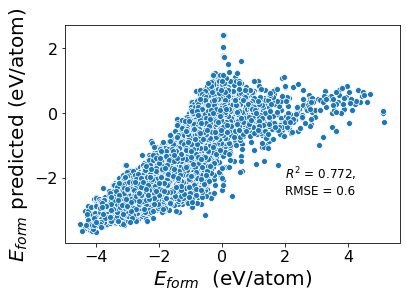

In [446]:
sns.scatterplot(test_y['formation_energy_per_atom'], yhat)
plt.ylabel(r"$E_{form}$" + " predicted (eV/atom)")
plt.xlabel(r"$E_{form}$" + "  (eV/atom)")
plt.annotate('$R^2$ = %.3f, \nRMSE = %.1f' % (r2, rmse), (2, -2.5), fontsize=12);

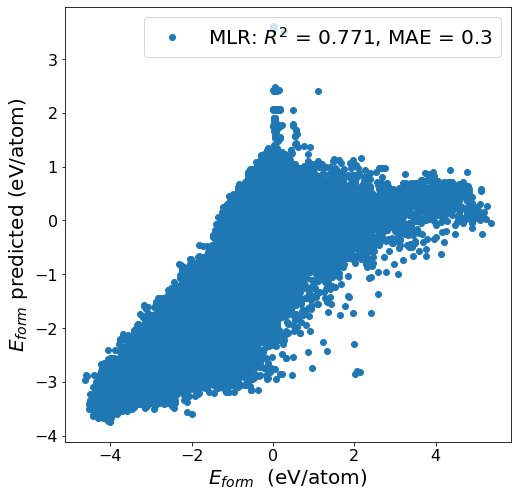

In [450]:
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.metrics import r2_score

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

mlr = linear_model.LinearRegression()
yhat_mlr = cross_val_predict(mlr, X, y['formation_energy_per_atom'], cv=kfold)
r2_mlr = r2_score(y['formation_energy_per_atom'], yhat_mlr)
mae_mlr = mean_squared_error(y['formation_energy_per_atom'], yhat_mlr)
label_mlr = "MLR: $R^2$ = %.3f, MAE = %.1f" % (r2_mlr, mae_mlr)

f, ax = plt.subplots(figsize=(8, 8))
plt.plot(y['formation_energy_per_atom'], yhat_mlr, 'o', label=label_mlr)
plt.ylabel(r"$E_{form}$" + " predicted (eV/atom)")
plt.xlabel(r"$E_{form}$" + "  (eV/atom)")
plt.legend()

In [485]:
regRidge = linear_model.Ridge(alpha=0.1, max_iter=10000)
regRidge.fit(norm_train_X, train_y['formation_energy_per_atom'])

prediction = regRidge.predict(norm_test_X)

In [486]:
mae = mean_absolute_error(test_y['formation_energy_per_atom'],prediction)
rmse = np.sqrt(mean_squared_error(test_y['formation_energy_per_atom'],prediction))
print('rmse: ',rmse,'mae:',mae)

rmse:  0.5787786348227164 mae: 0.39609974822361793


In [487]:
reg_lasso = linear_model.Lasso(alpha=0.1, max_iter=10000)
reg_lasso.fit(norm_train_X, train_y['formation_energy_per_atom'])

prediction = reg_lasso.predict(norm_test_X)

In [488]:
mae = mean_absolute_error(test_y['formation_energy_per_atom'],prediction)
rmse = np.sqrt(mean_squared_error(test_y['formation_energy_per_atom'],prediction))
print('rmse: ',rmse,'mae:',mae)

rmse:  0.6682866900892153 mae: 0.46578357518574054


In [502]:
classify = lambda x: 1 if x>=0.001 else 0
clean_df['class'] = [classify(bg) for bg in clean_df['band_gap']]

pandas.core.frame.DataFrame

In [504]:
train_y = pd.DataFrame(train_y)
train_y['class'] = [classify(bg) for bg in train_y['band_gap']]
train_y

,band_gap,formation_energy_per_atom,e_above_hull,class
task_id,,,,
mp-1203083,1.9719,-1.520642,0.041383,1
mp-766077,0.0000,-3.694138,0.032051,0
mp-1179340,3.3048,-1.439652,0.063557,1
mp-705367,1.9036,-2.675246,0.033318,1
mp-1246782,0.0000,-0.749127,0.328138,0
...,...,...,...,...
mp-1178763,0.0000,-1.294923,0.018793,0
mp-510565,0.1782,-2.359271,0.000000,1
mvc-15272,0.0000,-0.792936,0.000000,0


In [507]:
from scipy import linalg
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)

model = lda.fit(norm_train_X, train_y['class'])

ypred_lda = model.predict(norm_test_X)

In [515]:
model.score(norm_test_X, test_y['class'])

0.786248492159228

In [517]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
qda = QuadraticDiscriminantAnalysis(store_covariance=True)
model = qda.fit(norm_train_X, train_y['class'])
y_pred = model.predict(norm_test_X)
model.score(norm_test_X, test_y['class'])

0.7857659831121834

In [520]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(penalty='none', solver='lbfgs', max_iter=1000)
model = clf.fit(norm_train_X, train_y['class'])
y_pred = model.predict(norm_test_X)
model.score(norm_test_X, test_y['class'])

0.7917973462002412

## Q4

In [529]:
catalyst = plt.imread(lab_dir + 'catalyst.png', format='png')

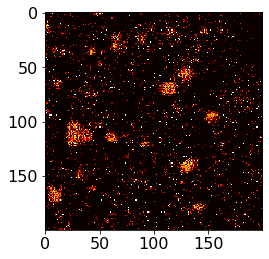

In [575]:
a = plt.imshow(catalyst, cmap='hot')

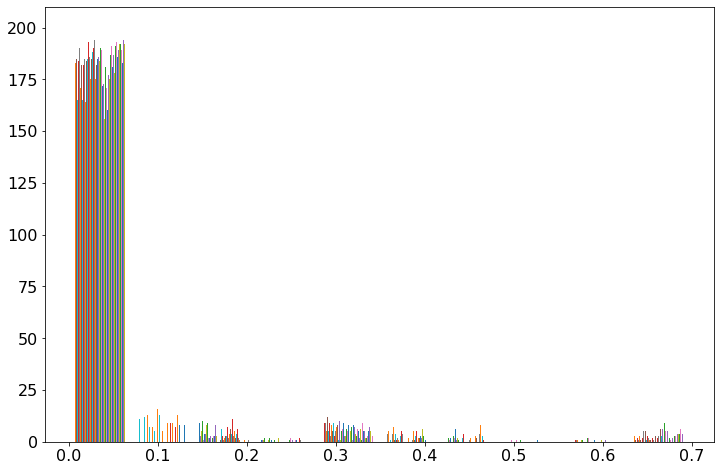

In [569]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(12, 8))
a = ax.hist(catalyst)

In [651]:
plottable = catalyst.flatten()

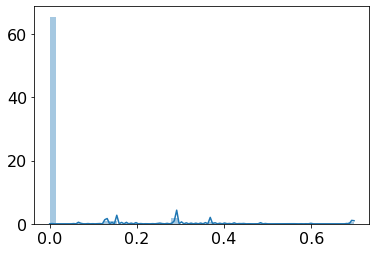

In [570]:
a =sns.distplot(plottable)

In [601]:
from sklearn.cluster import KMeans
clustering_5 = KMeans(5).fit_predict(plottable.reshape(-1,1))
clustering_5

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [602]:
clustering_5 = clustering_5.reshape(200,200)

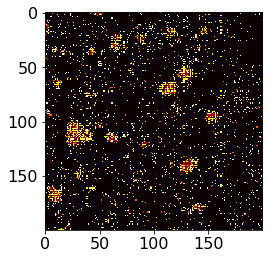

In [603]:
a = plt.imshow(clustering_5, cmap='hot')

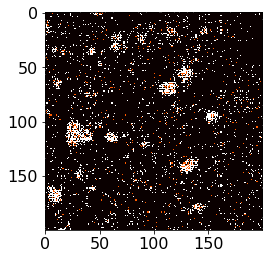

In [598]:
clustering_3 = KMeans(3).fit_predict(plottable.reshape(-1,1))
clustering_3 = clustering_3.reshape(200,200)
a = plt.imshow(clustering_3, cmap='hot')

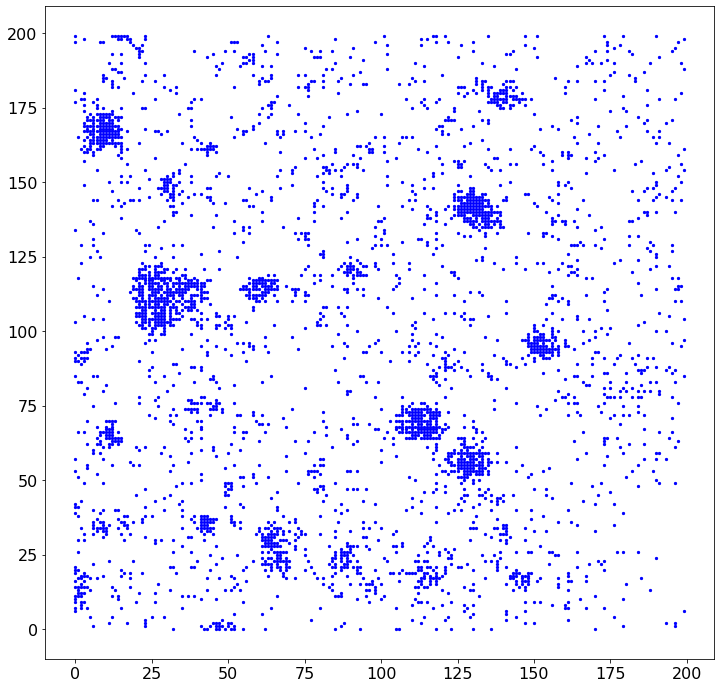

In [644]:
fig, ax = plt.subplots(figsize=(12, 12))

metal = np.array(np.nonzero(clustering_5)).transpose()
_ = plt.scatter(metal[:,1], metal[:,0], s=5, c='b')

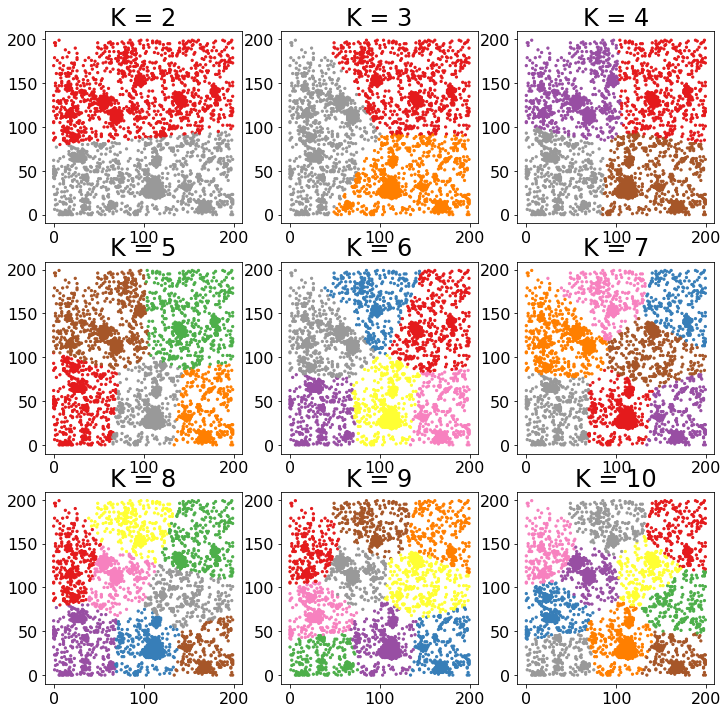

In [646]:
fig, ax = plt.subplots(3,3, figsize=(12, 12))

for i, k in enumerate(range(2, 11)):
    clustering = KMeans(k).fit(metal)
    a = ax[0 if i < 3 else 1 if i<6 else 2, i % 3]
    a.scatter(metal[:,0], metal[:,1], c=clustering.labels_,s = 5, cmap='Set1')
    a.set_title("K = %d" % k)

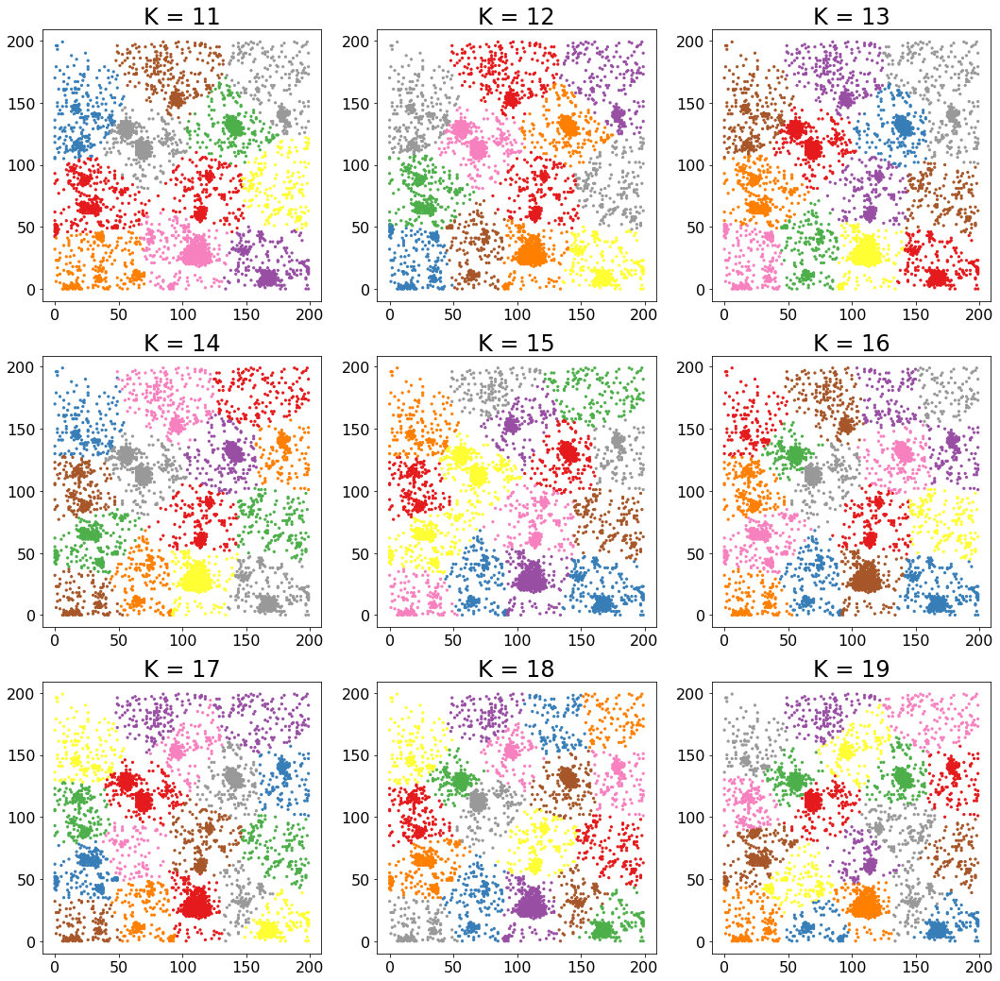

In [650]:
fig, ax = plt.subplots(3,3, figsize=(18, 18))

for i, k in enumerate(range(11, 20)):
    clustering = KMeans(k).fit(metal)
    a = ax[0 if i < 3 else 1 if i<6 else 2, i % 3]
    a.scatter(metal[:,0], metal[:,1], c=clustering.labels_,s = 5, cmap='Set1')
    a.set_title("K = %d" % k)

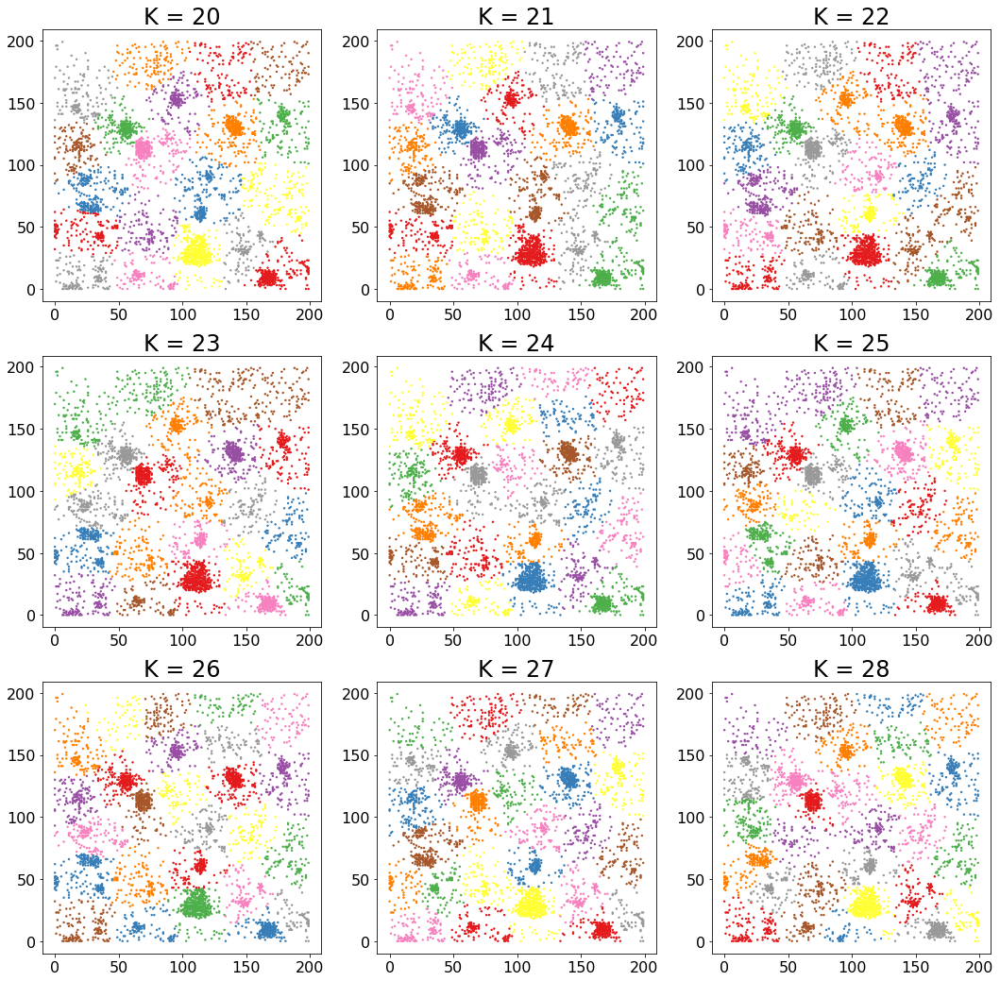

In [639]:
fig, ax = plt.subplots(3,3, figsize=(18, 18))

for i, k in enumerate(range(20, 29)):
    clustering = KMeans(k).fit(metal)
    a = ax[0 if i < 3 else 1 if i<6 else 2, i % 3]
    a.scatter(metal[:,0], metal[:,1], c=clustering.labels_,s = 5, cmap='Set1')
    a.set_title("K = %d" % k)

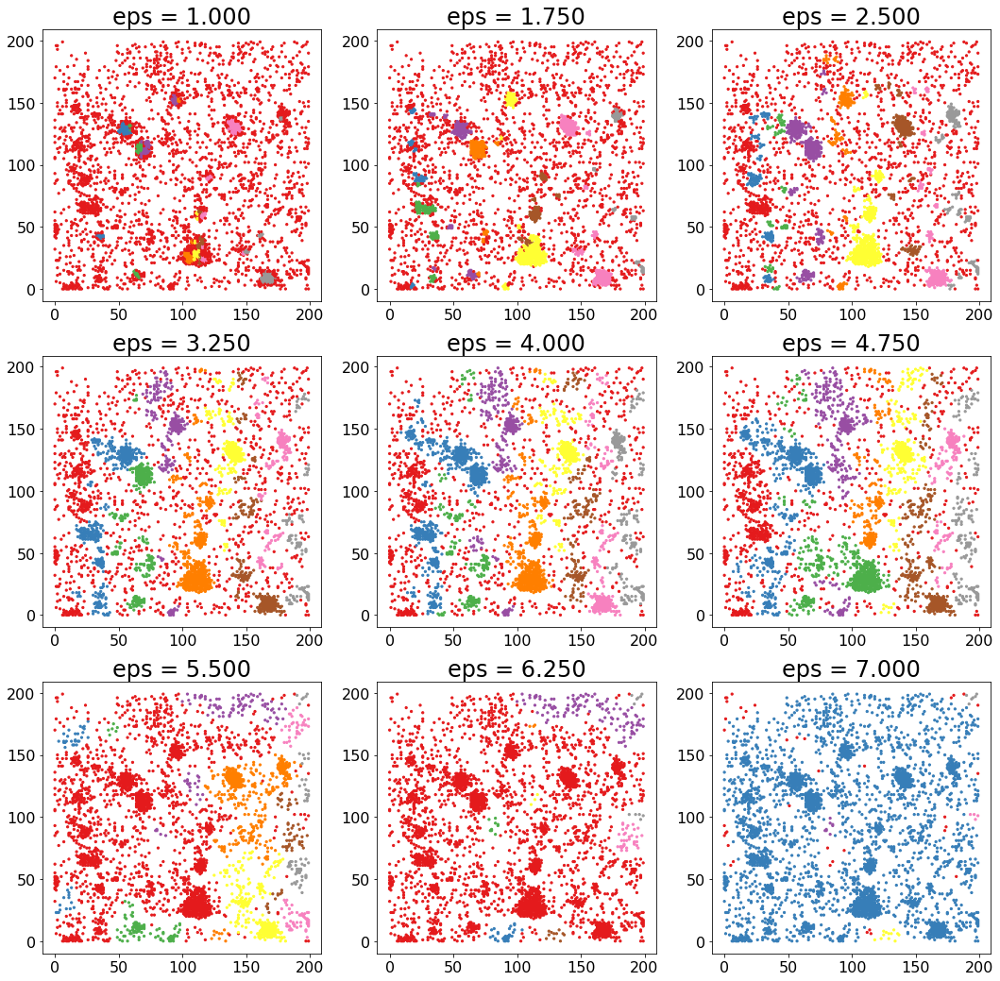

In [654]:
from sklearn.cluster import DBSCAN

fig, ax = plt.subplots(3, 3, figsize=(18, 18))

for i, eps in enumerate(np.linspace(1, 7, 9)):
    clustering = DBSCAN(eps=eps).fit(metal)
    a = ax[0 if i < 3 else 1 if i<6 else 2, i % 3]
    a.scatter(metal[:,0], metal[:,1], c=clustering.labels_, cmap='Set1',s = 5)
    a.set_title("eps = %.3f" % eps)

It is quite clear that DBSCAN is the more appropriate technique for identifying the clusters of nanoparticles in this problem. The K means method forces a set number of groups, leading to particles that are clearly (to human observer) not part of a cluster being grouped together with other clusters, an effect that remains present even as K is increased very high (though it looks vaguely accurate above k=23). On the other hand, DBSCAN naturally produces clustering scheme that aligns more closesly with my interpretation of the image as a human observer.

I think the best value for K in kmeans method appears to be K=26, but i'm sure this is an arbitrary choice - it is hard for me to judge being r-g colorblind (protan). Anyway, I believe that k in range(23:28) seems to cluster more appropriately than lower K values based on the apparent ratio of cluster particles:noncluster particles in each color. 

For DBSCAN, it appears that eps=2.500 produces the clustering coloartion scheme that best matches my human interpretation of where the significant clusters are - lower, at 1.75, ends up excluding some particles from clusters that appear to belong in the main cluster, and above, at 3.25, some clusters end up getting grouped together. it's possible that a more optimal choice than 2.5 exists in the rang between 1.75 and 3.25, but 2.5 seems like a safe estimate.